# Large Scale Incremental Learning


In this notebook we will present a large scale incremental learning called BiC (bias correction). BiC aims at adding a bias layer after the last fully connected layer to handle a large scale incremental learning scenario and reduce bias due to novel classes. 

# Bias Correction (BiC)

BiC is a two stages method. As a first step, training dataset in divided into training (used to train the model during stage 1) and validation (used to train the model during stage 2). BiC is a rehearsal approach where a portion of previously seen images (training and validation images) are stored and then combined to new images (corresponding to new classes) to train incrementally the model. Moreover, BiC is designed to be used only in a novel class incremental learning scenario.

During stage 1, the DNN's convolution layers and final fully connected layer are trained using training dataset. During stage 2, BiC adds a bias correction layer after the last fully connected (FC), which is a simple linear model with two parameters. The main idea is to keep the output logits for the old classes (1, . . . , n) and apply a linear model to correct the bias on the output logits for the new classes (n + 1, . . . , n + m). During stage 2 bias correction layers are trained where model's parameters are frozen. The figure below summarizes the BiC method.

![Overview of BiC method](overview.png)

To increase the performance and help to keep previous learned knowledge, BiC computes knowledge distillation to train the model during stage 1. For an incremental learning step with n old class and m new classes, we learn a new model to perform classification on n + m classes, by using the knowledge distillation from an old model that classifies the old n classes. The new model is learned by using a distilling loss and a classification loss as shown in the figure below.  

![Distillation](distilation.png)

# BiC Code

In the following code we train ResNet18 and consider a training from a subset scenario, where the network is trained on the 50 first classes of CIFAR100 as a first step. Then, the model is trained on nouvel instance where 1 new class is added at each incremental learning step. We use 90% samples for training and 10% for validation (to train the model during stage 1 and stage 2 respectively).

In [1]:
import torch
import torchvision
from torchvision.models import vgg16
from torchvision import transforms
from torch.utils.data import DataLoader
from torch.optim import Adam
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision.transforms import Compose, CenterCrop, Normalize, Scale, Resize, ToTensor, ToPILImage
from torch.optim.lr_scheduler import LambdaLR, StepLR

import numpy as np
import glob
import PIL.Image as Image
from tqdm import tqdm
import matplotlib.pyplot as plt
import os
import json
import pickle
from dataset import BatchData
from model import BiasLayer
from cifar import Cifar100
from exemplar import Exemplar
from copy import deepcopy
import resnet

In [2]:
total_cls = 100
seen_cls = 0
dataset = Cifar100()
model = resnet.ResNet18() # loading ResNet18 model
print(model)
model = model.cuda()

#Define bias correction layers. Note that 51 bias correction layers are defined since we first consider 50 classes for CIFAR100 (first bias correction layer)
#and then we add the remaining 50 classes incrementally one class at a time (and adding 50 other bias correction layers).
bias_layers = []
for i in range(51):
    bias_layers.append(BiasLayer().cuda())

input_transform= Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomCrop(32,padding=4),
    ToTensor(),
    Normalize([0.5071,0.4866,0.4409],[0.2673,0.2564,0.2762])])

input_transform_eval= Compose([
    ToTensor(),
    Normalize([0.5071,0.4866,0.4409],[0.2673,0.2564,0.2762])])

Files already downloaded and verified
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2

In [3]:
def test_function(testdata,seen_cls):
    # testdata correspond to testing dataset.
    # seen_cls is an integer that corresponds to the number of classes the model has seen so far.
    print("test data number : ",len(testdata))
    model.eval()
    count = 0
    correct = 0
    wrong = 0
    for i, (image, label) in enumerate(testdata):
        image = image.cuda()
        label = label.view(-1).cuda()
        p = model(image)
        p = bias_forward(p)
        pred = p[:,:seen_cls].argmax(dim=-1)
        correct += sum(pred == label).item()
        wrong += sum(pred != label).item()
    acc = correct / (wrong + correct)
    print("Test Acc: {}".format(acc*100))
    model.train()
    print("---------------------------------------------")
    return acc

In [4]:
def get_lr(optimizer):
        for param_group in optimizer.param_groups:
            return param_group['lr']
        
def bias_forward(input):
        # We consider images from either 50 first classes (in1) to compute out1 using the first bias correction layer,
        # or images from the same i'th class (where i>50) to compute out using the i'th bias correction layer.
        # bias_forward concatenates and returns all results obtained by all bias correction layers.
        in1 = input[:, :50]
        out1 = bias_layers[0](in1)
        for i in range(50):
            inp = input[:, i+50:i+51]
            out = bias_layers[i](inp)
            out1 = torch.cat([out1,out],dim = 1)
        
        return out1 #torch.cat([out1, out2, out3, out4, out5], dim = 1)


def stage1(train_data, criterion, optimizer,seen_cls):
    # We use this function only during first incremental learning step, where the model is trained on the first 50 classes of CIFAR100.
    # train_data corresponds to training dataset.
    # criterion is the loss function
    # optimizer is the optimizer we use to update DNN's parameters (SGD, Adam)
    # seen_cls is an integer that corresponds to the number of classes the model has seen so far.
    
        print("Training ... ")
        losses = []
        for i, (image, label) in enumerate(tqdm(train_data)):
            image = image.cuda()
            label = label.view(-1).cuda()
            p = model(image)
            p = bias_forward(p)
            loss = criterion(p[:,:seen_cls], label)
            optimizer.zero_grad()
            loss.backward(retain_graph=True)
            optimizer.step()
            losses.append(loss.item())
        print("stage1 loss :", np.mean(losses))

def stage1_distill(train_data, criterion, optimizer,seen_cls,previous_model):
    # We use this function for all but first first incremental learning step when we train the model on one class at a time.
    # train_data corrsponds to training dataset.
    # criterion is the loss function
    # optimizer is the optimizer we use to update DNN's parameters (SGD, Adam)
    # seen_cls is an integer that corresponds to the number of classes the model has seen so far.
    # previous_model is the model that has been trained at previous incremental learning step, used the train the current model using knowledge distillation.
        print("Training ... ")
        distill_losses = []
        ce_losses = []
        T = 2
        #define the propotion we use to balance between classification loss and distillation loss.
        alpha = (seen_cls - 50)/ seen_cls
        print("classification proportion 1-alpha = ", 1-alpha)
        for i, (image, label) in enumerate(tqdm(train_data)):
            image = image.cuda()
            label = label.view(-1).cuda()
            p = model(image)
            p = bias_forward(p)
            with torch.no_grad():
                pre_p = previous_model(image)
                pre_p = bias_forward(pre_p)
                pre_p = F.softmax(pre_p[:,:seen_cls-20]/T, dim=1)
            logp = F.log_softmax(p[:,:seen_cls-20]/T, dim=1)
            loss_soft_target = -torch.mean(torch.sum(pre_p * logp, dim=1))
            loss_hard_target = nn.CrossEntropyLoss()(p[:,:seen_cls], label)
            loss = loss_soft_target * T * T + (1-alpha) * loss_hard_target
            optimizer.zero_grad()
            loss.backward(retain_graph=True)
            optimizer.step()
            distill_losses.append(loss_soft_target.item())
            ce_losses.append(loss_hard_target.item())
        print("stage1 distill loss :", np.mean(distill_losses), "ce loss :", np.mean(ce_losses))

def stage2(val_bias_data, criterion, optimizer,seen_cls):
    # We use this function to train bias correction layers
    # val_bias_data corresponds to validation dataset.
    # criterion is the loss function
    # optimizer is the optimizer we use to update DNN's parameters (SGD, Adam)
    # seen_cls is an integer that corresponds to the number of classes the model has seen so far.
    
        print("Evaluating ... ")
        losses = []
        for i, (image, label) in enumerate(tqdm(val_bias_data)):
            image = image.cuda()
            label = label.view(-1).cuda()
            p = model(image)
            p = bias_forward(p)
            loss = criterion(p[:,:seen_cls], label)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            losses.append(loss.item())
        print("stage2 loss :", np.mean(losses))

In [5]:
def train(batch_size, epoches, lr, max_size):
    # We use this function to train our model. it regroups all training, test and incremental learning loops.
    # batch_size is an integer that corresponds to the size of one training, validation or test batch.
    # epoches is an integer that corresponds to the total number of epochs used to train the network.
    #max_size is an integer that corresponds to the total number of both old training and validation samples we keep to re-train the network. 
        total_cls = 100 
        criterion = nn.CrossEntropyLoss()
        exemplar = Exemplar(max_size, total_cls)

        previous_model = None

        dataset = Cifar100()
        test_xs = []
        test_ys = []
        train_xs = []
        train_ys = []

        test_accs = []
        for inc_i in range(dataset.batch_num): # incremental learning step loop.
            print(f"Incremental num : {inc_i}")
            train, val, test = dataset.getNextClasses(inc_i)
            print(len(train), len(val), len(test))
            train_x, train_y = zip(*train)
            val_x, val_y = zip(*val)
            test_x, test_y = zip(*test)
            test_xs.extend(test_x)
            test_ys.extend(test_y)

            train_xs, train_ys = exemplar.get_exemplar_train()
            train_xs.extend(train_x)
            train_xs.extend(val_x)
            train_ys.extend(train_y)
            train_ys.extend(val_y)


            train_data = DataLoader(BatchData(train_xs, train_ys, input_transform),
                        batch_size=batch_size, shuffle=True, drop_last=True)
            val_data = DataLoader(BatchData(val_x, val_y, input_transform_eval),
                        batch_size=batch_size, shuffle=False)
            test_data = DataLoader(BatchData(test_xs, test_ys, input_transform_eval),
                        batch_size=batch_size, shuffle=False)
            optimizer = optim.SGD(model.parameters(), lr=lr, momentum=0.9,  weight_decay=2e-4)
            # scheduler = LambdaLR(optimizer, lr_lambda=adjust_cifar100)
            scheduler = StepLR(optimizer, step_size=70, gamma=0.1)


            # bias_optimizer = optim.SGD(self.bias_layers[inc_i].parameters(), lr=lr, momentum=0.9)
            bias_optimizer = optim.Adam(bias_layers[inc_i].parameters(), lr=0.001)
            # bias_scheduler = StepLR(bias_optimizer, step_size=70, gamma=0.1)
            if(inc_i==0):
                classes = 50
            else:
                classes = 1
            exemplar.update(classes, (train_x, train_y), (val_x, val_y))

            seen_cls = exemplar.get_cur_cls()
            print("seen cls number : ", seen_cls)
            val_xs, val_ys = exemplar.get_exemplar_val()
            val_bias_data = DataLoader(BatchData(val_xs, val_ys, input_transform),
                        batch_size=100, shuffle=True, drop_last=False)
            test_acc = []


            for epoch in range(epoches): # training loop
                print("---"*50)
                print("Epoch", epoch)
                scheduler.step()
                cur_lr = get_lr(optimizer)
                print("Current Learning Rate : ", cur_lr)
                model.train()
                # we put eval on bias correction layers since we do not train them during stage 1.
                for _ in range(len(bias_layers)):
                    bias_layers[_].eval()
                # we compute ditillation to train the model after the first incremental learning step. 
                if inc_i > 0:
                    stage1_distill(train_data, criterion, optimizer,seen_cls,previous_model)
                else:
                    stage1(train_data, criterion, optimizer,seen_cls)
                acc = test_function(test_data,seen_cls)
            if inc_i > 0:
                for epoch in range(epoches):
                    # bias_scheduler.step()
                    # we put eval on the model since we do not train it during stage 2.
                    model.eval()
                    for _ in range(len(bias_layers)):
                        bias_layers[_].train()
                    stage2(val_bias_data, criterion, bias_optimizer,seen_cls)
                    if epoch % 50 == 0:
                        acc = test_function(test_data,seen_cls)
                        test_acc.append(acc)
            for i, layer in enumerate(bias_layers):
                layer.printParam(i)
            previous_model = deepcopy(model)
            acc = test_function(test_data,seen_cls)
            test_acc.append(acc)
            test_accs.append(max(test_acc))
            print(test_accs)

In [ ]:
train(batch_size = 128, epoches = 250, lr = 0.1, max_size = 2000)

Files already downloaded and verified


/home/mila/b/bouklihg/anaconda3/envs/ghouthi_env/lib/python3.7/site-packages/torch/optim/lr_scheduler.py:134: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  "https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate", UserWarning)
  0%|          | 0/195 [00:00<?, ?it/s]

Incremental num : 0
22500 2500 5000
seen cls number :  50
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:17<00:00, 10.87it/s]


stage1 loss : 3.519813196475689
test data number :  40


  1%|          | 2/195 [00:00<00:16, 11.97it/s]

Test Acc: 16.08
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 3.0599737656422152
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.06it/s]

Test Acc: 24.099999999999998
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 2.745642775755662
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.06it/s]

Test Acc: 28.58
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 2.4411279421586256
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.11it/s]

Test Acc: 35.42
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 2.16923879476694
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 40.300000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 1.8913738513604188
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.04it/s]

Test Acc: 46.06
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 1.706405218442281
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.09it/s]

Test Acc: 46.94
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 1.5360825966566036
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.06it/s]

Test Acc: 54.48
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 1.3903846979141234
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 56.10000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 1.2569442012371161
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.04it/s]

Test Acc: 59.72
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 1.1553385896560473
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 58.720000000000006
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 1.0671095695251074
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 60.9
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.9908500677500016
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.12it/s]

Test Acc: 61.82
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.05it/s]


stage1 loss : 0.9247609636722467
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.09it/s]

Test Acc: 62.82
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.8485156805087358
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 61.6
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.8036014064764365
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 63.56
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.05it/s]


stage1 loss : 0.7456662407288185
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 63.239999999999995
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.7239933351675669
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 64.56
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.10it/s]


stage1 loss : 0.6642703608060494
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.04it/s]

Test Acc: 64.84
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.05it/s]


stage1 loss : 0.6213051812771039
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.13it/s]

Test Acc: 65.96
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.5862839009517279
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.01it/s]

Test Acc: 64.46
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.577505865922341
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.04it/s]

Test Acc: 68.67999999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.05it/s]


stage1 loss : 0.5492585390042036
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.04it/s]

Test Acc: 65.74
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.05it/s]


stage1 loss : 0.5033500003509033
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 67.82000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.48362930829708395
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.10it/s]

Test Acc: 61.36000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.4752007388151609
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 68.76
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.44092282759837614
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.06it/s]

Test Acc: 66.56
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.4383554933926998
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 68.26
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.41970737003363096
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.11it/s]

Test Acc: 67.60000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.4097812915459657
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.06it/s]

Test Acc: 65.60000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.38951289569720243
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.03it/s]

Test Acc: 63.85999999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.352539366712937
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.11it/s]

Test Acc: 66.14
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.3594733604253867
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.01it/s]

Test Acc: 67.62
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.34452852790172284
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.11it/s]

Test Acc: 67.46
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.33323949827597693
test data number :  40


  1%|          | 2/195 [00:00<00:16, 11.86it/s]

Test Acc: 67.22
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.05it/s]


stage1 loss : 0.3296146352321674
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.02it/s]

Test Acc: 67.92
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.05it/s]


stage1 loss : 0.31492054279033954
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.03it/s]

Test Acc: 70.08
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.311745639412831
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.10it/s]

Test Acc: 68.4
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.3177833271332276
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.01it/s]

Test Acc: 68.8
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.29388065284643416
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 68.78
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.29350708639010403
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 70.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.283649604060711
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 65.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.28421564335242294
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.00it/s]

Test Acc: 66.60000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.2949296568448727
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.04it/s]

Test Acc: 69.74000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.2674641170180761
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 63.019999999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.2674207628155366
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.06it/s]

Test Acc: 69.62
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.25691234072049457
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.03it/s]

Test Acc: 68.56
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.276239436903061
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.11it/s]

Test Acc: 66.12
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.24499207322414104
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 68.10000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.2429490016821103
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 69.58
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.2507652680461223
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.04it/s]

Test Acc: 68.60000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.24283924400806428
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 69.76
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.24584206006465814
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 67.34
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.22525350336845104
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.01it/s]

Test Acc: 67.75999999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.05it/s]


stage1 loss : 0.24106636601380813
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.10it/s]

Test Acc: 67.92
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.23799507449834775
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.01it/s]

Test Acc: 67.86
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.05it/s]


stage1 loss : 0.24325849077640435
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.06it/s]

Test Acc: 71.72
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.2047384596787966
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 66.34
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.2582282393024518
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 71.38
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.24715771698034728
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 65.84
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.10it/s]


stage1 loss : 0.2044589780844175
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.04it/s]

Test Acc: 72.11999999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.23320504770829129
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 69.17999999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.24089650351267594
test data number :  40


  1%|          | 2/195 [00:00<00:16, 11.83it/s]

Test Acc: 67.60000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.05it/s]


stage1 loss : 0.22201702881317872
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.09it/s]

Test Acc: 71.3
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.10it/s]


stage1 loss : 0.20404002995063097
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 69.86
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.21000399478735068
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 69.26
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.21582510154216716
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.09it/s]

Test Acc: 69.78
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.2259844116293467
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 67.38
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.22269697388013204
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 67.7
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.09282663608781802
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.10it/s]

Test Acc: 77.22
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.05it/s]


stage1 loss : 0.04214622448079097
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.09it/s]

Test Acc: 77.82
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.032048667289125615
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 78.06
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.02548734333175115
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 78.34
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.023673476085353355
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.06it/s]

Test Acc: 78.42
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.019115476689946193
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 78.60000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.01680529685213398
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 78.9
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.016094226323259183
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.09it/s]

Test Acc: 78.72
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.05it/s]


stage1 loss : 0.013723922360879489
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.11it/s]

Test Acc: 78.92
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.013680421890547642
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.06it/s]

Test Acc: 79.08
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.012297251806236231
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.06it/s]

Test Acc: 79.08
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.012930921141583568
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.09it/s]

Test Acc: 79.2
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.10it/s]


stage1 loss : 0.011521558923264726
test data number :  40


  1%|          | 2/195 [00:00<00:16, 11.87it/s]

Test Acc: 79.3
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.011040643227692598
test data number :  40


  1%|          | 2/195 [00:00<00:16, 11.77it/s]

Test Acc: 79.22
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.01046373373351227
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.06it/s]

Test Acc: 79.14
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.05it/s]


stage1 loss : 0.009736250492576988
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 79.03999999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.009350101254546108
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.03it/s]

Test Acc: 79.42
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.008955629446949715
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 79.4
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.00894710359354623
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.06it/s]

Test Acc: 79.16
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.008522383589297532
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 79.2
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.008192472775968221
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 79.36
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.05it/s]


stage1 loss : 0.008088091652219494
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.03it/s]

Test Acc: 79.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.05it/s]


stage1 loss : 0.007820727377652359
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.00it/s]

Test Acc: 79.34
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.007887398754843535
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.04it/s]

Test Acc: 79.54
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.00763076813533329
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.06it/s]

Test Acc: 79.66
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.007255631644660846
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 79.62
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.006917232731118416
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.02it/s]

Test Acc: 79.72
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.00699776042228899
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.02it/s]

Test Acc: 79.52
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.006256079000349228
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.10it/s]

Test Acc: 79.62
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.05it/s]


stage1 loss : 0.006830883022541037
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 79.7
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.006828887932575666
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.06it/s]

Test Acc: 79.38
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.006316115296421907
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.09it/s]

Test Acc: 79.74
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.006496615143110737
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.06it/s]

Test Acc: 79.64
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.006541740318808036
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 79.52
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.10it/s]


stage1 loss : 0.0061568689866898915
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 79.42
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.006288201206674179
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 79.82000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.05it/s]


stage1 loss : 0.005796084100476061
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.02it/s]

Test Acc: 79.67999999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.00623555374570573
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.12it/s]

Test Acc: 79.44
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.00584265770844351
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 79.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.00581271958250839
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.11it/s]

Test Acc: 79.80000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.00560302415695519
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.04it/s]

Test Acc: 79.80000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.11it/s]


stage1 loss : 0.005968693790670771
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 79.78
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.0057399154975055116
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.04it/s]

Test Acc: 79.82000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.04it/s]


stage1 loss : 0.00568115387398463
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.04it/s]

Test Acc: 79.88
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.005529872283864862
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.11it/s]

Test Acc: 79.74
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.005564012711581129
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.01it/s]

Test Acc: 79.54
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.00547557627567305
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.09it/s]

Test Acc: 79.75999999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.005446897497854363
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.03it/s]

Test Acc: 79.80000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.005460836166420426
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.09it/s]

Test Acc: 79.9
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.00564450417072154
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.04it/s]

Test Acc: 79.7
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.05it/s]


stage1 loss : 0.005304075970362203
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.11it/s]

Test Acc: 80.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.005477680695744661
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.10it/s]

Test Acc: 79.84
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.005194543671006194
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 79.96
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.005142779777256342
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 79.67999999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.005457305305231458
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.17it/s]

Test Acc: 79.96
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.10it/s]


stage1 loss : 0.005200158974203544
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 79.97999999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.005229736539797905
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.02it/s]

Test Acc: 79.96
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.03it/s]


stage1 loss : 0.0052295361048518086
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 79.92
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.00495484931848179
test data number :  40


  1%|          | 2/195 [00:00<00:16, 11.98it/s]

Test Acc: 79.96
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.0052675703349403845
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.02it/s]

Test Acc: 80.12
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.0051877893889561676
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 79.86
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.005136319006291719
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.06it/s]

Test Acc: 79.74
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.005090369879960632
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.10it/s]

Test Acc: 80.10000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004810824978332489
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.06it/s]

Test Acc: 80.12
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.04it/s]


stage1 loss : 0.004981596498057629
test data number :  40


  1%|          | 2/195 [00:00<00:16, 11.95it/s]

Test Acc: 79.88
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004944450814181414
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.12it/s]

Test Acc: 79.88
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.10it/s]


stage1 loss : 0.00505602623288257
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.00it/s]

Test Acc: 79.96
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.005011861242401676
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 79.80000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004880006200610063
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.04it/s]

Test Acc: 80.10000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.004825297291748799
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.03it/s]

Test Acc: 80.06
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004827484862210277
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.02it/s]

Test Acc: 80.24
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.02it/s]


stage1 loss : 0.004732336213764472
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.09it/s]

Test Acc: 80.22
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.004910215281714232
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.16it/s]

Test Acc: 80.02
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.10it/s]


stage1 loss : 0.004842831519766687
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.03it/s]

Test Acc: 80.10000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.004778067484641304
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.02it/s]

Test Acc: 80.04
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.004882681664700309
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.02it/s]

Test Acc: 80.06
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004757404317840551
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 80.22
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004727605880739597
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.00it/s]

Test Acc: 80.14
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.01it/s]


stage1 loss : 0.004780283640735806
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 79.92
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.004671624841359564
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.04it/s]

Test Acc: 80.02
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.10it/s]


stage1 loss : 0.004665729565880237
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.06it/s]

Test Acc: 79.84
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.004693157956577264
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 80.24
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.004599116166504338
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 80.28
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.004760609162995258
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.02it/s]

Test Acc: 80.24
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.00472194670389096
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 80.17999999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.01it/s]


stage1 loss : 0.004792474077727932
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.09it/s]

Test Acc: 80.25999999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004711158602283551
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.03it/s]

Test Acc: 80.17999999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.004664488451985213
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 80.10000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.0047905927762771265
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.09it/s]

Test Acc: 80.14
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004720114009120526
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 80.30000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.00457480205819966
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.10it/s]

Test Acc: 79.97999999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.10it/s]


stage1 loss : 0.0047673444717358324
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 80.10000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.00it/s]


stage1 loss : 0.004799708025529981
test data number :  40


  1%|          | 2/195 [00:00<00:16, 11.87it/s]

Test Acc: 80.32000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004722836741413444
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.12it/s]

Test Acc: 80.10000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.00473703280545007
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 80.2
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.00467374204323651
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.10it/s]

Test Acc: 80.24
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.004414108560348933
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.04it/s]

Test Acc: 80.06
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.004715059144804493
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.11it/s]

Test Acc: 79.88
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.004541918881333027
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 80.16
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 11.99it/s]


stage1 loss : 0.004820816214076984
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 80.04
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004716279368417767
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.03it/s]

Test Acc: 80.08
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.0045559369958937165
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 80.06
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.004515990735485385
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 80.2
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.004618094438830247
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.12it/s]

Test Acc: 80.22
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.00463565790022795
test data number :  40


  1%|          | 2/195 [00:00<00:16, 11.83it/s]

Test Acc: 80.24
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.10it/s]


stage1 loss : 0.004621917449940856
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.06it/s]

Test Acc: 80.06
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.00it/s]


stage1 loss : 0.004581714277036297
test data number :  40


  1%|          | 2/195 [00:00<00:16, 11.98it/s]

Test Acc: 80.16
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004706851974463998
test data number :  40


  1%|          | 2/195 [00:00<00:16, 11.92it/s]

Test Acc: 80.12
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.00457367336926743
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 80.16
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.004547480438859799
test data number :  40


  1%|          | 2/195 [00:00<00:16, 11.93it/s]

Test Acc: 80.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.004706190761107092
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.10it/s]

Test Acc: 80.14
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.004636618336185049
test data number :  40


  1%|          | 2/195 [00:00<00:16, 11.82it/s]

Test Acc: 80.30000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004497367740632632
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 80.04
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.01it/s]


stage1 loss : 0.004520032539342841
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.03it/s]

Test Acc: 80.22
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.004489831563133078
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.11it/s]

Test Acc: 79.94
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.0046277363199549604
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 80.06
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.004484780698728103
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 80.02
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.05it/s]


stage1 loss : 0.004648432897356076
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.04it/s]

Test Acc: 80.04
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004644380384483017
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.06it/s]

Test Acc: 80.08
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.004590186231936782
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.09it/s]

Test Acc: 79.9
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.01it/s]


stage1 loss : 0.004834902756966842
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.13it/s]

Test Acc: 80.08
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.004502004972444131
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 80.08
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004592625842167017
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.09it/s]

Test Acc: 80.06
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.004735601855776249
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 80.06
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.0046517578741678825
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.02it/s]

Test Acc: 80.17999999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.004666629209159276
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 79.97999999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004616605207467308
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.03it/s]

Test Acc: 80.12
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.00it/s]


stage1 loss : 0.004548507761687804
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.01it/s]

Test Acc: 79.92
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.00458199122431091
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.06it/s]

Test Acc: 80.17999999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.004505577074507108
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.10it/s]

Test Acc: 80.12
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.10it/s]


stage1 loss : 0.004636641870587109
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.04it/s]

Test Acc: 80.08
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.004554296097455499
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.09it/s]

Test Acc: 80.04
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004621913569430128
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.04it/s]

Test Acc: 79.94
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.004480782652703615
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.04it/s]

Test Acc: 80.25999999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.02it/s]


stage1 loss : 0.004438008631890019
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.04it/s]

Test Acc: 80.28
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.004489483268788228
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 80.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004569259555771565
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.00it/s]

Test Acc: 80.14
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.004497178648717893
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.09it/s]

Test Acc: 80.17999999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.004514766868968041
test data number :  40


  1%|          | 2/195 [00:00<00:16, 11.97it/s]

Test Acc: 80.06
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.004599209732782
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.04it/s]

Test Acc: 80.10000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004638598903488272
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.11it/s]

Test Acc: 80.02
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.03it/s]


stage1 loss : 0.004610364229824298
test data number :  40


  1%|          | 2/195 [00:00<00:16, 11.81it/s]

Test Acc: 80.2
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.0044605522118031215
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.10it/s]

Test Acc: 80.06
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.004610099845255415
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 80.16
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.004379540991085844
test data number :  40


  1%|          | 2/195 [00:00<00:16, 11.99it/s]

Test Acc: 80.06
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004648676287764922
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 80.02
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004655153430902805
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.01it/s]

Test Acc: 80.04
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.004548584149839978
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.06it/s]

Test Acc: 80.08
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.00it/s]


stage1 loss : 0.004633327855322606
test data number :  40


  1%|          | 2/195 [00:00<00:16, 11.99it/s]

Test Acc: 80.17999999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.05it/s]


stage1 loss : 0.004682724986177607
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.06it/s]

Test Acc: 80.08
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004417956944029682
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.09it/s]

Test Acc: 80.2
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004526015002137194
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.11it/s]

Test Acc: 80.12
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.004731968342541502
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.03it/s]

Test Acc: 79.96
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.004665266254391426
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 79.86
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.004597084731675493
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 79.96
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.01it/s]


stage1 loss : 0.004508012040064503
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.10it/s]

Test Acc: 80.25999999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.05it/s]


stage1 loss : 0.0045900056455045555
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 80.14
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.0045597922940475814
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 79.97999999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.0043856868436798835
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.06it/s]

Test Acc: 80.16
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004604724718210025
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.03it/s]

Test Acc: 79.97999999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.05it/s]


stage1 loss : 0.004595373266448195
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 80.12
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.004454878124241264
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.01it/s]

Test Acc: 80.04
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.00it/s]


stage1 loss : 0.0045591797572202405
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 80.04
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004535437777089194
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.04it/s]

Test Acc: 80.12
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.004633363146478167
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.06it/s]

Test Acc: 80.24
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004629142670772779
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 80.14
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004544086645667752
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.03it/s]

Test Acc: 79.9
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.004570761922364816
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 79.96
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.0045592796439543745
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.09it/s]

Test Acc: 80.28
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.00it/s]


stage1 loss : 0.004705358665579786
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.10it/s]

Test Acc: 80.12
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004564781098936995
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 80.06
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.0046261983804213695
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.07it/s]

Test Acc: 80.22
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004512720390294607
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.09it/s]

Test Acc: 80.10000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.004439402192544479
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 80.12
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.06it/s]


stage1 loss : 0.004695313579092423
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 79.97999999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.0046186080369620755
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.08it/s]

Test Acc: 80.12
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.00it/s]


stage1 loss : 0.0046415069080793705
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.05it/s]

Test Acc: 80.06
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004448278533676878
test data number :  40


  1%|          | 2/195 [00:00<00:16, 11.96it/s]

Test Acc: 80.10000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.07it/s]


stage1 loss : 0.004690133116375178
test data number :  40


  1%|          | 2/195 [00:00<00:16, 12.04it/s]

Test Acc: 80.06
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.09it/s]


stage1 loss : 0.004418573442559976
test data number :  40


  1%|          | 2/195 [00:00<00:15, 12.09it/s]

Test Acc: 80.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 


100%|██████████| 195/195 [00:16<00:00, 12.08it/s]


stage1 loss : 0.004669629003948126
test data number :  40
Test Acc: 80.16
---------------------------------------------
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 80.16
---------------------------------------------
[0.8016]
Incremental num : 1
450 50 100
seen cls number :  51
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.5867144500508028 ce loss : 0.5858994485700831
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.28it/s]

Test Acc: 60.94117647058823
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.40it/s]


stage1 distill loss : 1.8329452416476082 ce loss : 0.4764924531473833
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.490196078431374
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 2.150803797385272 ce loss : 1.0394289528622347
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.33it/s]

Test Acc: 27.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.41it/s]


stage1 distill loss : 2.214275738772224 ce loss : 1.1997849169899435
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 19.07843137254902
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 2.1044650218066048 ce loss : 0.9723040040801553
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 35.78431372549019
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.9604634958155014 ce loss : 0.6484636909821454
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 34.94117647058824
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.8633391015669878 ce loss : 0.4446369567338158
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 41.76470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.7864116079667036 ce loss : 0.29452113631893606
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 53.05882352941177
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.7307922489502852 ce loss : 0.21564154765185187
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 54.70588235294118
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.7156543310950785 ce loss : 0.13948730423169978
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 58.88235294117648
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.6828598485273474 ce loss : 0.09915514575207934
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 60.78431372549019
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.6457457682665657 ce loss : 0.07552667575723984
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 62.70588235294118
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.07it/s]


stage1 distill loss : 1.6244712787515976 ce loss : 0.05274908200782888
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 62.17647058823529
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.6103886996998507 ce loss : 0.04680974124109044
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 64.11764705882354
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.6135110784979427 ce loss : 0.03326130943263278
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 62.882352941176464
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.6092429651933557 ce loss : 0.032592690166305095
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 64.27450980392156
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5971933743532967 ce loss : 0.0269675232908305
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 64.11764705882354
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.6030406110426958 ce loss : 0.01936019113396897
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 63.6078431372549
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.586988421047435 ce loss : 0.01976649879532702
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 65.8235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.5805843577665442 ce loss : 0.020539372392437038
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 64.0392156862745
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.5792165644028608 ce loss : 0.016159152584698272
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 65.49019607843137
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5723884666667265 ce loss : 0.015178073581088991
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 64.92156862745098
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.586972159497878 ce loss : 0.015115447616314186
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 65.37254901960785
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5761440361247343 ce loss : 0.014588847153765313
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 65.94117647058823
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5840161477818209 ce loss : 0.01380734342862578
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 65.7843137254902
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.575872168821447 ce loss : 0.013879713931066148
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 65.64705882352942
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.571821423137889 ce loss : 0.014799858224304283
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 66.11764705882352
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.42it/s]


stage1 distill loss : 1.585962078150581 ce loss : 0.013211961780839106
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 66.3921568627451
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5676946920507095 ce loss : 0.010554782416233244
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 64.86274509803923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.5654288810842178 ce loss : 0.0089871323777034
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 67.66666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5578482571770162 ce loss : 0.00916926417609348
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 64.27450980392156
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.5782536478603588 ce loss : 0.009469825117027058
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 67.3529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5598565340042114 ce loss : 0.008671172127565917
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 65.6078431372549
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5596949703553145 ce loss : 0.008348653613425353
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 67.15686274509804
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5573539172901827 ce loss : 0.00940384973278817
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 67.2156862745098
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.41it/s]


stage1 distill loss : 1.5625641556347118 ce loss : 0.008996489676920807
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 68.29411764705883
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5801014689838184 ce loss : 0.009827923467930625
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 66.45098039215686
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5581216531641342 ce loss : 0.008328762946321684
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 67.15686274509804
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5370822724174051 ce loss : 0.008226840756833553
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 67.66666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.553540503277498 ce loss : 0.010116350015296656
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 67.45098039215686
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.551437777631423 ce loss : 0.007704751566052437
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 67.68627450980392
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.42it/s]


stage1 distill loss : 1.5324570431428797 ce loss : 0.0068256849806536644
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 67.72549019607843
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5581656974904678 ce loss : 0.006986903273226584
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 65.05882352941177
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5670331155552584 ce loss : 0.00813982033115976
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 66.58823529411765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.5577940449995153 ce loss : 0.007573261254412287
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 67.17647058823529
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5595544997383566 ce loss : 0.0077848596881855935
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 68.23529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5544009909910315 ce loss : 0.006815773065147155
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 68.47058823529412
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5565829417284798 ce loss : 0.008177231476806542
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 68.68627450980392
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.549932038082796 ce loss : 0.009462133816936436
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 65.54901960784314
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5603394999223597 ce loss : 0.006999864571673029
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 68.35294117647058
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5313582630718456 ce loss : 0.007057554266579887
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 66.15686274509804
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5522875855950748 ce loss : 0.00579200398779529
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 67.84313725490196
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5623776421827429 ce loss : 0.006356248577289721
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 67.70588235294117
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5485789986217724 ce loss : 0.0075553585912155755
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 67.56862745098039
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5357631585177254 ce loss : 0.007207896683693808
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.31372549019608
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.545136059031767 ce loss : 0.005700871704474968
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 68.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5452109996010275 ce loss : 0.0065778095603865735
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 67.23529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00,  9.84it/s]


stage1 distill loss : 1.5534874691682703 ce loss : 0.006114421439740588
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 67.98039215686275
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5326930074130787 ce loss : 0.00573487307273728
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 67.64705882352942
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.42it/s]


stage1 distill loss : 1.5534549951553345 ce loss : 0.005629814216209685
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 68.6078431372549
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5445556009516996 ce loss : 0.005859469720984206
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 68.74509803921569
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.39it/s]


stage1 distill loss : 1.549885770853828 ce loss : 0.006379424375207985
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 68.98039215686275
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5543797717374914 ce loss : 0.005604697062688715
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.23529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5397519854938282 ce loss : 0.005581434227197486
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.98039215686275
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5483601864646463 ce loss : 0.0055851389736156255
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 67.88235294117648
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.552336854093215 ce loss : 0.005689070272423765
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 68.43137254901961
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.549106057952432 ce loss : 0.005505609695854432
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 66.66666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5374809012693518 ce loss : 0.005056531921796063
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 68.74509803921569
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5407869184718412 ce loss : 0.006592602236196399
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 68.2156862745098
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5493563063004439 ce loss : 0.005402455462471527
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 68.43137254901961
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5230225114261402 ce loss : 0.0044840043821536444
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 68.92156862745098
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.543282102136051 ce loss : 0.005206182352541124
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 68.47058823529412
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.41it/s]


stage1 distill loss : 1.5393718200571396 ce loss : 0.0041195189662496835
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 69.07843137254902
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.538241091896506 ce loss : 0.0038055192460032072
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 68.98039215686275
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5347314161412857 ce loss : 0.004253098837045186
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 68.92156862745098
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.52881139867446 ce loss : 0.003854574854759609
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 68.70588235294117
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5436249129912432 ce loss : 0.003798297688584117
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.13725490196079
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5328790861017563 ce loss : 0.004169095348676338
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 68.98039215686275
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5227614991805132 ce loss : 0.003495586625135997
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 68.96078431372548
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5295486450195312 ce loss : 0.003497558317201979
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 69.05882352941177
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.42it/s]


stage1 distill loss : 1.5251432657241821 ce loss : 0.003780112779863617
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.11764705882352
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5415469618404614 ce loss : 0.003759960424812401
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.19607843137256
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5296852308161117 ce loss : 0.0036233272540437825
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.03921568627452
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.532465422854704 ce loss : 0.003775501705925254
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.70588235294117
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.536031912354862 ce loss : 0.0039219385122551634
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.01960784313725
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5247421895756441 ce loss : 0.0033361286828842234
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 69.3921568627451
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5313599810880774 ce loss : 0.003474853795898311
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 69.09803921568628
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5347368296454935 ce loss : 0.00346848472733708
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.43137254901961
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5325902840670418 ce loss : 0.003762162276817595
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 69.49019607843138
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.5307383256800033 ce loss : 0.004380121320376501
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.25490196078431
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.539220185840831 ce loss : 0.004381744670407737
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 68.90196078431372
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5304869413375854 ce loss : 0.003411878119496738
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.11764705882352
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5369170834036434 ce loss : 0.003561702639083652
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 69.19607843137256
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.5444132229861092 ce loss : 0.0036811128340880662
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.25490196078431
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5405942622353048 ce loss : 0.0031204715864185024
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.09803921568628
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5348733733682072 ce loss : 0.0033642936032265425
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.13725490196079
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5506543201558731 ce loss : 0.0036933487007284865
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 68.82352941176471
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5292264503591202 ce loss : 0.0032104004914050594
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.15686274509804
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5303493878420662 ce loss : 0.003518560901284218
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 69.62745098039215
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.5455081953721888 ce loss : 0.003351190401350751
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.41176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.512555388843312 ce loss : 0.003540154135621646
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.31372549019608
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.525089137694415 ce loss : 0.00336218933465288
test data number :  40


  6%|▌         | 1/17 [00:00<00:01,  9.39it/s]

Test Acc: 69.15686274509804
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.21it/s]


stage1 distill loss : 1.5377420327242683 ce loss : 0.0034411461366450086
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 69.37254901960785
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5455445752424353 ce loss : 0.0037757695433409777
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.33333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5322846805348116 ce loss : 0.003685211406691986
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.35294117647058
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.40it/s]


stage1 distill loss : 1.5329329406513887 ce loss : 0.0034990415442734957
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.49019607843138
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5253417772405289 ce loss : 0.003480028046075912
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.68627450980392
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5188064364825977 ce loss : 0.0034685691215974443
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.45098039215686
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.543431983274572 ce loss : 0.0038162472603075646
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.52941176470588
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5255884703467875 ce loss : 0.0035905769943971842
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 69.13725490196079
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.5245012465645285 ce loss : 0.003519866122480701
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 69.45098039215686
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.523995602832121 ce loss : 0.0035827746751773007
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.6078431372549
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5265237583833582 ce loss : 0.003176505328156054
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.66666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5365362798466402 ce loss : 0.0034226175972863157
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.3921568627451
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5306179032606237 ce loss : 0.003099585554617293
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.41176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5307227162753834 ce loss : 0.003539676750626634
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 69.45098039215686
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.5329231234157787 ce loss : 0.004064063473111566
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.23529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.516476638176862 ce loss : 0.003295367254930384
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.27450980392157
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5131085550083834 ce loss : 0.0032879430252839535
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.2156862745098
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5327042271109188 ce loss : 0.003287330283509458
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.45098039215686
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.517749309539795 ce loss : 0.0033685730715446614
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 69.05882352941177
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.531418057049022 ce loss : 0.0038580945966874853
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.54901960784314
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5292065213708317 ce loss : 0.0034278873217237346
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.41176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5268494311500997 ce loss : 0.002937346669461797
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.41176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5326363409266752 ce loss : 0.003471831914366168
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 69.56862745098039
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.42it/s]


stage1 distill loss : 1.520950857330771 ce loss : 0.003353930941289839
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.6078431372549
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5211024494732128 ce loss : 0.003374633050578482
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.58823529411765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5351393994163065 ce loss : 0.0034745229024659187
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.62745098039215
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5371735166100895 ce loss : 0.00377828033421846
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.82352941176471
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5219443054760204 ce loss : 0.003212735166444498
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.6078431372549
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5280503665699678 ce loss : 0.0033288863076664068
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.68627450980392
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5330459791071274 ce loss : 0.0031440276310176533
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.6470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5249199306263643 ce loss : 0.003408473656129311
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.58823529411765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.527950595406925 ce loss : 0.003897432456998264
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 69.62745098039215
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.5298521939445944 ce loss : 0.0034823063760995865
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.76470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.528618896708769 ce loss : 0.003074029679684078
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 69.43137254901961
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5339936999713673 ce loss : 0.0033466989612754654
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.31372549019608
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5424133258707382 ce loss : 0.003502444994142827
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 69.05882352941177
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5284080084632425 ce loss : 0.0034422579303602964
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.41176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5331398388918709 ce loss : 0.0034054171923986252
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.54901960784314
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5363664276459639 ce loss : 0.0037262701182900104
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.52941176470588
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5355894425336052 ce loss : 0.0032228372498031926
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 69.45098039215686
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.5294513141407686 ce loss : 0.003446248031276114
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.47058823529412
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5289691896999584 ce loss : 0.0032674299059983563
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.49019607843138
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5307388516033398 ce loss : 0.0032486297491499607
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.47058823529412
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.541225692805122 ce loss : 0.003569075659684399
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.33333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.06it/s]


stage1 distill loss : 1.51971356307759 ce loss : 0.003234893042484627
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.50980392156862
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.42it/s]


stage1 distill loss : 1.5339372859281653 ce loss : 0.0030223023803795084
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.58823529411765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.5275081255856682 ce loss : 0.0032367025885511845
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.6078431372549
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5241508343640495 ce loss : 0.0033256739569718346
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 69.66666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.512881033560809 ce loss : 0.003418175407740123
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.50980392156862
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.54157853827757 ce loss : 0.0032385396702653345
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.74509803921569
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5272719509461348 ce loss : 0.0032317261896370087
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.52941176470588
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5267245839623844 ce loss : 0.0032833880772266317
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.58823529411765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5353681339937097 ce loss : 0.0034284878330414787
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.68627450980392
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5241833153892965 ce loss : 0.003212861648267683
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.19607843137256
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5406848542830522 ce loss : 0.0034039312124471456
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.80392156862744
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5304156611947453 ce loss : 0.003056123702074675
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.49019607843138
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5295441290911507 ce loss : 0.003368989989051924
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.11764705882352
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.42it/s]


stage1 distill loss : 1.5323243141174316 ce loss : 0.003341181224266834
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.43137254901961
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.536364667555865 ce loss : 0.0033342505065614685
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.35294117647058
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.5210385532940136 ce loss : 0.003629466340712765
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.15686274509804
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.42it/s]


stage1 distill loss : 1.5353149035397697 ce loss : 0.0034701010513612453
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 69.35294117647058
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5113724189646103 ce loss : 0.0032318980323479455
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 69.45098039215686
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.5307820544523352 ce loss : 0.0035851893480867147
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 69.82352941176471
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5383808472577263 ce loss : 0.0029938691227203783
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.74509803921569
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5409682428135592 ce loss : 0.0031835206044728264
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.62745098039215
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.525197379729327 ce loss : 0.003346040420343771
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.6470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.528453932088964 ce loss : 0.0033537442111136284
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.68627450980392
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5299671818228329 ce loss : 0.0034958584960002232
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 69.74509803921569
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.41it/s]


stage1 distill loss : 1.5253047592499678 ce loss : 0.0031663200900177747
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 69.47058823529412
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.5345248404671163 ce loss : 0.0030912788831354942
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.56862745098039
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5361035501255709 ce loss : 0.003256316721329794
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.45098039215686
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5265468779732199 ce loss : 0.0038414807332789198
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.7843137254902
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5274316423079546 ce loss : 0.003399282734950676
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.58823529411765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5264648760066313 ce loss : 0.0034612964099163517
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.41176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5306476985707003 ce loss : 0.003524280495612937
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.56862745098039
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5280667192795698 ce loss : 0.003084658384870957
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.33333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.538450269138112 ce loss : 0.003295438870897188
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.47058823529412
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5306772764991312 ce loss : 0.0032052421558867485
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.92156862745098
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.535326501902412 ce loss : 0.0035322998266886264
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.56862745098039
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5261719857945162 ce loss : 0.003289131954421892
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.7843137254902
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.525230232407065 ce loss : 0.0036735381684539947
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 69.90196078431372
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5369567941216862 ce loss : 0.003946752520278096
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.96078431372548
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.5229845678105074 ce loss : 0.0036944963229710564
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 69.66666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5100592865663416 ce loss : 0.003362373243469526
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.7843137254902
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.42it/s]


stage1 distill loss : 1.5258373232448803 ce loss : 0.0030049922026912958
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.72549019607843
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.517128404449014 ce loss : 0.0032081641873125642
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.6078431372549
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.42it/s]


stage1 distill loss : 1.5420579349293428 ce loss : 0.0029744219842969496
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.6470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5193474993986242 ce loss : 0.0031669442404938094
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.58823529411765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5428368273903341 ce loss : 0.0029259460485156845
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.98039215686275
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00,  9.63it/s]


stage1 distill loss : 1.5261331516153671 ce loss : 0.0030632666723035716
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 69.90196078431372
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.41it/s]


stage1 distill loss : 1.5384297020295088 ce loss : 0.003254891085602781
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.6470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5261685567743637 ce loss : 0.0030542387873591747
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 69.7843137254902
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5225342371884514 ce loss : 0.003329964409417966
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.98039215686275
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.42it/s]


stage1 distill loss : 1.5230072526370777 ce loss : 0.0033719291335300486
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 69.54901960784314
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.41it/s]


stage1 distill loss : 1.518185720724218 ce loss : 0.003300743903416921
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.6078431372549
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5390746873967789 ce loss : 0.0031874474507811315
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 69.84313725490196
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5141897201538086 ce loss : 0.0033447208458229024
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.56862745098039
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5266027871300192 ce loss : 0.0028717834639417775
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.54901960784314
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5350381837171667 ce loss : 0.0032062728012747623
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.6470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.531552973915549 ce loss : 0.003402320298311465
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.37254901960785
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5304678888881909 ce loss : 0.0029403381734429035
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.82352941176471
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5352145363302792 ce loss : 0.003272780792458969
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.76470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5358813650467817 ce loss : 0.003244943149826106
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.68627450980392
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5211344396366793 ce loss : 0.003093117752167232
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.80392156862744
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.525749451973859 ce loss : 0.0034003235564074095
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 69.86274509803921
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.519552567425896 ce loss : 0.0032278811011244267
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 69.6470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5337065247928394 ce loss : 0.003193989601534079
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 69.3921568627451
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.42it/s]


stage1 distill loss : 1.526922899134019 ce loss : 0.002969122484928983
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.37254901960785
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5181894091998829 ce loss : 0.003265117514221107
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.6078431372549
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5198208093643188 ce loss : 0.0032530590371393107
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.41176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5255416912191055 ce loss : 0.0034250838764230997
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.6470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5240971831714405 ce loss : 0.0033633556792183835
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.47058823529412
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5233218950383804 ce loss : 0.0032268265563556377
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.2156862745098
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5140761207131779 ce loss : 0.0032697481322376165
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.52941176470588
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5205339123221004 ce loss : 0.0031395760529181536
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.68627450980392
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.536050509004032 ce loss : 0.0034285312217167195
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.72549019607843
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5227246003992416 ce loss : 0.0034203041372272897
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 69.70588235294117
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.524578003322377 ce loss : 0.0032308451447855026
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.84313725490196
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5326182561762192 ce loss : 0.0031729473951546583
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.7843137254902
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.525515633470872 ce loss : 0.0031195874052012667
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.72549019607843
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.528893274419448 ce loss : 0.003710725933642072
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.68627450980392
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.53164145525764 ce loss : 0.0037393734708209246
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.6470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.5232255248462452 ce loss : 0.0035148362820858464
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 69.70588235294117
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5159932164584888 ce loss : 0.0029191903372788254
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.6078431372549
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.51878242632922 ce loss : 0.0032011748236768387
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.6078431372549
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5221818124546724 ce loss : 0.0033596673679045018
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.49019607843138
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.523131111088921 ce loss : 0.0036014639772474766
test data number :  40


  6%|▌         | 1/17 [00:00<00:02,  6.20it/s]

Test Acc: 69.80392156862744
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.05it/s]


stage1 distill loss : 1.5372923542471493 ce loss : 0.0029599639477536958
test data number :  40


  6%|▌         | 1/17 [00:00<00:01,  9.94it/s]

Test Acc: 69.56862745098039
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.40it/s]


stage1 distill loss : 1.5280481927535112 ce loss : 0.003599268082967576
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.6470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.41it/s]


stage1 distill loss : 1.5265749622793758 ce loss : 0.0034007562995504808
test data number :  40


  6%|▌         | 1/17 [00:00<00:01,  9.96it/s]

Test Acc: 69.41176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.42it/s]


stage1 distill loss : 1.5146738501156078 ce loss : 0.0031395212281495333
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.72549019607843
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.42it/s]


stage1 distill loss : 1.5227341792162727 ce loss : 0.003403908771681873
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.82352941176471
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5195107670391308 ce loss : 0.0031301933409207884
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 69.6078431372549
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5443492636961096 ce loss : 0.003396030159338432
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.36it/s]

Test Acc: 69.88235294117648
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.41it/s]


stage1 distill loss : 1.5370953854392557 ce loss : 0.003458090270321597
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.58823529411765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5201630942961748 ce loss : 0.0033546255024916984
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.2156862745098
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.5400020655463724 ce loss : 0.0031540633576429065
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 69.82352941176471
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.42it/s]


stage1 distill loss : 1.5264275564866907 ce loss : 0.00297493433497627
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.90196078431372
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5256989422966452 ce loss : 0.003225896699244485
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.54901960784314
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5314809434554155 ce loss : 0.003400961820529226
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.84313725490196
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5219411429236918 ce loss : 0.003242213059874142
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.37254901960785
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5125388047274422 ce loss : 0.003330909619655679
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.6078431372549
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.533687290023355 ce loss : 0.0031599688398487426
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.76470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5291764315436869 ce loss : 0.003306168830022216
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.3921568627451
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.40it/s]


stage1 distill loss : 1.514144967584049 ce loss : 0.0031986141728018135
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.50980392156862
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5287992323146147 ce loss : 0.0033583646256695777
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.74509803921569
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5222345941206987 ce loss : 0.0033465522642740432
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.27450980392157
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9803921568627451


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5285618305206299 ce loss : 0.003466832615873393
test data number :  40


100%|██████████| 2/2 [00:00<00:00, 17.77it/s]

Test Acc: 69.35294117647058
---------------------------------------------
Evaluating ... 
stage2 loss : 0.4927797019481659
test data number :  40



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 69.35294117647058
---------------------------------------------
Evaluating ... 
stage2 loss : 0.4860776364803314
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4638795703649521
Evaluating ... 
stage2 loss : 0.4290103316307068
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.43171077966690063
Evaluating ... 
stage2 loss : 0.3860294073820114
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.3861014395952225
Evaluating ... 
stage2 loss : 0.4185575991868973
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.482227623462677
Evaluating ... 
stage2 loss : 0.45942366123199463
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4168534129858017
Evaluating ... 
stage2 loss : 0.39495912194252014
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.442073717713356
Evaluating ... 
stage2 loss : 0.4032900184392929
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.3919847160577774
Evaluating ... 
stage2 loss : 0.3749736249446869
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4456949979066849
Evaluating ... 
stage2 loss : 0.4574528932571411
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.500018298625946
Evaluating ... 
stage2 loss : 0.3886505216360092
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.444365456700325
Evaluating ... 
stage2 loss : 0.4569983333349228
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.47089412808418274
Evaluating ... 
stage2 loss : 0.4929105043411255
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4374593496322632
Evaluating ... 
stage2 loss : 0.42111487686634064
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.3890363574028015
Evaluating ... 
stage2 loss : 0.4123486429452896
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.3525935411453247
Evaluating ... 
stage2 loss : 0.3794829696416855
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4720519334077835
Evaluating ... 
stage2 loss : 0.45213931798934937
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4609411805868149
Evaluating ... 
stage2 loss : 0.49333344399929047
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4256031662225723
Evaluating ... 
stage2 loss : 0.5099565237760544
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.47077296674251556
Evaluating ... 
stage2 loss : 0.45892077684402466
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.49002669751644135
Evaluating ... 
stage2 loss : 0.5156645774841309
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4947969317436218
Evaluating ... 
stage2 loss : 0.45345722138881683
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4429790675640106
Evaluating ... 
stage2 loss : 0.39726488292217255
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.47554585337638855
Evaluating ... 
stage2 loss : 0.38767723739147186
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.42876917123794556
Evaluating ... 
stage2 loss : 0.42736780643463135
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4965783655643463
Evaluating ... 
stage2 loss : 0.43664322793483734
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.90it/s]


stage2 loss : 0.4031019061803818
test data number :  40


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 69.35294117647058
---------------------------------------------
Evaluating ... 
stage2 loss : 0.41094741225242615
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.45573773980140686
Evaluating ... 
stage2 loss : 0.43135932087898254
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.35501866042613983
Evaluating ... 
stage2 loss : 0.4254794418811798
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4039631485939026
Evaluating ... 
stage2 loss : 0.45526717603206635
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.5044590383768082
Evaluating ... 
stage2 loss : 0.43840235471725464
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4464322179555893
Evaluating ... 
stage2 loss : 0.47800877690315247
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4107293635606766
Evaluating ... 
stage2 loss : 0.3928133547306061
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4060768187046051
Evaluating ... 
stage2 loss : 0.4801647514104843
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.5126871913671494
Evaluating ... 
stage2 loss : 0.5554671883583069
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4875345081090927
Evaluating ... 
stage2 loss : 0.3481329381465912
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4949458837509155
Evaluating ... 
stage2 loss : 0.44777147471904755
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4462495446205139
Evaluating ... 
stage2 loss : 0.4715130925178528
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.3845665901899338
Evaluating ... 
stage2 loss : 0.4461377412080765
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4358105808496475
Evaluating ... 
stage2 loss : 0.46209777891635895
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.48333436250686646
Evaluating ... 
stage2 loss : 0.4267454445362091
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4044031351804733
Evaluating ... 
stage2 loss : 0.3989165127277374
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.5110779702663422
Evaluating ... 
stage2 loss : 0.41154392063617706
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4912671595811844
Evaluating ... 
stage2 loss : 0.4592009633779526
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4172656834125519
Evaluating ... 
stage2 loss : 0.4886012375354767
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.44745245575904846
Evaluating ... 
stage2 loss : 0.43504391610622406
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.5078238099813461
Evaluating ... 
stage2 loss : 0.46108557283878326
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4068385660648346
Evaluating ... 
stage2 loss : 0.4621514827013016
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.48763109743595123
Evaluating ... 
stage2 loss : 0.4936536103487015
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4724593013525009
Evaluating ... 
stage2 loss : 0.48691293597221375
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.47987280786037445
Evaluating ... 
stage2 loss : 0.42218637466430664
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.99it/s]


stage2 loss : 0.4287325292825699
test data number :  40


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 69.35294117647058
---------------------------------------------
Evaluating ... 
stage2 loss : 0.40305042266845703
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4075627401471138
Evaluating ... 
stage2 loss : 0.42864714562892914
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.43749721348285675
Evaluating ... 
stage2 loss : 0.45274128019809723
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.44342316687107086
Evaluating ... 
stage2 loss : 0.4107835292816162
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.49802081286907196
Evaluating ... 
stage2 loss : 0.42283158004283905
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.5050219893455505
Evaluating ... 
stage2 loss : 0.47628429532051086
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4429452270269394
Evaluating ... 
stage2 loss : 0.4586527645587921
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.43198977410793304
Evaluating ... 
stage2 loss : 0.46331943571567535
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.5093676000833511
Evaluating ... 
stage2 loss : 0.4721578061580658
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.49899789690971375
Evaluating ... 
stage2 loss : 0.46953946352005005
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4421084225177765
Evaluating ... 
stage2 loss : 0.42698146402835846
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4694763720035553
Evaluating ... 
stage2 loss : 0.419484943151474
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.43720874190330505
Evaluating ... 
stage2 loss : 0.48989138007164
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4290999472141266
Evaluating ... 
stage2 loss : 0.5058139264583588
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4334317743778229
Evaluating ... 
stage2 loss : 0.4831830710172653
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.43596938252449036
Evaluating ... 
stage2 loss : 0.4072815477848053
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.43059927225112915
Evaluating ... 
stage2 loss : 0.38232847303152084
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4272773414850235
Evaluating ... 
stage2 loss : 0.49385395646095276
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.43861983716487885
Evaluating ... 
stage2 loss : 0.4978597015142441
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4621414989233017
Evaluating ... 
stage2 loss : 0.44013360142707825
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.37883318960666656
Evaluating ... 
stage2 loss : 0.4526955187320709
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4549930840730667
Evaluating ... 
stage2 loss : 0.459416002035141
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.43520835041999817
Evaluating ... 
stage2 loss : 0.4643057584762573
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4542784243822098
Evaluating ... 
stage2 loss : 0.43959616124629974
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4269861727952957
Evaluating ... 
stage2 loss : 0.342910498380661
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.69it/s]


stage2 loss : 0.4438873380422592
test data number :  40


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 69.35294117647058
---------------------------------------------
Evaluating ... 
stage2 loss : 0.42970843613147736
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.47357217967510223
Evaluating ... 
stage2 loss : 0.541038990020752
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.5245497226715088
Evaluating ... 
stage2 loss : 0.4133319556713104
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.407020628452301
Evaluating ... 
stage2 loss : 0.4159327745437622
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.40547366440296173
Evaluating ... 
stage2 loss : 0.40999795496463776
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.42626047134399414
Evaluating ... 
stage2 loss : 0.4448578208684921
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.36153798550367355
Evaluating ... 
stage2 loss : 0.45798011124134064
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.40677107870578766
Evaluating ... 
stage2 loss : 0.3860539272427559
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4858914911746979
Evaluating ... 
stage2 loss : 0.42460066080093384
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4584476500749588
Evaluating ... 
stage2 loss : 0.44707292318344116
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.525748535990715
Evaluating ... 
stage2 loss : 0.41107672452926636
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.47499729692935944
Evaluating ... 
stage2 loss : 0.4787141978740692
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4334304481744766
Evaluating ... 
stage2 loss : 0.40156349539756775
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.43628062307834625
Evaluating ... 
stage2 loss : 0.4566212445497513
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.39772212505340576
Evaluating ... 
stage2 loss : 0.35433297604322433
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.41240765154361725
Evaluating ... 
stage2 loss : 0.41487134993076324
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.3997514322400093
Evaluating ... 
stage2 loss : 0.407781258225441
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.47241781651973724
Evaluating ... 
stage2 loss : 0.43532100319862366
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4187792092561722
Evaluating ... 
stage2 loss : 0.4572387635707855
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.47215576469898224
Evaluating ... 
stage2 loss : 0.3932899087667465
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4641631543636322
Evaluating ... 
stage2 loss : 0.483765184879303
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4632503241300583
Evaluating ... 
stage2 loss : 0.4240688979625702
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.3904348909854889
Evaluating ... 
stage2 loss : 0.4088061898946762
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.5141899138689041
Evaluating ... 
stage2 loss : 0.5722072422504425
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.3937743753194809
Evaluating ... 
stage2 loss : 0.4819064140319824
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.43it/s]


stage2 loss : 0.5215985625982285
test data number :  40


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 69.35294117647058
---------------------------------------------
Evaluating ... 
stage2 loss : 0.45616333186626434
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.3938925713300705
Evaluating ... 
stage2 loss : 0.5378812402486801
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4599887877702713
Evaluating ... 
stage2 loss : 0.4601900279521942
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4356555640697479
Evaluating ... 
stage2 loss : 0.4735543429851532
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.42550525069236755
Evaluating ... 
stage2 loss : 0.4264250248670578
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.45882777869701385
Evaluating ... 
stage2 loss : 0.45214761793613434
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.38775942474603653
Evaluating ... 
stage2 loss : 0.43150585889816284
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.44477441906929016
Evaluating ... 
stage2 loss : 0.4368879050016403
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.48332948982715607
Evaluating ... 
stage2 loss : 0.44747573137283325
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4443657696247101
Evaluating ... 
stage2 loss : 0.4184102416038513
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.42195965349674225
Evaluating ... 
stage2 loss : 0.44669196009635925
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.46345579624176025
Evaluating ... 
stage2 loss : 0.4778229892253876
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4567440152168274
Evaluating ... 
stage2 loss : 0.47231796383857727
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4675160199403763
Evaluating ... 
stage2 loss : 0.4679851233959198
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.453837513923645
Evaluating ... 
stage2 loss : 0.5470225065946579
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4723241627216339
Evaluating ... 
stage2 loss : 0.4139810651540756
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4463527649641037
Evaluating ... 
stage2 loss : 0.44310545921325684
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4206874370574951
Evaluating ... 
stage2 loss : 0.41970571875572205
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.41909271478652954
Evaluating ... 
stage2 loss : 0.3774658143520355
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.528874546289444
Evaluating ... 
stage2 loss : 0.4934804439544678
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4713417589664459
Evaluating ... 
stage2 loss : 0.45122629404067993
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4137076884508133
Evaluating ... 
stage2 loss : 0.41744092106819153
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.4139326512813568
Evaluating ... 
stage2 loss : 0.44228190183639526
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.45295102894306183
Evaluating ... 
stage2 loss : 0.4540730118751526
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.85it/s]


stage2 loss : 0.39062926918268204
Evaluating ... 
stage2 loss : 0.46757230162620544
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  40


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 69.35294117647058
---------------------------------------------
[0.8016, 0.6935294117647058]
Incremental num : 2
450 50 100
seen cls number :  52
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.596860086216646 ce loss : 0.6050209815011305
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 64.61538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6178314405329086 ce loss : 0.1481898569447153
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 64.17307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6155365074382109 ce loss : 0.05119594186544418
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 61.42307692307693
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.610244211028604 ce loss : 0.03397353004445048
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 64.84615384615384
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5982075579026167 ce loss : 0.028911824392921785
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 63.19230769230769
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.5976649312412037 ce loss : 0.025368511128951523
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 64.1923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6019748168833114 ce loss : 0.02171250761431806
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 65.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5801970818463493 ce loss : 0.02077782981316833
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 64.6923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5824329151826746 ce loss : 0.015116744318648297
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 65.11538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.583079359110664 ce loss : 0.015245477888075745
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 64.25
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5946654221590828 ce loss : 0.014990386005271883
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 65.9423076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5796201860203463 ce loss : 0.011001458884600331
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 66.32692307692307
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5878232016282923 ce loss : 0.011543819023405804
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 66.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5867454094045303 ce loss : 0.01119413270669825
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 65.26923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.576502428335302 ce loss : 0.011557842906126204
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 66.03846153846153
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5839093923568726 ce loss : 0.009310618919484755
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 66.07692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5967488359002506 ce loss : 0.00807081940857803
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 65.57692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00,  9.79it/s]


stage1 distill loss : 1.5754230653538424 ce loss : 0.007682991323663908
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 67.07692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5776415221831377 ce loss : 0.007811903734417523
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 66.21153846153847
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5938512367360733 ce loss : 0.006736519034294521
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 67.28846153846155
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6005650197758394 ce loss : 0.007457925718935097
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 65.6923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.574647258309757 ce loss : 0.006819939487339819
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.25it/s]

Test Acc: 66.51923076923076
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.586482419687159 ce loss : 0.006920367725850905
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 66.88461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5834175628774307 ce loss : 0.007088341763900483
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 67.1923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.592410354053273 ce loss : 0.006239933851996765
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 66.36538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5816677247776705 ce loss : 0.006763631724478567
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 65.92307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5750922034768498 ce loss : 0.005987002801917055
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 66.5576923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5835837616639978 ce loss : 0.006409629220690797
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 66.32692307692307
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5778269206776339 ce loss : 0.006902292850153411
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 66.53846153846153
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5863066771451164 ce loss : 0.007038405192468096
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 66.92307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5917628863278557 ce loss : 0.005802008405546932
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 66.17307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.575207464835223 ce loss : 0.005172902594923097
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 67.01923076923076
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5915268659591675 ce loss : 0.0057859514182543054
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 66.65384615384615
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5916855265112484 ce loss : 0.005691556835218388
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 67.32692307692307
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5706251929788029 ce loss : 0.005065606797442716
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 66.98076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5923119082170374 ce loss : 0.005047078490914667
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 66.26923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5886186431435978 ce loss : 0.005669906844987589
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 66.36538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5957144919563742 ce loss : 0.00689858354299384
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 66.17307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.572046721682829 ce loss : 0.004974022713106345
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 67.07692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5848734238568474 ce loss : 0.004942070747561315
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.32it/s]

Test Acc: 67.03846153846153
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5800700748667997 ce loss : 0.005128212505951524
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 67.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.588527896825005 ce loss : 0.006087680059649488
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 67.0576923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5761231394375073 ce loss : 0.005385642460383037
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 67.28846153846155
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.578913085600909 ce loss : 0.006195283987942864
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 66.26923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5798161590800566 ce loss : 0.005211399073767311
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 64.84615384615384
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.585409353761112 ce loss : 0.004835123689297368
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 67.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5886919989305384 ce loss : 0.0038668153095333013
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 68.3076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.568537200198454 ce loss : 0.004041766446522053
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 67.48076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5844189209096573 ce loss : 0.004114249995087876
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 67.11538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5831884636598474 ce loss : 0.004149175961227978
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 66.88461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5794364073697258 ce loss : 0.0041599942590383925
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 66.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6006523861604578 ce loss : 0.0040459960479946695
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 67.03846153846153
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.582753665306989 ce loss : 0.004298175630324027
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 67.84615384615384
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6054324823267319 ce loss : 0.004549620481317534
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 67.67307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5886395117815804 ce loss : 0.003751232329865589
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 66.96153846153847
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5811365351957434 ce loss : 0.004523491418427404
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 66.15384615384615
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5753874918993782 ce loss : 0.0039026919916710433
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 67.53846153846153
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.584522331462187 ce loss : 0.004168765550917562
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 67.46153846153847
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.584076916470247 ce loss : 0.004954526625464068
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 66.92307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5838656355352962 ce loss : 0.004500135450678713
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 67.51923076923076
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5720842866336597 ce loss : 0.003883644869989332
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 68.03846153846153
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.5754193838904886 ce loss : 0.0040083394166739545
test data number :  41


  6%|▌         | 1/17 [00:00<00:01,  9.13it/s]

Test Acc: 67.71153846153845
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.30it/s]


stage1 distill loss : 1.583151473718531 ce loss : 0.0036050390096052606
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 67.23076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5858174001469332 ce loss : 0.004113527425729176
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 67.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5773287731058456 ce loss : 0.0039027816451647703
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.1923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5695751204210169 ce loss : 0.003845845308045254
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 67.57692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.585618439842673 ce loss : 0.0038312111488159966
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 66.17307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.583182222702924 ce loss : 0.0038911801598527852
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 67.26923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5948077300015617 ce loss : 0.004388409379102728
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 66.63461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5712460840449614 ce loss : 0.0036798064487383645
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 67.67307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5822975775774788 ce loss : 0.003505877766977338
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 67.86538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5660655218012192 ce loss : 0.004217560841318439
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 67.8076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5729543321272905 ce loss : 0.0029675706139053494
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 67.84615384615384
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.5738980489618637 ce loss : 0.003842656281502808
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 67.88461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.578361385008868 ce loss : 0.002872280913459904
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.1923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5789801162831925 ce loss : 0.0028945836512481466
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 67.90384615384616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5751550898832434 ce loss : 0.003352593767511494
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 67.88461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5624557172550875 ce loss : 0.0028861587976708133
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 67.90384615384616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.558597157983219 ce loss : 0.0026534070904531025
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 67.9423076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.560235759791206 ce loss : 0.0027092458022867933
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.25
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5704634329851936 ce loss : 0.002775668940397308
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 67.9423076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5670709119123571 ce loss : 0.003069897730122594
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 67.88461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.566186084466822 ce loss : 0.0028843961395871114
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 67.90384615384616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5598604749230778 ce loss : 0.002809445942094659
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 67.98076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5790534019470215 ce loss : 0.002713276566389729
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 67.9423076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5807443015715654 ce loss : 0.0030312134117326315
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 67.90384615384616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5704060933169197 ce loss : 0.0027458823888617404
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 68.07692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5578458449419808 ce loss : 0.0025103484650197275
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 68.09615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5735208427204805 ce loss : 0.0031282639350084696
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.15384615384616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.545522367253023 ce loss : 0.002476511358776513
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 68.59615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.562466544263503 ce loss : 0.0027998824165586162
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 68.07692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.565896700410282 ce loss : 0.002719993723611183
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 68.26923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5763131941066069 ce loss : 0.0025285949026617933
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.73076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5650712041293873 ce loss : 0.0028748635805266745
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 68.36538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5677746955086203 ce loss : 0.0026732866022297565
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 68.53846153846153
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.558437845286201 ce loss : 0.0026243238381164916
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.48076923076924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5644807745428646 ce loss : 0.002962547299616477
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.3076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5631216413834517 ce loss : 0.0026799553717650913
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 68.0576923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.569663973415599 ce loss : 0.0025059569435303703
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.34615384615384
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5693478794658886 ce loss : 0.002665558788815842
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 68.32692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5650225246653837 ce loss : 0.0026676990365719095
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 68.38461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5732418228598202 ce loss : 0.0027516499805428528
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 68.1923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5732666464412914 ce loss : 0.0027943587903042928
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 68.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5691365915186264 ce loss : 0.002759027774171794
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.48076923076924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.574686092488906 ce loss : 0.0025646233835312374
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 68.4423076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5653407643823063 ce loss : 0.002773097997038242
test data number :  41


  6%|▌         | 1/17 [00:00<00:01,  9.46it/s]

Test Acc: 68.6923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00,  9.56it/s]


stage1 distill loss : 1.5655243116266586 ce loss : 0.002773175440619097
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.40384615384615
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.564827379058389 ce loss : 0.0026046849499620937
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.1923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5775003152735092 ce loss : 0.0026103150756920084
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 68.48076923076924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5808782226899092 ce loss : 0.0025042084538761306
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.13461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5807708431692684 ce loss : 0.002636682303786716
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.23076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5759633288663977 ce loss : 0.002678367802325417
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 68.26923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.57773195996004 ce loss : 0.0027801956063793864
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.3076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.573258350877201 ce loss : 0.002471455920706777
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.51923076923076
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.563233684091007 ce loss : 0.0025397869278950724
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.11538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5667926353566788 ce loss : 0.0026905709699563242
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 68.82692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5670976288178389 ce loss : 0.002547987284796203
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.78846153846155
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5705427422243006 ce loss : 0.002502539496430579
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 68.53846153846153
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5673959605834062 ce loss : 0.0025865538662080377
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 68.36538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5697244265500236 ce loss : 0.0028364249600974075
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 68.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5750641822814941 ce loss : 0.0026892233941265766
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 68.73076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.565769581233754 ce loss : 0.002581565736738198
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.57692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5752880853765152 ce loss : 0.00247904282364556
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 68.36538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5626923406825346 ce loss : 0.002329988548915614
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 68.65384615384616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5650290391024422 ce loss : 0.0024888666196014077
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 68.48076923076924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5605533123016357 ce loss : 0.002765680361977395
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.57409186222974 ce loss : 0.002437914858626969
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 68.8076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5696350756813497 ce loss : 0.0024596088743932985
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.53846153846153
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5542629887075985 ce loss : 0.0023624662939897355
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.6923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.56427081192241 ce loss : 0.0024194397539009944
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 68.76923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5719929582932417 ce loss : 0.0025761236765367143
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 68.6923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5711933584774243 ce loss : 0.0026705510955413476
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.42307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5666276146383846 ce loss : 0.002230554538340691
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 68.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5625097961986767 ce loss : 0.0024453416014747586
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 68.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5529570719775032 ce loss : 0.002486449385554913
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.8076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5713724599165075 ce loss : 0.002369284691453418
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 68.65384615384616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5672435620251823 ce loss : 0.0023833756225512307
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.88461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5654373309191536 ce loss : 0.0025473560055936963
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 68.59615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5718916233848124 ce loss : 0.0026322476127568412
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 68.61538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5780388818067663 ce loss : 0.0027662491193041205
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.82692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5662282144322115 ce loss : 0.0024370050386470906
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.3076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5653190472546745 ce loss : 0.002641966669162845
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 68.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.566054806989782 ce loss : 0.002427064799977576
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.73076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.565985826884999 ce loss : 0.002724315888960572
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 68.78846153846155
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5693963555728687 ce loss : 0.0024336224065764863
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 68.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.57654589063981 ce loss : 0.002300783642567694
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 68.76923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.564739984624526 ce loss : 0.0023573189152075965
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 68.73076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5745347037034876 ce loss : 0.0025015380096567027
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.21153846153845
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.564248056972728 ce loss : 0.002615577685098876
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 68.90384615384615
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.570998935138478 ce loss : 0.002570269869037849
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 68.40384615384615
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00,  9.72it/s]


stage1 distill loss : 1.5725963045569027 ce loss : 0.002382544067907421
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.559935920378741 ce loss : 0.0025836409905048855
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 68.61538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.560301051420324 ce loss : 0.0022692116703290272
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 68.38461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.56780127918019 ce loss : 0.002264308188494076
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.61538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5543446120093851 ce loss : 0.0026521831887828954
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 68.76923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.570975009132834 ce loss : 0.0024548565955175195
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.88461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5682372766382553 ce loss : 0.0022956455290755805
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 68.57692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5680352940278894 ce loss : 0.0023936153019723646
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.88461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5583410894169527 ce loss : 0.0023747397353872657
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 68.8076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.560247820966384 ce loss : 0.0024294817121699452
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.76923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5712016400168924 ce loss : 0.0024371038684073616
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 68.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.570747789214639 ce loss : 0.0026040624909322053
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 68.67307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5623547890607048 ce loss : 0.0024267492802156243
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.6923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5519528529223274 ce loss : 0.0022766311200993028
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.63461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5729341647204231 ce loss : 0.0024665475288844284
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 68.59615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5669843659681433 ce loss : 0.002430446363766404
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 68.9423076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5710494658526253 ce loss : 0.002662251758224824
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 68.59615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5668152430478264 ce loss : 0.0025766917011317086
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 68.96153846153847
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5678318177952486 ce loss : 0.0027924876399886083
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 68.82692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.568400502204895 ce loss : 0.0024974510717370056
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.8076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.568887941977557 ce loss : 0.002722876564161304
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 68.61538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5660307828117819 ce loss : 0.0023619135608896613
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 68.61538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5798694456324858 ce loss : 0.0023234458023901373
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.65384615384616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5733186216915356 ce loss : 0.002404867109897382
test data number :  41


  6%|▌         | 1/17 [00:00<00:01,  9.97it/s]

Test Acc: 68.63461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.571246112094206 ce loss : 0.0024458574172218934
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.53846153846153
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5663697228712194 ce loss : 0.002557364436249961
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.51923076923076
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5686078562456018 ce loss : 0.002284253214705078
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.90384615384615
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5627326193977804 ce loss : 0.0020728663965950116
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.88461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5697056966669418 ce loss : 0.0025889389353859074
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.63461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5768232415704166 ce loss : 0.0025713364114327464
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 68.5576923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5651121630388147 ce loss : 0.0023993281031246573
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 68.98076923076924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5710287655101103 ce loss : 0.002412263646393138
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.98076923076924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5740048324360567 ce loss : 0.0024241669829387
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.71153846153845
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.5676518468295826 ce loss : 0.0022312113193466384
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5668830871582031 ce loss : 0.0023691609762061167
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.57692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.563792011317085 ce loss : 0.002578799920978353
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.67307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5619209373698515 ce loss : 0.0022997280432130486
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 68.73076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.556793815949384 ce loss : 0.0024485677302650668
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5786648077123306 ce loss : 0.0023848508032696214
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 69.0576923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.569899138282327 ce loss : 0.002568843973088352
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.6923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5767492827247171 ce loss : 0.0024706510731073864
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.88461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5699488345314474 ce loss : 0.0025999036973671
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 68.40384615384615
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5662142599330229 ce loss : 0.0024971693877459448
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 68.6923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.561160501311807 ce loss : 0.0025719194604522165
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 68.48076923076924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.37it/s]


stage1 distill loss : 1.5786907462512745 ce loss : 0.0024429726250031415
test data number :  41


  6%|▌         | 1/17 [00:00<00:01,  9.30it/s]

Test Acc: 68.88461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.21it/s]


stage1 distill loss : 1.5570243526907528 ce loss : 0.0022978518322548445
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 68.73076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5643399533103495 ce loss : 0.0024497570291928507
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 68.61538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5759580766453463 ce loss : 0.0023528282626477234
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 68.9423076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5735497334424187 ce loss : 0.0024642337469712775
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 68.48076923076924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5573637134888594 ce loss : 0.002332734005690059
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 68.76923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5706848046358894 ce loss : 0.0024798340711961776
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.71153846153845
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5624459350810331 ce loss : 0.002522728090886684
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 68.88461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5565132603925818 ce loss : 0.002629376043949057
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 68.4423076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5659872083102955 ce loss : 0.0025984525255968467
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.6923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5678452533834122 ce loss : 0.0025407795054728493
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 68.71153846153845
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5658021393944235 ce loss : 0.0024293259758611813
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 68.6923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5694799142725326 ce loss : 0.0022959307877018172
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.59615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.56581931254443 ce loss : 0.002484970096060458
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.73076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.567191383417915 ce loss : 0.0025114115971304916
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.82692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.575540640774895 ce loss : 0.002539532765855684
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 68.88461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5607001220478731 ce loss : 0.002355112529852811
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.76923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5710647667155546 ce loss : 0.0024742912980453935
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 68.82692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5707588686662561 ce loss : 0.0024095025146380067
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.76923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5681206969653858 ce loss : 0.002457221394733471
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.01923076923076
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5713301336064058 ce loss : 0.0023522345171145655
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 68.98076923076924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5719289779663086 ce loss : 0.002419890883816954
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.84615384615384
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5725581645965576 ce loss : 0.002422861159121727
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 68.76923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.584415681221906 ce loss : 0.0025327069725950852
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 68.88461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5732070277718937 ce loss : 0.0022781612009138744
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.96153846153847
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.569722799693837 ce loss : 0.002272497390068191
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.78846153846155
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5667251418618595 ce loss : 0.002708968590013683
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.82692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5597014707677506 ce loss : 0.0026170886327129077
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.9423076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5639278187471277 ce loss : 0.002326485947431887
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 68.9423076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5701559571658863 ce loss : 0.0025186122066396125
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 68.9423076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.557142734527588 ce loss : 0.0024969953468398135
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 68.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.576808073941399 ce loss : 0.002805312499677872
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 68.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5618784778258379 ce loss : 0.0023123993031571016
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.73076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5650065365959616 ce loss : 0.0021974237512468416
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 68.8076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5595238349016975 ce loss : 0.002399963340448106
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.59615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5695264129077686 ce loss : 0.0024753333315910664
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.71153846153845
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5545069259755753 ce loss : 0.002280078889966449
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.65384615384616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5749071135240442 ce loss : 0.0024140522240058463
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 68.42307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.556208708707024 ce loss : 0.00241345027461648
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.36538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5645610234316658 ce loss : 0.002152908648199895
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.78846153846155
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5769212105694939 ce loss : 0.0023846277926007613
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.61538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5683553779826445 ce loss : 0.002382762825993054
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 68.82692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5699064100489897 ce loss : 0.002407894325990449
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 69.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.5721061440075146 ce loss : 0.0023819719413843226
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 68.46153846153847
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.566047696506276 ce loss : 0.002373573637348326
test data number :  41


  6%|▌         | 1/17 [00:00<00:01,  9.40it/s]

Test Acc: 68.6923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00,  9.59it/s]


stage1 distill loss : 1.5679422616958618 ce loss : 0.002613310222787892
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.92307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5761547018499935 ce loss : 0.002538305611404426
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.76923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5634977256550509 ce loss : 0.0024866842842825197
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 68.92307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5615047987769632 ce loss : 0.0022815934533034175
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.29it/s]

Test Acc: 68.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5603385602726656 ce loss : 0.0025477889062398497
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5520788992152494 ce loss : 0.0024372931254808515
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 68.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5655814689748428 ce loss : 0.0023644371985403053
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.92307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5651612562291763 ce loss : 0.002502881990307394
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 68.88461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5539047998540543 ce loss : 0.0027226173620232765
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 68.40384615384615
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.557625917827382 ce loss : 0.0025118757381706555
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 68.4423076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9615384615384616


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5737757402307846 ce loss : 0.0027304286109831404
test data number :  41


100%|██████████| 2/2 [00:00<00:00, 18.13it/s]

Test Acc: 68.67307692307692
---------------------------------------------
Evaluating ... 
stage2 loss : 0.7300151288509369
test data number :  41



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 68.67307692307692
---------------------------------------------
Evaluating ... 
stage2 loss : 0.7747150659561157
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7195730805397034
Evaluating ... 
stage2 loss : 0.6893105208873749
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7618226706981659
Evaluating ... 
stage2 loss : 0.6159435957670212
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6877357661724091
Evaluating ... 
stage2 loss : 0.7069572806358337
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7248741984367371
Evaluating ... 
stage2 loss : 0.6792728006839752
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.735529899597168
Evaluating ... 
stage2 loss : 0.7249459028244019
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7790137231349945
Evaluating ... 
stage2 loss : 0.7516044676303864
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7487103641033173
Evaluating ... 
stage2 loss : 0.7004993259906769
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6629642248153687
Evaluating ... 
stage2 loss : 0.658003956079483
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.71726194024086
Evaluating ... 
stage2 loss : 0.6399750113487244
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7127798199653625
Evaluating ... 
stage2 loss : 0.6678659915924072
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6971372365951538
Evaluating ... 
stage2 loss : 0.6561490297317505
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.5955392122268677
Evaluating ... 
stage2 loss : 0.8416292369365692
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6403704732656479
Evaluating ... 
stage2 loss : 0.7344309985637665
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6924119591712952
Evaluating ... 
stage2 loss : 0.6854513883590698
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.8019429743289948
Evaluating ... 
stage2 loss : 0.6658783853054047
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7174403667449951
Evaluating ... 
stage2 loss : 0.6939333081245422
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6546318233013153
Evaluating ... 
stage2 loss : 0.6778334379196167
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6743772029876709
Evaluating ... 
stage2 loss : 0.7186247408390045
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7050231993198395
Evaluating ... 
stage2 loss : 0.712116539478302
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7207069098949432
Evaluating ... 
stage2 loss : 0.7125263214111328
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6896782666444778
Evaluating ... 
stage2 loss : 0.7472657859325409
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7322500944137573
Evaluating ... 
stage2 loss : 0.682163268327713
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6951676309108734
Evaluating ... 
stage2 loss : 0.6458784490823746
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7468206882476807
Evaluating ... 
stage2 loss : 0.6829586327075958
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.59it/s]


stage2 loss : 0.8053438663482666
test data number :  41


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 68.67307692307692
---------------------------------------------
Evaluating ... 
stage2 loss : 0.7087918519973755
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6780389845371246
Evaluating ... 
stage2 loss : 0.7300007045269012
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7198035418987274
Evaluating ... 
stage2 loss : 0.755875825881958
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6015461385250092
Evaluating ... 
stage2 loss : 0.7245338559150696
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7114387154579163
Evaluating ... 
stage2 loss : 0.8170144259929657
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6531111598014832
Evaluating ... 
stage2 loss : 0.60929936170578
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.631023645401001
Evaluating ... 
stage2 loss : 0.779241144657135
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.761541098356247
Evaluating ... 
stage2 loss : 0.742321789264679
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7308775186538696
Evaluating ... 
stage2 loss : 0.6388597190380096
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7314679324626923
Evaluating ... 
stage2 loss : 0.7496631741523743
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6526408195495605
Evaluating ... 
stage2 loss : 0.6473900675773621
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6785759627819061
Evaluating ... 
stage2 loss : 0.6068331152200699
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6766121685504913
Evaluating ... 
stage2 loss : 0.698094367980957
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6924256384372711
Evaluating ... 
stage2 loss : 0.7633896470069885
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6304635405540466
Evaluating ... 
stage2 loss : 0.7185905873775482
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6357148587703705
Evaluating ... 
stage2 loss : 0.7506137192249298
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6903722882270813
Evaluating ... 
stage2 loss : 0.6454790532588959
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6408548653125763
Evaluating ... 
stage2 loss : 0.6846253275871277
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6931878924369812
Evaluating ... 
stage2 loss : 0.7435750961303711
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7597165405750275
Evaluating ... 
stage2 loss : 0.6369163990020752
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7247821092605591
Evaluating ... 
stage2 loss : 0.7119431495666504
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6894019246101379
Evaluating ... 
stage2 loss : 0.7300072610378265
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7490496039390564
Evaluating ... 
stage2 loss : 0.7374574840068817
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6877860128879547
Evaluating ... 
stage2 loss : 0.6661520302295685
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7185874283313751
Evaluating ... 
stage2 loss : 0.683167576789856
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.48it/s]


stage2 loss : 0.7747532725334167
test data number :  41


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 68.67307692307692
---------------------------------------------
Evaluating ... 
stage2 loss : 0.714855819940567
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7449191510677338
Evaluating ... 
stage2 loss : 0.6538281142711639
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.753489762544632
Evaluating ... 
stage2 loss : 0.658170759677887
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6173948049545288
Evaluating ... 
stage2 loss : 0.7580514252185822
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7297849357128143
Evaluating ... 
stage2 loss : 0.7146174907684326
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7435157001018524
Evaluating ... 
stage2 loss : 0.688515692949295
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7154958844184875
Evaluating ... 
stage2 loss : 0.6704404056072235
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6386176347732544
Evaluating ... 
stage2 loss : 0.6221210062503815
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7097712755203247
Evaluating ... 
stage2 loss : 0.7807510793209076
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7049654126167297
Evaluating ... 
stage2 loss : 0.782209038734436
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6493877470493317
Evaluating ... 
stage2 loss : 0.7060054540634155
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6266520917415619
Evaluating ... 
stage2 loss : 0.6716927886009216
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7247770428657532
Evaluating ... 
stage2 loss : 0.6747407913208008
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7458992600440979
Evaluating ... 
stage2 loss : 0.7458603084087372
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6412330567836761
Evaluating ... 
stage2 loss : 0.6838178336620331
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7391598522663116
Evaluating ... 
stage2 loss : 0.6428689062595367
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6941957473754883
Evaluating ... 
stage2 loss : 0.7206339538097382
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7066864669322968
Evaluating ... 
stage2 loss : 0.667160153388977
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6137579679489136
Evaluating ... 
stage2 loss : 0.6691725850105286
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6943724453449249
Evaluating ... 
stage2 loss : 0.7297172248363495
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7429637610912323
Evaluating ... 
stage2 loss : 0.683784008026123
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7478558421134949
Evaluating ... 
stage2 loss : 0.6910146772861481
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6468148529529572
Evaluating ... 
stage2 loss : 0.6213325262069702
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6089627295732498
Evaluating ... 
stage2 loss : 0.6465332359075546
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7101205289363861
Evaluating ... 
stage2 loss : 0.6950085163116455
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 18.12it/s]


stage2 loss : 0.6719608306884766
test data number :  41


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 68.67307692307692
---------------------------------------------
Evaluating ... 
stage2 loss : 0.7371812760829926
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6773365139961243
Evaluating ... 
stage2 loss : 0.6504320502281189
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7148590385913849
Evaluating ... 
stage2 loss : 0.8191870152950287
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7585194408893585
Evaluating ... 
stage2 loss : 0.7267455458641052
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7188858985900879
Evaluating ... 
stage2 loss : 0.7657808363437653
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7048839330673218
Evaluating ... 
stage2 loss : 0.6965830624103546
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6136288940906525
Evaluating ... 
stage2 loss : 0.7153031527996063
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6261178106069565
Evaluating ... 
stage2 loss : 0.6841653287410736
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.719477117061615
Evaluating ... 
stage2 loss : 0.6987947821617126
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7430662214756012
Evaluating ... 
stage2 loss : 0.667305052280426
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6096200346946716
Evaluating ... 
stage2 loss : 0.6537199020385742
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6622321009635925
Evaluating ... 
stage2 loss : 0.7715235352516174
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7287622690200806
Evaluating ... 
stage2 loss : 0.74053955078125
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7117595076560974
Evaluating ... 
stage2 loss : 0.7005364298820496
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6379243433475494
Evaluating ... 
stage2 loss : 0.6790820360183716
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.699237585067749
Evaluating ... 
stage2 loss : 0.701901912689209
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.5815678983926773
Evaluating ... 
stage2 loss : 0.658025324344635
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7007836699485779
Evaluating ... 
stage2 loss : 0.7150676548480988
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6301254481077194
Evaluating ... 
stage2 loss : 0.6257514655590057
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6549408584833145
Evaluating ... 
stage2 loss : 0.6553119719028473
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6960113346576691
Evaluating ... 
stage2 loss : 0.6444794833660126
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7570796310901642
Evaluating ... 
stage2 loss : 0.8112679719924927
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7003246247768402
Evaluating ... 
stage2 loss : 0.6985417604446411
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7287567555904388
Evaluating ... 
stage2 loss : 0.7557786405086517
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6738754510879517
Evaluating ... 
stage2 loss : 0.6272381395101547
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 18.21it/s]


stage2 loss : 0.6909279823303223
test data number :  41


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 68.67307692307692
---------------------------------------------
Evaluating ... 
stage2 loss : 0.6685542017221451
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7454739212989807
Evaluating ... 
stage2 loss : 0.6753173470497131
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6471400558948517
Evaluating ... 
stage2 loss : 0.7395456433296204
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6901464760303497
Evaluating ... 
stage2 loss : 0.7718599140644073
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6712784469127655
Evaluating ... 
stage2 loss : 0.670385479927063
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6496503949165344
Evaluating ... 
stage2 loss : 0.6984207034111023
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6669672131538391
Evaluating ... 
stage2 loss : 0.7113308906555176
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6633636057376862
Evaluating ... 
stage2 loss : 0.7432413399219513
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6795768439769745
Evaluating ... 
stage2 loss : 0.8114531338214874
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.690885990858078
Evaluating ... 
stage2 loss : 0.6977927982807159
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7053167223930359
Evaluating ... 
stage2 loss : 0.7084995806217194
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6275888085365295
Evaluating ... 
stage2 loss : 0.7668694257736206
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7034536898136139
Evaluating ... 
stage2 loss : 0.6713612675666809
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.5999407470226288
Evaluating ... 
stage2 loss : 0.6416112184524536
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6989025473594666
Evaluating ... 
stage2 loss : 0.632651686668396
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7498593926429749
Evaluating ... 
stage2 loss : 0.7207151055335999
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6054061949253082
Evaluating ... 
stage2 loss : 0.7852755188941956
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7013944685459137
Evaluating ... 
stage2 loss : 0.6383621841669083
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7208425104618073
Evaluating ... 
stage2 loss : 0.6884894669055939
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6834865808486938
Evaluating ... 
stage2 loss : 0.6846434473991394
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.670896589756012
Evaluating ... 
stage2 loss : 0.6347087919712067
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6598287671804428
Evaluating ... 
stage2 loss : 0.7028994262218475
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7500261962413788
Evaluating ... 
stage2 loss : 0.6874090433120728
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6950066685676575
Evaluating ... 
stage2 loss : 0.7029945552349091
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.59it/s]


stage2 loss : 0.7063262164592743
Evaluating ... 
stage2 loss : 0.6528854370117188
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  41


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 68.67307692307692
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693]
Incremental num : 3
450 50 100
seen cls number :  53
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.636606952723335 ce loss : 0.46077274180510464
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 61.84905660377359
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6347141967100256 ce loss : 0.0810049652834149
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 65.79245283018868
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.6373894565245684 ce loss : 0.04046248847289997
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 66.60377358490565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6384364576900707 ce loss : 0.02811569408239687
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.36it/s]

Test Acc: 66.24528301886792
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.6331598898943733 ce loss : 0.021407906733015004
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 68.77358490566039
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6287857083713306 ce loss : 0.017275092027643147
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 67.33962264150944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6170638449051802 ce loss : 0.014940550085157156
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 67.22641509433961
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6312861442565918 ce loss : 0.01122219260672436
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 66.98113207547169
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6250526905059814 ce loss : 0.007588077624164084
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.38it/s]

Test Acc: 67.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.619156325564665 ce loss : 0.008423304267446785
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 68.33962264150944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.611683628138374 ce loss : 0.009223589961252669
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 67.45283018867924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6134358223746805 ce loss : 0.007435109343051034
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 67.24528301886792
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6116572057499605 ce loss : 0.010091667570283307
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 68.41509433962264
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.614290482857648 ce loss : 0.0068885351613383085
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.20754716981132
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6337842660791733 ce loss : 0.006197982741629376
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 68.54716981132076
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.6208123740027933 ce loss : 0.00557577341575833
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 67.86792452830188
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.6101591867559097 ce loss : 0.004483145497301046
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 68.39622641509435
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6238143864799948 ce loss : 0.0045643022886532195
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.28301886792453
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.617935012368595 ce loss : 0.004771367037285338
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.49056603773585
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6245777817333447 ce loss : 0.004153931992785896
test data number :  42


  6%|▌         | 1/17 [00:00<00:01,  9.53it/s]

Test Acc: 68.0566037735849
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00,  9.29it/s]


stage1 distill loss : 1.6241226266412174 ce loss : 0.004391273223411511
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 68.22641509433961
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6148753306444954 ce loss : 0.0035271987195729334
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 68.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.6162785291671753 ce loss : 0.0052033159333993405
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 68.90566037735849
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6246719430474674 ce loss : 0.004337591262917747
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 68.52830188679245
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.6252796159071081 ce loss : 0.0032640529234948404
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 68.9622641509434
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.617019435938667 ce loss : 0.003217378507970887
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.11320754716981
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6115295746747185 ce loss : 0.003677501671892755
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 67.9245283018868
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6142671318615185 ce loss : 0.0038643702453769304
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 68.73584905660377
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.6307386931251078 ce loss : 0.0032901229775127243
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 68.28301886792453
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6253816660712748 ce loss : 0.003442220266579705
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 69.24528301886792
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6242568563012516 ce loss : 0.0035049350425491437
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 68.83018867924528
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6162984581554638 ce loss : 0.0034610914504703354
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 67.88679245283019
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.6281698240953333 ce loss : 0.0032957976903108988
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 68.30188679245282
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.605196146404042 ce loss : 0.0032128476989729438
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 68.64150943396227
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6187080846113318 ce loss : 0.003274159478571485
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 68.11320754716981
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6169782315983492 ce loss : 0.0032047955524724197
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.39622641509435
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.6014275691088509 ce loss : 0.0032016941729713887
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.33962264150944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.616595001781688 ce loss : 0.0031958545818377066
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 68.24528301886792
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6168140944312601 ce loss : 0.0032283753526451834
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.15094339622641
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.6102468757068409 ce loss : 0.003476672703126336
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 68.0566037735849
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6075724713942583 ce loss : 0.0029457311200744964
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 68.28301886792453
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6171370464212753 ce loss : 0.0030136401765048504
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.11320754716981
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6205089863608866 ce loss : 0.003058366902062998
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 67.39622641509435
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.620978074915269 ce loss : 0.0029817156986716915
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 67.75471698113208
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5995491252225988 ce loss : 0.0035934584242675234
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.77358490566039
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6154217439539291 ce loss : 0.0033556390553712845
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 67.18867924528303
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6189936539706062 ce loss : 0.0033909898552605335
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 68.32075471698114
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6180233604767744 ce loss : 0.0034007644280791283
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 67.43396226415095
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6154547368778902 ce loss : 0.002887946183738463
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 68.0754716981132
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6218219504636877 ce loss : 0.0034976943176897135
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 67.75471698113208
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.611857245950138 ce loss : 0.0033398396609460607
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 68.39622641509435
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6142365301356596 ce loss : 0.0028205706587280423
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 68.18867924528303
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6078701650395113 ce loss : 0.0038733640891116332
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 68.13207547169812
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6169287036446964 ce loss : 0.00713830567238962
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.37735849056604
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.6243019384496353 ce loss : 0.009706982794929953
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 68.28301886792453
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6208410333184635 ce loss : 0.00845077184631544
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.22641509433961
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6226309537887573 ce loss : 0.005825962035861962
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.18867924528303
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6100245714187622 ce loss : 0.0031161944464068204
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 67.28301886792453
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.6140016317367554 ce loss : 0.004025596166577409
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 67.69811320754717
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6175668940824621 ce loss : 0.002874646897372954
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 67.86792452830188
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6197068761376774 ce loss : 0.00347654359853443
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.28it/s]

Test Acc: 68.24528301886792
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.6133089065551758 ce loss : 0.003029015230234055
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 68.37735849056604
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.629921688753016 ce loss : 0.003222037065664635
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 66.9622641509434
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.621542818406049 ce loss : 0.0030044622732983794
test data number :  42


  6%|▌         | 1/17 [00:00<00:01,  9.42it/s]

Test Acc: 67.86792452830188
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00,  9.28it/s]


stage1 distill loss : 1.6248614367316752 ce loss : 0.002792825100614744
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 68.15094339622641
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6072103205849142 ce loss : 0.0031344059389084578
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.01886792452831
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6153354294159834 ce loss : 0.003903017803917036
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.98113207547169
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6171192982617546 ce loss : 0.00383749370024923
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 67.16981132075472
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.608341981382931 ce loss : 0.00358794691205463
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 67.88679245283019
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.625040706466226 ce loss : 0.002498315551373012
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 68.39622641509435
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6206019766190474 ce loss : 0.0026621966800816797
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.50943396226415
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6117742692722994 ce loss : 0.002321958151536391
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 68.67924528301886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6129472045337452 ce loss : 0.0021829904289916158
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.32it/s]

Test Acc: 68.49056603773585
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.617370051496169 ce loss : 0.0024131322074133683
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 68.67924528301886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6154139532762415 ce loss : 0.002644757486825042
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.83018867924528
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.6141998557483448 ce loss : 0.0020267567597329617
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 68.73584905660377
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.6170651702319874 ce loss : 0.0022262818289591987
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 68.86792452830188
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.60180645830491 ce loss : 0.002214404713252888
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 68.88679245283019
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6109572368509628 ce loss : 0.002112911863471655
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.86792452830188
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6053389100467457 ce loss : 0.002580358859096818
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 68.90566037735849
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6096536902820362 ce loss : 0.0022671831607380334
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 69.11320754716981
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6003074225257425 ce loss : 0.0024799754062448352
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 68.90566037735849
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6115862902473002 ce loss : 0.002035729436422972
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 68.98113207547169
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5948321679059196 ce loss : 0.0020374280386878285
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.16981132075472
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5998009232913746 ce loss : 0.002043257775606916
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.13207547169812
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.599979043006897 ce loss : 0.0019714186132392462
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 69.0754716981132
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6052763251697315 ce loss : 0.0020231082350673046
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 69.16981132075472
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.600897564607508 ce loss : 0.001971020349575316
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 69.09433962264151
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5941343307495117 ce loss : 0.0022427852073793903
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.24528301886792
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5982901909772087 ce loss : 0.002006218035924522
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 69.26415094339623
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.6074881132911234 ce loss : 0.002068854101440486
test data number :  42


  6%|▌         | 1/17 [00:00<00:01,  9.89it/s]

Test Acc: 69.37735849056604
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.6036512360853308 ce loss : 0.0018278710160623578
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 69.22641509433961
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.607775702196009 ce loss : 0.0019413277315085426
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 69.41509433962264
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6040718976189108 ce loss : 0.0020833531161770225
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 69.28301886792453
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.607255690238055 ce loss : 0.0020428144181256786
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 69.45283018867924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.618872558369356 ce loss : 0.0020135098534143146
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.54716981132076
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5945212350172155 ce loss : 0.002131058416767594
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 69.45283018867924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6133037665311027 ce loss : 0.0020690333467962988
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.32075471698114
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.600842097226311 ce loss : 0.0021283331340836253
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 69.39622641509435
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.611059679704554 ce loss : 0.001833860036533545
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.13207547169812
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.60883050105151 ce loss : 0.001971529995310394
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 69.18867924528301
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6106769197127397 ce loss : 0.001975311219747014
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 69.22641509433961
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5983660782084745 ce loss : 0.0019923181149779875
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 69.30188679245283
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.602350634687087 ce loss : 0.0019935282796402186
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 69.30188679245283
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6102425210616167 ce loss : 0.001955845783574178
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 69.37735849056604
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.6206744558670942 ce loss : 0.001906382358249496
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 69.35849056603773
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6075663005604464 ce loss : 0.0021143455455517944
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 69.39622641509435
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.58360395712011 ce loss : 0.002018261803588008
test data number :  42


  6%|▌         | 1/17 [00:00<00:01,  9.30it/s]

Test Acc: 69.20754716981132
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.606200842296376 ce loss : 0.0018775647108936135
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 69.32075471698114
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5994366126901962 ce loss : 0.0023992198026355576
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 69.28301886792453
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6122584833818323 ce loss : 0.002347891650381772
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.16981132075472
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6039939277312334 ce loss : 0.0019871184246285875
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 69.20754716981132
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6011386899387134 ce loss : 0.001894340884652646
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 69.49056603773585
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.6186369797762703 ce loss : 0.0019929628572700653
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.49056603773585
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.608320397489211 ce loss : 0.0019376278265981989
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 69.0754716981132
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6024956212324255 ce loss : 0.001854479538879412
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.37735849056604
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.6100535813499899 ce loss : 0.002008032868616283
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.28301886792453
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.605684708146488 ce loss : 0.0018773986136212068
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 69.26415094339623
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5965509554919075 ce loss : 0.0018408932134180384
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 69.28301886792453
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.5985139748629402 ce loss : 0.0020954634802525535
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.58490566037736
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6139665561563827 ce loss : 0.0019477330874103833
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 69.52830188679245
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6138775559032665 ce loss : 0.0020830857238787063
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.47169811320755
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6060157523435705 ce loss : 0.0018875116194762727
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.41509433962264
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6049308917101692 ce loss : 0.0019417239339364803
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 69.52830188679245
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6100653409957886 ce loss : 0.0020005482947453856
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 69.49056603773585
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6090147495269775 ce loss : 0.0018169601132874103
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 69.43396226415094
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.597420657382292 ce loss : 0.0020151745788205195
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.24528301886792
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.601334529764512 ce loss : 0.0018750215360127827
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 69.33962264150944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5974211622686947 ce loss : 0.001962929601123666
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.32075471698114
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6097788530237533 ce loss : 0.0019111666787306174
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 69.22641509433961
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.601757575483883 ce loss : 0.0017969321377356263
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.30188679245283
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6012279356227201 ce loss : 0.002021573764710304
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.41509433962264
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.610381659339456 ce loss : 0.0020166955107603877
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.54716981132076
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6078514632056742 ce loss : 0.0021497417268726755
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.26415094339623
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6029382944107056 ce loss : 0.0019643446225125123
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.52830188679245
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6073096780215992 ce loss : 0.0019511991824187776
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.52830188679245
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6029732157202328 ce loss : 0.0022295494221479576
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.41509433962264
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6023961586110733 ce loss : 0.0018295379533596774
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.47169811320755
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5894934990826775 ce loss : 0.0018772675025769893
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.43396226415094
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6035992047365974 ce loss : 0.0017472749904674642
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 69.45283018867924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6069320159799911 ce loss : 0.002126367317567415
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.32075471698114
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6086793366600485 ce loss : 0.0019386749413302716
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 69.24528301886792
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.61098532816943 ce loss : 0.0019410776303094976
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 69.09433962264151
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.612005023395314 ce loss : 0.0019187231698785635
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 69.35849056603773
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.600781097131617 ce loss : 0.0018062887316131417
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 69.49056603773585
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.611736353705911 ce loss : 0.001878558931981816
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.43396226415094
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.600223744616789 ce loss : 0.0020538940477897137
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 69.41509433962264
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6058389579548555 ce loss : 0.0018833628033890443
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.18867924528301
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6121811516144697 ce loss : 0.0019890939310083493
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.30188679245283
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.611976518350489 ce loss : 0.0018385793424814062
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 69.39622641509435
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5903695681515861 ce loss : 0.0019357085214270389
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.32075471698114
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.600154252613292 ce loss : 0.0018081916427678045
test data number :  42


  6%|▌         | 1/17 [00:00<00:01,  9.30it/s]

Test Acc: 69.35849056603773
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00,  9.29it/s]


stage1 distill loss : 1.596604767967673 ce loss : 0.0020231561570921365
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 69.28301886792453
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6092180785010843 ce loss : 0.0018636998378069086
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 69.37735849056604
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.6088135873570162 ce loss : 0.001805289217051776
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.45283018867924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5969949680216171 ce loss : 0.001769182429758503
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.47169811320755
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5994007377063526 ce loss : 0.0018658497480346875
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.37735849056604
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5979915646945728 ce loss : 0.001987724955303266
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.43396226415094
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.613829823101268 ce loss : 0.0017868622329414768
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 69.20754716981132
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6106536248150993 ce loss : 0.0018120930009685894
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 69.33962264150944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6119768759783577 ce loss : 0.001997378915000488
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.16981132075472
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6145175204557531 ce loss : 0.001917504013844711
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.45283018867924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.6156811854418587 ce loss : 0.001704553943401312
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 69.39622641509435
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6029603761785172 ce loss : 0.0019264209892272072
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.33962264150944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.6142348822425394 ce loss : 0.0018756677848560846
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.30it/s]

Test Acc: 69.32075471698114
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.607678399366491 ce loss : 0.0022104193168856643
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.39622641509435
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6019414803561043 ce loss : 0.001955559306011042
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 69.24528301886792
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6109102473539465 ce loss : 0.0019902642473907154
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 69.26415094339623
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5959881754482494 ce loss : 0.0020098795648664236
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 69.30188679245283
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6117899768492754 ce loss : 0.0018445075119790785
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 69.37735849056604
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6240977048873901 ce loss : 0.001872617833535461
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.52830188679245
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6032359880559586 ce loss : 0.0019414204871281981
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.45283018867924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6009567905874813 ce loss : 0.0017799757530584054
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 69.37735849056604
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6030329325619865 ce loss : 0.0018865875694352914
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.20754716981132
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5992602109909058 ce loss : 0.0019363428479717934
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 69.43396226415094
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.599247560781591 ce loss : 0.0018437754513476701
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 69.43396226415094
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6063756522010355 ce loss : 0.002006555996451746
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.41509433962264
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6173871755599976 ce loss : 0.0018732342115767738
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 69.58490566037736
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.611257321694318 ce loss : 0.002011390341281453
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.37735849056604
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6050284820444443 ce loss : 0.001954757779672304
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.28301886792453
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.613464544801151 ce loss : 0.001993396908373517
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.54716981132076
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5931250978918636 ce loss : 0.0019239816842052866
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 69.35849056603773
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6092348729862886 ce loss : 0.001950743019252139
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 69.54716981132076
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.6072781436583574 ce loss : 0.0017852394170511294
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 69.30188679245283
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6100421653074377 ce loss : 0.001727907541755806
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 69.47169811320755
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.602920742595897 ce loss : 0.00172840355320231
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.41509433962264
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.610219205127043 ce loss : 0.001847438860054621
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.47169811320755
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6062768066630644 ce loss : 0.0018109439954380779
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 69.47169811320755
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6055955045363481 ce loss : 0.0019396256436319912
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.35849056603773
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5998631996266983 ce loss : 0.0018351934987175115
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 69.43396226415094
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6107282498303581 ce loss : 0.001897043062319212
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.52830188679245
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.6069365950191723 ce loss : 0.0019111698082483867
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.49056603773585
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5879049441393684 ce loss : 0.0019524684997604175
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.33962264150944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.609944827416364 ce loss : 0.0018936516306198696
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 69.33962264150944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6035810358384077 ce loss : 0.0019203002824831534
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.32075471698114
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6036298204870785 ce loss : 0.0018300815581289284
test data number :  42


  6%|▌         | 1/17 [00:00<00:01,  9.46it/s]

Test Acc: 69.35849056603773
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00,  9.30it/s]


stage1 distill loss : 1.599474359961117 ce loss : 0.001871886642594986
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.33962264150944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.6083292540381937 ce loss : 0.00204295024741441
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.30188679245283
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.617646525887882 ce loss : 0.0017324609764139442
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.50943396226415
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.6063044912674849 ce loss : 0.0018623324782204103
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.39622641509435
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.6108563507304472 ce loss : 0.002019698478226714
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.43396226415094
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.6108632859061747 ce loss : 0.0019134730306070518
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 69.22641509433961
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6132454731885124 ce loss : 0.0018987226820386509
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.33962264150944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.6133188430000753 ce loss : 0.001865855452385457
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 69.39622641509435
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.6081839940127205 ce loss : 0.0018622519530575065
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.58490566037736
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5969303635989918 ce loss : 0.0021516145686345067
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 69.47169811320755
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6141740855048685 ce loss : 0.0018498533241012517
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 69.30188679245283
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5972104282940136 ce loss : 0.0018474556067410637
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.47169811320755
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6094760614282944 ce loss : 0.001973929184982005
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 69.50943396226415
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6100889865089865 ce loss : 0.001894693386823158
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 69.45283018867924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6089432940763586 ce loss : 0.0019301397465717267
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 69.15094339622641
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.618290108792922 ce loss : 0.002055401194785886
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 69.45283018867924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6086514346739824 ce loss : 0.0019218074157834053
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 69.35849056603773
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.6059343113618738 ce loss : 0.0017749331343699904
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 69.33962264150944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.60714011332568 ce loss : 0.0019916708252447493
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 69.43396226415094
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6063716762206133 ce loss : 0.0020595551331472747
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.41509433962264
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5918660444371842 ce loss : 0.0021099859081646975
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 69.18867924528301
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.614487935515011 ce loss : 0.001834758509443525
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.45283018867924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6060289354885326 ce loss : 0.0021001918939873576
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 69.64150943396227
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6005337238311768 ce loss : 0.002138679655378356
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 69.39622641509435
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6024793105966904 ce loss : 0.002061425441163866
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 69.43396226415094
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.613936508403105 ce loss : 0.0019102501751416747
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.58490566037736
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6056917625315048 ce loss : 0.0018950638854328323
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 69.32075471698114
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.6056778501061832 ce loss : 0.0017526733195957016
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 69.52830188679245
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.6149068229338701 ce loss : 0.001813330701278413
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.47169811320755
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.6122146494248335 ce loss : 0.0018628368921139661
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 69.47169811320755
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6137920407687916 ce loss : 0.00188507218434311
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.45283018867924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.6154069760266472 ce loss : 0.0019841968520160984
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.49056603773585
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6028667898739086 ce loss : 0.001913717735613532
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.43396226415094
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5923379940145157 ce loss : 0.0017869952819584047
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 69.39622641509435
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6067490367328419 ce loss : 0.0018726491081692716
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 69.39622641509435
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6057609459933113 ce loss : 0.0017206641461919336
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.52830188679245
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.607654333114624 ce loss : 0.0019571040757000446
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.56603773584905
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5995513551375444 ce loss : 0.0019377591293852996
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.43396226415094
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.606229024774888 ce loss : 0.001910500694066286
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 69.50943396226415
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.6028163643444286 ce loss : 0.0019484108231742593
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 69.49056603773585
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5986317326040829 ce loss : 0.0019013030618867453
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 69.35849056603773
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.6092543041004854 ce loss : 0.002028397750109434
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 69.30188679245283
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.601145120228038 ce loss : 0.0018901451052550007
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 69.45283018867924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6023407543406767 ce loss : 0.0018784127348814817
test data number :  42


  6%|▌         | 1/17 [00:00<00:01,  9.41it/s]

Test Acc: 69.41509433962264
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00,  9.29it/s]


stage1 distill loss : 1.6072286718031938 ce loss : 0.0019091651980381679
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 69.37735849056604
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5986211229773128 ce loss : 0.0021077000796247054
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 69.45283018867924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.597824075642754 ce loss : 0.0018479341764331741
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.24528301886792
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5983548585106344 ce loss : 0.0019344978089279989
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 69.28301886792453
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5951969763811897 ce loss : 0.0019393602577859863
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.33962264150944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6030025902916403 ce loss : 0.0019351936370024785
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 69.56603773584905
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6101492222617655 ce loss : 0.0018161116099423345
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 69.49056603773585
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6106668009477503 ce loss : 0.0020787341944763765
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 69.35849056603773
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6120512064765482 ce loss : 0.001957766567904721
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 69.56603773584905
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9433962264150944


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6075107840930714 ce loss : 0.002018897992777912
test data number :  42


100%|██████████| 2/2 [00:00<00:00, 17.62it/s]

Test Acc: 69.35849056603773
---------------------------------------------
Evaluating ... 
stage2 loss : 0.6037592142820358
test data number :  42



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 69.35849056603773
---------------------------------------------
Evaluating ... 
stage2 loss : 0.7244415283203125
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7324511706829071
Evaluating ... 
stage2 loss : 0.7336490452289581
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6835864186286926
Evaluating ... 
stage2 loss : 0.6579970419406891
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6212465912103653
Evaluating ... 
stage2 loss : 0.6708782315254211
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7123657763004303
Evaluating ... 
stage2 loss : 0.6393017172813416
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6712208688259125
Evaluating ... 
stage2 loss : 0.71920445561409
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.722272202372551
Evaluating ... 
stage2 loss : 0.6852947771549225
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6712714433670044
Evaluating ... 
stage2 loss : 0.715928703546524
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6632188558578491
Evaluating ... 
stage2 loss : 0.7446083426475525
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7545889616012573
Evaluating ... 
stage2 loss : 0.6870711445808411
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6812241673469543
Evaluating ... 
stage2 loss : 0.6519767642021179
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6574185788631439
Evaluating ... 
stage2 loss : 0.7400013208389282
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7781674265861511
Evaluating ... 
stage2 loss : 0.711981862783432
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6782242357730865
Evaluating ... 
stage2 loss : 0.7386849224567413
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6816511750221252
Evaluating ... 
stage2 loss : 0.7217024564743042
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.692297637462616
Evaluating ... 
stage2 loss : 0.6679404973983765
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.8105087280273438
Evaluating ... 
stage2 loss : 0.6762303411960602
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7543342709541321
Evaluating ... 
stage2 loss : 0.6267024129629135
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6087227761745453
Evaluating ... 
stage2 loss : 0.6706924140453339
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7484072148799896
Evaluating ... 
stage2 loss : 0.6669301092624664
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.732081413269043
Evaluating ... 
stage2 loss : 0.715623140335083
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6234506219625473
Evaluating ... 
stage2 loss : 0.7844852209091187
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6951335072517395
Evaluating ... 
stage2 loss : 0.7357318699359894
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7384671270847321
Evaluating ... 
stage2 loss : 0.7534569501876831
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6791446208953857
Evaluating ... 
stage2 loss : 0.7038358449935913
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.09it/s]


stage2 loss : 0.6951855719089508
test data number :  42


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 69.35849056603773
---------------------------------------------
Evaluating ... 
stage2 loss : 0.6410992741584778
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7061419785022736
Evaluating ... 
stage2 loss : 0.6566166281700134
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7517161220312119
Evaluating ... 
stage2 loss : 0.7029317319393158
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7583324313163757
Evaluating ... 
stage2 loss : 0.6579591929912567
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7088455855846405
Evaluating ... 
stage2 loss : 0.7104840278625488
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6070451587438583
Evaluating ... 
stage2 loss : 0.6724012792110443
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7194050848484039
Evaluating ... 
stage2 loss : 0.6421899050474167
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6877937912940979
Evaluating ... 
stage2 loss : 0.7306681275367737
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.639393150806427
Evaluating ... 
stage2 loss : 0.705033004283905
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7315424382686615
Evaluating ... 
stage2 loss : 0.7069279849529266
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6863699555397034
Evaluating ... 
stage2 loss : 0.7422217428684235
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6807470917701721
Evaluating ... 
stage2 loss : 0.6589252650737762
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7468112707138062
Evaluating ... 
stage2 loss : 0.7075215280056
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7257113456726074
Evaluating ... 
stage2 loss : 0.6438528597354889
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6700392663478851
Evaluating ... 
stage2 loss : 0.7559818029403687
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6996097564697266
Evaluating ... 
stage2 loss : 0.6814441084861755
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7244765162467957
Evaluating ... 
stage2 loss : 0.6435875743627548
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7875036597251892
Evaluating ... 
stage2 loss : 0.6957751512527466
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7704082429409027
Evaluating ... 
stage2 loss : 0.7935574352741241
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6440312564373016
Evaluating ... 
stage2 loss : 0.6863831281661987
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6555038094520569
Evaluating ... 
stage2 loss : 0.7669445276260376
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7892538607120514
Evaluating ... 
stage2 loss : 0.7777394950389862
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6525489091873169
Evaluating ... 
stage2 loss : 0.6966512799263
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6982122957706451
Evaluating ... 
stage2 loss : 0.7001877725124359
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7374648153781891
Evaluating ... 
stage2 loss : 0.7063861787319183
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.70it/s]


stage2 loss : 0.6731584072113037
test data number :  42


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 69.35849056603773
---------------------------------------------
Evaluating ... 
stage2 loss : 0.7059447467327118
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.698534220457077
Evaluating ... 
stage2 loss : 0.6153041571378708
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7499891817569733
Evaluating ... 
stage2 loss : 0.6416132152080536
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6643977463245392
Evaluating ... 
stage2 loss : 0.6988054811954498
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6368435323238373
Evaluating ... 
stage2 loss : 0.6045027524232864
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6651764214038849
Evaluating ... 
stage2 loss : 0.6888108253479004
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6641106009483337
Evaluating ... 
stage2 loss : 0.652433842420578
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7765595614910126
Evaluating ... 
stage2 loss : 0.6477424800395966
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7195430994033813
Evaluating ... 
stage2 loss : 0.7042256891727448
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7252880930900574
Evaluating ... 
stage2 loss : 0.7423776984214783
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7387961745262146
Evaluating ... 
stage2 loss : 0.7459151744842529
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7161888182163239
Evaluating ... 
stage2 loss : 0.618922770023346
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7881235182285309
Evaluating ... 
stage2 loss : 0.7268034219741821
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7076574563980103
Evaluating ... 
stage2 loss : 0.711167186498642
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7510377168655396
Evaluating ... 
stage2 loss : 0.6763054728507996
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6511833667755127
Evaluating ... 
stage2 loss : 0.6919128894805908
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7090341746807098
Evaluating ... 
stage2 loss : 0.6741989552974701
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7512932419776917
Evaluating ... 
stage2 loss : 0.7599471807479858
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6970948278903961
Evaluating ... 
stage2 loss : 0.6400868445634842
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7699613869190216
Evaluating ... 
stage2 loss : 0.7470889687538147
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6562271416187286
Evaluating ... 
stage2 loss : 0.6836445331573486
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7155485153198242
Evaluating ... 
stage2 loss : 0.6491406261920929
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7016125321388245
Evaluating ... 
stage2 loss : 0.7699282765388489
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.714266449213028
Evaluating ... 
stage2 loss : 0.7141208052635193
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.754914402961731
Evaluating ... 
stage2 loss : 0.6527986228466034
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.76it/s]


stage2 loss : 0.6818590760231018
test data number :  42


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 69.35849056603773
---------------------------------------------
Evaluating ... 
stage2 loss : 0.6496426314115524
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6786062121391296
Evaluating ... 
stage2 loss : 0.6958145797252655
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.786736786365509
Evaluating ... 
stage2 loss : 0.6755585670471191
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7956667542457581
Evaluating ... 
stage2 loss : 0.6486760973930359
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6640617847442627
Evaluating ... 
stage2 loss : 0.6456971615552902
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7106158435344696
Evaluating ... 
stage2 loss : 0.7198740243911743
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7365554869174957
Evaluating ... 
stage2 loss : 0.7260147631168365
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6673060655593872
Evaluating ... 
stage2 loss : 0.7120999693870544
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7607982456684113
Evaluating ... 
stage2 loss : 0.6765583455562592
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7254681587219238
Evaluating ... 
stage2 loss : 0.637993574142456
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7244028151035309
Evaluating ... 
stage2 loss : 0.7505401968955994
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6650809049606323
Evaluating ... 
stage2 loss : 0.7017830014228821
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6981415450572968
Evaluating ... 
stage2 loss : 0.6679048836231232
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6217089593410492
Evaluating ... 
stage2 loss : 0.7534317374229431
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7676676511764526
Evaluating ... 
stage2 loss : 0.7556999325752258
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6751125156879425
Evaluating ... 
stage2 loss : 0.7474687099456787
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6972948014736176
Evaluating ... 
stage2 loss : 0.7077198922634125
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.661530464887619
Evaluating ... 
stage2 loss : 0.7028229236602783
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6790542006492615
Evaluating ... 
stage2 loss : 0.7588571012020111
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6678804457187653
Evaluating ... 
stage2 loss : 0.7516387701034546
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7714640498161316
Evaluating ... 
stage2 loss : 0.7286609709262848
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7159892022609711
Evaluating ... 
stage2 loss : 0.6776989996433258
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7161994278430939
Evaluating ... 
stage2 loss : 0.764104425907135
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6474140137434006
Evaluating ... 
stage2 loss : 0.7748179733753204
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7173107862472534
Evaluating ... 
stage2 loss : 0.714800626039505
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.12it/s]


stage2 loss : 0.7040376961231232
test data number :  42


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 69.35849056603773
---------------------------------------------
Evaluating ... 
stage2 loss : 0.7013328969478607
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7308409810066223
Evaluating ... 
stage2 loss : 0.7053862512111664
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7762127816677094
Evaluating ... 
stage2 loss : 0.636131078004837
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7788376063108444
Evaluating ... 
stage2 loss : 0.6824609935283661
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6336272060871124
Evaluating ... 
stage2 loss : 0.7160919904708862
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7227365970611572
Evaluating ... 
stage2 loss : 0.7166261672973633
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7055910527706146
Evaluating ... 
stage2 loss : 0.6886565387248993
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7283754050731659
Evaluating ... 
stage2 loss : 0.6543260514736176
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.681032121181488
Evaluating ... 
stage2 loss : 0.8146101534366608
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7047126889228821
Evaluating ... 
stage2 loss : 0.7061940133571625
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7159819602966309
Evaluating ... 
stage2 loss : 0.7445260882377625
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6696570813655853
Evaluating ... 
stage2 loss : 0.6577318906784058
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.5925960540771484
Evaluating ... 
stage2 loss : 0.6585780382156372
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6271301209926605
Evaluating ... 
stage2 loss : 0.6948913931846619
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6433977484703064
Evaluating ... 
stage2 loss : 0.7194332480430603
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6641198992729187
Evaluating ... 
stage2 loss : 0.7019680142402649
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7408298552036285
Evaluating ... 
stage2 loss : 0.6957342624664307
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.678163081407547
Evaluating ... 
stage2 loss : 0.7234065234661102
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6895895898342133
Evaluating ... 
stage2 loss : 0.717421293258667
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.726203203201294
Evaluating ... 
stage2 loss : 0.7465289235115051
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.7158125936985016
Evaluating ... 
stage2 loss : 0.7128609716892242
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6552102565765381
Evaluating ... 
stage2 loss : 0.7889123857021332
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.6835334599018097
Evaluating ... 
stage2 loss : 0.6767946481704712
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 0.5915250033140182
Evaluating ... 
stage2 loss : 0.7665078938007355
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.62it/s]


stage2 loss : 0.656670093536377
Evaluating ... 
stage2 loss : 0.7157277762889862
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  42


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 69.35849056603773
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773]
Incremental num : 4
450 50 100
seen cls number :  54
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4611034673802994 ce loss : 0.3968878793804085
test data number :  43


  6%|▌         | 1/17 [00:00<00:01,  9.98it/s]

Test Acc: 55.55555555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.4550947371651144 ce loss : 0.049907625762417036
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 63.03703703703704
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4603880082859713 ce loss : 0.03850140061010333
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 58.870370370370374
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.459938876769122 ce loss : 0.033018226735293865
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 59.12962962962963
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4742217063903809 ce loss : 0.03216569569400128
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 57.62962962962963
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4756007615257711 ce loss : 0.027758309398503864
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 50.96296296296296
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.489929619957419 ce loss : 0.047350315486683565
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 52.27777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5673853509566362 ce loss : 0.12132175179088817
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.7037037037037
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.8688004788230448 ce loss : 0.6687100442016826
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 10.722222222222221
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 2.414034001967486 ce loss : 1.7703079896814682
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 5.592592592592593
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 2.331639668520759 ce loss : 1.558559536933899
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 14.499999999999998
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 2.1191695157219383 ce loss : 1.1092189094599556
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 25.64814814814815
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.92827606902403 ce loss : 0.8250652797081891
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 32.27777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.8167550072950476 ce loss : 0.612516767838422
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.7037037037037
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.7284548773485071 ce loss : 0.4144555838669048
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.574074074074076
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6576971236397238 ce loss : 0.2942871390020146
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.74074074074074
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6221107174368465 ce loss : 0.2211556653766071
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 47.31481481481482
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5483616870992325 ce loss : 0.14318221281556523
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.53703703703704
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5276046570609598 ce loss : 0.08198985786122434
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.907407407407405
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5315426237442915 ce loss : 0.060206585070666147
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 55.53703703703704
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.28it/s]


stage1 distill loss : 1.5019214503905352 ce loss : 0.04504257648745004
test data number :  43


  6%|▌         | 1/17 [00:00<00:01,  9.58it/s]

Test Acc: 57.592592592592595
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00,  9.48it/s]


stage1 distill loss : 1.487966306069318 ce loss : 0.034141496700399065
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 57.851851851851855
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4975225504706888 ce loss : 0.03020370707792394
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 57.55555555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.472616756663603 ce loss : 0.0178394220659838
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 59.2037037037037
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4558378317776848 ce loss : 0.0171841060030548
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 60.74074074074074
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4640556924483354 ce loss : 0.0149495363345041
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 59.314814814814824
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4506750106811523 ce loss : 0.013146270723903881
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 59.98148148148148
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4578625454622156 ce loss : 0.012596039649318247
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 59.351851851851855
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4551704420762903 ce loss : 0.012521049555610208
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 60.370370370370374
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.458061596926521 ce loss : 0.012321712558760363
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 59.77777777777777
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.443768073530758 ce loss : 0.01008238848846625
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 60.51851851851852
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.434343983145321 ce loss : 0.010644689311876017
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 60.40740740740741
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4422894716262817 ce loss : 0.009087503120741424
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 61.27777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4452163261525772 ce loss : 0.00913906456245219
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 60.851851851851855
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4331466169918285 ce loss : 0.007855321417617448
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 61.07407407407407
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.437097801881678 ce loss : 0.0071935868164634004
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 61.62962962962963
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4392284365261303 ce loss : 0.006711178609882207
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 60.88888888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.432012347614064 ce loss : 0.0061905731392257355
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 61.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.436422817847308 ce loss : 0.007110575063373236
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 60.68518518518518
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4321782939574297 ce loss : 0.005922951160327476
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 61.98148148148148
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4327537522596472 ce loss : 0.005230469053939861
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 61.79629629629629
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4407132513382856 ce loss : 0.0051000319448683195
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 62.81481481481481
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.431318528511945 ce loss : 0.005266284309875439
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 61.92592592592593
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.433817695168888 ce loss : 0.005172352772206068
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 61.77777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.431679921991685 ce loss : 0.004527857088867356
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 61.7037037037037
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4208795813953174 ce loss : 0.00520962301422568
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 61.98148148148148
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.420532128390144 ce loss : 0.004706664449151824
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 61.7037037037037
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4299948986838846 ce loss : 0.004777111784171532
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 62.24074074074074
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.430682848481571 ce loss : 0.004913630320087951
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 62.37037037037037
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4254835142808802 ce loss : 0.004661477006533567
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 62.18518518518519
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4123503741096048 ce loss : 0.00431581142851535
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 61.83333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4298967964508955 ce loss : 0.004375667352338924
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 61.90740740740741
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.421857476234436 ce loss : 0.003904433167703888
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 62.11111111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4213948880924898 ce loss : 0.004508955445250168
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 62.01851851851852
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4232386771370382 ce loss : 0.004039193969219923
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 62.35185185185185
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4249417781829834 ce loss : 0.003897117861710927
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 62.35185185185185
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4238571279189165 ce loss : 0.00472173691891572
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 62.90740740740741
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4210773285697489 ce loss : 0.003945967757745701
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 62.61111111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.4348985447603113 ce loss : 0.004175133564892937
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 62.03703703703704
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4230856755200554 ce loss : 0.00394691526889801
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 63.25925925925926
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4294904540566837 ce loss : 0.004403136437758803
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 62.94444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4238662369111006 ce loss : 0.0035853463238762584
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 63.16666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4236308476504158 ce loss : 0.003436257240965086
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 63.16666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4177249599905575 ce loss : 0.003150078687159454
test data number :  43


  6%|▌         | 1/17 [00:00<00:01,  9.39it/s]

Test Acc: 62.11111111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00,  9.31it/s]


stage1 distill loss : 1.4239064174539902 ce loss : 0.00413288886877982
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 62.27777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4211505020365995 ce loss : 0.0037493497982402056
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 62.98148148148148
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4360055432600134 ce loss : 0.003519591984941679
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.07407407407407
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4116702500511618 ce loss : 0.003280221457209657
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 62.75925925925926
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4309058820500093 ce loss : 0.0034790791653315813
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 62.75925925925926
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4236016694237204 ce loss : 0.0033436677665175762
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 63.16666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4054167621275957 ce loss : 0.003625952173024416
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 63.18518518518519
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.417131550171796 ce loss : 0.0029243226573966883
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 63.14814814814815
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.420583493569318 ce loss : 0.0029272334376240477
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 63.388888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4274508181740255 ce loss : 0.0030961327172596663
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 62.94444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4167139249689438 ce loss : 0.002930136239977882
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 63.16666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4230818397858565 ce loss : 0.0033445980002665345
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 63.07407407407407
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4271900233100443 ce loss : 0.003122236456393319
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 63.09259259259259
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4247052669525146 ce loss : 0.0026897843584746998
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 63.18518518518519
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4154550538343542 ce loss : 0.0025905404130325597
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 62.96296296296296
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.417380550328423 ce loss : 0.003005271722726962
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 63.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4175045209772446 ce loss : 0.0027240300756495666
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 63.07407407407407
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.415597957723281 ce loss : 0.0026695857728447985
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 63.129629629629626
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4296051544301651 ce loss : 0.002722503138048684
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 63.31481481481481
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4193608620587517 ce loss : 0.002781237441334216
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 63.22222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4129108611275167 ce loss : 0.0027536838315427303
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 63.31481481481481
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4174135642893173 ce loss : 0.002789276254856411
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 63.44444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4104385936961454 ce loss : 0.002763606984551777
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 63.20370370370371
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4210063499562882 ce loss : 0.0026679359006640665
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.14814814814815
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.413294322350446 ce loss : 0.003027801730615251
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 63.53703703703704
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4060870689504288 ce loss : 0.002782232580049073
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 63.22222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4246244570788216 ce loss : 0.0026790925424874704
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 63.35185185185185
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4145816774929272 ce loss : 0.003241979770417161
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 63.33333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.416724310201757 ce loss : 0.0025285758516367745
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 63.37037037037037
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3981625683167402 ce loss : 0.002543697852696128
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.48148148148148
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4167145140030806 ce loss : 0.0026299639755640834
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 63.18518518518519
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4234497056287878 ce loss : 0.002968378426671466
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.11111111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4148821900872623 ce loss : 0.002561114269637448
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 63.40740740740741
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.415132768013898 ce loss : 0.0025678034050061424
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 63.22222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4257958917056812 ce loss : 0.0027957284165655866
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 63.18518518518519
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4132418772753548 ce loss : 0.0026450949885389384
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.25925925925926
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4056319699567907 ce loss : 0.0024775790379327886
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 63.2962962962963
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.424118252361522 ce loss : 0.0027127990718273554
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.20370370370371
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.405403635081123 ce loss : 0.0030171566177159548
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 63.20370370370371
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4077090656056124 ce loss : 0.002704115769387606
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 63.27777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.420318372109357 ce loss : 0.0026943141745184272
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 63.35185185185185
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.410239394973306 ce loss : 0.00243204169879284
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.18518518518519
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4224751416374655 ce loss : 0.00254899900242248
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 63.20370370370371
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.27it/s]


stage1 distill loss : 1.42103709192837 ce loss : 0.0025516653584097236
test data number :  43


  6%|▌         | 1/17 [00:00<00:01,  9.61it/s]

Test Acc: 63.27777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00,  9.44it/s]


stage1 distill loss : 1.4246346880407894 ce loss : 0.0026985034346580505
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 63.44444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4070186755236458 ce loss : 0.002595493083764963
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.46296296296296
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4191992633482988 ce loss : 0.0025480445885263823
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.59259259259259
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4297998933231129 ce loss : 0.00253192351117511
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4082357743207146 ce loss : 0.0026821367209777236
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 63.44444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4218977829989266 ce loss : 0.0027400984237080112
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 63.33333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4153719228856705 ce loss : 0.0026454009143087793
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.31481481481481
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4138460930655985 ce loss : 0.0025507256265400965
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 63.31481481481481
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4114913379444796 ce loss : 0.002439574769917218
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 63.37037037037037
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.413004945306217 ce loss : 0.0025457253898767862
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 63.51851851851852
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4116706567652084 ce loss : 0.00238549303236034
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 63.64814814814815
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.4173992171007044 ce loss : 0.0025671912590041757
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 63.59259259259259
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4124557901831234 ce loss : 0.002615501330343678
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 63.27777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4205317357007194 ce loss : 0.002601702766054693
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 63.629629629629626
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4083075242884018 ce loss : 0.0027684678994667005
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 63.35185185185185
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4087007185992073 ce loss : 0.002510936971863403
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 63.33333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4183870133231669 ce loss : 0.002618754974237698
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 63.42592592592593
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4236942179062788 ce loss : 0.0026059776393915803
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 63.48148148148148
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4147306330063765 ce loss : 0.0025941997300833464
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 63.46296296296296
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.425298305118785 ce loss : 0.0025048334192594186
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 63.33333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4174917164970846 ce loss : 0.0026982682140763194
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.33333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4068129974253036 ce loss : 0.0026548733962151933
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 63.03703703703704
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4121350190218758 ce loss : 0.002597593051819679
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 63.388888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.417992213193108 ce loss : 0.00233467757318388
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 63.46296296296296
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4220262836007511 ce loss : 0.0023675825898809466
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 63.35185185185185
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4179068102556116 ce loss : 0.0022688519606805023
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 63.33333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.409506454187281 ce loss : 0.0027627575635800466
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.42592592592593
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4020628859015072 ce loss : 0.002622230142793235
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 63.46296296296296
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4201335766736198 ce loss : 0.0024998099337715436
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 63.35185185185185
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4120380036971147 ce loss : 0.0024456435759716176
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 63.388888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4069413157070385 ce loss : 0.002389684956356445
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 63.55555555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4150529188268326 ce loss : 0.0022562786197180256
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 63.68518518518519
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4070553358863382 ce loss : 0.0023871637976673596
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.46296296296296
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4117052064222448 ce loss : 0.0024231993456316344
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 63.48148148148148
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4162231333115523 ce loss : 0.002475190332488102
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 63.44444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4187510574565214 ce loss : 0.002775280866498018
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 63.77777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4009523461846745 ce loss : 0.0023474510937162183
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 63.40740740740741
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4166511437472176 ce loss : 0.002409389043939026
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 63.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4185334023307352 ce loss : 0.0023276332272764515
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 63.51851851851852
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4219251800985897 ce loss : 0.0024367595255813178
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 63.37037037037037
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4201805240967695 ce loss : 0.002643192132167956
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 63.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.402728185934179 ce loss : 0.002548405366456684
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 63.388888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.402788337539224 ce loss : 0.002560666378806619
test data number :  43


  0%|          | 0/17 [00:00<?, ?it/s]

Test Acc: 63.57407407407407
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00,  9.42it/s]


stage1 distill loss : 1.4232812488780302 ce loss : 0.002332810285117696
test data number :  43


  6%|▌         | 1/17 [00:00<00:01,  9.47it/s]

Test Acc: 63.83333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.19it/s]


stage1 distill loss : 1.421104858903324 ce loss : 0.002542821060427848
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.48148148148148
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4157546478159286 ce loss : 0.002541508012012962
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 63.64814814814815
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4131640826954561 ce loss : 0.002336669569451581
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 63.46296296296296
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4178304531994987 ce loss : 0.0026318261139642667
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 63.53703703703704
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4133259478737326 ce loss : 0.0023665953742559344
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 63.72222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4093016806770773 ce loss : 0.0026113802553428445
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 63.40740740740741
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.413909491370706 ce loss : 0.002362419700469164
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 63.72222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4130452380460852 ce loss : 0.0022300733184880193
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 63.629629629629626
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4176046988543343 ce loss : 0.0025264433352276683
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 63.629629629629626
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.400640978532679 ce loss : 0.0024478797773447108
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.57407407407407
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4090330881230972 ce loss : 0.0024685324580572985
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 63.46296296296296
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4108671791413252 ce loss : 0.002353194840800236
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 63.7962962962963
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4155835754731123 ce loss : 0.002444012583616902
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 63.629629629629626
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4104148149490356 ce loss : 0.0024154791608452797
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.46296296296296
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.416840202668134 ce loss : 0.0023399382720098775
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 63.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.414928674697876 ce loss : 0.0025519183015122134
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 63.35185185185185
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4114213340422685 ce loss : 0.0024211328641018446
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 63.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4089068314608406 ce loss : 0.0025285620187573575
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 63.388888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4077968737658333 ce loss : 0.002384088851292344
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 63.33333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4146659444360172 ce loss : 0.0025285147746805757
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 63.51851851851852
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4139192525078268 ce loss : 0.002418225466766778
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.629629629629626
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4093030621023739 ce loss : 0.0023222510661820277
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.629629629629626
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.41654670939726 ce loss : 0.002460997140802005
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 63.388888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4148234409444473 ce loss : 0.0025976293186164077
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 63.64814814814815
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4140970566693474 ce loss : 0.0027149208711788934
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 63.388888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4249168213676005 ce loss : 0.0023895234540652704
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 63.57407407407407
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4192123272839714 ce loss : 0.0025149375638541054
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 63.7962962962963
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4053950590245865 ce loss : 0.002514715210589416
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 63.37037037037037
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4115305087145638 ce loss : 0.002307607696446426
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 63.27777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4063600231619442 ce loss : 0.0023583256201270748
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 63.33333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.417398922583636 ce loss : 0.0023896145319346994
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 63.68518518518519
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.423715675578398 ce loss : 0.002337972229510984
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 63.61111111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4127729429918177 ce loss : 0.002362671883448082
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.55555555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4058910888784073 ce loss : 0.002333174938993419
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 63.51851851851852
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4121209102518417 ce loss : 0.002305486355908215
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.629629629629626
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4223700761795044 ce loss : 0.002417987575480605
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 63.629629629629626
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4228502301608814 ce loss : 0.0026397417326841283
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 63.64814814814815
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4099359301959766 ce loss : 0.0022988837787552793
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 63.57407407407407
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4133727901122148 ce loss : 0.002608342219472808
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 63.46296296296296
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.418873618630802 ce loss : 0.002417956355630475
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 63.53703703703704
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4079024020363302 ce loss : 0.0024561723009409275
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 63.40740740740741
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4180797198239494 ce loss : 0.0024296839872155994
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 63.51851851851852
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.36it/s]


stage1 distill loss : 1.4075291016522575 ce loss : 0.0024698690908467945
test data number :  43


  6%|▌         | 1/17 [00:00<00:01,  9.40it/s]

Test Acc: 63.31481481481481
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00,  9.30it/s]


stage1 distill loss : 1.4251583674374748 ce loss : 0.002584840027231942
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 63.51851851851852
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4156812289181877 ce loss : 0.002264776739620549
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 63.61111111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4117528410518871 ce loss : 0.002650115207549842
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 63.37037037037037
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4150338593651266 ce loss : 0.0022479088990675178
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 63.59259259259259
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.408690887338975 ce loss : 0.0025266852394184645
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.46296296296296
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4116121811025284 ce loss : 0.0024256512509001527
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 63.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4173889721141142 ce loss : 0.0023493757197523817
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.55555555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4216369250241447 ce loss : 0.00233844925841207
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.57407407407407
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.409612585516537 ce loss : 0.0023334679700543776
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 63.629629629629626
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.407626376432531 ce loss : 0.0021437092423986863
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 63.40740740740741
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4035438509548412 ce loss : 0.0026563235065516304
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 63.42592592592593
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4093020593418795 ce loss : 0.0025411748861455742
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 63.59259259259259
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4029127008774702 ce loss : 0.0022895269383511998
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 63.59259259259259
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4170794066260843 ce loss : 0.002453837571117808
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 63.48148148148148
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.403636238154243 ce loss : 0.002362222212147625
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 63.59259259259259
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4100580425823437 ce loss : 0.002498406184125034
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.61111111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4128899644402897 ce loss : 0.0024684440235004704
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 63.48148148148148
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4146516673705156 ce loss : 0.0022521311800707787
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 63.46296296296296
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4098552114823286 ce loss : 0.002341205103541998
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 63.42592592592593
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4061716865090763 ce loss : 0.0021521911600275953
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 63.48148148148148
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4039218145258285 ce loss : 0.0024066444089197937
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 63.44444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4054206469479729 ce loss : 0.002658461165778777
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 63.388888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4096804717007805 ce loss : 0.0026879751685020678
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 63.42592592592593
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4093452341416304 ce loss : 0.0023322222713271484
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 63.70370370370371
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.41385738288655 ce loss : 0.0022680631441557232
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.55555555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4172575053046732 ce loss : 0.002168118953704834
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 63.57407407407407
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4184130640590893 ce loss : 0.002723742968074101
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 63.75925925925926
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4188883304595947 ce loss : 0.0022519374649752587
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.66666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4016005081288956 ce loss : 0.002565854092073791
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 63.55555555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4050750592175651 ce loss : 0.002276795676580685
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 63.46296296296296
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4178925822762882 ce loss : 0.0024399392936816987
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 63.70370370370371
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.423814156476189 ce loss : 0.002582832212176393
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 63.55555555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4131865922142477 ce loss : 0.0025566401549012344
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 63.2962962962963
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.405567014918608 ce loss : 0.0022966190076926176
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 63.59259259259259
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4181948339237886 ce loss : 0.002417533500941799
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 63.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4125269791659187 ce loss : 0.002440075616023558
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 63.57407407407407
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.410687439581927 ce loss : 0.0023063955664196435
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.34it/s]

Test Acc: 63.53703703703704
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4146862801383524 ce loss : 0.00206197942744064
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 63.68518518518519
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.41145938985488 ce loss : 0.0026827337192919325
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 63.51851851851852
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4122160532895256 ce loss : 0.0022525513366631724
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 63.629629629629626
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4210390273262472 ce loss : 0.002410113058217308
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 63.59259259259259
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4098908129860372 ce loss : 0.0025566378539866384
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 63.53703703703704
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4171968277762919 ce loss : 0.002993412041927085
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.16it/s]

Test Acc: 63.70370370370371
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00,  9.34it/s]


stage1 distill loss : 1.4099970565122717 ce loss : 0.0023602987434167195
test data number :  43


  6%|▌         | 1/17 [00:00<00:01,  9.42it/s]

Test Acc: 63.64814814814815
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00,  9.96it/s]


stage1 distill loss : 1.4109266365275663 ce loss : 0.002386204549111426
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 63.48148148148148
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4101118901196648 ce loss : 0.0026212124537457436
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 63.53703703703704
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4262305708492504 ce loss : 0.0023795298218507975
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 63.75925925925926
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4204349237329819 ce loss : 0.0025903538198155515
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 63.51851851851852
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4084174773272347 ce loss : 0.0026222073185421966
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 63.55555555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4186405644697302 ce loss : 0.002523929681902861
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 63.74074074074074
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4228073639028214 ce loss : 0.0024592951761887353
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 63.72222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4167398564955767 ce loss : 0.002578032059211503
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 63.74074074074074
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.405341064228731 ce loss : 0.002543514929985737
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 63.48148148148148
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4237749506445492 ce loss : 0.002704151310300564
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 63.57407407407407
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9259259259259259


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4185312144896562 ce loss : 0.002659572973189985
test data number :  43


100%|██████████| 2/2 [00:00<00:00, 17.78it/s]

Test Acc: 63.42592592592593
---------------------------------------------
Evaluating ... 
stage2 loss : 1.1705425381660461
test data number :  43



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 63.42592592592593
---------------------------------------------
Evaluating ... 
stage2 loss : 1.0962398648262024
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3505331873893738
Evaluating ... 
stage2 loss : 1.2459835410118103
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1673039197921753
Evaluating ... 
stage2 loss : 1.2164361476898193
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.0835171937942505
Evaluating ... 
stage2 loss : 1.2338960766792297
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2834986448287964
Evaluating ... 
stage2 loss : 1.25519198179245
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2198073267936707
Evaluating ... 
stage2 loss : 1.2026814818382263
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3083505034446716
Evaluating ... 
stage2 loss : 1.242175579071045
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2275815606117249
Evaluating ... 
stage2 loss : 1.2670840620994568
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.184344470500946
Evaluating ... 
stage2 loss : 1.1614021062850952
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.141620010137558
Evaluating ... 
stage2 loss : 1.1564463376998901
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2587985694408417
Evaluating ... 
stage2 loss : 1.2490570545196533
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2705817818641663
Evaluating ... 
stage2 loss : 1.1805251836776733
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2529533505439758
Evaluating ... 
stage2 loss : 1.1678954362869263
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2619951367378235
Evaluating ... 
stage2 loss : 1.2830540537834167
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1617785692214966
Evaluating ... 
stage2 loss : 1.2191964983940125
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2397277355194092
Evaluating ... 
stage2 loss : 1.1915884613990784
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2655166387557983
Evaluating ... 
stage2 loss : 1.3066934943199158
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1987090110778809
Evaluating ... 
stage2 loss : 1.1339142322540283
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3675479888916016
Evaluating ... 
stage2 loss : 1.2293574213981628
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2919868230819702
Evaluating ... 
stage2 loss : 1.226562738418579
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1875279545783997
Evaluating ... 
stage2 loss : 1.1421715319156647
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.22235906124115
Evaluating ... 
stage2 loss : 1.1601517796516418
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1865577697753906
Evaluating ... 
stage2 loss : 1.1909042596817017
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2583624720573425
Evaluating ... 
stage2 loss : 1.184713900089264
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1373283863067627
Evaluating ... 
stage2 loss : 1.2297381162643433
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.92it/s]


stage2 loss : 1.280415117740631
test data number :  43


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 63.42592592592593
---------------------------------------------
Evaluating ... 
stage2 loss : 1.279440701007843
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2565720081329346
Evaluating ... 
stage2 loss : 1.265699863433838
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1079686880111694
Evaluating ... 
stage2 loss : 1.115679383277893
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1732513904571533
Evaluating ... 
stage2 loss : 1.143814504146576
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2559219002723694
Evaluating ... 
stage2 loss : 1.200929343700409
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1763406097888947
Evaluating ... 
stage2 loss : 1.1548088192939758
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3002225160598755
Evaluating ... 
stage2 loss : 1.2178608775138855
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2825374603271484
Evaluating ... 
stage2 loss : 1.1625704765319824
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.0689038634300232
Evaluating ... 
stage2 loss : 1.1976100206375122
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2312597632408142
Evaluating ... 
stage2 loss : 1.169512927532196
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1481959223747253
Evaluating ... 
stage2 loss : 1.2551743984222412
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1006837487220764
Evaluating ... 
stage2 loss : 1.2407402992248535
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.232374906539917
Evaluating ... 
stage2 loss : 1.2439184784889221
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2615503072738647
Evaluating ... 
stage2 loss : 1.1683446168899536
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2063117027282715
Evaluating ... 
stage2 loss : 1.1403295397758484
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2000576257705688
Evaluating ... 
stage2 loss : 1.2071623802185059
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2003279328346252
Evaluating ... 
stage2 loss : 1.1971344947814941
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3172303438186646
Evaluating ... 
stage2 loss : 1.179324746131897
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1844781041145325
Evaluating ... 
stage2 loss : 1.1582154035568237
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1587616205215454
Evaluating ... 
stage2 loss : 1.2144216895103455
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2770927548408508
Evaluating ... 
stage2 loss : 1.1819483041763306
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2766281962394714
Evaluating ... 
stage2 loss : 1.284397840499878
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2415589690208435
Evaluating ... 
stage2 loss : 1.2558371424674988
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3367831707000732
Evaluating ... 
stage2 loss : 1.2340256571769714
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2796841859817505
Evaluating ... 
stage2 loss : 1.2022517323493958
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.98it/s]


stage2 loss : 1.2448951601982117
test data number :  43


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 63.42592592592593
---------------------------------------------
Evaluating ... 
stage2 loss : 1.2173535227775574
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1090102791786194
Evaluating ... 
stage2 loss : 1.1076176166534424
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1846023797988892
Evaluating ... 
stage2 loss : 1.3131684064865112
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2794002890586853
Evaluating ... 
stage2 loss : 1.1197417378425598
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.199965238571167
Evaluating ... 
stage2 loss : 1.1469149589538574
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.198719084262848
Evaluating ... 
stage2 loss : 1.207705557346344
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1319480538368225
Evaluating ... 
stage2 loss : 1.1704431772232056
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2487478852272034
Evaluating ... 
stage2 loss : 1.0949935913085938
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2760510444641113
Evaluating ... 
stage2 loss : 1.256962239742279
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.26960688829422
Evaluating ... 
stage2 loss : 1.2572683691978455
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.207786500453949
Evaluating ... 
stage2 loss : 1.1911039352416992
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1791045665740967
Evaluating ... 
stage2 loss : 1.2491616010665894
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.243064284324646
Evaluating ... 
stage2 loss : 1.1565581560134888
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1239618957042694
Evaluating ... 
stage2 loss : 1.167383849620819
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2601499557495117
Evaluating ... 
stage2 loss : 1.207883059978485
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2790688276290894
Evaluating ... 
stage2 loss : 1.2498530745506287
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2042743563652039
Evaluating ... 
stage2 loss : 1.2028291523456573
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2577266991138458
Evaluating ... 
stage2 loss : 1.4058940708637238
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1801013350486755
Evaluating ... 
stage2 loss : 1.1848900318145752
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.319995105266571
Evaluating ... 
stage2 loss : 1.1518791317939758
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1880793571472168
Evaluating ... 
stage2 loss : 1.2312193512916565
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2132574915885925
Evaluating ... 
stage2 loss : 1.2377557754516602
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2606450915336609
Evaluating ... 
stage2 loss : 1.264354646205902
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2021607160568237
Evaluating ... 
stage2 loss : 1.2634339928627014
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2426159977912903
Evaluating ... 
stage2 loss : 1.2858741879463196
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.67it/s]


stage2 loss : 1.24581378698349
test data number :  43


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 63.42592592592593
---------------------------------------------
Evaluating ... 
stage2 loss : 1.3434250354766846
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2777307629585266
Evaluating ... 
stage2 loss : 1.2357659935951233
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2512884736061096
Evaluating ... 
stage2 loss : 1.2482303977012634
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.157425582408905
Evaluating ... 
stage2 loss : 1.2301345467567444
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2669010758399963
Evaluating ... 
stage2 loss : 1.250868320465088
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2053291201591492
Evaluating ... 
stage2 loss : 1.2353901863098145
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1982672214508057
Evaluating ... 
stage2 loss : 1.2176785469055176
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2354328036308289
Evaluating ... 
stage2 loss : 1.2247629761695862
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2385815382003784
Evaluating ... 
stage2 loss : 1.1377370059490204
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1670147776603699
Evaluating ... 
stage2 loss : 1.2246841192245483
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1871089339256287
Evaluating ... 
stage2 loss : 1.1435492634773254
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.242460310459137
Evaluating ... 
stage2 loss : 1.117121696472168
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2129108309745789
Evaluating ... 
stage2 loss : 1.1007635295391083
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.211245059967041
Evaluating ... 
stage2 loss : 1.2519961595535278
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2587519884109497
Evaluating ... 
stage2 loss : 1.2796728610992432
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.207589566707611
Evaluating ... 
stage2 loss : 1.2810342907905579
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.12765771150589
Evaluating ... 
stage2 loss : 1.2641242146492004
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2358198165893555
Evaluating ... 
stage2 loss : 1.1847122311592102
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.212056577205658
Evaluating ... 
stage2 loss : 1.286946952342987
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2366859316825867
Evaluating ... 
stage2 loss : 1.2671017944812775
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1685481071472168
Evaluating ... 
stage2 loss : 1.1854667961597443
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2572384476661682
Evaluating ... 
stage2 loss : 1.428410291671753
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1898522973060608
Evaluating ... 
stage2 loss : 1.2819817066192627
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2309623956680298
Evaluating ... 
stage2 loss : 1.250038981437683
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1706389784812927
Evaluating ... 
stage2 loss : 1.2409037351608276
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.61it/s]


stage2 loss : 1.258240520954132
test data number :  43


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 63.42592592592593
---------------------------------------------
Evaluating ... 
stage2 loss : 1.3150036931037903
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2416059970855713
Evaluating ... 
stage2 loss : 1.2151214480400085
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1422350406646729
Evaluating ... 
stage2 loss : 1.1540419459342957
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3088343143463135
Evaluating ... 
stage2 loss : 1.1460023820400238
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.136641800403595
Evaluating ... 
stage2 loss : 1.1918792724609375
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.254456639289856
Evaluating ... 
stage2 loss : 1.3069879412651062
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1768189668655396
Evaluating ... 
stage2 loss : 1.2526139616966248
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1649019718170166
Evaluating ... 
stage2 loss : 1.3143212795257568
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1479986906051636
Evaluating ... 
stage2 loss : 1.2860431671142578
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3278063535690308
Evaluating ... 
stage2 loss : 1.2443339824676514
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.211610496044159
Evaluating ... 
stage2 loss : 1.2901611924171448
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2518988847732544
Evaluating ... 
stage2 loss : 1.1755536198616028
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.188325822353363
Evaluating ... 
stage2 loss : 1.1511651277542114
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2804519534111023
Evaluating ... 
stage2 loss : 1.2602564692497253
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2194834649562836
Evaluating ... 
stage2 loss : 1.2563372254371643
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2382962703704834
Evaluating ... 
stage2 loss : 1.115422010421753
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.1623480916023254
Evaluating ... 
stage2 loss : 1.1950963735580444
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.150561809539795
Evaluating ... 
stage2 loss : 1.2810121178627014
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.179106056690216
Evaluating ... 
stage2 loss : 1.1872578263282776
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2240169048309326
Evaluating ... 
stage2 loss : 1.2454920411109924
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.269582986831665
Evaluating ... 
stage2 loss : 1.2486355304718018
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.0948192477226257
Evaluating ... 
stage2 loss : 1.3226522207260132
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2135879397392273
Evaluating ... 
stage2 loss : 1.1983657479286194
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2680432796478271
Evaluating ... 
stage2 loss : 1.1519124805927277
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.77it/s]


stage2 loss : 1.1661641001701355
Evaluating ... 
stage2 loss : 1.0663435757160187
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 63.42592592592593
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593]
Incremental num : 5
450 50 100
seen cls number :  55
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5565377473831177 ce loss : 0.5045030257281136
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 58.909090909090914
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5602460047777962 ce loss : 0.09691057124120347
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 55.69090909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5394669630948234 ce loss : 0.03486122295041295
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 57.98181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.544620808433084 ce loss : 0.022563207291943187
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 58.63636363636363
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5351938359877642 ce loss : 0.02436388749629259
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 57.36363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5542854281032787 ce loss : 0.015843315104789594
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 57.29090909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5328590869903564 ce loss : 0.015392764854957075
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 57.01818181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5457054376602173 ce loss : 0.014146955300341634
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 56.8
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5273124961292042 ce loss : 0.01165952517048401
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 59.21818181818181
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5454911554560942 ce loss : 0.013168566997217782
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 57.49090909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.537179477074567 ce loss : 0.009200000176754068
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 58.85454545454546
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5396158554974724 ce loss : 0.008033162695081794
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 57.90909090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5295910835266113 ce loss : 0.008208472007776009
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 58.345454545454544
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5322525711620556 ce loss : 0.008695912876111619
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 58.418181818181814
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.530237211900599 ce loss : 0.007929674267549725
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 59.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5336026794770186 ce loss : 0.006795184056767646
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 58.763636363636365
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5331349513109993 ce loss : 0.007450757602996686
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 59.163636363636364
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5245955130633186 ce loss : 0.006343717330738026
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 59.07272727272728
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00,  9.95it/s]


stage1 distill loss : 1.5309210174223955 ce loss : 0.00738225074704079
test data number :  43


  6%|▌         | 1/17 [00:00<00:01,  9.61it/s]

Test Acc: 59.49090909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.5314385049483354 ce loss : 0.006351604934453088
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 59.290909090909096
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5423718480502857 ce loss : 0.006465111982406062
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 58.945454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5203824043273926 ce loss : 0.006493427503087065
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 58.599999999999994
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5158051743226892 ce loss : 0.005732108975815422
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 58.945454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5333294377607458 ce loss : 0.005409536198438967
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 58.70909090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.533850627786973 ce loss : 0.0051535647773348235
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 58.945454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5254412188249475 ce loss : 0.006275601465912426
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 59.599999999999994
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5180419543210197 ce loss : 0.0043657616273883515
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 57.74545454545454
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5418428603340597 ce loss : 0.0055433295749347
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 60.05454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5267028177485746 ce loss : 0.005575095947064897
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 58.36363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.521211119259105 ce loss : 0.00491987361901385
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 58.872727272727275
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5271898858687456 ce loss : 0.004422117038356031
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 58.36363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5365511178970337 ce loss : 0.004359509932863361
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 59.945454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.534050001817591 ce loss : 0.004331606974386994
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 59.74545454545455
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5253520292394303 ce loss : 0.004938132992452558
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 58.763636363636365
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5292458674486946 ce loss : 0.004013504764503416
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 59.45454545454546
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5236566277111279 ce loss : 0.004195566576741198
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 59.690909090909095
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.533377352882834 ce loss : 0.004161543582620866
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 58.61818181818181
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.521566440077389 ce loss : 0.004017301629680921
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 58.909090909090914
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5365759835523718 ce loss : 0.0038506505901322644
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 60.14545454545455
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5270530967151417 ce loss : 0.003930867704398492
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 59.07272727272728
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5284017815309412 ce loss : 0.004864863914382809
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 59.43636363636363
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5377597598468555 ce loss : 0.003844136810478042
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 59.27272727272728
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5247461234821993 ce loss : 0.0037155447199064143
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 59.09090909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.512087015544667 ce loss : 0.003749189870979856
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 59.92727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5281533072976505 ce loss : 0.003859445480081965
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 59.10909090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5264176971772139 ce loss : 0.0034689392675371733
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 60.45454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5267113166696884 ce loss : 0.004134350456297398
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 58.654545454545456
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5275534882264978 ce loss : 0.0030080960816977653
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.33it/s]

Test Acc: 60.38181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5277312082402847 ce loss : 0.0036582206512856133
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 59.509090909090915
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5250014908173506 ce loss : 0.0035710955066058565
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 60.61818181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5245052716311287 ce loss : 0.0036928222158595044
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 61.21818181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.516145664102891 ce loss : 0.0033917816848877597
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 60.07272727272728
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5334875723894905 ce loss : 0.0032272729817230035
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 59.72727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.518378454096177 ce loss : 0.0036137495052945964
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 59.49090909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.514396211680244 ce loss : 0.003167849547667977
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 60.27272727272728
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5302693843841553 ce loss : 0.003340290516943616
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 60.56363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5160912064944996 ce loss : 0.003942749634220758
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 60.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5210104549632353 ce loss : 0.002961574752322015
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 60.418181818181814
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.530792152180391 ce loss : 0.0036600240341880742
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 59.345454545454544
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5259622405557072 ce loss : 0.00322689998018391
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 60.18181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5227177633958704 ce loss : 0.0033150138881276638
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 60.07272727272728
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.39it/s]


stage1 distill loss : 1.5226061554516064 ce loss : 0.0033345939591526985
test data number :  43


  6%|▌         | 1/17 [00:00<00:01,  9.49it/s]

Test Acc: 60.418181818181814
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00,  9.34it/s]


stage1 distill loss : 1.5099048123640173 ce loss : 0.0033997293589088846
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 60.32727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5241855032303755 ce loss : 0.003675270072348854
test data number :  43


  6%|▌         | 1/17 [00:00<00:01,  9.96it/s]

Test Acc: 60.09090909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.527880360098446 ce loss : 0.00313429522108944
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 60.8909090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5187716624316048 ce loss : 0.003197180579745156
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 60.81818181818181
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.519844279569738 ce loss : 0.003314409446080818
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 60.92727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5178838477415197 ce loss : 0.0028703056399107855
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 60.56363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5341375154607437 ce loss : 0.0030734499587732203
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 61.163636363636364
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.525094179546132 ce loss : 0.002912879907799994
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 60.909090909090914
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.521133401814629 ce loss : 0.0029459130292867914
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 61.43636363636363
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5218923372380875 ce loss : 0.002562499180545702
test data number :  43


  6%|▌         | 1/17 [00:00<00:01,  9.99it/s]

Test Acc: 61.32727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5248374588349287 ce loss : 0.0025860938339439385
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 61.18181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.532536878305323 ce loss : 0.0027261073427165255
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.37it/s]

Test Acc: 61.36363636363637
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.522598336724674 ce loss : 0.0023015176685636535
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.41it/s]

Test Acc: 61.018181818181816
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5108252553378834 ce loss : 0.002610281986348769
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.38it/s]

Test Acc: 60.981818181818184
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5230748583288753 ce loss : 0.002368386910187409
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 61.03636363636363
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5193178513470817 ce loss : 0.002421548548976288
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 60.763636363636365
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.5250553664039164 ce loss : 0.002833979861701236
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 61.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.522553703364204 ce loss : 0.0023913302335559447
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 61.14545454545455
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5283133422627169 ce loss : 0.002215519280392019
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 60.8909090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5161199850194595 ce loss : 0.0023028955877046377
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 61.018181818181816
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5121825723087086 ce loss : 0.0022569453713538893
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 61.236363636363635
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5164043622858383 ce loss : 0.0022042096551398143
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.35it/s]

Test Acc: 61.14545454545455
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5092142820358276 ce loss : 0.002296261249712723
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 60.8
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5112038359922522 ce loss : 0.002331042840309879
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 60.945454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5179593142341166 ce loss : 0.002285426667453173
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 61.12727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5323865694158219 ce loss : 0.0023678214056417346
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 60.763636363636365
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.509354640455807 ce loss : 0.0023648919784190025
test data number :  43


  6%|▌         | 1/17 [00:00<00:01,  9.62it/s]

Test Acc: 61.25454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.42it/s]


stage1 distill loss : 1.5166600451749914 ce loss : 0.002163940218879896
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 61.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.510630390223335 ce loss : 0.0023259486701777752
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 61.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.516628104097703 ce loss : 0.002306259552235989
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 61.18181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5108932467067944 ce loss : 0.0025294913485755816
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 61.07272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5164356161566341 ce loss : 0.0022532729199156165
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 61.07272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5207042062983793 ce loss : 0.0023756848634494576
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 60.96363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5205300906125236 ce loss : 0.00201973450534484
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.38it/s]

Test Acc: 60.836363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.514966838500079 ce loss : 0.0021632550736231837
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.41it/s]

Test Acc: 61.21818181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5209251361734726 ce loss : 0.002206791630562614
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 60.72727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5127933726591223 ce loss : 0.002442009829203872
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 61.07272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.516769626561333 ce loss : 0.001984674113747828
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 60.836363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.517728567123413 ce loss : 0.0020967134315630093
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 61.05454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5084096894544714 ce loss : 0.002271434764706475
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 61.018181818181816
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.518637362648459 ce loss : 0.0023274260696352403
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 61.30909090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5013975886737598 ce loss : 0.002098758122883737
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 60.763636363636365
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.491392177693984 ce loss : 0.002097742638879401
test data number :  43


  6%|▌         | 1/17 [00:00<00:01,  9.44it/s]

Test Acc: 60.8909090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00,  9.28it/s]


stage1 distill loss : 1.5224879419102388 ce loss : 0.0021663337110486977
test data number :  43


  6%|▌         | 1/17 [00:00<00:01,  9.42it/s]

Test Acc: 60.96363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.35it/s]


stage1 distill loss : 1.510752088883344 ce loss : 0.0020574909114443206
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 60.85454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5225074221106136 ce loss : 0.002124952816623537
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 60.981818181818184
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.517197945538689 ce loss : 0.002464427489458638
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 60.87272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.517957329750061 ce loss : 0.002323033199097742
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 61.272727272727266
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5251108057358687 ce loss : 0.0019023713094237097
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 61.18181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.521070220891167 ce loss : 0.002138778005781419
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 61.07272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.523491754251368 ce loss : 0.0022669657996362623
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 61.163636363636364
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5207471286549288 ce loss : 0.002017834148479297
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 60.763636363636365
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5120396614074707 ce loss : 0.002277641892707085
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 61.07272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5201345752267277 ce loss : 0.002283297123058754
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 61.45454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.516953938147601 ce loss : 0.0020457540898967314
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 61.36363636363637
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5069857064415426 ce loss : 0.0022503438076990493
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 60.92727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.41it/s]


stage1 distill loss : 1.5106882628272562 ce loss : 0.00195343532216023
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 61.30909090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5198117915321798 ce loss : 0.002100760569138562
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 61.199999999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.521409876206342 ce loss : 0.002066827707869165
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 60.85454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5117080281762516 ce loss : 0.0021850151859004706
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 60.981818181818184
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5144210983725155 ce loss : 0.0019421491648673134
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 61.12727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5221144241445206 ce loss : 0.0018380637732608354
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 61.30909090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5071286103304695 ce loss : 0.0022811087135992504
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 61.163636363636364
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5253441964878756 ce loss : 0.002188787090263384
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 61.09090909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.522812611916486 ce loss : 0.0022076680667369683
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 61.236363636363635
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.510402293766246 ce loss : 0.0023232546621276173
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.34it/s]

Test Acc: 61.09090909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.523961908677045 ce loss : 0.002064897644552676
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 60.87272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5199993708554436 ce loss : 0.002061934121336569
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 61.30909090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5102741157307344 ce loss : 0.0021550403360058278
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 61.345454545454544
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5214424624162561 ce loss : 0.0020760878413806066
test data number :  43


  6%|▌         | 1/17 [00:00<00:01,  9.47it/s]

Test Acc: 61.345454545454544
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.5110727338229908 ce loss : 0.002167163848164765
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 60.8
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5204817968256332 ce loss : 0.0020587428760550476
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 60.78181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.515274629873388 ce loss : 0.001992596361293074
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 61.290909090909096
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5195123938953174 ce loss : 0.0021978633834377806
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 61.21818181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5051647985682768 ce loss : 0.0019362206461236758
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 60.981818181818184
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.529363197438857 ce loss : 0.0021536174600067385
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 61.290909090909096
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5129271535312427 ce loss : 0.0023514864870401867
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 61.12727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.512754243962905 ce loss : 0.002142994281123666
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.37it/s]

Test Acc: 61.18181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5165830289616304 ce loss : 0.0018876545364037156
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 61.290909090909096
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5177042834899004 ce loss : 0.0019655142609468278
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 61.21818181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5212370367611157 ce loss : 0.002205723198130727
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 61.12727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5071434904547298 ce loss : 0.0023829447215094287
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 61.10909090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5179260478300207 ce loss : 0.0023961132529246457
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 60.81818181818181
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5185623659807093 ce loss : 0.0020002419444020182
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 60.945454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5146725738749784 ce loss : 0.0020591339767527055
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 61.12727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.516082153600805 ce loss : 0.00201340633964933
test data number :  43


  6%|▌         | 1/17 [00:00<00:01,  9.43it/s]

Test Acc: 60.96363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00,  9.28it/s]


stage1 distill loss : 1.5259884736117195 ce loss : 0.0020662146853283048
test data number :  43


  6%|▌         | 1/17 [00:00<00:01,  9.35it/s]

Test Acc: 61.418181818181814
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00,  9.86it/s]


stage1 distill loss : 1.503869470428018 ce loss : 0.0021952031221350327
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 61.25454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5144308945711922 ce loss : 0.0020647448871065587
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 61.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.518296382006477 ce loss : 0.0020779790288275655
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 61.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5252992335487814 ce loss : 0.0026694192646947853
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 60.96363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5191614066853243 ce loss : 0.001899325816125116
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 60.909090909090914
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.523113818729625 ce loss : 0.0020796676604625058
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 60.945454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5273753825355978 ce loss : 0.0020903172519277126
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 60.909090909090914
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5196841324076933 ce loss : 0.002301095950636355
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 61.05454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5164423690122717 ce loss : 0.0019459260750890656
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 61.32727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5195296231438131 ce loss : 0.002186115522978499
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 61.25454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5251015074112837 ce loss : 0.001981247593100895
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 61.290909090909096
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.529818338506362 ce loss : 0.0023139193311662357
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 61.12727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5161257912130917 ce loss : 0.0020554806379710928
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 61.07272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5242457950816435 ce loss : 0.0020701429012286313
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 61.30909090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5193984438391293 ce loss : 0.002094326581915512
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 61.10909090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.524731902515187 ce loss : 0.001996069893186145
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 61.163636363636364
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.518287041608025 ce loss : 0.0020674102227477465
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 61.418181818181814
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.522206930553212 ce loss : 0.0021799748749746117
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 61.12727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.503000581965727 ce loss : 0.0020493076607475385
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 61.018181818181816
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5165987435509176 ce loss : 0.0021856179228052497
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 61.12727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5230451261295992 ce loss : 0.001969720141085632
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 61.345454545454544
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.524961738025441 ce loss : 0.0019925185958580937
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 61.21818181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5225108371061438 ce loss : 0.00208486633046585
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 61.07272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5242316792992985 ce loss : 0.0020180335199898656
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 61.163636363636364
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5207321152967566 ce loss : 0.0023587741889059544
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 61.05454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5281948482289034 ce loss : 0.0022066270261455107
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 60.81818181818181
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5317842820111442 ce loss : 0.0023857098661691826
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 61.199999999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5164601101594812 ce loss : 0.001815120518371901
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 60.8909090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5211331844329834 ce loss : 0.0021003571078729104
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 60.96363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5024307896109188 ce loss : 0.0019060721388086677
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 60.945454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.52240551219267 ce loss : 0.00215435099294957
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 61.290909090909096
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5196078384623808 ce loss : 0.00212897701353273
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 61.12727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.514914498609655 ce loss : 0.0019402008654330583
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 61.07272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.51222404311685 ce loss : 0.0021479397546499968
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 60.909090909090914
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5133870208964628 ce loss : 0.002057400730657665
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 61.05454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5165390056722305 ce loss : 0.0021623433773022365
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 61.05454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5239424004274256 ce loss : 0.0020315814831787173
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 61.18181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5101669395671171 ce loss : 0.002203430138144861
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.35it/s]

Test Acc: 61.25454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5254858521854175 ce loss : 0.0020673405036658924
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 61.12727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5151871793410356 ce loss : 0.001821833012132522
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 60.85454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5262745198081522 ce loss : 0.0019377374281997189
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 61.09090909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5174411745632397 ce loss : 0.0021504924344994568
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 61.4
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00,  9.59it/s]


stage1 distill loss : 1.5351549807716818 ce loss : 0.0019899785710389122
test data number :  43


  6%|▌         | 1/17 [00:00<00:01,  9.45it/s]

Test Acc: 61.21818181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00,  9.40it/s]


stage1 distill loss : 1.5174579900853775 ce loss : 0.001956345540854861
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 61.199999999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.512901782989502 ce loss : 0.002099336652249536
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 61.05454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5117828355116003 ce loss : 0.0020002238315475337
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 61.45454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5181189494974472 ce loss : 0.0019183143329642275
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 60.96363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5219630002975464 ce loss : 0.0021348469822174486
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 61.4
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.515626444536097 ce loss : 0.0022067499401814796
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 61.12727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5210757115307976 ce loss : 0.0021209334201343797
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 61.418181818181814
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5165175199508667 ce loss : 0.001964285264394301
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 61.25454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5215911724988151 ce loss : 0.0020277079961755697
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 61.12727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5204633404226864 ce loss : 0.0019137132501996616
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 61.236363636363635
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5183119984234081 ce loss : 0.0021057697766296126
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 61.45454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5244602596058565 ce loss : 0.0019909844268113375
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 61.25454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.516478229971493 ce loss : 0.0020764261237619553
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 61.12727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5217295113731832 ce loss : 0.0020435484098818373
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 61.25454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5157871877445894 ce loss : 0.0019579815733082153
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 61.272727272727266
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5225165731766646 ce loss : 0.0021188710679245345
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 60.945454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5158372065600227 ce loss : 0.0021890794639201727
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 61.21818181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.516400463440839 ce loss : 0.001958779771538342
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 61.30909090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5137753837248857 ce loss : 0.0020541818538571104
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 61.07272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.528310362030478 ce loss : 0.0021279777934336487
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 60.72727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.518108038341298 ce loss : 0.0018386286888819408
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 60.92727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.517698133693022 ce loss : 0.0022297415759085734
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 60.8909090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5233807844274185 ce loss : 0.002052697613287498
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 61.290909090909096
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5209000320995556 ce loss : 0.0019319790538729115
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 61.21818181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5111837106592514 ce loss : 0.0019912880174267817
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 61.38181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.515183357631459 ce loss : 0.0019829597817186046
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 61.199999999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5147424375309664 ce loss : 0.002261137343285715
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 60.945454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.521590464255389 ce loss : 0.0019505567410412956
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.32it/s]

Test Acc: 61.10909090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5130352272706873 ce loss : 0.00198187555789071
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 61.03636363636363
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5201329694074743 ce loss : 0.0020596297964563266
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 61.236363636363635
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5266491034451652 ce loss : 0.002104267245158553
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 61.36363636363637
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5093173700220444 ce loss : 0.0020305037580649644
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 61.25454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5186355674968046 ce loss : 0.0018394550664679093
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 61.09090909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5174543506958906 ce loss : 0.002121072159806157
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 60.87272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5118113826302921 ce loss : 0.0019748411072856363
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 61.4
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5184991850572473 ce loss : 0.001975068336297922
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 61.52727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5115265986498665 ce loss : 0.0023787668358315438
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 60.85454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5201479827656466 ce loss : 0.0038582945708185434
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 61.10909090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5154418734943165 ce loss : 0.001996247926453019
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 61.09090909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5186318649965174 ce loss : 0.002136603155282929
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 61.018181818181816
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5149224365458769 ce loss : 0.002318196402698317
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 61.018181818181816
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5125901418573715 ce loss : 0.0019045458175241947
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 61.05454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00,  9.95it/s]


stage1 distill loss : 1.5235529997769524 ce loss : 0.002068021129268934
test data number :  43


  6%|▌         | 1/17 [00:00<00:01,  9.46it/s]

Test Acc: 61.12727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00,  9.36it/s]


stage1 distill loss : 1.5073461041730993 ce loss : 0.0019885747323689215
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 60.87272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5302755201564116 ce loss : 0.0022488650523454826
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 61.25454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5244502109639786 ce loss : 0.0020590215948793817
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 61.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5236150517183191 ce loss : 0.0019260505282813136
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 61.38181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.516963846543256 ce loss : 0.002160297179430285
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 61.018181818181816
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5252732950098373 ce loss : 0.002137170679976835
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 60.981818181818184
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5115018732407515 ce loss : 0.0020642417811733834
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 61.199999999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5182567063499899 ce loss : 0.0019662008237312824
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 61.07272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5201022624969482 ce loss : 0.0020381174433757275
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 61.199999999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.535925549619338 ce loss : 0.0020071824272984966
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 61.290909090909096
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.514648107921376 ce loss : 0.001983141786802341
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.33it/s]

Test Acc: 61.14545454545455
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5185285105424768 ce loss : 0.0023481245700489074
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 61.14545454545455
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5209604291354908 ce loss : 0.0021602355751811583
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 61.12727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5140043567208683 ce loss : 0.002251665203777306
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 60.87272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.9090909090909091


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5172642820021685 ce loss : 0.0021835749777143493
test data number :  43


100%|██████████| 2/2 [00:00<00:00, 17.29it/s]

Test Acc: 61.18181818181818
---------------------------------------------
Evaluating ... 
stage2 loss : 1.3032975792884827
test data number :  43



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 61.18181818181818
---------------------------------------------
Evaluating ... 
stage2 loss : 1.3699433207511902
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.458236038684845
Evaluating ... 
stage2 loss : 1.3272640705108643
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3972445130348206
Evaluating ... 
stage2 loss : 1.4568651914596558
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3477018475532532
Evaluating ... 
stage2 loss : 1.4520460963249207
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3594167232513428
Evaluating ... 
stage2 loss : 1.4335315823554993
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4857805371284485
Evaluating ... 
stage2 loss : 1.3594173192977905
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4410174489021301
Evaluating ... 
stage2 loss : 1.3662806749343872
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4084272384643555
Evaluating ... 
stage2 loss : 1.3785181641578674
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4433884620666504
Evaluating ... 
stage2 loss : 1.4863609075546265
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3991078734397888
Evaluating ... 
stage2 loss : 1.3950456380844116
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5096960067749023
Evaluating ... 
stage2 loss : 1.3944201469421387
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3810458183288574
Evaluating ... 
stage2 loss : 1.4109249711036682
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4830498099327087
Evaluating ... 
stage2 loss : 1.366523563861847
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4191285371780396
Evaluating ... 
stage2 loss : 1.4302332997322083
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3277024030685425
Evaluating ... 
stage2 loss : 1.3828337788581848
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4985204339027405
Evaluating ... 
stage2 loss : 1.514844298362732
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4208667874336243
Evaluating ... 
stage2 loss : 1.3973695039749146
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3778804540634155
Evaluating ... 
stage2 loss : 1.5449365377426147
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.421508252620697
Evaluating ... 
stage2 loss : 1.3250432014465332
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3638799786567688
Evaluating ... 
stage2 loss : 1.425581693649292
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4199220538139343
Evaluating ... 
stage2 loss : 1.4936655163764954
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3696480989456177
Evaluating ... 
stage2 loss : 1.3933796882629395
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4546492099761963
Evaluating ... 
stage2 loss : 1.4003711342811584
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.38405179977417
Evaluating ... 
stage2 loss : 1.357047975063324
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.435337245464325
Evaluating ... 
stage2 loss : 1.3135827779769897
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.28it/s]


stage2 loss : 1.3899742364883423
test data number :  43


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 61.18181818181818
---------------------------------------------
Evaluating ... 
stage2 loss : 1.4312105774879456
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4176520109176636
Evaluating ... 
stage2 loss : 1.312735676765442
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4787062406539917
Evaluating ... 
stage2 loss : 1.4973890781402588
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4116494059562683
Evaluating ... 
stage2 loss : 1.2409549951553345
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.322087585926056
Evaluating ... 
stage2 loss : 1.4406309127807617
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4061511754989624
Evaluating ... 
stage2 loss : 1.4190250635147095
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3229162693023682
Evaluating ... 
stage2 loss : 1.3419415950775146
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.443333387374878
Evaluating ... 
stage2 loss : 1.4232646822929382
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4474380612373352
Evaluating ... 
stage2 loss : 1.4031834602355957
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5416097044944763
Evaluating ... 
stage2 loss : 1.4928836822509766
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.393170177936554
Evaluating ... 
stage2 loss : 1.4034368395805359
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3578283190727234
Evaluating ... 
stage2 loss : 1.422510027885437
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3869683742523193
Evaluating ... 
stage2 loss : 1.4078299403190613
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.384534239768982
Evaluating ... 
stage2 loss : 1.4142467975616455
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3411099314689636
Evaluating ... 
stage2 loss : 1.4528467059135437
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4966329336166382
Evaluating ... 
stage2 loss : 1.458254098892212
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3966702818870544
Evaluating ... 
stage2 loss : 1.2654756903648376
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3701555728912354
Evaluating ... 
stage2 loss : 1.4017786383628845
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3126832246780396
Evaluating ... 
stage2 loss : 1.4060761332511902
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3262362480163574
Evaluating ... 
stage2 loss : 1.3925936222076416
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.48544442653656
Evaluating ... 
stage2 loss : 1.3218428492546082
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3383567929267883
Evaluating ... 
stage2 loss : 1.4296572804450989
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4818731546401978
Evaluating ... 
stage2 loss : 1.4375723600387573
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3922496438026428
Evaluating ... 
stage2 loss : 1.3887182474136353
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.44634348154068
Evaluating ... 
stage2 loss : 1.5040584802627563
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.77it/s]


stage2 loss : 1.3963246941566467
test data number :  43


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 61.18181818181818
---------------------------------------------
Evaluating ... 
stage2 loss : 1.3741697072982788
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.421621322631836
Evaluating ... 
stage2 loss : 1.4137877821922302
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4920040965080261
Evaluating ... 
stage2 loss : 1.49408358335495
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.484156847000122
Evaluating ... 
stage2 loss : 1.4109243750572205
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3113234639167786
Evaluating ... 
stage2 loss : 1.383280634880066
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3842684626579285
Evaluating ... 
stage2 loss : 1.40790456533432
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3578597903251648
Evaluating ... 
stage2 loss : 1.3182732462882996
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3478643894195557
Evaluating ... 
stage2 loss : 1.3718507885932922
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.42891263961792
Evaluating ... 
stage2 loss : 1.3012704849243164
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3748392462730408
Evaluating ... 
stage2 loss : 1.3399303555488586
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4688403010368347
Evaluating ... 
stage2 loss : 1.4182851314544678
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4347248673439026
Evaluating ... 
stage2 loss : 1.3916741013526917
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3975419998168945
Evaluating ... 
stage2 loss : 1.3640745878219604
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3967387080192566
Evaluating ... 
stage2 loss : 1.4206637144088745
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5463922619819641
Evaluating ... 
stage2 loss : 1.4147102236747742
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.336856722831726
Evaluating ... 
stage2 loss : 1.36911141872406
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4319655895233154
Evaluating ... 
stage2 loss : 1.3136885166168213
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.447603166103363
Evaluating ... 
stage2 loss : 1.4757124185562134
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3989657163619995
Evaluating ... 
stage2 loss : 1.4249711632728577
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5310929417610168
Evaluating ... 
stage2 loss : 1.3677348494529724
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3473981618881226
Evaluating ... 
stage2 loss : 1.448455035686493
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4221277832984924
Evaluating ... 
stage2 loss : 1.4627766013145447
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.382497251033783
Evaluating ... 
stage2 loss : 1.3080708384513855
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.380491852760315
Evaluating ... 
stage2 loss : 1.4216074347496033
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.431812584400177
Evaluating ... 
stage2 loss : 1.3476488590240479
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.19it/s]


stage2 loss : 1.4559094905853271
test data number :  43


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 61.18181818181818
---------------------------------------------
Evaluating ... 
stage2 loss : 1.3590965867042542
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3975514769554138
Evaluating ... 
stage2 loss : 1.3886341452598572
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3839736580848694
Evaluating ... 
stage2 loss : 1.3661862015724182
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.433617651462555
Evaluating ... 
stage2 loss : 1.3165268301963806
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3357135653495789
Evaluating ... 
stage2 loss : 1.4520756006240845
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4330949783325195
Evaluating ... 
stage2 loss : 1.442548155784607
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3760355710983276
Evaluating ... 
stage2 loss : 1.4266576766967773
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.401472270488739
Evaluating ... 
stage2 loss : 1.3922377228736877
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4447659850120544
Evaluating ... 
stage2 loss : 1.4294071197509766
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3093695640563965
Evaluating ... 
stage2 loss : 1.3656347393989563
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4289010167121887
Evaluating ... 
stage2 loss : 1.36020165681839
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3729133605957031
Evaluating ... 
stage2 loss : 1.4483579993247986
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4898996949195862
Evaluating ... 
stage2 loss : 1.3734554648399353
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3361967206001282
Evaluating ... 
stage2 loss : 1.4667819738388062
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3623377084732056
Evaluating ... 
stage2 loss : 1.4137406945228577
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3360157012939453
Evaluating ... 
stage2 loss : 1.4409695267677307
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5269389152526855
Evaluating ... 
stage2 loss : 1.4369192719459534
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4769254326820374
Evaluating ... 
stage2 loss : 1.4395988583564758
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4052842855453491
Evaluating ... 
stage2 loss : 1.4492989778518677
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3654636144638062
Evaluating ... 
stage2 loss : 1.4114036560058594
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5119304060935974
Evaluating ... 
stage2 loss : 1.4017916321754456
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4639264941215515
Evaluating ... 
stage2 loss : 1.4347563982009888
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4164122343063354
Evaluating ... 
stage2 loss : 1.3625443577766418
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4096795916557312
Evaluating ... 
stage2 loss : 1.3808489441871643
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4464300274848938
Evaluating ... 
stage2 loss : 1.4824653267860413
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.64it/s]


stage2 loss : 1.4995415210723877
test data number :  43


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 61.18181818181818
---------------------------------------------
Evaluating ... 
stage2 loss : 1.3698055744171143
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4124051928520203
Evaluating ... 
stage2 loss : 1.3852497339248657
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4306470155715942
Evaluating ... 
stage2 loss : 1.5040855407714844
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4481831192970276
Evaluating ... 
stage2 loss : 1.4992154836654663
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4356089234352112
Evaluating ... 
stage2 loss : 1.517514169216156
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4428675770759583
Evaluating ... 
stage2 loss : 1.4499870538711548
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3884384036064148
Evaluating ... 
stage2 loss : 1.3307734727859497
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4667643904685974
Evaluating ... 
stage2 loss : 1.3372161984443665
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.470250129699707
Evaluating ... 
stage2 loss : 1.426278531551361
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.312455415725708
Evaluating ... 
stage2 loss : 1.4572646617889404
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4673173427581787
Evaluating ... 
stage2 loss : 1.3760611414909363
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4478522539138794
Evaluating ... 
stage2 loss : 1.4040362238883972
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3819379210472107
Evaluating ... 
stage2 loss : 1.4448150992393494
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3752585053443909
Evaluating ... 
stage2 loss : 1.3631107211112976
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4359129071235657
Evaluating ... 
stage2 loss : 1.5075010657310486
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.2817267179489136
Evaluating ... 
stage2 loss : 1.3834711909294128
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3526757955551147
Evaluating ... 
stage2 loss : 1.4228106141090393
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4600119590759277
Evaluating ... 
stage2 loss : 1.4955137372016907
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5334911346435547
Evaluating ... 
stage2 loss : 1.3536027669906616
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4276474118232727
Evaluating ... 
stage2 loss : 1.3504558503627777
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.432124674320221
Evaluating ... 
stage2 loss : 1.4372146725654602
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4265783429145813
Evaluating ... 
stage2 loss : 1.322611153125763
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.426293969154358
Evaluating ... 
stage2 loss : 1.3307698965072632
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.3761160969734192
Evaluating ... 
stage2 loss : 1.4858897924423218
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.70it/s]


stage2 loss : 1.4260518550872803
Evaluating ... 
stage2 loss : 1.3305757641792297
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  43


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 61.18181818181818
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818]
Incremental num : 6
450 50 100
seen cls number :  56
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5303737626356237 ce loss : 0.5288096942445811
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 52.96428571428572
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5659872363595402 ce loss : 0.14799919812118306
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 47.714285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5815376604304594 ce loss : 0.11125804878333036
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 45.410714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5896431418026196 ce loss : 0.1120293206151794
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 46.82142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5976386631236357 ce loss : 0.11142354809186038
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 48.464285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5936111702638514 ce loss : 0.1139617176616893
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 47.964285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5947192626840927 ce loss : 0.10140736006638583
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.910714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5893164803000057 ce loss : 0.10145250050460591
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 47.82142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5917333013871138 ce loss : 0.08362724171841845
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 48.125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5699286390753353 ce loss : 0.0527563268209205
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 46.42857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.566856531535878 ce loss : 0.048674004261984545
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 49.910714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5493515729904175 ce loss : 0.0538317896425724
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 46.232142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5437859647414263 ce loss : 0.041960738051463574
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 52.23214285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5404186529271744 ce loss : 0.03221430344616666
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 50.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00,  9.46it/s]


stage1 distill loss : 1.5392968865001904 ce loss : 0.029926383977427203
test data number :  44


  6%|▌         | 1/17 [00:00<00:01,  9.48it/s]

Test Acc: 50.07142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00,  9.29it/s]


stage1 distill loss : 1.5394864432951982 ce loss : 0.0306106486960369
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 50.21428571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.52808117165285 ce loss : 0.01734744434190147
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 52.28571428571429
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5307760098401237 ce loss : 0.016785786487162113
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 51.33928571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.525555785964517 ce loss : 0.015283062150154044
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 50.78571428571429
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5192490816116333 ce loss : 0.013731842504485565
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5138984638101913 ce loss : 0.012846782639184418
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.80357142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5232439812491922 ce loss : 0.010404689812704045
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 52.57142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.533978307948393 ce loss : 0.008689169566530515
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 52.05357142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5153353074017692 ce loss : 0.007156177259543363
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.25
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5121967301649206 ce loss : 0.006131764213718912
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 54.17857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.505221394931569 ce loss : 0.007010529584744398
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 52.767857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5098092275507309 ce loss : 0.006829593809978927
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5047944573795093 ce loss : 0.006741606233203236
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 52.035714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5123049020767212 ce loss : 0.006717449136297493
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5083719001096838 ce loss : 0.0054857003886033505
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 52.23214285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5104642896091236 ce loss : 0.005742114502936602
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 52.660714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5095553328009212 ce loss : 0.006144862923332874
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.982142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5032121784546797 ce loss : 0.005136403433211586
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 55.035714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.512519731241114 ce loss : 0.0069671658360782795
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.39it/s]

Test Acc: 51.535714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5019018860424267 ce loss : 0.005871226264656905
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.51785714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5105686748729032 ce loss : 0.00594507422133842
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 52.73214285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5087422062368954 ce loss : 0.00586181299706154
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 52.607142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5053370489793665 ce loss : 0.004387675729744574
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.67857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5041659649680643 ce loss : 0.004725789062350112
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 53.80357142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5061954540364884 ce loss : 0.004438939107143704
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 52.44642857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5047659453223734 ce loss : 0.004310200935887063
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 50.910714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5030629143995398 ce loss : 0.004318402491181213
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 52.55357142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5002624427571016 ce loss : 0.003914491793907741
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 52.23214285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5010652962852926 ce loss : 0.004385331330601783
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 52.125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5010067785487455 ce loss : 0.00466702356660629
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 52.78571428571428
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5147038978688858 ce loss : 0.004183550954193753
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.87499999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5065520581077128 ce loss : 0.003967614885529175
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.83928571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5121761700686287 ce loss : 0.005209391676437329
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 52.05357142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4983723233727848 ce loss : 0.003931982593391748
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 52.94642857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.509216406766106 ce loss : 0.004427192842259127
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 53.214285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5109569395289701 ce loss : 0.0037387616192812428
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.767857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4929483077105354 ce loss : 0.0036167108919471502
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 52.78571428571428
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5033050354789286 ce loss : 0.003981543047463193
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.482142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5032074872185202 ce loss : 0.0035446900326539486
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 52.01785714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5061708338120405 ce loss : 0.003655491835054229
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 52.96428571428572
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4963684152154362 ce loss : 0.003289623254471842
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 53.41071428571429
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5013348845874561 ce loss : 0.0031274689416236736
test data number :  44


  6%|▌         | 1/17 [00:00<00:01,  9.44it/s]

Test Acc: 52.82142857142858
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.50359229480519 ce loss : 0.0037617988829665326
test data number :  44


  6%|▌         | 1/17 [00:00<00:01,  9.40it/s]

Test Acc: 52.57142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00,  9.47it/s]


stage1 distill loss : 1.5147055667989395 ce loss : 0.003313814988359809
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.83928571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5073618608362533 ce loss : 0.0038301393608836565
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.767857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5006271109861486 ce loss : 0.003300835679778281
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 52.589285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5061573912115658 ce loss : 0.002895580358145868
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.33928571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5125477173749138 ce loss : 0.004015358651111669
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 52.83928571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.487176207935109 ce loss : 0.0029293465400662493
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.01785714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5095179992563583 ce loss : 0.003330462523188223
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.94642857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.498262980405022 ce loss : 0.0035495199947891865
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 52.660714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5045440477483414 ce loss : 0.0034627181423061036
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.964285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5011287436765783 ce loss : 0.0030695313642568446
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.92857142857142
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.496864543241613 ce loss : 0.003429537050097304
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.96428571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4974231439478256 ce loss : 0.0031471715089591112
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 53.94642857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5092289237415089 ce loss : 0.003169541658066651
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.285714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4994473387213314 ce loss : 0.0024739416548982263
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.44642857142858
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5027494991526884 ce loss : 0.0023532106664360445
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.46428571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.501939850694993 ce loss : 0.002235940986258142
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.01785714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4974857849233292 ce loss : 0.0023829951909754205
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.160714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4981161496218514 ce loss : 0.002487476250868948
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.214285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.496848134433522 ce loss : 0.002284918720012202
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.05357142857142
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4995314093197094 ce loss : 0.002211439916316201
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.92857142857142
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4927128693636726 ce loss : 0.002043582663378295
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 54.089285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4985915983424467 ce loss : 0.0023558510275667206
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.035714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5052237089942484 ce loss : 0.0022898306933176868
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.285714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4942415952682495 ce loss : 0.0021595066714593593
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.035714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4902451459099264 ce loss : 0.002064449726330007
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.73214285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4913183450698853 ce loss : 0.0020837197080254555
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.83928571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.4882041776881498 ce loss : 0.002291852087878129
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.05357142857142
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4917343013426836 ce loss : 0.002032279112266705
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.19642857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5009749146068798 ce loss : 0.0020151595338521633
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.85714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5008575986413395 ce loss : 0.002339735860005021
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 54.05357142857142
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4951365975772632 ce loss : 0.0023769983432858307
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.91071428571429
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4917191056644215 ce loss : 0.0019167093217701597
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.78571428571428
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.496844256625456 ce loss : 0.0020592579111347303
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.82142857142858
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4932128822102266 ce loss : 0.0020083652822958198
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.85714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.489456849939683 ce loss : 0.00207258208983523
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.67857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5028866739834057 ce loss : 0.002032849540495697
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.982142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4981430348228006 ce loss : 0.002163059639689677
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.714285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.485996260362513 ce loss : 0.001979171784649439
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.714285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4940582233316757 ce loss : 0.0019963891861741155
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.83928571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4838836613823385 ce loss : 0.0020458983627202757
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.83928571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4937118151608635 ce loss : 0.0022232507848564315
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 53.642857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5019376418169808 ce loss : 0.0019557614646413747
test data number :  44


  6%|▌         | 1/17 [00:00<00:01,  9.39it/s]

Test Acc: 53.92857142857142
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.4896616725360645 ce loss : 0.0020624803831143412
test data number :  44


  6%|▌         | 1/17 [00:00<00:01,  9.45it/s]

Test Acc: 53.714285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00,  9.79it/s]


stage1 distill loss : 1.5053633451461792 ce loss : 0.0022530851899372306
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.30357142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5008698421366073 ce loss : 0.0021377574063508827
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 53.85714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4968865128124462 ce loss : 0.0019807053853155058
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 53.660714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4910309805589563 ce loss : 0.0017719918944160728
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.87499999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4850227201686186 ce loss : 0.0019795136348180033
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.85714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.490761967266307 ce loss : 0.001813557861811098
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.69642857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.482621480436886 ce loss : 0.001898538602023002
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.37499999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.494501927319695 ce loss : 0.002171255394761615
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.82142857142858
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4935169851078707 ce loss : 0.0019890579449779846
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.535714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4787836565690882 ce loss : 0.0018233279697597027
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.589285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.497229064212126 ce loss : 0.002021385069169542
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 53.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4884096103556015 ce loss : 0.0021980662063202437
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.91071428571429
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4895138319800882 ce loss : 0.0017038707429652706
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.78571428571428
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4883182539659388 ce loss : 0.0020738710745182984
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.107142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4909809757681454 ce loss : 0.0018753908738932189
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 53.87499999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.494529597899493 ce loss : 0.002168974161202855
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.07142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4904603116652544 ce loss : 0.001917487702003735
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 53.82142857142858
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5037063149844898 ce loss : 0.001988077406114077
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.489265385796042 ce loss : 0.0020507158958079186
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 53.82142857142858
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4985123522141401 ce loss : 0.0021281910115195546
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.87499999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4856865896898157 ce loss : 0.001938617617056212
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.035714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4872095935484941 ce loss : 0.0019400475669980927
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.535714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4984658605912153 ce loss : 0.0020507785957306623
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 53.37499999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4982010827345007 ce loss : 0.0020785383496652633
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.41071428571429
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.4910174958846147 ce loss : 0.0017507160287898254
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5061864642535938 ce loss : 0.0023109763312865704
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.87499999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4898173738928402 ce loss : 0.002008975825875121
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 53.96428571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4972807659822351 ce loss : 0.0019457233891658047
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.73214285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4915913623922012 ce loss : 0.0017820736530291684
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 53.82142857142858
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4942446736728443 ce loss : 0.0019321824656799436
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.607142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.496850932345671 ce loss : 0.002050352351301733
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 53.89285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4942024455350988 ce loss : 0.001909022794707733
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.67857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4993986312080831 ce loss : 0.0017528814907350084
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.31it/s]

Test Acc: 54.125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5079678226919735 ce loss : 0.0019771018243559145
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.982142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4966606252333696 ce loss : 0.001956633566056981
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.83928571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4853233940461104 ce loss : 0.001995386555790901
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 53.82142857142858
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4860749034320606 ce loss : 0.002125064020647722
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 53.607142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.490519832162296 ce loss : 0.0018426507012918591
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.73214285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.500341716934653 ce loss : 0.0018073783584815614
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 53.89285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4931973148794735 ce loss : 0.0019904079860733714
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 53.91071428571429
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4889872004004086 ce loss : 0.001850231406826745
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.89285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4939336215748507 ce loss : 0.0019416731563122833
test data number :  44


  6%|▌         | 1/17 [00:00<00:01,  9.67it/s]

Test Acc: 54.01785714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.4912719095454496 ce loss : 0.0019519226762520917
test data number :  44


  6%|▌         | 1/17 [00:00<00:01,  9.35it/s]

Test Acc: 53.589285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00,  9.33it/s]


stage1 distill loss : 1.4850000914405375 ce loss : 0.001971717287019333
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.660714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.493950647466323 ce loss : 0.0019494112896020798
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4986867904663086 ce loss : 0.0017892358865698472
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.767857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4971067765179802 ce loss : 0.0019364652073229937
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.87499999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4950605420505299 ce loss : 0.0018779212362406885
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 53.67857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.4826567243127262 ce loss : 0.0019136030322817318
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.589285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5000051961225622 ce loss : 0.0019156414097832406
test data number :  44


  6%|▌         | 1/17 [00:00<00:01,  9.94it/s]

Test Acc: 53.92857142857142
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.4894633573644303 ce loss : 0.0019083971856161952
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 53.89285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.494197642101961 ce loss : 0.0017779554747154609
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 53.69642857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4958207677392399 ce loss : 0.001808241242542863
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.73214285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4868482561672436 ce loss : 0.0019451643559424317
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.482142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.493232755100026 ce loss : 0.0018530041664181387
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.267857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.49373197555542 ce loss : 0.0020281345898504645
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.85714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5042216427185957 ce loss : 0.0019584949991172727
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.160714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4897852014092838 ce loss : 0.001768973662846667
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.91071428571429
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4903520415810978 ce loss : 0.001990308300318087
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.96428571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4823968410491943 ce loss : 0.0018201862489256788
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.89285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4984859508626602 ce loss : 0.0018908234915750869
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.51785714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4857473373413086 ce loss : 0.00198251660913229
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.30it/s]

Test Acc: 53.73214285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.490613663897795 ce loss : 0.001971696749986971
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.46428571428572
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4886885600931503 ce loss : 0.0018636923392905908
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.32it/s]

Test Acc: 53.89285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4934171648586498 ce loss : 0.001789267750128227
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 53.91071428571429
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4795168708352482 ce loss : 0.0018153340720078524
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.32it/s]

Test Acc: 53.92857142857142
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4822794339236092 ce loss : 0.0017461356131688638
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.69642857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4761319020215202 ce loss : 0.0019922089790377546
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 53.642857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4844915375990027 ce loss : 0.001904311856967123
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.482142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.4935592693441055 ce loss : 0.0018057044636567727
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 53.67857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.490955535103293 ce loss : 0.001980958116131232
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.57142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5013822247000301 ce loss : 0.001835251726922305
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 53.89285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4893212108051075 ce loss : 0.0017072095549391473
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.035714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.49269059826346 ce loss : 0.0017772550037240282
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 54.214285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4976681260501636 ce loss : 0.0018835255314650782
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.07142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4882057554581587 ce loss : 0.00184243729146307
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.82142857142858
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4969802744248335 ce loss : 0.0019161143504521426
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.85714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.488391406395856 ce loss : 0.0018840943504234448
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 53.73214285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4961218974169563 ce loss : 0.0018637897515231196
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.714285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4822230268927181 ce loss : 0.001884343458668274
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.73214285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4943031563478357 ce loss : 0.0019443388411994366
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.107142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4989272917018217 ce loss : 0.001871297272908337
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4940671780530144 ce loss : 0.0018660701838705469
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 54.107142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4922048204085405 ce loss : 0.0017594942576525843
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.23214285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.28it/s]


stage1 distill loss : 1.4897895490421968 ce loss : 0.001859639339861186
test data number :  44


  6%|▌         | 1/17 [00:00<00:01,  9.44it/s]

Test Acc: 53.78571428571428
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00,  9.32it/s]


stage1 distill loss : 1.4763988536946915 ce loss : 0.001837509889703463
test data number :  44


  6%|▌         | 1/17 [00:00<00:01,  9.36it/s]

Test Acc: 53.73214285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.29it/s]


stage1 distill loss : 1.4872514289968155 ce loss : 0.0019368449609507533
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.73214285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.485984774196849 ce loss : 0.0018078710075796528
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 53.78571428571428
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4994652131024528 ce loss : 0.001824733047910473
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.83928571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4879353256786572 ce loss : 0.0018396968542433838
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.89285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4898339369717766 ce loss : 0.0017719649613889702
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.214285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4851168253842522 ce loss : 0.0017681843601167202
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.82142857142858
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5010692091549145 ce loss : 0.0019807405495906576
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.82142857142858
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4936078295988195 ce loss : 0.0018326020046301624
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.69642857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4923601150512695 ce loss : 0.0018230911741471466
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.33it/s]

Test Acc: 53.660714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4856233526678646 ce loss : 0.001978099031154724
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.767857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4818669417325188 ce loss : 0.001850252690286759
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.482142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4952869134790756 ce loss : 0.0018492898465517688
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.80357142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.500084968174205 ce loss : 0.0017736781908966163
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 53.82142857142858
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4831929627586813 ce loss : 0.00185106392703293
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.589285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4974733100217932 ce loss : 0.0018671113819650868
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4977632270139807 ce loss : 0.0020903970854466453
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 53.92857142857142
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5046311757143807 ce loss : 0.0018267944003181422
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 53.55357142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.481242768904742 ce loss : 0.001884069314281292
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 53.83928571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4980179141549503 ce loss : 0.0018023197498062953
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.982142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4868948599871468 ce loss : 0.001739287605125676
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.57142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4830470716252047 ce loss : 0.0018467852462302236
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 53.82142857142858
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4926737476797665 ce loss : 0.0019674527061664883
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.94642857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.480247455484727 ce loss : 0.001805941033286645
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.39it/s]

Test Acc: 53.80357142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.4894966097439037 ce loss : 0.0018916706595679417
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.82142857142858
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4999374852460974 ce loss : 0.001987454474574941
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.035714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4864401186213774 ce loss : 0.0017558412338771364
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.39it/s]

Test Acc: 53.89285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4931925465078915 ce loss : 0.0019529295386746526
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 53.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4919527348350077 ce loss : 0.001715049339348779
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 54.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.4882012675790226 ce loss : 0.0019073987461845664
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 54.25
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.490978801951689 ce loss : 0.0018813266720184509
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.85714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4861306933795704 ce loss : 0.001773426603690228
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.42857142857142
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.492107629776001 ce loss : 0.0018819607451886816
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 53.35714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4939928124932682 ce loss : 0.0017853493884424953
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 53.82142857142858
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4979078278822058 ce loss : 0.0018865823923774501
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.107142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4929497101727653 ce loss : 0.0018824625020737156
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.42857142857142
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4922715144998886 ce loss : 0.0019212897099992808
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 53.94642857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.483068031423232 ce loss : 0.0019011535640696391
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.92857142857142
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.49031400680542 ce loss : 0.0018930633086711168
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.87499999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4996881134369795 ce loss : 0.0017746957772247056
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.714285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5019219622892492 ce loss : 0.0017347824896740563
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.92857142857142
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.506118564044728 ce loss : 0.0018499635899549022
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.87499999999999
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00,  9.82it/s]


stage1 distill loss : 1.4906600152744967 ce loss : 0.0018482299192863353
test data number :  44


  6%|▌         | 1/17 [00:00<00:01,  9.40it/s]

Test Acc: 54.07142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00,  9.27it/s]


stage1 distill loss : 1.4956383424646713 ce loss : 0.0017916383975021103
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.94642857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5114644064622766 ce loss : 0.0019210450597764814
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 53.982142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.4906013853409712 ce loss : 0.0018059002810760455
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.73214285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4927935810650097 ce loss : 0.0018366120810456136
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.83928571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4899794704773848 ce loss : 0.0019323084202102002
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.92857142857142
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4909826166489546 ce loss : 0.0017981457880095525
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 53.82142857142858
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4946909511790556 ce loss : 0.0017160538871608237
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4989600391948925 ce loss : 0.0019092327257727876
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.660714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4857782686457914 ce loss : 0.0017416152541580446
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.982142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4966659826390885 ce loss : 0.0018678103190134553
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5012903213500977 ce loss : 0.001831679276245482
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.83928571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4936471265905045 ce loss : 0.0018150708295733614
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 53.607142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4889669698827408 ce loss : 0.001803738102727734
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.498100428020253 ce loss : 0.0018105764037874691
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.85714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4904616720536177 ce loss : 0.0018953344072489178
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.82142857142858
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4994139180463903 ce loss : 0.0017431299476062551
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.107142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5037068899940043 ce loss : 0.0019150598878588747
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.82142857142858
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4909285377053654 ce loss : 0.0021432634128038495
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4912986404755537 ce loss : 0.0018809976412312074
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.89285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4952567395041971 ce loss : 0.0019205519724089432
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.035714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8928571428571429


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4925171417348526 ce loss : 0.0019630694433170207
test data number :  44


100%|██████████| 2/2 [00:00<00:00, 17.25it/s]

Test Acc: 54.0
---------------------------------------------
Evaluating ... 
stage2 loss : 2.232298970222473
test data number :  44



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 54.0
---------------------------------------------
Evaluating ... 
stage2 loss : 2.090727925300598
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.108166456222534
Evaluating ... 
stage2 loss : 2.0268457531929016
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9524407982826233
Evaluating ... 
stage2 loss : 2.1952468156814575
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2937931418418884
Evaluating ... 
stage2 loss : 2.151069402694702
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.207260847091675
Evaluating ... 
stage2 loss : 2.107598602771759
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1436827778816223
Evaluating ... 
stage2 loss : 2.0864696502685547
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9837528467178345
Evaluating ... 
stage2 loss : 2.0398935079574585
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1241812705993652
Evaluating ... 
stage2 loss : 2.064604163169861
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1111795902252197
Evaluating ... 
stage2 loss : 2.1897488832473755
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0303560495376587
Evaluating ... 
stage2 loss : 2.0922808051109314
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1603006720542908
Evaluating ... 
stage2 loss : 2.171335220336914
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2312268018722534
Evaluating ... 
stage2 loss : 2.1173975467681885
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0149604082107544
Evaluating ... 
stage2 loss : 2.1773650646209717
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.141629934310913
Evaluating ... 
stage2 loss : 2.147428274154663
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.184834361076355
Evaluating ... 
stage2 loss : 2.1448534727096558
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.130591869354248
Evaluating ... 
stage2 loss : 2.155487537384033
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0884798765182495
Evaluating ... 
stage2 loss : 2.141337513923645
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1414313316345215
Evaluating ... 
stage2 loss : 2.0418756008148193
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0381802320480347
Evaluating ... 
stage2 loss : 2.1888678669929504
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1317132711410522
Evaluating ... 
stage2 loss : 2.1291122436523438
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1000733375549316
Evaluating ... 
stage2 loss : 2.050368368625641
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.128541886806488
Evaluating ... 
stage2 loss : 2.2528653144836426
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0789613723754883
Evaluating ... 
stage2 loss : 2.133016586303711
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.205888867378235
Evaluating ... 
stage2 loss : 2.1862189769744873
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.141054391860962
Evaluating ... 
stage2 loss : 2.0777156352996826
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.55it/s]


stage2 loss : 2.046129047870636
test data number :  44


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 54.0
---------------------------------------------
Evaluating ... 
stage2 loss : 2.014416217803955
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0933462977409363
Evaluating ... 
stage2 loss : 2.0922579765319824
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.15476131439209
Evaluating ... 
stage2 loss : 2.040837347507477
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1080394983291626
Evaluating ... 
stage2 loss : 2.1906201243400574
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1967252492904663
Evaluating ... 
stage2 loss : 2.143441915512085
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0539748668670654
Evaluating ... 
stage2 loss : 2.2669328451156616
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9531670808792114
Evaluating ... 
stage2 loss : 2.007124185562134
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0650117993354797
Evaluating ... 
stage2 loss : 2.078669786453247
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.085781991481781
Evaluating ... 
stage2 loss : 2.332413911819458
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1704156398773193
Evaluating ... 
stage2 loss : 2.2284091114997864
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0558273792266846
Evaluating ... 
stage2 loss : 2.2013356685638428
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0264828205108643
Evaluating ... 
stage2 loss : 1.9300094842910767
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1154321432113647
Evaluating ... 
stage2 loss : 2.0324918031692505
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1129173040390015
Evaluating ... 
stage2 loss : 2.1436749696731567
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2942776679992676
Evaluating ... 
stage2 loss : 2.053723692893982
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.067999482154846
Evaluating ... 
stage2 loss : 2.037451446056366
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2697367668151855
Evaluating ... 
stage2 loss : 2.101045846939087
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.121694564819336
Evaluating ... 
stage2 loss : 2.0826507806777954
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.12933886051178
Evaluating ... 
stage2 loss : 2.0381914377212524
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1065492630004883
Evaluating ... 
stage2 loss : 2.1036967635154724
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2745829820632935
Evaluating ... 
stage2 loss : 2.0696229338645935
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2015358209609985
Evaluating ... 
stage2 loss : 2.1626957654953003
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.159362256526947
Evaluating ... 
stage2 loss : 2.121142625808716
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0544077157974243
Evaluating ... 
stage2 loss : 2.1281937956809998
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.157582104206085
Evaluating ... 
stage2 loss : 2.1421631574630737
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.57it/s]


stage2 loss : 2.147692561149597
test data number :  44


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 54.0
---------------------------------------------
Evaluating ... 
stage2 loss : 2.132723569869995
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1137601137161255
Evaluating ... 
stage2 loss : 2.1773940324783325
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0553832054138184
Evaluating ... 
stage2 loss : 2.1492077112197876
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0706862807273865
Evaluating ... 
stage2 loss : 2.1509122252464294
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9984885454177856
Evaluating ... 
stage2 loss : 2.0487990975379944
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.05206298828125
Evaluating ... 
stage2 loss : 2.103708505630493
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.110655128955841
Evaluating ... 
stage2 loss : 2.242495536804199
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1198387145996094
Evaluating ... 
stage2 loss : 2.061311960220337
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1043496131896973
Evaluating ... 
stage2 loss : 2.1026390194892883
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2479724884033203
Evaluating ... 
stage2 loss : 2.1813199520111084
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1686909198760986
Evaluating ... 
stage2 loss : 2.1220439672470093
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.106949210166931
Evaluating ... 
stage2 loss : 2.0808433890342712
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0901249647140503
Evaluating ... 
stage2 loss : 2.1807026863098145
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.050143301486969
Evaluating ... 
stage2 loss : 2.086562693119049
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.202606439590454
Evaluating ... 
stage2 loss : 2.0363701581954956
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0599544048309326
Evaluating ... 
stage2 loss : 2.2525054216384888
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.060377359390259
Evaluating ... 
stage2 loss : 2.143837571144104
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.038797914981842
Evaluating ... 
stage2 loss : 2.177549421787262
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.068506360054016
Evaluating ... 
stage2 loss : 2.1768349409103394
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.169117748737335
Evaluating ... 
stage2 loss : 2.0644885897636414
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.114788591861725
Evaluating ... 
stage2 loss : 2.0710753202438354
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0631542205810547
Evaluating ... 
stage2 loss : 2.15771746635437
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.055596709251404
Evaluating ... 
stage2 loss : 2.1312649846076965
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.165778160095215
Evaluating ... 
stage2 loss : 2.1074045300483704
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0265524983406067
Evaluating ... 
stage2 loss : 2.034262955188751
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.60it/s]


stage2 loss : 2.1691383123397827
test data number :  44


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 54.0
---------------------------------------------
Evaluating ... 
stage2 loss : 2.1618313789367676
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9419896602630615
Evaluating ... 
stage2 loss : 2.16624116897583
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.101887345314026
Evaluating ... 
stage2 loss : 2.0658888816833496
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1313472390174866
Evaluating ... 
stage2 loss : 2.0745941400527954
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2892746925354004
Evaluating ... 
stage2 loss : 2.287893533706665
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.214731216430664
Evaluating ... 
stage2 loss : 2.137663960456848
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1599596738815308
Evaluating ... 
stage2 loss : 2.097752809524536
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1194342374801636
Evaluating ... 
stage2 loss : 2.0441715717315674
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0964338779449463
Evaluating ... 
stage2 loss : 2.0634080171585083
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.175869345664978
Evaluating ... 
stage2 loss : 2.128135323524475
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1499109268188477
Evaluating ... 
stage2 loss : 2.0903190970420837
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2405871152877808
Evaluating ... 
stage2 loss : 2.0978035926818848
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0690568685531616
Evaluating ... 
stage2 loss : 2.1281018257141113
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1099846363067627
Evaluating ... 
stage2 loss : 2.1911758184432983
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2037980556488037
Evaluating ... 
stage2 loss : 2.1685374975204468
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9633852243423462
Evaluating ... 
stage2 loss : 2.0421484112739563
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1455944180488586
Evaluating ... 
stage2 loss : 2.0274792313575745
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1256343126296997
Evaluating ... 
stage2 loss : 2.0295268893241882
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1361502408981323
Evaluating ... 
stage2 loss : 2.1742066144943237
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0317054986953735
Evaluating ... 
stage2 loss : 2.023841917514801
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.16035532951355
Evaluating ... 
stage2 loss : 2.181235611438751
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1282479763031006
Evaluating ... 
stage2 loss : 2.171818494796753
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0937538146972656
Evaluating ... 
stage2 loss : 2.1470293402671814
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.088931381702423
Evaluating ... 
stage2 loss : 2.1628291606903076
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1599204540252686
Evaluating ... 
stage2 loss : 2.1043431758880615
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.45it/s]


stage2 loss : 2.1398635506629944
test data number :  44


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 54.0
---------------------------------------------
Evaluating ... 
stage2 loss : 2.0118086338043213
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1017397046089172
Evaluating ... 
stage2 loss : 2.1146764755249023
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.225143074989319
Evaluating ... 
stage2 loss : 2.1741703152656555
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1943559646606445
Evaluating ... 
stage2 loss : 2.0334277153015137
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1745458841323853
Evaluating ... 
stage2 loss : 2.0493732690811157
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0564886331558228
Evaluating ... 
stage2 loss : 2.1042221784591675
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1191593408584595
Evaluating ... 
stage2 loss : 1.9905929565429688
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.014708936214447
Evaluating ... 
stage2 loss : 2.122806191444397
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.078483819961548
Evaluating ... 
stage2 loss : 2.1483365297317505
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.053698420524597
Evaluating ... 
stage2 loss : 2.04221647977829
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.089895725250244
Evaluating ... 
stage2 loss : 2.2651517391204834
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.223336100578308
Evaluating ... 
stage2 loss : 2.2126327753067017
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.119123101234436
Evaluating ... 
stage2 loss : 2.072484850883484
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9589259028434753
Evaluating ... 
stage2 loss : 2.181841492652893
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1874651312828064
Evaluating ... 
stage2 loss : 2.086930572986603
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2021424770355225
Evaluating ... 
stage2 loss : 2.1022266149520874
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1101229190826416
Evaluating ... 
stage2 loss : 2.1364893317222595
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.070123791694641
Evaluating ... 
stage2 loss : 2.213703989982605
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0735608339309692
Evaluating ... 
stage2 loss : 2.1153734922409058
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0735379457473755
Evaluating ... 
stage2 loss : 2.0447603464126587
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2684186697006226
Evaluating ... 
stage2 loss : 1.936179757118225
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0865073800086975
Evaluating ... 
stage2 loss : 2.1620393991470337
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.105426788330078
Evaluating ... 
stage2 loss : 2.0842525959014893
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1575308442115784
Evaluating ... 
stage2 loss : 2.0658421516418457
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.89it/s]


stage2 loss : 2.1027536392211914
Evaluating ... 
stage2 loss : 2.2674148082733154
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  44


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 54.0
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54]
Incremental num : 7
450 50 100
seen cls number :  57
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5769520507139319 ce loss : 0.5389820762416896
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.21052631578947
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6060354709625244 ce loss : 0.08080683582845856
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 54.50877192982456
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.588437374900369 ce loss : 0.032992085387163306
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 54.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5854234274695902 ce loss : 0.023131084683186868
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 56.42105263157895
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.562922947547015 ce loss : 0.018280928543604472
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 56.40350877192982
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.568503737449646 ce loss : 0.012931134058710407
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 56.80701754385965
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5624208520440495 ce loss : 0.008509350255789125
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 57.561403508771924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5548479346668018 ce loss : 0.008093163740875967
test data number :  45


  6%|▌         | 1/17 [00:00<00:01,  9.32it/s]

Test Acc: 55.59649122807018
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.5640897540485157 ce loss : 0.008231230710140047
test data number :  45


  6%|▌         | 1/17 [00:00<00:01,  8.68it/s]

Test Acc: 56.771929824561404
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00,  9.89it/s]


stage1 distill loss : 1.5694099594564999 ce loss : 0.007549388580681647
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 57.298245614035096
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5681370636996101 ce loss : 0.006247040925218779
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 56.80701754385965
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5685005748973173 ce loss : 0.006921822958461502
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 56.64912280701755
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.570837371489581 ce loss : 0.006488089833189459
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.34it/s]

Test Acc: 58.280701754385966
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.562342363245347 ce loss : 0.005369019283748725
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 56.631578947368425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5640040004954618 ce loss : 0.004674920442459338
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 57.91228070175438
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5601455604328829 ce loss : 0.0046935511807746745
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 56.84210526315789
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5795696763431324 ce loss : 0.005957030458375812
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.31it/s]

Test Acc: 57.03508771929825
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5584930602241964 ce loss : 0.00574937101234408
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 56.280701754385966
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5743152954999138 ce loss : 0.004481855081394315
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 57.45614035087719
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5629935825572294 ce loss : 0.00554247123107095
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 57.10526315789474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5616413144504322 ce loss : 0.004101480494308121
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 56.96491228070175
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5625866581411922 ce loss : 0.0036204058868700966
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 57.59649122807018
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.558401766945334 ce loss : 0.005665794357328731
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 56.82456140350877
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5472314077265121 ce loss : 0.003586425062488107
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 58.15789473684211
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5678036002551807 ce loss : 0.00338206349817269
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 57.91228070175438
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5710815261392033 ce loss : 0.0041112199233954445
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 57.08771929824561
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5544423005160164 ce loss : 0.0032358627821154453
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 57.35087719298245
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5608312101925121 ce loss : 0.00358104075798217
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 56.42105263157895
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5560045803294462 ce loss : 0.003065172692432123
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 58.12280701754386
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5588409690295948 ce loss : 0.0035069298875682496
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 57.08771929824561
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5516147052540499 ce loss : 0.003818411078742322
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 57.80701754385965
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.56754567342646 ce loss : 0.003650757484138012
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 57.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5500175391926485 ce loss : 0.003237553406506777
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 58.50877192982457
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5610693903530346 ce loss : 0.00308832448825021
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 56.98245614035088
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5523819222169764 ce loss : 0.0029540001003838636
test data number :  45


  0%|          | 0/17 [00:00<?, ?it/s]

Test Acc: 57.96491228070175
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.554890232927659 ce loss : 0.0028135720640420914
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 57.59649122807018
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5479394337710213 ce loss : 0.0028110183775424957
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 58.10526315789474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5554141507429236 ce loss : 0.002554814112098778
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 57.59649122807018
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.552246283082401 ce loss : 0.003261957228567232
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 57.77192982456141
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5538490730173447 ce loss : 0.002567591898910263
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 58.21052631578948
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.561355892349692 ce loss : 0.002923941349281984
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 57.21052631578948
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5567366375642664 ce loss : 0.002600961803075145
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 58.263157894736835
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5397790179533117 ce loss : 0.0027955902110346977
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 57.10526315789474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5577355272629683 ce loss : 0.002766337547012988
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 58.526315789473685
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5714944951674517 ce loss : 0.004023961229797672
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 57.298245614035096
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5666972398757935 ce loss : 0.00289396896465298
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 57.298245614035096
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.559278502183802 ce loss : 0.0028533825842554077
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 58.47368421052631
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.565376407959882 ce loss : 0.002652092877884998
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 58.175438596491226
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5703417343251846 ce loss : 0.002543400281437618
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 57.91228070175438
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5607173022101908 ce loss : 0.002692231141469058
test data number :  45


  6%|▌         | 1/17 [00:00<00:01,  9.32it/s]

Test Acc: 58.01754385964912
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.5551173476611866 ce loss : 0.0029811907682896536
test data number :  45


  6%|▌         | 1/17 [00:00<00:01,  9.42it/s]

Test Acc: 57.75438596491228
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.572081306401421 ce loss : 0.0025137727189918652
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 58.666666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.560549392419703 ce loss : 0.0024853293400476963
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 57.684210526315795
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5750710683710434 ce loss : 0.002813067882979179
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 57.89473684210527
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.563013139893027 ce loss : 0.003033276215907844
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 58.08771929824561
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.562554724076215 ce loss : 0.0028122460798305623
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 57.75438596491228
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5633475359748392 ce loss : 0.00313626292764264
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 58.228070175438596
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5530405465294332 ce loss : 0.0026508133570827984
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 58.54385964912281
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5641319331000834 ce loss : 0.003018432337900295
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 57.64912280701754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5530570394852583 ce loss : 0.002806114258847254
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 58.3859649122807
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5702005414401783 ce loss : 0.002453727147761075
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 57.91228070175438
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5600534326889937 ce loss : 0.002519320244626964
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 57.82456140350877
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5494139474980972 ce loss : 0.0027089718838824947
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 57.82456140350877
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5535048316506779 ce loss : 0.0024113984340253997
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 58.87719298245614
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5679017866359037 ce loss : 0.0026096872136215955
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 58.01754385964912
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5653704124338486 ce loss : 0.0024266451090464696
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 58.64912280701754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5710440032622393 ce loss : 0.002476050011704073
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 58.631578947368425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5558665149352129 ce loss : 0.0021446659846012205
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 57.82456140350877
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5523969846613266 ce loss : 0.002145288313519867
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 57.85964912280702
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.547766131513259 ce loss : 0.0024396952940151095
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 58.45614035087719
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.553735697970671 ce loss : 0.002306242856909247
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 58.89473684210527
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5608928694444544 ce loss : 0.001959867522065692
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 58.91228070175438
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.546791812952827 ce loss : 0.001961251981008579
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 59.245614035087726
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5436766638475306 ce loss : 0.0019850205315057844
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 59.245614035087726
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.535673323799582 ce loss : 0.0018417066825992044
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 58.87719298245614
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5543337920132805 ce loss : 0.0016634653404574184
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 59.07017543859649
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5513493173262651 ce loss : 0.001848893308573786
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 58.89473684210527
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5541138158125036 ce loss : 0.0018678995958693763
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 59.192982456140356
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5508445150711958 ce loss : 0.0020683263907866445
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 59.01754385964912
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5577671878478105 ce loss : 0.001790816697072895
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 59.03508771929824
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5482197509092444 ce loss : 0.0018297791659065029
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 59.14035087719298
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5536452181199019 ce loss : 0.0017907881205353666
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 59.01754385964912
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5445016412174 ce loss : 0.001767079722519745
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 59.26315789473684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5522576500387752 ce loss : 0.0017914199475746822
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 59.07017543859649
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5563304354162777 ce loss : 0.0018253499669406343
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 59.15789473684211
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5720671134836532 ce loss : 0.001795952269971809
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 59.08771929824561
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5485924201853134 ce loss : 0.001666533322457005
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 59.07017543859649
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5409119059057796 ce loss : 0.001866282374762437
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 59.08771929824561
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.571737338514889 ce loss : 0.0017083392903099164
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 59.228070175438596
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5534024589201982 ce loss : 0.001676999217392329
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 59.03508771929824
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5509075136745678 ce loss : 0.001786320552449016
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 59.07017543859649
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5413987145704382 ce loss : 0.00169735834659899
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 58.982456140350884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.22it/s]


stage1 distill loss : 1.549005066647249 ce loss : 0.0016794255866176065
test data number :  45


  6%|▌         | 1/17 [00:00<00:01,  9.42it/s]

Test Acc: 58.982456140350884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00,  9.27it/s]


stage1 distill loss : 1.5532970849205465 ce loss : 0.001835392281303511
test data number :  45


  6%|▌         | 1/17 [00:00<00:01,  9.22it/s]

Test Acc: 59.122807017543856
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.15it/s]


stage1 distill loss : 1.5435137748718262 ce loss : 0.0017105647540815612
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 59.07017543859649
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5586919574176563 ce loss : 0.0017690560506547198
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 58.94736842105262
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.557807073873632 ce loss : 0.0017460529582903667
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 59.08771929824561
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5514252326067757 ce loss : 0.0016494128058719285
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 58.75438596491228
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.55131593171288 ce loss : 0.001607943942551227
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 58.91228070175438
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5675878945518942 ce loss : 0.0017155046396724442
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 59.14035087719298
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5480508103090174 ce loss : 0.0016056797124774141
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.62it/s]

Test Acc: 58.78947368421053
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5417089041541605 ce loss : 0.0017404792118160164
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 58.87719298245614
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.557285519207225 ce loss : 0.0015619338407893391
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 59.01754385964912
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5471144774380852 ce loss : 0.0016599919044357888
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 58.89473684210527
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5519784198087805 ce loss : 0.0018245806807980819
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 59.07017543859649
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5650954597136553 ce loss : 0.0016595582573619835
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 58.91228070175438
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.538086961297428 ce loss : 0.0018417511053164216
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 59.07017543859649
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5407097199383903 ce loss : 0.001649283488993259
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 58.70175438596491
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5481265572940601 ce loss : 0.0016891220652991358
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 59.05263157894737
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5379400393542122 ce loss : 0.0016590388121959917
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 58.85964912280702
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5576992806266337 ce loss : 0.0015687305439154014
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 58.85964912280702
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.553186528822955 ce loss : 0.0016228709616424406
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 59.07017543859649
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5574595156837912 ce loss : 0.0016768762759645196
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 58.92982456140351
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5475847721099854 ce loss : 0.0015707795768428374
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 58.96491228070175
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5415579080581665 ce loss : 0.0015694311655619565
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 58.91228070175438
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5416755465900196 ce loss : 0.0016323151272338104
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 58.94736842105262
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5556646024479586 ce loss : 0.0015950985184377607
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 59.07017543859649
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5518883747213028 ce loss : 0.0016906615826027358
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 59.01754385964912
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.535340898177203 ce loss : 0.0016202464603873737
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 59.10526315789474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5577774678959566 ce loss : 0.0018063640386304434
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 58.982456140350884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.564843963174259 ce loss : 0.0015344364595982958
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 58.75438596491228
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5664776213028853 ce loss : 0.0016781400053707115
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 58.73684210526315
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.555470901377061 ce loss : 0.0015882348970455281
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 58.87719298245614
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5530571937561035 ce loss : 0.0017460334484520204
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 59.15789473684211
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5524393670699175 ce loss : 0.0018287493217298213
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 58.982456140350884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.55350002821754 ce loss : 0.001599430976271191
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 58.982456140350884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5350725230048685 ce loss : 0.0016472771736409735
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 59.228070175438596
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5456437643836527 ce loss : 0.0017156129744013444
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 58.96491228070175
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5513607263565063 ce loss : 0.0016206199275877547
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 58.92982456140351
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5410413531696094 ce loss : 0.0017312646583270501
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 58.78947368421053
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5465637655819164 ce loss : 0.0015527041190687347
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 59.122807017543856
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5517870748744291 ce loss : 0.0015844009707079215
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 59.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5380251688115738 ce loss : 0.0016331378480090814
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 58.92982456140351
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5451823472976685 ce loss : 0.0017612329889636707
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 58.80701754385965
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5410878518048454 ce loss : 0.0016317648251595743
test data number :  45


  6%|▌         | 1/17 [00:00<00:01,  9.43it/s]

Test Acc: 58.96491228070175
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.5425274442223942 ce loss : 0.0017525121733984526
test data number :  45


  6%|▌         | 1/17 [00:00<00:01,  9.47it/s]

Test Acc: 59.03508771929824
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.561907403609332 ce loss : 0.0017501585569013568
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 59.192982456140356
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5532606419394999 ce loss : 0.0017597174121286063
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 59.245614035087726
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5455358308904312 ce loss : 0.001663234577897717
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 59.26315789473684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.555156946182251 ce loss : 0.001638068290262976
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 59.08771929824561
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5567176342010498 ce loss : 0.001619390383198419
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 59.228070175438596
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5442058829700245 ce loss : 0.0015729702118893758
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 59.245614035087726
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5553169040118946 ce loss : 0.0015665195978191845
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 59.03508771929824
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.549690050237319 ce loss : 0.0017277703462990329
test data number :  45


  6%|▌         | 1/17 [00:00<00:01,  9.65it/s]

Test Acc: 59.03508771929824
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.40it/s]


stage1 distill loss : 1.5471893128226786 ce loss : 0.0016116642817745313
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 59.210526315789465
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5457196235656738 ce loss : 0.0015263430952258846
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 59.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5367015249588911 ce loss : 0.0015637420309597954
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 58.96491228070175
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.54310545500587 ce loss : 0.0016519426957101507
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 58.91228070175438
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5495039014255299 ce loss : 0.0015608212047749583
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 59.01754385964912
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5268687079934513 ce loss : 0.0016655748545685235
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 59.10526315789474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5482297995511223 ce loss : 0.0015456878087099861
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 59.228070175438596
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.544613473555621 ce loss : 0.0015588210799786098
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 59.01754385964912
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5480471288456636 ce loss : 0.0016788901514647638
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 59.07017543859649
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5479955813463997 ce loss : 0.0016147985794197988
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 59.03508771929824
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.556001536986407 ce loss : 0.0014407132848111145
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 59.05263157894737
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5528291323605705 ce loss : 0.0015022991608609172
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 58.91228070175438
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5360796942430384 ce loss : 0.001674533890122
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 58.89473684210527
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5510271296781653 ce loss : 0.0016210045432671905
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 59.15789473684211
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5460871107438032 ce loss : 0.0015955266597516397
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 59.05263157894737
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.552434486501357 ce loss : 0.0017323474440833226
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 58.96491228070175
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5428241421194637 ce loss : 0.0015467230764710728
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 58.96491228070175
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.541410908979528 ce loss : 0.0015233415384393405
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 58.96491228070175
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.544276468894061 ce loss : 0.0015261308290064335
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 59.192982456140356
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5425613417344934 ce loss : 0.0016265613410402747
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 59.122807017543856
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5482792433570414 ce loss : 0.00152848193915013
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 59.01754385964912
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5481289975783403 ce loss : 0.001629304325701121
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 59.01754385964912
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5578714468899895 ce loss : 0.001699938890798127
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 59.08771929824561
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5660020814222448 ce loss : 0.0016620613168925047
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 59.122807017543856
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5507779892753153 ce loss : 0.0015209138544057222
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 58.92982456140351
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.54698847321903 ce loss : 0.0016801462590913562
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 59.07017543859649
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5356446083854227 ce loss : 0.0014640380943413166
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 59.07017543859649
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5488834942088407 ce loss : 0.0015867101918796405
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 58.80701754385965
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5614816651624792 ce loss : 0.00153871501028976
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 58.94736842105262
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.550525090273689 ce loss : 0.0016813202596762601
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 59.03508771929824
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5478805023081161 ce loss : 0.0016919529366800014
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 59.15789473684211
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.551055810030769 ce loss : 0.001558532616507043
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 59.280701754385966
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5297596314374138 ce loss : 0.0014443985008470276
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 59.228070175438596
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00,  9.89it/s]


stage1 distill loss : 1.5611877231036915 ce loss : 0.0016432910239981377
test data number :  45


  6%|▌         | 1/17 [00:00<00:01,  9.43it/s]

Test Acc: 59.14035087719298
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00,  9.32it/s]


stage1 distill loss : 1.5404619048623478 ce loss : 0.0016040726811351145
test data number :  45


  6%|▌         | 1/17 [00:00<00:01,  9.36it/s]

Test Acc: 59.175438596491226
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.22it/s]


stage1 distill loss : 1.56067772472606 ce loss : 0.0015694148468730204
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 59.03508771929824
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5546290664111866 ce loss : 0.0016393823247841176
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 59.05263157894737
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.545933162464815 ce loss : 0.0016543128774227465
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 58.91228070175438
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5454364944906795 ce loss : 0.0016564666841398267
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 59.01754385964912
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5509638926562141 ce loss : 0.001565036452923189
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 58.982456140350884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5561607795603134 ce loss : 0.001633163757266148
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 59.175438596491226
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5348082079606897 ce loss : 0.0015854584464036366
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 58.87719298245614
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5450333426980412 ce loss : 0.0016065409393323695
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 59.03508771929824
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5506001290153055 ce loss : 0.001583862625172033
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 59.01754385964912
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5503977817647598 ce loss : 0.0015820242218015825
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 59.07017543859649
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.54814911589903 ce loss : 0.0016237627783351962
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 59.03508771929824
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.543015536139993 ce loss : 0.001642000991577173
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 59.10526315789474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5597323319491219 ce loss : 0.001648774356855189
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 59.26315789473684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5488723235971786 ce loss : 0.0015491668942987041
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 58.94736842105262
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.547053757835837 ce loss : 0.0014611403526300017
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 59.14035087719298
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5428891742930693 ce loss : 0.0016545508988201618
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 59.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5543520170099594 ce loss : 0.0015712697949150905
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 59.228070175438596
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5597569451612585 ce loss : 0.001667645075084532
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 59.26315789473684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.558607999016257 ce loss : 0.001665218685315374
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 59.15789473684211
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5340056559618782 ce loss : 0.001500387559644878
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 59.122807017543856
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5363868685329662 ce loss : 0.0016608737984343486
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 59.01754385964912
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5460726022720337 ce loss : 0.0015594500445706002
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 59.14035087719298
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5489732658161837 ce loss : 0.0018624111681300052
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 59.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5584669463774736 ce loss : 0.0015492208630723111
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 59.15789473684211
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5607467819662655 ce loss : 0.0015301370226285037
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 59.14035087719298
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.550860839731553 ce loss : 0.0015736734905444523
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 59.10526315789474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5423922679003548 ce loss : 0.001660756314830745
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 59.05263157894737
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5448568989248836 ce loss : 0.0015854810583679115
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 58.87719298245614
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5524182810502893 ce loss : 0.001741178977467558
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 59.175438596491226
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5579035702873678 ce loss : 0.0017457841895520687
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 59.26315789473684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5346693151137407 ce loss : 0.0016085677232374163
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 58.96491228070175
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5488215264152079 ce loss : 0.0016323339248843053
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 59.05263157894737
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5503420689526726 ce loss : 0.001625799443846678
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 59.15789473684211
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5602325201034546 ce loss : 0.0016111884786583046
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 59.26315789473684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.542819296612459 ce loss : 0.001513442928519319
test data number :  45


  6%|▌         | 1/17 [00:00<00:01,  9.62it/s]

Test Acc: 59.210526315789465
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.538115845007055 ce loss : 0.0015827956171158481
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 58.982456140350884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5501890883726233 ce loss : 0.0015830684329985695
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 59.15789473684211
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5566038384157068 ce loss : 0.0015824464190860883
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 59.01754385964912
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5502605999217314 ce loss : 0.0018027448026901659
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 58.80701754385965
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5393698986838846 ce loss : 0.0017569095019579811
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 59.07017543859649
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.5677702146417953 ce loss : 0.001630824901547064
test data number :  45


  6%|▌         | 1/17 [00:00<00:01,  9.41it/s]

Test Acc: 59.192982456140356
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.5544733931036556 ce loss : 0.001675784937106073
test data number :  45


  6%|▌         | 1/17 [00:00<00:01,  9.31it/s]

Test Acc: 59.10526315789474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00,  9.57it/s]


stage1 distill loss : 1.5466738728915943 ce loss : 0.0016038937850252671
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 59.15789473684211
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5472687342587639 ce loss : 0.0015574095510494184
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 59.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.554121550391702 ce loss : 0.001549076076651759
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 59.192982456140356
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5431579912410063 ce loss : 0.0015879162272219272
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 59.15789473684211
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.544661199345308 ce loss : 0.0017528595978065448
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 59.01754385964912
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5545942502863266 ce loss : 0.0016131339156452346
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 59.08771929824561
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5375963870216818 ce loss : 0.001506438191213152
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 59.228070175438596
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5495858052197624 ce loss : 0.0014794765875729568
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 59.210526315789465
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5393457973704618 ce loss : 0.0014733288382344386
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 59.07017543859649
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.560456072582918 ce loss : 0.0014912053079837386
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 59.15789473684211
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5385190879597384 ce loss : 0.0015419333050137058
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 59.15789473684211
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5436337555156034 ce loss : 0.001548747716964606
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 59.122807017543856
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5670191400191362 ce loss : 0.0016116999527987313
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 59.245614035087726
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5616317566703348 ce loss : 0.0016974954633042216
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 59.192982456140356
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5464256791507496 ce loss : 0.0016622077536714427
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 59.08771929824561
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5412804519428926 ce loss : 0.0015449449830852887
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 58.92982456140351
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5488522613749784 ce loss : 0.00152953334755319
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 58.92982456140351
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.542937019292046 ce loss : 0.0016230793245246306
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 59.03508771929824
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.5600129646413468 ce loss : 0.0017026295844355926
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 59.08771929824561
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5482883803984697 ce loss : 0.0018865614513154415
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 58.982456140350884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5457404010436113 ce loss : 0.001570753677857711
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 59.07017543859649
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.541312624426449 ce loss : 0.0015132483711247059
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 59.03508771929824
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5547416140051449 ce loss : 0.0016267390798448639
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 59.26315789473684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5509709540535421 ce loss : 0.0015860076733481359
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 59.03508771929824
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5440940295948702 ce loss : 0.0015630877973950084
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 59.10526315789474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5478973528918099 ce loss : 0.0015674871871905291
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 59.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5498484863954431 ce loss : 0.0017017837175551582
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 59.15789473684211
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.561624940703897 ce loss : 0.0017886616988107562
test data number :  45


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 59.192982456140356
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8771929824561404


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.551108114859637 ce loss : 0.0017000541077269351
test data number :  45


100%|██████████| 2/2 [00:00<00:00, 16.95it/s]

Test Acc: 58.96491228070175
---------------------------------------------
Evaluating ... 
stage2 loss : 1.580201804637909
test data number :  45



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 58.96491228070175
---------------------------------------------
Evaluating ... 
stage2 loss : 1.6361201405525208
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.572144091129303
Evaluating ... 
stage2 loss : 1.6159753799438477
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.576213002204895
Evaluating ... 
stage2 loss : 1.5065760016441345
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6818988919258118
Evaluating ... 
stage2 loss : 1.5430283546447754
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6157981157302856
Evaluating ... 
stage2 loss : 1.6595287322998047
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.7078206539154053
Evaluating ... 
stage2 loss : 1.6128763556480408
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5726202130317688
Evaluating ... 
stage2 loss : 1.6278008818626404
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6351280808448792
Evaluating ... 
stage2 loss : 1.5190081000328064
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5882001519203186
Evaluating ... 
stage2 loss : 1.6035136580467224
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.585235834121704
Evaluating ... 
stage2 loss : 1.5826119780540466
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.455932378768921
Evaluating ... 
stage2 loss : 1.6079353094100952
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.521818459033966
Evaluating ... 
stage2 loss : 1.6081784963607788
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5648374557495117
Evaluating ... 
stage2 loss : 1.7442683577537537
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.600683867931366
Evaluating ... 
stage2 loss : 1.5555207133293152
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6165485382080078
Evaluating ... 
stage2 loss : 1.6501023173332214
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6115622520446777
Evaluating ... 
stage2 loss : 1.596035361289978
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.558334231376648
Evaluating ... 
stage2 loss : 1.58657968044281
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5742349028587341
Evaluating ... 
stage2 loss : 1.5498046875
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5699898600578308
Evaluating ... 
stage2 loss : 1.5742019414901733
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5845725536346436
Evaluating ... 
stage2 loss : 1.5921975374221802
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.536083459854126
Evaluating ... 
stage2 loss : 1.7095656394958496
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6177165508270264
Evaluating ... 
stage2 loss : 1.573121428489685
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.595727801322937
Evaluating ... 
stage2 loss : 1.7040187120437622
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.574909269809723
Evaluating ... 
stage2 loss : 1.503838837146759
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.590072214603424
Evaluating ... 
stage2 loss : 1.6723079681396484
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.43it/s]


stage2 loss : 1.658241629600525
test data number :  45


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 58.96491228070175
---------------------------------------------
Evaluating ... 
stage2 loss : 1.5699074268341064
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5418775081634521
Evaluating ... 
stage2 loss : 1.6238476634025574
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6115538477897644
Evaluating ... 
stage2 loss : 1.546383798122406
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5723971724510193
Evaluating ... 
stage2 loss : 1.5537733435630798
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6569626331329346
Evaluating ... 
stage2 loss : 1.6297047138214111
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6310615539550781
Evaluating ... 
stage2 loss : 1.666645884513855
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.615792155265808
Evaluating ... 
stage2 loss : 1.5584627985954285
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.7114275693893433
Evaluating ... 
stage2 loss : 1.503943383693695
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5523319840431213
Evaluating ... 
stage2 loss : 1.642651379108429
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.7156161069869995
Evaluating ... 
stage2 loss : 1.5029964447021484
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6302684545516968
Evaluating ... 
stage2 loss : 1.5510389804840088
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5881139039993286
Evaluating ... 
stage2 loss : 1.652027428150177
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6542567014694214
Evaluating ... 
stage2 loss : 1.6234716773033142
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.514327883720398
Evaluating ... 
stage2 loss : 1.6335397362709045
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.571656048297882
Evaluating ... 
stage2 loss : 1.6053051352500916
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.65374094247818
Evaluating ... 
stage2 loss : 1.639670729637146
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.669818639755249
Evaluating ... 
stage2 loss : 1.5444902777671814
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5233707427978516
Evaluating ... 
stage2 loss : 1.6558796763420105
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5362035632133484
Evaluating ... 
stage2 loss : 1.5827749371528625
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6168280839920044
Evaluating ... 
stage2 loss : 1.5438495874404907
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6446470022201538
Evaluating ... 
stage2 loss : 1.6301548480987549
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6231696009635925
Evaluating ... 
stage2 loss : 1.5164169669151306
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5021865367889404
Evaluating ... 
stage2 loss : 1.5703468322753906
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5427061319351196
Evaluating ... 
stage2 loss : 1.5942519903182983
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6483052968978882
Evaluating ... 
stage2 loss : 1.6914256811141968
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.28it/s]


stage2 loss : 1.5933626890182495
test data number :  45


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 58.96491228070175
---------------------------------------------
Evaluating ... 
stage2 loss : 1.5917815566062927
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6347668766975403
Evaluating ... 
stage2 loss : 1.6793264746665955
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4965027570724487
Evaluating ... 
stage2 loss : 1.5698177814483643
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.590247094631195
Evaluating ... 
stage2 loss : 1.625615417957306
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6051487922668457
Evaluating ... 
stage2 loss : 1.5335412621498108
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5526159405708313
Evaluating ... 
stage2 loss : 1.657467782497406
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6753587126731873
Evaluating ... 
stage2 loss : 1.5549088716506958
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5614477396011353
Evaluating ... 
stage2 loss : 1.5840631127357483
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6183277368545532
Evaluating ... 
stage2 loss : 1.6182623505592346
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.642991065979004
Evaluating ... 
stage2 loss : 1.527112603187561
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5360926389694214
Evaluating ... 
stage2 loss : 1.5828343033790588
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5800453424453735
Evaluating ... 
stage2 loss : 1.6185714602470398
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5569736957550049
Evaluating ... 
stage2 loss : 1.7491188645362854
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5551608204841614
Evaluating ... 
stage2 loss : 1.5064842104911804
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.658845067024231
Evaluating ... 
stage2 loss : 1.5432924032211304
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.7010703086853027
Evaluating ... 
stage2 loss : 1.617928385734558
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.557252049446106
Evaluating ... 
stage2 loss : 1.6050491333007812
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5173667669296265
Evaluating ... 
stage2 loss : 1.6257968544960022
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5899214148521423
Evaluating ... 
stage2 loss : 1.5958702564239502
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6817082166671753
Evaluating ... 
stage2 loss : 1.5476896166801453
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6525998711585999
Evaluating ... 
stage2 loss : 1.6165103912353516
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6121658086776733
Evaluating ... 
stage2 loss : 1.588100016117096
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6124780774116516
Evaluating ... 
stage2 loss : 1.5828697085380554
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5036970973014832
Evaluating ... 
stage2 loss : 1.5949787497520447
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5754801034927368
Evaluating ... 
stage2 loss : 1.5792247653007507
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.95it/s]


stage2 loss : 1.6158100962638855
test data number :  45


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 58.96491228070175
---------------------------------------------
Evaluating ... 
stage2 loss : 1.692834734916687
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6079546809196472
Evaluating ... 
stage2 loss : 1.6396095156669617
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6560773253440857
Evaluating ... 
stage2 loss : 1.5559876561164856
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5779098868370056
Evaluating ... 
stage2 loss : 1.6121416687965393
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.638605773448944
Evaluating ... 
stage2 loss : 1.5881434679031372
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.656057894229889
Evaluating ... 
stage2 loss : 1.542652189731598
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5412270426750183
Evaluating ... 
stage2 loss : 1.5717738270759583
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5926948189735413
Evaluating ... 
stage2 loss : 1.5819045305252075
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5604979991912842
Evaluating ... 
stage2 loss : 1.528199315071106
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5640576481819153
Evaluating ... 
stage2 loss : 1.6422992944717407
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5990999341011047
Evaluating ... 
stage2 loss : 1.5348594784736633
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5762729048728943
Evaluating ... 
stage2 loss : 1.6435375809669495
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6151497960090637
Evaluating ... 
stage2 loss : 1.6385022401809692
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6233881115913391
Evaluating ... 
stage2 loss : 1.5953084230422974
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5846720337867737
Evaluating ... 
stage2 loss : 1.530428409576416
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6222198605537415
Evaluating ... 
stage2 loss : 1.6237183213233948
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6788692474365234
Evaluating ... 
stage2 loss : 1.5838181972503662
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6261295080184937
Evaluating ... 
stage2 loss : 1.665538251399994
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.460554301738739
Evaluating ... 
stage2 loss : 1.6246402859687805
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5916531682014465
Evaluating ... 
stage2 loss : 1.6069954633712769
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6222410202026367
Evaluating ... 
stage2 loss : 1.5882399082183838
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5821915864944458
Evaluating ... 
stage2 loss : 1.6817505955696106
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5576958060264587
Evaluating ... 
stage2 loss : 1.562081754207611
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5426126718521118
Evaluating ... 
stage2 loss : 1.5708858370780945
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6146405935287476
Evaluating ... 
stage2 loss : 1.5283880233764648
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.42it/s]


stage2 loss : 1.560104787349701
test data number :  45


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 58.96491228070175
---------------------------------------------
Evaluating ... 
stage2 loss : 1.6588996052742004
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6613771319389343
Evaluating ... 
stage2 loss : 1.5660242438316345
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.7011705040931702
Evaluating ... 
stage2 loss : 1.5872623324394226
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.4692161083221436
Evaluating ... 
stage2 loss : 1.652250587940216
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5574190616607666
Evaluating ... 
stage2 loss : 1.671246588230133
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5777247548103333
Evaluating ... 
stage2 loss : 1.5856030583381653
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5326399207115173
Evaluating ... 
stage2 loss : 1.6043329238891602
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6160966157913208
Evaluating ... 
stage2 loss : 1.6548431515693665
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6750008463859558
Evaluating ... 
stage2 loss : 1.6748465299606323
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5231974124908447
Evaluating ... 
stage2 loss : 1.5177026391029358
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5858272314071655
Evaluating ... 
stage2 loss : 1.5878623127937317
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5509554147720337
Evaluating ... 
stage2 loss : 1.6254842281341553
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5978471040725708
Evaluating ... 
stage2 loss : 1.4891651272773743
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5482524037361145
Evaluating ... 
stage2 loss : 1.6427934765815735
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.567431092262268
Evaluating ... 
stage2 loss : 1.5540329813957214
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.607570767402649
Evaluating ... 
stage2 loss : 1.6291476488113403
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.550609827041626
Evaluating ... 
stage2 loss : 1.5997886061668396
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6174076199531555
Evaluating ... 
stage2 loss : 1.6057414412498474
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.7034330368041992
Evaluating ... 
stage2 loss : 1.6306737065315247
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6545697450637817
Evaluating ... 
stage2 loss : 1.587982416152954
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5212473273277283
Evaluating ... 
stage2 loss : 1.5483917593955994
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.6974191069602966
Evaluating ... 
stage2 loss : 1.5317105054855347
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5660150647163391
Evaluating ... 
stage2 loss : 1.625869870185852
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.5890791416168213
Evaluating ... 
stage2 loss : 1.607603669166565
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 14.43it/s]


stage2 loss : 1.5635647177696228
Evaluating ... 
stage2 loss : 1.591880440711975
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  45


  6%|▌         | 1/17 [00:00<00:01,  9.28it/s]

Test Acc: 58.96491228070175
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175]
Incremental num : 8
450 50 100
seen cls number :  58
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00,  9.56it/s]


stage1 distill loss : 1.4586887429742252 ce loss : 0.48542067496215596
test data number :  46


  6%|▌         | 1/17 [00:00<00:01,  9.74it/s]

Test Acc: 47.60344827586207
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.501763056306278 ce loss : 0.11644088257761563
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.189655172413794
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.582080932224498 ce loss : 0.1988564909381025
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 28.48275862068966
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 2.037203136612387 ce loss : 0.9902559825602699
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 3.568965517241379
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 2.6716616013470817 ce loss : 2.228475570678711
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 4.724137931034482
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 2.4618372075697956 ce loss : 1.8005646607455086
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.35it/s]

Test Acc: 9.568965517241379
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 2.2273289175594555 ce loss : 1.3291096827563118
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 20.637931034482758
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 2.0653692764394425 ce loss : 1.0413015239378984
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.29it/s]

Test Acc: 26.67241379310345
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.9206584832247566 ce loss : 0.8003149102715885
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 25.120689655172413
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.8282870474983663 ce loss : 0.625519268652972
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.27586206896552
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.7706359344370224 ce loss : 0.49451134835972504
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.58620689655172
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6865748657899744 ce loss : 0.37813326278153586
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.91379310344827
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.64137223888846 ce loss : 0.2649329813087688
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.89655172413793
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5930106780108284 ce loss : 0.1931328948806314
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.275862068965516
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5549976334852331 ce loss : 0.14463507384061813
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 48.275862068965516
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5410671935361975 ce loss : 0.09952243592809229
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 50.98275862068965
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5125580605338602 ce loss : 0.06896682149347137
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 50.741379310344826
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.49367734263925 ce loss : 0.04774559431654565
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 48.56896551724138
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4892030533622294 ce loss : 0.04552375985419049
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.06896551724138
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4971198895398308 ce loss : 0.03661061220747583
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 52.206896551724135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4797493850483614 ce loss : 0.0314647098455359
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.01724137931034
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.469930936308468 ce loss : 0.01974582639248932
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.189655172413794
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.459891207077924 ce loss : 0.017126224113299567
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.206896551724135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.456368607633254 ce loss : 0.0175801193999017
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 52.86206896551724
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4632493047153248 ce loss : 0.01424532342592583
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 52.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4619047992369707 ce loss : 0.0157538413289277
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.12068965517241
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4503627454533297 ce loss : 0.012737505904891911
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.103448275862064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4538767478045296 ce loss : 0.01398522691691623
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 52.6551724137931
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4571161901249605 ce loss : 0.01186101941172691
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.22413793103448
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4525685731102438 ce loss : 0.010168215752962758
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.08620689655172
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4453387611052568 ce loss : 0.009349162389031229
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 53.32758620689655
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.4428587380577536 ce loss : 0.009496076443396947
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.55172413793103
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4456428359536564 ce loss : 0.007783079574651578
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 54.379310344827594
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4571200258591597 ce loss : 0.009243559557944536
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 52.137931034482754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4512517662609326 ce loss : 0.007973408052588211
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.275862068965516
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.447410310015959 ce loss : 0.007043893887277912
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.43103448275862
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4447092238594503 ce loss : 0.0067561289076419435
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.603448275862064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4535167708116419 ce loss : 0.007760486086173093
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.62068965517241
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4419646192999447 ce loss : 0.007478154017863905
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.91379310344827
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4349829659742468 ce loss : 0.00790646013475078
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.3448275862069
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.39it/s]


stage1 distill loss : 1.42848722373738 ce loss : 0.0064511820126105755
test data number :  46


  6%|▌         | 1/17 [00:00<00:01,  9.43it/s]

Test Acc: 53.75862068965517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00,  9.29it/s]


stage1 distill loss : 1.442463005290312 ce loss : 0.005108826040454647
test data number :  46


  6%|▌         | 1/17 [00:00<00:01,  9.48it/s]

Test Acc: 53.689655172413794
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00,  9.42it/s]


stage1 distill loss : 1.4435713992399328 ce loss : 0.006224616170477341
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.93103448275862
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4460671018151676 ce loss : 0.005349409232354339
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 54.36206896551724
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4491512354682474 ce loss : 0.005315352779100923
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 53.86206896551724
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4307057156282312 ce loss : 0.005077051669907044
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 53.82758620689655
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.43985695698682 ce loss : 0.004123611909830395
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.29310344827586
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4436848373974072 ce loss : 0.00534175185705809
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 53.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4421205240137436 ce loss : 0.00511515506214517
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 55.01724137931034
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4360639277626486 ce loss : 0.004829677807934144
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.86206896551724
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4319535002988928 ce loss : 0.004368580946260516
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.172413793103445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4349856797386618 ce loss : 0.004255088073584963
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.55172413793103
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.437353674103232 ce loss : 0.004575669245027444
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.137931034482754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4303963044110466 ce loss : 0.00446445874267203
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.15517241379311
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4383726610856897 ce loss : 0.003930154818055385
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.241379310344826
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4423868586035336 ce loss : 0.004883997813415001
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.91379310344827
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4391730392680449 ce loss : 0.004146022037329043
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.103448275862064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4378391784780167 ce loss : 0.00437955283012022
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 53.810344827586206
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4326137584798477 ce loss : 0.0036967347567791447
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 55.12068965517242
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4349501273211311 ce loss : 0.0037297031787388467
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.22413793103448
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.441378866924959 ce loss : 0.0042560264769503295
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.35it/s]

Test Acc: 54.65517241379311
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4376986237133251 ce loss : 0.004088717279955745
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.51724137931034
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4390366568284876 ce loss : 0.0037336097756291136
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.37931034482759
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4314723014831543 ce loss : 0.003637275247670272
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.310344827586206
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4277368363212137 ce loss : 0.0038160027059562064
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 55.32758620689655
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4409404361949247 ce loss : 0.0034493560875382494
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.35it/s]

Test Acc: 54.51724137931034
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4360411237267887 ce loss : 0.0039501659407773435
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.46551724137932
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4258222650079166 ce loss : 0.003573515274397591
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.98275862068965
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4257606618544634 ce loss : 0.0033340830328490805
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 54.96551724137932
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.439296939793755 ce loss : 0.002979646231431295
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 55.172413793103445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.425690258250517 ce loss : 0.003368901910589022
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.75862068965517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4304996728897095 ce loss : 0.002809216686086181
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 55.27586206896552
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4293957527946024 ce loss : 0.00330899580491378
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 55.568965517241374
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4222098448697258 ce loss : 0.002704338711576865
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 55.12068965517242
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4252444716060864 ce loss : 0.002772540853851858
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 55.01724137931034
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4280526147169226 ce loss : 0.002805773648159469
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 54.741379310344826
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4352191336014692 ce loss : 0.0027385559617815647
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.79310344827586
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.432834786527297 ce loss : 0.0028556579422643956
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.82758620689655
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4393713754766129 ce loss : 0.003058487713775214
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.91379310344827
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4276128025615917 ce loss : 0.0027154113357777104
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 55.00000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4315756278879501 ce loss : 0.002572024706751108
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 55.08620689655173
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4312482160680435 ce loss : 0.002854533808524994
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 55.103448275862064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4205951830920052 ce loss : 0.0026064306730404496
test data number :  46


  6%|▌         | 1/17 [00:00<00:01,  9.49it/s]

Test Acc: 54.77586206896552
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.4351284293567432 ce loss : 0.002616188906626228
test data number :  46


  6%|▌         | 1/17 [00:00<00:01,  9.38it/s]

Test Acc: 54.77586206896552
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00,  9.31it/s]


stage1 distill loss : 1.421642871464 ce loss : 0.002933717490283444
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.844827586206904
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.411339893060572 ce loss : 0.0024126775507979535
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.72413793103448
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4271496534347534 ce loss : 0.0024538454120321307
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 54.87931034482758
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.419695917297812 ce loss : 0.002735000048928401
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.5344827586207
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4333987376269173 ce loss : 0.00292673526222215
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.86206896551724
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4347909759072697 ce loss : 0.0026424341109197807
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.86206896551724
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4379173166611616 ce loss : 0.002660909140318194
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 55.03448275862068
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4313600624308866 ce loss : 0.002627117730512777
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.6896551724138
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.431922758326811 ce loss : 0.0026665471275063124
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.81034482758621
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4203069911283606 ce loss : 0.003042743253685972
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.77586206896552
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.437448080848245 ce loss : 0.0025653059128671885
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.98275862068965
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4247011857874252 ce loss : 0.0026684486553730335
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.94827586206896
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4357374836416805 ce loss : 0.002691054518115433
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.75862068965517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4329208065481747 ce loss : 0.0028016546070027877
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 55.00000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.426837822970222 ce loss : 0.0025644124047282863
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 55.03448275862068
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4289040284998276 ce loss : 0.0028357914210680652
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.65517241379311
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.433386907858007 ce loss : 0.0026916916591717918
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 54.672413793103445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.423096271122203 ce loss : 0.0024812409298165757
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.741379310344826
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4249132731381584 ce loss : 0.00274673493935124
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.96551724137932
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4219820779912613 ce loss : 0.002547933302326676
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.98275862068965
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4317512582330143 ce loss : 0.0028677327517310485
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 54.75862068965517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4153218690086813 ce loss : 0.0030241794473327257
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.72413793103448
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.4345698496874641 ce loss : 0.0024399173048817936
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.87931034482758
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.430855954394621 ce loss : 0.0025456619983100716
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.72413793103448
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.421198276912465 ce loss : 0.0023228288011844546
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.75862068965517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4169251848669613 ce loss : 0.0027939403251580454
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 55.08620689655173
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4222753398558672 ce loss : 0.0025804089108372435
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 55.22413793103448
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.426211721756879 ce loss : 0.0027572257471654344
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 55.08620689655173
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4328092827516443 ce loss : 0.0027001448975437705
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.86206896551724
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4229486128863167 ce loss : 0.0026332683149067793
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.87931034482758
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.43863485139959 ce loss : 0.002586340648122132
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.81034482758621
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4158701686298145 ce loss : 0.0026590886991471052
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.50000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.43192458152771 ce loss : 0.003074011025840745
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.741379310344826
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4280548446318682 ce loss : 0.0021950009429608196
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.5344827586207
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.430935074301327 ce loss : 0.002365402541780735
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.65517241379311
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4335366487503052 ce loss : 0.0025666511398466196
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 55.01724137931034
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4284583610646866 ce loss : 0.002499248044948806
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.672413793103445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4261755732929005 ce loss : 0.0024749403956401
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.93103448275862
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4257409853093765 ce loss : 0.002505776273798855
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.81034482758621
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4266159534454346 ce loss : 0.0025862671558142584
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 55.00000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4310411845936495 ce loss : 0.0029083938981570743
test data number :  46


  6%|▌         | 1/17 [00:00<00:01,  9.48it/s]

Test Acc: 54.77586206896552
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.4421651854234583 ce loss : 0.0024032318375675995
test data number :  46


  6%|▌         | 1/17 [00:00<00:01,  9.33it/s]

Test Acc: 54.86206896551724
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.4355270932702457 ce loss : 0.0024512739071403354
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 54.77586206896552
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.42345831674688 ce loss : 0.0023822928367949582
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 55.01724137931034
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4278913666220272 ce loss : 0.0025110091425149758
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.43103448275862
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4272674742866964 ce loss : 0.0023053371046176728
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.672413793103445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4365715700037338 ce loss : 0.002389773616895956
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.72413793103448
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4400450341841753 ce loss : 0.0024175457313985508
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 54.82758620689655
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4311178712283863 ce loss : 0.002566763206713778
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.87931034482758
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4212472999797148 ce loss : 0.002479447195689906
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.379310344827594
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4306566434748031 ce loss : 0.002451508360750535
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.89655172413793
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4207907354130465 ce loss : 0.002447823850054513
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.75862068965517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4253208426868214 ce loss : 0.002212111742290504
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.94827586206896
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4146948842441334 ce loss : 0.002426318940706551
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 54.706896551724135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.428582556107465 ce loss : 0.0023034622495555703
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.62068965517241
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4291074416216683 ce loss : 0.0022767828298075232
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.6896551724138
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4368112367742203 ce loss : 0.0022097363629761863
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.637931034482754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4257144998101627 ce loss : 0.00297384533127222
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.568965517241374
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4413056654088638 ce loss : 0.002395803416969583
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.75862068965517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4234173087512745 ce loss : 0.0025108062990886323
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 54.6896551724138
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4251533466226913 ce loss : 0.0024223567931638923
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.96551724137932
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4156547574435963 ce loss : 0.002282120835255174
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.65517241379311
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4292994387009565 ce loss : 0.0023717469576855794
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.48275862068965
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4195520316853243 ce loss : 0.0025277250473771024
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 55.03448275862068
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4210392306832706 ce loss : 0.002654276349965264
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.82758620689655
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.431339986184064 ce loss : 0.00239365386968369
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.93103448275862
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4259139930500704 ce loss : 0.002274519044851117
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.6896551724138
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4367392203387093 ce loss : 0.002366056734257761
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 54.58620689655172
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4321111791274126 ce loss : 0.002384693272795309
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.98275862068965
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4346881263396318 ce loss : 0.0023021141121930934
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 54.81034482758621
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.422545783659991 ce loss : 0.0024766815442811042
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.75862068965517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4331448008032406 ce loss : 0.0024576252805726495
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.844827586206904
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4358285665512085 ce loss : 0.0022818248664193295
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.741379310344826
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4241213658276726 ce loss : 0.0023499150993302464
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.87931034482758
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4389007021399105 ce loss : 0.0022419061689801954
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.94827586206896
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4356052174287683 ce loss : 0.002285878009655896
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.672413793103445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4218715639675366 ce loss : 0.002320723601288217
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.58620689655172
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4216649882933672 ce loss : 0.0024974025196998436
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.82758620689655
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4323266674490536 ce loss : 0.0027338492903201017
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.79310344827586
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4305455053553862 ce loss : 0.002480007249259335
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.93103448275862
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4232590058270622 ce loss : 0.0026104373528676875
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.81034482758621
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.440654004321379 ce loss : 0.0027231442166821044
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.75862068965517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4280171534594368 ce loss : 0.002411713474430144
test data number :  46


  6%|▌         | 1/17 [00:00<00:01,  9.35it/s]

Test Acc: 54.62068965517241
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.4169278495451982 ce loss : 0.0024336956386618756
test data number :  46


  6%|▌         | 1/17 [00:00<00:01,  9.45it/s]

Test Acc: 54.72413793103448
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.433494862388162 ce loss : 0.002310590058400789
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.55172413793103
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.432544098180883 ce loss : 0.0026060117011451546
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.81034482758621
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.436936196158914 ce loss : 0.0022786623620263792
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 54.79310344827586
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4325421066845165 ce loss : 0.0024325238294242058
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.62068965517241
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4263746738433838 ce loss : 0.0025693555567961406
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 54.98275862068965
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4297712059581982 ce loss : 0.002378647037617424
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.96551724137932
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4246453748029821 ce loss : 0.002580675426596666
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.844827586206904
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.427478229298311 ce loss : 0.0026789301773533225
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.77586206896552
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4344565868377686 ce loss : 0.002214859109645819
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.72413793103448
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.424581443562227 ce loss : 0.00228701632552068
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 54.72413793103448
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4295301787993486 ce loss : 0.0024794957545750283
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.568965517241374
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4258993793936336 ce loss : 0.0021773598444483734
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 54.6896551724138
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4205316305160522 ce loss : 0.002626753268379937
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 54.672413793103445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4308511229122387 ce loss : 0.0025712723419179812
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.79310344827586
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.429648238069871 ce loss : 0.002650455866173348
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 55.03448275862068
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4256960013333488 ce loss : 0.002507823848110788
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.844827586206904
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4259669991100536 ce loss : 0.0021502521327313256
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 54.39655172413793
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4267071415396297 ce loss : 0.002243442097952699
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.65517241379311
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4340749067418717 ce loss : 0.0025026362581068978
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.844827586206904
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.425241701743182 ce loss : 0.0023444243912201595
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.91379310344827
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4249467008254106 ce loss : 0.002271217081750579
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.6896551724138
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4277473758248722 ce loss : 0.0022575209903366424
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.94827586206896
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4191193790996777 ce loss : 0.002156765015302774
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.89655172413793
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4387979928184957 ce loss : 0.002147871206569321
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.72413793103448
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.427501783651464 ce loss : 0.0026588725501342733
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.75862068965517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4250336184221155 ce loss : 0.0023166963570367765
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 54.6896551724138
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4286170286290787 ce loss : 0.0021728096557233263
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.741379310344826
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4244273550370161 ce loss : 0.002277256777126561
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.37it/s]

Test Acc: 54.82758620689655
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4272687014411478 ce loss : 0.002155781490728259
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.6896551724138
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4231583230635698 ce loss : 0.0020937767728944033
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.706896551724135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4223977818208582 ce loss : 0.0022800238666069858
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.55172413793103
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4285288347917444 ce loss : 0.00223358887631227
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.603448275862064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4288271455203785 ce loss : 0.0025157722617116045
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.82758620689655
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4298270029180191 ce loss : 0.002396248863078654
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.72413793103448
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4339693223728853 ce loss : 0.0024642051772817094
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.672413793103445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.423024289748248 ce loss : 0.0025816187331014697
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 55.00000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4399048791212194 ce loss : 0.002380146583377877
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.568965517241374
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4294346080106848 ce loss : 0.002671655733138323
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.58620689655172
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4280955721350277 ce loss : 0.0024635583052740376
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.36206896551724
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4350182519239538 ce loss : 0.00229108878000475
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.637931034482754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4356439323986279 ce loss : 0.002365439000320347
test data number :  46


  6%|▌         | 1/17 [00:00<00:01,  9.43it/s]

Test Acc: 54.91379310344827
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.4233951498480404 ce loss : 0.0026790785041692503
test data number :  46


  6%|▌         | 1/17 [00:00<00:01,  9.42it/s]

Test Acc: 54.86206896551724
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.4319996693555046 ce loss : 0.0025916544391828425
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.44827586206896
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4159658305785234 ce loss : 0.002453512238229022
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.50000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.429077064289766 ce loss : 0.0022451478700317882
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.77586206896552
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4330546084572287 ce loss : 0.0024179460015147924
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.82758620689655
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4333163499832153 ce loss : 0.0022765210665324155
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.39it/s]

Test Acc: 54.86206896551724
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4208430051803589 ce loss : 0.0024453996927203503
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.603448275862064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4256042522542618 ce loss : 0.0022718460668864496
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.72413793103448
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4258524670320398 ce loss : 0.0020748550989939008
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.75862068965517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4383010864257812 ce loss : 0.0024173722588731084
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 54.65517241379311
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4264734282213098 ce loss : 0.002313626272713437
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.58620689655172
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4265957579893225 ce loss : 0.0023832767106154386
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.91379310344827
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4300539142945234 ce loss : 0.002229603418313405
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.58620689655172
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.426561579984777 ce loss : 0.002197207129724762
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 54.741379310344826
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4244945119409 ce loss : 0.002377287539489129
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.79310344827586
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4281367414137895 ce loss : 0.0023790615104029283
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.36it/s]

Test Acc: 54.75862068965517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4187851583256441 ce loss : 0.0024246050537947345
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.82758620689655
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4382018902722526 ce loss : 0.0022929045440190855
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.65517241379311
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4137089252471924 ce loss : 0.0020493099616621345
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.72413793103448
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4206788189270918 ce loss : 0.0024150744737947687
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.79310344827586
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4243288040161133 ce loss : 0.002268880407106789
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.706896551724135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4194863473667818 ce loss : 0.002169649397461292
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.81034482758621
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4264930486679077 ce loss : 0.0021551840678405237
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.75862068965517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.429792046546936 ce loss : 0.0023418669999741458
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.82758620689655
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.430934611488791 ce loss : 0.00228864121634294
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.568965517241374
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.4247828511630787 ce loss : 0.0022342648726942785
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.89655172413793
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.424719074193169 ce loss : 0.0022090583806857467
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 54.77586206896552
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4132092419792623 ce loss : 0.002302243360592162
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.72413793103448
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4309822250814999 ce loss : 0.002262820119914763
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 54.44827586206896
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.428115024286158 ce loss : 0.0023165502078721627
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.706896551724135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4375857745899874 ce loss : 0.0027921747840831384
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.672413793103445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4322390486212337 ce loss : 0.0024713835720082417
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.81034482758621
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4306125430499805 ce loss : 0.002496064469382605
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 54.706896551724135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4265750015483183 ce loss : 0.002320271190803717
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.75862068965517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4291885810739853 ce loss : 0.0022043921806685187
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.637931034482754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4243436420665068 ce loss : 0.0025950155618107494
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 54.75862068965517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.422742997898775 ce loss : 0.0024514918777105562
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.98275862068965
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4210158095640295 ce loss : 0.0025302676607252043
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.62068965517241
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4263832148383646 ce loss : 0.002604927381445818
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.86206896551724
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.418475123012767 ce loss : 0.002354757990414167
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.672413793103445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8620689655172413


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.419168472290039 ce loss : 0.0022455192486043364
test data number :  46


100%|██████████| 2/2 [00:00<00:00, 16.62it/s]

Test Acc: 54.672413793103445
---------------------------------------------
Evaluating ... 
stage2 loss : 1.9942849278450012
test data number :  46



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 54.672413793103445
---------------------------------------------
Evaluating ... 
stage2 loss : 1.9601436257362366
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.017346739768982
Evaluating ... 
stage2 loss : 1.9741470217704773
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9106809496879578
Evaluating ... 
stage2 loss : 1.998043954372406
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.023944616317749
Evaluating ... 
stage2 loss : 1.9546990394592285
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9593299627304077
Evaluating ... 
stage2 loss : 1.9878973960876465
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9254343509674072
Evaluating ... 
stage2 loss : 2.0242987871170044
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9258593320846558
Evaluating ... 
stage2 loss : 2.00066876411438
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.980693519115448
Evaluating ... 
stage2 loss : 2.0724741220474243
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9665311574935913
Evaluating ... 
stage2 loss : 1.990043818950653
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9307388663291931
Evaluating ... 
stage2 loss : 2.033834159374237
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9650899767875671
Evaluating ... 
stage2 loss : 1.9899849891662598
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9224393963813782
Evaluating ... 
stage2 loss : 2.0054927468299866
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.00280898809433
Evaluating ... 
stage2 loss : 1.944341242313385
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9415913224220276
Evaluating ... 
stage2 loss : 1.880842924118042
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.8884586691856384
Evaluating ... 
stage2 loss : 1.9681174159049988
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0287874341011047
Evaluating ... 
stage2 loss : 1.9366577863693237
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9585350155830383
Evaluating ... 
stage2 loss : 2.043352246284485
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0011802315711975
Evaluating ... 
stage2 loss : 1.9501522183418274
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.007959008216858
Evaluating ... 
stage2 loss : 2.0884639620780945
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9867537021636963
Evaluating ... 
stage2 loss : 1.9816368222236633
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.042723596096039
Evaluating ... 
stage2 loss : 2.002795159816742
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.989397644996643
Evaluating ... 
stage2 loss : 1.980510950088501
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.034064829349518
Evaluating ... 
stage2 loss : 1.9985748529434204
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9373388290405273
Evaluating ... 
stage2 loss : 1.9794378876686096
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.8535877466201782
Evaluating ... 
stage2 loss : 1.8649402856826782
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 13.92it/s]


stage2 loss : 1.9961591958999634
test data number :  46


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 54.672413793103445
---------------------------------------------
Evaluating ... 
stage2 loss : 2.000050127506256
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9391668438911438
Evaluating ... 
stage2 loss : 1.926470696926117
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9005876779556274
Evaluating ... 
stage2 loss : 2.0144026279449463
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0271154046058655
Evaluating ... 
stage2 loss : 1.9772605299949646
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.052255630493164
Evaluating ... 
stage2 loss : 1.9043570756912231
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.89519464969635
Evaluating ... 
stage2 loss : 1.9628181457519531
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.979462742805481
Evaluating ... 
stage2 loss : 1.9296088814735413
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9084469676017761
Evaluating ... 
stage2 loss : 2.0102516412734985
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0447219014167786
Evaluating ... 
stage2 loss : 1.9301235675811768
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9391207098960876
Evaluating ... 
stage2 loss : 1.9716670513153076
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.040127158164978
Evaluating ... 
stage2 loss : 2.019638419151306
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.971786618232727
Evaluating ... 
stage2 loss : 1.9412739276885986
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0149824023246765
Evaluating ... 
stage2 loss : 2.0618526339530945
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9671319127082825
Evaluating ... 
stage2 loss : 2.1189746856689453
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.061440408229828
Evaluating ... 
stage2 loss : 1.9178463816642761
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9354256391525269
Evaluating ... 
stage2 loss : 1.9464609026908875
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0221617221832275
Evaluating ... 
stage2 loss : 1.928523600101471
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9734073281288147
Evaluating ... 
stage2 loss : 1.9937838912010193
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9607039093971252
Evaluating ... 
stage2 loss : 1.9325109720230103
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0178741812705994
Evaluating ... 
stage2 loss : 1.9777563214302063
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9921977519989014
Evaluating ... 
stage2 loss : 1.9504051804542542
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0038979053497314
Evaluating ... 
stage2 loss : 1.8976565599441528
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9170929193496704
Evaluating ... 
stage2 loss : 2.0236647725105286
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9367693066596985
Evaluating ... 
stage2 loss : 1.9709355235099792
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9061428904533386
Evaluating ... 
stage2 loss : 1.9249332547187805
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.17it/s]


stage2 loss : 2.044703185558319
test data number :  46


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 54.672413793103445
---------------------------------------------
Evaluating ... 
stage2 loss : 2.1805766224861145
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9492918252944946
Evaluating ... 
stage2 loss : 1.9207278490066528
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0960763096809387
Evaluating ... 
stage2 loss : 1.948823094367981
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0452739000320435
Evaluating ... 
stage2 loss : 2.013131618499756
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.004297375679016
Evaluating ... 
stage2 loss : 1.8170778155326843
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1066126823425293
Evaluating ... 
stage2 loss : 1.8850250840187073
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1443835496902466
Evaluating ... 
stage2 loss : 2.0703204870224
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0091638565063477
Evaluating ... 
stage2 loss : 1.9379116892814636
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.870400846004486
Evaluating ... 
stage2 loss : 2.037840485572815
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9186179041862488
Evaluating ... 
stage2 loss : 2.023414194583893
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9726491570472717
Evaluating ... 
stage2 loss : 1.973662257194519
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0426456332206726
Evaluating ... 
stage2 loss : 1.9781925678253174
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.046781539916992
Evaluating ... 
stage2 loss : 1.9824050068855286
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9872036576271057
Evaluating ... 
stage2 loss : 1.8966454863548279
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9714537262916565
Evaluating ... 
stage2 loss : 2.063232898712158
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.8756067156791687
Evaluating ... 
stage2 loss : 1.8867244720458984
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.8688362836837769
Evaluating ... 
stage2 loss : 2.0330809354782104
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9865731596946716
Evaluating ... 
stage2 loss : 1.9305346012115479
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.89564448595047
Evaluating ... 
stage2 loss : 2.042979598045349
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.985310435295105
Evaluating ... 
stage2 loss : 1.900024950504303
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0131356716156006
Evaluating ... 
stage2 loss : 1.9175554513931274
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.045682728290558
Evaluating ... 
stage2 loss : 1.9022486805915833
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0038859844207764
Evaluating ... 
stage2 loss : 1.9454160928726196
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9980225563049316
Evaluating ... 
stage2 loss : 2.0036537647247314
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9681403040885925
Evaluating ... 
stage2 loss : 1.9051732420921326
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.16it/s]


stage2 loss : 1.9791010022163391
test data number :  46


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 54.672413793103445
---------------------------------------------
Evaluating ... 
stage2 loss : 2.003104865550995
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.027437448501587
Evaluating ... 
stage2 loss : 1.980332851409912
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0056455731391907
Evaluating ... 
stage2 loss : 1.9780631065368652
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0050275325775146
Evaluating ... 
stage2 loss : 1.9208411574363708
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.96858811378479
Evaluating ... 
stage2 loss : 1.9139751195907593
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9551306366920471
Evaluating ... 
stage2 loss : 1.8785273432731628
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.962169349193573
Evaluating ... 
stage2 loss : 1.9855084419250488
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.001895248889923
Evaluating ... 
stage2 loss : 2.0437039136886597
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.004960060119629
Evaluating ... 
stage2 loss : 1.9316706657409668
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9089184403419495
Evaluating ... 
stage2 loss : 1.9763368964195251
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.019631803035736
Evaluating ... 
stage2 loss : 2.0304808616638184
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.8263146877288818
Evaluating ... 
stage2 loss : 1.979825496673584
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.8822633624076843
Evaluating ... 
stage2 loss : 2.0116925835609436
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.037706196308136
Evaluating ... 
stage2 loss : 1.9319116473197937
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9224395155906677
Evaluating ... 
stage2 loss : 2.0431618690490723
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0032832622528076
Evaluating ... 
stage2 loss : 2.045402705669403
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9503135085105896
Evaluating ... 
stage2 loss : 1.8938461542129517
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0164010524749756
Evaluating ... 
stage2 loss : 1.832162320613861
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.864621639251709
Evaluating ... 
stage2 loss : 2.048832058906555
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9727466702461243
Evaluating ... 
stage2 loss : 2.0127012729644775
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.077253997325897
Evaluating ... 
stage2 loss : 2.0231246948242188
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.8908772468566895
Evaluating ... 
stage2 loss : 1.9739439487457275
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9895665049552917
Evaluating ... 
stage2 loss : 1.9484652280807495
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9544172883033752
Evaluating ... 
stage2 loss : 1.8350043892860413
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.106767237186432
Evaluating ... 
stage2 loss : 2.085787355899811
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.23it/s]


stage2 loss : 1.8917919397354126
test data number :  46


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 54.672413793103445
---------------------------------------------
Evaluating ... 
stage2 loss : 1.953173816204071
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0468661189079285
Evaluating ... 
stage2 loss : 2.0374374389648438
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.02312171459198
Evaluating ... 
stage2 loss : 2.056122601032257
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.8515082597732544
Evaluating ... 
stage2 loss : 1.9670294523239136
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.8972670435905457
Evaluating ... 
stage2 loss : 1.9341150522232056
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.8359283208847046
Evaluating ... 
stage2 loss : 1.9448946714401245
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9810945391654968
Evaluating ... 
stage2 loss : 1.9699246883392334
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0503674745559692
Evaluating ... 
stage2 loss : 1.9798122644424438
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.069760322570801
Evaluating ... 
stage2 loss : 1.9269489645957947
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.8641762733459473
Evaluating ... 
stage2 loss : 2.0136505365371704
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.8869362473487854
Evaluating ... 
stage2 loss : 2.0859909653663635
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.046424150466919
Evaluating ... 
stage2 loss : 2.0501307249069214
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.932837188243866
Evaluating ... 
stage2 loss : 1.874257504940033
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9449111223220825
Evaluating ... 
stage2 loss : 1.9706568121910095
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.98239403963089
Evaluating ... 
stage2 loss : 1.9719659686088562
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0243284106254578
Evaluating ... 
stage2 loss : 1.9203986525535583
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1395262479782104
Evaluating ... 
stage2 loss : 1.9589229822158813
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.004556715488434
Evaluating ... 
stage2 loss : 1.8548884391784668
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0656805634498596
Evaluating ... 
stage2 loss : 1.9318921566009521
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.006863534450531
Evaluating ... 
stage2 loss : 1.9469749927520752
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9728307723999023
Evaluating ... 
stage2 loss : 2.0185964703559875
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.894988477230072
Evaluating ... 
stage2 loss : 1.914868175983429
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.042417049407959
Evaluating ... 
stage2 loss : 1.9829816222190857
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0610287189483643
Evaluating ... 
stage2 loss : 2.0043861269950867
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.16it/s]


stage2 loss : 1.8962424397468567
Evaluating ... 
stage2 loss : 2.0430728793144226
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  46


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 54.672413793103445
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345]
Incremental num : 9
450 50 100
seen cls number :  59
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3685155756333296 ce loss : 0.5339853373520514
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 48.762711864406775
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3671826895545511 ce loss : 0.08953734772170291
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 52.54237288135594
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3619429784662582 ce loss : 0.04957270589383209
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 52.271186440677965
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.37571461761699 ce loss : 0.03880845196545124
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 52.93220338983051
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3508184096392464 ce loss : 0.03367931132807451
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 52.355932203389834
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3463633060455322 ce loss : 0.029217127601013464
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 49.898305084745765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3628981113433838 ce loss : 0.030546185724875507
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 52.40677966101694
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3563643553677727 ce loss : 0.031093134216087705
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 52.2542372881356
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3413876785951502 ce loss : 0.022127454443012968
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.67796610169492
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3363920730703018 ce loss : 0.017688410877085784
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 52.32203389830509
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3521223348729752 ce loss : 0.013259617639157702
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 52.01694915254237
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3374194608015173 ce loss : 0.014366924872293192
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 53.01694915254237
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3337282082613777 ce loss : 0.01033485897214097
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.38983050847458
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.324581588015837 ce loss : 0.011369961916523822
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.813559322033896
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3366783015868242 ce loss : 0.0131185517701156
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 50.49152542372881
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3284862672581392 ce loss : 0.009154301848919952
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 52.813559322033896
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.346003812902114 ce loss : 0.00847509632106213
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.37it/s]

Test Acc: 52.96610169491526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3482706967522116 ce loss : 0.009523799697704175
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.762711864406775
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3338162057539995 ce loss : 0.007746021633091218
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 52.57627118644068
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3328317544039558 ce loss : 0.00788596214945702
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.15254237288135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3239198923110962 ce loss : 0.007026648696731119
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.33898305084745
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3226553201675415 ce loss : 0.006024374188307454
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 53.67796610169492
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3353633880615234 ce loss : 0.006493588484933271
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.50847457627118
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3425890557906206 ce loss : 0.006187599754947073
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.32203389830509
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3240615970948164 ce loss : 0.005342893398312085
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.40677966101695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3381459923351513 ce loss : 0.006128227803856134
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.288135593220346
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3219439772998585 ce loss : 0.0052980296861599475
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 52.79661016949152
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.336012181113748 ce loss : 0.006260587861213614
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 52.847457627118644
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3472356796264648 ce loss : 0.008422869312412599
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.29it/s]

Test Acc: 54.59322033898305
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.341827062999501 ce loss : 0.005142328014378162
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.46it/s]

Test Acc: 53.86440677966101
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.333548012901755 ce loss : 0.005441148518858587
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.288135593220346
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.320851122631746 ce loss : 0.005177439847851501
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.49152542372882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3268601473639994 ce loss : 0.004883991513291702
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.220338983050844
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.330297771622153 ce loss : 0.004383543369305485
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 52.64406779661017
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3456512409098007 ce loss : 0.004916248363716637
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.36it/s]

Test Acc: 53.779661016949156
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3252513198291553 ce loss : 0.004946421941413599
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 54.42372881355932
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.330232956830193 ce loss : 0.004521867027506232
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.98it/s]

Test Acc: 53.69491525423729
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3338419689851648 ce loss : 0.005743659060338841
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.050847457627114
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3277975601308487 ce loss : 0.0053429474424132525
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 53.74576271186441
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.335323824602015 ce loss : 0.005070963888155187
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 53.50847457627118
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3276921300327076 ce loss : 0.005560748292790616
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.93220338983051
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3341888399685131 ce loss : 0.006369512829491321
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 53.20338983050847
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.327079457395217 ce loss : 0.004605696262682185
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 53.67796610169492
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3280859624638277 ce loss : 0.004464137573342989
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.1864406779661
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.318072802880231 ce loss : 0.004573541665997575
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 53.15254237288135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3354970497243546 ce loss : 0.004368814557571621
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.83050847457626
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.318050742149353 ce loss : 0.0051493547473321945
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 52.50847457627119
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.325976483962115 ce loss : 0.004177030545714147
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.813559322033896
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3279343142228968 ce loss : 0.004146565683186054
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.610169491525426
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.331357296775369 ce loss : 0.004461656694355256
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.220338983050844
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3349347114562988 ce loss : 0.005900427986703375
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 52.72881355932203
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3186200085808248 ce loss : 0.004527920514673871
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.86440677966101
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.327367670395795 ce loss : 0.004075268050655723
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.67796610169492
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3230230738134945 ce loss : 0.003703027812983183
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.067796610169495
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3375083208084106 ce loss : 0.004442960462149452
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.327947315047769 ce loss : 0.003607950228102067
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 52.96610169491526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3066782811108757 ce loss : 0.005205909427091041
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.54237288135593
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.329678458326003 ce loss : 0.003761581008267753
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.779661016949156
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3309885263442993 ce loss : 0.0038326924310668428
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.88135593220339
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3154276188682108 ce loss : 0.0030829094295554303
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.64406779661017
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3357738256454468 ce loss : 0.003397563985987183
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.79661016949152
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3333395859774422 ce loss : 0.0035407025476588924
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.98it/s]

Test Acc: 54.1864406779661
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.325038748628953 ce loss : 0.004012409262085224
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.186440677966104
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3437695082496195 ce loss : 0.0041206409771214515
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.610169491525426
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3402899433584774 ce loss : 0.004736052935614306
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.813559322033896
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3250876945607803 ce loss : 0.004473150913220118
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.13559322033898
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3290261521058924 ce loss : 0.003708803204490858
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 52.898305084745765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3368305318495806 ce loss : 0.004305406185962698
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.050847457627114
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3207705231273876 ce loss : 0.00306434541091542
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 52.91525423728813
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.328844428062439 ce loss : 0.0037726926316014107
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.20338983050848
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.30it/s]


stage1 distill loss : 1.3275300825343412 ce loss : 0.0030837765730479185
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.44it/s]

Test Acc: 54.57627118644067
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.3228697917040657 ce loss : 0.002748926533112193
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.28it/s]

Test Acc: 54.33898305084745
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.3185886635499842 ce loss : 0.0028214265304781936
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.33898305084745
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3243652722414803 ce loss : 0.002947552581591641
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.050847457627114
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3278152241426355 ce loss : 0.00296493448481402
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.016949152542374
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3135220233131857 ce loss : 0.002815778223414193
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.38983050847458
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.315857066827662 ce loss : 0.002896003158050863
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 54.355932203389834
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.328423443962546 ce loss : 0.0023944501573329464
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.31it/s]

Test Acc: 54.2542372881356
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3305139331256641 ce loss : 0.0022409208433921725
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.40677966101695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3089403545155245 ce loss : 0.0024652322000988268
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.44067796610169
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3072722729514628 ce loss : 0.00233239442219629
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.10169491525424
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.319498293540057 ce loss : 0.002223522436585935
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.3728813559322
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3085475669187658 ce loss : 0.0022702296743826833
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.83050847457626
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.317467535243315 ce loss : 0.0023242474177523572
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.03389830508475
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3185276283937342 ce loss : 0.0024359820972141974
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.2542372881356
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.311282010639415 ce loss : 0.002424367970567854
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.40677966101695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.317585643600015 ce loss : 0.0026116464013124212
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.220338983050844
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3174022085526411 ce loss : 0.002093685612849453
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.220338983050844
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3134691014009363 ce loss : 0.0024124666199307233
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.16949152542373
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3166640225578756 ce loss : 0.002394068184966112
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 54.32203389830509
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3272921758539535 ce loss : 0.0023432212868047986
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.40677966101695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3171606765073889 ce loss : 0.002142618622576051
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.11864406779661
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.323272137080922 ce loss : 0.0022235851296607185
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.288135593220346
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3198051312390495 ce loss : 0.0022538905100458685
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.30508474576271
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.313653924885918 ce loss : 0.00218747222713907
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.288135593220346
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3166018093333525 ce loss : 0.002430002746062682
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.3728813559322
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3251752572901108 ce loss : 0.0022368868812918663
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.355932203389834
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3297380769954008 ce loss : 0.00200558319578276
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.32203389830509
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3163286096909468 ce loss : 0.0022734179408015576
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.50847457627118
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3175581202787512 ce loss : 0.002083195825381314
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.42372881355932
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3120974021799423 ce loss : 0.002036556156406946
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.288135593220346
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3152172284967758 ce loss : 0.0022202540284899227
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.44067796610169
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3281228612450993 ce loss : 0.00222512539339197
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.38983050847458
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3136191297979916 ce loss : 0.00230870969757876
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.33898305084745
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3192229200811947 ce loss : 0.0024445478681146223
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.1864406779661
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3211922505322624 ce loss : 0.002411632428822272
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.38983050847458
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3091636966256535 ce loss : 0.0021838255582706015
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.2542372881356
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3212494990404915 ce loss : 0.00204385000089293
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.40677966101695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.316812879898969 ce loss : 0.0020944329170400604
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 54.271186440677965
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3145292296129114 ce loss : 0.0022257182486903142
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.3728813559322
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3204793649561264 ce loss : 0.00232509576359435
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.62it/s]

Test Acc: 54.13559322033898
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3117855296415442 ce loss : 0.0019790547256193615
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 54.3728813559322
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00,  9.57it/s]


stage1 distill loss : 1.320155802895041 ce loss : 0.0021721212029018823
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.36it/s]

Test Acc: 54.355932203389834
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00,  9.30it/s]


stage1 distill loss : 1.3248624170527739 ce loss : 0.0020640616935184773
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.49it/s]

Test Acc: 54.3728813559322
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00,  9.67it/s]


stage1 distill loss : 1.32602139080272 ce loss : 0.0024251431664999794
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.08474576271186
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3157969152226168 ce loss : 0.002192235811996986
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.288135593220346
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3061828473035026 ce loss : 0.0022925747188684694
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.40677966101695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3049456301857443 ce loss : 0.002183189136250054
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.44067796610169
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3280116950764376 ce loss : 0.0025213782278382603
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 54.271186440677965
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3141562307582182 ce loss : 0.002423127127044341
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 54.15254237288135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3212384897119858 ce loss : 0.0023149365066167187
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.1864406779661
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3158306935254265 ce loss : 0.002109428463668069
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.271186440677965
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3149142195196712 ce loss : 0.0019368437762536546
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 54.40677966101695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3213169995476217 ce loss : 0.0019440281424014008
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.474576271186436
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3297256161184872 ce loss : 0.0022094105575781535
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 54.355932203389834
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3194668152753044 ce loss : 0.0020416358910391435
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.32203389830509
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.305632570210625 ce loss : 0.0027282413108931747
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.220338983050844
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3210297682706047 ce loss : 0.0021955072537393253
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.44067796610169
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3144168362897986 ce loss : 0.0021010079311535638
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.42372881355932
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3144399909412159 ce loss : 0.0020732411922996536
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.49152542372882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3265721166835112 ce loss : 0.002289312727311078
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.355932203389834
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3207916371962602 ce loss : 0.00224374100456343
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.44067796610169
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.322306142133825 ce loss : 0.002213351086110753
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.288135593220346
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3134941493763643 ce loss : 0.0022000261609826017
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.52542372881356
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3189069313161514 ce loss : 0.002234225770842065
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.69491525423729
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3146242043551277 ce loss : 0.002173487062785117
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.52542372881356
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3020082010942347 ce loss : 0.0022035225650624316
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.16949152542373
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3172943662194645 ce loss : 0.001983840566347627
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.49152542372882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.322700205971213 ce loss : 0.0019884516197421096
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.44067796610169
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3256836989346672 ce loss : 0.0020794671864303596
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.3728813559322
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3155365130480599 ce loss : 0.0023078895721803695
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.2542372881356
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3182864890379065 ce loss : 0.00200372000279672
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.3728813559322
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3142673408283907 ce loss : 0.001962492790292291
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.559322033898304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.306612070868997 ce loss : 0.002257944447645808
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.610169491525426
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.309189144302817 ce loss : 0.0021091845393290416
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.98it/s]

Test Acc: 54.30508474576271
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3239847842384787 ce loss : 0.0020689455354038406
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.54237288135593
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.315074654186473 ce loss : 0.00203578345998026
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.33898305084745
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.316192072980544 ce loss : 0.00238497688791112
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.40677966101695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3296703030081356 ce loss : 0.0020142051473479063
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.474576271186436
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3115501544054817 ce loss : 0.0021106371423229575
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.559322033898304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3198133917415844 ce loss : 0.002288048778770163
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.71186440677967
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3097713975345386 ce loss : 0.0019510930938207928
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.42372881355932
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.321906005634981 ce loss : 0.0020232756334521316
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.44067796610169
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3212316947824814 ce loss : 0.0019377935266889194
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.48it/s]

Test Acc: 54.42372881355932
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.3276595087612377 ce loss : 0.0018589865991517024
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.67it/s]

Test Acc: 54.42372881355932
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00,  9.27it/s]


stage1 distill loss : 1.3212906192330753 ce loss : 0.002245640450650278
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.47it/s]

Test Acc: 54.62711864406779
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.37it/s]


stage1 distill loss : 1.3219135158202227 ce loss : 0.0018257788135944044
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.59322033898305
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3123145173577702 ce loss : 0.0020801139214788288
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.38it/s]

Test Acc: 54.64406779661017
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3128810770371382 ce loss : 0.0020447114194907688
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.50847457627118
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3216519285650814 ce loss : 0.0021859109538662084
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.67796610169492
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3235546841340906 ce loss : 0.002111924860133406
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.33898305084745
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.323293685913086 ce loss : 0.0021556226317496863
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 54.54237288135593
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3238858826020186 ce loss : 0.0019991351223057684
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.52542372881356
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3195425412234139 ce loss : 0.002145848736879142
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.54237288135593
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3306499298881083 ce loss : 0.0018890276619726244
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.57627118644067
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3264765038209803 ce loss : 0.0019103882026256008
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.30508474576271
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3132142599891214 ce loss : 0.0018299905418911401
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.42372881355932
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3239912075154923 ce loss : 0.0020065681721248172
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.44067796610169
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3186608763302075 ce loss : 0.002027333385365851
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.33898305084745
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3277792790356804 ce loss : 0.0021282125962898135
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.271186440677965
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3203234041438383 ce loss : 0.0021149317994165946
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.45762711864407
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3125291501774508 ce loss : 0.002180490136036978
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.59322033898305
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3240809580859016 ce loss : 0.0019582311951500527
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.32203389830509
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3106618558659273 ce loss : 0.002166053163819015
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.474576271186436
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3193575424306534 ce loss : 0.0019665317034677546
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.59322033898305
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3252506606719072 ce loss : 0.0019643724320785086
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.69491525423729
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.325254664701574 ce loss : 0.0022093793993596643
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 54.38983050847458
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3184963464736938 ce loss : 0.002108585329123718
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.74576271186441
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3148643619873945 ce loss : 0.0022508435923715726
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.30508474576271
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3274104525061214 ce loss : 0.002184549593092764
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.52542372881356
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3132426177754122 ce loss : 0.0020325958852053564
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 54.59322033898305
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.313804128590752 ce loss : 0.00206736965543207
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.52542372881356
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.32851663757773 ce loss : 0.002189882277675411
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.64406779661017
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3252221696517046 ce loss : 0.0022415574982433636
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.2542372881356
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.329992974505705 ce loss : 0.001979763064916958
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.16949152542373
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.317261913243462 ce loss : 0.0019048588172368268
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.59322033898305
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3184808142044966 ce loss : 0.0017984847414909916
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 54.288135593220346
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.32442026979783 ce loss : 0.002085869077264386
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.45762711864407
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3181526871288525 ce loss : 0.0022805718540707056
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.355932203389834
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.327919363975525 ce loss : 0.0018680685829809483
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.42372881355932
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3336793044034172 ce loss : 0.0019614051082445416
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.32203389830509
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3197699364493876 ce loss : 0.002103943083270946
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.474576271186436
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3229425163830029 ce loss : 0.002049638615811572
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.33898305084745
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3198712573331945 ce loss : 0.0018153793233282426
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.33898305084745
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3204389459946577 ce loss : 0.0020763384972644202
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.474576271186436
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.29it/s]


stage1 distill loss : 1.3231967407114364 ce loss : 0.002031013574999045
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.46it/s]

Test Acc: 54.59322033898305
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.3189227230408613 ce loss : 0.0021694460267420203
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.45it/s]

Test Acc: 54.71186440677967
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.3093081432230331 ce loss : 0.0019497513182132559
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.49152542372882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.308235764503479 ce loss : 0.002051854314392104
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.59322033898305
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3094936048283297 ce loss : 0.00209139397723929
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 54.474576271186436
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3247164207346298 ce loss : 0.001977426342337447
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.57627118644067
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3148996689740349 ce loss : 0.0020344603245201357
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 54.288135593220346
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3305806482539457 ce loss : 0.0020743211430004414
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.559322033898304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3198104886447681 ce loss : 0.0019680906004984587
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.62711864406779
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.315864408717436 ce loss : 0.0020103419322849195
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.52542372881356
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.320813172003802 ce loss : 0.00184728331891272
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 54.50847457627118
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.32029426799101 ce loss : 0.0019787181346841596
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 54.49152542372882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3266746787463917 ce loss : 0.00205373194972601
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 54.49152542372882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3269399474648869 ce loss : 0.00207665389376309
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.44067796610169
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3147911254097433 ce loss : 0.0018545010414741496
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.474576271186436
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3221464647966272 ce loss : 0.002107212333666051
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.52542372881356
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3159300579744226 ce loss : 0.0020349384217029985
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.50847457627118
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3218793728772331 ce loss : 0.002037366496070343
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.69491525423729
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3092038280823652 ce loss : 0.002185041851857129
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.59322033898305
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3199814207413618 ce loss : 0.0020407018772162057
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.39it/s]

Test Acc: 54.45762711864407
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3203862765256096 ce loss : 0.0025353103547411807
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.42372881355932
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.316882610321045 ce loss : 0.0018516002524205867
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.69491525423729
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3057070900412167 ce loss : 0.0020262653843554504
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.57627118644067
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3195336846744312 ce loss : 0.002088592346648083
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.49152542372882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3073533142314238 ce loss : 0.002204220153062659
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 54.59322033898305
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3196162756751566 ce loss : 0.0020475281087462514
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.66101694915254
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.308302774148829 ce loss : 0.0017749747973592842
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.50847457627118
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.314141315572402 ce loss : 0.0019898556022192627
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.52542372881356
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3181634720634012 ce loss : 0.0022312711842138976
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.74576271186441
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.315955119974473 ce loss : 0.0019788704470128696
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 54.62711864406779
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.323259760351742 ce loss : 0.0021344905664377354
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.3728813559322
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3137702521155863 ce loss : 0.002109884832273511
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.40677966101695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3165198213913862 ce loss : 0.002178906394607004
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.38983050847458
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3171580889645744 ce loss : 0.002082643434679245
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.559322033898304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3146810251123764 ce loss : 0.0019186453222680617
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.44067796610169
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3115453018861658 ce loss : 0.0019249285790411865
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.474576271186436
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3047492013258093 ce loss : 0.0018706785734085476
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.59322033898305
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3151219662498026 ce loss : 0.0024629612316322677
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.355932203389834
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.30948305831236 ce loss : 0.0019570382394115717
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 54.38983050847458
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3166472491096048 ce loss : 0.0021950710729202803
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 54.69491525423729
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.310343623161316 ce loss : 0.001883658005253357
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.610169491525426
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.327107878292308 ce loss : 0.002270434524261338
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 54.474576271186436
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00,  9.71it/s]


stage1 distill loss : 1.3265327215194702 ce loss : 0.002136098159312764
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.46it/s]

Test Acc: 54.54237288135593
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00,  9.30it/s]


stage1 distill loss : 1.3286084918414844 ce loss : 0.0019259850891745266
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.48it/s]

Test Acc: 54.38983050847458
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00,  9.35it/s]


stage1 distill loss : 1.310714034473195 ce loss : 0.0020134934251580167
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.728813559322035
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.31838455620934 ce loss : 0.001964678515351432
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.40677966101695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3171283146914314 ce loss : 0.002229905892711352
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.728813559322035
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3194350915796615 ce loss : 0.0020688500063603416
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.559322033898304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3316667290294872 ce loss : 0.0019050516694893733
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.49152542372882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3096075478722067 ce loss : 0.0021315267419113834
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.66101694915254
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3329261471243465 ce loss : 0.0021002710837980405
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.54237288135593
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3196031696656172 ce loss : 0.0019198408459915833
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.49152542372882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3130163515315336 ce loss : 0.0018018169451833649
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.3728813559322
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3044656795613907 ce loss : 0.0019205651889719507
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.610169491525426
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.847457627118644


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3187768669689404 ce loss : 0.0022961195996579003
test data number :  47


100%|██████████| 2/2 [00:00<00:00, 16.09it/s]

Test Acc: 54.74576271186441
---------------------------------------------
Evaluating ... 
stage2 loss : 2.082832455635071
test data number :  47



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 54.74576271186441
---------------------------------------------
Evaluating ... 
stage2 loss : 2.0518016815185547
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.016099989414215
Evaluating ... 
stage2 loss : 2.0457417368888855
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.14564847946167
Evaluating ... 
stage2 loss : 2.098970115184784
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0070159435272217
Evaluating ... 
stage2 loss : 2.0932233333587646
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.073338031768799
Evaluating ... 
stage2 loss : 2.0526219606399536
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0871212482452393
Evaluating ... 
stage2 loss : 2.045583188533783
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0234216451644897
Evaluating ... 
stage2 loss : 2.1219184398651123
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.055168092250824
Evaluating ... 
stage2 loss : 2.0843889713287354
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0766595602035522
Evaluating ... 
stage2 loss : 2.0440165996551514
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.052426815032959
Evaluating ... 
stage2 loss : 2.0928317308425903
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9929789900779724
Evaluating ... 
stage2 loss : 2.096523642539978
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.08757746219635
Evaluating ... 
stage2 loss : 2.051728844642639
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0498143434524536
Evaluating ... 
stage2 loss : 2.081529676914215
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9984261393547058
Evaluating ... 
stage2 loss : 2.0184500217437744
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0424841046333313
Evaluating ... 
stage2 loss : 2.0956231355667114
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.134009540081024
Evaluating ... 
stage2 loss : 2.1369864344596863
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2078680992126465
Evaluating ... 
stage2 loss : 2.0850143432617188
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0834790468215942
Evaluating ... 
stage2 loss : 2.054717004299164
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.135642945766449
Evaluating ... 
stage2 loss : 2.139362335205078
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0272790789604187
Evaluating ... 
stage2 loss : 2.0934242606163025
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0495031476020813
Evaluating ... 
stage2 loss : 2.062588095664978
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0473539233207703
Evaluating ... 
stage2 loss : 2.061340868473053
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.049958825111389
Evaluating ... 
stage2 loss : 2.0624587535858154
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.002994418144226
Evaluating ... 
stage2 loss : 2.007041275501251
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1199049949645996
Evaluating ... 
stage2 loss : 2.1120176911354065
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.40it/s]


stage2 loss : 2.0418058037757874
test data number :  47


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 54.74576271186441
---------------------------------------------
Evaluating ... 
stage2 loss : 2.1394177675247192
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.066227078437805
Evaluating ... 
stage2 loss : 2.0761752128601074
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.086880326271057
Evaluating ... 
stage2 loss : 2.1450631618499756
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0581337213516235
Evaluating ... 
stage2 loss : 2.0223612189292908
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.084210753440857
Evaluating ... 
stage2 loss : 1.915371835231781
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.040875792503357
Evaluating ... 
stage2 loss : 1.9967811703681946
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0482531785964966
Evaluating ... 
stage2 loss : 2.023110508918762
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1057627201080322
Evaluating ... 
stage2 loss : 2.0694146752357483
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.022227942943573
Evaluating ... 
stage2 loss : 2.043896734714508
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1077795028686523
Evaluating ... 
stage2 loss : 2.0159037113189697
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0122122168540955
Evaluating ... 
stage2 loss : 2.1518136858940125
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0930891036987305
Evaluating ... 
stage2 loss : 2.0536667108535767
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0663891434669495
Evaluating ... 
stage2 loss : 2.0753352642059326
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0345919132232666
Evaluating ... 
stage2 loss : 2.121216893196106
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.019659161567688
Evaluating ... 
stage2 loss : 2.052798271179199
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0156229734420776
Evaluating ... 
stage2 loss : 1.9617899656295776
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0459303855895996
Evaluating ... 
stage2 loss : 2.0546815991401672
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.064811408519745
Evaluating ... 
stage2 loss : 2.005783438682556
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.999193549156189
Evaluating ... 
stage2 loss : 2.034890592098236
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.064267635345459
Evaluating ... 
stage2 loss : 2.072839319705963
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0855369567871094
Evaluating ... 
stage2 loss : 2.1681076884269714
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0566078424453735
Evaluating ... 
stage2 loss : 2.1837393045425415
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0557634830474854
Evaluating ... 
stage2 loss : 2.113461434841156
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.129531443119049
Evaluating ... 
stage2 loss : 2.055530071258545
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.130989372730255
Evaluating ... 
stage2 loss : 1.99031001329422
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.06it/s]


stage2 loss : 2.03842830657959
test data number :  47


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 54.74576271186441
---------------------------------------------
Evaluating ... 
stage2 loss : 2.064373791217804
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.103848099708557
Evaluating ... 
stage2 loss : 2.0873583555221558
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0807201862335205
Evaluating ... 
stage2 loss : 1.9873470664024353
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0239994525909424
Evaluating ... 
stage2 loss : 1.9914026260375977
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0676132440567017
Evaluating ... 
stage2 loss : 1.9754581451416016
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0993452668190002
Evaluating ... 
stage2 loss : 1.9959625005722046
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0277166962623596
Evaluating ... 
stage2 loss : 2.0689293146133423
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9676907658576965
Evaluating ... 
stage2 loss : 2.099041998386383
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.067877233028412
Evaluating ... 
stage2 loss : 2.0338701009750366
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0615944862365723
Evaluating ... 
stage2 loss : 2.1083837747573853
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.088439702987671
Evaluating ... 
stage2 loss : 2.1225916743278503
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0208346247673035
Evaluating ... 
stage2 loss : 1.90656578540802
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0996095538139343
Evaluating ... 
stage2 loss : 2.153540074825287
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.124164342880249
Evaluating ... 
stage2 loss : 2.1671531200408936
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.052202343940735
Evaluating ... 
stage2 loss : 2.126332640647888
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9956218600273132
Evaluating ... 
stage2 loss : 2.081858515739441
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0231043100357056
Evaluating ... 
stage2 loss : 2.086611807346344
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.085279703140259
Evaluating ... 
stage2 loss : 2.012527346611023
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.966396987438202
Evaluating ... 
stage2 loss : 2.077674925327301
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0409772992134094
Evaluating ... 
stage2 loss : 2.0277571082115173
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0778121948242188
Evaluating ... 
stage2 loss : 1.9546324610710144
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0782132744789124
Evaluating ... 
stage2 loss : 2.0704694986343384
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1428006887435913
Evaluating ... 
stage2 loss : 2.085050046443939
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.097964882850647
Evaluating ... 
stage2 loss : 2.073205530643463
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.071814775466919
Evaluating ... 
stage2 loss : 2.022276759147644
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.95it/s]


stage2 loss : 2.004089057445526
test data number :  47


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 54.74576271186441
---------------------------------------------
Evaluating ... 
stage2 loss : 2.037420094013214
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0418079495429993
Evaluating ... 
stage2 loss : 2.023012638092041
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.03663432598114
Evaluating ... 
stage2 loss : 2.0012089014053345
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0666452050209045
Evaluating ... 
stage2 loss : 2.076355993747711
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.066841721534729
Evaluating ... 
stage2 loss : 2.0357502698898315
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.014008581638336
Evaluating ... 
stage2 loss : 2.057530105113983
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.02136367559433
Evaluating ... 
stage2 loss : 1.9140161871910095
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9975222945213318
Evaluating ... 
stage2 loss : 1.9781835675239563
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.05175244808197
Evaluating ... 
stage2 loss : 2.0873460173606873
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.109795331954956
Evaluating ... 
stage2 loss : 1.9713078141212463
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0936168432235718
Evaluating ... 
stage2 loss : 2.07469642162323
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.01088148355484
Evaluating ... 
stage2 loss : 2.0394920110702515
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0719285011291504
Evaluating ... 
stage2 loss : 2.056416690349579
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.018357574939728
Evaluating ... 
stage2 loss : 2.1670804023742676
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0824663043022156
Evaluating ... 
stage2 loss : 2.065857946872711
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0204126834869385
Evaluating ... 
stage2 loss : 2.1002054810523987
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0122324228286743
Evaluating ... 
stage2 loss : 2.020164370536804
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.020479202270508
Evaluating ... 
stage2 loss : 2.0241533517837524
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1131573915481567
Evaluating ... 
stage2 loss : 2.0479233264923096
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.02664053440094
Evaluating ... 
stage2 loss : 1.970220685005188
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.019527792930603
Evaluating ... 
stage2 loss : 2.087059497833252
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0165802240371704
Evaluating ... 
stage2 loss : 2.138532042503357
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.021007239818573
Evaluating ... 
stage2 loss : 1.989848017692566
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.075626254081726
Evaluating ... 
stage2 loss : 2.0871463418006897
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1483839750289917
Evaluating ... 
stage2 loss : 2.135417938232422
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.97it/s]


stage2 loss : 2.0463682413101196
test data number :  47


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 54.74576271186441
---------------------------------------------
Evaluating ... 
stage2 loss : 2.0834187269210815
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.942251205444336
Evaluating ... 
stage2 loss : 2.061898112297058
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2027480602264404
Evaluating ... 
stage2 loss : 1.9430140256881714
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0992850065231323
Evaluating ... 
stage2 loss : 2.1260825395584106
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.989117443561554
Evaluating ... 
stage2 loss : 2.0431026816368103
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.009439468383789
Evaluating ... 
stage2 loss : 2.028793215751648
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0274704694747925
Evaluating ... 
stage2 loss : 1.9405573606491089
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1171109676361084
Evaluating ... 
stage2 loss : 2.0739043951034546
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.99950110912323
Evaluating ... 
stage2 loss : 2.0004261136054993
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.105108320713043
Evaluating ... 
stage2 loss : 2.0686370134353638
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9601056575775146
Evaluating ... 
stage2 loss : 1.9777262210845947
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0113940834999084
Evaluating ... 
stage2 loss : 2.0933514833450317
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.072365403175354
Evaluating ... 
stage2 loss : 2.095663011074066
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0006754994392395
Evaluating ... 
stage2 loss : 2.1695473194122314
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.127789855003357
Evaluating ... 
stage2 loss : 2.013516366481781
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0448665618896484
Evaluating ... 
stage2 loss : 2.1936036348342896
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0541439056396484
Evaluating ... 
stage2 loss : 2.0708606243133545
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0731071829795837
Evaluating ... 
stage2 loss : 2.0541670322418213
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0878679752349854
Evaluating ... 
stage2 loss : 2.07551771402359
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0541478991508484
Evaluating ... 
stage2 loss : 2.1168073415756226
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.995513916015625
Evaluating ... 
stage2 loss : 1.955468773841858
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0436931252479553
Evaluating ... 
stage2 loss : 2.1238566637039185
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.12481290102005
Evaluating ... 
stage2 loss : 2.1282362937927246
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9917346835136414
Evaluating ... 
stage2 loss : 1.9959250688552856
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.06it/s]


stage2 loss : 2.0995195508003235
Evaluating ... 
stage2 loss : 2.020663797855377
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 54.74576271186441
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441]
Incremental num : 10
450 50 100
seen cls number :  60
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.553922646185931 ce loss : 0.5600217124995064
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 37.18333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.558107151704676 ce loss : 0.12112221866846085
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 51.43333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5462445441414328 ce loss : 0.06183795346056714
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 49.06666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5578171014785767 ce loss : 0.05003032526549171
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 47.4
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5600370869917028 ce loss : 0.04879178654621629
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 49.03333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5883519649505615 ce loss : 0.06972899704295046
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.36666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5977088142843807 ce loss : 0.07528858675676234
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.78333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5922969439450432 ce loss : 0.0647243305164225
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.7
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6231254549587475 ce loss : 0.08290430114549749
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.96666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6249512223636402 ce loss : 0.09779386726372383
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.65
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6580180911456837 ce loss : 0.12851069078725927
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.516666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6906177226234884 ce loss : 0.18307972918538487
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.43333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.7552666523877312 ce loss : 0.2927713753545986
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 27.96666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.8665904928656185 ce loss : 0.49072492823881264
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 20.466666666666665
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.981739556088167 ce loss : 0.6533683626090779
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 13.116666666666665
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00,  9.38it/s]


stage1 distill loss : 1.9592936880448286 ce loss : 0.6058131754398346
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.41it/s]

Test Acc: 24.833333333333332
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00,  9.31it/s]


stage1 distill loss : 1.9434323871836943 ce loss : 0.6269795018083909
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.45it/s]

Test Acc: 24.683333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00,  9.45it/s]


stage1 distill loss : 1.837406130398021 ce loss : 0.4607651619350209
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.81666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.7963878687690287 ce loss : 0.3445519200142692
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 38.516666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.7266417741775513 ce loss : 0.23151087673271403
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.78333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6821593607173246 ce loss : 0.15511711511541815
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 41.983333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.626999539487502 ce loss : 0.10011202140766032
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.35it/s]

Test Acc: 45.46666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.6085310262792252 ce loss : 0.06369868753587499
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 45.88333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5852134999106913 ce loss : 0.035707990584128046
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.39it/s]

Test Acc: 50.583333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5717242605545942 ce loss : 0.028538521872285533
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 50.46666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5587810909046846 ce loss : 0.024032790871227488
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.300000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5658326990464155 ce loss : 0.022050215424421954
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 52.016666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.553571105003357 ce loss : 0.0162455267546808
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.78333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.563220136305865 ce loss : 0.014842261943747015
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 52.18333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5500724946751314 ce loss : 0.011881744762992157
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.68333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5583551911746754 ce loss : 0.009802384603330317
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.6
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.540598006809459 ce loss : 0.010850416058126618
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 52.26666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5473937707788803 ce loss : 0.008345342569929711
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 52.7
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.543768602259019 ce loss : 0.007661480429198812
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 52.21666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.538971185684204 ce loss : 0.008200883906444205
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 51.4
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5418075954212862 ce loss : 0.0077087650595999814
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.88333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.544636978822596 ce loss : 0.007538007257287116
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.03333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5410413321326761 ce loss : 0.0059703893767779365
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.63333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5371356150683235 ce loss : 0.004939164884169312
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 52.38333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5324722177842085 ce loss : 0.006723920157288804
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 52.233333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5519802780712353 ce loss : 0.005111750790520626
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 52.36666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5348770898931168 ce loss : 0.006447115283021156
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 52.300000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5432173995410694 ce loss : 0.004171226214727058
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.68333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5387794550727396 ce loss : 0.005372655509478029
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 52.900000000000006
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.544624875573551 ce loss : 0.005098175545058706
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 52.26666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.5376833607168758 ce loss : 0.004442258916028282
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.016666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.540658999891842 ce loss : 0.0044299215763149895
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.56666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5447120596380794 ce loss : 0.0047258043333011516
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.583333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.541937133845161 ce loss : 0.004910772762206548
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 52.83333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5419335014679854 ce loss : 0.004760764950119397
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.88333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5299010487163769 ce loss : 0.004676019909846432
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 52.900000000000006
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.544941362212686 ce loss : 0.00503216270247803
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.9
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.537595601642833 ce loss : 0.0046788408174453415
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 52.18333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5297159517512602 ce loss : 0.0038930828518727247
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 52.83333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5420804374358232 ce loss : 0.004247355042025447
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 52.416666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5480224384981043 ce loss : 0.003470761632985052
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 52.31666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.21it/s]


stage1 distill loss : 1.5385298869189095 ce loss : 0.004144102129537393
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.47it/s]

Test Acc: 52.63333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.5501675886266373 ce loss : 0.0036267564522431176
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.43it/s]

Test Acc: 52.88333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.5423238978666418 ce loss : 0.0037804203354479637
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 52.28333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5296078499625712 ce loss : 0.0051072513931156955
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 53.46666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5313160699956558 ce loss : 0.003540530157111147
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 52.233333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5350148327210371 ce loss : 0.003704919698922073
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 52.916666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5394008370006786 ce loss : 0.0030868281952708084
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.41666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5342266769970165 ce loss : 0.0032605837811441984
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.083333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5248884243123673 ce loss : 0.003977911629001884
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 52.36666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5268613941529219 ce loss : 0.0041612584267140314
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 52.68333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.539563494570115 ce loss : 0.003652297939612147
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 52.300000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5410254282109879 ce loss : 0.005349488682387506
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 53.03333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.535145359880784 ce loss : 0.0034297737909261793
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 53.61666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5301842759637272 ce loss : 0.0028097949209896955
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.46666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5308713281855864 ce loss : 0.002964936100932605
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 53.53333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5411828545963062 ce loss : 0.0026722506291287787
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.43333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5399662536733292 ce loss : 0.0028949980760979302
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.400000000000006
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5400909606148214 ce loss : 0.0029094562427524257
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5250695943832397 ce loss : 0.002371723058304804
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 53.449999999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5319144445307114 ce loss : 0.0025908699848086517
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 53.65
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5400038817349602 ce loss : 0.0028008592027403854
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.53333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.53018715802361 ce loss : 0.002437190296511878
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 53.400000000000006
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5270136735018562 ce loss : 0.002575784216306227
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.2
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5310757861417883 ce loss : 0.002499571200186277
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.233333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.54038667678833 ce loss : 0.0023166719577549133
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.56666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.538074577555937 ce loss : 0.002511602983919575
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.2
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5245917544645422 ce loss : 0.0024371396626948435
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 53.300000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5353557783014633 ce loss : 0.003434644251897493
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.083333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5386427991530474 ce loss : 0.002308304387363879
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.532981697250815 ce loss : 0.002553717787925373
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.349999999999994
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5247196169460522 ce loss : 0.0024890499463414446
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.38333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5317580138935762 ce loss : 0.0027884952107663542
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.78it/s]

Test Acc: 53.15
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.52910535475787 ce loss : 0.0023027409744613312
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.31666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.515898395987118 ce loss : 0.0024941820267807037
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.13333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5493360056596643 ce loss : 0.0026424527099794324
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.36666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5254073774113375 ce loss : 0.0023418878246208325
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.1
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.526754947269664 ce loss : 0.002416458713602932
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.522114915006301 ce loss : 0.0024129920296699684
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5300394296646118 ce loss : 0.002515563077074202
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.233333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.534379713675555 ce loss : 0.0024012529825353447
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.11666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5352719391093534 ce loss : 0.00233704419395722
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.5397473293192245 ce loss : 0.0023271682096973937
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.35it/s]

Test Acc: 53.21666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.5389004875631893 ce loss : 0.0024750415263149667
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.17it/s]

Test Acc: 53.2
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.5243268363616045 ce loss : 0.002144741387489964
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.31it/s]

Test Acc: 52.88333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.05it/s]


stage1 distill loss : 1.5274909734725952 ce loss : 0.0024144417017369587
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.06666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5386153038810282 ce loss : 0.0022495955379460662
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.083333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5303346479640287 ce loss : 0.0023860972826643023
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5160343226264505 ce loss : 0.002079855150762288
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.34it/s]

Test Acc: 53.28333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.54209163609673 ce loss : 0.0024140733294188976
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.449999999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5340255639132332 ce loss : 0.002665267072563224
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.36it/s]

Test Acc: 53.233333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5168017639833338 ce loss : 0.0020731877850587756
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.18333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5253958491718067 ce loss : 0.0022749669493778665
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.36it/s]

Test Acc: 53.13333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5362671824062573 ce loss : 0.0024054176995859425
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.21666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.517755248967339 ce loss : 0.0020153920700335328
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.349999999999994
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.536579826298882 ce loss : 0.0021876719821354047
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5380211016711067 ce loss : 0.0024594734080464523
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5386656102012186 ce loss : 0.0024453319937867276
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.18333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5302042119643267 ce loss : 0.0023922778953633763
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.18333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5257197057499605 ce loss : 0.0033048464204458628
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.083333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5260841355604284 ce loss : 0.0023672383292304244
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.18333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5177200121038101 ce loss : 0.0021714397760875083
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 52.983333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5360145919463213 ce loss : 0.002678260885124259
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 53.36666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5220799796721514 ce loss : 0.0022157761679195307
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.21666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.53146029921139 ce loss : 0.0021639598656774442
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 52.93333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5190377656151266 ce loss : 0.002305699423338999
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 53.21666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5398774497649248 ce loss : 0.002127437961890417
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 53.13333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5283867331112133 ce loss : 0.002226937760818092
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.28333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5348814725875854 ce loss : 0.0024495681761490073
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 53.300000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5296864439459408 ce loss : 0.0022883532253806203
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.266666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5121875790988697 ce loss : 0.0020724860951304436
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.05
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5335624778971952 ce loss : 0.002394986058147076
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.18333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5308812015196855 ce loss : 0.0023264026146053393
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.05
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5294712431290571 ce loss : 0.0023661250084200326
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.38333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5388308412888472 ce loss : 0.002256524817579809
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.03333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.527916669845581 ce loss : 0.0024927262942690182
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.06666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.525838382103864 ce loss : 0.002249310984659721
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 52.68333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5261094079298132 ce loss : 0.0021722069804501884
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.18333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5273559303844677 ce loss : 0.0020947101498570513
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.233333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5318130675484152 ce loss : 0.0022297881488852643
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 52.983333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5292830116608565 ce loss : 0.0023051268790903337
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 52.83333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5409182029611923 ce loss : 0.0025893823681947064
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 53.13333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.529003571061527 ce loss : 0.002495064085130306
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 52.93333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5210167590309591 ce loss : 0.0022267076830544017
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 52.88333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00,  9.69it/s]


stage1 distill loss : 1.5312428264056934 ce loss : 0.0021940217120572925
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.46it/s]

Test Acc: 52.949999999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.5260598799761604 ce loss : 0.002032113480655586
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.48it/s]

Test Acc: 52.849999999999994
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.5241326794904821 ce loss : 0.002452051102676812
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5346527730717379 ce loss : 0.002198204822728739
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 53.1
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5244631556903614 ce loss : 0.0020119981730685513
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.1
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.532237361459171 ce loss : 0.0019474059055723688
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.18333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.534747972207911 ce loss : 0.0018895635627867544
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5257718142341166 ce loss : 0.002288263284272569
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 52.96666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5257713303846472 ce loss : 0.002014002434032805
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.05
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5159087391460644 ce loss : 0.0024810474749435395
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 52.96666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5157749302246992 ce loss : 0.0022115391021703974
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 52.76666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5348350160262163 ce loss : 0.0020283696049933925
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 52.949999999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5241716328789205 ce loss : 0.002198696684311418
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 52.916666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.522079446736504 ce loss : 0.0022789573173641283
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.39it/s]

Test Acc: 53.03333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5226586426005644 ce loss : 0.002160850967116216
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5341992798973532 ce loss : 0.002029971267534968
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 52.7
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5411843201693367 ce loss : 0.0020836371284745194
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 52.983333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5179638091255636 ce loss : 0.0020754203912528124
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.016666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5242987801046932 ce loss : 0.002207125468617853
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 52.86666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5291685707428877 ce loss : 0.0020430105094633557
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 52.93333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5246349432889152 ce loss : 0.0024293063016717926
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 52.86666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5217945856206558 ce loss : 0.002139342120191192
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 52.88333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5294835216858809 ce loss : 0.0022778129068148486
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.13333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5476845572976505 ce loss : 0.0024928562206161372
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.233333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5322631246903364 ce loss : 0.002051137771238299
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 52.916666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5232998132705688 ce loss : 0.002480784773497897
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.13333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5293766680885763 ce loss : 0.002193227314445026
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5290225744247437 ce loss : 0.0023415410713128306
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 53.13333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5265823883168839 ce loss : 0.002333405797424562
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 53.083333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5368555223240572 ce loss : 0.0025240887189283967
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.233333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5252554697148941 ce loss : 0.0022267545778852176
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 53.083333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.545861377435572 ce loss : 0.0023866534465923905
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5207929190467386 ce loss : 0.0020839596263078205
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 52.983333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5347736933652092 ce loss : 0.0023247352527344927
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 52.96666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5363104133044971 ce loss : 0.0023996860391515143
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.016666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5376104326809155 ce loss : 0.002046807182897978
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 52.916666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5258531710680794 ce loss : 0.002308872001081267
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 52.983333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5258847825667436 ce loss : 0.001918808536549263
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 52.96666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5361796196769266 ce loss : 0.0023450140690650136
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 53.41666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.530172256862416 ce loss : 0.0021784745827865075
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 52.983333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5314979483099544 ce loss : 0.00236491858959198
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.266666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5270124463474049 ce loss : 0.0021188426557380486
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.35it/s]

Test Acc: 53.03333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.541153353803298 ce loss : 0.002158935633761918
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.32it/s]

Test Acc: 53.31666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.5248328587588142 ce loss : 0.0020026797154808745
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.41it/s]

Test Acc: 52.900000000000006
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.37it/s]


stage1 distill loss : 1.5220879807191736 ce loss : 0.002198985161478905
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.13333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5315073377945845 ce loss : 0.002061472274363041
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 52.983333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5231374361935783 ce loss : 0.0021714090766823467
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 52.86666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5387596452937407 ce loss : 0.0023031054913778513
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5179110064226038 ce loss : 0.0020244060056831908
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.06666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5196620576521929 ce loss : 0.0022218857946641303
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 52.949999999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5303077066645903 ce loss : 0.002015447093392996
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.31666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5314902067184448 ce loss : 0.002286168089246049
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 53.21666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5166140303892248 ce loss : 0.0027482646366800458
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5293408281662886 ce loss : 0.002311848905211424
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5344896246405209 ce loss : 0.0022380988401196457
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 52.983333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5375946409562056 ce loss : 0.0022114475380958
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.15
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5463916554170496 ce loss : 0.0024528908543288708
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 52.916666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.524466269156512 ce loss : 0.0022183197605259277
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 52.96666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5350346214631025 ce loss : 0.0024484349277747028
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 52.916666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.52665675387663 ce loss : 0.002880757222609485
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.15
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5377283517052145 ce loss : 0.0025041751180063278
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.28333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5197234083624447 ce loss : 0.0021186213502112556
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 52.96666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5288711856393253 ce loss : 0.0025618440567461006
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 52.93333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5356311938341927 ce loss : 0.0021121439811609246
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.083333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.523504656903884 ce loss : 0.0021987532210700654
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 52.983333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5268293338663437 ce loss : 0.0023303661933716606
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 53.05
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5299264262704289 ce loss : 0.002175478415344568
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5181434435002945 ce loss : 0.002194162643076304
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 52.93333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5378016303567326 ce loss : 0.002114951453062103
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.06666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5320730139227474 ce loss : 0.0021357271436821014
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.083333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5201313565759098 ce loss : 0.002122882137294201
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 52.949999999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5205714702606201 ce loss : 0.0023368544506785624
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 53.016666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.520676563767826 ce loss : 0.0020932925536352046
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.15
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.52839994430542 ce loss : 0.002086896209648865
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 52.96666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5360398713280172 ce loss : 0.0024255820865030676
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.31666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5225124078638412 ce loss : 0.0022622913307072047
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 53.083333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5309497819227331 ce loss : 0.0020692851052016895
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.083333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5277277441585766 ce loss : 0.0019731609739691894
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 52.93333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5305517070433672 ce loss : 0.0020181724993402466
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.28333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5333119280198042 ce loss : 0.0021478173336671558
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.18333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5297455366920023 ce loss : 0.0026049710029517024
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 52.93333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5275767971487606 ce loss : 0.0021407914361642566
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 52.949999999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5213181060903214 ce loss : 0.0021376849480849855
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.40it/s]

Test Acc: 53.1
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.5289564763798433 ce loss : 0.0021433124510461792
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.36it/s]

Test Acc: 53.05
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00,  9.35it/s]


stage1 distill loss : 1.5270302015192367 ce loss : 0.0023824132239336476
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.33it/s]

Test Acc: 53.03333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00,  9.43it/s]


stage1 distill loss : 1.5230226937462301 ce loss : 0.002594907583175775
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.03333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5430267207762773 ce loss : 0.002087926094913307
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.25
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5354709484997917 ce loss : 0.00218609329449999
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.05
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5125616368125467 ce loss : 0.002353524837149855
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 53.21666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5255352959913366 ce loss : 0.002391118960290709
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 53.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.525238976759069 ce loss : 0.002093034392387113
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 53.05
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5414147026398604 ce loss : 0.002204962964991436
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5271454909268547 ce loss : 0.0019815206829020206
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 53.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.528110097436344 ce loss : 0.002113778219448731
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.03333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5246236955418306 ce loss : 0.0023984758676413227
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.233333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5224880330702837 ce loss : 0.0021484328146256946
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 53.1
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5275423877379473 ce loss : 0.002307734404252294
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.233333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.535005436224096 ce loss : 0.002287849208668751
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 52.983333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5322277475805843 ce loss : 0.0023476755972403813
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 52.983333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5233091256197762 ce loss : 0.0020548076546915315
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.1
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.529589155141045 ce loss : 0.0022095555494375087
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.03333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.535552417530733 ce loss : 0.0022523572928655673
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.083333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.536173799458672 ce loss : 0.0020245284129701115
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.03333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5393850943621468 ce loss : 0.0022207742474754065
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5273540861466353 ce loss : 0.002150892759399379
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 53.11666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5251400610979866 ce loss : 0.0025387688348179355
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 52.88333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5292050137239344 ce loss : 0.0022560687023488912
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.06666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5296212785384233 ce loss : 0.002418094848775688
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.03333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.52606841395883 ce loss : 0.0022098501897690925
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 52.96666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5311697721481323 ce loss : 0.001868225319091888
test data number :  47


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 53.03333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8333333333333334


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5414163505329805 ce loss : 0.0020545292234815217
test data number :  47


100%|██████████| 2/2 [00:00<00:00, 16.51it/s]

Test Acc: 53.03333333333333
---------------------------------------------
Evaluating ... 
stage2 loss : 2.1406993865966797
test data number :  47



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 53.03333333333333
---------------------------------------------
Evaluating ... 
stage2 loss : 2.084019184112549
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0974706411361694
Evaluating ... 
stage2 loss : 2.1492360830307007
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1042656898498535
Evaluating ... 
stage2 loss : 2.127663493156433
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2737233638763428
Evaluating ... 
stage2 loss : 2.1328412294387817
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.165039539337158
Evaluating ... 
stage2 loss : 2.083709478378296
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2180310487747192
Evaluating ... 
stage2 loss : 2.1773390769958496
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.11908757686615
Evaluating ... 
stage2 loss : 2.1680928468704224
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.023294985294342
Evaluating ... 
stage2 loss : 2.206039786338806
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1106780767440796
Evaluating ... 
stage2 loss : 2.1098309755325317
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0942225456237793
Evaluating ... 
stage2 loss : 2.115970253944397
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0639848709106445
Evaluating ... 
stage2 loss : 2.168058156967163
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0836983919143677
Evaluating ... 
stage2 loss : 2.127315044403076
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2286185026168823
Evaluating ... 
stage2 loss : 2.220564365386963
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0538004636764526
Evaluating ... 
stage2 loss : 2.16544246673584
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2380597591400146
Evaluating ... 
stage2 loss : 2.064587950706482
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.144384026527405
Evaluating ... 
stage2 loss : 2.1245830059051514
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.107545495033264
Evaluating ... 
stage2 loss : 2.0486475825309753
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0866015553474426
Evaluating ... 
stage2 loss : 2.1869945526123047
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.048097312450409
Evaluating ... 
stage2 loss : 2.3187098503112793
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.149577021598816
Evaluating ... 
stage2 loss : 2.0453513264656067
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.164281129837036
Evaluating ... 
stage2 loss : 2.055946946144104
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2859309911727905
Evaluating ... 
stage2 loss : 2.0944300293922424
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1604952812194824
Evaluating ... 
stage2 loss : 2.1102463006973267
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.123095452785492
Evaluating ... 
stage2 loss : 2.135591149330139
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.177656650543213
Evaluating ... 
stage2 loss : 2.133121967315674
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.95it/s]


stage2 loss : 2.1183152198791504
test data number :  47


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 53.03333333333333
---------------------------------------------
Evaluating ... 
stage2 loss : 2.1191203594207764
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1312294006347656
Evaluating ... 
stage2 loss : 2.0453662872314453
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0375341176986694
Evaluating ... 
stage2 loss : 2.0992671251296997
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.221332013607025
Evaluating ... 
stage2 loss : 2.152582049369812
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1126174926757812
Evaluating ... 
stage2 loss : 2.132627844810486
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1733235120773315
Evaluating ... 
stage2 loss : 2.2301830053329468
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.217299699783325
Evaluating ... 
stage2 loss : 2.12412166595459
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.126628279685974
Evaluating ... 
stage2 loss : 2.088903784751892
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.096499443054199
Evaluating ... 
stage2 loss : 2.1975663900375366
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1495842933654785
Evaluating ... 
stage2 loss : 2.1930903792381287
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.165322422981262
Evaluating ... 
stage2 loss : 2.149302124977112
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1302101612091064
Evaluating ... 
stage2 loss : 1.9840864539146423
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0834426283836365
Evaluating ... 
stage2 loss : 2.259782135486603
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1993613243103027
Evaluating ... 
stage2 loss : 2.1833648681640625
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1395374536514282
Evaluating ... 
stage2 loss : 2.1346858739852905
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1582672595977783
Evaluating ... 
stage2 loss : 2.123721122741699
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.163740634918213
Evaluating ... 
stage2 loss : 2.1455057859420776
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.176961362361908
Evaluating ... 
stage2 loss : 2.184508502483368
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1355223655700684
Evaluating ... 
stage2 loss : 2.1022228002548218
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.184609055519104
Evaluating ... 
stage2 loss : 2.079651176929474
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0465973019599915
Evaluating ... 
stage2 loss : 2.122526168823242
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2462161779403687
Evaluating ... 
stage2 loss : 2.136394441127777
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0078521370887756
Evaluating ... 
stage2 loss : 2.0411357283592224
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1495208740234375
Evaluating ... 
stage2 loss : 2.2709323167800903
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.201556146144867
Evaluating ... 
stage2 loss : 2.0839920043945312
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.97it/s]


stage2 loss : 2.1127525568008423
test data number :  47


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 53.03333333333333
---------------------------------------------
Evaluating ... 
stage2 loss : 2.150714159011841
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.160047769546509
Evaluating ... 
stage2 loss : 2.0745861530303955
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.158401846885681
Evaluating ... 
stage2 loss : 2.059807300567627
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0693804025650024
Evaluating ... 
stage2 loss : 2.0787699222564697
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2316606044769287
Evaluating ... 
stage2 loss : 2.181307554244995
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1449626684188843
Evaluating ... 
stage2 loss : 2.196980118751526
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1052826642990112
Evaluating ... 
stage2 loss : 2.1615248918533325
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.187547504901886
Evaluating ... 
stage2 loss : 2.2125367522239685
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1401066184043884
Evaluating ... 
stage2 loss : 2.096716046333313
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0963302850723267
Evaluating ... 
stage2 loss : 2.0873444080352783
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.127282977104187
Evaluating ... 
stage2 loss : 2.224934220314026
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.096277356147766
Evaluating ... 
stage2 loss : 2.060731589794159
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.133066773414612
Evaluating ... 
stage2 loss : 2.13134765625
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1733866930007935
Evaluating ... 
stage2 loss : 2.1568962931632996
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2074352502822876
Evaluating ... 
stage2 loss : 2.126642167568207
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.245869278907776
Evaluating ... 
stage2 loss : 2.2019095420837402
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.99711012840271
Evaluating ... 
stage2 loss : 2.0686251521110535
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.158178210258484
Evaluating ... 
stage2 loss : 2.164400577545166
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1905360221862793
Evaluating ... 
stage2 loss : 2.1935274600982666
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1258004903793335
Evaluating ... 
stage2 loss : 2.162930727005005
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1699098348617554
Evaluating ... 
stage2 loss : 2.0624162554740906
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1404285430908203
Evaluating ... 
stage2 loss : 2.1707582473754883
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.199571967124939
Evaluating ... 
stage2 loss : 2.007623314857483
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0672086477279663
Evaluating ... 
stage2 loss : 2.2378135919570923
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0580508708953857
Evaluating ... 
stage2 loss : 2.1165727376937866
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.74it/s]


stage2 loss : 2.152568817138672
test data number :  47


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 53.03333333333333
---------------------------------------------
Evaluating ... 
stage2 loss : 2.0549333095550537
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1656752824783325
Evaluating ... 
stage2 loss : 2.270940899848938
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2194151878356934
Evaluating ... 
stage2 loss : 2.127663731575012
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.094689428806305
Evaluating ... 
stage2 loss : 2.062934160232544
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9511851072311401
Evaluating ... 
stage2 loss : 2.13562935590744
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.123848855495453
Evaluating ... 
stage2 loss : 2.1845285892486572
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.140026092529297
Evaluating ... 
stage2 loss : 2.1559389233589172
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0631521940231323
Evaluating ... 
stage2 loss : 2.0994197130203247
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0679187774658203
Evaluating ... 
stage2 loss : 2.256459593772888
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1363036036491394
Evaluating ... 
stage2 loss : 2.0841590762138367
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1508431434631348
Evaluating ... 
stage2 loss : 2.208101749420166
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0945717096328735
Evaluating ... 
stage2 loss : 2.1999874114990234
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0976277589797974
Evaluating ... 
stage2 loss : 2.1406933069229126
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1662631034851074
Evaluating ... 
stage2 loss : 2.1728408336639404
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0413021445274353
Evaluating ... 
stage2 loss : 2.1356157064437866
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0697327256202698
Evaluating ... 
stage2 loss : 2.255819797515869
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1354230642318726
Evaluating ... 
stage2 loss : 2.009403645992279
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.033421814441681
Evaluating ... 
stage2 loss : 2.167165517807007
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.21252703666687
Evaluating ... 
stage2 loss : 2.1828747987747192
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.110623836517334
Evaluating ... 
stage2 loss : 2.11627459526062
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2355205416679382
Evaluating ... 
stage2 loss : 2.176039934158325
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1273480653762817
Evaluating ... 
stage2 loss : 2.0887420177459717
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0749218463897705
Evaluating ... 
stage2 loss : 2.2020865082740784
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1698144674301147
Evaluating ... 
stage2 loss : 2.125514030456543
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1261045336723328
Evaluating ... 
stage2 loss : 2.129791021347046
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.84it/s]


stage2 loss : 2.1783968210220337
test data number :  47


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 53.03333333333333
---------------------------------------------
Evaluating ... 
stage2 loss : 2.046978175640106
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.136972427368164
Evaluating ... 
stage2 loss : 2.084019124507904
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.059027075767517
Evaluating ... 
stage2 loss : 2.0723860263824463
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0911587476730347
Evaluating ... 
stage2 loss : 2.074096441268921
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0581212043762207
Evaluating ... 
stage2 loss : 2.246776044368744
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.183640956878662
Evaluating ... 
stage2 loss : 2.107335925102234
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2076775431632996
Evaluating ... 
stage2 loss : 2.1029061675071716
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1607353687286377
Evaluating ... 
stage2 loss : 2.3083126544952393
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1417332887649536
Evaluating ... 
stage2 loss : 2.2279807329177856
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2545592188835144
Evaluating ... 
stage2 loss : 2.078745126724243
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1493837237358093
Evaluating ... 
stage2 loss : 2.249357283115387
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.035778820514679
Evaluating ... 
stage2 loss : 2.1449239253997803
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.155618369579315
Evaluating ... 
stage2 loss : 2.1854974031448364
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0849618911743164
Evaluating ... 
stage2 loss : 2.1712703108787537
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1406848430633545
Evaluating ... 
stage2 loss : 2.002308964729309
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.097759962081909
Evaluating ... 
stage2 loss : 2.203102469444275
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.046311676502228
Evaluating ... 
stage2 loss : 2.1176116466522217
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.016332507133484
Evaluating ... 
stage2 loss : 2.1447314023971558
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.112912893295288
Evaluating ... 
stage2 loss : 2.2123050689697266
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1112473011016846
Evaluating ... 
stage2 loss : 2.1911624670028687
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0787065029144287
Evaluating ... 
stage2 loss : 2.099879562854767
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1406503915786743
Evaluating ... 
stage2 loss : 2.1998189091682434
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1733651161193848
Evaluating ... 
stage2 loss : 2.0829330682754517
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1704996824264526
Evaluating ... 
stage2 loss : 2.116346299648285
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 13.91it/s]


stage2 loss : 2.123063087463379
Evaluating ... 
stage2 loss : 2.1678900718688965
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  47


  6%|▌         | 1/17 [00:00<00:01,  9.38it/s]

Test Acc: 53.03333333333333
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333]
Incremental num : 11
450 50 100
seen cls number :  61
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.400377911679885 ce loss : 0.5317029164117926
test data number :  48


  6%|▌         | 1/17 [00:00<00:01,  9.40it/s]

Test Acc: 36.18032786885246
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.414968490600586 ce loss : 0.053110753240830755
test data number :  48


  6%|▌         | 1/17 [00:00<00:01,  9.32it/s]

Test Acc: 52.885245901639344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.28it/s]


stage1 distill loss : 1.4129172423306633 ce loss : 0.020171455408939543
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 53.68852459016394
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4023300759932573 ce loss : 0.01593473109909717
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.442622950819676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3822400429669548 ce loss : 0.015532202689963229
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 53.868852459016395
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.38651162035325 ce loss : 0.010419183657230699
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 53.16393442622951
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3867074321298039 ce loss : 0.00681431355940945
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.91803278688525
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3849457432242 ce loss : 0.009659072521197446
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 52.81967213114754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3868935528923483 ce loss : 0.008420114802634892
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.32786885245901
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.380757766611436 ce loss : 0.006734457428512328
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 52.98360655737705
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3876104214612175 ce loss : 0.007428679094814202
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.868852459016395
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.388854419483858 ce loss : 0.00849091719069025
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.38it/s]

Test Acc: 53.26229508196722
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3679398648879106 ce loss : 0.006920337718089714
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 53.32786885245901
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3646494851392859 ce loss : 0.0059653023285243445
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 52.98360655737705
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3926820334266214 ce loss : 0.004456935203908121
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.49180327868852
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3776834782432108 ce loss : 0.006307005841175423
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.63934426229508
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3785101946662455 ce loss : 0.006177954909884755
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.22950819672131
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3833072956870585 ce loss : 0.004958852961221162
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.81967213114754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3769828431746538 ce loss : 0.0037860020940356396
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.63934426229508
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3817113778170418 ce loss : 0.0052899603786713935
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.147540983606554
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.394465635804569 ce loss : 0.004260262282674804
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.81967213114754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3865230363958023 ce loss : 0.004012441810439615
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 53.442622950819676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3804501014597275 ce loss : 0.003761796746402979
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.885245901639344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3879400842330034 ce loss : 0.00326848857323913
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.55737704918033
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3748614437439863 ce loss : 0.003490989808650578
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.42622950819672
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3742822689168595 ce loss : 0.003527706167112817
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.55737704918033
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3749976578880758 ce loss : 0.0035015946692403626
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 54.29508196721311
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3831038965898401 ce loss : 0.0031512539957047384
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.93442622950819
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3738348764531754 ce loss : 0.0033842964125249315
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.885245901639344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3783771851483513 ce loss : 0.0032819140469655395
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.72131147540984
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3744506906060612 ce loss : 0.004371141960077426
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.72131147540984
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3765148345161886 ce loss : 0.00347540490603184
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.85245901639344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3844346649506514 ce loss : 0.003090849201030591
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.147540983606554
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3879168173846077 ce loss : 0.0031451264341526173
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 52.98360655737705
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3774587687324076 ce loss : 0.004218618371797835
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.16393442622951
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.382002493914436 ce loss : 0.0033133128959247295
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.32786885245902
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.369891552364125 ce loss : 0.0036074063357184917
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.18032786885246
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.389119590029997 ce loss : 0.004098173497956903
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.60655737704918
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3686443777645336 ce loss : 0.003897333695717594
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.85245901639344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3737971221699434 ce loss : 0.0025141205268857233
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.68852459016394
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.33it/s]


stage1 distill loss : 1.3729057732750387 ce loss : 0.0059007063494337835
test data number :  48


  6%|▌         | 1/17 [00:00<00:01,  9.31it/s]

Test Acc: 54.59016393442623
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.3781957696465885 ce loss : 0.0037583012736457236
test data number :  48


  6%|▌         | 1/17 [00:00<00:01,  9.29it/s]

Test Acc: 53.57377049180327
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.380620654891519 ce loss : 0.0031535489320316736
test data number :  48


  6%|▌         | 1/17 [00:00<00:01,  9.38it/s]

Test Acc: 53.91803278688525
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.42it/s]


stage1 distill loss : 1.3927245771183687 ce loss : 0.0031052498105803832
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.50819672131148
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3869995930615593 ce loss : 0.002472697668161024
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.75409836065573
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.392441097427817 ce loss : 0.0026023455224383403
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 53.98360655737705
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3799676684772266 ce loss : 0.00283985205597299
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.22950819672131
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.38996202805463 ce loss : 0.002782841199351584
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 53.80327868852459
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.384681554401622 ce loss : 0.0025646935545784585
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.34426229508197
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3631841645521277 ce loss : 0.002632321488550481
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 54.22950819672131
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3844317197799683 ce loss : 0.0027931719634901077
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 53.42622950819672
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3995467985377592 ce loss : 0.0028887361233287
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.475409836065566
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3861912979799158 ce loss : 0.0032276512424954597
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.704918032786885
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3824734757928288 ce loss : 0.003404857200460837
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.655737704918025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3853978269240435 ce loss : 0.002905649222050081
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.459016393442624
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.381461262702942 ce loss : 0.003459256299880936
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 52.75409836065573
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3701678794973038 ce loss : 0.0026480869718772523
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.01639344262294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.378896902589237 ce loss : 0.0026542728164178483
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 53.91803278688525
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3854385894887589 ce loss : 0.0026084404397646293
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.91803278688525
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3891167570562923 ce loss : 0.002054862226085628
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 54.26229508196722
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3681302631602568 ce loss : 0.0024365076644565255
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 53.655737704918025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3716806664186365 ce loss : 0.002517447478192694
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 54.42622950819672
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3823577095480526 ce loss : 0.0028467827394385546
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 53.704918032786885
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3691579313839184 ce loss : 0.003051385365645675
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 53.885245901639344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3737318375531364 ce loss : 0.0026724931359400645
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.59016393442623
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3790201509700102 ce loss : 0.0024464225930654828
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.868852459016395
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3799133020288803 ce loss : 0.002687947331544231
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.37704918032787
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.377147863892948 ce loss : 0.00255484546206015
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 53.868852459016395
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3753185833201689 ce loss : 0.002598140888628276
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 53.885245901639344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.389722143902498 ce loss : 0.002523109337369747
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.360655737704924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3828591318691479 ce loss : 0.002416695166817483
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 54.34426229508197
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3707910215153414 ce loss : 0.0020804480197565522
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.60655737704918
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3739579495261698 ce loss : 0.0022066962453262773
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.55737704918033
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.372523966957541 ce loss : 0.0022137880339013305
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.63934426229508
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3780559020883896 ce loss : 0.0022196623031049967
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.67213114754098
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3735916965148027 ce loss : 0.0018568082151057966
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.655737704918025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3733253549127018 ce loss : 0.001968543147942161
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.78688524590164
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3703829611048979 ce loss : 0.0020788348594899565
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.81967213114755
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3824309250887703 ce loss : 0.0019451609867460588
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.704918032786885
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3863074639264275 ce loss : 0.0019084751222501783
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.68852459016394
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3576253512326408 ce loss : 0.0018640248419936089
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 54.655737704918025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.25it/s]


stage1 distill loss : 1.3818897149142098 ce loss : 0.0018636735793038765
test data number :  48


  6%|▌         | 1/17 [00:00<00:01,  9.23it/s]

Test Acc: 54.67213114754098
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.3669042587280273 ce loss : 0.0019043651135528788
test data number :  48


  6%|▌         | 1/17 [00:00<00:01,  9.32it/s]

Test Acc: 54.78688524590164
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.3905458941179163 ce loss : 0.0022882702007122778
test data number :  48


  6%|▌         | 1/17 [00:00<00:01,  9.28it/s]

Test Acc: 54.704918032786885
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.34it/s]


stage1 distill loss : 1.3790568954804365 ce loss : 0.00200792564325692
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.93442622950819
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3800269295187557 ce loss : 0.0023936483228360027
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.73770491803279
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3742888745139628 ce loss : 0.0019827722914188225
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.622950819672134
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3762917518615723 ce loss : 0.002003415152156616
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.622950819672134
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3679436515359318 ce loss : 0.002072180436431047
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.81967213114755
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3732170217177446 ce loss : 0.0021218713715343792
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 54.9016393442623
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3739670585183537 ce loss : 0.001830105361638262
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 54.77049180327869
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.371967778486364 ce loss : 0.0017645863597007358
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.67213114754098
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.366190279231352 ce loss : 0.0018366132246549515
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 54.9016393442623
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3848860404070686 ce loss : 0.0017207067336558418
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.85245901639344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3802046565448536 ce loss : 0.0019766849753282524
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.93442622950819
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3801865998436422 ce loss : 0.0017966362099875422
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 55.01639344262295
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3766284970676197 ce loss : 0.0018494286204633467
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.78688524590164
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3786891067729277 ce loss : 0.0021665164488641653
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 55.049180327868854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3843446969985962 ce loss : 0.002039677319664727
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.868852459016395
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3750797229654648 ce loss : 0.0019827869597493727
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.98360655737705
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.369354668785544 ce loss : 0.0020495626993258208
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 55.01639344262295
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3762065663057215 ce loss : 0.0020506236880250715
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 55.049180327868854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.374246688450084 ce loss : 0.0017768183366998153
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 55.00000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.378385249306174 ce loss : 0.001795049791005166
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.85245901639344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3848805006812601 ce loss : 0.0018583919017520897
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.67213114754098
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.375946514746722 ce loss : 0.0019854144398670863
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.80327868852459
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.384067928089815 ce loss : 0.0020691338885465965
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.885245901639344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3773996479371016 ce loss : 0.0018168335218968637
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.622950819672134
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.369811359573813 ce loss : 0.0017480267252882615
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.885245901639344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3689195408540613 ce loss : 0.001966613146257313
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.72131147540984
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3801820839152616 ce loss : 0.0018635685624116484
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.704918032786885
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3740386331782621 ce loss : 0.002092577044523376
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 54.67213114754098
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.382445819237653 ce loss : 0.00245639103848268
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 55.09836065573771
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3689335304148056 ce loss : 0.0020025422563776374
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 54.655737704918025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.3677084165460922 ce loss : 0.0018562242963953929
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.78688524590164
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3789073509328507 ce loss : 0.0018463694928761792
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 54.72131147540984
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.372292904292836 ce loss : 0.0017982357702053646
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 55.00000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.371540953131283 ce loss : 0.001680920400437625
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 55.00000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3794476074330948 ce loss : 0.0017784627716002218
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.91803278688525
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.384522844763363 ce loss : 0.0018843656118192216
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.91803278688525
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3740784631055944 ce loss : 0.0018026263398282668
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 54.885245901639344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3694110617918127 ce loss : 0.00187982215463896
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 55.09836065573771
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.28it/s]


stage1 distill loss : 1.3871057945139267 ce loss : 0.0019611940609619897
test data number :  48


  6%|▌         | 1/17 [00:00<00:01,  9.45it/s]

Test Acc: 54.868852459016395
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.3716210267123055 ce loss : 0.0018229674760197453
test data number :  48


  6%|▌         | 1/17 [00:00<00:01,  9.44it/s]

Test Acc: 54.9016393442623
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.3681818527333878 ce loss : 0.00176523212233887
test data number :  48


  6%|▌         | 1/17 [00:00<00:01,  9.42it/s]

Test Acc: 54.9016393442623
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.26it/s]


stage1 distill loss : 1.3884763928020702 ce loss : 0.0018086809534853434
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.704918032786885
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3688348040861242 ce loss : 0.0017326159868389368
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 55.0327868852459
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3767867859672098 ce loss : 0.0019504823653465684
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.91803278688525
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.370022928013521 ce loss : 0.0018885689171250252
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.85245901639344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3764157084857715 ce loss : 0.0017420734785606757
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.72131147540984
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3824601313647102 ce loss : 0.001753491917898988
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.93442622950819
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3707260805017807 ce loss : 0.001858226557755295
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.35it/s]

Test Acc: 54.55737704918033
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.374919141040129 ce loss : 0.001778155770700644
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 55.049180327868854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3631562625660616 ce loss : 0.0018823634120909607
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 54.80327868852459
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3637288808822632 ce loss : 0.0018343139467213083
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.73770491803279
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3905210775487564 ce loss : 0.0019215556094422936
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.868852459016395
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3781260742860681 ce loss : 0.0019065274802200934
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.72131147540984
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3664143646464628 ce loss : 0.0019985551959561076
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.93442622950819
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.370592797503752 ce loss : 0.0019446617841501446
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.52459016393443
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3688526153564453 ce loss : 0.0019749068408547077
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 54.622950819672134
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.366597343893612 ce loss : 0.0017715867964879556
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.459016393442624
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3754265098010792 ce loss : 0.0016867793370586109
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.52459016393443
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3739571501226986 ce loss : 0.0021762037992148716
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.63934426229508
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3716078365550322 ce loss : 0.001689412768053658
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.655737704918025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3761934953577377 ce loss : 0.0018823306993855273
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.73770491803279
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3824555593378403 ce loss : 0.0019668582758373197
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.52459016393443
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3697082295137293 ce loss : 0.001972442527082475
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.75409836065573
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.374170787194196 ce loss : 0.0018633925219011657
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 54.655737704918025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3742282951579374 ce loss : 0.001777465338818729
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.622950819672134
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.371617219027351 ce loss : 0.0021647104568889037
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 54.63934426229508
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3628370761871338 ce loss : 0.0021114101537558086
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.50819672131148
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3828328076530905 ce loss : 0.001781815875266843
test data number :  48


  6%|▌         | 1/17 [00:00<00:01,  9.64it/s]

Test Acc: 54.704918032786885
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3726849766338574 ce loss : 0.001962587607147939
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.67213114754098
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3762560171239517 ce loss : 0.0017246721545234323
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.30it/s]

Test Acc: 54.9672131147541
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3595311501446892 ce loss : 0.001884678255437928
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.73770491803279
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.383069585351383 ce loss : 0.001893276095335536
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.77049180327869
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.379597874248729 ce loss : 0.0018523952115655823
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.704918032786885
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3698958649354822 ce loss : 0.0018963461180272348
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.83606557377049
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3690800526562859 ce loss : 0.0018550896921249874
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.77049180327869
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.372369829346152 ce loss : 0.0016797858098631397
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.78688524590164
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3808361852870268 ce loss : 0.0024533306919586133
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.67213114754098
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3899978820015402 ce loss : 0.0016750987509594245
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.78688524590164
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.366103543954737 ce loss : 0.0021597316885805305
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.704918032786885
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.27it/s]


stage1 distill loss : 1.3865723119062536 ce loss : 0.002140049048809006
test data number :  48


  6%|▌         | 1/17 [00:00<00:01,  9.31it/s]

Test Acc: 54.63934426229508
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.3698118644602157 ce loss : 0.0017504516495939564
test data number :  48


  6%|▌         | 1/17 [00:00<00:01,  9.42it/s]

Test Acc: 54.75409836065573
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.3803362916497623 ce loss : 0.0018036145278636146
test data number :  48


  6%|▌         | 1/17 [00:00<00:01,  9.34it/s]

Test Acc: 54.75409836065573
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.08it/s]


stage1 distill loss : 1.382614535443923 ce loss : 0.0019950709196136277
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.885245901639344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3708583256777596 ce loss : 0.0016864460331442602
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.63934426229508
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.371729570276597 ce loss : 0.0017644177492269699
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.622950819672134
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3665126912734087 ce loss : 0.0017124481759417582
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 54.52459016393443
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3720335399403292 ce loss : 0.0018404690096812213
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.80327868852459
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3631104721742517 ce loss : 0.0016884311095482724
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.81967213114755
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3820170234231388 ce loss : 0.0018674285246935837
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.80327868852459
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3812441124635584 ce loss : 0.0018437708187026575
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.91803278688525
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3732578684301937 ce loss : 0.0021001408698365968
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.950819672131146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3629444557077743 ce loss : 0.0019428462324225728
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.78688524590164
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.38011238154243 ce loss : 0.0017519964740666397
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.885245901639344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3603514432907104 ce loss : 0.0021326179301147073
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 54.67213114754098
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3676828706965727 ce loss : 0.0017508364981040359
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 54.950819672131146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3632647079579971 ce loss : 0.0016694223638350034
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.78688524590164
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3770321116727942 ce loss : 0.0021294940139769633
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.704918032786885
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.381773177315207 ce loss : 0.001931076410555226
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.83606557377049
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3761596118702608 ce loss : 0.0018585706951425357
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 54.655737704918025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.368110278073479 ce loss : 0.002032210132764543
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.622950819672134
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3880607100094067 ce loss : 0.0016545591026763706
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.77049180327869
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.38171764682321 ce loss : 0.0016923645059304202
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.59016393442623
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3662576815661263 ce loss : 0.0020976636408116013
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 54.655737704918025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.388111380969777 ce loss : 0.0020781746476559956
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.60655737704918
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3714753319235409 ce loss : 0.0017017937909044763
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.67213114754098
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3821843792410458 ce loss : 0.0020224182414548364
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.75409836065573
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3691558557398178 ce loss : 0.0016760480973650428
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.85245901639344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3820018207325655 ce loss : 0.0019070919781156322
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.39it/s]

Test Acc: 54.83606557377049
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.38036408143885 ce loss : 0.0019334275275468826
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.868852459016395
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3746082432129805 ce loss : 0.0019230656120378304
test data number :  48


  0%|          | 0/17 [00:00<?, ?it/s]

Test Acc: 54.83606557377049
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3757348761839026 ce loss : 0.0017711234977468848
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 55.14754098360656
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.377415096058565 ce loss : 0.001885744113036815
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 54.885245901639344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.37004133533029 ce loss : 0.0018025905592367053
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.85245901639344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.37324357734007 ce loss : 0.0017796489204663563
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 54.85245901639344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.384949719204622 ce loss : 0.0017874642405385042
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 54.75409836065573
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3713567537419937 ce loss : 0.0017968230497311143
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.81967213114755
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3802170122371 ce loss : 0.001802017617806354
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.93442622950819
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3756427905138802 ce loss : 0.0016895840355359455
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.83606557377049
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3839890606263106 ce loss : 0.0018358982085962506
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.78688524590164
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.378545410492841 ce loss : 0.0017523964428726364
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.83606557377049
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.19it/s]


stage1 distill loss : 1.3714180062798893 ce loss : 0.0018579283633324154
test data number :  48


  6%|▌         | 1/17 [00:00<00:01,  9.43it/s]

Test Acc: 54.85245901639344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00,  9.18it/s]


stage1 distill loss : 1.3758038492763744 ce loss : 0.001778042286305743
test data number :  48


  6%|▌         | 1/17 [00:00<00:01,  9.22it/s]

Test Acc: 54.77049180327869
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.3678507384131937 ce loss : 0.0018284607418429326
test data number :  48


  6%|▌         | 1/17 [00:00<00:01,  9.25it/s]

Test Acc: 54.704918032786885
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.18it/s]


stage1 distill loss : 1.3781227644752054 ce loss : 0.0017030398320297107
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.72131147540984
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.3747047957252054 ce loss : 0.0020816191989818916
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.68852459016394
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3878613850649666 ce loss : 0.0017254104262546582
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 54.68852459016394
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3843480558956371 ce loss : 0.0017976198372814584
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.80327868852459
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3751056825413424 ce loss : 0.0018309809144257622
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.81967213114755
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.38328297699199 ce loss : 0.0020085651947952367
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.78688524590164
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3736423534505509 ce loss : 0.0017767414888914894
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 54.83606557377049
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.373424018130583 ce loss : 0.0018997956135803286
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.72131147540984
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.369372192551108 ce loss : 0.0016647572423714924
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.80327868852459
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3827432534273933 ce loss : 0.0018951666253783246
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.704918032786885
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.369361071025624 ce loss : 0.001758264980333693
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 54.9016393442623
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3710077369914335 ce loss : 0.0016640205799108919
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.655737704918025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3753821709576775 ce loss : 0.0018293592626886332
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.59016393442623
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3685360235326431 ce loss : 0.001829023555140285
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.868852459016395
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3789342641830444 ce loss : 0.002396334065398311
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.885245901639344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.371199180098141 ce loss : 0.0016221964307238951
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.868852459016395
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3739120399250704 ce loss : 0.0019389414228498936
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.75409836065573
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.380964202039382 ce loss : 0.002158568644731799
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.93442622950819
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3752616714028751 ce loss : 0.001590262762928272
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.9016393442623
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3619663364746992 ce loss : 0.0018626874764723813
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 54.91803278688525
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3735380803837496 ce loss : 0.0020678425687091317
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 54.93442622950819
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3665086030960083 ce loss : 0.0017652119619443135
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 55.00000000000001
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3790607242023243 ce loss : 0.0018215295447803596
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.655737704918025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3812723019543816 ce loss : 0.0018589116893160868
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.73770491803279
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3788254190893734 ce loss : 0.0018257185994811794
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.77049180327869
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3711244919720817 ce loss : 0.0017129733939381206
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.72131147540984
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3634357101777022 ce loss : 0.0017733782160041086
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 54.868852459016395
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.367629836587345 ce loss : 0.0019461407997261953
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.81967213114755
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.381985958884744 ce loss : 0.0016995292150086777
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.80327868852459
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3636079816257252 ce loss : 0.0017986815587124404
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 54.868852459016395
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3688375669367172 ce loss : 0.0018447177991380587
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 54.91803278688525
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.387700782102697 ce loss : 0.0016610180301701322
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.73770491803279
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3682555801728193 ce loss : 0.0022050156052607823
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.59016393442623
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3703638034708359 ce loss : 0.00170807569862946
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 54.77049180327869
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3853081324521233 ce loss : 0.0019254052244565066
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.9672131147541
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3686679952284868 ce loss : 0.001915750912089339
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 54.67213114754098
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3786129180122824 ce loss : 0.0019478336086168008
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 54.63934426229508
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3770674467086792 ce loss : 0.0017076613628031576
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 54.655737704918025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.15it/s]


stage1 distill loss : 1.3748010677449845 ce loss : 0.001840844750404358
test data number :  48


  6%|▌         | 1/17 [00:00<00:01,  9.46it/s]

Test Acc: 54.73770491803279
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.3744870634639965 ce loss : 0.0017023797023712711
test data number :  48


  6%|▌         | 1/17 [00:00<00:01,  9.34it/s]

Test Acc: 54.73770491803279
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.3946689998402315 ce loss : 0.001720824361066608
test data number :  48


  6%|▌         | 1/17 [00:00<00:01,  9.41it/s]

Test Acc: 54.77049180327869
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.09it/s]


stage1 distill loss : 1.3635977717006909 ce loss : 0.0019095031037817106
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 54.91803278688525
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.819672131147541


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.371847068562227 ce loss : 0.0017852571875076083
test data number :  48


100%|██████████| 2/2 [00:00<00:00, 16.13it/s]

Test Acc: 54.78688524590164
---------------------------------------------
Evaluating ... 
stage2 loss : 2.0407667756080627
test data number :  48



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 54.78688524590164
---------------------------------------------
Evaluating ... 
stage2 loss : 1.977864682674408
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1519054174423218
Evaluating ... 
stage2 loss : 2.061146855354309
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0710118412971497
Evaluating ... 
stage2 loss : 1.9782021641731262
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0190402269363403
Evaluating ... 
stage2 loss : 2.0042505860328674
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.017252266407013
Evaluating ... 
stage2 loss : 2.0638251304626465
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.014759063720703
Evaluating ... 
stage2 loss : 2.032671272754669
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1343326568603516
Evaluating ... 
stage2 loss : 2.0802080631256104
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1028069257736206
Evaluating ... 
stage2 loss : 2.046491801738739
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9992449283599854
Evaluating ... 
stage2 loss : 2.0634765625
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.041428327560425
Evaluating ... 
stage2 loss : 2.1042797565460205
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0175575613975525
Evaluating ... 
stage2 loss : 2.0008036494255066
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1535634994506836
Evaluating ... 
stage2 loss : 1.9040827751159668
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0539491176605225
Evaluating ... 
stage2 loss : 2.1015734672546387
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0453070402145386
Evaluating ... 
stage2 loss : 1.9988136887550354
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0089849829673767
Evaluating ... 
stage2 loss : 1.9962106943130493
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0007410049438477
Evaluating ... 
stage2 loss : 1.9235249757766724
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.097347319126129
Evaluating ... 
stage2 loss : 1.990501880645752
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0519744157791138
Evaluating ... 
stage2 loss : 2.0905444025993347
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.084816873073578
Evaluating ... 
stage2 loss : 2.0201558470726013
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.07655531167984
Evaluating ... 
stage2 loss : 2.1275410652160645
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0200958251953125
Evaluating ... 
stage2 loss : 2.0304588675498962
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.077310562133789
Evaluating ... 
stage2 loss : 2.105293035507202
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1539276838302612
Evaluating ... 
stage2 loss : 2.092936098575592
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1237388849258423
Evaluating ... 
stage2 loss : 2.03935843706131
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0402299761772156
Evaluating ... 
stage2 loss : 2.1101004481315613
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.71it/s]


stage2 loss : 1.9743386507034302
test data number :  48


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 54.78688524590164
---------------------------------------------
Evaluating ... 
stage2 loss : 2.029004395008087
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.057328999042511
Evaluating ... 
stage2 loss : 1.9942330718040466
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1051270961761475
Evaluating ... 
stage2 loss : 1.9482373595237732
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.066350817680359
Evaluating ... 
stage2 loss : 1.9987972974777222
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9809731245040894
Evaluating ... 
stage2 loss : 2.0375714898109436
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.947687804698944
Evaluating ... 
stage2 loss : 2.063958764076233
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.080759882926941
Evaluating ... 
stage2 loss : 1.968003273010254
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9324653148651123
Evaluating ... 
stage2 loss : 2.045293092727661
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9997867941856384
Evaluating ... 
stage2 loss : 2.01825749874115
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0292765498161316
Evaluating ... 
stage2 loss : 2.0977283716201782
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9547452926635742
Evaluating ... 
stage2 loss : 2.012541651725769
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.030953288078308
Evaluating ... 
stage2 loss : 2.013444721698761
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.069265604019165
Evaluating ... 
stage2 loss : 2.0567241311073303
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9859024286270142
Evaluating ... 
stage2 loss : 2.0814898014068604
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.963611125946045
Evaluating ... 
stage2 loss : 2.0152149200439453
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1522130966186523
Evaluating ... 
stage2 loss : 2.0238382816314697
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.120616614818573
Evaluating ... 
stage2 loss : 2.061526119709015
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.126210331916809
Evaluating ... 
stage2 loss : 2.0317312479019165
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9945456981658936
Evaluating ... 
stage2 loss : 1.9853312969207764
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9714717864990234
Evaluating ... 
stage2 loss : 2.100332736968994
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9728519916534424
Evaluating ... 
stage2 loss : 2.1317895650863647
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.053383708000183
Evaluating ... 
stage2 loss : 1.9464473128318787
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.137303054332733
Evaluating ... 
stage2 loss : 2.07232129573822
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1400102376937866
Evaluating ... 
stage2 loss : 2.0150976181030273
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.033248543739319
Evaluating ... 
stage2 loss : 1.9465621709823608
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.65it/s]


stage2 loss : 2.0662022829055786
test data number :  48


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 54.78688524590164
---------------------------------------------
Evaluating ... 
stage2 loss : 2.0378604531288147
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9309364557266235
Evaluating ... 
stage2 loss : 2.071220636367798
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.070372700691223
Evaluating ... 
stage2 loss : 2.067856788635254
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9430701732635498
Evaluating ... 
stage2 loss : 2.0727019906044006
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0996521711349487
Evaluating ... 
stage2 loss : 2.05721914768219
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.997371256351471
Evaluating ... 
stage2 loss : 2.0902857780456543
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.031360626220703
Evaluating ... 
stage2 loss : 1.9927241206169128
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9864516258239746
Evaluating ... 
stage2 loss : 1.9995433688163757
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1213321685791016
Evaluating ... 
stage2 loss : 2.051422357559204
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.020322799682617
Evaluating ... 
stage2 loss : 2.005313217639923
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0104302167892456
Evaluating ... 
stage2 loss : 2.0646499395370483
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.002025067806244
Evaluating ... 
stage2 loss : 2.03094619512558
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.012405514717102
Evaluating ... 
stage2 loss : 1.9932501316070557
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9336424469947815
Evaluating ... 
stage2 loss : 1.9329913854599
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9617461562156677
Evaluating ... 
stage2 loss : 2.000394344329834
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0323328971862793
Evaluating ... 
stage2 loss : 2.090989649295807
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9980735182762146
Evaluating ... 
stage2 loss : 2.008370876312256
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0118898153305054
Evaluating ... 
stage2 loss : 2.0211358666419983
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1541810035705566
Evaluating ... 
stage2 loss : 2.0874510407447815
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0883702635765076
Evaluating ... 
stage2 loss : 2.0011682510375977
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9628574848175049
Evaluating ... 
stage2 loss : 1.9450839161872864
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1247562766075134
Evaluating ... 
stage2 loss : 2.1035419702529907
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1110931634902954
Evaluating ... 
stage2 loss : 2.0885303616523743
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0541962385177612
Evaluating ... 
stage2 loss : 2.1393513679504395
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9592531323432922
Evaluating ... 
stage2 loss : 2.0263768434524536
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.97it/s]


stage2 loss : 1.9992873072624207
test data number :  48


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 54.78688524590164
---------------------------------------------
Evaluating ... 
stage2 loss : 2.084794521331787
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0609958171844482
Evaluating ... 
stage2 loss : 1.9339597821235657
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0466750860214233
Evaluating ... 
stage2 loss : 1.9995605945587158
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.116850435733795
Evaluating ... 
stage2 loss : 2.0884809494018555
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1568758487701416
Evaluating ... 
stage2 loss : 2.101020634174347
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0337616205215454
Evaluating ... 
stage2 loss : 2.0716352462768555
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.99936443567276
Evaluating ... 
stage2 loss : 1.9701827764511108
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9710906744003296
Evaluating ... 
stage2 loss : 2.0793251991271973
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0195480585098267
Evaluating ... 
stage2 loss : 2.004360020160675
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.091853976249695
Evaluating ... 
stage2 loss : 1.9969979524612427
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.097675144672394
Evaluating ... 
stage2 loss : 2.127451539039612
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9720685482025146
Evaluating ... 
stage2 loss : 2.0298333168029785
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0502610206604004
Evaluating ... 
stage2 loss : 2.0361797213554382
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0299572944641113
Evaluating ... 
stage2 loss : 2.0307211875915527
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1027053594589233
Evaluating ... 
stage2 loss : 2.112520158290863
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.008901596069336
Evaluating ... 
stage2 loss : 2.042196035385132
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0290685892105103
Evaluating ... 
stage2 loss : 2.0769529938697815
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0354193449020386
Evaluating ... 
stage2 loss : 2.078246235847473
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9833461046218872
Evaluating ... 
stage2 loss : 1.9469197392463684
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.897759199142456
Evaluating ... 
stage2 loss : 2.11527281999588
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0268911123275757
Evaluating ... 
stage2 loss : 1.9868345856666565
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9916410446166992
Evaluating ... 
stage2 loss : 1.9443320631980896
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0342170000076294
Evaluating ... 
stage2 loss : 2.048889398574829
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1279119849205017
Evaluating ... 
stage2 loss : 1.9895058870315552
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.092552661895752
Evaluating ... 
stage2 loss : 2.0129499435424805
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.66it/s]


stage2 loss : 2.0601927042007446
test data number :  48


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 54.78688524590164
---------------------------------------------
Evaluating ... 
stage2 loss : 1.9624994993209839
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1188360452651978
Evaluating ... 
stage2 loss : 1.995491623878479
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9909681677818298
Evaluating ... 
stage2 loss : 1.9983359575271606
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.113353967666626
Evaluating ... 
stage2 loss : 2.0050734281539917
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0125346183776855
Evaluating ... 
stage2 loss : 2.0938901901245117
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0563288927078247
Evaluating ... 
stage2 loss : 2.07314932346344
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0696911811828613
Evaluating ... 
stage2 loss : 2.128513514995575
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.97940993309021
Evaluating ... 
stage2 loss : 2.017804265022278
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 1.9793843030929565
Evaluating ... 
stage2 loss : 2.0258389115333557
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.019416630268097
Evaluating ... 
stage2 loss : 2.0412356853485107
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.018557906150818
Evaluating ... 
stage2 loss : 2.0860739946365356
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0769323110580444
Evaluating ... 
stage2 loss : 2.0172714591026306
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.006592631340027
Evaluating ... 
stage2 loss : 2.0070287585258484
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.009566903114319
Evaluating ... 
stage2 loss : 2.0908455848693848
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0410449504852295
Evaluating ... 
stage2 loss : 1.9890634417533875
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0506568551063538
Evaluating ... 
stage2 loss : 2.000239074230194
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1395879983901978
Evaluating ... 
stage2 loss : 2.0277523398399353
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.071253180503845
Evaluating ... 
stage2 loss : 2.063811182975769
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1142755150794983
Evaluating ... 
stage2 loss : 2.169111967086792
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0185353755950928
Evaluating ... 
stage2 loss : 2.09633731842041
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0405959486961365
Evaluating ... 
stage2 loss : 2.046499192714691
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.026783525943756
Evaluating ... 
stage2 loss : 1.9616206884384155
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.0752174854278564
Evaluating ... 
stage2 loss : 1.9901964664459229
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.103345036506653
Evaluating ... 
stage2 loss : 2.0367942452430725
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.79it/s]


stage2 loss : 1.997626543045044
Evaluating ... 
stage2 loss : 2.0705387592315674
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  48


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 54.78688524590164
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164]
Incremental num : 12
450 50 100
seen cls number :  62
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3176569728290333 ce loss : 0.4930925838211003
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.903225806451616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.340085793943966 ce loss : 0.10621486209771212
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 48.983870967741936
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3277535438537598 ce loss : 0.06562139313010608
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 45.322580645161295
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3272902544806986 ce loss : 0.04279484632698929
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 47.38709677419355
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3114042422350716 ce loss : 0.039330919656683415
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 46.87096774193548
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3062237886821522 ce loss : 0.03061074604663779
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 49.58064516129032
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3027684828814339 ce loss : 0.02094349352752461
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 48.693548387096776
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2914606192532707 ce loss : 0.0186355401049642
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 45.70967741935484
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3001787452136768 ce loss : 0.02285942473613164
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 49.774193548387096
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.293866886812098 ce loss : 0.015582809169941089
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 48.66129032258065
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.295333090950461 ce loss : 0.01254366006811752
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 46.46774193548387
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.301990403848536 ce loss : 0.01322410537806504
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 49.17741935483871
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.2858398030785954 ce loss : 0.012100198497886168
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.62it/s]

Test Acc: 49.774193548387096
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2831637087990255 ce loss : 0.010194378548904377
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 49.064516129032256
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2930480872883516 ce loss : 0.007782521246768096
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 50.62903225806452
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2841158263823564 ce loss : 0.007789006977177718
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 50.45161290322581
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2869435969521017 ce loss : 0.008642721784246318
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 49.596774193548384
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2712585715686573 ce loss : 0.007004886769744403
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 49.74193548387097
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2696471144171322 ce loss : 0.006120520123444936
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 49.79032258064516
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2753710185780245 ce loss : 0.006897552692167023
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 50.435483870967744
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.278928378049065 ce loss : 0.00779383528210661
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 49.66129032258065
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2786952257156372 ce loss : 0.007608481545877808
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 49.70967741935483
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.05it/s]


stage1 distill loss : 1.2700063410927267 ce loss : 0.005508698166950661
test data number :  49


  6%|▌         | 1/17 [00:00<00:01,  9.30it/s]

Test Acc: 50.29032258064517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.27491691533257 ce loss : 0.007964261519886991
test data number :  49


  6%|▌         | 1/17 [00:00<00:01,  9.28it/s]

Test Acc: 49.62903225806451
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.2769937725628124 ce loss : 0.0051283492734107905
test data number :  49


  6%|▌         | 1/17 [00:00<00:01,  9.34it/s]

Test Acc: 50.41935483870967
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.16it/s]


stage1 distill loss : 1.2752563637845657 ce loss : 0.005338047973482925
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 50.532258064516135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2737375287448658 ce loss : 0.005645126693279427
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 50.483870967741936
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2801135848550236 ce loss : 0.006301552536623443
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.31it/s]

Test Acc: 50.61290322580645
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2749957547468298 ce loss : 0.005577068159575848
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 49.58064516129032
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2758106624378878 ce loss : 0.00531313503982828
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 49.88709677419355
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.271048061987933 ce loss : 0.004472449641017353
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 49.983870967741936
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.274657873546376 ce loss : 0.005019059651257361
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 51.09677419354839
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.280551040873808 ce loss : 0.004413931041627246
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 50.25806451612903
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2719890159719132 ce loss : 0.004523220266598989
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 50.24193548387097
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.277499423307531 ce loss : 0.004186087246874676
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 49.96774193548387
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2731236429775463 ce loss : 0.004230087239514379
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 50.16129032258064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2735665966482723 ce loss : 0.004022404387155
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 50.854838709677416
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.281378234134001 ce loss : 0.0037634066881283242
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 50.91935483870967
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2715083781410665 ce loss : 0.004376409219249207
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 49.693548387096776
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.277455077451818 ce loss : 0.006171979489462341
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 49.483870967741936
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.275114136583665 ce loss : 0.004534621914739118
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 50.516129032258064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2696805421043844 ce loss : 0.00425463477971361
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 50.11290322580645
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.270466453888837 ce loss : 0.00357338777907631
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 50.77419354838709
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2694686791476082 ce loss : 0.0035857997615547743
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 49.612903225806456
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2672046142465927 ce loss : 0.0037456084220834516
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 49.854838709677416
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2639122850754683 ce loss : 0.004591514164691462
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 49.46774193548387
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.276113608304192 ce loss : 0.0034759172156233996
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 51.25806451612903
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2666867270189173 ce loss : 0.004392001339617898
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 50.516129032258064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2726070039412554 ce loss : 0.003312066005652442
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.516129032258064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2776477687499102 ce loss : 0.0033887358697350413
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 50.17741935483871
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2643208012861364 ce loss : 0.0032709967892836124
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 50.04838709677419
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2718023622737211 ce loss : 0.00413915587534361
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.54838709677419
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2681622925926657 ce loss : 0.003680734402116607
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 49.70967741935483
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2675331901101505 ce loss : 0.004336289486245197
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 49.806451612903224
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2667735955294441 ce loss : 0.0034370181178126264
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 49.58064516129032
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.269504981882432 ce loss : 0.004301258910666494
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.25806451612903
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2773648780934952 ce loss : 0.004071067868019728
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 50.064516129032256
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2728396513882805 ce loss : 0.0037694686119828153
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 49.58064516129032
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.275896668434143 ce loss : 0.0054085337803425155
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 49.483870967741936
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2836001129711376 ce loss : 0.0034878914764917947
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.20967741935484
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2672136110417984 ce loss : 0.003973234355833162
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 49.38709677419355
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.273277675404268 ce loss : 0.004646267468000159
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 50.29032258064517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2714226526372574 ce loss : 0.003964245524805258
test data number :  49


  0%|          | 0/17 [00:00<?, ?it/s]

Test Acc: 50.27419354838709
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00,  9.37it/s]


stage1 distill loss : 1.2679964794832117 ce loss : 0.00368969639598885
test data number :  49


  6%|▌         | 1/17 [00:00<00:01,  9.43it/s]

Test Acc: 49.45161290322581
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.2801489900140202 ce loss : 0.004405190373825676
test data number :  49


  6%|▌         | 1/17 [00:00<00:01,  9.35it/s]

Test Acc: 49.96774193548387
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.2908580653807695 ce loss : 0.003078307244269287
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 50.483870967741936
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.279128909111023 ce loss : 0.0031894278603003304
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 49.40322580645161
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.2713868337519028 ce loss : 0.006977614248171449
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 48.32258064516129
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.279984340948217 ce loss : 0.00453182526261491
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 49.88709677419355
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.2624973058700562 ce loss : 0.0036343481008182556
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 50.903225806451616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2697733640670776 ce loss : 0.003078309613663484
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.09677419354839
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2687000597224516 ce loss : 0.003143166082308573
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2676115737241858 ce loss : 0.0024729675599647794
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.32258064516129
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.265315848238328 ce loss : 0.002636641921365962
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.516129032258064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2570467205608593 ce loss : 0.002661857438985916
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.20967741935484
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2552171735202564 ce loss : 0.002486488240880563
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 50.935483870967744
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.25802743434906 ce loss : 0.0024886809371630937
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.16129032258064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.261410201297087 ce loss : 0.002346960156608154
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.193548387096776
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.268372325336232 ce loss : 0.002374588237965808
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 50.77419354838709
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2634883698295145 ce loss : 0.002090102821752867
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.064516129032256
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2580709352212793 ce loss : 0.002381072612479329
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.04838709677419
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.255698743988486 ce loss : 0.0021110088975333117
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 50.854838709677416
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2591620613546932 ce loss : 0.0025479998302591197
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 50.7258064516129
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2548801618463852 ce loss : 0.0023275964126429137
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 50.935483870967744
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2661282805835499 ce loss : 0.0023123040959677275
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 50.91935483870967
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2574991689008825 ce loss : 0.002001812565140426
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 50.82258064516129
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2527352851979874 ce loss : 0.002174735884182155
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.032258064516135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2580226519528557 ce loss : 0.0021762374432428796
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.193548387096776
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2604813505621517 ce loss : 0.0020838354659431122
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 50.87096774193548
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2596087911549736 ce loss : 0.0022785131312797174
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 50.91935483870967
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.26058530106264 ce loss : 0.0020287442158031114
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 51.016129032258064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2632268947713516 ce loss : 0.001972807098782676
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 50.903225806451616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2739254656959982 ce loss : 0.001963924678206882
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 50.75806451612903
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2566068943809061 ce loss : 0.001955891925129382
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 50.95161290322581
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2611304381314445 ce loss : 0.0019442484001902973
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 50.75806451612903
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.264766447684344 ce loss : 0.0020900303771828905
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 50.77419354838709
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2774174003040089 ce loss : 0.0021917060811949126
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.04838709677419
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.259903255630942 ce loss : 0.0021101907922831528
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 50.903225806451616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2629968699286966 ce loss : 0.0021350772106362615
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2585832862293018 ce loss : 0.0022632192943573873
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 50.967741935483865
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.255012876847211 ce loss : 0.0021295809488305274
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 50.7258064516129
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.253778369987712 ce loss : 0.001828386530499248
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.145161290322584
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.270405145252452 ce loss : 0.002142241080839406
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 50.903225806451616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2550272450727575 ce loss : 0.0020375962314360284
test data number :  49


  6%|▌         | 1/17 [00:00<00:01,  9.43it/s]

Test Acc: 51.09677419354839
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00,  9.29it/s]


stage1 distill loss : 1.2566543396781473 ce loss : 0.0019743828349472847
test data number :  49


  6%|▌         | 1/17 [00:00<00:01,  9.47it/s]

Test Acc: 51.09677419354839
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00,  9.34it/s]


stage1 distill loss : 1.2639834319843966 ce loss : 0.002030280651524663
test data number :  49


  6%|▌         | 1/17 [00:00<00:01,  9.28it/s]

Test Acc: 51.11290322580645
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.2626110595815323 ce loss : 0.002320023863028516
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 50.903225806451616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2492317171657787 ce loss : 0.0021579582381116994
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 50.91935483870967
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2581149129306568 ce loss : 0.0021041604101329167
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.11290322580645
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2560659506741692 ce loss : 0.0019207173232536983
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 51.16129032258064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.2450720141915714 ce loss : 0.0019621414693948977
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 50.967741935483865
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.27993247088264 ce loss : 0.002010565990691676
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.66129032258064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.261088960310992 ce loss : 0.002118875128764878
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.2258064516129
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2622896432876587 ce loss : 0.001913146793787532
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.09677419354839
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2563361280104692 ce loss : 0.0021282797542345874
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.11290322580645
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2576768748900469 ce loss : 0.0020361494492082033
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.193548387096776
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2568627315409042 ce loss : 0.001990375923924148
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.04838709677419
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2595203553929049 ce loss : 0.0019411165335708682
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 51.193548387096776
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2591115727144129 ce loss : 0.001887106480460395
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 50.91935483870967
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2641405989142025 ce loss : 0.0019105512662516797
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 51.435483870967744
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.265802825198454 ce loss : 0.002108169692184995
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.32258064516129
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2723463282865637 ce loss : 0.00196948298937915
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.193548387096776
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.27084018202389 ce loss : 0.002069299985819003
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 50.95161290322581
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2554721551782944 ce loss : 0.002201348145985428
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 51.032258064516135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2646968715331133 ce loss : 0.002266998895827462
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.04838709677419
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.26968892882852 ce loss : 0.002062871346852797
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 50.98387096774194
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2605686959098368 ce loss : 0.0019810637870036505
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.193548387096776
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2629700618631698 ce loss : 0.002075093812035287
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.145161290322584
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2639631593928617 ce loss : 0.0019427252221195137
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 51.09677419354839
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2576900930965649 ce loss : 0.001942358390592477
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.193548387096776
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2659586948506973 ce loss : 0.0019359757014385918
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 50.87096774193548
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2623760770348942 ce loss : 0.00182178319322274
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.261067600811229 ce loss : 0.0018896913731142001
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.08064516129033
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2574346836875467 ce loss : 0.0018765775842920823
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.25806451612903
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2519182317397173 ce loss : 0.0020232107627260335
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.064516129032256
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2589612848618452 ce loss : 0.0018314784940551309
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 51.25806451612903
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2588356803445255 ce loss : 0.0017747909707181593
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.12903225806451
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2727888542063095 ce loss : 0.0017664151896229561
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.08064516129033
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2588535407010246 ce loss : 0.0019307262264192104
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 50.74193548387097
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2594040211509256 ce loss : 0.0020181977820089634
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 50.967741935483865
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2737532573587753 ce loss : 0.0018511860946412472
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 50.98387096774194
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2519875975216137 ce loss : 0.0020113245049929794
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.016129032258064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2660397150937248 ce loss : 0.001829806626226534
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 50.967741935483865
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2708688904257381 ce loss : 0.0017431029050117906
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 50.98387096774194
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.09it/s]


stage1 distill loss : 1.258613200748668 ce loss : 0.002034422941505909
test data number :  49


  6%|▌         | 1/17 [00:00<00:01,  9.34it/s]

Test Acc: 51.08064516129033
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.26652991771698 ce loss : 0.001818695810952169
test data number :  49


  6%|▌         | 1/17 [00:00<00:01,  9.45it/s]

Test Acc: 51.29032258064517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.2559178997488583 ce loss : 0.001986271790776621
test data number :  49


  6%|▌         | 1/17 [00:00<00:01,  9.40it/s]

Test Acc: 50.88709677419355
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00,  9.95it/s]


stage1 distill loss : 1.2522513585932114 ce loss : 0.0018696654108626878
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 51.145161290322584
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.256264041451847 ce loss : 0.001633685383507434
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 50.967741935483865
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2628352922551773 ce loss : 0.0019836683675427645
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.27419354838709
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.267207566429587 ce loss : 0.0020086510545190644
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.25806451612903
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.263899985481711 ce loss : 0.002250248217023909
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 50.95161290322581
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2610956781050737 ce loss : 0.001950436908587375
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.16129032258064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2549461056204403 ce loss : 0.0019409723429228453
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.27419354838709
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2595323815065271 ce loss : 0.0018721735378836885
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.08064516129033
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.256374997251174 ce loss : 0.0019275892306776607
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 50.79032258064517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2748275504392736 ce loss : 0.002367798102033489
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.2258064516129
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2592653526979334 ce loss : 0.001794441247030216
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.27419354838709
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.261069753590752 ce loss : 0.0021500074688126057
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.20967741935484
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.258393273634069 ce loss : 0.0018597452914999688
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.38it/s]

Test Acc: 51.12903225806451
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2582494090585148 ce loss : 0.0017785828711245867
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 50.91935483870967
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2693620008580826 ce loss : 0.002117745249586947
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 51.11290322580645
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.266017521128935 ce loss : 0.002089587095029214
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.12903225806451
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2598825833376717 ce loss : 0.001932678696261171
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.032258064516135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2635906303630156 ce loss : 0.0019267387414241537
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 50.98387096774194
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2583134665208704 ce loss : 0.002089977531474741
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.064516129032256
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.266273961347692 ce loss : 0.002006041502360912
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.37096774193548
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2535695468678194 ce loss : 0.0020386425655006487
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.24193548387097
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2485705964705522 ce loss : 0.001871029141030329
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.2258064516129
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.262438507641063 ce loss : 0.0018743548254646799
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.12903225806451
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.269545919754926 ce loss : 0.001796995899092187
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.08064516129033
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2612492897931267 ce loss : 0.0018967316650292452
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.064516129032256
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.257887889357174 ce loss : 0.0016756239004761858
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2615663865033317 ce loss : 0.0018674465211327462
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.46774193548387
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2573145137113684 ce loss : 0.0017771704656565014
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.08064516129033
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2611671265433817 ce loss : 0.0018477508702370174
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.33870967741936
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2604963288587683 ce loss : 0.0018956778324483072
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 51.032258064516135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2618076661053825 ce loss : 0.0017626711427617598
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 51.193548387096776
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.256367283708909 ce loss : 0.001971163074759876
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.27419354838709
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2724796182969038 ce loss : 0.0018010187401052784
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.24193548387097
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2673210957471062 ce loss : 0.0017140348140588578
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 51.25806451612903
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2572072744369507 ce loss : 0.0018980325583149405
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 51.20967741935484
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2561922213610481 ce loss : 0.0019399633165448904
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.16129032258064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2581818805021399 ce loss : 0.0019272440592484439
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.32258064516129
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2642906202989466 ce loss : 0.0020598195671268247
test data number :  49


  6%|▌         | 1/17 [00:00<00:01,  9.79it/s]

Test Acc: 51.25806451612903
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00,  9.35it/s]


stage1 distill loss : 1.2622511036255781 ce loss : 0.00186639408553567
test data number :  49


  6%|▌         | 1/17 [00:00<00:01,  9.47it/s]

Test Acc: 51.032258064516135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.272236136829152 ce loss : 0.0019380446208421798
test data number :  49


  6%|▌         | 1/17 [00:00<00:01,  9.45it/s]

Test Acc: 51.04838709677419
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.2676507234573364 ce loss : 0.0020049380357651148
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 51.16129032258064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2680246058632345 ce loss : 0.00188475802047726
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 51.11290322580645
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.257537336910472 ce loss : 0.001759717836702133
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 50.88709677419355
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2588603005689734 ce loss : 0.0017045823898275986
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 51.12903225806451
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2484755866667803 ce loss : 0.0018756689079215422
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 50.903225806451616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2670143351835363 ce loss : 0.0018785042167805573
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.177419354838705
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2408147559446447 ce loss : 0.0018300006357843384
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 51.2258064516129
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2709222330766565 ce loss : 0.0017802151714396827
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 51.41935483870967
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.255052552503698 ce loss : 0.0018471306025543634
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.41935483870967
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2555754044476677 ce loss : 0.001808620256590931
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 50.967741935483865
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2607467875761145 ce loss : 0.0019952372839564785
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.11290322580645
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2636230623020845 ce loss : 0.001985147478990257
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.48387096774194
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2644725266624899 ce loss : 0.0019280502353520954
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.2258064516129
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.253171493025387 ce loss : 0.0022179330767625395
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.11290322580645
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2624384024563957 ce loss : 0.001795921050121679
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.27419354838709
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2708588137346155 ce loss : 0.0018640331759610597
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.29032258064517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.264643339549794 ce loss : 0.0018259086269501817
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 51.46774193548387
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.260301863445955 ce loss : 0.001845201162402244
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 50.98387096774194
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.254679476513582 ce loss : 0.0017985833521165391
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 50.98387096774194
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2604208553538603 ce loss : 0.0018954485353520688
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 51.09677419354839
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2629001841825598 ce loss : 0.001894899007097325
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 51.48387096774194
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2730125118704403 ce loss : 0.0021186374086777076
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.11290322580645
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2597096737693338 ce loss : 0.001718762269079247
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 51.145161290322584
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2636751217000626 ce loss : 0.002006351256140453
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 51.354838709677416
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2617479983498068 ce loss : 0.0018588429084047675
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 51.37096774193548
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.261813388151281 ce loss : 0.0017567272571956411
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.29032258064517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.266741626402911 ce loss : 0.0018845224780414034
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 51.24193548387097
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.264008220504312 ce loss : 0.0019371437442982022
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.04838709677419
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2573028136702145 ce loss : 0.0019088193760527408
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.2258064516129
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2623385751948637 ce loss : 0.0018555400276775746
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.27419354838709
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.266461211092332 ce loss : 0.0018747106728637043
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.20967741935484
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2620010165607227 ce loss : 0.0017857231706490412
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.2258064516129
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2621252606896793 ce loss : 0.0018470419557107722
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.32258064516129
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.252452569849351 ce loss : 0.0021155936753048618
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.11290322580645
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2542479318730972 ce loss : 0.0022780787994099013
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 50.903225806451616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2710364986868465 ce loss : 0.0017614372704616364
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.11290322580645
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2750515797558952 ce loss : 0.0018624225220478634
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 51.20967741935484
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2564788285423727 ce loss : 0.0017226180472575566
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.032258064516135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2615925739793217 ce loss : 0.0017051498186500633
test data number :  49


  6%|▌         | 1/17 [00:00<00:01,  9.44it/s]

Test Acc: 50.83870967741936
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00,  9.28it/s]


stage1 distill loss : 1.2625847704270308 ce loss : 0.001770592315177269
test data number :  49


  6%|▌         | 1/17 [00:00<00:01,  9.44it/s]

Test Acc: 51.09677419354839
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00,  9.31it/s]


stage1 distill loss : 1.2545161948484533 ce loss : 0.001884166178677012
test data number :  49


  6%|▌         | 1/17 [00:00<00:01,  9.48it/s]

Test Acc: 51.12903225806451
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.260242307887358 ce loss : 0.0019190055112737942
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.2258064516129
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.26129747839535 ce loss : 0.0017796155229649123
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.145161290322584
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2637982508715462 ce loss : 0.001920043573002605
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.12903225806451
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2548335790634155 ce loss : 0.0020543489851714935
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.032258064516135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2374353899675257 ce loss : 0.0018344254794475786
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 50.88709677419355
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2730383732739616 ce loss : 0.0016333828680217266
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 51.27419354838709
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2568437071407543 ce loss : 0.002019876689540551
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.16129032258064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.252490015590892 ce loss : 0.00216113226762151
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.354838709677416
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2516709005131441 ce loss : 0.0019362414570744423
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.193548387096776
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.252659566262189 ce loss : 0.001920965376912671
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.20967741935484
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2618844509124756 ce loss : 0.0017694216358530171
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.032258064516135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2667956141864551 ce loss : 0.0018701101516318671
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.032258064516135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2637617588043213 ce loss : 0.0021059477619607657
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 51.09677419354839
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2512041470583748 ce loss : 0.002044863211374511
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.09677419354839
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.255317295298857 ce loss : 0.0020441808669334825
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.12903225806451
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2659542139838724 ce loss : 0.0018009387353873428
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 51.12903225806451
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2617631589665133 ce loss : 0.001855052137911758
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.193548387096776
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.264655120232526 ce loss : 0.0019381421768818708
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.2258064516129
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2615151194965137 ce loss : 0.0018371725249487687
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.35it/s]

Test Acc: 51.16129032258064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.26197188391405 ce loss : 0.0020239256144336916
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.24193548387097
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2465862877228682 ce loss : 0.001664644038742956
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.016129032258064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.8064516129032258


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2710506705676807 ce loss : 0.001819136436097324
test data number :  49


100%|██████████| 2/2 [00:00<00:00, 15.98it/s]

Test Acc: 50.935483870967744
---------------------------------------------
Evaluating ... 
stage2 loss : 2.1772549152374268
test data number :  49



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 50.935483870967744
---------------------------------------------
Evaluating ... 
stage2 loss : 2.2038803100585938
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.217081069946289
Evaluating ... 
stage2 loss : 2.1809561252593994
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.126780867576599
Evaluating ... 
stage2 loss : 2.1990262269973755
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.134264886379242
Evaluating ... 
stage2 loss : 2.1183294653892517
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.264719605445862
Evaluating ... 
stage2 loss : 2.1757283210754395
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.255514621734619
Evaluating ... 
stage2 loss : 2.242466688156128
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.213020920753479
Evaluating ... 
stage2 loss : 2.329094648361206
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1766637563705444
Evaluating ... 
stage2 loss : 2.168657600879669
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.246997356414795
Evaluating ... 
stage2 loss : 2.1041621565818787
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2159173488616943
Evaluating ... 
stage2 loss : 2.264006018638611
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.165505290031433
Evaluating ... 
stage2 loss : 2.2072478532791138
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2195264101028442
Evaluating ... 
stage2 loss : 2.321333646774292
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.085179388523102
Evaluating ... 
stage2 loss : 2.165180206298828
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.343802809715271
Evaluating ... 
stage2 loss : 2.1921260356903076
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2117740511894226
Evaluating ... 
stage2 loss : 2.1415387988090515
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.112980365753174
Evaluating ... 
stage2 loss : 2.2240532636642456
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1149580478668213
Evaluating ... 
stage2 loss : 2.204186499118805
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1568669080734253
Evaluating ... 
stage2 loss : 2.2473886013031006
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.289217472076416
Evaluating ... 
stage2 loss : 2.2941157817840576
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2147257328033447
Evaluating ... 
stage2 loss : 2.2060515880584717
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1510525941848755
Evaluating ... 
stage2 loss : 2.205796957015991
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.136657238006592
Evaluating ... 
stage2 loss : 2.127288043498993
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2307170629501343
Evaluating ... 
stage2 loss : 2.273505687713623
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2639631032943726
Evaluating ... 
stage2 loss : 2.2508994340896606
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.190973401069641
Evaluating ... 
stage2 loss : 2.2313114404678345
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.71it/s]


stage2 loss : 2.2439812421798706
test data number :  49


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 50.935483870967744
---------------------------------------------
Evaluating ... 
stage2 loss : 2.2324389219284058
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.184444487094879
Evaluating ... 
stage2 loss : 2.2528499364852905
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.271929383277893
Evaluating ... 
stage2 loss : 2.2546091079711914
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2670334577560425
Evaluating ... 
stage2 loss : 2.1784404516220093
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2232271432876587
Evaluating ... 
stage2 loss : 2.257684588432312
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.163384735584259
Evaluating ... 
stage2 loss : 2.220555067062378
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2141475081443787
Evaluating ... 
stage2 loss : 2.268028497695923
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.172835052013397
Evaluating ... 
stage2 loss : 2.1481576561927795
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2451013922691345
Evaluating ... 
stage2 loss : 2.2931480407714844
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.209304094314575
Evaluating ... 
stage2 loss : 2.2369983196258545
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2993533611297607
Evaluating ... 
stage2 loss : 2.151316463947296
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1664150953292847
Evaluating ... 
stage2 loss : 2.241222620010376
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00,  9.99it/s]

stage2 loss : 2.1780461072921753
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.215268135070801
Evaluating ... 
stage2 loss : 2.2187474966049194
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2564657330513
Evaluating ... 
stage2 loss : 2.170961856842041
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1440749764442444
Evaluating ... 
stage2 loss : 2.319857954978943
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2758121490478516
Evaluating ... 
stage2 loss : 2.1953518390655518
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2762469053268433
Evaluating ... 
stage2 loss : 2.2715251445770264
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2028468251228333
Evaluating ... 
stage2 loss : 2.252993106842041
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2917028665542603
Evaluating ... 
stage2 loss : 2.2986643314361572
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2078726291656494
Evaluating ... 
stage2 loss : 2.214076519012451
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.117973268032074
Evaluating ... 
stage2 loss : 2.150645136833191
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.213224768638611
Evaluating ... 
stage2 loss : 2.105375349521637
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1834055185317993
Evaluating ... 
stage2 loss : 2.2718366384506226
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.261616826057434
Evaluating ... 
stage2 loss : 2.1715524196624756
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.87it/s]


stage2 loss : 2.2555564641952515
Evaluating ... 
stage2 loss : 2.291171133518219
test data number :  49


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 50.935483870967744
---------------------------------------------
Evaluating ... 
stage2 loss : 2.3316738605499268
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.175519824028015
Evaluating ... 
stage2 loss : 2.186731219291687
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2803694009780884
Evaluating ... 
stage2 loss : 2.1734984517097473
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2789937257766724
Evaluating ... 
stage2 loss : 2.18584805727005
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.191069722175598
Evaluating ... 
stage2 loss : 2.202866017818451
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.117249369621277
Evaluating ... 
stage2 loss : 2.103945255279541
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1477211713790894
Evaluating ... 
stage2 loss : 2.154789686203003
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.215546131134033
Evaluating ... 
stage2 loss : 2.2529104948043823
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.158260226249695
Evaluating ... 
stage2 loss : 2.2166401147842407
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2830175161361694
Evaluating ... 
stage2 loss : 2.150575637817383
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1910847425460815
Evaluating ... 
stage2 loss : 2.3258129358291626
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.288644790649414
Evaluating ... 
stage2 loss : 2.1760473251342773
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2007440328598022
Evaluating ... 
stage2 loss : 2.2702853679656982
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.172540068626404
Evaluating ... 
stage2 loss : 2.240343689918518
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.222437262535095
Evaluating ... 
stage2 loss : 2.1810425519943237
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.3240543603897095
Evaluating ... 
stage2 loss : 2.2290351390838623
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1683050394058228
Evaluating ... 
stage2 loss : 2.1509926319122314
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2730448842048645
Evaluating ... 
stage2 loss : 2.2566259503364563
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2414963245391846
Evaluating ... 
stage2 loss : 2.1690686345100403
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.167294144630432
Evaluating ... 
stage2 loss : 2.2402676343917847
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1333577036857605
Evaluating ... 
stage2 loss : 2.2039586305618286
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2018054723739624
Evaluating ... 
stage2 loss : 2.288053512573242
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2120226621627808
Evaluating ... 
stage2 loss : 2.1330674290657043
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2775766849517822
Evaluating ... 
stage2 loss : 2.1554800271987915
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.30203378200531
Evaluating ... 
stage2 loss : 2.2163827419281006
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.77it/s]


stage2 loss : 2.2163796424865723
test data number :  49


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 50.935483870967744
---------------------------------------------
Evaluating ... 
stage2 loss : 2.2666791677474976
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2534701824188232
Evaluating ... 
stage2 loss : 2.1713565587997437
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.205299139022827
Evaluating ... 
stage2 loss : 2.22774076461792
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2427008152008057
Evaluating ... 
stage2 loss : 2.2183938026428223
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2909451723098755
Evaluating ... 
stage2 loss : 2.2723042964935303
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.246842861175537
Evaluating ... 
stage2 loss : 2.276028633117676
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.241241931915283
Evaluating ... 
stage2 loss : 2.195105791091919
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.3149282932281494
Evaluating ... 
stage2 loss : 2.2556710243225098
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2154053449630737
Evaluating ... 
stage2 loss : 2.2034140825271606
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1356064081192017
Evaluating ... 
stage2 loss : 2.2962876558303833
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.3140625953674316
Evaluating ... 
stage2 loss : 2.2450714111328125
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.183175206184387
Evaluating ... 
stage2 loss : 2.1840819120407104
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.291298031806946
Evaluating ... 
stage2 loss : 2.1422759294509888
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1808122396469116
Evaluating ... 
stage2 loss : 2.1190361976623535
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.247756242752075
Evaluating ... 
stage2 loss : 2.15790593624115
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2154414653778076
Evaluating ... 
stage2 loss : 2.1979758739471436
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.330327033996582
Evaluating ... 
stage2 loss : 2.2937061190605164
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.16109561920166
Evaluating ... 
stage2 loss : 2.236750602722168
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2431057691574097
Evaluating ... 
stage2 loss : 2.183202624320984
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2440295219421387
Evaluating ... 
stage2 loss : 2.1985098123550415
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2441275119781494
Evaluating ... 
stage2 loss : 2.201406955718994
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2070615887641907
Evaluating ... 
stage2 loss : 2.22158145904541
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.177299737930298
Evaluating ... 
stage2 loss : 2.191757559776306
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1851258277893066
Evaluating ... 
stage2 loss : 2.2071726322174072
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2130852341651917
Evaluating ... 
stage2 loss : 2.232508420944214
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.59it/s]


stage2 loss : 2.287225365638733
test data number :  49


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 50.935483870967744
---------------------------------------------
Evaluating ... 
stage2 loss : 2.156427264213562
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.213735580444336
Evaluating ... 
stage2 loss : 2.2037694454193115
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2003344893455505
Evaluating ... 
stage2 loss : 2.196918487548828
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.141111373901367
Evaluating ... 
stage2 loss : 2.3425838947296143
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1664801836013794
Evaluating ... 
stage2 loss : 2.247511863708496
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.296692132949829
Evaluating ... 
stage2 loss : 2.2652441263198853
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2320632934570312
Evaluating ... 
stage2 loss : 2.2918418645858765
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1624284982681274
Evaluating ... 
stage2 loss : 2.193394184112549
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.208072543144226
Evaluating ... 
stage2 loss : 2.178048849105835
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.246027410030365
Evaluating ... 
stage2 loss : 2.238008141517639
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.26496684551239
Evaluating ... 
stage2 loss : 2.1960766315460205
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.152548909187317
Evaluating ... 
stage2 loss : 2.176541566848755
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2971333265304565
Evaluating ... 
stage2 loss : 2.3454731702804565
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1343528032302856
Evaluating ... 
stage2 loss : 2.209832787513733
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1769697666168213
Evaluating ... 
stage2 loss : 2.1615739464759827
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2309916019439697
Evaluating ... 
stage2 loss : 2.1333624124526978
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.12435781955719
Evaluating ... 
stage2 loss : 2.1541903018951416
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2107484340667725
Evaluating ... 
stage2 loss : 2.195075273513794
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.244085431098938
Evaluating ... 
stage2 loss : 2.256158947944641
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.174936056137085
Evaluating ... 
stage2 loss : 2.2445499897003174
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1158981919288635
Evaluating ... 
stage2 loss : 2.1251814365386963
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2378904819488525
Evaluating ... 
stage2 loss : 2.1464802026748657
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1713253259658813
Evaluating ... 
stage2 loss : 2.1952386498451233
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.1860222816467285
Evaluating ... 
stage2 loss : 2.2847650051116943
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.97it/s]


stage2 loss : 2.221576452255249
Evaluating ... 
stage2 loss : 2.209513783454895
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  49


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 50.935483870967744
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775]
Incremental num : 13
450 50 100
seen cls number :  63
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.433591176481808 ce loss : 0.5578147554222275
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.88888888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.454846929101383 ce loss : 0.12065939912024666
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.23809523809524
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.19it/s]


stage1 distill loss : 1.4484034916933846 ce loss : 0.07058146015247878
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.45it/s]

Test Acc: 44.96825396825397
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00,  9.27it/s]


stage1 distill loss : 1.4598910808563232 ce loss : 0.07759749757892945
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.63it/s]

Test Acc: 40.507936507936506
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00,  9.32it/s]


stage1 distill loss : 1.464318317525527 ce loss : 0.07037828117609024
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.35it/s]

Test Acc: 42.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00,  9.50it/s]


stage1 distill loss : 1.4809815953759586 ce loss : 0.10880232690011754
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 37.920634920634924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.552938040565042 ce loss : 0.18179871361045277
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 27.873015873015873
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.8670025012072395 ce loss : 0.6807861450840446
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 11.73015873015873
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 2.464167496737312 ce loss : 1.7782763067413778
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 8.952380952380953
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 2.402303359087776 ce loss : 1.5688852913239424
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 14.19047619047619
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 2.1332724935868206 ce loss : 1.1219019889831543
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 23.666666666666668
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.934739589691162 ce loss : 0.7987193254863515
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.50it/s]

Test Acc: 25.444444444444443
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.7715407750185799 ce loss : 0.5473616719245911
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.37it/s]

Test Acc: 37.095238095238095
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.6944437377593096 ce loss : 0.42763333986787233
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.33it/s]

Test Acc: 34.57142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.6524326450684492 ce loss : 0.3344530322972466
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 41.01587301587302
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.565487076254452 ce loss : 0.23804361767628612
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.46031746031746
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5306164797614603 ce loss : 0.14988823322688832
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 42.65079365079365
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.484658016878016 ce loss : 0.10270227075499647
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 45.857142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4830134265563066 ce loss : 0.07732147789176773
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 47.57142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.4545076244017656 ce loss : 0.05518809793626561
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 47.87301587301587
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4326595138101017 ce loss : 0.041651875109356994
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 49.28571428571429
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4366182719959932 ce loss : 0.02808893460999517
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 50.095238095238095
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.428638030500973 ce loss : 0.022684959639959475
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 48.952380952380956
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4411374260397518 ce loss : 0.020767975543790004
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.32it/s]

Test Acc: 49.698412698412696
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4319261031992294 ce loss : 0.014729351517470443
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.84it/s]

Test Acc: 50.01587301587301
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.4165106661179487 ce loss : 0.015125602675492273
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 50.06349206349206
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.432053804397583 ce loss : 0.0127455480670666
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 50.95238095238095
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.412620369125815 ce loss : 0.018582552233163047
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 50.8095238095238
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4060344275306254 ce loss : 0.011540244196486823
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 50.87301587301587
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.401967259014354 ce loss : 0.010854713427012457
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.61904761904762
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4177105076172773 ce loss : 0.009466408779296805
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 50.82539682539683
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.399147440405453 ce loss : 0.010250123847714242
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 50.8095238095238
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.399513335788951 ce loss : 0.007908218512859415
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 50.968253968253975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4098488653407377 ce loss : 0.008171996841316713
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 50.50793650793651
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4085794547024895 ce loss : 0.007853274439078043
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 50.888888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.407547817510717 ce loss : 0.006788356722716023
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 50.84126984126984
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3979032179888558 ce loss : 0.006724755882340319
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.01587301587301
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3949349277159746 ce loss : 0.006726826719172737
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 50.761904761904766
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.416284540120293 ce loss : 0.006430700613076196
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 50.22222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.400834188741796 ce loss : 0.00638492640984409
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 50.904761904761905
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4135264018002678 ce loss : 0.005989254370112629
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.34920634920634
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3901957203360165 ce loss : 0.006378309321863686
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 50.84126984126984
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.398428061429192 ce loss : 0.006477409371120089
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.11111111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4025207477457382 ce loss : 0.004643039914834148
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 51.33333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.41493040673873 ce loss : 0.006174496525679441
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.06349206349206
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.405004809884464 ce loss : 0.005491131026407375
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.06349206349206
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4006989072350895 ce loss : 0.00558721400139963
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 51.57142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4063402764937456 ce loss : 0.00521941709003466
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.77777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3897172212600708 ce loss : 0.00462371701210299
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 51.095238095238095
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.407043926856097 ce loss : 0.005599003559088006
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.34it/s]

Test Acc: 50.71428571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.4040718779844397 ce loss : 0.0052204919047653675
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.36it/s]

Test Acc: 51.317460317460316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.4086236322627348 ce loss : 0.0051171849481761456
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.42it/s]

Test Acc: 51.07936507936508
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00,  9.30it/s]


stage1 distill loss : 1.409357134033652 ce loss : 0.0042459236814037845
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.48it/s]

Test Acc: 51.650793650793645
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.4071661935133093 ce loss : 0.004160395207102685
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.73015873015873
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3996706569896025 ce loss : 0.004627383026458761
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.888888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3902337270624496 ce loss : 0.005322077462230535
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 51.06349206349206
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4027471191742842 ce loss : 0.003956967238884638
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 50.93650793650794
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4117185929242302 ce loss : 0.004551394568646655
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3957898406421436 ce loss : 0.004006018204724088
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.41269841269841
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3914163743748384 ce loss : 0.003787422347266008
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.07936507936508
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.389706148820765 ce loss : 0.004212492994744988
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 50.317460317460316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3917669759077185 ce loss : 0.004245257306405727
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 51.269841269841265
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.403128743171692 ce loss : 0.003810362157631008
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.23809523809524
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4021111306022196 ce loss : 0.004005866919589394
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.34920634920634
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3935393305385815 ce loss : 0.0031826298971496083
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.746031746031754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3971242974786198 ce loss : 0.0038330401020014986
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 51.34920634920634
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4092630498549517 ce loss : 0.004048077334814212
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.507936507936506
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4051936724606682 ce loss : 0.0034029190223116208
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.28571428571429
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3909618714276482 ce loss : 0.0035958777606377706
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.87301587301587
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.390616164487951 ce loss : 0.003614888259428827
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.55555555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3824610008912928 ce loss : 0.003127144430490101
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.42857142857142
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4021063271690817 ce loss : 0.0032655800185988054
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.49206349206349
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.375652832143447 ce loss : 0.002813214936074527
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.476190476190474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3970491816015804 ce loss : 0.0029542424976277877
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.55555555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3922420319388895 ce loss : 0.003575007280553965
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.34920634920634
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4012154480990242 ce loss : 0.002902731723973856
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.25396825396825
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3961384506786572 ce loss : 0.0025222203831243165
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 51.17460317460317
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3845460835625143 ce loss : 0.002547854317954796
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 51.3968253968254
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3916962287005257 ce loss : 0.0029259843012208447
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.23809523809524
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3888134114882524 ce loss : 0.002696003655300421
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.126984126984134
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3949169691871195 ce loss : 0.003220047425095211
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.19047619047619
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4035884071798885 ce loss : 0.002644507440409678
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.64it/s]

Test Acc: 51.25396825396825
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3886948543436386 ce loss : 0.00283532273983035
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 51.25396825396825
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3913451433181763 ce loss : 0.0030233816531322457
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.34920634920634
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3843450896880205 ce loss : 0.0029564297908697933
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.11111111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3936339757021736 ce loss : 0.002895041964674259
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 51.11111111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.394795438822578 ce loss : 0.0028879128136288595
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.19047619047619
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3851904448340921 ce loss : 0.0025298382388427854
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 51.06349206349206
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3871620052001055 ce loss : 0.002649154924951932
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.33333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.398218225030338 ce loss : 0.002702659208272748
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.33it/s]

Test Acc: 51.142857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3819513461169075 ce loss : 0.003048151484964525
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.33333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.39469014897066 ce loss : 0.002441065098323366
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.39it/s]

Test Acc: 51.15873015873016
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3860293556662167 ce loss : 0.0028303842786151696
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.15873015873016
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3753562324187334 ce loss : 0.0030573374550680026
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.36507936507937
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.04it/s]


stage1 distill loss : 1.3965024807873894 ce loss : 0.002718228702981244
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.35it/s]

Test Acc: 51.22222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.3942902018042171 ce loss : 0.002384786809082417
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.76it/s]

Test Acc: 51.28571428571429
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.3887588416828829 ce loss : 0.0026898621513015207
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.46it/s]

Test Acc: 51.41269841269841
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00,  9.57it/s]


stage1 distill loss : 1.4033125218223124 ce loss : 0.00244396851699361
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.38095238095238
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3785146474838257 ce loss : 0.0026739633929751374
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 51.317460317460316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3841266141218298 ce loss : 0.0023515466943054516
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.20634920634921
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4046600075329052 ce loss : 0.0024041364394018754
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.15873015873016
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.39424430622774 ce loss : 0.0027119152535520054
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.53968253968254
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3952792392057531 ce loss : 0.002587441827499253
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 51.44444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.398777632152333 ce loss : 0.0026137836154221613
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4000355566249174 ce loss : 0.002629048143075231
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.3968253968254
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3997778261409086 ce loss : 0.0024857151267283105
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.301587301587304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3840039056890152 ce loss : 0.002527262714198407
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 50.904761904761905
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3933419269673966 ce loss : 0.0024954768527737435
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.01587301587301
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3958221603842342 ce loss : 0.0024044700240825907
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.126984126984134
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3866251216215246 ce loss : 0.002524412175476113
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 51.317460317460316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3768559834536385 ce loss : 0.002407077158910825
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 50.93650793650794
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3839885627522188 ce loss : 0.002482679597211673
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.01587301587301
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3919066751704496 ce loss : 0.002676176030517501
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.269841269841265
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3819541650659897 ce loss : 0.0027543602251064252
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.126984126984134
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.389219508451574 ce loss : 0.0029160917517455187
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.44444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.396130505730124 ce loss : 0.0025550288024961073
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 51.301587301587304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3891242742538452 ce loss : 0.0024235143038608574
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.22222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3886781089446123 ce loss : 0.002335621222086689
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 51.38095238095238
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3945546851438635 ce loss : 0.00250329909270958
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.126984126984134
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3881457202574785 ce loss : 0.0026283938478788033
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.34920634920634
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3889168781392716 ce loss : 0.002311533618280116
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.36507936507937
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4036949031493242 ce loss : 0.002521960708477041
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 51.34920634920634
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3950193068560433 ce loss : 0.0023576673736576646
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.301587301587304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3838458341710709 ce loss : 0.002382521510726827
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.301587301587304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3816986504723043 ce loss : 0.0022523701259428088
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.3968253968254
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.397842849002165 ce loss : 0.002218273440923761
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.42857142857142
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.392674965016982 ce loss : 0.0024537353310734034
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.301587301587304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.388885729453143 ce loss : 0.002884641885483528
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 51.36507936507937
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3819563388824463 ce loss : 0.002596808597445488
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 51.07936507936508
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.391796673045439 ce loss : 0.002827088184216443
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.53968253968254
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3803253945182352 ce loss : 0.002801389221156783
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.33333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3780346828348495 ce loss : 0.002271536806160036
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.20634920634921
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3887128058601828 ce loss : 0.002406732953043983
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.126984126984134
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3915509686750525 ce loss : 0.0024402229156454697
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 51.34920634920634
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3902823784772087 ce loss : 0.002619182848481133
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.19047619047619
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3790664392359115 ce loss : 0.002488625400206622
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.55555555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3932532352559708 ce loss : 0.0023946279646171365
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.38095238095238
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3928479797699873 ce loss : 0.0022325477946330517
test data number :  50


  0%|          | 0/17 [00:00<?, ?it/s]

Test Acc: 51.317460317460316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00,  9.30it/s]


stage1 distill loss : 1.4025680948706234 ce loss : 0.002410487545763745
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.39it/s]

Test Acc: 51.60317460317461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.3997121207854326 ce loss : 0.0024057726293583125
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.42it/s]

Test Acc: 51.317460317460316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00,  9.27it/s]


stage1 distill loss : 1.3888473861357744 ce loss : 0.0025158688590368804
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.39it/s]

Test Acc: 51.73015873015873
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.15it/s]


stage1 distill loss : 1.3895920655306648 ce loss : 0.0024633265839999214
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.650793650793645
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3941497872857487 ce loss : 0.002544630188768839
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.317460317460316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.369900661356309 ce loss : 0.002281008123913232
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.33333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3934151986066032 ce loss : 0.0023682575933087397
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 51.44444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3784496012855978 ce loss : 0.0024332575609578807
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.19047619047619
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3820414613274967 ce loss : 0.002568762852152919
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.44444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.385941933183109 ce loss : 0.002430949907969026
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.22222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3861231593524708 ce loss : 0.002539774690590361
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.20634920634921
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3864499190274406 ce loss : 0.00227000899202026
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.36507936507937
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3975140417323393 ce loss : 0.002656080595710698
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.3968253968254
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3935068354887121 ce loss : 0.002163058057810892
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 51.49206349206349
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3973265605814316 ce loss : 0.0022615735446486402
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.38095238095238
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3914645699893726 ce loss : 0.002552856985643944
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.49206349206349
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.399761487455929 ce loss : 0.002631104606039384
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.55555555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.382847042644725 ce loss : 0.002542268649181899
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 51.587301587301596
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3924991804010727 ce loss : 0.0022944417398642093
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.22222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3878063103731941 ce loss : 0.0023265998564003143
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 51.55555555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3924556058995865 ce loss : 0.0024317524751977008
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 51.15873015873016
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3809767400517183 ce loss : 0.0023312670904595185
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.126984126984134
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.398123860359192 ce loss : 0.0021542292773066196
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.57142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3905630812925451 ce loss : 0.0025553476161268704
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 51.3968253968254
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3940212586346794 ce loss : 0.002471971811781473
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.23809523809524
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3804120105855606 ce loss : 0.0023185307201107636
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.57142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3837804583942188 ce loss : 0.0022463055793195963
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.301587301587304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3881764552172493 ce loss : 0.0024549675461671807
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 51.317460317460316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3997529113993925 ce loss : 0.002442224108723595
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 51.36507936507937
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.379591892747318 ce loss : 0.0023674057481591314
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.476190476190474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3830330021241133 ce loss : 0.002455538939958548
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.269841269841265
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3876131212010103 ce loss : 0.002581788007827366
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.61904761904762
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.388809877283433 ce loss : 0.0025789200478945583
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.682539682539684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4013749711653765 ce loss : 0.002766692908206845
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.55555555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3813353987301098 ce loss : 0.002270287786172155
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 51.301587301587304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3877839411006254 ce loss : 0.0023754935451399755
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.3968253968254
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3935431732850916 ce loss : 0.0023806418278528485
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.476190476190474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.385286247029024 ce loss : 0.0027168084976865966
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.126984126984134
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3901351059184355 ce loss : 0.002436461132567595
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.269841269841265
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.392266869544983 ce loss : 0.002411409027819686
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 51.44444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3797795071321375 ce loss : 0.002461315659970483
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.3968253968254
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3926642361809225 ce loss : 0.002398243913536563
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.301587301587304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.389218302334056 ce loss : 0.0023179600658990883
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.28571428571429
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3917217605254228 ce loss : 0.0022013853304088116
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.43it/s]

Test Acc: 51.301587301587304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.3848887962453507 ce loss : 0.002338730326086721
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.45it/s]

Test Acc: 51.33333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00,  9.34it/s]


stage1 distill loss : 1.3891780306311214 ce loss : 0.0024116585948778424
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.37it/s]

Test Acc: 51.19047619047619
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.393165342948016 ce loss : 0.0023546631119268783
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.476190476190474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3936780480777515 ce loss : 0.002784986548837932
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.53968253968254
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3914190811269425 ce loss : 0.00241590864435934
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.476190476190474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.397042989730835 ce loss : 0.0024877495803486776
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.19047619047619
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3876259887919706 ce loss : 0.0023200543227550737
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.17460317460317
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3938934452393477 ce loss : 0.002627095823888393
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.269841269841265
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3952482588150923 ce loss : 0.0021309984971166532
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.34920634920634
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.389052671544692 ce loss : 0.002432666897006771
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.682539682539684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3742813012179207 ce loss : 0.00223571589380941
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.83it/s]

Test Acc: 51.22222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3835666810764986 ce loss : 0.0024000799817526165
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 51.269841269841265
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3860484291525448 ce loss : 0.002462839235222953
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 51.33333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3886344012092142 ce loss : 0.0024939362055567257
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.476190476190474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.381135996650247 ce loss : 0.00217777509790133
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.53968253968254
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3915239993263693 ce loss : 0.0026190673576339204
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.44444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.382116114392 ce loss : 0.002438008100451792
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 51.317460317460316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.401921552770278 ce loss : 0.0023899771862060707
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.301587301587304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3995165263905245 ce loss : 0.002349719466805896
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 51.142857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3865280431859635 ce loss : 0.002722991555107429
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.031746031746025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3989936113357544 ce loss : 0.002541907487765831
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.42857142857142
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4041161186554854 ce loss : 0.0028425304506741024
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.23809523809524
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3928345441818237 ce loss : 0.00212044788606684
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.44444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3900897152283613 ce loss : 0.0022045412676080186
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.269841269841265
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3918024582021378 ce loss : 0.002952314043581924
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.15873015873016
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4039821835125195 ce loss : 0.0021009525927879356
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.42857142857142
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.39361590497634 ce loss : 0.002271526787594399
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.57142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4013610306908102 ce loss : 0.0025380351101322207
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.507936507936506
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.387405605877147 ce loss : 0.0025046072174411487
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 51.44444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3922671640620512 ce loss : 0.0022114550503080383
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.476190476190474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3795074645210714 ce loss : 0.00233891887782032
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.523809523809526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3938988657558666 ce loss : 0.002376831807743977
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.23809523809524
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3862441708059872 ce loss : 0.002478232189519879
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 51.25396825396825
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3820655556286083 ce loss : 0.0020053963012555067
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 51.36507936507937
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3963784610523897 ce loss : 0.002493122284410193
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.60317460317461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3811244824353386 ce loss : 0.002273009528460748
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 51.301587301587304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3894513915566837 ce loss : 0.002368295907645541
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 51.53968253968254
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3961084520115572 ce loss : 0.0026479969622895997
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 51.523809523809526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3843168511110193 ce loss : 0.002526891335625859
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 51.15873015873016
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3840462179744946 ce loss : 0.0024622831055346656
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.44444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3952381821239697 ce loss : 0.002178622690467712
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.38095238095238
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3956528411192053 ce loss : 0.002464822500341517
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 51.269841269841265
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3930959210676306 ce loss : 0.0021918841076138266
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.301587301587304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.17it/s]


stage1 distill loss : 1.3927557398291195 ce loss : 0.0020896776798455152
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.40it/s]

Test Acc: 51.523809523809526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.3877921805662268 ce loss : 0.0025253051905618873
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.55it/s]

Test Acc: 51.301587301587304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00,  9.35it/s]


stage1 distill loss : 1.3759626570869894 ce loss : 0.0024359187535832032
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.45it/s]

Test Acc: 51.317460317460316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.393451262922848 ce loss : 0.0025092668502646335
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.41269841269841
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3939019441604614 ce loss : 0.0026436110355836503
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.15873015873016
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.391395744155435 ce loss : 0.0029675178983084418
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.28571428571429
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3892629006329704 ce loss : 0.0021213130710427373
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.25396825396825
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3880019748912138 ce loss : 0.0024941913194625694
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.301587301587304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3736851495854996 ce loss : 0.0022014472565120634
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.57142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.385693024186527 ce loss : 0.0021576002952368822
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.53968253968254
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3978794182048124 ce loss : 0.002196174251901753
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 51.523809523809526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3916103769751156 ce loss : 0.0022502966594937094
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.34920634920634
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3895506087471456 ce loss : 0.0024559246376156807
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.269841269841265
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3857061021468218 ce loss : 0.0024522932328502924
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 51.3968253968254
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3931872423957377 ce loss : 0.002335498479249723
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.28571428571429
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3869816485573263 ce loss : 0.0023350890397148974
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.36507936507937
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3715747174094706 ce loss : 0.002188156810863053
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.317460317460316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3920766465804155 ce loss : 0.002198798410758814
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.269841269841265
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.377196375061484 ce loss : 0.0024749734918312993
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 51.269841269841265
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3973604370565975 ce loss : 0.0026131031473222025
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 51.06349206349206
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3949918957317577 ce loss : 0.002208592356456553
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 51.507936507936506
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.3968182732077206 ce loss : 0.0022445860017529305
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.301587301587304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3900696179446053 ce loss : 0.0024148538667599067
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 51.317460317460316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3940359985127169 ce loss : 0.002447602147346034
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 51.01587301587301
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7936507936507937


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.399370081284467 ce loss : 0.0024282889344784267
test data number :  50


100%|██████████| 2/2 [00:00<00:00, 15.82it/s]

Test Acc: 51.17460317460317
---------------------------------------------
Evaluating ... 
stage2 loss : 2.652297616004944
test data number :  50



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 51.17460317460317
---------------------------------------------
Evaluating ... 
stage2 loss : 2.592956304550171
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.519037961959839
Evaluating ... 
stage2 loss : 2.451048731803894
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6055641174316406
Evaluating ... 
stage2 loss : 2.4559760093688965
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.508980393409729
Evaluating ... 
stage2 loss : 2.5185407400131226
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.593527913093567
Evaluating ... 
stage2 loss : 2.5480371713638306
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6436694860458374
Evaluating ... 
stage2 loss : 2.617496132850647
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.656531810760498
Evaluating ... 
stage2 loss : 2.630642890930176
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6013063192367554
Evaluating ... 
stage2 loss : 2.629122257232666
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.553785562515259
Evaluating ... 
stage2 loss : 2.6055479049682617
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.601025938987732
Evaluating ... 
stage2 loss : 2.6168882846832275
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5953067541122437
Evaluating ... 
stage2 loss : 2.603265643119812
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5528260469436646
Evaluating ... 
stage2 loss : 2.690333604812622
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6728819608688354
Evaluating ... 
stage2 loss : 2.6773645877838135
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.572331190109253
Evaluating ... 
stage2 loss : 2.620835781097412
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.645251750946045
Evaluating ... 
stage2 loss : 2.6913414001464844
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.465121626853943
Evaluating ... 
stage2 loss : 2.595157742500305
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5841574668884277
Evaluating ... 
stage2 loss : 2.594610571861267
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5088173151016235
Evaluating ... 
stage2 loss : 2.604480028152466
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6191656589508057
Evaluating ... 
stage2 loss : 2.6285762786865234
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.64660108089447
Evaluating ... 
stage2 loss : 2.6142945289611816
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5402456521987915
Evaluating ... 
stage2 loss : 2.533051013946533
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.631119728088379
Evaluating ... 
stage2 loss : 2.582178831100464
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5129048824310303
Evaluating ... 
stage2 loss : 2.6575162410736084
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6594759225845337
Evaluating ... 
stage2 loss : 2.5062296390533447
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5528550148010254
Evaluating ... 
stage2 loss : 2.649912118911743
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.22it/s]


stage2 loss : 2.7347326278686523
test data number :  50


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 51.17460317460317
---------------------------------------------
Evaluating ... 
stage2 loss : 2.5689475536346436
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6478652954101562
Evaluating ... 
stage2 loss : 2.613534927368164
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.4976770877838135
Evaluating ... 
stage2 loss : 2.6198447942733765
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5631390810012817
Evaluating ... 
stage2 loss : 2.6032371520996094
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5895276069641113
Evaluating ... 
stage2 loss : 2.556600570678711
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.53527694940567
Evaluating ... 
stage2 loss : 2.6203116178512573
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6231273412704468
Evaluating ... 
stage2 loss : 2.640867590904236
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7031919956207275
Evaluating ... 
stage2 loss : 2.62908673286438
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.659691572189331
Evaluating ... 
stage2 loss : 2.652578830718994
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6162439584732056
Evaluating ... 
stage2 loss : 2.429427981376648
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6078072786331177
Evaluating ... 
stage2 loss : 2.563208222389221
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6379085779190063
Evaluating ... 
stage2 loss : 2.5778456926345825
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5759247541427612
Evaluating ... 
stage2 loss : 2.569000482559204
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5169543027877808
Evaluating ... 
stage2 loss : 2.5965957641601562
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.527835249900818
Evaluating ... 
stage2 loss : 2.587762475013733
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5351730585098267
Evaluating ... 
stage2 loss : 2.489626884460449
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5386619567871094
Evaluating ... 
stage2 loss : 2.505873680114746
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.751462697982788
Evaluating ... 
stage2 loss : 2.622176170349121
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.606391191482544
Evaluating ... 
stage2 loss : 2.700677514076233
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.57208251953125
Evaluating ... 
stage2 loss : 2.6800824403762817
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.584853172302246
Evaluating ... 
stage2 loss : 2.610393524169922
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.596882700920105
Evaluating ... 
stage2 loss : 2.480679512023926
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6148219108581543
Evaluating ... 
stage2 loss : 2.6267112493515015
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.621024966239929
Evaluating ... 
stage2 loss : 2.597222924232483
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6046429872512817
Evaluating ... 
stage2 loss : 2.5388609170913696
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.62it/s]


stage2 loss : 2.6482927799224854
test data number :  50


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 51.17460317460317
---------------------------------------------
Evaluating ... 
stage2 loss : 2.6204975843429565
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.623822569847107
Evaluating ... 
stage2 loss : 2.5688674449920654
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5735808610916138
Evaluating ... 
stage2 loss : 2.643669366836548
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6295571327209473
Evaluating ... 
stage2 loss : 2.520519733428955
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5823721885681152
Evaluating ... 
stage2 loss : 2.650582432746887
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6910529136657715
Evaluating ... 
stage2 loss : 2.69452702999115
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.651686906814575
Evaluating ... 
stage2 loss : 2.62727952003479
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6510130167007446
Evaluating ... 
stage2 loss : 2.636006474494934
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7113486528396606
Evaluating ... 
stage2 loss : 2.644523859024048
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6457667350769043
Evaluating ... 
stage2 loss : 2.5421018600463867
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5491796731948853
Evaluating ... 
stage2 loss : 2.6387425661087036
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.707163095474243
Evaluating ... 
stage2 loss : 2.6496949195861816
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5021305084228516
Evaluating ... 
stage2 loss : 2.620284676551819
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6326392889022827
Evaluating ... 
stage2 loss : 2.5713512897491455
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.56300950050354
Evaluating ... 
stage2 loss : 2.5353200435638428
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6087260246276855
Evaluating ... 
stage2 loss : 2.6688531637191772
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5724778175354004
Evaluating ... 
stage2 loss : 2.6900781393051147
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5996423959732056
Evaluating ... 
stage2 loss : 2.610270619392395
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.4883066415786743
Evaluating ... 
stage2 loss : 2.6479581594467163
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.63966166973114
Evaluating ... 
stage2 loss : 2.56533944606781
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5778744220733643
Evaluating ... 
stage2 loss : 2.6883585453033447
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.461322784423828
Evaluating ... 
stage2 loss : 2.4633264541625977
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6211893558502197
Evaluating ... 
stage2 loss : 2.5648880004882812
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.571346879005432
Evaluating ... 
stage2 loss : 2.594510555267334
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.533184051513672
Evaluating ... 
stage2 loss : 2.5804044008255005
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.25it/s]


stage2 loss : 2.62722384929657
test data number :  50


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 51.17460317460317
---------------------------------------------
Evaluating ... 
stage2 loss : 2.49543297290802
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5395455360412598
Evaluating ... 
stage2 loss : 2.643454909324646
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5248483419418335
Evaluating ... 
stage2 loss : 2.6483410596847534
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.62217915058136
Evaluating ... 
stage2 loss : 2.65673565864563
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5496028661727905
Evaluating ... 
stage2 loss : 2.6128616333007812
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5742841958999634
Evaluating ... 
stage2 loss : 2.6712619066238403
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6386983394622803
Evaluating ... 
stage2 loss : 2.649692177772522
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5870144367218018
Evaluating ... 
stage2 loss : 2.591066837310791
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.574929714202881
Evaluating ... 
stage2 loss : 2.6595617532730103
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5785112380981445
Evaluating ... 
stage2 loss : 2.578152656555176
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.634104013442993
Evaluating ... 
stage2 loss : 2.553139567375183
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.563712239265442
Evaluating ... 
stage2 loss : 2.572450041770935
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5870420932769775
Evaluating ... 
stage2 loss : 2.5491334199905396
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6071348190307617
Evaluating ... 
stage2 loss : 2.6333420276641846
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.515769600868225
Evaluating ... 
stage2 loss : 2.5078765153884888
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.56286883354187
Evaluating ... 
stage2 loss : 2.5935330390930176
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6900999546051025
Evaluating ... 
stage2 loss : 2.6242434978485107
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6125138998031616
Evaluating ... 
stage2 loss : 2.4631690979003906
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5881065130233765
Evaluating ... 
stage2 loss : 2.634292721748352
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.63244366645813
Evaluating ... 
stage2 loss : 2.7063815593719482
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6375341415405273
Evaluating ... 
stage2 loss : 2.5363250970840454
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6043076515197754
Evaluating ... 
stage2 loss : 2.5023622512817383
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.543684959411621
Evaluating ... 
stage2 loss : 2.589801549911499
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6806260347366333
Evaluating ... 
stage2 loss : 2.582751750946045
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.648101568222046
Evaluating ... 
stage2 loss : 2.5977835655212402
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.53it/s]


stage2 loss : 2.571378469467163
test data number :  50


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 51.17460317460317
---------------------------------------------
Evaluating ... 
stage2 loss : 2.6789307594299316
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.644156813621521
Evaluating ... 
stage2 loss : 2.5620468854904175
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.570111036300659
Evaluating ... 
stage2 loss : 2.5402268171310425
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5786770582199097
Evaluating ... 
stage2 loss : 2.6321041584014893
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.50655460357666
Evaluating ... 
stage2 loss : 2.607875943183899
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5895612239837646
Evaluating ... 
stage2 loss : 2.579853892326355
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.62447190284729
Evaluating ... 
stage2 loss : 2.527316927909851
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.564475178718567
Evaluating ... 
stage2 loss : 2.6043113470077515
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6099507808685303
Evaluating ... 
stage2 loss : 2.5968832969665527
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5914831161499023
Evaluating ... 
stage2 loss : 2.5978561639785767
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.643354296684265
Evaluating ... 
stage2 loss : 2.564999222755432
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5319966077804565
Evaluating ... 
stage2 loss : 2.6431764364242554
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.4832727909088135
Evaluating ... 
stage2 loss : 2.5440328121185303
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6215202808380127
Evaluating ... 
stage2 loss : 2.5873146057128906
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6208866834640503
Evaluating ... 
stage2 loss : 2.6319600343704224
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5868831872940063
Evaluating ... 
stage2 loss : 2.5736184120178223
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.572036027908325
Evaluating ... 
stage2 loss : 2.6365280151367188
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5138689279556274
Evaluating ... 
stage2 loss : 2.5738412141799927
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.65004825592041
Evaluating ... 
stage2 loss : 2.453487753868103
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.50331711769104
Evaluating ... 
stage2 loss : 2.6356364488601685
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5906689167022705
Evaluating ... 
stage2 loss : 2.581963062286377
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7106043100357056
Evaluating ... 
stage2 loss : 2.584860324859619
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5722330808639526
Evaluating ... 
stage2 loss : 2.540305256843567
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.681082606315613
Evaluating ... 
stage2 loss : 2.5770857334136963
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.78it/s]


stage2 loss : 2.6589213609695435
Evaluating ... 
stage2 loss : 2.455747127532959
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 51.17460317460317
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775, 0.5117460317460317]
Incremental num : 14
450 50 100
seen cls number :  64
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4063935840831083 ce loss : 0.5419759000925457
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 36.6875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.406108204056235 ce loss : 0.09561240081401433
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.859375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4068233686334946 ce loss : 0.04700694277006037
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.765625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3999414934831507 ce loss : 0.03541103268370909
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.203125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3813268998089958 ce loss : 0.02355497412602691
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.1875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00,  9.89it/s]


stage1 distill loss : 1.4021117546979118 ce loss : 0.02178325175362475
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.47it/s]

Test Acc: 44.359375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.3922291783725513 ce loss : 0.022098068038330358
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.68it/s]

Test Acc: 42.765625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00,  9.40it/s]


stage1 distill loss : 1.397000368903665 ce loss : 0.018578784102026152
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.36it/s]

Test Acc: 44.34375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00,  9.27it/s]


stage1 distill loss : 1.4036983602187212 ce loss : 0.016923742094898924
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.234375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3754960228415096 ce loss : 0.013571853968588746
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.171875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3833386056563433 ce loss : 0.014872951980899362
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 45.328125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3878368770374971 ce loss : 0.013339598087922615
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.796875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3925513590083403 ce loss : 0.013075969811967191
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.921875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3860358771155863 ce loss : 0.014683521297924659
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.5625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3869799726149614 ce loss : 0.011704085942576914
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.21875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.386452822124257 ce loss : 0.011197435696992804
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.6875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.386627281413359 ce loss : 0.009237273349700606
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.37it/s]

Test Acc: 45.328125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.396532935254714 ce loss : 0.009239640853860798
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 45.8125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3795555409263163 ce loss : 0.009260269950198777
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.734375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3745566536398495 ce loss : 0.00987776804386693
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.3125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3799870505052454 ce loss : 0.008505881407900769
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 45.34375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3868137317545273 ce loss : 0.010252100799013586
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.984375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3841296855141134 ce loss : 0.008673326468423885
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 45.03125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3851771494921516 ce loss : 0.0067701018415391445
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 46.296875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.381294278537526 ce loss : 0.006682358914986253
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 45.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.378708089099211 ce loss : 0.007409689934266841
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.6875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3793255160836613 ce loss : 0.009188288014710826
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.71875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3848281888400806 ce loss : 0.007861144169617225
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 46.203125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3806098839815926 ce loss : 0.008056865676360972
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 45.703125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.397171883022084 ce loss : 0.007728758487193023
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.515625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3726904672734879 ce loss : 0.006740576971103163
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.65625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3944852352142334 ce loss : 0.005638245410998078
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 45.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3678280185250675 ce loss : 0.0055840188116930865
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.71875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3688040551017313 ce loss : 0.00588719012654003
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 45.890625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3834147172815658 ce loss : 0.0054628136567771435
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 45.578125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3839144285987406 ce loss : 0.005537874448825331
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 45.515625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3851799053304337 ce loss : 0.006641406949390383
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 46.03125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3907979095683378 ce loss : 0.005215654245522969
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 46.3125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.383579177014968 ce loss : 0.0053056147469974614
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3896026611328125 ce loss : 0.005205822478541557
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 46.765625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.365572550717522 ce loss : 0.0048523636890903995
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 45.734375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3783628800336052 ce loss : 0.006297198685762637
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 45.453125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3788472975001616 ce loss : 0.00598459379911861
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 46.125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3785416589063757 ce loss : 0.005910021951422095
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 46.1875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3772532449049109 ce loss : 0.004572500063873389
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 46.5625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3848225299049826 ce loss : 0.003827137324739905
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 45.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3772464149138506 ce loss : 0.0054679720470791355
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 45.796875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3858218122931087 ce loss : 0.004859849180587951
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 45.140625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.373651146888733 ce loss : 0.004767626784194042
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 46.40625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3843868620255415 ce loss : 0.004643570645438398
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 45.015625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3801263781154858 ce loss : 0.006054364528287859
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 45.375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3881548783358406 ce loss : 0.004328488947494942
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.765625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3741534948349 ce loss : 0.003647138802882503
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 46.28125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3764833772883696 ce loss : 0.0035945796544718392
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 46.890625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3715534701066858 ce loss : 0.003826235530569273
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.39it/s]

Test Acc: 46.71875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3686798951205086 ce loss : 0.0041889132493559056
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 45.796875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3769209314795101 ce loss : 0.004519686609616175
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.43it/s]

Test Acc: 46.359375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.3694610245087568 ce loss : 0.003917120807968518
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.38it/s]

Test Acc: 46.59375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00,  9.28it/s]


stage1 distill loss : 1.38988099378698 ce loss : 0.004003828473608284
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.38it/s]

Test Acc: 46.921875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.3744069267721737 ce loss : 0.003560471992172739
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 45.9375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3783317173228544 ce loss : 0.003964997389737298
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 46.78125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3826608587713802 ce loss : 0.005063787979238173
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 47.046875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3727282986921423 ce loss : 0.004102913156042204
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.859375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3891076831256641 ce loss : 0.003658585044938852
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 47.0625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3750728018143599 ce loss : 0.0034082542748793084
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.546875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3789737575194414 ce loss : 0.0037538559751256425
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 46.453125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3805977526833029 ce loss : 0.003153709982357481
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 46.953125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3717598704730762 ce loss : 0.003048865603940452
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.97it/s]

Test Acc: 45.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3745803833007812 ce loss : 0.0038700758150833495
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.31it/s]

Test Acc: 47.171875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3758924498277552 ce loss : 0.003730352283181513
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 47.46875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3673842584385592 ce loss : 0.0027033944669015266
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 47.234375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.374305668999167 ce loss : 0.003007633323945543
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 47.078125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3717110507628496 ce loss : 0.0026830234153963186
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 47.375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3704989166820751 ce loss : 0.0031305111410534557
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 47.21875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3793264907949112 ce loss : 0.0025489625918185886
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 47.15625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3725354951970719 ce loss : 0.0025818061412257306
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 47.078125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.370776653289795 ce loss : 0.0026998609468779143
test data number :  50


  0%|          | 0/17 [00:00<?, ?it/s]

Test Acc: 47.3125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3733484464533188 ce loss : 0.0030082951450501293
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 47.359375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3778620747958912 ce loss : 0.0025108500096179985
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 47.125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3766099915784948 ce loss : 0.0025214379420503974
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 47.40625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3697511799195234 ce loss : 0.0026291795485817336
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 46.78125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.373562539325041 ce loss : 0.002414142740342547
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 46.84375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3685442349489998 ce loss : 0.0026059768450282074
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 46.828125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.37996165191426 ce loss : 0.002457680434043355
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 46.609375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3848865873673384 ce loss : 0.00249818606329534
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 46.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3754552532644833 ce loss : 0.002212789861540146
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 46.921875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.376170375767876 ce loss : 0.0024124885539469473
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 47.34375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3692224165972542 ce loss : 0.00253869328127407
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 46.984375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.370105455903446 ce loss : 0.0025094723370035783
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 47.09375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3766325081095976 ce loss : 0.002382101189783391
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 46.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3760986258001888 ce loss : 0.002308233326081844
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 46.78125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3605822464999031 ce loss : 0.0023745069663752526
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 46.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.366391988361583 ce loss : 0.0022236757761086613
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 46.953125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3732291039298563 ce loss : 0.0028016893330084927
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 46.796875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3792288022882797 ce loss : 0.0027838597443940885
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 46.53125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3798096600700827 ce loss : 0.00221134809201912
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 46.71875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3757317416808184 ce loss : 0.0024735201424097315
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 46.703125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3821665469337912 ce loss : 0.002293382867184632
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 47.03125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3632249201045317 ce loss : 0.0027087485445115495
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 47.078125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3638540225870468 ce loss : 0.0023789859979468234
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 46.453125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3600372286403881 ce loss : 0.0022900624214397636
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 46.5625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.3723433718961828 ce loss : 0.0027985528645598713
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 46.453125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3838540315628052 ce loss : 0.0025746351286001943
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 46.671875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.39it/s]


stage1 distill loss : 1.3730870345059563 ce loss : 0.00215710949508802
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.45it/s]

Test Acc: 46.671875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.373582692707286 ce loss : 0.002204572069732582
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.41it/s]

Test Acc: 46.65625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00,  9.32it/s]


stage1 distill loss : 1.366472791222965 ce loss : 0.0023539587239022643
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.43it/s]

Test Acc: 46.875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00,  9.19it/s]


stage1 distill loss : 1.3719243512434118 ce loss : 0.0025262350613689598
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 46.78125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.371087298673742 ce loss : 0.0023447219898705095
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 46.703125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3568956711713005 ce loss : 0.002405426656717763
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 46.71875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3619324599995333 ce loss : 0.002293168115155662
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 46.578125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.37394978018368 ce loss : 0.0023504154455354985
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 46.796875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3681881427764893 ce loss : 0.00228728074580431
test data number :  50


  0%|          | 0/17 [00:00<?, ?it/s]

Test Acc: 46.78125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.385569593485664 ce loss : 0.002329232219113585
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 46.65625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3732895149904139 ce loss : 0.002184540197691497
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 47.015625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3748906149583704 ce loss : 0.002209518837523373
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 46.859375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.370996727662928 ce loss : 0.002369708087130943
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 46.796875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.35432487375596 ce loss : 0.0021927135736298036
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 46.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3800255270565258 ce loss : 0.0022785341819090876
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 46.765625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3741358658846687 ce loss : 0.0022337465574417043
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 46.859375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.379016034743365 ce loss : 0.0022044025553280815
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 46.84375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3762769769219791 ce loss : 0.0019821968641789522
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 46.765625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3689435159458834 ce loss : 0.0021449304939083315
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 47.015625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.375495952718398 ce loss : 0.0021668906419483177
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 46.953125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3641739452586454 ce loss : 0.0022919751046334997
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 46.9375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3882304710500382 ce loss : 0.002365028951317072
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 47.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3666228126077091 ce loss : 0.0021370795815635253
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 46.765625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3667545388726627 ce loss : 0.0020516538882956784
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 46.671875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3673330966164083 ce loss : 0.002456932849086383
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 46.90625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3604446298935835 ce loss : 0.0023271163774873406
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 46.828125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3601372452343212 ce loss : 0.0024562282556229655
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 46.765625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.371840007164899 ce loss : 0.0026566857704892755
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 46.84375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3720401876112993 ce loss : 0.002313786535523832
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 46.875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3701298166723812 ce loss : 0.0023856752428828795
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 46.703125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3672271616318648 ce loss : 0.002166771179284243
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 46.90625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.363646570373984 ce loss : 0.0023575519923778143
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 46.703125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.365445901365841 ce loss : 0.0021792086498702273
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 46.375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3614796329947079 ce loss : 0.002050405936589574
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 46.890625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3671724024940939 ce loss : 0.0023278125274159454
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 46.515625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3700032164068783 ce loss : 0.0022082987570149057
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 46.546875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.377699283992543 ce loss : 0.002234386910191354
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 46.671875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3753972614512724 ce loss : 0.002486148486187791
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 46.453125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.372261923902175 ce loss : 0.0020619455848217886
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 46.765625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3831557386061724 ce loss : 0.002153381712132079
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 46.671875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3791929483413696 ce loss : 0.00221158451099387
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 46.65625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.381425794433145 ce loss : 0.0022556023425696525
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 46.65625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3720819038503311 ce loss : 0.002438397694598226
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 46.5625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3702514872831457 ce loss : 0.002186037928742521
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 46.65625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.370925882283379 ce loss : 0.0022570701617309276
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 46.546875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3746692923938526 ce loss : 0.002009355421999798
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 46.59375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3715593534357406 ce loss : 0.0022053770953789353
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 46.640625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00,  9.82it/s]


stage1 distill loss : 1.3813669190687292 ce loss : 0.002248838934225633
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.47it/s]

Test Acc: 46.640625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.3688302460838766 ce loss : 0.002280128318542505
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.53it/s]

Test Acc: 46.484375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00,  9.28it/s]


stage1 distill loss : 1.3697384876363419 ce loss : 0.0021728567080572248
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.37it/s]

Test Acc: 46.71875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.3757297642090742 ce loss : 0.001974169657949139
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 46.640625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.371557256754707 ce loss : 0.0024784469689406894
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 46.671875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3721259551889755 ce loss : 0.0021862020538024165
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 46.875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.368121995645411 ce loss : 0.0020928134429542456
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 46.5625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3691778042737175 ce loss : 0.002205159515142441
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 46.46875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3664970327826107 ce loss : 0.0023429040071170997
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 46.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.381430653964772 ce loss : 0.002230901572415057
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 46.765625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3524700052597944 ce loss : 0.0022732862819205314
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.82it/s]

Test Acc: 46.46875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.40it/s]


stage1 distill loss : 1.3774225571576286 ce loss : 0.002540405695874463
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 46.84375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3621442878947538 ce loss : 0.0021109441089827347
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 46.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3681862494524788 ce loss : 0.0023569608833092976
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 46.59375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3644776835161097 ce loss : 0.0022511143949540224
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 46.734375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3619487355737125 ce loss : 0.002151625032317551
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 46.6875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3704721647150375 ce loss : 0.002438927870517706
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 46.8125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3708459769978243 ce loss : 0.00228831813643303
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 46.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.367000278304605 ce loss : 0.0020920820739668083
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 46.671875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3697235584259033 ce loss : 0.0023304450887200586
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 46.84375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3725101036183975 ce loss : 0.0023042740889222305
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 46.6875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3757661756347208 ce loss : 0.002313434351783465
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 46.765625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3546791567521936 ce loss : 0.0021838312146856506
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 46.8125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3648807651856367 ce loss : 0.0024526787593084224
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 47.015625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3768468323875875 ce loss : 0.002087950603762532
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 46.796875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3698787268470316 ce loss : 0.002145937589161536
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 46.640625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3727446654263664 ce loss : 0.002160315929145059
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 46.921875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3799679980558508 ce loss : 0.0021351744585177477
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 46.703125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3764955155989702 ce loss : 0.0019388995544217965
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 46.734375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3701785311979406 ce loss : 0.0020176258814685486
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 46.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3687620934318094 ce loss : 0.002253083587514565
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 46.640625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3773887718425077 ce loss : 0.002083872732542017
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 46.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3702468381208532 ce loss : 0.0023787767585257396
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 46.640625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.368492231649511 ce loss : 0.0021509593968991846
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 46.65625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.378755541408763 ce loss : 0.002375716295586351
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 46.65625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3746654426350313 ce loss : 0.0022813351140083637
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 46.578125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.373203628203448 ce loss : 0.0021862585152335025
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 46.765625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3713876569972319 ce loss : 0.002120685113100883
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 46.703125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3637746923110063 ce loss : 0.002185751067693619
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 46.6875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3751375675201416 ce loss : 0.002205898951026885
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 46.6875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.37599235422471 ce loss : 0.0021025916451916974
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 46.796875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3705251847996431 ce loss : 0.0021924836054334745
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 46.546875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3678799867630005 ce loss : 0.0021830863141290404
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 46.6875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.367021869210636 ce loss : 0.0022276559200904824
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 46.84375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.377537776442135 ce loss : 0.0021389126298291716
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 46.90625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3783523475422579 ce loss : 0.002050606527037042
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 46.8125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.373253625981948 ce loss : 0.0021023731473285485
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.41it/s]

Test Acc: 46.640625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00,  9.70it/s]


stage1 distill loss : 1.3663650049882776 ce loss : 0.0021570693249540296
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.36it/s]

Test Acc: 46.6875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.361465201658361 ce loss : 0.0026264917516313933
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.61it/s]

Test Acc: 46.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00,  9.36it/s]


stage1 distill loss : 1.3712657900417553 ce loss : 0.002424709957695621
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.47it/s]

Test Acc: 46.71875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.3678799026152666 ce loss : 0.0020711616243180983
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 46.578125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3650744592442232 ce loss : 0.0020662337432012837
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 46.90625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3676000482895796 ce loss : 0.0021007426411790006
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 46.796875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.373119781999027 ce loss : 0.0025079072288730565
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 46.96875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3694283681757309 ce loss : 0.0021041991627391648
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 46.8125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3790652120814604 ce loss : 0.002068560488302918
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 46.875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3513938679414637 ce loss : 0.002034467918907895
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 46.5625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3684759420507095 ce loss : 0.0021313978222144
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 46.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3748023720348583 ce loss : 0.002312358482466901
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 46.734375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3662860183154835 ce loss : 0.0021207228453610748
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 46.734375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3663206871818094 ce loss : 0.0024224030031986974
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 46.546875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3790522322935217 ce loss : 0.0022416743586825974
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 46.703125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3792992619907154 ce loss : 0.0022391049081788342
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 46.71875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3637161745744593 ce loss : 0.0022097208249547027
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 46.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3675690749112297 ce loss : 0.002442983020206585
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 46.671875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3792094763587504 ce loss : 0.002090119626646971
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 46.796875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3747433634365307 ce loss : 0.00212082894080702
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 46.546875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3749646369148703 ce loss : 0.0023948882761247016
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 46.765625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3585174294079052 ce loss : 0.0022377085269374005
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 46.375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3626116654452156 ce loss : 0.0020485748536884785
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 46.828125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3587484149371876 ce loss : 0.002515755271922578
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 46.8125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3650009211371927 ce loss : 0.00215461099629893
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 46.6875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.364585049012128 ce loss : 0.0020338565604213405
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 46.71875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.380691977108226 ce loss : 0.0021159331560792294
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 46.734375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3680436821544872 ce loss : 0.002267714315915809
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.33it/s]

Test Acc: 46.78125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.360565753544078 ce loss : 0.002154984566218713
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 46.546875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.374250986996819 ce loss : 0.002239589887561605
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 46.65625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3602238753262688 ce loss : 0.002327413989833611
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 46.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3737101554870605 ce loss : 0.0021695930798373677
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 46.265625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3789344465031343 ce loss : 0.002372701494844959
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 46.859375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3693846955018885 ce loss : 0.0023323097060818005
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 46.84375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3749969005584717 ce loss : 0.0022155600257546585
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 46.796875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3787880294463213 ce loss : 0.0019833293044939637
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 46.796875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3699375601375805 ce loss : 0.0023323959355954736
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 46.703125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3710110538146074 ce loss : 0.0022561603417510494
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 47.0625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3716988072675818 ce loss : 0.001983041368315325
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 46.640625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3673223818049711 ce loss : 0.0024158004876774024
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 46.546875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3773145886028515 ce loss : 0.002050013226621291
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 46.515625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3717141011182 ce loss : 0.0021211110493716072
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 46.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3694051293765797 ce loss : 0.002234679331783863
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 46.5625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3742145720650167 ce loss : 0.0022997426567599177
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 46.90625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3707528745426851 ce loss : 0.0022229556172319196
test data number :  50


  6%|▌         | 1/17 [00:00<00:01,  9.70it/s]

Test Acc: 46.546875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.358718332122354 ce loss : 0.002099385916474549
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 46.640625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3723946178660673 ce loss : 0.00216170765377362
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 46.5625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3805561276043163 ce loss : 0.0021795744336593676
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 46.734375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3555592228384579 ce loss : 0.002289406879914596
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 46.421875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3839828336940092 ce loss : 0.00219937800155843
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 46.5625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3682240668465109 ce loss : 0.002452511347227675
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 46.5625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3785971403121948 ce loss : 0.0023054373313618056
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 46.84375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.78125


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.369760092566995 ce loss : 0.001972382066442686
test data number :  50


100%|██████████| 2/2 [00:00<00:00, 15.75it/s]

Test Acc: 46.46875
---------------------------------------------
Evaluating ... 
stage2 loss : 2.8594067096710205
test data number :  50



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 46.46875
---------------------------------------------
Evaluating ... 
stage2 loss : 2.826175570487976
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7917122840881348
Evaluating ... 
stage2 loss : 2.8660842180252075
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8130401372909546
Evaluating ... 
stage2 loss : 2.940797805786133
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.944989562034607
Evaluating ... 
stage2 loss : 2.7792221307754517
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.881006121635437
Evaluating ... 
stage2 loss : 2.8576022386550903
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.83185613155365
Evaluating ... 
stage2 loss : 2.8535656929016113
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9114454984664917
Evaluating ... 
stage2 loss : 2.9732168912887573
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.855648636817932
Evaluating ... 
stage2 loss : 2.9872922897338867
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8340471982955933
Evaluating ... 
stage2 loss : 2.945176601409912
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8132593631744385
Evaluating ... 
stage2 loss : 2.916101098060608
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8860095739364624
Evaluating ... 
stage2 loss : 2.8204492330551147
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.953688621520996
Evaluating ... 
stage2 loss : 2.844736099243164
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8185044527053833
Evaluating ... 
stage2 loss : 2.885270595550537
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9375598430633545
Evaluating ... 
stage2 loss : 2.932695984840393
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8316750526428223
Evaluating ... 
stage2 loss : 2.8478535413742065
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.838198184967041
Evaluating ... 
stage2 loss : 2.979238510131836
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8277169466018677
Evaluating ... 
stage2 loss : 2.806249976158142
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8873088359832764
Evaluating ... 
stage2 loss : 2.9520633220672607
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7955782413482666
Evaluating ... 
stage2 loss : 2.906355142593384
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8935097455978394
Evaluating ... 
stage2 loss : 2.8935625553131104
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.813650131225586
Evaluating ... 
stage2 loss : 2.8521761894226074
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9480005502700806
Evaluating ... 
stage2 loss : 2.925378918647766
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8019888401031494
Evaluating ... 
stage2 loss : 2.867575764656067
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8828221559524536
Evaluating ... 
stage2 loss : 2.8935306072235107
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8254181146621704
Evaluating ... 
stage2 loss : 2.8629230260849
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 12.69it/s]


stage2 loss : 2.8498282432556152
test data number :  50


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 46.46875
---------------------------------------------
Evaluating ... 
stage2 loss : 2.818395972251892
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7442309856414795
Evaluating ... 
stage2 loss : 2.8457828760147095
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0171661376953125
Evaluating ... 
stage2 loss : 2.8429932594299316
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8138999938964844
Evaluating ... 
stage2 loss : 2.756425380706787
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8248554468154907
Evaluating ... 
stage2 loss : 2.852447986602783
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7952951192855835
Evaluating ... 
stage2 loss : 2.8576945066452026
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9523173570632935
Evaluating ... 
stage2 loss : 2.8197189569473267
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8130908012390137
Evaluating ... 
stage2 loss : 2.8459982872009277
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.85792076587677
Evaluating ... 
stage2 loss : 2.8709816932678223
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.829826831817627
Evaluating ... 
stage2 loss : 2.9053832292556763
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8832485675811768
Evaluating ... 
stage2 loss : 2.9414539337158203
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7264020442962646
Evaluating ... 
stage2 loss : 2.8588168621063232
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8527270555496216
Evaluating ... 
stage2 loss : 2.807784676551819
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8184155225753784
Evaluating ... 
stage2 loss : 2.841216564178467
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.891816735267639
Evaluating ... 
stage2 loss : 2.826113224029541
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.813646078109741
Evaluating ... 
stage2 loss : 2.896829843521118
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.779988169670105
Evaluating ... 
stage2 loss : 2.874414801597595
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8794963359832764
Evaluating ... 
stage2 loss : 2.9179372787475586
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.706664204597473
Evaluating ... 
stage2 loss : 2.8104403018951416
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9026639461517334
Evaluating ... 
stage2 loss : 2.8906341791152954
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.864699125289917
Evaluating ... 
stage2 loss : 2.9042645692825317
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.846184730529785
Evaluating ... 
stage2 loss : 2.82720410823822
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9327282905578613
Evaluating ... 
stage2 loss : 2.877429723739624
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.847693920135498
Evaluating ... 
stage2 loss : 2.8544496297836304
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.831335425376892
Evaluating ... 
stage2 loss : 2.951275587081909
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 12.86it/s]


stage2 loss : 2.8822591304779053
test data number :  50


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 46.46875
---------------------------------------------
Evaluating ... 
stage2 loss : 2.807765483856201
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.843837261199951
Evaluating ... 
stage2 loss : 2.911645531654358
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8065110445022583
Evaluating ... 
stage2 loss : 2.7613790035247803
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8906458616256714
Evaluating ... 
stage2 loss : 2.8067623376846313
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8564023971557617
Evaluating ... 
stage2 loss : 2.984022617340088
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8751068115234375
Evaluating ... 
stage2 loss : 2.880308985710144
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.920055627822876
Evaluating ... 
stage2 loss : 2.8789258003234863
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.748911499977112
Evaluating ... 
stage2 loss : 2.80471670627594
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8863290548324585
Evaluating ... 
stage2 loss : 2.8916971683502197
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.894672155380249
Evaluating ... 
stage2 loss : 2.7604485750198364
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8657253980636597
Evaluating ... 
stage2 loss : 2.80905818939209
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8881605863571167
Evaluating ... 
stage2 loss : 2.782872438430786
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9257190227508545
Evaluating ... 
stage2 loss : 2.8209937810897827
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.789471983909607
Evaluating ... 
stage2 loss : 2.8009713888168335
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9184086322784424
Evaluating ... 
stage2 loss : 2.8595081567764282
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.906364321708679
Evaluating ... 
stage2 loss : 2.783563256263733
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8256133794784546
Evaluating ... 
stage2 loss : 2.8731741905212402
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9465014934539795
Evaluating ... 
stage2 loss : 2.6576329469680786
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9213125705718994
Evaluating ... 
stage2 loss : 2.9157897233963013
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9537168741226196
Evaluating ... 
stage2 loss : 2.935791850090027
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.847930669784546
Evaluating ... 
stage2 loss : 2.8384592533111572
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.92647647857666
Evaluating ... 
stage2 loss : 2.710145354270935
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0099962949752808
Evaluating ... 
stage2 loss : 2.9603700637817383
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.842774510383606
Evaluating ... 
stage2 loss : 2.8930203914642334
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9401062726974487
Evaluating ... 
stage2 loss : 2.7453514337539673
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.36it/s]


stage2 loss : 2.9368642568588257
test data number :  50


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 46.46875
---------------------------------------------
Evaluating ... 
stage2 loss : 2.802954077720642
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8726391792297363
Evaluating ... 
stage2 loss : 2.8672488927841187
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8519006967544556
Evaluating ... 
stage2 loss : 2.861456513404846
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.936732053756714
Evaluating ... 
stage2 loss : 2.8197922706604004
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8026821613311768
Evaluating ... 
stage2 loss : 2.652833580970764
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.956669569015503
Evaluating ... 
stage2 loss : 2.847218632698059
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9027507305145264
Evaluating ... 
stage2 loss : 2.8772743940353394
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.882612705230713
Evaluating ... 
stage2 loss : 2.9660418033599854
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8366329669952393
Evaluating ... 
stage2 loss : 2.876197099685669
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8441449403762817
Evaluating ... 
stage2 loss : 2.7904086112976074
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9306005239486694
Evaluating ... 
stage2 loss : 2.7656232118606567
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.926243543624878
Evaluating ... 
stage2 loss : 2.8314729928970337
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.896349787712097
Evaluating ... 
stage2 loss : 2.942080020904541
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.795454978942871
Evaluating ... 
stage2 loss : 2.8801785707473755
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.99775767326355
Evaluating ... 
stage2 loss : 2.929760456085205
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.793419361114502
Evaluating ... 
stage2 loss : 2.937018394470215
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8737014532089233
Evaluating ... 
stage2 loss : 2.852957010269165
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.733293652534485
Evaluating ... 
stage2 loss : 2.9498370885849
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7896374464035034
Evaluating ... 
stage2 loss : 2.7709258794784546
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9262090921401978
Evaluating ... 
stage2 loss : 2.8391025066375732
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9333760738372803
Evaluating ... 
stage2 loss : 2.8514821529388428
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8670791387557983
Evaluating ... 
stage2 loss : 2.71352219581604
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8741862773895264
Evaluating ... 
stage2 loss : 2.9146639108657837
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.808024048805237
Evaluating ... 
stage2 loss : 2.814785599708557
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.815264582633972
Evaluating ... 
stage2 loss : 2.8766133785247803
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.53it/s]


stage2 loss : 2.766610264778137
test data number :  50


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 46.46875
---------------------------------------------
Evaluating ... 
stage2 loss : 2.8612730503082275
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9771506786346436
Evaluating ... 
stage2 loss : 2.919512987136841
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9237427711486816
Evaluating ... 
stage2 loss : 2.819893717765808
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.875365376472473
Evaluating ... 
stage2 loss : 2.8561774492263794
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8980793952941895
Evaluating ... 
stage2 loss : 2.8295544385910034
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.853248357772827
Evaluating ... 
stage2 loss : 2.9013867378234863
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.836285352706909
Evaluating ... 
stage2 loss : 2.777371048927307
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.856565237045288
Evaluating ... 
stage2 loss : 2.922574281692505
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.853356719017029
Evaluating ... 
stage2 loss : 2.8275222778320312
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.90825879573822
Evaluating ... 
stage2 loss : 2.8727264404296875
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.880588173866272
Evaluating ... 
stage2 loss : 2.7598414421081543
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8199228048324585
Evaluating ... 
stage2 loss : 2.91188645362854
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.886293649673462
Evaluating ... 
stage2 loss : 2.9006588459014893
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.828356385231018
Evaluating ... 
stage2 loss : 2.8682750463485718
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8060948848724365
Evaluating ... 
stage2 loss : 2.943660020828247
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9791815280914307
Evaluating ... 
stage2 loss : 2.899741291999817
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.913424253463745
Evaluating ... 
stage2 loss : 2.806036591529846
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9035260677337646
Evaluating ... 
stage2 loss : 2.8730006217956543
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.806506037712097
Evaluating ... 
stage2 loss : 2.8825794458389282
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8959439992904663
Evaluating ... 
stage2 loss : 2.8935576677322388
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.802070736885071
Evaluating ... 
stage2 loss : 2.746861219406128
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8744475841522217
Evaluating ... 
stage2 loss : 2.7939106225967407
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.812928795814514
Evaluating ... 
stage2 loss : 2.7937090396881104
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8764116764068604
Evaluating ... 
stage2 loss : 2.899582266807556
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.72it/s]


stage2 loss : 2.837888240814209
Evaluating ... 
stage2 loss : 2.880648970603943
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  50


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 46.46875
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775, 0.5117460317460317, 0.4646875]
Incremental num : 15
450 50 100
seen cls number :  65
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4029558967141544 ce loss : 0.6769792792551658
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 41.90769230769231
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.419682874399073 ce loss : 0.17732652583542993
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 40.36923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4264113903045654 ce loss : 0.06568237722796552
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.661538461538456
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.434476705158458 ce loss : 0.055242603425593936
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.276923076923076
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4325042892904842 ce loss : 0.05600255694897736
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.87692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4166918361888212 ce loss : 0.05299942239242442
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 41.09230769230769
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4250057585099165 ce loss : 0.040037121842889226
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.04615384615384
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.432064554270576 ce loss : 0.0413828030886019
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.107692307692304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4147546501720654 ce loss : 0.0378578728174462
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.53846153846153
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4233396403929766 ce loss : 0.032078267896876615
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 41.36923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.426072443232817 ce loss : 0.027804160983685183
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 41.56923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4085886548547184 ce loss : 0.02480612832176335
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 41.44615384615384
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.418478720328387 ce loss : 0.02374728741672109
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.98461538461538
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4014118979958927 ce loss : 0.017423713661949423
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.12307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4140175230362837 ce loss : 0.01706461194793091
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.03076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.384023343815523 ce loss : 0.014237764373640804
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.107692307692304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.397879018503077 ce loss : 0.01582055922378512
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.95384615384616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3953113555908203 ce loss : 0.015247679918127902
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.96923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.392816003631143 ce loss : 0.013596438857562402
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.38it/s]

Test Acc: 42.646153846153844
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.4006546034532434 ce loss : 0.014047220924540478
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.15384615384615
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4033843699623556 ce loss : 0.010187883998322137
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.769230769230774
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3893157874836641 ce loss : 0.009418716873316205
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.861538461538466
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.396219583118663 ce loss : 0.007636064663529396
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.52307692307693
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3956914158428417 ce loss : 0.007706247270107269
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.04615384615384
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3881724581998938 ce loss : 0.006977659732322483
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.2
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.399602637571447 ce loss : 0.007665006512337748
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.15384615384615
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3890641296611113 ce loss : 0.007320201448986635
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.47692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3879831117742203 ce loss : 0.010826993870603688
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.69230769230769
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3995080274694107 ce loss : 0.007861766964197159
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.47692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.399387338582207 ce loss : 0.0064135115758022845
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.707692307692305
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3901105628294104 ce loss : 0.006141544127946391
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.16923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3830336893306059 ce loss : 0.004906932576833402
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.44615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.3824540727278765 ce loss : 0.0062408310443382055
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.261538461538464
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3812892016242533 ce loss : 0.008627110818291412
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.69230769230769
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3909862532335169 ce loss : 0.006629988770274555
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 41.61538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.393098606782801 ce loss : 0.005674723070114851
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.27692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.395297983113457 ce loss : 0.005146375953165048
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.87692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4021582042469698 ce loss : 0.005034722456270281
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.06153846153846
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00,  9.78it/s]


stage1 distill loss : 1.3973541189642513 ce loss : 0.004182441803791067
test data number :  51


  6%|▌         | 1/17 [00:00<00:01,  9.31it/s]

Test Acc: 45.184615384615384
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.3717674016952515 ce loss : 0.004582948900540085
test data number :  51


  6%|▌         | 1/17 [00:00<00:01,  9.50it/s]

Test Acc: 43.06153846153846
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00,  9.27it/s]


stage1 distill loss : 1.3905789150911219 ce loss : 0.006684272426783162
test data number :  51


  6%|▌         | 1/17 [00:00<00:01,  9.32it/s]

Test Acc: 44.47692307692307
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.389592542367823 ce loss : 0.004793635870823089
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.723076923076924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.409515058293062 ce loss : 0.005598943036816576
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.784615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3831491049598246 ce loss : 0.004517511314000277
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.04615384615384
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4072534266640158 ce loss : 0.0054253643953844025
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.50769230769231
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3900570729199577 ce loss : 0.004907543976407717
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 43.55384615384615
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3854537290685318 ce loss : 0.004470190457890139
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.38461538461538
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3845786837970508 ce loss : 0.004720611977117027
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.93846153846154
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.40106963410097 ce loss : 0.0061503682997735105
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.63076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4061937963261324 ce loss : 0.004804156227585147
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.96923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4063587328966927 ce loss : 0.0038794356343500756
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.215384615384615
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3907918088576372 ce loss : 0.003691653857993729
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.55384615384615
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.382943405824549 ce loss : 0.004909025998238255
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.707692307692305
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.387280730640187 ce loss : 0.00423552854644025
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 44.04615384615384
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3862111568450928 ce loss : 0.004773872520993738
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.35it/s]

Test Acc: 43.83076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3771740198135376 ce loss : 0.0043812460019527115
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.138461538461534
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.386410397641799 ce loss : 0.0037439473740318242
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.32it/s]

Test Acc: 43.47692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3991006823147045 ce loss : 0.004063314525410533
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.10769230769231
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.405644367722904 ce loss : 0.0038841112434644907
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.12307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3788561119752771 ce loss : 0.0055282566121176765
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 45.06153846153846
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3831800923627966 ce loss : 0.0037006029503091294
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.38461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3961667383418364 ce loss : 0.0031653469195589423
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.53846153846154
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.396162096191855 ce loss : 0.0035566019907812864
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.95384615384616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3987090797985302 ce loss : 0.004041572977953097
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.93846153846154
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.384594489546383 ce loss : 0.003402196891222368
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 43.815384615384616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3914706917370068 ce loss : 0.003055991440573159
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 45.276923076923076
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.390266726998722 ce loss : 0.0027285739505553946
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.95384615384616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3946855068206787 ce loss : 0.0027664994053980883
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 45.44615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4008790324716007 ce loss : 0.003089476376771927
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.44615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.38575480966007 ce loss : 0.0033183547476416126
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.92307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.376387168379391 ce loss : 0.0038507719976170096
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 45.36923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3808018880731918 ce loss : 0.00247489514431971
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 45.41538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3875196681303137 ce loss : 0.0024312933400163755
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 45.12307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3856983395183788 ce loss : 0.002631967921522172
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 45.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.386653135804569 ce loss : 0.002153526265721987
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 45.06153846153846
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3833191044190352 ce loss : 0.0024390455253203124
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.39it/s]

Test Acc: 45.15384615384615
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4033384813981897 ce loss : 0.0027595212039373375
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 45.09230769230769
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3724572798785042 ce loss : 0.002465971081298502
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 45.12307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3837882630965288 ce loss : 0.0019078631679910947
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.90769230769231
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3938027830684887 ce loss : 0.0025219134370084197
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 44.95384615384616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3735462286893059 ce loss : 0.0022965488708851967
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 45.09230769230769
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3775056249955122 ce loss : 0.0020716373247149237
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.738461538461536
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3814063773435705 ce loss : 0.002354111645699424
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.95384615384616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3910273033029892 ce loss : 0.0020821639816002812
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 45.30769230769231
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3946839570999146 ce loss : 0.002195877372287214
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 45.58461538461538
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3886194439495312 ce loss : 0.0022432642701246284
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 45.10769230769231
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3599933035233442 ce loss : 0.002055706997292445
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.93846153846154
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3705144279143389 ce loss : 0.0020793561262133367
test data number :  51


  6%|▌         | 1/17 [00:00<00:01,  9.63it/s]

Test Acc: 45.01538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00,  9.28it/s]


stage1 distill loss : 1.3821011220707613 ce loss : 0.0021505821085370637
test data number :  51


  6%|▌         | 1/17 [00:00<00:01,  9.35it/s]

Test Acc: 44.92307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.3736525774002075 ce loss : 0.002041458884966286
test data number :  51


  6%|▌         | 1/17 [00:00<00:01,  9.30it/s]

Test Acc: 45.07692307692307
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.3810886355007397 ce loss : 0.001962832949014709
test data number :  51


  6%|▌         | 1/17 [00:00<00:01,  9.36it/s]

Test Acc: 44.95384615384616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00,  9.41it/s]


stage1 distill loss : 1.3967996274723726 ce loss : 0.002147227676366182
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 45.09230769230769
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3886078525992 ce loss : 0.002120887299123056
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.95384615384616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.377354201148538 ce loss : 0.002177647814866813
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.83076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3876399503034704 ce loss : 0.0020246831015409794
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 44.98461538461538
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3781072462306303 ce loss : 0.002124163637156872
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 44.95384615384616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3865338563919067 ce loss : 0.002347508048200432
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.96923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3881569399553186 ce loss : 0.002233176930424045
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 44.84615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3821930604822494 ce loss : 0.0019410849028431317
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 45.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3838974798426908 ce loss : 0.002039188416400815
test data number :  51


  6%|▌         | 1/17 [00:00<00:01,  9.95it/s]

Test Acc: 44.815384615384616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3939770460128784 ce loss : 0.002193349413573742
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 45.01538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3783002039965462 ce loss : 0.0021904220749788426
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.815384615384616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3832328109180225 ce loss : 0.00211040342144449
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.83076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3768099616555607 ce loss : 0.0018961160197196638
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 44.569230769230764
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3808777121936573 ce loss : 0.001842252232189126
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.32307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3819629514918608 ce loss : 0.001757786438033423
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.84615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.38530634431278 ce loss : 0.0020626862122512914
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.47692307692307
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.371840526075924 ce loss : 0.002174503046690541
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.66153846153846
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3970096111297607 ce loss : 0.002086432116544422
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 45.03076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3873537217869478 ce loss : 0.001929366509156192
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 45.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3821245852638693 ce loss : 0.002269570921164225
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.723076923076924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.379197120666504 ce loss : 0.0018697673975325683
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.52307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3806966683443855 ce loss : 0.002120007706039092
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.87692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3834612018921797 ce loss : 0.0019488213309908613
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.90769230769231
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3779115676879883 ce loss : 0.0019165985012317404
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.76923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3821021178189445 ce loss : 0.0019551172907299854
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.800000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.384457742466646 ce loss : 0.0019333875696996555
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.66153846153846
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.379300033344942 ce loss : 0.002328382887165336
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 45.12307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3837724503348856 ce loss : 0.0017968904268106118
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.738461538461536
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.391164688503041 ce loss : 0.0019375481231905082
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.90769230769231
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3839268123402315 ce loss : 0.0017539352000526646
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.92307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3837035052916582 ce loss : 0.00190666299450266
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 44.92307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3812157616895788 ce loss : 0.0018084714641137159
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 45.04615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3835261078441845 ce loss : 0.0018817112534580862
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 44.98461538461538
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3986435146892773 ce loss : 0.00196309935520677
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 45.06153846153846
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3931109484504252 ce loss : 0.0020904568407465428
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.98461538461538
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.378717773100909 ce loss : 0.001960382974870941
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 45.07692307692307
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3794568356345682 ce loss : 0.0019545903949833967
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 45.12307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3800758824628943 ce loss : 0.0019590393503141753
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.95384615384616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3720332454232609 ce loss : 0.0019734777879956015
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.95384615384616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3700094082776237 ce loss : 0.002114203607882647
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 45.2
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3876370752558989 ce loss : 0.0020285217598190203
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 45.36923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.385462662752937 ce loss : 0.0018640308887423838
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 45.353846153846156
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3754509266685038 ce loss : 0.002175318666131181
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 44.63076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.380043254179113 ce loss : 0.0018618950031369047
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 45.01538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3700610329123104 ce loss : 0.0019460936172810547
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 45.09230769230769
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3852402041940128 ce loss : 0.0018901193980127573
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.646153846153844
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3659857020658606 ce loss : 0.001860334209221251
test data number :  51


  6%|▌         | 1/17 [00:00<00:01,  9.31it/s]

Test Acc: 45.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00,  9.19it/s]


stage1 distill loss : 1.3809460331411922 ce loss : 0.0019564427887363467
test data number :  51


  6%|▌         | 1/17 [00:00<00:01,  9.23it/s]

Test Acc: 45.07692307692307
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.3837204189861523 ce loss : 0.0017711638733196784
test data number :  51


  6%|▌         | 1/17 [00:00<00:01,  9.33it/s]

Test Acc: 45.33846153846154
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.398097648340113 ce loss : 0.001923351623939679
test data number :  51


  6%|▌         | 1/17 [00:00<00:01,  9.40it/s]

Test Acc: 45.04615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00,  9.79it/s]


stage1 distill loss : 1.3729303514256197 ce loss : 0.001902011627167025
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.90769230769231
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3764175176620483 ce loss : 0.0018084753948428174
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.784615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.371305690092199 ce loss : 0.0019536028027205784
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.753846153846155
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3798511939890243 ce loss : 0.001848661422948627
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.83076923076923
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3874797961291145 ce loss : 0.0019372647340573808
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.93846153846154
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3931036977206959 ce loss : 0.0017603202859925874
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 45.2
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3924068072262932 ce loss : 0.0018695167484967148
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 45.15384615384615
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.385242974056917 ce loss : 0.0018511528683388058
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 45.230769230769226
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3808103238835054 ce loss : 0.0019777405198992174
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 45.07692307692307
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3955638689153336 ce loss : 0.0018321755342185497
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 45.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.377448222216438 ce loss : 0.0020503237679162446
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 45.246153846153845
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3873528943342321 ce loss : 0.0018972383798373973
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.95384615384616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3840193327735453 ce loss : 0.0020114638541332062
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.84615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3967929868137134 ce loss : 0.001756190411363016
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 45.10769230769231
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3843953188727884 ce loss : 0.0017817585783846239
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 45.01538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3818746033836813 ce loss : 0.0019677264122840237
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 45.215384615384615
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.387461732415592 ce loss : 0.0020070209455512024
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 45.09230769230769
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.385734614203958 ce loss : 0.0018285256536567911
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 45.07692307692307
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3843940496444702 ce loss : 0.0018248185446924146
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 45.06153846153846
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3812751349280863 ce loss : 0.0016967334770871436
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 45.06153846153846
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3803591517841114 ce loss : 0.0019393912995891536
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 45.215384615384615
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.380561723428614 ce loss : 0.0018820101497968769
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 45.292307692307695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.37798072310055 ce loss : 0.002070708097616101
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 45.2
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3678834788939531 ce loss : 0.0018316368325887358
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.87692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3893661709392773 ce loss : 0.0019336900440976024
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 45.41538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3857248320299036 ce loss : 0.001882805084974012
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 45.09230769230769
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3830091883154476 ce loss : 0.0019460035118219607
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 45.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3662413498934578 ce loss : 0.0018721306011738146
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.84615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.381035657490001 ce loss : 0.001671174424700439
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 45.276923076923076
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.377067537868724 ce loss : 0.001971804543727023
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.89230769230769
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.389806445907144 ce loss : 0.0019502004211330239
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 45.07692307692307
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3754282979404224 ce loss : 0.0019017558010733303
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 45.215384615384615
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3597817140467026 ce loss : 0.0017620562096400296
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.861538461538466
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.390867079005522 ce loss : 0.0020231310661663025
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 45.15384615384615
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3867303553749533 ce loss : 0.0021736625623067513
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.95384615384616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.382316603380091 ce loss : 0.0018439621061963193
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 45.169230769230765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3852208432029276 ce loss : 0.0019620076191666372
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 45.06153846153846
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3843289052738863 ce loss : 0.0019838839961106285
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 45.41538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4004014730453491 ce loss : 0.001904533162493916
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 45.15384615384615
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3793104396146887 ce loss : 0.0018905076841988107
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.92307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.374047090025509 ce loss : 0.00181899216669776
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.861538461538466
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3850038612590116 ce loss : 0.0017822034903528059
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.87692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.384430499637828 ce loss : 0.0016848840545315076
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 45.04615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3744822039323694 ce loss : 0.0017838099327705363
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 45.01538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3722964034360998 ce loss : 0.0017389557529788684
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.87692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3744397794499117 ce loss : 0.0019670404110322982
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 45.06153846153846
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3655428886413574 ce loss : 0.001927703125950168
test data number :  51


  6%|▌         | 1/17 [00:00<00:01,  9.48it/s]

Test Acc: 44.84615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.3791096631218405 ce loss : 0.0016135328709531356
test data number :  51


  6%|▌         | 1/17 [00:00<00:01,  9.21it/s]

Test Acc: 44.90769230769231
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.3846791561912088 ce loss : 0.002084359704681179
test data number :  51


  6%|▌         | 1/17 [00:00<00:01,  9.43it/s]

Test Acc: 45.13846153846154
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00,  9.28it/s]


stage1 distill loss : 1.3779199894736796 ce loss : 0.0019115843632094124
test data number :  51


  6%|▌         | 1/17 [00:00<00:01,  9.39it/s]

Test Acc: 45.06153846153846
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.27it/s]


stage1 distill loss : 1.3770995771183687 ce loss : 0.0019483966958325576
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 45.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3758878918255077 ce loss : 0.002082548836958321
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 45.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3861683747347664 ce loss : 0.00200539203497636
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 45.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3873062694773954 ce loss : 0.0018720132750732934
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 45.04615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3855229195426493 ce loss : 0.002148905858013998
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.87692307692308
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3858209217295927 ce loss : 0.001819205518318888
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 44.92307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3804758787155151 ce loss : 0.0020087591153295603
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 45.184615384615384
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3765567821614884 ce loss : 0.001835010014474392
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 45.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3898870383991915 ce loss : 0.001998973893932998
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.90769230769231
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3786849344477934 ce loss : 0.0017409505569102133
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 45.12307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3787431436426498 ce loss : 0.0017553509473252822
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.96923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3724696776446175 ce loss : 0.002019379075671382
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 45.2
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.388464422786937 ce loss : 0.0018439609899788217
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 45.15384615384615
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.382620425785289 ce loss : 0.002102951971156632
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.98461538461538
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3966058001798742 ce loss : 0.0021131736472906437
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 45.06153846153846
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3834305019939648 ce loss : 0.0018146229455904925
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 45.169230769230765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.379398549304289 ce loss : 0.001696170259760145
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.95384615384616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3623119592666626 ce loss : 0.0017518583027755514
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.738461538461536
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3762276943992167 ce loss : 0.0018314377213006511
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 45.169230769230765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3701539740842932 ce loss : 0.0018386397825773148
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 44.93846153846154
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3882595300674438 ce loss : 0.0019733731032294385
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 45.13846153846154
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3851278319078333 ce loss : 0.001873072942116243
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 45.07692307692307
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3800803633297192 ce loss : 0.001973277355051216
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.90769230769231
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3857805939281689 ce loss : 0.0018387677709517233
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 45.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3846876621246338 ce loss : 0.0018878335968646057
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 45.07692307692307
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3832962162354414 ce loss : 0.0016552137916305049
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.70769230769231
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.371129218269797 ce loss : 0.0019914138418457962
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.815384615384616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3795998587327845 ce loss : 0.001941364909083966
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 45.07692307692307
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3731092424953686 ce loss : 0.0023986219072385747
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 45.07692307692307
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3766505507861866 ce loss : 0.0018303631736403879
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.90769230769231
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3743270004496855 ce loss : 0.0018502755487775978
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.92307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3754471470327938 ce loss : 0.0017507113927208325
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.89230769230769
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3712093619739307 ce loss : 0.001971623963018989
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.98461538461538
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3917373629177319 ce loss : 0.0017968150581616688
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 44.815384615384616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3833998792311724 ce loss : 0.002008607912370387
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 45.13846153846154
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.381604222690358 ce loss : 0.0018351325998082757
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.646153846153844
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3790132859173942 ce loss : 0.002102903919020558
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.90769230769231
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3792298611472635 ce loss : 0.002107188804075122
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 45.13846153846154
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.383724282769596 ce loss : 0.0019048065946930472
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 45.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3824116903192856 ce loss : 0.001873636125203441
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.93846153846154
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.376961581847247 ce loss : 0.001994056291604305
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 45.06153846153846
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.376896570710575 ce loss : 0.001979355131933356
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.96923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3749343928168802 ce loss : 0.001885655808591229
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 45.01538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3836289433871998 ce loss : 0.0018105740754810326
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.96923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3727401424856747 ce loss : 0.0019149923053405741
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.89230769230769
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3831899516722734 ce loss : 0.0020151072976124637
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.93846153846154
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.07it/s]


stage1 distill loss : 1.3816370473188513 ce loss : 0.0019341020516174682
test data number :  51


  6%|▌         | 1/17 [00:00<00:01,  9.24it/s]

Test Acc: 45.04615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.3820925740634693 ce loss : 0.0019179829601746272
test data number :  51


  6%|▌         | 1/17 [00:00<00:01,  9.35it/s]

Test Acc: 44.96923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00,  9.29it/s]


stage1 distill loss : 1.3849152396706974 ce loss : 0.001731260652270387
test data number :  51


  6%|▌         | 1/17 [00:00<00:01,  9.41it/s]

Test Acc: 44.93846153846154
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00,  9.19it/s]


stage1 distill loss : 1.3793397721122294 ce loss : 0.0018723051899167545
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 45.01538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3775324611102833 ce loss : 0.0018634279190069612
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.98461538461538
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3797539823195513 ce loss : 0.0017504880259580473
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.861538461538466
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3853290221270393 ce loss : 0.0019236151608364547
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.70769230769231
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3739741654957043 ce loss : 0.0017708060537081432
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 45.261538461538464
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3728131196078133 ce loss : 0.001706552243216292
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 45.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3578876677681417 ce loss : 0.0018454203587573242
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.676923076923075
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3764609799665564 ce loss : 0.001769235186443171
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 45.01538461538461
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3792511961039375 ce loss : 0.0017113967812346185
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 45.12307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7692307692307692


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.382052316385157 ce loss : 0.001960768597200513
test data number :  51


100%|██████████| 2/2 [00:00<00:00, 15.50it/s]

Test Acc: 45.353846153846156
---------------------------------------------
Evaluating ... 
stage2 loss : 2.9991482496261597
test data number :  51



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 45.353846153846156
---------------------------------------------
Evaluating ... 
stage2 loss : 2.875203847885132
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0019733905792236
Evaluating ... 
stage2 loss : 3.0199373960494995
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0409278869628906
Evaluating ... 
stage2 loss : 2.9389454126358032
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9711802005767822
Evaluating ... 
stage2 loss : 2.975884437561035
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.065934181213379
Evaluating ... 
stage2 loss : 2.9809376001358032
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0200592279434204
Evaluating ... 
stage2 loss : 2.8943378925323486
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8946553468704224
Evaluating ... 
stage2 loss : 2.9926966428756714
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.018689274787903
Evaluating ... 
stage2 loss : 3.013428807258606
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0519258975982666
Evaluating ... 
stage2 loss : 3.0195778608322144
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.086763858795166
Evaluating ... 
stage2 loss : 2.8785520792007446
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9489128589630127
Evaluating ... 
stage2 loss : 2.952074646949768
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9482752084732056
Evaluating ... 
stage2 loss : 2.96726393699646
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9788414239883423
Evaluating ... 
stage2 loss : 3.0051788091659546
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9955960512161255
Evaluating ... 
stage2 loss : 2.8548476696014404
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.002347707748413
Evaluating ... 
stage2 loss : 2.930933117866516
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0166733264923096
Evaluating ... 
stage2 loss : 3.0695037841796875
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9747729301452637
Evaluating ... 
stage2 loss : 2.9921464920043945
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9540024995803833
Evaluating ... 
stage2 loss : 2.9684646129608154
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.948673963546753
Evaluating ... 
stage2 loss : 2.9497931003570557
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.003025531768799
Evaluating ... 
stage2 loss : 2.9859707355499268
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9577142000198364
Evaluating ... 
stage2 loss : 3.0575863122940063
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.032943844795227
Evaluating ... 
stage2 loss : 3.0301899909973145
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0754072666168213
Evaluating ... 
stage2 loss : 2.910134792327881
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.998955249786377
Evaluating ... 
stage2 loss : 3.0456830263137817
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.945871353149414
Evaluating ... 
stage2 loss : 2.953104853630066
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 14.98it/s]


stage2 loss : 2.904466986656189
test data number :  51


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 45.353846153846156
---------------------------------------------
Evaluating ... 
stage2 loss : 2.9340416193008423
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.038335919380188
Evaluating ... 
stage2 loss : 2.9294544458389282
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9725399017333984
Evaluating ... 
stage2 loss : 3.0080496072769165
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0727282762527466
Evaluating ... 
stage2 loss : 2.978456139564514
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9003024101257324
Evaluating ... 
stage2 loss : 2.8838807344436646
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0809561014175415
Evaluating ... 
stage2 loss : 3.065894842147827
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9237128496170044
Evaluating ... 
stage2 loss : 3.0692487955093384
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9966511726379395
Evaluating ... 
stage2 loss : 2.9251205921173096
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.020452380180359
Evaluating ... 
stage2 loss : 3.050824522972107
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.952211618423462
Evaluating ... 
stage2 loss : 2.986013174057007
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.02672803401947
Evaluating ... 
stage2 loss : 2.931675910949707
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.98372745513916
Evaluating ... 
stage2 loss : 2.897446632385254
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0145678520202637
Evaluating ... 
stage2 loss : 2.920403480529785
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9228049516677856
Evaluating ... 
stage2 loss : 3.00648832321167
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.97564435005188
Evaluating ... 
stage2 loss : 2.9604157209396362
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0996142625808716
Evaluating ... 
stage2 loss : 3.1762888431549072
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9429789781570435
Evaluating ... 
stage2 loss : 2.9401745796203613
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9645923376083374
Evaluating ... 
stage2 loss : 3.0368282794952393
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9646716117858887
Evaluating ... 
stage2 loss : 2.960544466972351
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8669503927230835
Evaluating ... 
stage2 loss : 3.021448016166687
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.994968891143799
Evaluating ... 
stage2 loss : 3.071368455886841
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.950734257698059
Evaluating ... 
stage2 loss : 3.061644673347473
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.990825653076172
Evaluating ... 
stage2 loss : 3.001748561859131
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8415392637252808
Evaluating ... 
stage2 loss : 3.0260589122772217
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0361506938934326
Evaluating ... 
stage2 loss : 2.9640246629714966
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.57it/s]


stage2 loss : 2.949985146522522
test data number :  51


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 45.353846153846156
---------------------------------------------
Evaluating ... 
stage2 loss : 2.9385759830474854
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.007231116294861
Evaluating ... 
stage2 loss : 2.985912561416626
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.886237144470215
Evaluating ... 
stage2 loss : 2.9113041162490845
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0827475786209106
Evaluating ... 
stage2 loss : 2.9145439863204956
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.00058650970459
Evaluating ... 
stage2 loss : 3.004830479621887
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.015516996383667
Evaluating ... 
stage2 loss : 3.0294382572174072
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.982203245162964
Evaluating ... 
stage2 loss : 3.0359355211257935
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.068843126296997
Evaluating ... 
stage2 loss : 2.9378366470336914
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.980924606323242
Evaluating ... 
stage2 loss : 3.1656054258346558
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.07786762714386
Evaluating ... 
stage2 loss : 2.9602452516555786
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.929152488708496
Evaluating ... 
stage2 loss : 2.9109002351760864
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.050893783569336
Evaluating ... 
stage2 loss : 2.967252254486084
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.958767533302307
Evaluating ... 
stage2 loss : 3.0574748516082764
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.964742064476013
Evaluating ... 
stage2 loss : 3.058777689933777
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.071772575378418
Evaluating ... 
stage2 loss : 2.9593005180358887
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8623595237731934
Evaluating ... 
stage2 loss : 3.009280562400818
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9716455936431885
Evaluating ... 
stage2 loss : 3.04388689994812
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0114262104034424
Evaluating ... 
stage2 loss : 2.8618146181106567
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0007728338241577
Evaluating ... 
stage2 loss : 2.99353289604187
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1005795001983643
Evaluating ... 
stage2 loss : 2.9633190631866455
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.010874629020691
Evaluating ... 
stage2 loss : 2.942388415336609
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.976348042488098
Evaluating ... 
stage2 loss : 2.982655882835388
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0696887969970703
Evaluating ... 
stage2 loss : 3.1275105476379395
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8852630853652954
Evaluating ... 
stage2 loss : 2.9746363162994385
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.92091965675354
Evaluating ... 
stage2 loss : 2.9713892936706543
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.31it/s]


stage2 loss : 2.9593619108200073
test data number :  51


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 45.353846153846156
---------------------------------------------
Evaluating ... 
stage2 loss : 2.9473408460617065
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.911619782447815
Evaluating ... 
stage2 loss : 2.9571142196655273
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.966718077659607
Evaluating ... 
stage2 loss : 3.0413259267807007
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.972075939178467
Evaluating ... 
stage2 loss : 2.9323880672454834
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.930323362350464
Evaluating ... 
stage2 loss : 3.0935713052749634
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.89257276058197
Evaluating ... 
stage2 loss : 2.9072697162628174
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9204835891723633
Evaluating ... 
stage2 loss : 2.9846291542053223
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.962803602218628
Evaluating ... 
stage2 loss : 2.9399040937423706
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9001489877700806
Evaluating ... 
stage2 loss : 3.066591501235962
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9569783210754395
Evaluating ... 
stage2 loss : 2.9273738861083984
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.950303792953491
Evaluating ... 
stage2 loss : 2.9590864181518555
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8898584842681885
Evaluating ... 
stage2 loss : 2.9393815994262695
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.985211968421936
Evaluating ... 
stage2 loss : 3.0253268480300903
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.947645902633667
Evaluating ... 
stage2 loss : 3.090864896774292
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9892687797546387
Evaluating ... 
stage2 loss : 3.107651114463806
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.960967779159546
Evaluating ... 
stage2 loss : 2.889668345451355
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.919876456260681
Evaluating ... 
stage2 loss : 3.042054533958435
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0512149333953857
Evaluating ... 
stage2 loss : 3.0066417455673218
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.00662362575531
Evaluating ... 
stage2 loss : 2.8341633081436157
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0339863300323486
Evaluating ... 
stage2 loss : 2.985790729522705
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0120913982391357
Evaluating ... 
stage2 loss : 2.995291590690613
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9922927618026733
Evaluating ... 
stage2 loss : 2.8729677200317383
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0109742879867554
Evaluating ... 
stage2 loss : 2.9497209787368774
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.998499274253845
Evaluating ... 
stage2 loss : 2.9215415716171265
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8932597637176514
Evaluating ... 
stage2 loss : 2.925024151802063
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.05it/s]


stage2 loss : 2.997178077697754
test data number :  51


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 45.353846153846156
---------------------------------------------
Evaluating ... 
stage2 loss : 2.9456034898757935
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9461838006973267
Evaluating ... 
stage2 loss : 3.056847333908081
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0095454454421997
Evaluating ... 
stage2 loss : 3.044389247894287
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.947614550590515
Evaluating ... 
stage2 loss : 3.046313166618347
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.012339949607849
Evaluating ... 
stage2 loss : 3.027531385421753
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.93061625957489
Evaluating ... 
stage2 loss : 3.148802161216736
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0903831720352173
Evaluating ... 
stage2 loss : 2.953123688697815
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9585020542144775
Evaluating ... 
stage2 loss : 3.0243457555770874
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.971923351287842
Evaluating ... 
stage2 loss : 3.0546092987060547
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0028035640716553
Evaluating ... 
stage2 loss : 3.0526344776153564
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.978576421737671
Evaluating ... 
stage2 loss : 2.967507839202881
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.050370693206787
Evaluating ... 
stage2 loss : 3.011916160583496
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.963036298751831
Evaluating ... 
stage2 loss : 2.9750123023986816
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0154672861099243
Evaluating ... 
stage2 loss : 2.968909502029419
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9499690532684326
Evaluating ... 
stage2 loss : 3.0212432146072388
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0475019216537476
Evaluating ... 
stage2 loss : 2.9120285511016846
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.08542001247406
Evaluating ... 
stage2 loss : 2.9016098976135254
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0388110876083374
Evaluating ... 
stage2 loss : 2.9335755109786987
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9918053150177
Evaluating ... 
stage2 loss : 3.027509927749634
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9999762773513794
Evaluating ... 
stage2 loss : 2.923163890838623
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0261770486831665
Evaluating ... 
stage2 loss : 3.0705413818359375
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.942110538482666
Evaluating ... 
stage2 loss : 2.9347987174987793
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0637553930282593
Evaluating ... 
stage2 loss : 2.9818029403686523
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9312915802001953
Evaluating ... 
stage2 loss : 3.0171518325805664
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.64it/s]


stage2 loss : 2.9448388814926147
Evaluating ... 
stage2 loss : 2.973957896232605
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  51


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 45.353846153846156
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775, 0.5117460317460317, 0.4646875, 0.45353846153846156]
Incremental num : 16
450 50 100
seen cls number :  66
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4228183942682602 ce loss : 0.6369322880226023
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.34848484848485
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4790467304341934 ce loss : 0.22624524441712043
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 29.424242424242426
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5018438731922823 ce loss : 0.16402589222964117
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.71212121212121
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5274608766331392 ce loss : 0.15745262582512462
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.74242424242424
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.6675517488928402 ce loss : 0.3619731533176759
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 23.96969696969697
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.9879433267256792 ce loss : 0.930184567675871
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 15.166666666666668
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 2.3912207940045525 ce loss : 1.6302001476287842
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 10.196969696969697
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 2.3106101470835068 ce loss : 1.4522811945746927
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 13.272727272727272
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 2.0334908050649307 ce loss : 1.0077878797755522
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 14.56060606060606
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.8496884247835945 ce loss : 0.6643285786404329
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 27.257575757575758
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.691283197963939 ce loss : 0.43417880465002623
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 39.33333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.630230798440821 ce loss : 0.299324846443008
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.16666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5806116777307846 ce loss : 0.2293956235927694
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.72727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5407345996183508 ce loss : 0.1715618082705666
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 41.65151515151515
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.514314840821659 ce loss : 0.12688752044649684
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 40.560606060606055
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4993399942622465 ce loss : 0.09079725054257057
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 41.03030303030303
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4721230899586397 ce loss : 0.0556356887168744
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 45.60606060606061
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4728375603170956 ce loss : 0.04814425910658696
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.42424242424243
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.4586887990727144 ce loss : 0.043549770160632974
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.59090909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4599053438972025 ce loss : 0.0319426696309272
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.984848484848484
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.444310419699725 ce loss : 0.024047940969467163
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.303030303030305
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4369703320895924 ce loss : 0.02736294028513572
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.1060606060606
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4442014904583202 ce loss : 0.019597238970591742
test data number :  52


  6%|▌         | 1/17 [00:00<00:01,  9.54it/s]

Test Acc: 42.81818181818181
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00,  9.17it/s]


stage1 distill loss : 1.44311901401071 ce loss : 0.017607817207189166
test data number :  52


  6%|▌         | 1/17 [00:00<00:01,  9.25it/s]

Test Acc: 43.15151515151515
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.4440046338474049 ce loss : 0.01667893442380078
test data number :  52


  6%|▌         | 1/17 [00:00<00:01,  9.43it/s]

Test Acc: 42.65151515151515
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.4443619461620556 ce loss : 0.01547908755567144
test data number :  52


  6%|▌         | 1/17 [00:00<00:01,  9.45it/s]

Test Acc: 44.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.4351588978486902 ce loss : 0.011935925220741946
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.81818181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4271721068550558 ce loss : 0.012424348113948809
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.38it/s]

Test Acc: 43.45454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4258658254847807 ce loss : 0.013779032783692373
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.03030303030303
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4329100426505594 ce loss : 0.010074062574216548
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.36363636363637
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4326179728788488 ce loss : 0.011587130289305659
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.77272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4356762170791626 ce loss : 0.01111849068718798
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.24242424242424
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4180541038513184 ce loss : 0.011117799152784488
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 43.95454545454546
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4100084515178906 ce loss : 0.010746119215207942
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.03030303030303
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4111276304020601 ce loss : 0.009146862362018403
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.72727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4410986339344698 ce loss : 0.012214140281738603
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 42.21212121212121
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4305350429871504 ce loss : 0.007841094397008419
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.42424242424243
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4233223901075476 ce loss : 0.007759217693306068
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 42.348484848484844
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4222516522688025 ce loss : 0.009211994296706775
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.21212121212121
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4217529857859892 ce loss : 0.007713681990828584
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.22727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4320860329796286 ce loss : 0.007404425948419992
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.39it/s]

Test Acc: 44.53030303030303
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4180274851181929 ce loss : 0.007864834110745612
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 42.57575757575758
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4018812319811653 ce loss : 0.006276776438907665
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.515151515151516
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4333175631130444 ce loss : 0.007635357022723731
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.25757575757576
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4251547140233658 ce loss : 0.006635787513326196
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.18181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4087494541617 ce loss : 0.006086851552347927
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.93939393939394
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.41698157787323 ce loss : 0.006019636646241826
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4223210881738102 ce loss : 0.005770131274509956
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.24242424242424
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4156124732073616 ce loss : 0.00626240876119803
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.59090909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4153101163751938 ce loss : 0.0052934104083653755
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 43.696969696969695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.428198351579554 ce loss : 0.005932520088904044
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 42.93939393939394
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4176994702395271 ce loss : 0.005347387728226536
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.34it/s]

Test Acc: 43.25757575757576
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4206792887519388 ce loss : 0.005303697961875621
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.25757575757576
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.426278731402229 ce loss : 0.005270253702559892
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.59090909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.41672865783467 ce loss : 0.006325119339367922
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.3939393939394
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4244943857192993 ce loss : 0.005416631534257356
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.77272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.407457204426036 ce loss : 0.005399694734746043
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.45454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4155500986996818 ce loss : 0.004429571207284051
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.74242424242424
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4087205844766952 ce loss : 0.00470226290909683
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.848484848484844
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4196623002781588 ce loss : 0.00467317460981362
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.348484848484844
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4139491459902596 ce loss : 0.003867338219767108
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.59090909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.412915264858919 ce loss : 0.00487098894903765
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 43.96969696969697
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4114110329571892 ce loss : 0.004102135433212799
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.66666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4109892704907585 ce loss : 0.005218810634687543
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.22727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4217714211520027 ce loss : 0.00449571740703986
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 43.77272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4147471259622013 ce loss : 0.0044709152733797535
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 42.92424242424243
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.420951064895181 ce loss : 0.0045218859552679696
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.833333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.408249251982745 ce loss : 0.004110129098134006
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 43.15151515151515
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4075327550663668 ce loss : 0.004777643035220749
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.651515151515156
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4154561337302713 ce loss : 0.00409467177301207
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 44.25757575757576
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4059302175746244 ce loss : 0.003484203959541286
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.28787878787879
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4182089006199556 ce loss : 0.003236017094048507
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.03030303030303
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4151916854521807 ce loss : 0.003544224343974801
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.75757575757576
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4144758336684282 ce loss : 0.003474405699628679
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.07575757575757
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4117442930445951 ce loss : 0.003374519305961097
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 44.18181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.417617447236005 ce loss : 0.003956041291958708
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 43.878787878787875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4115507813060986 ce loss : 0.0030998799415743526
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.07575757575757
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4061739023993998 ce loss : 0.0030049168134984724
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4109878680285286 ce loss : 0.002937241827192552
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.42424242424242
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4132705085417803 ce loss : 0.003232331289088025
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.09090909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4040858815698063 ce loss : 0.0033711893894874
test data number :  52


  6%|▌         | 1/17 [00:00<00:01,  9.46it/s]

Test Acc: 44.3939393939394
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.405385921983158 ce loss : 0.0028986610088716537
test data number :  52


  6%|▌         | 1/17 [00:00<00:01,  9.23it/s]

Test Acc: 44.303030303030305
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.4131856385399313 ce loss : 0.0029637985725832336
test data number :  52


  6%|▌         | 1/17 [00:00<00:01,  9.38it/s]

Test Acc: 44.43939393939394
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.403844531844644 ce loss : 0.002881608629489646
test data number :  52


  6%|▌         | 1/17 [00:00<00:01,  9.28it/s]

Test Acc: 44.18181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.4181096764171826 ce loss : 0.0029028966570930448
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.43939393939394
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4123196321375229 ce loss : 0.003644351368112599
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.09090909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3951588798971737 ce loss : 0.00336894321748439
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.18181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4142510329975801 ce loss : 0.00316189752672525
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4127791558994967 ce loss : 0.0029653888812069505
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.09090909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4133514656740076 ce loss : 0.003131223459015874
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.36363636363637
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3896208510679358 ce loss : 0.003089748925584204
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.984848484848484
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4086299152935253 ce loss : 0.0029119830920963604
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.07575757575757
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4051486674477072 ce loss : 0.0030158211285357967
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.1060606060606
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3929465728647568 ce loss : 0.0027424332083148114
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.984848484848484
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4026708041920382 ce loss : 0.0033427701906903703
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.09090909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.415701620719012 ce loss : 0.003605468712254044
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.40909090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4108660361346077 ce loss : 0.00286150467582047
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.18181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4289645587696749 ce loss : 0.002826641039813266
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.484848484848484
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.419594308909248 ce loss : 0.0030292600721997373
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.421716753174277 ce loss : 0.002888144603382577
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 44.28787878787879
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.410092501079335 ce loss : 0.0029717106919954807
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.46969696969697
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4186609212089987 ce loss : 0.0028101060580571786
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.24242424242424
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4137928836485918 ce loss : 0.0025792460998191554
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4084525949814741 ce loss : 0.0029023132725235295
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4138096921584185 ce loss : 0.003124152940204915
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.07575757575757
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4110038631102617 ce loss : 0.0030551070539171204
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.07575757575757
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4007170410717236 ce loss : 0.0030756241039318196
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.27272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4176717435612398 ce loss : 0.0027798732660491675
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.8939393939394
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4154632582383997 ce loss : 0.0029120363760739565
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.53030303030303
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4057457096436445 ce loss : 0.00288312288466841
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.28787878787879
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.412247391308055 ce loss : 0.002790571964236305
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.196969696969695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4184501802220064 ce loss : 0.002840596456628512
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.28787878787879
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4050834810032564 ce loss : 0.003051813746638158
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.121212121212125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3982625428368063 ce loss : 0.0026861871661180083
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.25757575757576
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.406774822403403 ce loss : 0.003105255843633238
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.42424242424242
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4044643991133745 ce loss : 0.0028022683691233397
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 44.25757575757576
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4113932777853573 ce loss : 0.0026763611171832856
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.27272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4108296422397388 ce loss : 0.002780398607308812
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.31818181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4082679958904492 ce loss : 0.0026589922182371512
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.196969696969695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4038792287602144 ce loss : 0.0026771571446100578
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 44.34848484848485
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4130790093365837 ce loss : 0.002705204711460015
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.09090909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4116610919727999 ce loss : 0.0027912820292198483
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 44.18181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4123628560234518 ce loss : 0.003022179678630303
test data number :  52


  6%|▌         | 1/17 [00:00<00:01,  9.78it/s]

Test Acc: 44.27272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.4112094851101147 ce loss : 0.0028519208666265886
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.121212121212125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4058940340490902 ce loss : 0.002883839646956938
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 44.121212121212125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4068317062714522 ce loss : 0.0026181442526114337
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.22727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4086159958558924 ce loss : 0.00284904835964827
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.13636363636363
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4076275685254265 ce loss : 0.0028065912398126196
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.22727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4082537679111256 ce loss : 0.0027948602801188827
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.25757575757576
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4131197017781876 ce loss : 0.0028296074460205786
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.28787878787879
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.4066466583925135 ce loss : 0.0029726097401341096
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.54545454545455
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4207924744662117 ce loss : 0.002660363878342597
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 44.45454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4173236173741959 ce loss : 0.0026588175062309295
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.28787878787879
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4105964267955107 ce loss : 0.0026341983226730544
test data number :  52


  6%|▌         | 1/17 [00:00<00:01,  9.44it/s]

Test Acc: 44.45454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.391924865105573 ce loss : 0.002491038867875057
test data number :  52


  6%|▌         | 1/17 [00:00<00:01,  9.43it/s]

Test Acc: 44.06060606060606
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.3976859765894272 ce loss : 0.0028301880160784896
test data number :  52


  6%|▌         | 1/17 [00:00<00:01,  9.41it/s]

Test Acc: 44.03030303030303
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00,  9.19it/s]


stage1 distill loss : 1.4151519747341381 ce loss : 0.002772587604875512
test data number :  52


  6%|▌         | 1/17 [00:00<00:01,  9.53it/s]

Test Acc: 43.833333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00,  9.32it/s]


stage1 distill loss : 1.4161421691670137 ce loss : 0.002445772844914566
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.878787878787875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4026019503088558 ce loss : 0.0024459021480973155
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.984848484848484
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4004795691546272 ce loss : 0.0030363621258669917
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.015151515151516
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4120444550233728 ce loss : 0.002776538275237031
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.25757575757576
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4116234568988575 ce loss : 0.0026031569029916733
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.13636363636363
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4120958482517916 ce loss : 0.002585412359193844
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 44.25757575757576
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4054349590750301 ce loss : 0.00277869585518013
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4099142691668343 ce loss : 0.0028419186470701415
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.18181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.414675467154559 ce loss : 0.0028717874973902806
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 44.015151515151516
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4074857234954834 ce loss : 0.0027681340888033017
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.18181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.404691408662235 ce loss : 0.002868746783967842
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.07575757575757
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4105828790103687 ce loss : 0.0027041531934895936
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.07575757575757
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4072384413550882 ce loss : 0.0027363223626333125
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.121212121212125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4179548936731674 ce loss : 0.003215544966652113
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.21212121212121
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4144988270366894 ce loss : 0.0026345248402589385
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.34848484848485
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4086428109337301 ce loss : 0.002565781496848692
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4148832138846903 ce loss : 0.0027675401857670616
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.21212121212121
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.404359726344838 ce loss : 0.0027769662179600667
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.196969696969695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4118221787845386 ce loss : 0.0028757401399643104
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.34848484848485
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.407701008460101 ce loss : 0.0027884675929432407
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.28787878787879
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.405238761621363 ce loss : 0.002693855463910629
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.31818181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.402361512184143 ce loss : 0.0026292053516954184
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.25757575757576
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4215939535814173 ce loss : 0.003061870236278457
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.27272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.421121036305147 ce loss : 0.0025519803851185474
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.25757575757576
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4088084066615385 ce loss : 0.002682458979132421
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4035505336873673 ce loss : 0.002672110992374227
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.43939393939394
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4074938928379732 ce loss : 0.0025633615304661147
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.484848484848484
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.40695541045245 ce loss : 0.0024084398344926096
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.36363636363637
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.4078206314760096 ce loss : 0.00264535062288975
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.34848484848485
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.402324073454913 ce loss : 0.0026147152461549815
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.81818181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.415041727178237 ce loss : 0.002501312396763002
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 44.22727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.414641352260814 ce loss : 0.002746305353117778
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.405838265138514 ce loss : 0.0024605503867325537
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3963251254137825 ce loss : 0.002798553925993688
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4113306017482983 ce loss : 0.0027180807596510824
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.22727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4145335239522598 ce loss : 0.0025089311427162852
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.07575757575757
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4042983475853414 ce loss : 0.0029433989513884574
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.09090909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4115849312613993 ce loss : 0.002400360686485382
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.121212121212125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4129127123776604 ce loss : 0.002330215401290094
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.07575757575757
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4044802399242626 ce loss : 0.0031769101590137273
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.21212121212121
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4125268389196957 ce loss : 0.002506008803132264
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.378787878787875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4121682503644157 ce loss : 0.0026543924845207263
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4017059452393477 ce loss : 0.002867988509345142
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.46969696969697
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.417692359756021 ce loss : 0.0027319001965224743
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.151515151515156
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4172939973718979 ce loss : 0.0031308189089245654
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.27272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4190547676647411 ce loss : 0.0024669704589006655
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.196969696969695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4092963653452255 ce loss : 0.002523134065353695
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.121212121212125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4040104080648983 ce loss : 0.0024574830689850975
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.24242424242424
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4148079297121834 ce loss : 0.003161225947277511
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.22727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4018195516922896 ce loss : 0.0030041994143496543
test data number :  52


  6%|▌         | 1/17 [00:00<00:01,  9.37it/s]

Test Acc: 44.24242424242424
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.4070351544548483 ce loss : 0.0029786735608735506
test data number :  52


  6%|▌         | 1/17 [00:00<00:01,  9.46it/s]

Test Acc: 44.31818181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.401664789985208 ce loss : 0.0025548622258664932
test data number :  52


  6%|▌         | 1/17 [00:00<00:01,  9.45it/s]

Test Acc: 44.09090909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00,  9.27it/s]


stage1 distill loss : 1.3977417875738705 ce loss : 0.002667551956084721
test data number :  52


  6%|▌         | 1/17 [00:00<00:01,  9.20it/s]

Test Acc: 44.07575757575757
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00,  9.56it/s]


stage1 distill loss : 1.3956146871342379 ce loss : 0.0023494172594783935
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.06060606060606
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.404583075467278 ce loss : 0.0026905437630108174
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.21212121212121
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.408278458258685 ce loss : 0.003076521693454946
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.54545454545455
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3897960817112642 ce loss : 0.002427086638122359
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.33it/s]

Test Acc: 44.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4113288206212662 ce loss : 0.0027301781194503695
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 44.1060606060606
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4077466936672436 ce loss : 0.002805369132307961
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 44.21212121212121
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.402867078781128 ce loss : 0.002545035820837845
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 44.06060606060606
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4110820714165182 ce loss : 0.002743191017276224
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.31818181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4057918716879452 ce loss : 0.0025748731568455696
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.24242424242424
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.406209062127506 ce loss : 0.002746093018418726
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.18181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4129831440308516 ce loss : 0.002405765082906274
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.27272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4027145540013033 ce loss : 0.0025159357704550903
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.151515151515156
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.415773349649766 ce loss : 0.002909686998464167
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.43939393939394
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4065011318992167 ce loss : 0.0024839756832293726
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 44.40909090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.404496059698217 ce loss : 0.0028408666291986316
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 44.28787878787879
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4064037519342758 ce loss : 0.0027140540769323707
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.28787878787879
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4109787870855892 ce loss : 0.0026182502042502165
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.3939393939394
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.398923074497896 ce loss : 0.0025805750765892513
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.21212121212121
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4020858792697681 ce loss : 0.0027887035325607832
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.015151515151516
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4002264808205998 ce loss : 0.0025907830568030477
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3911665257285624 ce loss : 0.0027835378149414763
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.22727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4051003596361946 ce loss : 0.0032490761128856857
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 44.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4111864707049202 ce loss : 0.0025452031165032704
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.96969696969697
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4031819876502543 ce loss : 0.0027249851264059544
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.21212121212121
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4019330599728752 ce loss : 0.002877593951245003
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.1060606060606
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3920548102434944 ce loss : 0.0025871846865972176
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4047361051335054 ce loss : 0.002603889052646563
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4142908138387345 ce loss : 0.0026765536270378265
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.22727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.416342952672173 ce loss : 0.002655377796412829
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.984848484848484
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4092567457872278 ce loss : 0.002589765696457642
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.196969696969695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4096107973771936 ce loss : 0.0026647621108328596
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.93939393939394
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4110225929933435 ce loss : 0.002586626701111741
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.37it/s]

Test Acc: 44.13636363636363
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3973860530292286 ce loss : 0.0025337666053982344
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.43939393939394
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.400013236438527 ce loss : 0.002649574205005432
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.34848484848485
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4138049307991476 ce loss : 0.002470175448038122
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 44.40909090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.400891058585223 ce loss : 0.0031216421972631533
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.378787878787875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4052861718570484 ce loss : 0.0028173342237577718
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 44.196969696969695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4111544244429644 ce loss : 0.002976523821844774
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4147100378485287 ce loss : 0.002796734737999299
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.418599850991193 ce loss : 0.0028331917299724675
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.32it/s]

Test Acc: 44.42424242424242
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4132646742989035 ce loss : 0.002551211612573003
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.45454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4122813940048218 ce loss : 0.0026310125763034996
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.45454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4146051897722132 ce loss : 0.002712521839010365
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.43939393939394
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.401436448097229 ce loss : 0.0026252414168351714
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.43939393939394
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.406446197453667 ce loss : 0.002594427952049848
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.24242424242424
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4014497574637919 ce loss : 0.0024143327986273695
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.31it/s]

Test Acc: 44.303030303030305
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3965756121803732 ce loss : 0.0025650831213330522
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.1060606060606
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4170328168308033 ce loss : 0.0025525133413098313
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.151515151515156
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4142465170691996 ce loss : 0.002508725580649779
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.303030303030305
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00,  9.90it/s]


stage1 distill loss : 1.416437352404875 ce loss : 0.0025986943544600814
test data number :  52


  6%|▌         | 1/17 [00:00<00:01,  9.45it/s]

Test Acc: 44.27272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.3963145718855017 ce loss : 0.002773521694026011
test data number :  52


  6%|▌         | 1/17 [00:00<00:01,  9.42it/s]

Test Acc: 44.515151515151516
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00,  9.33it/s]


stage1 distill loss : 1.4005604842129875 ce loss : 0.002719404162181651
test data number :  52


  6%|▌         | 1/17 [00:00<00:01,  9.24it/s]

Test Acc: 44.36363636363637
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00,  9.19it/s]


stage1 distill loss : 1.415690944475286 ce loss : 0.0026179643361555305
test data number :  52


  6%|▌         | 1/17 [00:00<00:01,  9.27it/s]

Test Acc: 44.42424242424242
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.31it/s]


stage1 distill loss : 1.4054764719570385 ce loss : 0.002685657894129262
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4160638486637789 ce loss : 0.0026084584498997122
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.151515151515156
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4117867175270529 ce loss : 0.002889622324694167
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.3939393939394
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4053066478056067 ce loss : 0.0026913412285092123
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.36363636363637
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4140249350491692 ce loss : 0.0030607542653075036
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.1060606060606
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4169617891311646 ce loss : 0.0026308578603407916
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.13636363636363
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7575757575757576


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4130020842832678 ce loss : 0.002597032580524683
test data number :  52


100%|██████████| 2/2 [00:00<00:00, 14.98it/s]

Test Acc: 44.3939393939394
---------------------------------------------
Evaluating ... 
stage2 loss : 3.1123443841934204
test data number :  52



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 44.3939393939394
---------------------------------------------
Evaluating ... 
stage2 loss : 3.0265283584594727
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1752296686172485
Evaluating ... 
stage2 loss : 3.038346290588379
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.155391812324524
Evaluating ... 
stage2 loss : 3.221253275871277
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1614362001419067
Evaluating ... 
stage2 loss : 3.1676875352859497
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1082818508148193
Evaluating ... 
stage2 loss : 3.130020022392273
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.171473979949951
Evaluating ... 
stage2 loss : 3.2347949743270874
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.081865906715393
Evaluating ... 
stage2 loss : 3.0047519207000732
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2095953226089478
Evaluating ... 
stage2 loss : 2.9744906425476074
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.116225481033325
Evaluating ... 
stage2 loss : 3.0194417238235474
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.045206069946289
Evaluating ... 
stage2 loss : 3.0893964767456055
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1215710639953613
Evaluating ... 
stage2 loss : 2.952233910560608
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9673373699188232
Evaluating ... 
stage2 loss : 2.9624528884887695
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0780636072158813
Evaluating ... 
stage2 loss : 3.1060197353363037
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.13703989982605
Evaluating ... 
stage2 loss : 2.9005664587020874
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1101534366607666
Evaluating ... 
stage2 loss : 3.144593119621277
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1196951866149902
Evaluating ... 
stage2 loss : 3.0377519130706787
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.064942479133606
Evaluating ... 
stage2 loss : 3.1248629093170166
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.126248359680176
Evaluating ... 
stage2 loss : 3.1105635166168213
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0311965942382812
Evaluating ... 
stage2 loss : 3.005336284637451
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0971449613571167
Evaluating ... 
stage2 loss : 3.112506628036499
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.218584656715393
Evaluating ... 
stage2 loss : 3.0589189529418945
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.128484010696411
Evaluating ... 
stage2 loss : 2.9900102615356445
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.001157760620117
Evaluating ... 
stage2 loss : 3.0126590728759766
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1180529594421387
Evaluating ... 
stage2 loss : 3.0758765935897827
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.177419662475586
Evaluating ... 
stage2 loss : 3.128749132156372
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.06it/s]


stage2 loss : 3.1350663900375366
test data number :  52


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 44.3939393939394
---------------------------------------------
Evaluating ... 
stage2 loss : 3.040672779083252
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0871663093566895
Evaluating ... 
stage2 loss : 2.9911510944366455
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1418904066085815
Evaluating ... 
stage2 loss : 3.085961699485779
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.017616629600525
Evaluating ... 
stage2 loss : 3.1489964723587036
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0089515447616577
Evaluating ... 
stage2 loss : 3.2980602979660034
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1928343772888184
Evaluating ... 
stage2 loss : 3.0620886087417603
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.011340379714966
Evaluating ... 
stage2 loss : 3.0083632469177246
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0372129678726196
Evaluating ... 
stage2 loss : 3.2079845666885376
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1704200506210327
Evaluating ... 
stage2 loss : 3.014226794242859
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.13579261302948
Evaluating ... 
stage2 loss : 3.2801448106765747
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0317176580429077
Evaluating ... 
stage2 loss : 2.9796329736709595
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0356664657592773
Evaluating ... 
stage2 loss : 3.0931646823883057
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0036216974258423
Evaluating ... 
stage2 loss : 3.1053061485290527
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9687060117721558
Evaluating ... 
stage2 loss : 3.1415467262268066
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0561951398849487
Evaluating ... 
stage2 loss : 3.084854483604431
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9907692670822144
Evaluating ... 
stage2 loss : 2.944254159927368
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.119208574295044
Evaluating ... 
stage2 loss : 3.0396366119384766
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1598966121673584
Evaluating ... 
stage2 loss : 3.1268199682235718
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0229603052139282
Evaluating ... 
stage2 loss : 3.0594717264175415
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1551421880722046
Evaluating ... 
stage2 loss : 3.1070384979248047
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0521388053894043
Evaluating ... 
stage2 loss : 3.0154107809066772
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.023588180541992
Evaluating ... 
stage2 loss : 3.085067868232727
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0154147148132324
Evaluating ... 
stage2 loss : 3.0633764266967773
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.223736524581909
Evaluating ... 
stage2 loss : 3.1392208337783813
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.198633313179016
Evaluating ... 
stage2 loss : 3.1055561304092407
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.13it/s]


stage2 loss : 3.051418900489807
test data number :  52


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 44.3939393939394
---------------------------------------------
Evaluating ... 
stage2 loss : 3.1001046895980835
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.132774233818054
Evaluating ... 
stage2 loss : 3.1418386697769165
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0400151014328003
Evaluating ... 
stage2 loss : 3.062267303466797
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.204890251159668
Evaluating ... 
stage2 loss : 3.09201717376709
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9183645248413086
Evaluating ... 
stage2 loss : 3.23345148563385
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.053522229194641
Evaluating ... 
stage2 loss : 3.1192413568496704
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0659704208374023
Evaluating ... 
stage2 loss : 3.082618832588196
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.102813720703125
Evaluating ... 
stage2 loss : 3.1704331636428833
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1390066146850586
Evaluating ... 
stage2 loss : 3.0584664344787598
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0363411903381348
Evaluating ... 
stage2 loss : 3.1000183820724487
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0543205738067627
Evaluating ... 
stage2 loss : 3.0621228218078613
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0783026218414307
Evaluating ... 
stage2 loss : 2.986629605293274
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.095977306365967
Evaluating ... 
stage2 loss : 3.2203328609466553
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.05849552154541
Evaluating ... 
stage2 loss : 3.124683380126953
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.998308300971985
Evaluating ... 
stage2 loss : 3.079625368118286
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0170127153396606
Evaluating ... 
stage2 loss : 3.1748465299606323
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.114882707595825
Evaluating ... 
stage2 loss : 3.190182685852051
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0745670795440674
Evaluating ... 
stage2 loss : 3.137099504470825
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.003597378730774
Evaluating ... 
stage2 loss : 3.0042951107025146
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.062296509742737
Evaluating ... 
stage2 loss : 3.090957522392273
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.968827247619629
Evaluating ... 
stage2 loss : 3.0608956813812256
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1018621921539307
Evaluating ... 
stage2 loss : 3.0728524923324585
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.070185661315918
Evaluating ... 
stage2 loss : 3.105414628982544
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.130920886993408
Evaluating ... 
stage2 loss : 2.990132451057434
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.054538607597351
Evaluating ... 
stage2 loss : 3.163888096809387
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 14.71it/s]


stage2 loss : 3.122034788131714
test data number :  52


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 44.3939393939394
---------------------------------------------
Evaluating ... 
stage2 loss : 3.1127140522003174
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.025222063064575
Evaluating ... 
stage2 loss : 3.1852240562438965
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0647826194763184
Evaluating ... 
stage2 loss : 3.1398708820343018
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1006754636764526
Evaluating ... 
stage2 loss : 3.0360543727874756
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1678181886672974
Evaluating ... 
stage2 loss : 3.1267253160476685
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1836386919021606
Evaluating ... 
stage2 loss : 2.975826144218445
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.063414216041565
Evaluating ... 
stage2 loss : 3.1675089597702026
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.992427706718445
Evaluating ... 
stage2 loss : 2.9867995977401733
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0717862844467163
Evaluating ... 
stage2 loss : 3.0630515813827515
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0978331565856934
Evaluating ... 
stage2 loss : 2.968399167060852
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0275157690048218
Evaluating ... 
stage2 loss : 3.092316746711731
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.191413402557373
Evaluating ... 
stage2 loss : 3.156395673751831
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0147567987442017
Evaluating ... 
stage2 loss : 3.0604710578918457
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1090325117111206
Evaluating ... 
stage2 loss : 3.14530611038208
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.100860834121704
Evaluating ... 
stage2 loss : 3.1392719745635986
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1676597595214844
Evaluating ... 
stage2 loss : 3.0838366746902466
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.043498158454895
Evaluating ... 
stage2 loss : 3.168387293815613
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.023221731185913
Evaluating ... 
stage2 loss : 3.0698448419570923
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9979748725891113
Evaluating ... 
stage2 loss : 3.123921751976013
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1200931072235107
Evaluating ... 
stage2 loss : 3.117090582847595
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1432018280029297
Evaluating ... 
stage2 loss : 3.020639419555664
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1166465282440186
Evaluating ... 
stage2 loss : 3.1275298595428467
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.012983798980713
Evaluating ... 
stage2 loss : 3.0487102270126343
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0657535791397095
Evaluating ... 
stage2 loss : 3.095639705657959
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1292319297790527
Evaluating ... 
stage2 loss : 3.0177111625671387
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 14.65it/s]


stage2 loss : 3.2253031730651855
test data number :  52


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 44.3939393939394
---------------------------------------------
Evaluating ... 
stage2 loss : 3.1086188554763794
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9268988370895386
Evaluating ... 
stage2 loss : 3.0157980918884277
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1133310794830322
Evaluating ... 
stage2 loss : 3.1480908393859863
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.195899724960327
Evaluating ... 
stage2 loss : 3.1357226371765137
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.136226773262024
Evaluating ... 
stage2 loss : 3.020806312561035
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.150136947631836
Evaluating ... 
stage2 loss : 3.07533061504364
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.963046908378601
Evaluating ... 
stage2 loss : 3.0797483921051025
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1240954399108887
Evaluating ... 
stage2 loss : 3.0395339727401733
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0494316816329956
Evaluating ... 
stage2 loss : 3.1075217723846436
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9393205642700195
Evaluating ... 
stage2 loss : 3.136176586151123
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1621592044830322
Evaluating ... 
stage2 loss : 3.050736665725708
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.116137742996216
Evaluating ... 
stage2 loss : 3.1297099590301514
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0699015855789185
Evaluating ... 
stage2 loss : 2.9996378421783447
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0704152584075928
Evaluating ... 
stage2 loss : 3.0970897674560547
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9537224769592285
Evaluating ... 
stage2 loss : 3.050613045692444
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9812698364257812
Evaluating ... 
stage2 loss : 3.2070415019989014
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0020437240600586
Evaluating ... 
stage2 loss : 3.150415778160095
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0111300945281982
Evaluating ... 
stage2 loss : 3.0875176191329956
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2234426736831665
Evaluating ... 
stage2 loss : 3.09366774559021
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.109559178352356
Evaluating ... 
stage2 loss : 3.1395390033721924
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.011099696159363
Evaluating ... 
stage2 loss : 3.0777926445007324
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1316791772842407
Evaluating ... 
stage2 loss : 3.2386786937713623
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1368061304092407
Evaluating ... 
stage2 loss : 3.1407054662704468
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0278446674346924
Evaluating ... 
stage2 loss : 3.1418089866638184
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.12it/s]


stage2 loss : 3.0531835556030273
Evaluating ... 
stage2 loss : 3.0962815284729004
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  52


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 44.3939393939394
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775, 0.5117460317460317, 0.4646875, 0.45353846153846156, 0.44393939393939397]
Incremental num : 17
450 50 100
seen cls number :  67
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.4200311688815845 ce loss : 0.7085965775391635
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 38.43283582089552
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4163495232077206 ce loss : 0.1881839556290823
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.43283582089552
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.433618005584268 ce loss : 0.06945466348791823
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 41.298507462686565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4033727435504688 ce loss : 0.043857357957783866
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 41.179104477611936
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.414304593030144 ce loss : 0.031441725461798554
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 40.373134328358205
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3996206802480362 ce loss : 0.027060363441705704
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 41.298507462686565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3956574201583862 ce loss : 0.020674630561295676
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 41.95522388059702
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4104961297091316 ce loss : 0.019514654653475565
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.50746268656716
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.411040235968197 ce loss : 0.022624434081508833
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 40.537313432835816
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4103567880742691 ce loss : 0.017478809582398218
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.91044776119403
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3967582057504093 ce loss : 0.017694354988634586
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 40.6865671641791
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.416178906665129 ce loss : 0.014225730782046038
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.776119402985074
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.396640938871047 ce loss : 0.011556318221504198
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.865671641791046
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4071642300661873 ce loss : 0.014611272004378192
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.537313432835816
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3996423763387345 ce loss : 0.010088842992177782
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 41.40298507462686
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4009838875602274 ce loss : 0.009930749369018218
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.40298507462687
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4113863145603853 ce loss : 0.010637722306830041
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 40.059701492537314
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4108695913763607 ce loss : 0.009477628121042954
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.820895522388064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4034969876794254 ce loss : 0.01077946913702523
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.56716417910447
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4078700893065508 ce loss : 0.011393472497515818
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 39.46268656716418
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4018290288308088 ce loss : 0.00910213022657177
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3997154025470508 ce loss : 0.008308685494258124
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 42.149253731343286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.399359338423785 ce loss : 0.007980009349172605
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 41.07462686567164
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.387968561228584 ce loss : 0.009690900456489009
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.02985074626866
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4029418791041655 ce loss : 0.007170384722378324
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 41.1044776119403
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4202627224080704 ce loss : 0.007489195956355508
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 41.16417910447761
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4011283622068518 ce loss : 0.008338388192522176
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 40.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.40it/s]


stage1 distill loss : 1.3982836639179903 ce loss : 0.0064010179108556576
test data number :  53


  6%|▌         | 1/17 [00:00<00:01,  9.35it/s]

Test Acc: 41.71641791044776
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.4004561269984526 ce loss : 0.006285649080596426
test data number :  53


  6%|▌         | 1/17 [00:00<00:01,  9.21it/s]

Test Acc: 41.179104477611936
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00,  9.19it/s]


stage1 distill loss : 1.4050350820316988 ce loss : 0.006250369485796374
test data number :  53


  6%|▌         | 1/17 [00:00<00:01,  9.22it/s]

Test Acc: 41.582089552238806
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.408806793829974 ce loss : 0.00656213123789605
test data number :  53


  6%|▌         | 1/17 [00:00<00:01,  9.18it/s]

Test Acc: 42.3134328358209
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00,  9.58it/s]


stage1 distill loss : 1.4016698739107918 ce loss : 0.006186401635846671
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.373134328358205
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4055977639030008 ce loss : 0.0061203462674337275
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 41.67164179104478
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3905609565622665 ce loss : 0.0060121600297005735
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 41.47761194029851
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4056248875225292 ce loss : 0.005594783133881933
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 41.462686567164184
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4034982498954325 ce loss : 0.005551282467101426
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 41.701492537313435
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4070225533317118 ce loss : 0.006143934504293343
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 40.25373134328358
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4015365839004517 ce loss : 0.006357530652381042
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.373134328358205
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3952430346432854 ce loss : 0.005091459298615947
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.656716417910445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.387363496948691 ce loss : 0.007069713121060939
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 41.19402985074627
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.399818241596222 ce loss : 0.0054561977603417985
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.820895522388064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4146044043933643 ce loss : 0.004537109655382878
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 41.462686567164184
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3988826274871826 ce loss : 0.005757005159359644
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.04477611940298
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.4039978910894955 ce loss : 0.005093112067483804
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 41.59701492537313
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3907563335755293 ce loss : 0.005333187989890575
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.16417910447761
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4136369578978594 ce loss : 0.005712450016289949
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 41.298507462686565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4159809210721184 ce loss : 0.004909925888675977
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.39it/s]

Test Acc: 41.298507462686565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3907485919840195 ce loss : 0.005382927928996437
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 41.80597014925373
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3927035261602962 ce loss : 0.006024924408206169
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.820895522388064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4012686014175415 ce loss : 0.005713498206151759
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 42.38805970149254
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3972878175623276 ce loss : 0.004687366500387297
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 41.73134328358209
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3952936775544111 ce loss : 0.004897804793846958
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.38805970149254
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4059663870755363 ce loss : 0.004230343435397919
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 41.38805970149254
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4118369326871985 ce loss : 0.004354855059372152
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 43.32835820895522
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.402628730325138 ce loss : 0.004714295692632303
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 41.92537313432836
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.405772047884324 ce loss : 0.005484219845932196
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.35820895522388
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4020424169652603 ce loss : 0.008052383166025667
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.74626865671642
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3978720272288603 ce loss : 0.004641639643951374
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 41.582089552238806
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.397525380639469 ce loss : 0.004078829791122938
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 41.55223880597015
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4054141815970926 ce loss : 0.003898734172039172
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.17910447761194
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3919058126561783 ce loss : 0.004314480773995028
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 43.104477611940304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.387273115270278 ce loss : 0.0043065329356228605
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.02985074626866
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.410278839223525 ce loss : 0.004206840948694769
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.940298507462686
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.397849391488468 ce loss : 0.004737795056665645
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.373134328358205
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.401310310644262 ce loss : 0.00410925705150208
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.98507462686567
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.410171438665951 ce loss : 0.0036270356161848586
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 41.61194029850746
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4008841304218067 ce loss : 0.003919531577540671
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.76119402985075
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3972781826468075 ce loss : 0.003385680844075978
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 41.56716417910447
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.402401931145612 ce loss : 0.003821453736985431
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 41.56716417910447
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4035250439363367 ce loss : 0.003365424324703567
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 42.223880597014926
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3848573740790873 ce loss : 0.0030998455305748128
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.44776119402985
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4010236964506262 ce loss : 0.002743729027262067
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.67164179104478
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3964960645226872 ce loss : 0.0027999652905718367
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.49253731343284
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3930877377005184 ce loss : 0.003137995886123356
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 42.23880597014925
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.38911369267632 ce loss : 0.0030867736718124326
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.462686567164184
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3966432809829712 ce loss : 0.002921675838639631
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.64179104477612
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3936265777139103 ce loss : 0.0032546820242286604
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 42.86567164179104
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3998936905580408 ce loss : 0.002871060428921791
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.71641791044776
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.389199453241685 ce loss : 0.0024015073500135366
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.52238805970149
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3952205671983606 ce loss : 0.002523045048720258
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.74626865671642
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.401821725508746 ce loss : 0.0031636691487887327
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 42.76119402985075
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3917453359155094 ce loss : 0.002760752001503373
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.80597014925373
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3900926814359778 ce loss : 0.00257895517108195
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.61194029850746
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3977369210299324 ce loss : 0.002600385239073897
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 42.44776119402985
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4037857686772066 ce loss : 0.0026954414240796774
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.71641791044776
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3919566729489494 ce loss : 0.0025356035912409425
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 42.507462686567166
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3845889918944414 ce loss : 0.00252983981387361
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.656716417910445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3946979747099035 ce loss : 0.002950021599912468
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 42.23880597014925
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3874390756382662 ce loss : 0.002514656318132492
test data number :  53


  6%|▌         | 1/17 [00:00<00:01,  9.33it/s]

Test Acc: 42.298507462686565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.3902581299052519 ce loss : 0.00248918919961023
test data number :  53


  6%|▌         | 1/17 [00:00<00:01,  9.43it/s]

Test Acc: 42.76119402985075
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.3870126990710987 ce loss : 0.0024505881387192536
test data number :  53


  6%|▌         | 1/17 [00:00<00:01,  9.36it/s]

Test Acc: 42.64179104477612
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.3912788278916304 ce loss : 0.002389863585395848
test data number :  53


  6%|▌         | 1/17 [00:00<00:01,  9.40it/s]

Test Acc: 42.462686567164184
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.376667387345258 ce loss : 0.0025435919900808263
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.67164179104478
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3884684618781595 ce loss : 0.002391295480158399
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.61194029850746
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3991948015549605 ce loss : 0.0025498845737756174
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.08955223880597
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3880455003065222 ce loss : 0.0025663359350908328
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.268656716417915
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.401675308451933 ce loss : 0.0023457625168649588
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.62686567164179
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3906152528875015 ce loss : 0.002314174013650593
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.8955223880597
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3744578642003678 ce loss : 0.0024976820465834704
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 42.82089552238806
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.395300633767072 ce loss : 0.0023418511264026165
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.61194029850746
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3942492849686567 ce loss : 0.002409748500213027
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.462686567164184
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4032055349910961 ce loss : 0.0025026024086400867
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.62686567164179
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.390329171629513 ce loss : 0.0025246594073798727
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.73134328358209
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.399352624135859 ce loss : 0.0023821275133420437
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.7910447761194
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3955012139152079 ce loss : 0.002339970135568258
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 42.82089552238806
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.379884495454676 ce loss : 0.0026125236660899487
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.67164179104478
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3992232434889849 ce loss : 0.002616338575642337
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 42.68656716417911
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.396159662919886 ce loss : 0.0025320618810570415
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 42.59701492537313
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3761293186860926 ce loss : 0.0024895602494806927
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.8955223880597
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.386954146272996 ce loss : 0.002009272376787575
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.776119402985074
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.383968058754416 ce loss : 0.0023784243077149287
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.82089552238806
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3884557205087997 ce loss : 0.00253478398628752
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.776119402985074
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3865263742559097 ce loss : 0.002316441510201377
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 42.59701492537313
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3908981786054724 ce loss : 0.0022646461421733394
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 42.850746268656714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.398604442091549 ce loss : 0.0025271432857741326
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.940298507462686
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4019162865246044 ce loss : 0.002309894100215067
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.61194029850746
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3897678150850183 ce loss : 0.0022920144598602373
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.61194029850746
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3879084376727833 ce loss : 0.0023524034152026564
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.298507462686565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3777609151952408 ce loss : 0.002334729494417415
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.134328358208954
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3845035959692562 ce loss : 0.002424429773407824
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.43283582089552
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4047114708844353 ce loss : 0.0023585383451598533
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 42.68656716417911
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.378570227062001 ce loss : 0.002212612163823317
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.53731343283582
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.391984462738037 ce loss : 0.002692209994968246
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.47761194029851
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3948245749754065 ce loss : 0.002137741053422146
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.73134328358209
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3959194421768188 ce loss : 0.002320634084753692
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.71641791044776
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3924935144536636 ce loss : 0.002215362393625957
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.49253731343284
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.395256056505091 ce loss : 0.0024598570650114734
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.80597014925373
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3869041625191183 ce loss : 0.0022146080771241992
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.7910447761194
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3941557757994707 ce loss : 0.0023560901994214337
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.71641791044776
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3926666624405806 ce loss : 0.0022420275285292197
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.43283582089552
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3963200414881987 ce loss : 0.0023241345496738657
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 42.62686567164179
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3981725818970625 ce loss : 0.002234745305031538
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.298507462686565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3908203700009514 ce loss : 0.002376857734120944
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.149253731343286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.393748262349297 ce loss : 0.0022801714812350623
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 42.582089552238806
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4050429147832535 ce loss : 0.0023481518249301348
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.64179104477612
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3933412607978373 ce loss : 0.002255597473670016
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.582089552238806
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.397201285642736 ce loss : 0.002647425582194153
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 42.23880597014925
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.382046804708593 ce loss : 0.0019223799805759506
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.40298507462686
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3888261388329899 ce loss : 0.0021314334247589987
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.582089552238806
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3925727465573479 ce loss : 0.0022596558555960655
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.940298507462686
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3996358899509205 ce loss : 0.0023470867548466604
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 42.850746268656714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3911122504402609 ce loss : 0.002511185614446945
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 42.776119402985074
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.386115642154918 ce loss : 0.0020846384988330744
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.582089552238806
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3911479921901928 ce loss : 0.0024928939939640902
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.37it/s]

Test Acc: 42.59701492537313
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00,  9.91it/s]


stage1 distill loss : 1.3922006102169262 ce loss : 0.002273186842691811
test data number :  53


  6%|▌         | 1/17 [00:00<00:01,  9.26it/s]

Test Acc: 42.8955223880597
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.3860589896931368 ce loss : 0.002064494402421748
test data number :  53


  6%|▌         | 1/17 [00:00<00:01,  9.24it/s]

Test Acc: 42.701492537313435
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.3828432770336376 ce loss : 0.002172718598397777
test data number :  53


  6%|▌         | 1/17 [00:00<00:01,  9.22it/s]

Test Acc: 42.49253731343284
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.395530714708216 ce loss : 0.002389767426340019
test data number :  53


  6%|▌         | 1/17 [00:00<00:01,  9.39it/s]

Test Acc: 42.80597014925373
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00,  9.94it/s]


stage1 distill loss : 1.3892215350094963 ce loss : 0.00226308054098969
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.582089552238806
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3980038376415478 ce loss : 0.0022864357143750087
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.71641791044776
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3849501890294693 ce loss : 0.002172942615716773
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.53731343283582
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3989281584234798 ce loss : 0.002404694144120988
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.64179104477612
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.396811892004574 ce loss : 0.0023445417241686408
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.373134328358205
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4040499645120956 ce loss : 0.0025880704770850785
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.67164179104478
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3990173690459307 ce loss : 0.002106791910003213
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.74626865671642
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3903076157850378 ce loss : 0.002669583828024128
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 42.61194029850746
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.395623901311089 ce loss : 0.0023577591705629054
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.55223880597015
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.391050142400405 ce loss : 0.0023431567927165065
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.507462686567166
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3888997400508207 ce loss : 0.0022694721530355953
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.28358208955224
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3853336292154648 ce loss : 0.0023854193003738627
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.53731343283582
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.394712630440207 ce loss : 0.002535928485860281
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.417910447761194
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3934219304253073 ce loss : 0.002187056651831988
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.38805970149254
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3964755745495068 ce loss : 0.002197747735087486
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.76119402985075
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4125894027597763 ce loss : 0.00196970537688364
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.95522388059702
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3951381515054142 ce loss : 0.002191999345086515
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 42.74626865671642
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.390588360674241 ce loss : 0.001981952159172472
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 42.67164179104478
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3944184429505293 ce loss : 0.0023428356918670677
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.37it/s]

Test Acc: 42.44776119402985
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.4005921588224524 ce loss : 0.002293394721003578
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.49253731343284
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3732370488783892 ce loss : 0.0020623916814870693
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.73134328358209
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.394758189425749 ce loss : 0.002073131939944099
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.43283582089552
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4034028403899248 ce loss : 0.0019309720476431882
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.86567164179104
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.391800747198217 ce loss : 0.0022618229884435147
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.80597014925373
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4002737227608175 ce loss : 0.0023723691427970633
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.61194029850746
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3907346655340755 ce loss : 0.0018726420068346402
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.373134328358205
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3897020185694975 ce loss : 0.0022214818745851517
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 42.74626865671642
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3962070941925049 ce loss : 0.00217038973727647
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.74626865671642
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4071060769698198 ce loss : 0.002283007913159535
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.56716417910448
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.387266102959128 ce loss : 0.0023352999294943668
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.40298507462686
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3858111115062939 ce loss : 0.002285531776792863
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.59701492537313
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.388411655145533 ce loss : 0.0020719895084552907
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 42.76119402985075
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3973251370822681 ce loss : 0.002344776876270771
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.56716417910448
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.385772473671857 ce loss : 0.0023601835127919912
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.64179104477612
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.389279982622932 ce loss : 0.002142532221863375
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.43283582089552
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4001056657117956 ce loss : 0.002191758673528538
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.92537313432836
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3839512923184563 ce loss : 0.0020674812018542607
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.64179104477612
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3955842957777136 ce loss : 0.0025005825548706684
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 42.582089552238806
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4040925713146435 ce loss : 0.0020809760522645187
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.701492537313435
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3852156400680542 ce loss : 0.002230902325690669
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.55223880597015
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.377055855358348 ce loss : 0.002173560575636871
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.298507462686565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4007271878859575 ce loss : 0.0021756383905406386
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 42.776119402985074
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3935599958195406 ce loss : 0.0021139602176845074
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.80597014925373
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3960556633332197 ce loss : 0.0021060716689509503
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 42.55223880597015
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3933527890373678 ce loss : 0.002252394148586866
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.38it/s]

Test Acc: 42.49253731343284
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3883952743866865 ce loss : 0.002256112686796662
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.73134328358209
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.401196318514207 ce loss : 0.0020777208881233543
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.36it/s]

Test Acc: 42.59701492537313
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3857769966125488 ce loss : 0.0022138321484603428
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.56716417910448
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3834211756201351 ce loss : 0.0019013019114294473
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 42.64179104477612
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.40207436505486 ce loss : 0.002411328557440463
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.67164179104478
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3941929340362549 ce loss : 0.002133418182732866
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.43283582089552
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4107372480280258 ce loss : 0.002190263072193107
test data number :  53


  6%|▌         | 1/17 [00:00<00:01,  9.57it/s]

Test Acc: 42.86567164179104
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00,  9.27it/s]


stage1 distill loss : 1.3871464939678417 ce loss : 0.002258122022099355
test data number :  53


  6%|▌         | 1/17 [00:00<00:01,  9.35it/s]

Test Acc: 42.56716417910448
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.3998727027107687 ce loss : 0.0023215806782793474
test data number :  53


  0%|          | 0/17 [00:00<?, ?it/s]

Test Acc: 42.67164179104478
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00,  9.35it/s]


stage1 distill loss : 1.3831297509810503 ce loss : 0.0022329841808909003
test data number :  53


  6%|▌         | 1/17 [00:00<00:01,  9.49it/s]

Test Acc: 42.701492537313435
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.3788406147676355 ce loss : 0.002321434624986175
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.73134328358209
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3970516569474165 ce loss : 0.002082863172023174
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.850746268656714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3901584849638098 ce loss : 0.002119712415151298
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.64179104477612
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3819830628002392 ce loss : 0.0024306667790583826
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.37it/s]

Test Acc: 42.656716417910445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3985345153247608 ce loss : 0.0020773122703437417
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.76119402985075
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4007400274276733 ce loss : 0.002157323103507652
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 42.38805970149254
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4048500622020048 ce loss : 0.0022535055451204673
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.74626865671642
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4013823901905733 ce loss : 0.0021869622184621062
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.49253731343284
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3941627249998205 ce loss : 0.00229805866119397
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 42.776119402985074
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3950032767127543 ce loss : 0.0024105755968348067
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.059701492537314
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4007640516056734 ce loss : 0.002213418819284176
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.71641791044776
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3948758279576021 ce loss : 0.00224251372684889
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.76119402985075
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3894178656970753 ce loss : 0.0021064357818378243
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.67164179104478
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.396084939732271 ce loss : 0.0021438950207084417
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 42.47761194029851
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3922963983872358 ce loss : 0.002548026235993294
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 42.74626865671642
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3810262329438154 ce loss : 0.0024953500970321544
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.417910447761194
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3932096116683061 ce loss : 0.002403540372410241
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 42.373134328358205
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4000082717222326 ce loss : 0.0022349674597053845
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.61194029850746
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4025948468376608 ce loss : 0.002383472699233714
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.67164179104478
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.391719095847186 ce loss : 0.0023444304448168945
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.95522388059702
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3892100418315214 ce loss : 0.0024473531007328454
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.940298507462686
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3932861790937536 ce loss : 0.0022232207017676797
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.40298507462686
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.403732510174022 ce loss : 0.002384945798172232
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.82089552238806
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3927016258239746 ce loss : 0.002379062366397942
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 42.64179104477612
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.410241589826696 ce loss : 0.0022426468922811396
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 42.507462686567166
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.390017775928273 ce loss : 0.002074331579291645
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.80597014925373
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.388710007948034 ce loss : 0.0025541080052361768
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.656716417910445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3994259413550882 ce loss : 0.00230871927787495
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.40298507462686
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3882722223506254 ce loss : 0.0019262025598436594
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.43283582089552
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3945638782837813 ce loss : 0.0021836776080924798
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.73134328358209
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3887834268457748 ce loss : 0.0023096369456171114
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.67164179104478
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3803730431724996 ce loss : 0.002141603789127925
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 42.343283582089555
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.382356180864222 ce loss : 0.0020938099033254035
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.507462686567166
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4066156850141638 ce loss : 0.00227372971472933
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.61194029850746
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3884420184528126 ce loss : 0.0020396526670083404
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.47761194029851
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4093221215640797 ce loss : 0.0027332181960125178
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.82089552238806
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3967830643934362 ce loss : 0.0023698041640112504
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.55223880597015
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3916360350216137 ce loss : 0.002239707679323414
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.82089552238806
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.402023897451513 ce loss : 0.002688703127205372
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.64179104477612
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.387595064499799 ce loss : 0.0021453387418980986
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.56716417910448
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4039369120317347 ce loss : 0.0022229240960715446
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.62686567164179
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.388081249068765 ce loss : 0.00205536448287175
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.52238805970149
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3902951689327465 ce loss : 0.0022544917198555436
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.656716417910445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3879075611338896 ce loss : 0.0024865047033766612
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 42.64179104477612
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3987678780275232 ce loss : 0.0022681302610127363
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.850746268656714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3886844200246475 ce loss : 0.0023615051690927323
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.38805970149254
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7462686567164178


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3939390533110674 ce loss : 0.0021988434087046806
test data number :  53


100%|██████████| 2/2 [00:00<00:00, 21.09it/s]

Test Acc: 42.373134328358205
---------------------------------------------
Evaluating ... 
stage2 loss : 3.3157931566238403
test data number :  53



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 42.373134328358205
---------------------------------------------
Evaluating ... 
stage2 loss : 3.2993465662002563
Evaluating ... 
stage2 loss : 3.2924379110336304
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.148417830467224
Evaluating ... 
stage2 loss : 3.4198328256607056
Evaluating ... 
stage2 loss : 3.4243080615997314
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.160105586051941
Evaluating ... 
stage2 loss : 3.348653197288513
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2575594186782837
Evaluating ... 
stage2 loss : 3.172819137573242
Evaluating ... 
stage2 loss : 3.4268020391464233
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2958279848098755
Evaluating ... 
stage2 loss : 3.219823122024536
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.199875235557556
Evaluating ... 
stage2 loss : 3.317006468772888
Evaluating ... 
stage2 loss : 3.253971576690674
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3056373596191406
Evaluating ... 
stage2 loss : 3.010988712310791
Evaluating ... 
stage2 loss : 3.6627711057662964
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1565043926239014
Evaluating ... 
stage2 loss : 3.1880205869674683
Evaluating ... 
stage2 loss : 3.1360228061676025
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3036253452301025
Evaluating ... 
stage2 loss : 2.9731671810150146
Evaluating ... 
stage2 loss : 3.201106905937195
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.11836314201355
Evaluating ... 
stage2 loss : 3.4645724296569824
Evaluating ... 
stage2 loss : 3.29184627532959
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2701451778411865
Evaluating ... 
stage2 loss : 3.149474263191223
Evaluating ... 
stage2 loss : 3.3552920818328857
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4840879440307617
Evaluating ... 
stage2 loss : 3.6586596965789795
Evaluating ... 
stage2 loss : 3.214507818222046
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4541432857513428
Evaluating ... 
stage2 loss : 3.4922165870666504
Evaluating ... 
stage2 loss : 3.113871693611145
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3849087953567505
Evaluating ... 
stage2 loss : 3.155498504638672
Evaluating ... 
stage2 loss : 3.3178166151046753
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.291768193244934
Evaluating ... 
stage2 loss : 3.543360114097595
Evaluating ... 
stage2 loss : 3.3469618558883667
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.586053490638733
Evaluating ... 
stage2 loss : 3.3436540365219116
Evaluating ... 
stage2 loss : 3.1721330881118774
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.334456443786621
Evaluating ... 
stage2 loss : 3.2900677919387817
Evaluating ... 
stage2 loss : 3.337123394012451
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 21.13it/s]


stage2 loss : 3.4657613039016724
Evaluating ... 
stage2 loss : 3.116892099380493
test data number :  53


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 42.373134328358205
---------------------------------------------
Evaluating ... 
stage2 loss : 3.3558261394500732
Evaluating ... 
stage2 loss : 3.1611385345458984
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1352455615997314
Evaluating ... 
stage2 loss : 3.0223881006240845
Evaluating ... 
stage2 loss : 3.062874436378479
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5532896518707275
Evaluating ... 
stage2 loss : 3.2993420362472534
Evaluating ... 
stage2 loss : 3.3900318145751953
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0032256841659546
Evaluating ... 
stage2 loss : 3.264884114265442
Evaluating ... 
stage2 loss : 3.1565840244293213
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3362568616867065
Evaluating ... 
stage2 loss : 3.2891069650650024
Evaluating ... 
stage2 loss : 3.208406686782837
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.329368472099304
Evaluating ... 
stage2 loss : 3.142521858215332
Evaluating ... 
stage2 loss : 3.594956636428833
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.294588327407837
Evaluating ... 
stage2 loss : 3.1532562971115112
Evaluating ... 
stage2 loss : 3.179927945137024
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3578484058380127
Evaluating ... 
stage2 loss : 3.385432243347168
Evaluating ... 
stage2 loss : 3.439964771270752
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3913787603378296
Evaluating ... 
stage2 loss : 3.321672201156616
Evaluating ... 
stage2 loss : 3.555599331855774
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3271260261535645
Evaluating ... 
stage2 loss : 3.4004777669906616
Evaluating ... 
stage2 loss : 3.2691121101379395
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5189677476882935
Evaluating ... 
stage2 loss : 3.191053867340088
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.216830253601074
Evaluating ... 
stage2 loss : 3.4933019876480103
Evaluating ... 
stage2 loss : 2.9784339666366577
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.444931387901306
Evaluating ... 
stage2 loss : 3.2137250900268555
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8067610263824463
Evaluating ... 
stage2 loss : 3.3001925945281982
Evaluating ... 
stage2 loss : 3.4003570079803467
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.715202808380127
Evaluating ... 
stage2 loss : 3.165465831756592
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3764188289642334
Evaluating ... 
stage2 loss : 3.3303580284118652
Evaluating ... 
stage2 loss : 3.190839648246765
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2989728450775146
Evaluating ... 
stage2 loss : 3.267022728919983
Evaluating ... 
stage2 loss : 3.052622675895691
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 21.21it/s]


stage2 loss : 3.0980247259140015
Evaluating ... 
stage2 loss : 3.446155548095703
Evaluating ... 
stage2 loss : 3.0047197341918945
test data number :  53


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 42.373134328358205
---------------------------------------------
Evaluating ... 
stage2 loss : 3.051295518875122
Evaluating ... 
stage2 loss : 3.375192642211914
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.168776273727417
Evaluating ... 
stage2 loss : 3.2866711616516113
Evaluating ... 
stage2 loss : 3.39306104183197
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3972649574279785
Evaluating ... 
stage2 loss : 3.3749046325683594
Evaluating ... 
stage2 loss : 3.3633453845977783
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2203195095062256
Evaluating ... 
stage2 loss : 3.5034297704696655
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.451974391937256
Evaluating ... 
stage2 loss : 3.5057413578033447
Evaluating ... 
stage2 loss : 3.3563119173049927
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.429591417312622
Evaluating ... 
stage2 loss : 3.2772587537765503
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.552174925804138
Evaluating ... 
stage2 loss : 3.2300695180892944
Evaluating ... 
stage2 loss : 3.430903911590576
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.284456729888916
Evaluating ... 
stage2 loss : 2.9521998167037964
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1066750288009644
Evaluating ... 
stage2 loss : 3.087381601333618
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3882371187210083
Evaluating ... 
stage2 loss : 3.2296183109283447
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3381540775299072
Evaluating ... 
stage2 loss : 3.5011872053146362
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.107874631881714
Evaluating ... 
stage2 loss : 3.4426189661026
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.448794364929199
Evaluating ... 
stage2 loss : 3.5157886743545532
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.24282443523407
Evaluating ... 
stage2 loss : 3.32803738117218
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.315165638923645
Evaluating ... 
stage2 loss : 3.3556597232818604
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1282023191452026
Evaluating ... 
stage2 loss : 3.2961806058883667
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2794448137283325
Evaluating ... 
stage2 loss : 3.33590030670166
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1496647596359253
Evaluating ... 
stage2 loss : 3.367371082305908
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1734002828598022
Evaluating ... 
stage2 loss : 3.111833930015564
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4179768562316895
Evaluating ... 
stage2 loss : 3.1131805181503296
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.151052236557007
Evaluating ... 
stage2 loss : 3.3304812908172607
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.413800001144409
Evaluating ... 
stage2 loss : 3.2494982481002808
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.97it/s]


stage2 loss : 3.2593533992767334
Evaluating ... 
stage2 loss : 3.073230743408203
test data number :  53


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 42.373134328358205
---------------------------------------------
Evaluating ... 
stage2 loss : 3.2854050397872925
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.28087317943573
Evaluating ... 
stage2 loss : 3.674767255783081
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.383843421936035
Evaluating ... 
stage2 loss : 3.8369306325912476
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.409712076187134
Evaluating ... 
stage2 loss : 3.2588179111480713
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5963339805603027
Evaluating ... 
stage2 loss : 3.082925319671631
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2556064128875732
Evaluating ... 
stage2 loss : 3.400763988494873
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3592607975006104
Evaluating ... 
stage2 loss : 3.5436609983444214
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2473995685577393
Evaluating ... 
stage2 loss : 3.321011781692505
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.318657398223877
Evaluating ... 
stage2 loss : 3.3664480447769165
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3677072525024414
Evaluating ... 
stage2 loss : 2.9834548234939575
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.179531455039978
Evaluating ... 
stage2 loss : 3.5008749961853027
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1462907791137695
Evaluating ... 
stage2 loss : 3.045711398124695
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0258949995040894
Evaluating ... 
stage2 loss : 2.9880354404449463
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.269657850265503
Evaluating ... 
stage2 loss : 3.1871538162231445
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3119547367095947
Evaluating ... 
stage2 loss : 3.394392490386963
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.102866053581238
Evaluating ... 
stage2 loss : 3.053495168685913
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.124199867248535
Evaluating ... 
stage2 loss : 3.2621196508407593
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.076379656791687
Evaluating ... 
stage2 loss : 3.1620287895202637
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2975199222564697
Evaluating ... 
stage2 loss : 3.4179760217666626
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3816826343536377
Evaluating ... 
stage2 loss : 3.2715317010879517
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0782593488693237
Evaluating ... 
stage2 loss : 3.3184053897857666
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.273037314414978
Evaluating ... 
stage2 loss : 3.388075113296509
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0968923568725586
Evaluating ... 
stage2 loss : 3.259238839149475
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5389935970306396
Evaluating ... 
stage2 loss : 3.2567402124404907
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.307010293006897
Evaluating ... 
stage2 loss : 3.1842681169509888
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.79it/s]


stage2 loss : 3.225123643875122
test data number :  53


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 42.373134328358205
---------------------------------------------
Evaluating ... 
stage2 loss : 3.117480158805847
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.388619899749756
Evaluating ... 
stage2 loss : 3.3127129077911377
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3155181407928467
Evaluating ... 
stage2 loss : 3.3754507303237915
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.476858615875244
Evaluating ... 
stage2 loss : 3.2823636531829834
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2720892429351807
Evaluating ... 
stage2 loss : 3.541504383087158
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4147613048553467
Evaluating ... 
stage2 loss : 3.28698194026947
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3107707500457764
Evaluating ... 
stage2 loss : 3.0771085023880005
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3288092613220215
Evaluating ... 
stage2 loss : 3.053434371948242
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1412594318389893
Evaluating ... 
stage2 loss : 3.0590449571609497
Evaluating ... 
stage2 loss : 2.99118435382843
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3349374532699585
Evaluating ... 
stage2 loss : 3.402934193611145
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.336947441101074
Evaluating ... 
stage2 loss : 3.4023940563201904
Evaluating ... 
stage2 loss : 3.3450673818588257
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 19.98it/s]

stage2 loss : 3.3769596815109253
Evaluating ... 
stage2 loss : 3.3721001148223877
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.276490807533264
Evaluating ... 
stage2 loss : 3.453110456466675
Evaluating ... 
stage2 loss : 3.324873447418213
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.169679284095764
Evaluating ... 
stage2 loss : 3.499838352203369
Evaluating ... 
stage2 loss : 3.3810960054397583
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.180947422981262
Evaluating ... 
stage2 loss : 3.379071831703186
Evaluating ... 
stage2 loss : 3.4238122701644897
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.191840410232544
Evaluating ... 
stage2 loss : 3.328190803527832
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.469096302986145
Evaluating ... 
stage2 loss : 3.192654252052307
Evaluating ... 
stage2 loss : 3.213844895362854
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1506905555725098
Evaluating ... 
stage2 loss : 3.416142225265503
Evaluating ... 
stage2 loss : 3.500170350074768
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.010734796524048
Evaluating ... 
stage2 loss : 3.2995455265045166
Evaluating ... 
stage2 loss : 3.244752883911133
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.108950972557068
Evaluating ... 
stage2 loss : 2.871289849281311
Evaluating ... 
stage2 loss : 3.102906346321106
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.57it/s]


stage2 loss : 3.249212145805359
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  53


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 42.373134328358205
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775, 0.5117460317460317, 0.4646875, 0.45353846153846156, 0.44393939393939397, 0.4237313432835821]
Incremental num : 18
450 50 100
seen cls number :  68
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3008951369453878 ce loss : 0.5967164271894623
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.38235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3455271861132454 ce loss : 0.15083150368402987
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.852941176470594
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3645986108218922 ce loss : 0.08296113899525474
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.088235294117645
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3384149565416223 ce loss : 0.080737944911508
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.61764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.35250583115746 ce loss : 0.0764822634484838
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.01470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3487056353512932 ce loss : 0.07903984320514343
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.9264705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3609110537697287 ce loss : 0.09227368849165299
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3675159847035128 ce loss : 0.09465253594167092
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.161764705882355
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3915817246717566 ce loss : 0.11886392446125255
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 36.5735294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4071328990599687 ce loss : 0.14926636876428828
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.60294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4227928554310518 ce loss : 0.1702420282013276
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 30.220588235294116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.5354580107857199 ce loss : 0.3275819166618235
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 25.426470588235293
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6703640643288107 ce loss : 0.5587391905924853
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 19.955882352941178
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.8110220151789047 ce loss : 0.7722729532157674
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 16.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.8827187103383682 ce loss : 0.9191541391260484
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 19.558823529411764
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.7941666631137623 ce loss : 0.7543183617732104
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 26.514705882352942
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.6415239011540133 ce loss : 0.5154188976568335
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 28.147058823529413
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.5362564185086418 ce loss : 0.37635912264094634
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 31.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4671738989212935 ce loss : 0.2489603223169551
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.220588235294116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4358934304293465 ce loss : 0.18127303395201178
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.64705882352941
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3857350139056934 ce loss : 0.12417093445273007
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 42.14705882352941
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3570180570378023 ce loss : 0.08271650926155202
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 40.38235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3458592961816227 ce loss : 0.058379640583606326
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 41.779411764705884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3308841200435864 ce loss : 0.0339960135957774
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.661764705882355
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.327929875429939 ce loss : 0.027257011984201038
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.13235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3284005557789522 ce loss : 0.030844606897410226
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.76470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3199992179870605 ce loss : 0.030446286587154165
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.911764705882355
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3072877701591044 ce loss : 0.02311412157381282
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.35it/s]

Test Acc: 42.9264705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3046462956596823 ce loss : 0.020658403032404536
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 41.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2954895356122185 ce loss : 0.016961515716770115
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 42.80882352941177
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3001944598029642 ce loss : 0.015068460968049133
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.705882352941174
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3009585492751177 ce loss : 0.012610578306895845
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.05882352941177
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3091456188875086 ce loss : 0.012153426431776845
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.79411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3026347510954912 ce loss : 0.013211897519581458
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.8235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3003610232297111 ce loss : 0.010509635951808271
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.73529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2964520314160515 ce loss : 0.010396191083333072
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.76470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2904944560107063 ce loss : 0.010526035611024675
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.161764705882355
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2949995854321648 ce loss : 0.008982159936910166
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 43.13235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2992665907915901 ce loss : 0.007953594657866395
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.19117647058824
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2893395634258495 ce loss : 0.00954718904241043
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.455882352941174
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2921757487689747 ce loss : 0.007916034719742397
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 42.044117647058826
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.29321191591375 ce loss : 0.007874492487377104
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 42.85294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2944388529833626 ce loss : 0.01021396807011436
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.76470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2978276505189783 ce loss : 0.0084184534738169
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 42.8235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2920587764066809 ce loss : 0.008022232679650187
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 41.85294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2881620421129114 ce loss : 0.006511976791764884
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.279411764705884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.289988300379585 ce loss : 0.006147481323055485
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.470588235294116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2910844788831823 ce loss : 0.006618439411634908
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 43.38235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2936165122424854 ce loss : 0.005785895730642711
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 42.58823529411765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00,  9.86it/s]


stage1 distill loss : 1.2908253634677214 ce loss : 0.006744455751579474
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.40it/s]

Test Acc: 42.23529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.2965982521281523 ce loss : 0.0054997057407437005
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.18it/s]

Test Acc: 43.10294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.2920883332981783 ce loss : 0.0059643957407816365
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.24it/s]

Test Acc: 42.55882352941177
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.2779174692490523 ce loss : 0.005095304921269417
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.34it/s]

Test Acc: 42.86764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00,  9.61it/s]


stage1 distill loss : 1.2910355960621553 ce loss : 0.00622049779357279
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.79411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2883775093976189 ce loss : 0.004524953033336822
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.48529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2949459272272446 ce loss : 0.0049990082762258895
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.94117647058823
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2843032619532417 ce loss : 0.004139191279297366
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 42.73529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2849925756454468 ce loss : 0.004349038717063034
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 42.5735294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2918694615364075 ce loss : 0.005102704950224827
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 42.529411764705884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.2869629228816313 ce loss : 0.004883367794237155
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.55882352941177
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2897214889526367 ce loss : 0.004355922423522262
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 41.80882352941177
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.42it/s]


stage1 distill loss : 1.2734568469664629 ce loss : 0.004754516857621425
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.529411764705884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2899905302945305 ce loss : 0.004367716089986703
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.30882352941177
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2964746320948881 ce loss : 0.004923134850447669
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.38235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2804350221858305 ce loss : 0.004198378513512366
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.94117647058823
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2824098783380844 ce loss : 0.004829798825085163
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 42.39705882352941
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.28763606969048 ce loss : 0.004705154473948128
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 42.955882352941174
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2777657298480762 ce loss : 0.004132341031971223
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 41.55882352941177
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2854956107981064 ce loss : 0.004149302675881807
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.411764705882355
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.282261567957261 ce loss : 0.00374677570481949
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 43.588235294117645
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2795925771488863 ce loss : 0.0039680654402164854
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.9264705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.298538088798523 ce loss : 0.0036405631450607497
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.11764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.280396068797392 ce loss : 0.0038835203055949774
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.411764705882355
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.274510047015022 ce loss : 0.00332408123786616
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.970588235294116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2868153873611898 ce loss : 0.003304647624163943
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.911764705882355
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2831105274312637 ce loss : 0.0033535906798480186
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.89705882352941
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2814029875923605 ce loss : 0.00338909709278275
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 42.720588235294116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2881847830379711 ce loss : 0.0033626437378937706
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.10294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.285942133735208 ce loss : 0.0036122576497933444
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 43.029411764705884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2778084909214693 ce loss : 0.0032318620805573814
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.14705882352941
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2784003860810225 ce loss : 0.0032004717299166847
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.29411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.268842844402089 ce loss : 0.003426269182990141
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.14705882352941
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2739683880525476 ce loss : 0.0031805115834097654
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.9264705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.289624571800232 ce loss : 0.0030308640767436694
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.94117647058823
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2812030245276058 ce loss : 0.003493461641483009
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.04411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.279593222281512 ce loss : 0.003230523530339055
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 42.94117647058823
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2740403904634363 ce loss : 0.002726976663860328
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.955882352941174
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.28547563272364 ce loss : 0.0028980103020063218
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.14705882352941
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2851251363754272 ce loss : 0.003067600664080066
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.61764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2785468101501465 ce loss : 0.0030594676089308716
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 42.86764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.275295944774852 ce loss : 0.0028840198578751262
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.9264705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2762789165272432 ce loss : 0.003224393893855021
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.01470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.26179441984962 ce loss : 0.0030384506509803675
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.9264705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2745089460821712 ce loss : 0.0027351552168564763
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.85294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.280071686295902 ce loss : 0.0027931310606243856
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 42.779411764705884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2829307387856876 ce loss : 0.003015192855587777
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.05882352941177
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2759689232882332 ce loss : 0.0027896709096453644
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.54411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2695559543721817 ce loss : 0.0028245701687410474
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.01470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2830560908598059 ce loss : 0.0029169979833943
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.0735294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2879072007010965 ce loss : 0.003509086378685692
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.13235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2746226647320915 ce loss : 0.002753127338912557
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.19117647058823
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.296371414380915 ce loss : 0.0031114304986070186
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.80882352941177
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2702127204221838 ce loss : 0.00263695019598612
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.10294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2843742651097916 ce loss : 0.00311668445904027
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.911764705882355
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2772006357417387 ce loss : 0.0026154902161044232
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2767967757056742 ce loss : 0.002736009027370635
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.14705882352941
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2741459608078003 ce loss : 0.0027991254019605763
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.11764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2765801443773157 ce loss : 0.0035836496321922716
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.11764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2846046055064482 ce loss : 0.0027780845514772568
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.0735294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2727198741015266 ce loss : 0.002629415440263555
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.9264705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2863272358389461 ce loss : 0.0029990978621165544
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 42.83823529411765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.28717602000517 ce loss : 0.003101061064037768
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.89705882352941
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.281036930925706 ce loss : 0.003177948172806817
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.48529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.32it/s]


stage1 distill loss : 1.281464762547437 ce loss : 0.002948546378106317
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.48it/s]

Test Acc: 42.83823529411765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.2827755773768705 ce loss : 0.003026660976876669
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.20it/s]

Test Acc: 42.79411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.2877080721013687 ce loss : 0.0025092418620582015
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.22it/s]

Test Acc: 43.04411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.2827497019487268 ce loss : 0.0032772948718903694
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.20it/s]

Test Acc: 43.11764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.2790344743167652 ce loss : 0.0030014610109741196
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.35294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.283073158825145 ce loss : 0.002854600062539034
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 42.79411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2767541198169483 ce loss : 0.0026818662881851196
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.83823529411765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.285730523221633 ce loss : 0.002759209286202403
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.779411764705884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2757228192161112 ce loss : 0.0025492355652043924
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 43.25
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2825721291934742 ce loss : 0.0027586340438574553
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.955882352941174
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2679217072094189 ce loss : 0.002847743932815159
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 42.86764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2674058886135326 ce loss : 0.0030972815105034146
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.94117647058823
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2755294126622818 ce loss : 0.002803612788043478
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 42.83823529411765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2827123333426083 ce loss : 0.002692697412224815
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.08823529411765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2865439162534826 ce loss : 0.0035706326461342327
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.85294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2892196108313168 ce loss : 0.002522664493881166
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 42.94117647058823
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2812729723313276 ce loss : 0.0025703540989471707
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 42.88235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2771391658221973 ce loss : 0.002848511712406488
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.779411764705884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2774644879733814 ce loss : 0.002864306956967887
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.80882352941177
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2776511066100176 ce loss : 0.0029022389790043235
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.970588235294116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2723681856604183 ce loss : 0.0026197804288719505
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.76470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2665530302945305 ce loss : 0.0027201993883970905
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.161764705882355
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2949517088777878 ce loss : 0.0026025461265817285
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.205882352941174
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2645615269156063 ce loss : 0.0025803320561809573
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.8235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2811324035420137 ce loss : 0.002808703835505773
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.970588235294116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2772055724087883 ce loss : 0.0029184669598608334
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.0735294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2912593729355757 ce loss : 0.002460196306107237
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.26470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2732578656252693 ce loss : 0.0029657511588405162
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.1764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2831037325017594 ce loss : 0.0027273291557589
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.04411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2860632643980139 ce loss : 0.0027052167090861235
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.9264705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.280686567811405 ce loss : 0.003061283242833965
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.0735294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2799401528695051 ce loss : 0.0028016809031696003
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.30882352941177
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2923903044532328 ce loss : 0.00296186885166475
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.955882352941174
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2843864665311926 ce loss : 0.002801920355790678
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 42.79411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2840499807806576 ce loss : 0.0027692850049146835
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.05882352941177
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2783983945846558 ce loss : 0.00275178871336667
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.970588235294116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2862827006508322 ce loss : 0.00278169712435235
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.89705882352941
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2895310836679794 ce loss : 0.0036127024453462045
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 43.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2759515818427591 ce loss : 0.003286896150230485
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.29411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.271594440235811 ce loss : 0.00296722465496072
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.83823529411765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2807298513019787 ce loss : 0.0033479596433394097
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.04411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2826213065315695 ce loss : 0.003324580447310034
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.80882352941177
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2856986312305225 ce loss : 0.002613508306881961
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.80882352941177
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2867764094296623 ce loss : 0.002729394212912987
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.85294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.287863528027254 ce loss : 0.0027543858090853866
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.01470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2749709451899809 ce loss : 0.0026219363242168635
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 42.9264705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2851041625527775 ce loss : 0.002398803111110978
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.01470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.275430861641379 ce loss : 0.002588436849798788
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.8235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2880242642234354 ce loss : 0.002770555034444174
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.281043431338142 ce loss : 0.002817740458447267
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.04411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2677956609164966 ce loss : 0.0029832172919722166
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.029411764705884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2829081591437845 ce loss : 0.0029288147891159445
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.29411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2724221874685848 ce loss : 0.002698862603317727
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.029411764705884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2916752731098848 ce loss : 0.0023693267721682787
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.970588235294116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.279168682939866 ce loss : 0.0024146349580191516
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.01470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2906691607306986 ce loss : 0.0025273737401756294
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.9264705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.291832117473378 ce loss : 0.0029118608628564023
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.85294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2731621756273157 ce loss : 0.002625556813333841
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 42.94117647058823
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2772779604967903 ce loss : 0.0029455677414422527
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.48it/s]

Test Acc: 43.161764705882355
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.2624015457489912 ce loss : 0.0028496470631045453
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.22it/s]

Test Acc: 43.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.2769623153349932 ce loss : 0.00252640902009957
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.36it/s]

Test Acc: 43.04411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00,  9.37it/s]


stage1 distill loss : 1.2847677188761093 ce loss : 0.0026288954815005556
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.29it/s]

Test Acc: 42.911764705882355
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.276912577012006 ce loss : 0.0026848252643557158
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.71it/s]

Test Acc: 42.779411764705884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.38it/s]


stage1 distill loss : 1.281597712460686 ce loss : 0.002885450472069137
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.54411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.27193643766291 ce loss : 0.0028167682261589695
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 42.89705882352941
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2879330550923067 ce loss : 0.002792524605277268
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.11764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2794679894166834 ce loss : 0.002961835344595944
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2807039863923018 ce loss : 0.0025483036537052076
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 42.88235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2818412640515495 ce loss : 0.002670102156972622
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.8235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.291298740050372 ce loss : 0.0028476607506437335
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.8235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2780325482873356 ce loss : 0.0024131479097858947
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.04411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2859988352831673 ce loss : 0.0028465818750726827
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.19117647058823
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2769619717317469 ce loss : 0.003130074419245562
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 43.1764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2847461279700785 ce loss : 0.0025884029729401365
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.05882352941177
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2763615636264576 ce loss : 0.0028414233546594485
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.220588235294116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2772572180804085 ce loss : 0.0025559295489288427
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.85294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2810494058272417 ce loss : 0.0026696202591719
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 43.14705882352941
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.280299088534187 ce loss : 0.0025897614370264553
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.19117647058823
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.2673144340515137 ce loss : 0.0022844635977354996
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.1764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.270269428982454 ce loss : 0.0028261217932381176
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.0735294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2834585414213293 ce loss : 0.0027219566982239485
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.98529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2817624667111565 ce loss : 0.0030580722137956936
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.08823529411765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2714909315109253 ce loss : 0.0026514474644928295
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.08823529411765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2827641122481401 ce loss : 0.002564403913257753
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.955882352941174
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2902685544070076 ce loss : 0.0029875986579367343
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.029411764705884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.280561881906846 ce loss : 0.002857667558333453
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 43.08823529411765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2813770350287943 ce loss : 0.002807068789158674
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.0735294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2798170201918657 ce loss : 0.003016599700512255
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.83823529411765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2799328214981978 ce loss : 0.002567161073196022
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.220588235294116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2767103068968828 ce loss : 0.0028408520635874834
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.23529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.281373283442329 ce loss : 0.0029233474873335045
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.661764705882355
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2828377906013937 ce loss : 0.0023734806488980263
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.14705882352941
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.281353845315821 ce loss : 0.0025414868860560305
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.85294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2802047028261072 ce loss : 0.0027253812466583706
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.278354055741254 ce loss : 0.003167800571057288
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.1764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2666939181440018 ce loss : 0.003110452986541478
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 42.85294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2708718987072216 ce loss : 0.0032040638273910563
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.33823529411765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.27325518692241 ce loss : 0.002900090239777723
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 42.42647058823529
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2830373820136576 ce loss : 0.002955285318688873
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.955882352941174
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2768920940511368 ce loss : 0.002539459047565127
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.955882352941174
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2807214049731983 ce loss : 0.002939749399528784
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.911764705882355
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2871347245048075 ce loss : 0.003085561247323366
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.1764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.269750714302063 ce loss : 0.002974230590659906
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.19117647058823
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2841032112345976 ce loss : 0.002526685965302236
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.0735294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2819423114552218 ce loss : 0.002657503485405708
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.01470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2755193219465368 ce loss : 0.0026091736850931365
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.0735294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2905808827456307 ce loss : 0.002464261611320955
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.05882352941177
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2737784175311817 ce loss : 0.0028954910470501464
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.14705882352941
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2813440280802109 ce loss : 0.0026183815412771177
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.14705882352941
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2778265967088587 ce loss : 0.0026523611672660883
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.161764705882355
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.297920774011051 ce loss : 0.0032830966828281388
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.205882352941174
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.276482525993796 ce loss : 0.00300665244953159
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.85294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2857638737734627 ce loss : 0.002707663964589729
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.80882352941177
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2844477891921997 ce loss : 0.002422130961135468
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.79411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2886364109375898 ce loss : 0.002720246762585114
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.01470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.288699192159316 ce loss : 0.0028240093002643656
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.029411764705884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.287129198803621 ce loss : 0.0027134086293004013
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 43.161764705882355
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00,  9.81it/s]


stage1 distill loss : 1.2853372482692493 ce loss : 0.002795570372494266
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.19it/s]

Test Acc: 42.80882352941177
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.2747280527563656 ce loss : 0.0030882255420746174
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.20it/s]

Test Acc: 42.94117647058823
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.2779571799670948 ce loss : 0.002798870383926174
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.35it/s]

Test Acc: 42.98529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.2669647511313944 ce loss : 0.0028933226884178377
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.41it/s]

Test Acc: 42.94117647058823
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00,  9.39it/s]


stage1 distill loss : 1.2761738370446598 ce loss : 0.002656671923913938
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.25
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2777875030741972 ce loss : 0.0029005933731027387
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.10294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2757089208154118 ce loss : 0.0026124231243396506
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.19117647058823
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2772294423159432 ce loss : 0.0029324378941536825
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 43.05882352941177
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2723832340801464 ce loss : 0.0024074525093002353
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.73529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2782115024678848 ce loss : 0.002684548045234645
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.0735294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2810123948489918 ce loss : 0.0030708583551185098
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.970588235294116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2771187389598173 ce loss : 0.002505648271728526
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.911764705882355
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2775914388544418 ce loss : 0.0028571963022627376
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.98529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2868908363230087 ce loss : 0.002627395319423693
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.35294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.291024369352004 ce loss : 0.002815231680870056
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.11764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2822878641240738 ce loss : 0.002902092727120308
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.029411764705884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2885621014763327 ce loss : 0.0026352332754279763
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.1764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2743404612821692 ce loss : 0.0028897414038724758
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.04411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.281586114098044 ce loss : 0.0027649271479972147
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.08823529411765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7352941176470589


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2821098776424633 ce loss : 0.002398494665291818
test data number :  54


100%|██████████| 2/2 [00:00<00:00, 21.00it/s]

Test Acc: 43.161764705882355
---------------------------------------------
Evaluating ... 
stage2 loss : 2.6523776054382324
test data number :  54



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 43.161764705882355
---------------------------------------------
Evaluating ... 
stage2 loss : 2.566697835922241
Evaluating ... 
stage2 loss : 2.977256417274475
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7783656120300293
Evaluating ... 
stage2 loss : 3.1120258569717407
Evaluating ... 
stage2 loss : 2.7188782691955566
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.917019248008728
Evaluating ... 
stage2 loss : 2.7481828927993774
Evaluating ... 
stage2 loss : 2.552610158920288
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.893544912338257
Evaluating ... 
stage2 loss : 2.5909937620162964
Evaluating ... 
stage2 loss : 2.636011242866516
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7314168214797974
Evaluating ... 
stage2 loss : 2.7613197565078735
Evaluating ... 
stage2 loss : 2.855834126472473
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 19.99it/s]

stage2 loss : 2.651115655899048
Evaluating ... 
stage2 loss : 2.6238919496536255
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.633255362510681
Evaluating ... 
stage2 loss : 2.833672523498535
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.601335644721985
Evaluating ... 
stage2 loss : 2.6092272996902466
Evaluating ... 
stage2 loss : 2.6574679613113403
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 21.24it/s]

stage2 loss : 2.8010308742523193
Evaluating ... 
stage2 loss : 2.689594864845276
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8967363834381104
Evaluating ... 
stage2 loss : 2.553126335144043
Evaluating ... 
stage2 loss : 2.91215980052948
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.27it/s]

stage2 loss : 2.6014569997787476
Evaluating ... 
stage2 loss : 2.8215044736862183
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8640564680099487
Evaluating ... 
stage2 loss : 2.87755286693573
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.651388168334961
Evaluating ... 
stage2 loss : 2.780143141746521
Evaluating ... 
stage2 loss : 2.6475794315338135
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.02it/s]

stage2 loss : 3.0204033851623535
Evaluating ... 
stage2 loss : 2.758147954940796
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.808545231819153
Evaluating ... 
stage2 loss : 2.7385549545288086
Evaluating ... 
stage2 loss : 2.7320849895477295
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6851223707199097
Evaluating ... 
stage2 loss : 2.914366364479065
Evaluating ... 
stage2 loss : 2.819886088371277
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.892415165901184
Evaluating ... 
stage2 loss : 2.763557195663452
Evaluating ... 
stage2 loss : 2.8209434747695923
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.728127598762512
Evaluating ... 
stage2 loss : 2.901212215423584
Evaluating ... 
stage2 loss : 2.846590995788574
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.91it/s]


stage2 loss : 2.9284106492996216
Evaluating ... 
stage2 loss : 2.8326146602630615
Evaluating ... 
stage2 loss : 2.52398681640625
test data number :  54


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 43.161764705882355
---------------------------------------------
Evaluating ... 
stage2 loss : 2.8256946802139282
Evaluating ... 
stage2 loss : 2.6839599609375
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.760688304901123
Evaluating ... 
stage2 loss : 2.7929015159606934
Evaluating ... 
stage2 loss : 2.7006545066833496
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.635282874107361
Evaluating ... 
stage2 loss : 2.916704535484314
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6878610849380493
Evaluating ... 
stage2 loss : 2.6745516061782837
Evaluating ... 
stage2 loss : 2.9428220987319946
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0445653200149536
Evaluating ... 
stage2 loss : 2.847201943397522
Evaluating ... 
stage2 loss : 2.774261951446533
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.778456449508667
Evaluating ... 
stage2 loss : 2.887613296508789
Evaluating ... 
stage2 loss : 2.689460277557373
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.62602436542511
Evaluating ... 
stage2 loss : 2.442591428756714
Evaluating ... 
stage2 loss : 2.683267831802368
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6387490034103394
Evaluating ... 
stage2 loss : 2.6985267400741577
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.739121913909912
Evaluating ... 
stage2 loss : 2.7182458639144897
Evaluating ... 
stage2 loss : 2.579172372817993
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8139156103134155
Evaluating ... 
stage2 loss : 2.524160861968994
Evaluating ... 
stage2 loss : 2.5992878675460815
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7571507692337036
Evaluating ... 
stage2 loss : 3.020030379295349
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 19.92it/s]

stage2 loss : 2.8723578453063965
Evaluating ... 
stage2 loss : 2.9276809692382812
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8162593841552734
Evaluating ... 
stage2 loss : 2.7238093614578247
Evaluating ... 
stage2 loss : 2.5988471508026123
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.562964081764221
Evaluating ... 
stage2 loss : 3.0174847841262817
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.704720377922058
Evaluating ... 
stage2 loss : 2.5077403783798218
Evaluating ... 
stage2 loss : 2.828766107559204
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7600470781326294
Evaluating ... 
stage2 loss : 2.921890139579773
Evaluating ... 
stage2 loss : 2.955983877182007
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.796515941619873
Evaluating ... 
stage2 loss : 2.8845620155334473
Evaluating ... 
stage2 loss : 3.1552629470825195
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9142966270446777
Evaluating ... 
stage2 loss : 2.8357712030410767
Evaluating ... 
stage2 loss : 2.743042230606079
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 21.02it/s]


stage2 loss : 2.6084595918655396
Evaluating ... 
stage2 loss : 2.7851343154907227
test data number :  54


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 43.161764705882355
---------------------------------------------
Evaluating ... 
stage2 loss : 2.9691431522369385
Evaluating ... 
stage2 loss : 2.770741820335388
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.4547625184059143
Evaluating ... 
stage2 loss : 2.9345250129699707
Evaluating ... 
stage2 loss : 2.73401415348053
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.654856562614441
Evaluating ... 
stage2 loss : 2.9647655487060547
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.023332118988037
Evaluating ... 
stage2 loss : 2.5263038873672485
Evaluating ... 
stage2 loss : 2.9112097024917603
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.06it/s]


stage2 loss : 2.8264715671539307
Evaluating ... 
stage2 loss : 2.577090620994568
Evaluating ... 
stage2 loss : 2.697443723678589
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.023928999900818
Evaluating ... 
stage2 loss : 2.621010422706604
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8899701833724976
Evaluating ... 
stage2 loss : 2.8958534002304077
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.740518093109131
Evaluating ... 
stage2 loss : 2.7891026735305786
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6795958280563354
Evaluating ... 
stage2 loss : 3.019542098045349
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6548742055892944
Evaluating ... 
stage2 loss : 2.6900943517684937
Evaluating ... 
stage2 loss : 2.892796754837036
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.467999815940857
Evaluating ... 
stage2 loss : 2.778280019760132
Evaluating ... 
stage2 loss : 3.1909509897232056
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.71293044090271
Evaluating ... 
stage2 loss : 2.769728899002075
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.536245107650757
Evaluating ... 
stage2 loss : 2.5495580434799194
Evaluating ... 
stage2 loss : 2.774626851081848
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6250205039978027
Evaluating ... 
stage2 loss : 2.965392827987671
Evaluating ... 
stage2 loss : 3.059818983078003
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.719456434249878
Evaluating ... 
stage2 loss : 2.8405102491378784
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8196736574172974
Evaluating ... 
stage2 loss : 2.6390647888183594
Evaluating ... 
stage2 loss : 2.804822325706482
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.999842643737793
Evaluating ... 
stage2 loss : 2.591633915901184
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.902674913406372
Evaluating ... 
stage2 loss : 2.808760166168213
Evaluating ... 
stage2 loss : 2.6718374490737915
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8467613458633423
Evaluating ... 
stage2 loss : 2.745886445045471
Evaluating ... 
stage2 loss : 2.684010863304138
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 21.23it/s]


stage2 loss : 2.9172548055648804
Evaluating ... 
stage2 loss : 2.3999677300453186
test data number :  54


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 43.161764705882355
---------------------------------------------
Evaluating ... 
stage2 loss : 2.7511504888534546
Evaluating ... 
stage2 loss : 2.7859996557235718
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7454357147216797
Evaluating ... 
stage2 loss : 2.854469060897827
Evaluating ... 
stage2 loss : 2.7478044033050537
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.572052478790283
Evaluating ... 
stage2 loss : 2.6306244134902954
Evaluating ... 
stage2 loss : 2.641898512840271
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.86435329914093
Evaluating ... 
stage2 loss : 2.5403088331222534
Evaluating ... 
stage2 loss : 2.654172897338867
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5854296684265137
Evaluating ... 
stage2 loss : 2.8824480772018433
Evaluating ... 
stage2 loss : 2.7186145782470703
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.761405348777771
Evaluating ... 
stage2 loss : 2.8188456296920776
Evaluating ... 
stage2 loss : 3.0526775121688843
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8881337642669678
Evaluating ... 
stage2 loss : 2.799281358718872
Evaluating ... 
stage2 loss : 2.779873847961426
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9996215105056763
Evaluating ... 
stage2 loss : 2.9226553440093994
Evaluating ... 
stage2 loss : 2.8644622564315796
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.4604814052581787
Evaluating ... 
stage2 loss : 2.5907808542251587
Evaluating ... 
stage2 loss : 2.843709111213684
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.883758544921875
Evaluating ... 
stage2 loss : 2.965629458427429
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 19.96it/s]

stage2 loss : 2.706550359725952
Evaluating ... 
stage2 loss : 2.8946478366851807
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6823604106903076
Evaluating ... 
stage2 loss : 2.661743998527527
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.630981206893921
Evaluating ... 
stage2 loss : 2.5834076404571533
Evaluating ... 
stage2 loss : 2.542064070701599
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8478870391845703
Evaluating ... 
stage2 loss : 2.688117742538452
Evaluating ... 
stage2 loss : 2.9266884326934814
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.828054428100586
Evaluating ... 
stage2 loss : 2.8087263107299805
Evaluating ... 
stage2 loss : 2.9683316946029663
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7073343992233276
Evaluating ... 
stage2 loss : 2.7638254165649414
Evaluating ... 
stage2 loss : 2.783151388168335
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 21.12it/s]

stage2 loss : 2.7054144144058228
Evaluating ... 
stage2 loss : 2.9505025148391724
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.286010444164276
Evaluating ... 
stage2 loss : 2.7718955278396606
Evaluating ... 
stage2 loss : 2.6631133556365967
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 21.10it/s]


stage2 loss : 2.7310502529144287
test data number :  54


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 43.161764705882355
---------------------------------------------
Evaluating ... 
stage2 loss : 2.7528069019317627
Evaluating ... 
stage2 loss : 2.8260273933410645
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.748290777206421
Evaluating ... 
stage2 loss : 2.732161045074463
Evaluating ... 
stage2 loss : 2.854828715324402
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8114941120147705
Evaluating ... 
stage2 loss : 2.5420666933059692
Evaluating ... 
stage2 loss : 2.547776460647583
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7496520280838013
Evaluating ... 
stage2 loss : 2.681915760040283
Evaluating ... 
stage2 loss : 2.702397584915161
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.12it/s]

stage2 loss : 3.063453793525696
Evaluating ... 
stage2 loss : 2.6476454734802246
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8925328254699707
Evaluating ... 
stage2 loss : 2.779894709587097
Evaluating ... 
stage2 loss : 2.742476224899292
Evaluating ... 
stage2 loss : 2.8533315658569336
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5130664110183716
Evaluating ... 
stage2 loss : 2.625195264816284
Evaluating ... 
stage2 loss : 2.7635021209716797
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5675618648529053
Evaluating ... 
stage2 loss : 2.655992269515991
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7867428064346313
Evaluating ... 
stage2 loss : 2.628237724304199
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.406764566898346
Evaluating ... 
stage2 loss : 2.6685569286346436
Evaluating ... 
stage2 loss : 2.5899780988693237
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.932071328163147
Evaluating ... 
stage2 loss : 2.7116650342941284
Evaluating ... 
stage2 loss : 2.7557554244995117
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.709260106086731
Evaluating ... 
stage2 loss : 2.5616722106933594
Evaluating ... 
stage2 loss : 2.7342106103897095
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.952138066291809
Evaluating ... 
stage2 loss : 2.590885639190674
Evaluating ... 
stage2 loss : 2.7961055040359497
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 19.94it/s]

stage2 loss : 2.698411226272583
Evaluating ... 
stage2 loss : 2.812609076499939
Evaluating ... 



100%|██████████| 2/2 [00:00<00:00, 19.63it/s]

stage2 loss : 2.9015713930130005
Evaluating ... 
stage2 loss : 2.7308456897735596
Evaluating ... 



100%|██████████| 2/2 [00:00<00:00, 20.90it/s]


stage2 loss : 2.4890213012695312
Evaluating ... 
stage2 loss : 2.883010506629944
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.750855803489685
Evaluating ... 
stage2 loss : 2.816916584968567
Evaluating ... 
stage2 loss : 2.7574678659439087
Evaluating ... 
stage2 loss : 3.0371698141098022
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 19.99it/s]

stage2 loss : 2.916353702545166
Evaluating ... 
stage2 loss : 2.919891595840454
Evaluating ... 


stage2 loss : 2.853930950164795
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 43.161764705882355
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775, 0.5117460317460317, 0.4646875, 0.45353846153846156, 0.44393939393939397, 0.4237313432835821, 0.43161764705882355]
Incremental num : 19
450 50 100
seen cls number :  69
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3731256793527042 ce loss : 0.5991993169574177
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 31.391304347826086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3591613068300135 ce loss : 0.08626951364909902
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.32it/s]

Test Acc: 44.072463768115945
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3845874071121216 ce loss : 0.03010001280071104
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.35it/s]

Test Acc: 43.2463768115942
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3648181943332447 ce loss : 0.02418104756404372
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.391304347826086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3701550329432768 ce loss : 0.011685002951280159
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.507246376811594
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.3650140131221098 ce loss : 0.014999664689907256
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 42.72463768115942
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3588444906122543 ce loss : 0.01097725027733866
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.7536231884058
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3688250499613144 ce loss : 0.011196200927609907
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.391304347826086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.363285646719091 ce loss : 0.01252369347083218
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.04347826086957
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3679574798135197 ce loss : 0.010568566182080437
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 42.971014492753625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3678215812234318 ce loss : 0.008109579794108868
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 43.11594202898551
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.36241133072797 ce loss : 0.008458789657143986
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 41.89855072463768
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.373714061344371 ce loss : 0.006691133384318913
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.20289855072464
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3616321507622213 ce loss : 0.007426690077409148
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 42.68115942028985
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3734096709419699 ce loss : 0.007787551799350802
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 42.971014492753625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3615397285012638 ce loss : 0.007668688386569128
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 42.78260869565217
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.351324530208812 ce loss : 0.005574292366338127
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 42.3768115942029
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3658709035200232 ce loss : 0.006807257421314716
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 42.88405797101449
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3526339530944824 ce loss : 0.00622190281693988
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 43.6231884057971
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3554288990357344 ce loss : 0.005949183106970261
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.05797101449275
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3721229469074923 ce loss : 0.005567520158365369
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 42.130434782608695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3661205347846537 ce loss : 0.005295041756814017
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 43.55072463768116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.360223749104668 ce loss : 0.0053419678143280394
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.434782608695656
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3564469393561869 ce loss : 0.005852243602823685
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.05797101449275
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.363943801206701 ce loss : 0.0039209289722802005
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.34782608695652
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3603575510137222 ce loss : 0.005328866954454605
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.85507246376812
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3624239108141731 ce loss : 0.004696026581394321
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 43.05797101449275
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.35it/s]


stage1 distill loss : 1.363344332751106 ce loss : 0.0047881962347994834
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.28it/s]

Test Acc: 43.11594202898551
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.3441548066980697 ce loss : 0.004915900432559497
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.28it/s]

Test Acc: 43.391304347826086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.3562538553686703 ce loss : 0.003959880333722514
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.26it/s]

Test Acc: 43.7536231884058
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.3585596505333395 ce loss : 0.0048821796526146285
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.13it/s]

Test Acc: 44.391304347826086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00,  9.17it/s]


stage1 distill loss : 1.3536886678022497 ce loss : 0.0042644698063240335
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.30434782608696
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3470434721778421 ce loss : 0.004436172962681774
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 43.434782608695656
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3476636059143965 ce loss : 0.0038847671684754245
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.01449275362319
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3560237604029037 ce loss : 0.0043089941883569256
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.31884057971014
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3613276762120865 ce loss : 0.004074093173531925
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 43.69565217391304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3563190628500545 ce loss : 0.0038960459094275444
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.46376811594203
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3574095263200647 ce loss : 0.004484282395638087
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.34782608695652
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.355962129200206 ce loss : 0.00384556402808384
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3453491365208345 ce loss : 0.0038535807569346882
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 43.492753623188406
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.350323613952188 ce loss : 0.00411670541335993
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 43.086956521739125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3665940060335047 ce loss : 0.0030666325816555936
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.11594202898551
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3462877624175127 ce loss : 0.003760753117282601
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.173913043478265
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3454850351109224 ce loss : 0.0034074779627296854
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.507246376811594
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.347151700188132 ce loss : 0.003542506437310401
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.811594202898554
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3583721834070541 ce loss : 0.003679849878501366
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.7536231884058
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.355947403346791 ce loss : 0.0035128543865593042
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.710144927536234
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3526610136032104 ce loss : 0.0033581406425903827
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.20289855072464
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.359694291563595 ce loss : 0.0031558137304861754
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.94202898550725
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3514073245665605 ce loss : 0.0030659335008000627
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3497319011127247 ce loss : 0.0033640512950060997
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.7536231884058
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3652732442407047 ce loss : 0.0035758195581900723
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.36231884057971
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3612909176770378 ce loss : 0.0031232127837617606
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.57971014492754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3504965936436373 ce loss : 0.0031829108073211767
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.10144927536232
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3671400476904476 ce loss : 0.003914602265200194
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.434782608695656
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.354928598684423 ce loss : 0.0032955647774917237
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.913043478260875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3450733493356144 ce loss : 0.003312287441290477
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.42028985507246
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3639357686042786 ce loss : 0.003131922546719365
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.89855072463768
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3577435367247637 ce loss : 0.002921097569496316
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.913043478260875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3556177756365608 ce loss : 0.003721607753130443
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 43.89855072463768
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3562403145958395 ce loss : 0.0032971113618901547
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.086956521739125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3580585157170015 ce loss : 0.003155148375834174
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.34782608695652
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3492133757647347 ce loss : 0.0032530208529137515
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 43.73913043478261
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3557357577716602 ce loss : 0.002702462315723738
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.768115942028984
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3514078224406523 ce loss : 0.0027418379082947094
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.52173913043478
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3601757638594683 ce loss : 0.0031813331057920177
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.405797101449274
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.363054065143361 ce loss : 0.0028599938103819594
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.84057971014493
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3607512572232414 ce loss : 0.002616461003473138
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.14492753623188
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3566556046990788 ce loss : 0.0028208649018779397
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.072463768115945
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.349688305574305 ce loss : 0.002667632303200662
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.550724637681164
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3439573259914623 ce loss : 0.003051229369114427
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.42028985507246
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.341092116692487 ce loss : 0.0024598260437521864
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.565217391304344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.355580540264354 ce loss : 0.0026638162979746565
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.3768115942029
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3579022042891558 ce loss : 0.0023009587654515226
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.47826086956522
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3704224684659172 ce loss : 0.002505485064295285
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.710144927536234
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3508346010656918 ce loss : 0.002530439873225987
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.492753623188406
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3435293365927303 ce loss : 0.002489561550593113
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.69565217391304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3577427934197819 ce loss : 0.002317221465465777
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.768115942028984
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3505755031810087 ce loss : 0.0026287236661814593
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.53623188405797
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3684915374307072 ce loss : 0.0023136572186451625
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.52173913043478
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3612184314166798 ce loss : 0.002273990033084855
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.405797101449274
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3564470305162317 ce loss : 0.002942513523842482
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.52173913043478
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3511013213325949 ce loss : 0.0022243239286848728
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.88it/s]

Test Acc: 44.565217391304344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3436567713232601 ce loss : 0.002965985331684351
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.391304347826086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3568571455338423 ce loss : 0.0021500786328140426
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.47826086956522
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.40it/s]


stage1 distill loss : 1.3579946335624247 ce loss : 0.0023212741361930966
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.41it/s]

Test Acc: 44.36231884057971
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00,  9.27it/s]


stage1 distill loss : 1.3574525468489702 ce loss : 0.002258826793609735
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.28it/s]

Test Acc: 44.231884057971016
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.3376118786194746 ce loss : 0.002140439807108658
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.34it/s]

Test Acc: 44.44927536231884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.3534637479221119 ce loss : 0.0024338335976662006
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.19it/s]

Test Acc: 44.492753623188406
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.345672053449294 ce loss : 0.0022869896492920816
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 44.289855072463766
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.359670407631818 ce loss : 0.0022252347964026474
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.35it/s]

Test Acc: 44.57971014492754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.358531257685493 ce loss : 0.0023493121569866642
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.69565217391304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3593670760884005 ce loss : 0.0023608182502143525
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.44927536231884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3551796464359058 ce loss : 0.002239653724245727
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.492753623188406
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3549876633812399 ce loss : 0.00257401674410657
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.492753623188406
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3600848702823414 ce loss : 0.002152520663324086
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 44.59420289855072
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3517057755414177 ce loss : 0.0022396296536659494
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 44.63768115942029
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.368392740978914 ce loss : 0.0023846588549478087
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.28it/s]

Test Acc: 44.36231884057971
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.3447332171832813 ce loss : 0.0019452340339365251
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.30434782608695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3487443503211527 ce loss : 0.002262801876949037
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.34782608695652
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3588168200324564 ce loss : 0.002683061531142277
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.231884057971016
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3457490416134106 ce loss : 0.0024847620618803534
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.26086956521739
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3490479904062607 ce loss : 0.0022988729178905487
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.34782608695652
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3459223859450395 ce loss : 0.0024171450709485833
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.15942028985507
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3419060566846062 ce loss : 0.0023551733123467248
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.53623188405797
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3629617971532486 ce loss : 0.0023232175804236356
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.231884057971016
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3525937725515926 ce loss : 0.00213031773455441
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.42028985507246
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3526068084380205 ce loss : 0.0022805911995580092
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.63768115942029
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3562545776367188 ce loss : 0.002265035482945249
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.507246376811594
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3527971786611221 ce loss : 0.0023223835810580675
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.405797101449274
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3456273429534014 ce loss : 0.0021806076196405817
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.811594202898554
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3566377092810238 ce loss : 0.0022286253652590163
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.565217391304344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3566369028652416 ce loss : 0.002241472706801313
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.405797101449274
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3541742142509012 ce loss : 0.002530281336101539
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.811594202898554
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.347465480075163 ce loss : 0.0023694554864264585
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.15942028985507
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3491937342812033 ce loss : 0.0020297211594879627
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 44.27536231884058
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3517368400798124 ce loss : 0.0022255912601180814
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.26086956521739
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3425423678229838 ce loss : 0.002151042695485932
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.3768115942029
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.358362211900599 ce loss : 0.002339546589235611
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.31884057971015
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3453209891038782 ce loss : 0.00242790105916998
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.391304347826086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3571046590805054 ce loss : 0.002420577878022895
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.35it/s]

Test Acc: 44.130434782608695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3518213314168595 ce loss : 0.0019893202081541807
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.69565217391304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.358200290623833 ce loss : 0.002010574475314249
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.565217391304344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3525829385308659 ce loss : 0.002367099610102527
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.59420289855072
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3499266890918507 ce loss : 0.0024717597920885857
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.768115942028984
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3514726021710564 ce loss : 0.002271113513201913
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.2463768115942
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3473559547873104 ce loss : 0.0022887625690440044
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.608695652173914
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.354705018155715 ce loss : 0.002179274246480097
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.43478260869565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.358421900693108 ce loss : 0.0022627654594971854
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.43478260869565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3557259405360502 ce loss : 0.0022437122431309786
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.608695652173914
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3493582010269165 ce loss : 0.0021450587425052244
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 44.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3485281607683968 ce loss : 0.0020423514206948526
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.27536231884058
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3447521574356978 ce loss : 0.002153764937675613
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.31884057971015
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3587003455442541 ce loss : 0.0023050108335583527
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.3768115942029
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3624160219641293 ce loss : 0.0022008493131793596
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.46376811594203
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3461088643354528 ce loss : 0.0022428592749159128
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.2463768115942
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3651365883210127 ce loss : 0.002037258805049693
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.391304347826086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3564851424273323 ce loss : 0.002213872373378014
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.27536231884058
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3583971612593706 ce loss : 0.002083107705830651
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 44.391304347826086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.345836737576653 ce loss : 0.0019348896218135076
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.492753623188406
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.342704359222861 ce loss : 0.0022485695012352046
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.14492753623188
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3597377117942362 ce loss : 0.002287168856984114
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.391304347826086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3603287935256958 ce loss : 0.0021385887144681286
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.31884057971015
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3571988414315617 ce loss : 0.0022390279439551864
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.27it/s]

Test Acc: 44.231884057971016
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.3499972154112423 ce loss : 0.002053576028522323
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.20it/s]

Test Acc: 44.550724637681164
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00,  9.28it/s]


stage1 distill loss : 1.360331086551442 ce loss : 0.0029114740421338115
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.41it/s]

Test Acc: 44.391304347826086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.3634442511726828 ce loss : 0.002265235484468148
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.24it/s]

Test Acc: 44.68115942028986
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.3446298487046187 ce loss : 0.002368057180908235
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.608695652173914
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3557873753940357 ce loss : 0.0022457691649084583
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.550724637681164
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3410135227091171 ce loss : 0.0023137758937938247
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.492753623188406
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3449321073644303 ce loss : 0.0022509811131064504
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.59420289855072
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3521685740526985 ce loss : 0.002416408942628871
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3579399164985209 ce loss : 0.002151856746743707
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.30it/s]

Test Acc: 44.565217391304344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.338070827371934 ce loss : 0.0019439221976105781
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.405797101449274
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3601500847760368 ce loss : 0.002077310756944558
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.52173913043478
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.348835924092461 ce loss : 0.002038998337572112
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.42028985507246
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.356557334170622 ce loss : 0.0019163658760268899
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3504936063990873 ce loss : 0.0020998317186775453
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.072463768115945
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3654376338509953 ce loss : 0.0023571309523985665
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3527381420135498 ce loss : 0.002059423693400972
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.44927536231884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3476450793883379 ce loss : 0.0020596442798919536
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.34782608695652
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3459084314458511 ce loss : 0.002271546201561304
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.289855072463766
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3576259332544662 ce loss : 0.002063643741969238
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.36231884057971
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3488795617047478 ce loss : 0.002115124343510936
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.666666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3622484417522656 ce loss : 0.002570280825774021
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.36231884057971
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3440264603670906 ce loss : 0.002222371842328678
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.69565217391304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3392319258521586 ce loss : 0.0022089580991579327
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.565217391304344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3492865211823408 ce loss : 0.0023446124978363514
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.47826086956522
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3396576783236336 ce loss : 0.0021943733205690105
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.43478260869565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3393327348372515 ce loss : 0.002177622901987942
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.27536231884058
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3369266145369585 ce loss : 0.002125343506443588
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.42028985507246
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.363617735750535 ce loss : 0.0020132511991130956
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.30434782608695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3574572380851297 ce loss : 0.0021366430857383155
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.44927536231884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3495637529036577 ce loss : 0.0019793698892873876
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.41it/s]

Test Acc: 44.768115942028984
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.350897557595197 ce loss : 0.0021080790320411325
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.30434782608695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3426554132910336 ce loss : 0.0022465029238339733
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 44.34782608695652
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3592672137653126 ce loss : 0.002341679235755959
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.188405797101446
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3454715784858255 ce loss : 0.0020890905357459012
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.27536231884058
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3600380350561703 ce loss : 0.0024373551132157445
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.34782608695652
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3470439981011784 ce loss : 0.0023258091155987453
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.289855072463766
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3467444812550264 ce loss : 0.0024880068856017556
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.47826086956522
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3509444699567907 ce loss : 0.0023204409106470205
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.29it/s]

Test Acc: 44.27536231884058
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.3552020718069637 ce loss : 0.0020696656189530213
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.37it/s]

Test Acc: 44.652173913043484
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3417002032784855 ce loss : 0.00205562958795139
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.47826086956522
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.352200416957631 ce loss : 0.002432505346779876
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.36231884057971
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3597547657349531 ce loss : 0.0019799008595702402
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.43478260869565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.339577134917764 ce loss : 0.0020841674276572816
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 44.405797101449274
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3592458823147942 ce loss : 0.0024774300400167704
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.2463768115942
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3466602283365585 ce loss : 0.0020329493906020243
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.36231884057971
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3580340147018433 ce loss : 0.0019144241711782182
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.44927536231884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.358326140572043 ce loss : 0.0020476411959594663
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.405797101449274
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3551062485750984 ce loss : 0.0020761281484737992
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.43478260869565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3571461298886467 ce loss : 0.00201642926207141
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.63768115942029
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3384947566425098 ce loss : 0.00211923208553344
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.34782608695652
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3504537834840662 ce loss : 0.002118333407184657
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.76it/s]

Test Acc: 44.47826086956522
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3439721850787891 ce loss : 0.0020952074624159757
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.47826086956522
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3609549438252169 ce loss : 0.001974387197097873
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.492753623188406
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3532340421396143 ce loss : 0.0020067670642781783
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.34782608695652
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3602127257515402 ce loss : 0.0019673922592226196
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.15942028985507
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3475089143304264 ce loss : 0.002072601455866414
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.30434782608695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3572299690807568 ce loss : 0.0019732420332729816
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.29it/s]

Test Acc: 44.30434782608695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.41it/s]


stage1 distill loss : 1.3455809915766996 ce loss : 0.00202808781143497
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.24it/s]

Test Acc: 44.36231884057971
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.3516086339950562 ce loss : 0.0021122083862257354
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.31it/s]

Test Acc: 44.52173913043478
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.3511594814412735 ce loss : 0.0021922475083128493
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.32it/s]

Test Acc: 44.289855072463766
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.3498054181828218 ce loss : 0.0023060020073043075
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.08it/s]

Test Acc: 44.188405797101446
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00,  9.19it/s]


stage1 distill loss : 1.3578289116130156 ce loss : 0.0019105228746090742
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.44927536231884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3556412037681131 ce loss : 0.0021825890768976774
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.30434782608695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3443285928053015 ce loss : 0.001967004726312178
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.34782608695652
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3507371579899508 ce loss : 0.002131401705007781
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.43478260869565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3562683217665727 ce loss : 0.0021501387236639857
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.44927536231884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3471612018697403 ce loss : 0.0024106648462988876
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.47826086956522
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3520110565073349 ce loss : 0.0018856561372933142
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.507246376811594
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3473148275824154 ce loss : 0.0023042974541621175
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.30434782608695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3396466549705057 ce loss : 0.0020924229380291175
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 44.42028985507246
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3520824628717758 ce loss : 0.0021132753052584387
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.289855072463766
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.365333311698016 ce loss : 0.002011106116697192
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.44927536231884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3577607379240149 ce loss : 0.00213167310336276
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.405797101449274
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.362278657801011 ce loss : 0.0019519068574642435
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.47826086956522
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.346885695176966 ce loss : 0.0022398100083913
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.710144927536234
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3498678558013018 ce loss : 0.0022059083464281526
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.565217391304344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3538544668870813 ce loss : 0.0021540039931150045
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.43478260869565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3540491076076733 ce loss : 0.0021916015539318323
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 44.34782608695652
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3473193505231071 ce loss : 0.0021780164405593976
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.34782608695652
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3549788138445686 ce loss : 0.00198842489900177
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.43478260869565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3653446435928345 ce loss : 0.001976372653563671
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.565217391304344
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3560453513089348 ce loss : 0.0022109802127541866
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.42028985507246
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3563416705412024 ce loss : 0.0023957747788004137
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.30434782608695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3439691697849947 ce loss : 0.0020855936933966246
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 44.26086956521739
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3523495688157923 ce loss : 0.0019595172557541553
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.289855072463766
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3465463904773487 ce loss : 0.002236602649859646
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 44.26086956521739
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3600956271676456 ce loss : 0.0020105126313865185
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.27536231884058
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3467838764190674 ce loss : 0.0023613301968640264
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.42028985507246
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3622761894674862 ce loss : 0.002466791555942858
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.34782608695652
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3577543987947351 ce loss : 0.0018778471824000863
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 44.46376811594203
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3576605600469254 ce loss : 0.002001931014306405
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.3768115942029
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3445079747368307 ce loss : 0.0022501562968553867
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.391304347826086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3467819760827457 ce loss : 0.002311552477562252
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.343511230805341 ce loss : 0.002019129871555111
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.3768115942029
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3374861058066874 ce loss : 0.002037976635619998
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.68115942028986
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3392594912472893 ce loss : 0.0019426540581180768
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.52173913043478
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.345052438623765 ce loss : 0.002095453372663435
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.43478260869565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.3568131082198198 ce loss : 0.0022770980688031107
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.42028985507246
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3472159820444443 ce loss : 0.002041704439119819
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.42028985507246
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3505247550852157 ce loss : 0.001925636055495809
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.289855072463766
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.356913082739886 ce loss : 0.002167152151848902
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.47826086956522
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.337825529715594 ce loss : 0.002051185487824328
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.47826086956522
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3590497409596163 ce loss : 0.0020250731545007404
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.37it/s]

Test Acc: 44.550724637681164
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3506080052431892 ce loss : 0.002496880349045729
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.47826086956522
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3447096768547506 ce loss : 0.0021449200987048887
test data number :  54


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 44.30434782608695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7246376811594203


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3528060352101046 ce loss : 0.0021178011631812245
test data number :  54


100%|██████████| 2/2 [00:00<00:00, 20.82it/s]

Test Acc: 44.391304347826086
---------------------------------------------
Evaluating ... 
stage2 loss : 2.693050742149353
test data number :  54



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 44.391304347826086
---------------------------------------------
Evaluating ... 
stage2 loss : 2.5763825178146362
Evaluating ... 
stage2 loss : 2.4499439001083374
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5498968362808228
Evaluating ... 
stage2 loss : 2.7041807174682617
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.378773808479309
Evaluating ... 
stage2 loss : 2.4433629512786865
Evaluating ... 
stage2 loss : 2.3476502895355225
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.13it/s]

stage2 loss : 2.3793394565582275
Evaluating ... 
stage2 loss : 2.390428304672241
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6854594945907593
Evaluating ... 
stage2 loss : 2.583590865135193
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.35it/s]

stage2 loss : 2.430145740509033
Evaluating ... 
stage2 loss : 2.590002417564392
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.3726377487182617
Evaluating ... 
stage2 loss : 2.441674828529358
Evaluating ... 
stage2 loss : 2.523411989212036
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.4314897060394287
Evaluating ... 
stage2 loss : 2.72065269947052
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.2654658555984497
Evaluating ... 
stage2 loss : 2.377685308456421
Evaluating ... 
stage2 loss : 2.6340099573135376
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.4994730949401855
Evaluating ... 
stage2 loss : 2.38496994972229
Evaluating ... 
stage2 loss : 2.5913875102996826
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.3000701665878296
Evaluating ... 
stage2 loss : 2.5536739826202393
Evaluating ... 
stage2 loss : 2.6803828477859497
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.24190491437912
Evaluating ... 
stage2 loss : 2.2755444049835205
Evaluating ... 
stage2 loss : 2.43764328956604
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6280800104141235
Evaluating ... 
stage2 loss : 2.410126566886902
Evaluating ... 
stage2 loss : 2.4785557985305786
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.796976923942566
Evaluating ... 
stage2 loss : 2.4216809272766113
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.455026865005493
Evaluating ... 
stage2 loss : 2.4077165126800537
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6461833715438843
Evaluating ... 
stage2 loss : 2.2380412817001343
Evaluating ... 
stage2 loss : 2.522372245788574
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.270214259624481
Evaluating ... 
stage2 loss : 2.388568878173828
Evaluating ... 
stage2 loss : 2.4781628847122192
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.605568766593933
Evaluating ... 
stage2 loss : 2.4862518310546875
Evaluating ... 
stage2 loss : 2.411757707595825
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.19it/s]


stage2 loss : 2.7290457487106323
Evaluating ... 
stage2 loss : 2.4809921979904175
Evaluating ... 
stage2 loss : 2.5831786394119263
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.40it/s]


stage2 loss : 2.448040246963501
test data number :  54


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 44.391304347826086
---------------------------------------------
Evaluating ... 
stage2 loss : 2.3966290950775146
Evaluating ... 
stage2 loss : 2.6174834966659546
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.41356885433197
Evaluating ... 
stage2 loss : 2.493756055831909
Evaluating ... 
stage2 loss : 2.3345797061920166
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 19.84it/s]

stage2 loss : 2.680399537086487
Evaluating ... 
stage2 loss : 2.432075023651123
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.467368960380554
Evaluating ... 
stage2 loss : 2.8006244897842407
Evaluating ... 
stage2 loss : 2.556275963783264
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6232638359069824
Evaluating ... 
stage2 loss : 2.5143373012542725
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7174896001815796
Evaluating ... 
stage2 loss : 2.432919502258301
Evaluating ... 
stage2 loss : 2.4847582578659058
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.38it/s]

stage2 loss : 2.6430323123931885
Evaluating ... 
stage2 loss : 2.5489556789398193
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.511269450187683
Evaluating ... 
stage2 loss : 2.426067352294922
Evaluating ... 
stage2 loss : 2.4777708053588867
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.16it/s]

stage2 loss : 2.522537350654602
Evaluating ... 
stage2 loss : 2.5889707803726196
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5508118867874146
Evaluating ... 
stage2 loss : 2.5161337852478027
Evaluating ... 
stage2 loss : 2.5041024684906006
Evaluating ... 
stage2 loss : 2.3495349884033203
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.377190113067627
Evaluating ... 
stage2 loss : 2.536701798439026
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.3827242255210876
Evaluating ... 
stage2 loss : 2.4767693281173706
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.3339083194732666
Evaluating ... 
stage2 loss : 2.3090513348579407
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.360776662826538
Evaluating ... 
stage2 loss : 2.662853479385376
Evaluating ... 
stage2 loss : 2.592072367668152
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6342042684555054
Evaluating ... 
stage2 loss : 2.39113986492157
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7077471017837524
Evaluating ... 
stage2 loss : 2.447839856147766
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.90it/s]

stage2 loss : 2.3740313053131104
Evaluating ... 
stage2 loss : 2.3495510816574097
Evaluating ... 



100%|██████████| 2/2 [00:00<00:00, 20.27it/s]

stage2 loss : 2.6511908769607544
Evaluating ... 
stage2 loss : 2.7975916862487793
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.438095450401306
Evaluating ... 
stage2 loss : 2.610949158668518
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.05it/s]


stage2 loss : 2.414911985397339
Evaluating ... 
stage2 loss : 2.685740113258362
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 19.71it/s]


stage2 loss : 2.4295369386672974
Evaluating ... 
stage2 loss : 2.7033114433288574
Evaluating ... 
stage2 loss : 2.4843868017196655
test data number :  54


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 44.391304347826086
---------------------------------------------
Evaluating ... 
stage2 loss : 2.4046157598495483
Evaluating ... 
stage2 loss : 2.71646249294281
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.4349645376205444
Evaluating ... 
stage2 loss : 2.172403872013092
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.666312575340271
Evaluating ... 
stage2 loss : 2.602075695991516
Evaluating ... 
stage2 loss : 2.577142596244812
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.09it/s]

stage2 loss : 2.6307618618011475
Evaluating ... 
stage2 loss : 2.3764086961746216
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.3567153811454773
Evaluating ... 
stage2 loss : 2.4770840406417847
Evaluating ... 
stage2 loss : 2.2875906229019165
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.24211585521698
Evaluating ... 
stage2 loss : 2.359805703163147
Evaluating ... 
stage2 loss : 2.618829369544983
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.511837124824524
Evaluating ... 
stage2 loss : 2.4263185262680054
Evaluating ... 
stage2 loss : 2.3221879601478577
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.06it/s]

stage2 loss : 2.360013246536255
Evaluating ... 
stage2 loss : 2.5218145847320557
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.38335919380188
Evaluating ... 
stage2 loss : 2.5598901510238647
Evaluating ... 
stage2 loss : 2.3989360332489014
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.577191472053528
Evaluating ... 
stage2 loss : 2.5058605670928955
Evaluating ... 
stage2 loss : 2.64302659034729
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.61443829536438
Evaluating ... 
stage2 loss : 2.4409087896347046
Evaluating ... 
stage2 loss : 2.373082220554352
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5672072172164917
Evaluating ... 
stage2 loss : 2.6651456356048584
Evaluating ... 
stage2 loss : 2.4095404148101807
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 19.91it/s]

stage2 loss : 2.344315767288208
Evaluating ... 
stage2 loss : 2.350828766822815
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.436722159385681
Evaluating ... 
stage2 loss : 2.52951180934906
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.599011182785034
Evaluating ... 
stage2 loss : 2.5207985639572144
Evaluating ... 
stage2 loss : 2.5951746702194214
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.439831256866455
Evaluating ... 
stage2 loss : 2.6087266206741333
Evaluating ... 
stage2 loss : 2.5603034496307373
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.479076385498047
Evaluating ... 
stage2 loss : 2.503801703453064
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.4155389070510864
Evaluating ... 
stage2 loss : 2.490460157394409
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 19.86it/s]

stage2 loss : 2.595250129699707
Evaluating ... 
stage2 loss : 2.45695960521698
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.29it/s]


stage2 loss : 2.6446075439453125
Evaluating ... 
stage2 loss : 2.45265531539917
test data number :  54


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 44.391304347826086
---------------------------------------------
Evaluating ... 
stage2 loss : 2.6382631063461304
Evaluating ... 
stage2 loss : 2.279984176158905
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6419814825057983
Evaluating ... 
stage2 loss : 2.672248959541321
Evaluating ... 
stage2 loss : 2.368627667427063
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.3729684352874756
Evaluating ... 
stage2 loss : 2.4810043573379517
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 19.91it/s]

stage2 loss : 2.5042589902877808
Evaluating ... 
stage2 loss : 2.64788556098938
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.499049425125122
Evaluating ... 
stage2 loss : 2.4476550817489624
Evaluating ... 
stage2 loss : 2.5829973220825195
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.14it/s]

stage2 loss : 2.464542031288147
Evaluating ... 
stage2 loss : 2.653614044189453
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.560145378112793
Evaluating ... 
stage2 loss : 2.355806589126587
Evaluating ... 
stage2 loss : 2.4693061113357544
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.250173270702362
Evaluating ... 
stage2 loss : 2.706807494163513
Evaluating ... 
stage2 loss : 2.5745984315872192
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.3584076166152954
Evaluating ... 
stage2 loss : 2.4898056983947754
Evaluating ... 
stage2 loss : 2.323204517364502
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.4320117235183716
Evaluating ... 
stage2 loss : 2.550451397895813
Evaluating ... 
stage2 loss : 2.400923728942871
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5638030767440796
Evaluating ... 
stage2 loss : 2.4637913703918457
Evaluating ... 
stage2 loss : 2.5245020389556885
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.3889347314834595
Evaluating ... 
stage2 loss : 2.5799965858459473
Evaluating ... 
stage2 loss : 2.458873748779297
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.3002405166625977
Evaluating ... 
stage2 loss : 2.54424786567688
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.3786076307296753
Evaluating ... 
stage2 loss : 2.6408801078796387
Evaluating ... 
stage2 loss : 2.4762498140335083
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.09it/s]

stage2 loss : 2.572235345840454
Evaluating ... 
stage2 loss : 2.570406913757324
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.3163583278656006
Evaluating ... 
stage2 loss : 2.5872665643692017
Evaluating ... 
stage2 loss : 2.7179735898971558
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 19.93it/s]

stage2 loss : 2.4854034185409546
Evaluating ... 
stage2 loss : 2.547972083091736
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8513509035110474
Evaluating ... 
stage2 loss : 2.4619410037994385
Evaluating ... 
stage2 loss : 2.536574125289917
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.80it/s]


stage2 loss : 2.520674705505371
Evaluating ... 
stage2 loss : 2.569358229637146
Evaluating ... 
stage2 loss : 2.5222355127334595
test data number :  54


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 44.391304347826086
---------------------------------------------
Evaluating ... 
stage2 loss : 2.4290552139282227
Evaluating ... 
stage2 loss : 2.5322436094284058
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.507073998451233
Evaluating ... 
stage2 loss : 2.443622350692749
Evaluating ... 
stage2 loss : 2.481235146522522
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7243905067443848
Evaluating ... 
stage2 loss : 2.530555486679077
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 21.00it/s]

stage2 loss : 2.5700173377990723
Evaluating ... 
stage2 loss : 2.6529961824417114
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.4051620960235596
Evaluating ... 
stage2 loss : 2.578285336494446
Evaluating ... 
stage2 loss : 2.307285189628601
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.34489905834198
Evaluating ... 
stage2 loss : 2.3739986419677734
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.26it/s]

stage2 loss : 2.3899078369140625
Evaluating ... 
stage2 loss : 2.4108333587646484
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5027977228164673
Evaluating ... 
stage2 loss : 2.464563012123108
Evaluating ... 
stage2 loss : 2.4972373247146606
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7688655853271484
Evaluating ... 
stage2 loss : 2.6560685634613037
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5882880687713623
Evaluating ... 
stage2 loss : 2.601660370826721
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.4528326988220215
Evaluating ... 
stage2 loss : 2.3991458415985107
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5995981693267822
Evaluating ... 
stage2 loss : 2.8885390758514404
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.48421311378479
Evaluating ... 
stage2 loss : 2.6085116863250732
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.4596829414367676
Evaluating ... 
stage2 loss : 2.3512085676193237
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.558166980743408
Evaluating ... 
stage2 loss : 2.4429712295532227
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.459420084953308
Evaluating ... 
stage2 loss : 2.4979182481765747
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5185225009918213
Evaluating ... 
stage2 loss : 2.232717454433441
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5092281103134155
Evaluating ... 
stage2 loss : 2.5489752292633057
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.476395845413208
Evaluating ... 
stage2 loss : 2.207409679889679
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.368309259414673
Evaluating ... 
stage2 loss : 2.4537718296051025
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6921945810317993
Evaluating ... 
stage2 loss : 2.4875946044921875
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6098227500915527
Evaluating ... 
stage2 loss : 2.5380958318710327
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.61it/s]


stage2 loss : 2.5618317127227783
Evaluating ... 
stage2 loss : 2.5309869050979614
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  54


  6%|▌         | 1/17 [00:00<00:01,  9.04it/s]

Test Acc: 44.391304347826086
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775, 0.5117460317460317, 0.4646875, 0.45353846153846156, 0.44393939393939397, 0.4237313432835821, 0.43161764705882355, 0.4439130434782609]
Incremental num : 20
450 50 100
seen cls number :  70
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00,  9.15it/s]


stage1 distill loss : 1.306440093938042 ce loss : 0.5431018160546527
test data number :  55


  6%|▌         | 1/17 [00:00<00:01,  9.23it/s]

Test Acc: 33.08571428571428
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00,  9.19it/s]


stage1 distill loss : 1.307449039290933 ce loss : 0.06990459320299766
test data number :  55


  6%|▌         | 1/17 [00:00<00:01,  9.13it/s]

Test Acc: 43.8
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.3237007295384127 ce loss : 0.04177233609644806
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 41.8
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3360673609901876 ce loss : 0.03273521002162905
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.85714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3135182296528536 ce loss : 0.032410331234774166
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.457142857142856
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.301820555154015 ce loss : 0.028927024070392635
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.22857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3148212923723108 ce loss : 0.024333086741321227
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.52857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3063613807453829 ce loss : 0.02455129781190087
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.128571428571426
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3117010663537418 ce loss : 0.021000607487033394
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 41.15714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2908980495789473 ce loss : 0.015432890258072055
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 41.32857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.303623129339779 ce loss : 0.011623028802740224
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.58571428571429
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2870083205840166 ce loss : 0.013427441474050283
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 42.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2923275617992176 ce loss : 0.010275422951535267
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 41.4
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2860420661814072 ce loss : 0.009026624782777885
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 42.857142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2849287636139815 ce loss : 0.010332224452320267
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 41.642857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2840562708237593 ce loss : 0.008570332682746299
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.15714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.281759823069853 ce loss : 0.007828324238824494
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.75714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2987301489886116 ce loss : 0.007491924526060329
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 41.95714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2961708237143124 ce loss : 0.008024801828843705
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 42.17142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2875686252818388 ce loss : 0.010769601486732854
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 41.91428571428572
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2886094345765955 ce loss : 0.007985752966145383
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.08571428571429
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.281142094556023 ce loss : 0.005681103383026579
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.785714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2999756195965935 ce loss : 0.006633955725085209
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.94285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2802574774798225 ce loss : 0.007045122863286559
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.385714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2861279529683731 ce loss : 0.0058692708091043376
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.18571428571429
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2903591324301327 ce loss : 0.005514121244606727
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.51428571428572
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2814008418251486 ce loss : 0.005523147417561096
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.028571428571425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.27391236669877 ce loss : 0.0056596432593377195
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.285714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.292042045032277 ce loss : 0.006282436127281364
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.57142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.278123883640065 ce loss : 0.005290966056396856
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.142857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2920012403936947 ce loss : 0.005458802108050269
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 43.24285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2944274790146773 ce loss : 0.004855203072485679
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 43.371428571428574
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2938738219878252 ce loss : 0.004437077311141526
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.48571428571428
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2880338009665995 ce loss : 0.004585122566341478
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.114285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2778743014616125 ce loss : 0.005068872589617968
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 42.699999999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2759977158378153 ce loss : 0.004168808227404952
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 43.34285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2840721116346472 ce loss : 0.00480490451788201
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.785714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2790050576714909 ce loss : 0.004260486882070408
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.81428571428572
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2953702772364897 ce loss : 0.004552294226253734
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 43.82857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.284058507751016 ce loss : 0.0032137337839230895
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.92857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2812465218936695 ce loss : 0.004092300242251333
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.55714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2826663956922644 ce loss : 0.003979292122975868
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.01428571428572
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2836735248565674 ce loss : 0.003727626603315858
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 43.55714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.281934380531311 ce loss : 0.005641339648076717
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 42.028571428571425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2891682035782759 ce loss : 0.0043931829277426004
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.22857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.289841097943923 ce loss : 0.005057200460749514
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 44.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2764124449561625 ce loss : 0.003748780965585919
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.27142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2883412487366621 ce loss : 0.00399577509447494
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.08571428571429
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2887060922734879 ce loss : 0.004133710035068148
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.3
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2899273844326244 ce loss : 0.0037449037875322733
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.25714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3011871225693648 ce loss : 0.004721616079811664
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.957142857142856
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2872036134495455 ce loss : 0.004808815552250427
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.199999999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2883879507289213 ce loss : 0.004023258916704971
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.885714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2678637925316305 ce loss : 0.0034492444383966573
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.128571428571426
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2815552178551168 ce loss : 0.003792504601947525
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.24285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2852681244120878 ce loss : 0.00427881274920176
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.35it/s]

Test Acc: 44.08571428571428
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00,  9.58it/s]


stage1 distill loss : 1.3019798853818108 ce loss : 0.003621986204320017
test data number :  55


  6%|▌         | 1/17 [00:00<00:01,  9.25it/s]

Test Acc: 43.8
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00,  9.16it/s]


stage1 distill loss : 1.282827549120959 ce loss : 0.004457955673227415
test data number :  55


  6%|▌         | 1/17 [00:00<00:01,  9.15it/s]

Test Acc: 44.3
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00,  9.16it/s]


stage1 distill loss : 1.2863982915878296 ce loss : 0.003947997150723548
test data number :  55


  6%|▌         | 1/17 [00:00<00:01,  9.14it/s]

Test Acc: 42.714285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.2864052127389347 ce loss : 0.0034982332863899715
test data number :  55


  6%|▌         | 1/17 [00:00<00:01,  9.18it/s]

Test Acc: 42.68571428571429
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00,  9.14it/s]


stage1 distill loss : 1.27650382939507 ce loss : 0.0033587749896790177
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.27142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2877888749627506 ce loss : 0.0038118420976816733
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 42.614285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2738652790293974 ce loss : 0.0038489874603007644
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.957142857142856
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2763289002811207 ce loss : 0.004624936935108374
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.371428571428574
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2920228803859037 ce loss : 0.0037219910745454185
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.9
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2794428082073437 ce loss : 0.0035206889322794534
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.57142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2962785293074215 ce loss : 0.0037559412063702066
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.28571428571429
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2661012340994442 ce loss : 0.003085191484869403
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.92857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2720442589591532 ce loss : 0.0030942897052120637
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.128571428571426
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3051545900457047 ce loss : 0.0035436924423693735
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.6
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2756067935158224 ce loss : 0.002648680333924644
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.74285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2629508341059965 ce loss : 0.0030103368506602503
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 44.357142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2574028898687923 ce loss : 0.002760705743532847
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 44.41428571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2714978526620304 ce loss : 0.002609649337554241
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.6
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.262109770494349 ce loss : 0.0025511212948271457
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.72857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2632865835638607 ce loss : 0.0019412083715638693
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.542857142857144
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2753613345763262 ce loss : 0.002096893615089357
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.714285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.270685644710765 ce loss : 0.002210636082214906
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.614285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.273768393432393 ce loss : 0.002468567547004889
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.81428571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2805068072150736 ce loss : 0.002136661999804132
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.51428571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2610555536606733 ce loss : 0.002177717150462901
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.642857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2678700685501099 ce loss : 0.0020998554947950386
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.542857142857144
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2623646329430973 ce loss : 0.0019695887150352493
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.528571428571425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2735879140741684 ce loss : 0.002039787859436782
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.44285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.277041750795701 ce loss : 0.001996361047906034
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.7
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2676622587091781 ce loss : 0.0018484200186589185
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.57142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.264176508959602 ce loss : 0.0017999935799333103
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.42857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.275093758807463 ce loss : 0.002103200908202459
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.58571428571428
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2739981342764461 ce loss : 0.0019664619706899803
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.72857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2671653382918413 ce loss : 0.0018129732035210028
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.65714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2755769911934347 ce loss : 0.001937862006289994
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.65714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.280562491977916 ce loss : 0.0020466638619408887
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 44.77142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2736804415197933 ce loss : 0.002015605856500128
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.800000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2869465351104736 ce loss : 0.0021046581404174074
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.32857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2641302557552563 ce loss : 0.0018742244266083136
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.7
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2678685258416569 ce loss : 0.0019927454824723743
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.457142857142856
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.266648615107817 ce loss : 0.0020357235403293196
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.357142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2719705560628105 ce loss : 0.0021166059955516283
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.2
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2788192244137035 ce loss : 0.002233718816355309
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.75714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2758655057233923 ce loss : 0.001824433627702734
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.6
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.273914666736827 ce loss : 0.0020586131619946923
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 44.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2653679987963509 ce loss : 0.0019899521447608575
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.528571428571425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2724351602442123 ce loss : 0.0020348020308815383
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.528571428571425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2785346437903011 ce loss : 0.0019172013887916418
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.714285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2793940235586727 ce loss : 0.0018593810348059325
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.82857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2817131982130163 ce loss : 0.001900556483579909
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 44.74285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2716367525212906 ce loss : 0.0018855413243941525
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.628571428571426
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2676299740286434 ce loss : 0.00182795144535382
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.32857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.272519826889038 ce loss : 0.0019934553214732338
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.6
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2810846777523266 ce loss : 0.0018859899821965134
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.41428571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2672076505773209 ce loss : 0.0020187436260611694
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.18571428571428
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.270543445559109 ce loss : 0.0018217491075013053
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.42857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2735456508748673 ce loss : 0.0020357874523410026
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 44.471428571428575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2645549633923698 ce loss : 0.0018792717429973623
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.55714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.276400369756362 ce loss : 0.00203771934406284
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.471428571428575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2880546836292042 ce loss : 0.0019366934977690963
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.857142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2766063704210169 ce loss : 0.0018580277820172556
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.614285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.275013615103329 ce loss : 0.0017570757635814302
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.642857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.266970017377068 ce loss : 0.0018205221824567107
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.51428571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2643097498837639 ce loss : 0.0019322983194690418
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.457142857142856
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2696192194433773 ce loss : 0.0018907152013579274
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.471428571428575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2708688974380493 ce loss : 0.001952298019793542
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.457142857142856
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2856677419999067 ce loss : 0.0019647543565096226
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.27142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00,  9.75it/s]


stage1 distill loss : 1.2878735977060654 ce loss : 0.00191459825659609
test data number :  55


  6%|▌         | 1/17 [00:00<00:01,  9.27it/s]

Test Acc: 44.614285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.290138048284194 ce loss : 0.002020585021990187
test data number :  55


  6%|▌         | 1/17 [00:00<00:01,  9.21it/s]

Test Acc: 44.34285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00,  9.19it/s]


stage1 distill loss : 1.2717469019048355 ce loss : 0.0018633200362434283
test data number :  55


  6%|▌         | 1/17 [00:00<00:01,  9.42it/s]

Test Acc: 44.34285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.2687222046010636 ce loss : 0.001793044653502019
test data number :  55


  6%|▌         | 1/17 [00:00<00:01,  9.24it/s]

Test Acc: 44.385714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.2774548670824837 ce loss : 0.00181033559527029
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.614285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2846447229385376 ce loss : 0.0019022727261900024
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 44.51428571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2721002172021305 ce loss : 0.0019078408504891045
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.57142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.272908652529997 ce loss : 0.0018621042220141081
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.51428571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2711808611364925 ce loss : 0.001880016431267209
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.2
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2699193884344662 ce loss : 0.0019055118798004353
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.55714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2648347826565014 ce loss : 0.0019027339705430409
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.471428571428575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2798595463528353 ce loss : 0.0016391843502574107
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.528571428571425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.268904685974121 ce loss : 0.001959811629015295
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.528571428571425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2715761942021988 ce loss : 0.0020243109902366996
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2654994165196138 ce loss : 0.0019702352172530748
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.385714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2713404473136454 ce loss : 0.001798599013401305
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.614285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2766457305235022 ce loss : 0.001873964087708908
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.542857142857144
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2663649110233082 ce loss : 0.0018437421565656276
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.528571428571425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2727885141092188 ce loss : 0.0018779216813580954
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.27142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.26426564244663 ce loss : 0.0018181407016099377
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.24285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2781817352070528 ce loss : 0.002046073691042907
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.51428571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2789874287212597 ce loss : 0.0018981390167027712
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.51428571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2640502733342789 ce loss : 0.0018431919024271123
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 44.27142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2632584501715267 ce loss : 0.0017799446633195177
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2777052556767183 ce loss : 0.0017816952347536298
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.34285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2690140079049503 ce loss : 0.0018994618850924512
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.65714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2849717210320866 ce loss : 0.0018345802056822268
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.628571428571426
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2645022027632769 ce loss : 0.0017633736065095838
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.31428571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2666618403266459 ce loss : 0.0016620585366207011
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.42857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2672803612316357 ce loss : 0.002002596457981888
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.42857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.277674773160149 ce loss : 0.0019230693030883284
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.714285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2706214049283195 ce loss : 0.0019177706734112958
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 44.528571428571425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2651238581713509 ce loss : 0.0019445808344137143
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.3
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2714943114448995 ce loss : 0.0017354023122393032
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.42857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2596622845705818 ce loss : 0.0018932992482886596
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.371428571428574
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.266533423872555 ce loss : 0.0017641630325028125
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.7
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2611600511214311 ce loss : 0.001789200955125339
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.34285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2713318151586197 ce loss : 0.0022317946285885923
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.44285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2692791679326225 ce loss : 0.0018124113078503048
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.55714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2705087591620052 ce loss : 0.0017595444258083316
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 44.55714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2889842776691212 ce loss : 0.0016162958482335158
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.7
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2759720297420727 ce loss : 0.0017409643555498298
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.68571428571428
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2764637329999138 ce loss : 0.002128375064143363
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.542857142857144
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2737009595422184 ce loss : 0.0017980690634645084
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.08571428571428
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.277901375994963 ce loss : 0.0019881315529346466
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.357142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2642615472569185 ce loss : 0.0021087246029363837
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.68571428571428
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2751849819632137 ce loss : 0.0019619249437442597
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.642857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2693861652823055 ce loss : 0.0016353648731156306
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.614285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2744460105895996 ce loss : 0.0017782555865671706
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 45.042857142857144
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2642719675512875 ce loss : 0.001710024703403606
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2698931974523209 ce loss : 0.0017600019448710715
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.22857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2627321341458488 ce loss : 0.0018859867020236218
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.800000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2736938700956457 ce loss : 0.0018447599106687395
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.48571428571428
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2960346446317785 ce loss : 0.0019185041789622867
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.21428571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.27024824479047 ce loss : 0.0018317713950048475
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.4
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.267550783998826 ce loss : 0.001972563153899768
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.42857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.270527902771445 ce loss : 0.0018445527016678277
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.25714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.269123357885024 ce loss : 0.0017952650360872641
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.3
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2752822216819315 ce loss : 0.001598450933884391
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.34285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2606823830043568 ce loss : 0.0018093643833280487
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.4
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.279300233897041 ce loss : 0.001821845317916835
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.33it/s]

Test Acc: 44.44285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00,  9.44it/s]


stage1 distill loss : 1.2697070626651539 ce loss : 0.0019833696937626775
test data number :  55


  6%|▌         | 1/17 [00:00<00:01,  9.26it/s]

Test Acc: 44.44285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.2726949733846329 ce loss : 0.0018546185593175538
test data number :  55


  6%|▌         | 1/17 [00:00<00:01,  9.15it/s]

Test Acc: 44.4
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.2762853327919454 ce loss : 0.0016767916009377908
test data number :  55


  6%|▌         | 1/17 [00:00<00:01,  9.22it/s]

Test Acc: 44.614285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.2711088306763594 ce loss : 0.0019135680186617024
test data number :  55


  6%|▌         | 1/17 [00:00<00:01,  9.18it/s]

Test Acc: 44.55714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.27846677163068 ce loss : 0.0017519122373093577
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.542857142857144
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.265148078694063 ce loss : 0.001735166215118678
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.24285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2801344885545618 ce loss : 0.0019165224409388268
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.51428571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.276629609220168 ce loss : 0.0018147895359160269
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.48571428571428
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.265687528778525 ce loss : 0.0017521219423917286
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.3
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2655440007939058 ce loss : 0.001736299812738948
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.65714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.266697603113511 ce loss : 0.0016529983430005172
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.48571428571428
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2700553992215324 ce loss : 0.0017687907264403561
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.6
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2688123057870304 ce loss : 0.0019028548712787382
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.62it/s]

Test Acc: 44.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2804791506598978 ce loss : 0.0017321783200125484
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.4
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2787157402319067 ce loss : 0.001705133801271372
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.528571428571425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2750165813109453 ce loss : 0.0018896818955374114
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.542857142857144
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2717499592724968 ce loss : 0.001902581035049961
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.542857142857144
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2589578979155596 ce loss : 0.0018184058580492787
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.48571428571428
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2663951200597428 ce loss : 0.001748146687853424
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.57142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2621076527763815 ce loss : 0.0016272933811278029
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.42857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2802554649465225 ce loss : 0.0018684010445962056
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.42857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.279747724533081 ce loss : 0.0018299177617711179
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.371428571428574
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2674499960506664 ce loss : 0.001785542329718523
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.4
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2695261029636158 ce loss : 0.0018830075586105093
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.77142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2836603487239164 ce loss : 0.0017957405105014058
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.457142857142856
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2787394523620605 ce loss : 0.0017113591722377082
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 44.857142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2633863407022812 ce loss : 0.001738177561064196
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.471428571428575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2725427851957434 ce loss : 0.0016629688291098265
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.55714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.258884640300975 ce loss : 0.0018510518540792605
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.77142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.277281726107878 ce loss : 0.001719953485435861
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.58571428571428
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.262072997934678 ce loss : 0.0019152808715315426
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 44.528571428571425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.263077735900879 ce loss : 0.0018062243060044507
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.44285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2591632885091446 ce loss : 0.0017556394861244103
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.385714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2781120678957771 ce loss : 0.0018984644180711579
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.58571428571428
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2748666160246904 ce loss : 0.0017658915535053786
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 44.642857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2782844866023344 ce loss : 0.0018131939817548676
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.371428571428574
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2842068251441507 ce loss : 0.0019139525316217367
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 44.68571428571428
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2851071708342607 ce loss : 0.0017266685334856018
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.51428571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2700911690207088 ce loss : 0.002009790431817665
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.614285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2626499077853035 ce loss : 0.0017073066042297903
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.44285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2785211030174704 ce loss : 0.0017374009510283085
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.285714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.283717344788944 ce loss : 0.0018041557016070275
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.24285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.265725339160246 ce loss : 0.0018004737965598265
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.24285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2720803022384644 ce loss : 0.001724441278972389
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2812950400745167 ce loss : 0.0017704324632444803
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.68571428571428
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2798310097526102 ce loss : 0.0018587070517241955
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.81428571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2792736151639152 ce loss : 0.0019583287511897437
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.48571428571428
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2815566974527695 ce loss : 0.0017015392864670824
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.542857142857144
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2662020430845373 ce loss : 0.001962242798660608
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.528571428571425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2761397642247818 ce loss : 0.0017116633928654825
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.51428571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.285083581419552 ce loss : 0.0017313303165685605
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.57142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2716662322773653 ce loss : 0.001690680640475715
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.4
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.274402092484867 ce loss : 0.0017019232995260287
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.371428571428574
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2698215807185453 ce loss : 0.0017763575100723434
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.371428571428574
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2859488515292896 ce loss : 0.0019155541599235114
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.357142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2730250148212208 ce loss : 0.0018107555875116412
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.57142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2720647910062004 ce loss : 0.0018356761224020053
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.357142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2613300014944637 ce loss : 0.0015503662528798862
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.385714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2680988522136913 ce loss : 0.0018098907038459882
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.357142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2749350421568926 ce loss : 0.0018268297084004564
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 44.3
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2813107616761152 ce loss : 0.001956209807437571
test data number :  55


  0%|          | 0/17 [00:00<?, ?it/s]

Test Acc: 44.07142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00,  9.40it/s]


stage1 distill loss : 1.272318068672629 ce loss : 0.001875344862449257
test data number :  55


  6%|▌         | 1/17 [00:00<00:01,  9.26it/s]

Test Acc: 44.27142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.2609929477467257 ce loss : 0.0019523410455268972
test data number :  55


  6%|▌         | 1/17 [00:00<00:01,  9.22it/s]

Test Acc: 44.128571428571426
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.2814468706355375 ce loss : 0.0017956430571811164
test data number :  55


  6%|▌         | 1/17 [00:00<00:01,  9.31it/s]

Test Acc: 44.55714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.2738275037092321 ce loss : 0.0016574185985304853
test data number :  55


  6%|▌         | 1/17 [00:00<00:01,  9.21it/s]

Test Acc: 44.41428571428571
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.7142857142857143


100%|██████████| 17/17 [00:01<00:00,  9.19it/s]


stage1 distill loss : 1.2860023204018087 ce loss : 0.0016898504074882058
test data number :  55


100%|██████████| 2/2 [00:00<00:00, 20.59it/s]

Test Acc: 44.7
---------------------------------------------
Evaluating ... 
stage2 loss : 2.761889338493347
test data number :  55



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 44.7
---------------------------------------------
Evaluating ... 
stage2 loss : 2.4377695322036743
Evaluating ... 
stage2 loss : 2.785172939300537
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8796067237854004
Evaluating ... 
stage2 loss : 2.5387080907821655
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.04it/s]

stage2 loss : 2.779600977897644
Evaluating ... 
stage2 loss : 2.7689625024795532
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.4660762548446655
Evaluating ... 
stage2 loss : 2.5481131076812744
Evaluating ... 
stage2 loss : 2.476882576942444
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.932492733001709
Evaluating ... 
stage2 loss : 2.634824514389038
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7308300733566284
Evaluating ... 
stage2 loss : 2.6971558332443237
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 19.98it/s]

stage2 loss : 2.6579058170318604
Evaluating ... 
stage2 loss : 2.9380640983581543
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.4124947786331177
Evaluating ... 
stage2 loss : 2.814777970314026
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.645988941192627
Evaluating ... 
stage2 loss : 2.5834543704986572
Evaluating ... 
stage2 loss : 2.5160369873046875
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.944979190826416
Evaluating ... 
stage2 loss : 2.6060129404067993
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.489537835121155
Evaluating ... 
stage2 loss : 2.5941615104675293
Evaluating ... 
stage2 loss : 2.655570149421692
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7641111612319946
Evaluating ... 
stage2 loss : 2.7547870874404907
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.768885850906372
Evaluating ... 
stage2 loss : 2.598122000694275
Evaluating ... 
stage2 loss : 2.7542145252227783
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.628903388977051
Evaluating ... 
stage2 loss : 2.6534334421157837
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6422680616378784
Evaluating ... 
stage2 loss : 2.6386072635650635
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.3130635023117065
Evaluating ... 
stage2 loss : 2.3447288870811462
Evaluating ... 
stage2 loss : 2.7488999366760254
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.532826542854309
Evaluating ... 
stage2 loss : 2.8519539833068848
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.688525915145874
Evaluating ... 
stage2 loss : 2.5991954803466797
Evaluating ... 
stage2 loss : 2.5413362979888916
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.538737416267395
Evaluating ... 
stage2 loss : 2.2887550592422485
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.437132477760315
Evaluating ... 
stage2 loss : 2.441236734390259
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.793493866920471
Evaluating ... 
stage2 loss : 2.598893165588379
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 19.64it/s]


stage2 loss : 2.511131525039673
Evaluating ... 
stage2 loss : 2.63071608543396
test data number :  55


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 44.7
---------------------------------------------
Evaluating ... 
stage2 loss : 2.686583161354065
Evaluating ... 
stage2 loss : 2.6713948249816895
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.666382670402527
Evaluating ... 
stage2 loss : 2.4193207025527954
Evaluating ... 
stage2 loss : 2.699651837348938
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7759060859680176
Evaluating ... 
stage2 loss : 2.8331128358840942
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8402838706970215
Evaluating ... 
stage2 loss : 2.7269805669784546
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.726597785949707
Evaluating ... 
stage2 loss : 2.7413378953933716
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.588468074798584
Evaluating ... 
stage2 loss : 2.456339716911316
Evaluating ... 
stage2 loss : 2.6269720792770386
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.67it/s]

stage2 loss : 2.4860376119613647
Evaluating ... 
stage2 loss : 2.54776930809021
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.729089617729187
Evaluating ... 
stage2 loss : 2.2607089281082153
Evaluating ... 
stage2 loss : 2.694541811943054
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.4798936247825623
Evaluating ... 
stage2 loss : 2.7498303651809692
Evaluating ... 
stage2 loss : 2.7171874046325684
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8650617599487305
Evaluating ... 
stage2 loss : 2.763318181037903
Evaluating ... 
stage2 loss : 2.820502281188965
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.640356183052063
Evaluating ... 
stage2 loss : 2.6636425256729126
Evaluating ... 
stage2 loss : 2.5424180030822754
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.840402364730835
Evaluating ... 
stage2 loss : 2.478856682777405
Evaluating ... 
stage2 loss : 2.5659881830215454
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.77it/s]

stage2 loss : 3.0042465925216675
Evaluating ... 
stage2 loss : 2.7446224689483643
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7025030851364136
Evaluating ... 
stage2 loss : 2.6266802549362183
Evaluating ... 
stage2 loss : 2.8010085821151733
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8073718547821045
Evaluating ... 
stage2 loss : 2.8480091094970703
Evaluating ... 
stage2 loss : 2.7192342281341553
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.01it/s]

stage2 loss : 2.792396903038025
Evaluating ... 
stage2 loss : 2.5615328550338745
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6034122705459595
Evaluating ... 
stage2 loss : 2.7792400121688843
Evaluating ... 
stage2 loss : 2.3810982704162598
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5527384281158447
Evaluating ... 
stage2 loss : 2.5113085508346558
Evaluating ... 
stage2 loss : 2.7440788745880127
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.53it/s]


stage2 loss : 2.6304171085357666
Evaluating ... 
stage2 loss : 2.6617945432662964
Evaluating ... 
stage2 loss : 2.5543313026428223
test data number :  55


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 44.7
---------------------------------------------
Evaluating ... 
stage2 loss : 2.666123390197754
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7699023485183716
Evaluating ... 
stage2 loss : 2.9692742824554443
Evaluating ... 
stage2 loss : 2.6195257902145386
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5486109256744385
Evaluating ... 
stage2 loss : 2.671321749687195
Evaluating ... 
stage2 loss : 2.602714776992798
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5739047527313232
Evaluating ... 
stage2 loss : 2.8144673109054565
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.796947717666626
Evaluating ... 
stage2 loss : 2.874131441116333
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.773306369781494
Evaluating ... 
stage2 loss : 2.650457501411438
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.847187042236328
Evaluating ... 
stage2 loss : 2.81033718585968
Evaluating ... 
stage2 loss : 2.6790127754211426
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6246176958084106
Evaluating ... 
stage2 loss : 2.786064624786377
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.913264036178589
Evaluating ... 
stage2 loss : 2.6500550508499146
Evaluating ... 
stage2 loss : 2.611076235771179
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.84630286693573
Evaluating ... 
stage2 loss : 2.6133240461349487
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.80316162109375
Evaluating ... 
stage2 loss : 2.559395909309387
Evaluating ... 
stage2 loss : 2.769484758377075
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6437853574752808
Evaluating ... 
stage2 loss : 2.798401117324829
Evaluating ... 
stage2 loss : 2.872652530670166
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.45375919342041
Evaluating ... 
stage2 loss : 2.483745574951172
Evaluating ... 
stage2 loss : 2.8359373807907104
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.668225407600403
Evaluating ... 
stage2 loss : 2.6118887662887573
Evaluating ... 
stage2 loss : 2.7275222539901733
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7441810369491577
Evaluating ... 
stage2 loss : 2.6358155012130737
Evaluating ... 
stage2 loss : 2.6341556310653687
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.58799147605896
Evaluating ... 
stage2 loss : 2.6586849689483643
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8829705715179443
Evaluating ... 
stage2 loss : 2.7340023517608643
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7408342361450195
Evaluating ... 
stage2 loss : 2.481353282928467
Evaluating ... 
stage2 loss : 2.5867708921432495
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5990487337112427
Evaluating ... 
stage2 loss : 2.7726322412490845
Evaluating ... 
stage2 loss : 2.7745126485824585
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.62it/s]


stage2 loss : 2.6836190223693848
Evaluating ... 
stage2 loss : 2.7519564628601074
test data number :  55


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 44.7
---------------------------------------------
Evaluating ... 
stage2 loss : 2.6260823011398315
Evaluating ... 
stage2 loss : 2.6926798820495605
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.4549098014831543
Evaluating ... 
stage2 loss : 2.5270780324935913
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6068105697631836
Evaluating ... 
stage2 loss : 2.845036506652832
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.50472092628479
Evaluating ... 
stage2 loss : 2.820578694343567
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.72117018699646
Evaluating ... 
stage2 loss : 2.6874178647994995
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.55it/s]


stage2 loss : 2.7415980100631714
Evaluating ... 
stage2 loss : 2.4711493253707886
Evaluating ... 
stage2 loss : 2.780854344367981


  0%|          | 0/2 [00:00<?, ?it/s]

Evaluating ... 
stage2 loss : 2.7936956882476807
Evaluating ... 
stage2 loss : 2.7492682933807373
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.71it/s]

stage2 loss : 2.510639190673828
Evaluating ... 
stage2 loss : 2.611506223678589
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.827097535133362
Evaluating ... 
stage2 loss : 2.64547061920166
Evaluating ... 
stage2 loss : 2.585327982902527
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.909834623336792
Evaluating ... 
stage2 loss : 2.6862694025039673
Evaluating ... 
stage2 loss : 2.7645153999328613
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.78450870513916
Evaluating ... 
stage2 loss : 2.7563633918762207
Evaluating ... 
stage2 loss : 2.5845441818237305
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.524272084236145
Evaluating ... 
stage2 loss : 2.585518956184387
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5155471563339233
Evaluating ... 
stage2 loss : 2.6516549587249756
Evaluating ... 
stage2 loss : 2.554430365562439
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5980031490325928
Evaluating ... 
stage2 loss : 2.886611819267273
Evaluating ... 
stage2 loss : 2.5246936082839966
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7949464321136475
Evaluating ... 
stage2 loss : 2.3850212693214417
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6644774675369263
Evaluating ... 
stage2 loss : 2.521723508834839
Evaluating ... 
stage2 loss : 2.525397300720215
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8195812702178955
Evaluating ... 
stage2 loss : 2.618138313293457
Evaluating ... 
stage2 loss : 2.692861795425415
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5706759691238403
Evaluating ... 
stage2 loss : 2.630673885345459
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7012245655059814
Evaluating ... 
stage2 loss : 2.4172128438949585
Evaluating ... 
stage2 loss : 2.3929954767227173
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 21.08it/s]


stage2 loss : 2.6455562114715576
Evaluating ... 
stage2 loss : 2.584869384765625
Evaluating ... 
stage2 loss : 2.981445550918579
test data number :  55


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 44.7
---------------------------------------------
Evaluating ... 
stage2 loss : 2.5619587898254395
Evaluating ... 
stage2 loss : 2.573158383369446
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.560905694961548
Evaluating ... 
stage2 loss : 2.8937454223632812
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 19.97it/s]

stage2 loss : 2.6301169395446777
Evaluating ... 
stage2 loss : 2.5100996494293213
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.4823076725006104
Evaluating ... 
stage2 loss : 2.6022465229034424
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6538801193237305
Evaluating ... 
stage2 loss : 2.515953302383423
Evaluating ... 
stage2 loss : 2.821067214012146
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.776378870010376
Evaluating ... 
stage2 loss : 2.757290244102478
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6943973302841187
Evaluating ... 
stage2 loss : 2.676015257835388
Evaluating ... 
stage2 loss : 2.9592642784118652
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6573504209518433
Evaluating ... 
stage2 loss : 2.8470715284347534
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 19.86it/s]

stage2 loss : 2.6467552185058594
Evaluating ... 
stage2 loss : 2.4345141649246216
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.705741763114929
Evaluating ... 
stage2 loss : 2.6831525564193726
Evaluating ... 
stage2 loss : 2.7313263416290283
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 19.74it/s]

stage2 loss : 2.7886823415756226
Evaluating ... 
stage2 loss : 2.7089778184890747
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.644007921218872
Evaluating ... 
stage2 loss : 2.9078716039657593
Evaluating ... 
stage2 loss : 2.6740894317626953
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.825090527534485
Evaluating ... 
stage2 loss : 2.6289366483688354
Evaluating ... 
stage2 loss : 2.747724771499634
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5596641302108765
Evaluating ... 
stage2 loss : 2.4566761255264282
Evaluating ... 
stage2 loss : 2.8366620540618896
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6819686889648438
Evaluating ... 
stage2 loss : 2.462528109550476
Evaluating ... 
stage2 loss : 2.666094422340393
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.93it/s]

stage2 loss : 2.8285701274871826
Evaluating ... 
stage2 loss : 2.6880913972854614
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8068937063217163
Evaluating ... 
stage2 loss : 2.7193154096603394
Evaluating ... 
stage2 loss : 2.472652316093445
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7838886976242065
Evaluating ... 
stage2 loss : 2.6060789823532104
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.4988210201263428
Evaluating ... 
stage2 loss : 2.7691537141799927
Evaluating ... 
stage2 loss : 2.7995132207870483
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.72it/s]


stage2 loss : 2.4613401889801025
Evaluating ... 
stage2 loss : 2.772592544555664
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  55


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 44.7
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775, 0.5117460317460317, 0.4646875, 0.45353846153846156, 0.44393939393939397, 0.4237313432835821, 0.43161764705882355, 0.4439130434782609, 0.447]
Incremental num : 21
450 50 100
seen cls number :  71
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.369060895022224 ce loss : 0.5774150429403081
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.352112676056336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4141270062502693 ce loss : 0.14622277547331416
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.732394366197184
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4804803974488203 ce loss : 0.17045433731640086
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 32.901408450704224
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.649534779436448 ce loss : 0.4280313630314434
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 23.014084507042256
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 2.2549241430619182 ce loss : 1.4917026302393745
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 9.380281690140844
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 2.6053487553316006 ce loss : 2.0089932610006893
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 8.985915492957746
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 2.3513246985042797 ce loss : 1.5509919909869923
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 14.267605633802816
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 2.0039985179901123 ce loss : 1.004264540532056
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 26.887323943661972
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.775469702832839 ce loss : 0.6491714084849638
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 29.295774647887324
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.6727180200464584 ce loss : 0.5086677530232597
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 32.5774647887324
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6074563895954805 ce loss : 0.3983213673619663
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 34.676056338028175
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5693570936427397 ce loss : 0.3350268865332884
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.36619718309859
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5032866702360266 ce loss : 0.24623003076104558
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.80281690140845
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4480671952752506 ce loss : 0.1710150618763531
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.19718309859155
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4450178216485416 ce loss : 0.1384207860511892
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 40.38028169014085
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.4212398458929623 ce loss : 0.10894337274572428
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 41.267605633802816
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.416388651903938 ce loss : 0.07655404223238721
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 41.04225352112676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.397096086950863 ce loss : 0.06223844692987554
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.32394366197183
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3783971001120174 ce loss : 0.052949219065554
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 43.11267605633803
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3805824097465067 ce loss : 0.03960365769179428
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.87323943661972
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3763287277782665 ce loss : 0.028824648162459627
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.04225352112676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3704133419429554 ce loss : 0.028871253023252767
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.53521126760563
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3565571167889763 ce loss : 0.02319185622036457
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.33802816901408
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.36723774320939 ce loss : 0.020869344253750408
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.28169014084507
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3741044086568497 ce loss : 0.020055807524305934
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.71830985915493
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.372097001356237 ce loss : 0.015217583599116872
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.394366197183096
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3483253997914932 ce loss : 0.014361654463059762
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 43.19718309859155
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.361814590061412 ce loss : 0.015439479995299788
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.46478873239437
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3591653389089249 ce loss : 0.013677193180603139
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.50704225352113
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3688177220961626 ce loss : 0.013485460569534232
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 44.28169014084507
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3465696573257446 ce loss : 0.012231537606567144
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.61971830985916
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.362600193304174 ce loss : 0.011790171936702202
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.690140845070424
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3549285916721119 ce loss : 0.012143336756921867
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.33802816901408
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.351485147195704 ce loss : 0.009596513830782735
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.50704225352113
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3490157758488375 ce loss : 0.008921211092349361
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.36619718309859
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3531301302068375 ce loss : 0.009536558515666163
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.46478873239437
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3505679719588335 ce loss : 0.009444825597764814
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.71830985915493
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3539375277126537 ce loss : 0.008701648837064995
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.38028169014084
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3529940352720373 ce loss : 0.007946402642547208
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.36619718309859
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3565576286876904 ce loss : 0.0074555208249127165
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.859154929577464
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.351011128986583 ce loss : 0.007369188605533803
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 45.056338028169016
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3589967068503885 ce loss : 0.006407930447226938
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 44.394366197183096
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3481757851207958 ce loss : 0.007760870215647361
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.070422535211264
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3424435924081242 ce loss : 0.006721868166042601
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.943661971830984
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.35504369875964 ce loss : 0.006571606061804821
test data number :  56


  6%|▌         | 1/17 [00:00<00:01,  9.29it/s]

Test Acc: 44.40845070422535
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.345669290598701 ce loss : 0.0068579385851455085
test data number :  56


  6%|▌         | 1/17 [00:00<00:01,  9.20it/s]

Test Acc: 44.33802816901408
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.3494320406633264 ce loss : 0.0058196628301897466
test data number :  56


  6%|▌         | 1/17 [00:00<00:01,  9.37it/s]

Test Acc: 44.52112676056338
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00,  9.30it/s]


stage1 distill loss : 1.3523814047084135 ce loss : 0.006740315570769941
test data number :  56


  6%|▌         | 1/17 [00:00<00:01,  9.28it/s]

Test Acc: 43.94366197183099
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.3458435044569128 ce loss : 0.007148145013214911
test data number :  56


  6%|▌         | 1/17 [00:00<00:01,  9.11it/s]

Test Acc: 44.225352112676056
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.20it/s]


stage1 distill loss : 1.3517828829148237 ce loss : 0.008298472528729369
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.7887323943662
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3563550640554989 ce loss : 0.006026937407167519
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 45.01408450704225
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3583301235647762 ce loss : 0.005197238998816293
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.15492957746479
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3565272653804106 ce loss : 0.005479129113476066
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.23943661971831
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3466375224730547 ce loss : 0.004176977330216151
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.61971830985916
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3530795153449564 ce loss : 0.00546860382618273
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.63380281690141
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3499114793889664 ce loss : 0.005013308213914142
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 44.2112676056338
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3518206792719223 ce loss : 0.00467534746755572
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.985915492957744
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3533835621441113 ce loss : 0.004549487329581205
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.71830985915493
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3639578819274902 ce loss : 0.00450934369719642
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.901408450704224
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.348024185966043 ce loss : 0.003992346307153211
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 45.01408450704225
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3567987119450289 ce loss : 0.00455625238828361
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.563380281690144
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.348976408734041 ce loss : 0.003886742517352104
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.67605633802817
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3398730334113627 ce loss : 0.0038350458010373745
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 45.056338028169016
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3500775729908663 ce loss : 0.003979603075148428
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.11267605633803
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3401627750957714 ce loss : 0.003952219986411578
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.91549295774648
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.353429170215831 ce loss : 0.004495134974336799
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 42.91549295774647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3490669587079216 ce loss : 0.004171628874781377
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.08450704225352
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.346923225066241 ce loss : 0.004231293069417863
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.7887323943662
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.342391336665434 ce loss : 0.003985455067937865
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.80281690140845
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3510283371981453 ce loss : 0.0037828835466986194
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.59154929577465
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3464066491407507 ce loss : 0.0039970688042504825
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.7887323943662
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3448667876860674 ce loss : 0.003629234852269292
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 45.16901408450704
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3485189255546122 ce loss : 0.0031612884486094117
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 45.11267605633803
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3387727106318754 ce loss : 0.0031227584832402714
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.774647887323944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3342439216725968 ce loss : 0.0037764896474340383
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.774647887323944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.347388975760516 ce loss : 0.003110658110338537
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.7887323943662
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3417251741184908 ce loss : 0.0031265440835233998
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 44.91549295774648
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3386213078218347 ce loss : 0.003378114293274634
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 45.16901408450704
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3406504883485681 ce loss : 0.0028686201240976945
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.74647887323944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.349157130017 ce loss : 0.0027316977091900565
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.70422535211267
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.344594219151665 ce loss : 0.002885567387292052
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.91549295774648
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3450386243707992 ce loss : 0.002703656319200116
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.732394366197184
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3384895114337696 ce loss : 0.003095687257454676
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.87323943661971
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3403429353938383 ce loss : 0.0029875190846402853
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.87323943661971
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3449687256532556 ce loss : 0.0027865449733593885
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 45.028169014084504
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3488114090526806 ce loss : 0.003436670624924933
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 45.01408450704225
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3386584590463078 ce loss : 0.0033375513465965494
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 45.08450704225352
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3420297678779154 ce loss : 0.002955101163345663
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.71830985915493
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3386168550042545 ce loss : 0.002550027833101066
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.605633802816904
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3292535192826216 ce loss : 0.0028163657646954935
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.760563380281695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3445883007610546 ce loss : 0.0030872457770302016
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.971830985915496
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3418304359211641 ce loss : 0.003274366958066821
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.760563380281695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3460071717991549 ce loss : 0.002745673430207021
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.859154929577464
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.334289922433741 ce loss : 0.0030633418149698306
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.74647887323944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3435839835335226 ce loss : 0.0027448799913091693
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 45.08450704225352
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.341940297799952 ce loss : 0.0029134885887341466
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.91549295774648
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.346505831269657 ce loss : 0.003228018498596023
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.87323943661971
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3490876099642586 ce loss : 0.0033803326146238867
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.70422535211267
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3383718097911161 ce loss : 0.0027749977923710555
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.83098591549296
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.337565863833708 ce loss : 0.0026389552855535466
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.88732394366197
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3464693462147432 ce loss : 0.0034392557572573423
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.732394366197184
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3553292681189144 ce loss : 0.003122367081232369
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.87323943661971
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3380134947159712 ce loss : 0.002876121660365778
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.71830985915493
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.343424495528726 ce loss : 0.0027268653708126616
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.84507042253521
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.345068665111766 ce loss : 0.0024838866118122548
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.985915492957744
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3349876473931706 ce loss : 0.0026281013235668928
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.774647887323944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.318490280824549 ce loss : 0.002736436648239546
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.732394366197184
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3327286383684944 ce loss : 0.00273104284561294
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.732394366197184
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.340119389926686 ce loss : 0.0029953976353520855
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 45.12676056338028
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.331131991218118 ce loss : 0.002671482986496652
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 44.929577464788736
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.336101027096019 ce loss : 0.002750541754614781
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.859154929577464
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3314728035646326 ce loss : 0.0029435150654000394
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 44.87323943661971
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3441427875967586 ce loss : 0.0025723732747685384
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.859154929577464
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.341711717493394 ce loss : 0.002539973267737557
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.83098591549296
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3412854040370268 ce loss : 0.0028582874082905404
test data number :  56


  6%|▌         | 1/17 [00:00<00:01,  9.35it/s]

Test Acc: 44.70422535211267
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.3402750842711504 ce loss : 0.0027971437324167173
test data number :  56


  6%|▌         | 1/17 [00:00<00:01,  9.26it/s]

Test Acc: 44.84507042253521
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.3359130971571977 ce loss : 0.0027853104299591746
test data number :  56


  6%|▌         | 1/17 [00:00<00:01,  9.30it/s]

Test Acc: 44.943661971830984
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00,  9.31it/s]


stage1 distill loss : 1.3422697221531588 ce loss : 0.0027789419708663925
test data number :  56


  6%|▌         | 1/17 [00:00<00:01,  9.24it/s]

Test Acc: 44.95774647887324
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.3461065713097067 ce loss : 0.002854383543736356
test data number :  56


  6%|▌         | 1/17 [00:00<00:01,  9.26it/s]

Test Acc: 44.74647887323944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00,  9.71it/s]


stage1 distill loss : 1.3366446214563705 ce loss : 0.002814428572652533
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 45.04225352112676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3446121356066536 ce loss : 0.002734833088813021
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.83098591549296
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3427416787428015 ce loss : 0.0032048376057954397
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.88732394366197
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3406452641767614 ce loss : 0.0032301785575006813
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.816901408450704
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3437557781443876 ce loss : 0.0031139259226620197
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.563380281690144
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3360094533247107 ce loss : 0.0028260889983571626
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.605633802816904
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.346981069620918 ce loss : 0.0029141221688512493
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.61971830985916
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3360751376432531 ce loss : 0.002808069933534545
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.5774647887324
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.338579535484314 ce loss : 0.002896065474487841
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.774647887323944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.333435247926151 ce loss : 0.00294714595656842
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.54929577464789
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.343087539953344 ce loss : 0.0026767510948154855
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 45.01408450704225
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3439489813411938 ce loss : 0.002511943389168557
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.816901408450704
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3372817600474638 ce loss : 0.002899711033986772
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.67605633802817
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3326435790342444 ce loss : 0.002750233486842583
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.36it/s]

Test Acc: 44.67605633802817
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3354654522503124 ce loss : 0.003214649999897708
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.50704225352113
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3424968018251306 ce loss : 0.0025860265595838428
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.774647887323944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3358775657766007 ce loss : 0.003037474549594609
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.59154929577465
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3412412194644703 ce loss : 0.0027687905205632836
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 44.42253521126761
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3397791525896858 ce loss : 0.002872384009499322
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.605633802816904
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3295988335328943 ce loss : 0.00264796001754482
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.732394366197184
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.335625690572402 ce loss : 0.003003438619677635
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 44.690140845070424
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3312670202816235 ce loss : 0.002839381724376889
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.61971830985916
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.342712633750018 ce loss : 0.002961772507713998
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.74647887323944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3463448075687183 ce loss : 0.0024896480060894698
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 44.7887323943662
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.347258918425616 ce loss : 0.00271528641528943
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.901408450704224
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.339154937688042 ce loss : 0.0025762357023161125
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.91549295774648
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3361763112685259 ce loss : 0.0028064469806849957
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.760563380281695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.325112595277674 ce loss : 0.0025103192105341483
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.88732394366197
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3508399163975435 ce loss : 0.003035971867468427
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.83098591549296
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.336952251546523 ce loss : 0.0026471193551140674
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.901408450704224
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.335492260315839 ce loss : 0.0026008444427348234
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.816901408450704
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3389130269779879 ce loss : 0.0028911121600471877
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.83098591549296
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3389670918969547 ce loss : 0.003078256528276731
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.732394366197184
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.338894346181084 ce loss : 0.0029549540486186743
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.760563380281695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.343657037791084 ce loss : 0.00279051683815744
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.760563380281695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3326398099170012 ce loss : 0.0028587852892301537
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 44.5774647887324
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3423777257694918 ce loss : 0.002951255677651395
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.74647887323944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3399415857651655 ce loss : 0.00258294288890765
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.943661971830984
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3351590563269222 ce loss : 0.002249701030771522
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.66197183098591
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3358791084850536 ce loss : 0.00265446535366423
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.53521126760563
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.348196268081665 ce loss : 0.002756758045186015
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.74647887323944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3439143545487349 ce loss : 0.002649399362887968
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.74647887323944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3236954177127165 ce loss : 0.002657832879134837
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.690140845070424
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.340162810157327 ce loss : 0.0027260707403697513
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.36619718309859
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3451056760900162 ce loss : 0.0024057565845877807
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.52112676056338
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3284463251338285 ce loss : 0.002690493793445913
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.70422535211267
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.334460637148689 ce loss : 0.0026841616627815016
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.59154929577465
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3353537531460034 ce loss : 0.0023186789168154493
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.50704225352113
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3415568295647116 ce loss : 0.0028355772716595847
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.52112676056338
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3412297332988066 ce loss : 0.002618735916364719
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.87323943661971
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3336955379037296 ce loss : 0.0023994577350094914
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 44.929577464788736
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3311784547917984 ce loss : 0.0025562126709915258
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.816901408450704
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3352150426191443 ce loss : 0.0026653241503107198
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.816901408450704
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3549823200001436 ce loss : 0.0028718529296491075
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.80281690140845
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3376826679005343 ce loss : 0.0027424712281893283
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.690140845070424
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3437124420614803 ce loss : 0.0025159376947318807
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.70422535211267
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3371418644400204 ce loss : 0.002547978115377619
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.605633802816904
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.336297687362222 ce loss : 0.0027621775550548643
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.88732394366197
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3488595555810368 ce loss : 0.0032347391414291717
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.37it/s]

Test Acc: 44.985915492957744
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.25it/s]


stage1 distill loss : 1.3412260728723862 ce loss : 0.002492377698859748
test data number :  56


  6%|▌         | 1/17 [00:00<00:01,  9.25it/s]

Test Acc: 44.95774647887324
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.3418039363973282 ce loss : 0.002945060930762659
test data number :  56


  6%|▌         | 1/17 [00:00<00:01,  9.12it/s]

Test Acc: 44.760563380281695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.3308784400715548 ce loss : 0.0027814410722759716
test data number :  56


  6%|▌         | 1/17 [00:00<00:01,  9.33it/s]

Test Acc: 44.63380281690141
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00,  9.27it/s]


stage1 distill loss : 1.3445405223790337 ce loss : 0.0029558885212549392
test data number :  56


  6%|▌         | 1/17 [00:00<00:01,  9.22it/s]

Test Acc: 44.929577464788736
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.3431363596635706 ce loss : 0.003050388638204073
test data number :  56


  6%|▌         | 1/17 [00:00<00:01,  9.20it/s]

Test Acc: 44.67605633802817
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.21it/s]


stage1 distill loss : 1.3556307974983663 ce loss : 0.002579661592950716
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.732394366197184
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3493433279149674 ce loss : 0.0031097247333758894
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.61971830985916
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3513121604919434 ce loss : 0.0026396814637872227
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.70422535211267
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.343447068158318 ce loss : 0.0026010455056915387
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.67605633802817
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3528203473371618 ce loss : 0.002676816636641674
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 45.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3466577109168558 ce loss : 0.0026396446423057247
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 45.01408450704225
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.343299900784212 ce loss : 0.002456916660508689
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.647887323943664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.346100463586695 ce loss : 0.0027194068602779333
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.74647887323944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3346778925727396 ce loss : 0.0026660551289644312
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.7887323943662
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3413544963387882 ce loss : 0.0030065387870897263
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.66197183098591
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3475460585425882 ce loss : 0.0028652881737798452
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.690140845070424
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.335066136191873 ce loss : 0.002675531432032585
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.80281690140845
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3368010731304394 ce loss : 0.002460036666461212
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.774647887323944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3307165047701668 ce loss : 0.0025412168915328734
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.84507042253521
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.337172038414899 ce loss : 0.0025059828082756963
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.88732394366197
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.33044915339526 ce loss : 0.002703343949499814
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.732394366197184
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.334660193499397 ce loss : 0.0025754669845542487
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.647887323943664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3376536439446842 ce loss : 0.0028698305900701705
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 44.859154929577464
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3394078717512243 ce loss : 0.002509053865009371
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.80281690140845
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.347473747590009 ce loss : 0.0025380621527266852
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.647887323943664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3477464774075676 ce loss : 0.0027595841024509247
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.83098591549296
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3325956288506002 ce loss : 0.0029376962030416027
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.690140845070424
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3384274594924028 ce loss : 0.002558786517885678
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.647887323943664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3397492801441866 ce loss : 0.0025571048095384065
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.690140845070424
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3334908415289486 ce loss : 0.0024783331695396233
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.66197183098591
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.343350564732271 ce loss : 0.0027563976849812794
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.563380281690144
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3369547829908484 ce loss : 0.0026583943639279287
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.732394366197184
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3338767500484692 ce loss : 0.0025949664824806594
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.67605633802817
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.339905486387365 ce loss : 0.0025557842420633227
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.59154929577465
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3390920092077816 ce loss : 0.0027701147927847855
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 44.901408450704224
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3298046308405258 ce loss : 0.002412293229580802
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.985915492957744
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3361531215555527 ce loss : 0.0027021576020428363
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.859154929577464
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.339599041377797 ce loss : 0.002495101687279256
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.88732394366197
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.33764270473929 ce loss : 0.0022409244796589892
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.943661971830984
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3420248802970438 ce loss : 0.002589094411472187
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.84507042253521
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3236439929288977 ce loss : 0.002691980348626042
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 44.760563380281695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3444004339330338 ce loss : 0.0030240006470943197
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.61971830985916
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3374811551150154 ce loss : 0.0030472734532154657
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.83098591549296
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3347355477950151 ce loss : 0.002747560933451442
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.5774647887324
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3395211205762976 ce loss : 0.0024534105049336657
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.80281690140845
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3415355962865494 ce loss : 0.0025039402877583225
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 45.04225352112676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3253206715864294 ce loss : 0.002825425225583946
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.647887323943664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3391084460651173 ce loss : 0.0026620108743800838
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.74647887323944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.333166143473457 ce loss : 0.0028920905965873424
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.66197183098591
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.334492466028999 ce loss : 0.002485323991790852
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.7887323943662
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3465561936883366 ce loss : 0.0027817031574052047
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.66197183098591
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.332681985462413 ce loss : 0.0027965537532616187
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.647887323943664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.350472190800835 ce loss : 0.0025407838470795576
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.80281690140845
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3349954520954805 ce loss : 0.0025240997509921297
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.647887323943664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3419221289017622 ce loss : 0.002390902051154305
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.760563380281695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3432869700824512 ce loss : 0.0024961423580808673
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.61971830985916
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3349066061132095 ce loss : 0.0027179458205971647
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.70422535211267
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.333259568494909 ce loss : 0.0026660472401143875
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.59154929577465
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.339941662900588 ce loss : 0.0024862655109780677
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.66197183098591
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3331978671690996 ce loss : 0.002953448873835013
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.61971830985916
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3333700544693892 ce loss : 0.002370042959228158
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.70422535211267
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.351524317965788 ce loss : 0.0024683321415282346
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 44.66197183098591
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3401799272088444 ce loss : 0.0023785977596964907
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.83098591549296
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3420649766921997 ce loss : 0.0025497297893333085
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.71830985915493
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3301501344231998 ce loss : 0.002670624087948133
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.901408450704224
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.337046840611626 ce loss : 0.0024469884126173225
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.901408450704224
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3271796913707958 ce loss : 0.003025353721836034
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.74647887323944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3398545770084156 ce loss : 0.0029524232069139972
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 44.67605633802817
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.335937219507554 ce loss : 0.0023995544213582486
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 44.66197183098591
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3340286647572237 ce loss : 0.0026704244767589602
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.985915492957744
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3467137252583223 ce loss : 0.002535350648138453
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.39it/s]

Test Acc: 44.88732394366197
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.704225352112676


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3371850953382605 ce loss : 0.002508279203218134
test data number :  56


100%|██████████| 2/2 [00:00<00:00, 20.59it/s]

Test Acc: 44.42253521126761
---------------------------------------------
Evaluating ... 
stage2 loss : 2.946508049964905
test data number :  56



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 44.42253521126761
---------------------------------------------
Evaluating ... 
stage2 loss : 3.134401321411133
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.983171582221985
Evaluating ... 
stage2 loss : 2.890796184539795
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.00it/s]

stage2 loss : 2.9938963651657104
Evaluating ... 
stage2 loss : 2.844759702682495
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8792691230773926
Evaluating ... 
stage2 loss : 3.058233380317688
Evaluating ... 
stage2 loss : 2.9886529445648193
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0080838203430176
Evaluating ... 
stage2 loss : 3.1485729217529297
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1875343322753906
Evaluating ... 
stage2 loss : 3.0046199560165405
Evaluating ... 
stage2 loss : 3.1128023862838745
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.910837173461914
Evaluating ... 
stage2 loss : 2.973128080368042
Evaluating ... 
stage2 loss : 3.17261004447937
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0837085247039795
Evaluating ... 
stage2 loss : 2.6778289675712585
Evaluating ... 
stage2 loss : 2.90704083442688
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.68it/s]


stage2 loss : 2.976365566253662
Evaluating ... 
stage2 loss : 2.9332088232040405
Evaluating ... 
stage2 loss : 3.014557361602783
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.821651339530945
Evaluating ... 
stage2 loss : 2.9565643072128296
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.939271569252014
Evaluating ... 
stage2 loss : 2.7987762689590454
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9065439701080322
Evaluating ... 
stage2 loss : 2.8936609029769897
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.90865957736969
Evaluating ... 
stage2 loss : 2.8723756074905396
Evaluating ... 
stage2 loss : 2.9618276357650757
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7040271759033203
Evaluating ... 
stage2 loss : 2.9855505228042603
Evaluating ... 
stage2 loss : 3.1673439741134644
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9538170099258423
Evaluating ... 
stage2 loss : 2.992299199104309
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.941683292388916
Evaluating ... 
stage2 loss : 3.2489662170410156
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.681713342666626
Evaluating ... 
stage2 loss : 2.8893184661865234
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.978399157524109
Evaluating ... 
stage2 loss : 3.3921576738357544
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.055851697921753
Evaluating ... 
stage2 loss : 2.9690979719161987
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9124104976654053
Evaluating ... 
stage2 loss : 3.223005771636963
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.927161455154419
Evaluating ... 
stage2 loss : 3.051823616027832
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.29it/s]


stage2 loss : 2.9918583631515503
Evaluating ... 
stage2 loss : 2.9368934631347656
test data number :  56


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 44.42253521126761
---------------------------------------------
Evaluating ... 
stage2 loss : 3.0677536725997925
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3023784160614014
Evaluating ... 
stage2 loss : 3.0341780185699463
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.94899582862854
Evaluating ... 
stage2 loss : 2.9323333501815796
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.974574327468872
Evaluating ... 
stage2 loss : 3.123404383659363
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7638098001480103
Evaluating ... 
stage2 loss : 2.9496982097625732
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.194531559944153
Evaluating ... 
stage2 loss : 2.8202561140060425
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0302892923355103
Evaluating ... 
stage2 loss : 2.88945996761322
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1925376653671265
Evaluating ... 
stage2 loss : 3.0444976091384888
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.010825514793396
Evaluating ... 
stage2 loss : 2.7719600200653076
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.078097105026245
Evaluating ... 
stage2 loss : 2.949410319328308
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.871414303779602
Evaluating ... 
stage2 loss : 2.9499114751815796
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9136890172958374
Evaluating ... 
stage2 loss : 2.6659144163131714
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8907015323638916
Evaluating ... 
stage2 loss : 3.088038206100464
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7081183195114136
Evaluating ... 
stage2 loss : 3.0101864337921143
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8707714080810547
Evaluating ... 
stage2 loss : 3.086110234260559
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0545367002487183
Evaluating ... 
stage2 loss : 2.9387038946151733
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7888522148132324
Evaluating ... 
stage2 loss : 2.8613439798355103
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.002870202064514
Evaluating ... 
stage2 loss : 2.9340596199035645
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8246625661849976
Evaluating ... 
stage2 loss : 2.9326109886169434
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1047139167785645
Evaluating ... 
stage2 loss : 3.1240662336349487
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.045058250427246
Evaluating ... 
stage2 loss : 2.86778461933136
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.748209834098816
Evaluating ... 
stage2 loss : 2.80201256275177
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9131308794021606
Evaluating ... 
stage2 loss : 2.7770352363586426
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0904775857925415
Evaluating ... 
stage2 loss : 2.7992604970932007
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0012664794921875
Evaluating ... 
stage2 loss : 2.928107976913452
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.23it/s]


stage2 loss : 3.0682871341705322
test data number :  56


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 44.42253521126761
---------------------------------------------
Evaluating ... 
stage2 loss : 2.8497709035873413
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.02565598487854
Evaluating ... 
stage2 loss : 2.9607908725738525
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9737048149108887
Evaluating ... 
stage2 loss : 2.9949758052825928
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0695221424102783
Evaluating ... 
stage2 loss : 2.8705434799194336
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.060867667198181
Evaluating ... 
stage2 loss : 2.8912696838378906
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0730347633361816
Evaluating ... 
stage2 loss : 2.8913663625717163
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7709271907806396
Evaluating ... 
stage2 loss : 3.2247813940048218
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0659236907958984
Evaluating ... 
stage2 loss : 2.8884615898132324
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9379881620407104
Evaluating ... 
stage2 loss : 2.8987205028533936
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9050127267837524
Evaluating ... 
stage2 loss : 3.244652271270752
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0349050760269165
Evaluating ... 
stage2 loss : 3.1397265195846558
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9487136602401733
Evaluating ... 
stage2 loss : 2.9084759950637817
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0191277265548706
Evaluating ... 
stage2 loss : 3.122225522994995
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8784682750701904
Evaluating ... 
stage2 loss : 3.0736868381500244
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.92804217338562
Evaluating ... 
stage2 loss : 3.077649235725403
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0875056982040405
Evaluating ... 
stage2 loss : 3.0988599061965942
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1397069692611694
Evaluating ... 
stage2 loss : 2.970828056335449
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.181414246559143
Evaluating ... 
stage2 loss : 2.896823287010193
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.175280213356018
Evaluating ... 
stage2 loss : 3.116289258003235
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7896071672439575
Evaluating ... 
stage2 loss : 3.1354949474334717
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0280261039733887
Evaluating ... 
stage2 loss : 2.7369842529296875
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1301872730255127
Evaluating ... 
stage2 loss : 3.014582395553589
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.064221739768982
Evaluating ... 
stage2 loss : 3.06334125995636
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.089410185813904
Evaluating ... 
stage2 loss : 2.978952646255493
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1945738792419434
Evaluating ... 
stage2 loss : 3.112819194793701
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.34it/s]


stage2 loss : 2.966045618057251
test data number :  56


100%|██████████| 2/2 [00:00<00:00, 20.79it/s]

Test Acc: 44.42253521126761
---------------------------------------------
Evaluating ... 
stage2 loss : 2.9839953184127808
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.014480710029602
Evaluating ... 
stage2 loss : 2.7842538356781006
Evaluating ... 
stage2 loss : 2.8930855989456177
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8999874591827393
Evaluating ... 
stage2 loss : 3.0620568990707397
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.889156460762024
Evaluating ... 
stage2 loss : 2.927206039428711
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9879473447799683
Evaluating ... 
stage2 loss : 3.117085814476013
Evaluating ... 
stage2 loss : 3.082401394844055
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9116932153701782
Evaluating ... 
stage2 loss : 2.994601607322693
Evaluating ... 
stage2 loss : 2.8593329191207886
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.891196131706238
Evaluating ... 
stage2 loss : 2.7188684940338135
Evaluating ... 
stage2 loss : 2.7029943466186523
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7698758840560913
Evaluating ... 
stage2 loss : 2.9694536924362183
Evaluating ... 
stage2 loss : 2.830358624458313
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.994179606437683
Evaluating ... 
stage2 loss : 3.1955984830856323
Evaluating ... 
stage2 loss : 3.0237839221954346
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.841639280319214
Evaluating ... 
stage2 loss : 2.725515365600586
Evaluating ... 
stage2 loss : 3.0945324897766113
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.019521713256836
Evaluating ... 
stage2 loss : 2.785451292991638
Evaluating ... 
stage2 loss : 3.3467791080474854
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.80it/s]

stage2 loss : 2.948421597480774
Evaluating ... 
stage2 loss : 3.164524555206299
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9421546459198
Evaluating ... 
stage2 loss : 3.0511029958724976
Evaluating ... 
stage2 loss : 3.1854939460754395
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.875714421272278
Evaluating ... 
stage2 loss : 3.0054123401641846
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.89it/s]

stage2 loss : 2.879852056503296
Evaluating ... 
stage2 loss : 3.1815483570098877
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0351521968841553
Evaluating ... 
stage2 loss : 3.0716322660446167
Evaluating ... 
stage2 loss : 3.0638697147369385
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.053622245788574
Evaluating ... 
stage2 loss : 2.9413734674453735
Evaluating ... 
stage2 loss : 2.9676589965820312
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.046650767326355
Evaluating ... 
stage2 loss : 2.9665722846984863
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.798557758331299
Evaluating ... 
stage2 loss : 2.8161145448684692
Evaluating ... 
stage2 loss : 3.0510953664779663
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.59it/s]


stage2 loss : 2.7256821393966675
test data number :  56


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 44.42253521126761
---------------------------------------------
Evaluating ... 
stage2 loss : 2.8918222188949585
Evaluating ... 
stage2 loss : 2.780918598175049
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9618226289749146
Evaluating ... 
stage2 loss : 2.8363661766052246
Evaluating ... 
stage2 loss : 2.9593663215637207
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.877905249595642
Evaluating ... 
stage2 loss : 2.98912250995636
Evaluating ... 
stage2 loss : 3.1203633546829224
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1168712377548218
Evaluating ... 
stage2 loss : 2.917454481124878
Evaluating ... 
stage2 loss : 3.196251392364502
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9552175998687744
Evaluating ... 
stage2 loss : 2.987035393714905
Evaluating ... 
stage2 loss : 3.264583110809326
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1353790760040283
Evaluating ... 
stage2 loss : 3.0520588159561157
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.814850926399231
Evaluating ... 
stage2 loss : 2.6487743854522705
Evaluating ... 
stage2 loss : 3.1192376613616943
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.071322441101074
Evaluating ... 
stage2 loss : 2.9283905029296875
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8785654306411743
Evaluating ... 
stage2 loss : 3.073834180831909
Evaluating ... 
stage2 loss : 3.071345329284668
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8870996236801147
Evaluating ... 
stage2 loss : 2.76322078704834
Evaluating ... 
stage2 loss : 3.02290678024292
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.767276167869568
Evaluating ... 
stage2 loss : 2.930002808570862
Evaluating ... 
stage2 loss : 2.7846039533615112
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.951406478881836
Evaluating ... 
stage2 loss : 3.07563054561615
Evaluating ... 
stage2 loss : 2.8541446924209595
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.908256411552429
Evaluating ... 
stage2 loss : 2.9099026918411255
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.774506092071533
Evaluating ... 
stage2 loss : 2.804109573364258
Evaluating ... 
stage2 loss : 2.9855849742889404
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.037105917930603
Evaluating ... 
stage2 loss : 2.911221981048584
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0259809494018555
Evaluating ... 
stage2 loss : 2.8674932718276978
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.178068518638611
Evaluating ... 
stage2 loss : 2.9545990228652954
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.37it/s]

stage2 loss : 3.015082836151123
Evaluating ... 
stage2 loss : 2.984030246734619
Evaluating ... 



100%|██████████| 2/2 [00:00<00:00, 19.67it/s]


stage2 loss : 2.886010527610779
Evaluating ... 
stage2 loss : 2.932469606399536
Evaluating ... 
stage2 loss : 3.142232298851013
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  56


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 44.42253521126761
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775, 0.5117460317460317, 0.4646875, 0.45353846153846156, 0.44393939393939397, 0.4237313432835821, 0.43161764705882355, 0.4439130434782609, 0.447, 0.44422535211267605]
Incremental num : 22
450 50 100
seen cls number :  72
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2960536620196175 ce loss : 0.6266521478400511
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 24.125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2757148742675781 ce loss : 0.08612661567680976
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.51388888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2908465231166166 ce loss : 0.05214096101767877
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.736111111111114
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2851748817107256 ce loss : 0.03929052041733966
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2760366622139425 ce loss : 0.032736657735179454
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 41.84722222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2736130041234635 ce loss : 0.037099847570061684
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2654043786665972 ce loss : 0.03202745044494376
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.25
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2637571517158956 ce loss : 0.024960052934201324
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.291666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2508606174412895 ce loss : 0.02274997559759547
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.16666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.269912972169764 ce loss : 0.020408216261250132
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 41.05555555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2760373494204353 ce loss : 0.015543165890609516
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 41.791666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2815836597891415 ce loss : 0.01823557447642088
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 41.72222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2574057579040527 ce loss : 0.014328407288035926
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.01388888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2573518051820642 ce loss : 0.011919585220953998
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.27777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2685294852537268 ce loss : 0.011423077489085057
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.05555555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2642770094030045 ce loss : 0.009540648829630193
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 41.44444444444444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2588867089327644 ce loss : 0.011909553520929287
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.27777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2712647143532247 ce loss : 0.012310469495680402
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2666986479478723 ce loss : 0.010315227952292737
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2550478963290943 ce loss : 0.009067980791716015
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.916666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2651755739660824 ce loss : 0.008394283516442074
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.833333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2642132324330948 ce loss : 0.007373887374449302
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.01388888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2629892475464766 ce loss : 0.009332623414914398
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 42.26388888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2657675532733692 ce loss : 0.00914456947323154
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 41.34722222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2651147877468782 ce loss : 0.007414563394644681
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.36it/s]

Test Acc: 41.95833333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2676094630185295 ce loss : 0.006408731699647272
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.041666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.265385725918938 ce loss : 0.011326929636518745
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2625941599116606 ce loss : 0.00995545244008741
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.80555555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2548589215559118 ce loss : 0.00801727783811443
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.388888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.265687346458435 ce loss : 0.005528632524039815
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 41.833333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2625973364886116 ce loss : 0.004878179772811777
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 42.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2656680485781502 ce loss : 0.006531529676388292
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 43.22222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2522746605031632 ce loss : 0.006857923053971985
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.68055555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2599091740215527 ce loss : 0.0054181619574699335
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.986111111111114
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.257270518471213 ce loss : 0.0072200465536511995
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.30555555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2631272848914652 ce loss : 0.005572264014250215
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.916666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2728893756866455 ce loss : 0.006776598364333896
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 42.638888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2615015646990608 ce loss : 0.006192313753725851
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.11111111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2550912885104908 ce loss : 0.0060637819936827705
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.638888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2508998653467964 ce loss : 0.0063468561069492035
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 42.388888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2653509238187004 ce loss : 0.005184839438537464
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 44.01388888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2674955339992748 ce loss : 0.004420177244088229
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 43.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2624814229853012 ce loss : 0.005322233198539299
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.01388888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2568579842062557 ce loss : 0.005962739753372529
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 42.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2503885381362017 ce loss : 0.004781530238687992
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 43.40277777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.24573451981825 ce loss : 0.004464839859043851
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 43.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2710533142089844 ce loss : 0.00416494334828766
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 43.125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2658968567848206 ce loss : 0.0045629559933920115
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.36it/s]

Test Acc: 41.90277777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2636316173216875 ce loss : 0.0036291604628786445
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 42.31944444444444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2549129829687231 ce loss : 0.00557811524006812
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.22222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.255176677423365 ce loss : 0.00390575615250889
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 42.138888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2668073948691874 ce loss : 0.003946693162159885
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.31944444444444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2577695005080278 ce loss : 0.003940350211718503
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2500721426571118 ce loss : 0.004431957187240615
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.94444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2514867361854105 ce loss : 0.004162970998817507
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 43.083333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2570354377522188 ce loss : 0.0036067505202749196
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 42.76388888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2400443273432114 ce loss : 0.003758450908422032
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.37it/s]

Test Acc: 42.94444444444444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00,  9.87it/s]


stage1 distill loss : 1.2659552027197445 ce loss : 0.004876957343452994
test data number :  57


  6%|▌         | 1/17 [00:00<00:01,  9.18it/s]

Test Acc: 43.111111111111114
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00,  9.19it/s]


stage1 distill loss : 1.264557873501497 ce loss : 0.003364512710558141
test data number :  57


  6%|▌         | 1/17 [00:00<00:01,  9.18it/s]

Test Acc: 42.95833333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00,  9.18it/s]


stage1 distill loss : 1.2694563830600065 ce loss : 0.0037028945790713325
test data number :  57


  6%|▌         | 1/17 [00:00<00:01,  9.15it/s]

Test Acc: 42.93055555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00,  9.18it/s]


stage1 distill loss : 1.2734862706240486 ce loss : 0.004566748092389282
test data number :  57


  6%|▌         | 1/17 [00:00<00:01,  9.03it/s]

Test Acc: 42.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00,  9.15it/s]


stage1 distill loss : 1.249377496102277 ce loss : 0.0037030005033182748
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 43.23611111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2648631474551033 ce loss : 0.004149912897606983
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.861111111111114
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2564715988495772 ce loss : 0.003910403780858307
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.73611111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2595700235927807 ce loss : 0.003387511201093302
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 42.888888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2664868200526518 ce loss : 0.005518840995671994
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2662658481036915 ce loss : 0.003736584502107957
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.20833333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2606877789777868 ce loss : 0.003510036108577076
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.02777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2698452262317432 ce loss : 0.0032672929194043666
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.56944444444444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2597564669216381 ce loss : 0.0029346227084341295
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 43.875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2510822730905868 ce loss : 0.0027345908696160596
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.90277777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2530008694704842 ce loss : 0.0031496253179605395
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 44.18055555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2618572641821468 ce loss : 0.0031414913246408105
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.06944444444444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.258488984668956 ce loss : 0.002840137417318628
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.04166666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2722043850842644 ce loss : 0.0037247613757191334
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2525914486716776 ce loss : 0.003466302392018192
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.97222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2587632782319014 ce loss : 0.002836894606897498
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.02777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2549123132930082 ce loss : 0.0024563995436491337
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.69444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2558121330597822 ce loss : 0.002647516064291053
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2589708356296314 ce loss : 0.0026526564444579624
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.666666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2530951675246744 ce loss : 0.002547060831121224
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 43.80555555555555
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2551191624473124 ce loss : 0.0025483407628010303
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.77777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2498797634068657 ce loss : 0.0028761094093651455
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.77777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2468758821487427 ce loss : 0.0025126805720741257
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.791666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2596620952381807 ce loss : 0.0022410007179988656
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.04166666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2528519279816572 ce loss : 0.0022733651430291288
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.111111111111114
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.260180627598482 ce loss : 0.002698009409119978
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.01388888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.245713819475735 ce loss : 0.0025640730129774005
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 44.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2520952224731445 ce loss : 0.0027727045611861873
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.541666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.264580901931314 ce loss : 0.0025760537862558573
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 43.708333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2610014747170841 ce loss : 0.0023376296945464086
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.791666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2588283945532406 ce loss : 0.0022452959914089124
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.708333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2564480725456686 ce loss : 0.0023920919663984984
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.958333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2489382589564604 ce loss : 0.0021665533251293443
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 43.833333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2647846937179565 ce loss : 0.002340636236647911
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 44.22222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2614184477749992 ce loss : 0.002569297082064783
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.81944444444444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2532046542448156 ce loss : 0.0021617068799541276
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.791666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.251267482252682 ce loss : 0.0025023563819773055
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.833333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2554619733025045 ce loss : 0.002486402723554741
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.94444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.262262126978706 ce loss : 0.002340777455281247
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.09722222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2499560538460226 ce loss : 0.002477195463143289
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.958333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2515777279348934 ce loss : 0.002865462611867663
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.833333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2378906221950756 ce loss : 0.0022819500471300937
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 44.02777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2585016839644487 ce loss : 0.0022527224124025773
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 43.81944444444444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2651670820572798 ce loss : 0.002361321903984336
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.93055555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.253441786064821 ce loss : 0.0023396891295252476
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2465710639953613 ce loss : 0.002385227174005088
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2553857915541704 ce loss : 0.002453277332653456
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 43.916666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2607581545324886 ce loss : 0.0022608395118047207
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.76388888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2559445465312284 ce loss : 0.002490695839857354
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.833333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2430914009318632 ce loss : 0.0024546348928090405
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.611111111111114
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.2478492680717916 ce loss : 0.002340394784422482
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.638888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2430862679201014 ce loss : 0.0020922238746767536
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 43.833333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2538738390978645 ce loss : 0.002689217943150331
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.638888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2566285554100485 ce loss : 0.0023070735076223224
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2502904779770796 ce loss : 0.002634289030752638
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.833333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.252166730516097 ce loss : 0.0025922138285001412
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 43.77777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2460701360422022 ce loss : 0.002470527097637601
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.65277777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2638735560809864 ce loss : 0.0023788453613900963
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.708333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2545784080729765 ce loss : 0.0023791566559606615
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 44.02777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2529485506169937 ce loss : 0.0022605208556770403
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2534761849571676 ce loss : 0.0023318150368354775
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.708333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2525429515277637 ce loss : 0.002259542843710412
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.666666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.2476313394658707 ce loss : 0.0025410325512947407
test data number :  57


  6%|▌         | 1/17 [00:00<00:01,  9.21it/s]

Test Acc: 43.59722222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.2493067488950842 ce loss : 0.0020430045380421423
test data number :  57


  6%|▌         | 1/17 [00:00<00:01,  9.15it/s]

Test Acc: 43.73611111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.2562488948597628 ce loss : 0.0022423726862625163
test data number :  57


  6%|▌         | 1/17 [00:00<00:01,  9.10it/s]

Test Acc: 43.93055555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00,  9.34it/s]


stage1 distill loss : 1.2537827211267807 ce loss : 0.002334341940963093
test data number :  57


  6%|▌         | 1/17 [00:00<00:01,  9.16it/s]

Test Acc: 43.76388888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00,  9.17it/s]


stage1 distill loss : 1.2484126266311197 ce loss : 0.002378623631289777
test data number :  57


  6%|▌         | 1/17 [00:00<00:01,  9.08it/s]

Test Acc: 43.65277777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00,  9.52it/s]


stage1 distill loss : 1.2525205542059505 ce loss : 0.002280225614359712
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 43.611111111111114
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.247923493385315 ce loss : 0.0022847860887208406
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.47222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2627337610020357 ce loss : 0.002379120512427214
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.833333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2548962130266077 ce loss : 0.0021690092433024853
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.958333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.243719507666195 ce loss : 0.0024683529593269617
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2595154748243444 ce loss : 0.0024102235774454825
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.69444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2603416933732874 ce loss : 0.0025822562576435946
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 44.15277777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2449660651824053 ce loss : 0.002207558054257842
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 43.59722222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.257865449961494 ce loss : 0.0020204701474593845
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.833333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2444038110620834 ce loss : 0.0020871249452123746
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.541666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.246975064277649 ce loss : 0.002306584145545083
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.90277777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2587634325027466 ce loss : 0.002517823876320001
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.77777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2583568587022669 ce loss : 0.0023094880504204948
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.541666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2484735250473022 ce loss : 0.0022235996267922662
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.708333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2618365077411426 ce loss : 0.002460837069734493
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2694653553121231 ce loss : 0.0019924541017698016
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.888888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.255839565221001 ce loss : 0.002215259674224345
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2484660569359274 ce loss : 0.0020658076083397165
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.77777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2489345284069286 ce loss : 0.0022082086447078515
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.65277777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.236953384736005 ce loss : 0.0020755147150553323
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.59722222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2672346830368042 ce loss : 0.00227756000480012
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.94444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2498883920557358 ce loss : 0.0019965226152528297
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 43.81944444444444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2577414372388054 ce loss : 0.002296149901881376
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.76388888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2417500229442822 ce loss : 0.0021745556869598873
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2380790324772106 ce loss : 0.002186644986710128
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.68055555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2495869888978846 ce loss : 0.0021097117774736356
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.69444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2523396015167236 ce loss : 0.0020762618617428574
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.638888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2457083393545711 ce loss : 0.002343665692023933
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.84722222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.243746834642747 ce loss : 0.0021839953671373867
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.583333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2571872683132397 ce loss : 0.0023153604843708523
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 43.76388888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2539088305305033 ce loss : 0.0022390471113955274
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.55555555555555
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2378129468244665 ce loss : 0.0023608488537480727
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.80555555555555
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2433059145422543 ce loss : 0.0021631158408982787
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.94444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2454487996942856 ce loss : 0.0019748492700540844
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.583333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2502323389053345 ce loss : 0.002097100224893759
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.48611111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2503711826661055 ce loss : 0.002228901070980903
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.666666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2573295340818518 ce loss : 0.0023199295940096766
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.251385765917161 ce loss : 0.002301744829096338
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.80555555555555
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.250564322752111 ce loss : 0.0022606267730760224
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.56944444444444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2551303751328413 ce loss : 0.002142686300965793
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.81944444444444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2471968777039473 ce loss : 0.00214388151653111
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.77777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2545842914020313 ce loss : 0.0022725659723886672
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 43.638888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2483376474941479 ce loss : 0.0018732286715770468
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.55555555555555
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2355637971092672 ce loss : 0.0019647720790303804
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 43.81944444444444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2628974914550781 ce loss : 0.002065163311165045
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.69444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2496764449512257 ce loss : 0.002381098847014501
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.888888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2475986059974222 ce loss : 0.002106962102355764
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.59722222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2527315301053665 ce loss : 0.002064361278077259
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2471107945722693 ce loss : 0.0021199691177838866
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.51388888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2549280699561625 ce loss : 0.002099042189964915
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.708333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2581427167443668 ce loss : 0.0021087537341586806
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.77777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2480035248924704 ce loss : 0.002580074579728877
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.254413787056418 ce loss : 0.0024276710841256905
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.69444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.251843480502858 ce loss : 0.0022061339319300126
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.65277777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2536136823541977 ce loss : 0.0022340993164107203
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.72222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2598108018145842 ce loss : 0.0021523187101325568
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.541666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2532016950495102 ce loss : 0.0018880246549516039
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2543492808061487 ce loss : 0.0022744176197139654
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.52777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2629634913276224 ce loss : 0.0019727483158931136
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 43.666666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2577325386159561 ce loss : 0.001908457584624343
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.51388888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2511306720621445 ce loss : 0.002234956852215178
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.51388888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2416705944958855 ce loss : 0.00204188416383284
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.68055555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2532273005036747 ce loss : 0.0022840419003520816
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.55555555555555
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2450715163174797 ce loss : 0.002295074943343506
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.48611111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.249091674299801 ce loss : 0.0020747068475055344
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.56944444444444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2641294773887186 ce loss : 0.0023185886401573524
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.708333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.25937599995557 ce loss : 0.002199065809905091
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.55555555555555
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2374958431019503 ce loss : 0.0022134919418022037
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.45833333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.250541420543895 ce loss : 0.0022321030230480522
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.48611111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2587704378015854 ce loss : 0.002332351163632291
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.81944444444444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2493218604256124 ce loss : 0.0021321275134516112
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.76388888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2674211474025951 ce loss : 0.0023563195170615524
test data number :  57


  0%|          | 0/17 [00:00<?, ?it/s]

Test Acc: 43.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00,  9.42it/s]


stage1 distill loss : 1.252133565790513 ce loss : 0.0022690411561223514
test data number :  57


  6%|▌         | 1/17 [00:00<00:01,  9.26it/s]

Test Acc: 43.833333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.2488856385735905 ce loss : 0.002112210899427095
test data number :  57


  6%|▌         | 1/17 [00:00<00:01,  9.31it/s]

Test Acc: 43.69444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00,  9.17it/s]


stage1 distill loss : 1.2585338634603165 ce loss : 0.0020090089220663205
test data number :  57


  6%|▌         | 1/17 [00:00<00:01,  9.14it/s]

Test Acc: 43.55555555555555
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00,  9.18it/s]


stage1 distill loss : 1.2457338291056015 ce loss : 0.0019377791459726937
test data number :  57


  6%|▌         | 1/17 [00:00<00:01,  9.16it/s]

Test Acc: 43.65277777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00,  9.18it/s]


stage1 distill loss : 1.2588105832829195 ce loss : 0.002068599418956129
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 43.40277777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2524088480893303 ce loss : 0.002195787157260758
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.541666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2667976337320663 ce loss : 0.002550850177238531
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 43.541666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2528217294636894 ce loss : 0.0021204198025824394
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.257776463733 ce loss : 0.0022214350413859766
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.68055555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2461451011545517 ce loss : 0.0021713636473149936
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.76388888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2571248236824484 ce loss : 0.0019887924495646182
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 43.93055555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.249103167477776 ce loss : 0.002083521733498749
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.888888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2534979126032662 ce loss : 0.002426336978233474
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 43.59722222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2615107718636007 ce loss : 0.002440928392495741
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.65277777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2446303297491634 ce loss : 0.002621506265474155
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.51388888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2517511423896341 ce loss : 0.002281387083177619
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 43.44444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2354613542556763 ce loss : 0.002206943792236202
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2465935244279749 ce loss : 0.0023802090230781365
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.48611111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2543510619331808 ce loss : 0.0021108370274305344
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.77777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.251336883096134 ce loss : 0.002193178639144582
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 43.875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2512002552256865 ce loss : 0.0024289105512092218
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.69444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.256568480940426 ce loss : 0.0020851217182900976
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.638888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2396353202707626 ce loss : 0.0019902027458609905
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.791666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2541572697022383 ce loss : 0.001960908918751075
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.666666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.238726349437938 ce loss : 0.002045321839806788
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.73611111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.240166748271269 ce loss : 0.0021443499033065405
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.43055555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.255582283524906 ce loss : 0.002037392894956557
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 43.48611111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.25636985021479 ce loss : 0.0021624956896309465
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.51388888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.245017914211049 ce loss : 0.002282339209855041
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.291666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2419790941126205 ce loss : 0.0021869296221719947
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.59722222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.257145594148075 ce loss : 0.0024657451533986363
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.833333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2548523229711197 ce loss : 0.0023517026155091382
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.888888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2586207389831543 ce loss : 0.0020592811120235745
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.68055555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2584004367099089 ce loss : 0.002215058357893106
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.48611111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2549587979036219 ce loss : 0.0023672082529896323
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 43.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.254232729182524 ce loss : 0.0019726610523374643
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 43.65277777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2558091984075659 ce loss : 0.0020778341876233324
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.47222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2518086713903092 ce loss : 0.0020441091824870776
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2531423779094921 ce loss : 0.002193414099404917
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 43.59722222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2637710220673506 ce loss : 0.0021532893057583887
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.65277777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.255811985801248 ce loss : 0.0019794063752188403
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.76388888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2416148957084208 ce loss : 0.002415427451898508
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 44.05555555555555
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2454548793680527 ce loss : 0.0021023256704211235
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 43.51388888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2449458346647375 ce loss : 0.0021496303311056074
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.55555555555555
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2599214525783764 ce loss : 0.0022021268275292482
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.77777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2694506645202637 ce loss : 0.002216409391942708
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 43.916666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2580792483161478 ce loss : 0.0022994727923480026
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 43.666666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.249054326730616 ce loss : 0.0022107105537810747
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 43.59722222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2484063821680405 ce loss : 0.002004216657951474
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 43.56944444444444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6944444444444444


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2431294322013855 ce loss : 0.002435839262462276
test data number :  57


100%|██████████| 2/2 [00:00<00:00, 20.45it/s]

Test Acc: 43.68055555555556
---------------------------------------------
Evaluating ... 
stage2 loss : 2.9250614643096924
test data number :  57



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 43.68055555555556
---------------------------------------------
Evaluating ... 
stage2 loss : 2.6968387365341187
Evaluating ... 
stage2 loss : 2.841234564781189
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7077029943466187
Evaluating ... 
stage2 loss : 2.8801021575927734
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9371681213378906
Evaluating ... 
stage2 loss : 2.9613980054855347
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9132765531539917
Evaluating ... 
stage2 loss : 2.8787899017333984
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.817114233970642
Evaluating ... 
stage2 loss : 2.9141671657562256
Evaluating ... 
stage2 loss : 2.9373263120651245
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.88319993019104
Evaluating ... 
stage2 loss : 2.710376024246216
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.855893611907959
Evaluating ... 
stage2 loss : 2.817047595977783
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.093581438064575
Evaluating ... 
stage2 loss : 2.754653215408325
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7442492246627808
Evaluating ... 
stage2 loss : 2.7904434204101562
Evaluating ... 
stage2 loss : 2.782734751701355
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.960229754447937
Evaluating ... 
stage2 loss : 2.978649139404297
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9019683599472046
Evaluating ... 
stage2 loss : 2.802729368209839
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.908382534980774
Evaluating ... 
stage2 loss : 2.7469191551208496
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7724039554595947
Evaluating ... 
stage2 loss : 2.6272541284561157
Evaluating ... 
stage2 loss : 2.938081383705139
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8071072101593018
Evaluating ... 
stage2 loss : 2.7762653827667236
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6517659425735474
Evaluating ... 
stage2 loss : 2.7861164808273315
Evaluating ... 
stage2 loss : 2.7461090087890625
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.70it/s]


stage2 loss : 2.8722355365753174
Evaluating ... 
stage2 loss : 2.840878129005432
Evaluating ... 
stage2 loss : 2.7850522994995117
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9896349906921387
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7537471055984497
Evaluating ... 
stage2 loss : 2.859357237815857
Evaluating ... 
stage2 loss : 2.7159279584884644
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9025371074676514
Evaluating ... 
stage2 loss : 2.751466393470764
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.796547055244446
Evaluating ... 
stage2 loss : 2.778193473815918
Evaluating ... 
stage2 loss : 2.846320629119873
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.57it/s]

stage2 loss : 2.6474891901016235
Evaluating ... 
stage2 loss : 2.8233468532562256
Evaluating ... 



100%|██████████| 2/2 [00:00<00:00, 20.88it/s]


stage2 loss : 3.099157452583313
Evaluating ... 
stage2 loss : 2.6060407161712646
test data number :  57


100%|██████████| 2/2 [00:00<00:00, 20.32it/s]

Test Acc: 43.68055555555556
---------------------------------------------
Evaluating ... 
stage2 loss : 2.7424182891845703
Evaluating ... 
stage2 loss : 2.8060649633407593
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0005539655685425
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.921444892883301
Evaluating ... 
stage2 loss : 2.7831578254699707
Evaluating ... 
stage2 loss : 2.7229427099227905
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.54it/s]

stage2 loss : 2.8315526247024536
Evaluating ... 
stage2 loss : 2.7599637508392334
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.803467631340027
Evaluating ... 
stage2 loss : 2.7992517948150635
Evaluating ... 
stage2 loss : 3.017439842224121
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0876036882400513
Evaluating ... 
stage2 loss : 2.822643995285034
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7692469358444214
Evaluating ... 
stage2 loss : 2.688197374343872
Evaluating ... 
stage2 loss : 2.9039167165756226
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7323094606399536
Evaluating ... 
stage2 loss : 2.8260332345962524
Evaluating ... 
stage2 loss : 2.7877575159072876
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.910648822784424
Evaluating ... 
stage2 loss : 3.11243736743927
Evaluating ... 
stage2 loss : 2.746297836303711
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.744202136993408
Evaluating ... 
stage2 loss : 2.763796806335449
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8498213291168213
Evaluating ... 
stage2 loss : 2.9626383781433105
Evaluating ... 
stage2 loss : 2.921209454536438
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.5259188413619995
Evaluating ... 
stage2 loss : 2.7380356788635254
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.544041633605957
Evaluating ... 
stage2 loss : 2.6920582056045532
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.831827402114868
Evaluating ... 
stage2 loss : 2.8741211891174316
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9061007499694824
Evaluating ... 
stage2 loss : 2.802939772605896
Evaluating ... 
stage2 loss : 2.8947802782058716
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.767984390258789
Evaluating ... 
stage2 loss : 2.859106421470642
Evaluating ... 
stage2 loss : 2.6225465536117554
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8490397930145264
Evaluating ... 
stage2 loss : 2.5235514640808105
Evaluating ... 
stage2 loss : 2.894741654396057
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.848426342010498
Evaluating ... 
stage2 loss : 2.6780470609664917
Evaluating ... 
stage2 loss : 3.0129401683807373
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.982801079750061
Evaluating ... 
stage2 loss : 2.8872389793395996
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.66it/s]


stage2 loss : 2.671645164489746
Evaluating ... 
stage2 loss : 2.787479043006897
Evaluating ... 
stage2 loss : 2.776673674583435
test data number :  57


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 43.68055555555556
---------------------------------------------
Evaluating ... 
stage2 loss : 2.8318564891815186
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.761044144630432
Evaluating ... 
stage2 loss : 2.8406211137771606
Evaluating ... 
stage2 loss : 2.7524279356002808
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0173592567443848
Evaluating ... 
stage2 loss : 2.9903881549835205
Evaluating ... 
stage2 loss : 2.8607990741729736
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.649323344230652
Evaluating ... 
stage2 loss : 2.9958564043045044
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9701712131500244
Evaluating ... 
stage2 loss : 2.8790295124053955
Evaluating ... 
stage2 loss : 2.9423738718032837
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.902666449546814
Evaluating ... 
stage2 loss : 2.993500232696533
Evaluating ... 
stage2 loss : 2.922113060951233
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.659870982170105
Evaluating ... 
stage2 loss : 2.802054286003113
Evaluating ... 
stage2 loss : 2.654024124145508
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.577840566635132
Evaluating ... 
stage2 loss : 2.999605417251587
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8309807777404785
Evaluating ... 
stage2 loss : 2.769676923751831
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.807802677154541
Evaluating ... 
stage2 loss : 2.736733078956604
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.724905014038086
Evaluating ... 
stage2 loss : 2.9590344429016113
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.627194046974182
Evaluating ... 
stage2 loss : 2.9311798810958862
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6661603450775146
Evaluating ... 
stage2 loss : 2.657150149345398
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8319945335388184
Evaluating ... 
stage2 loss : 2.937816858291626
Evaluating ... 
stage2 loss : 2.731424331665039
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8743889331817627
Evaluating ... 
stage2 loss : 3.0072704553604126
Evaluating ... 
stage2 loss : 2.9004801511764526
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.679568290710449
Evaluating ... 
stage2 loss : 2.777309536933899
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.65431010723114
Evaluating ... 
stage2 loss : 2.8257598876953125
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8398369550704956
Evaluating ... 
stage2 loss : 2.9480910301208496
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.44it/s]

stage2 loss : 2.918892979621887
Evaluating ... 
stage2 loss : 2.6024990677833557
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8172003030776978
Evaluating ... 
stage2 loss : 2.5066707134246826
Evaluating ... 
stage2 loss : 2.5192543268203735
Evaluating ... 
stage2 loss : 2.677574872970581
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 19.51it/s]


stage2 loss : 2.8699111938476562
Evaluating ... 
stage2 loss : 2.7378979921340942
test data number :  57


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 43.68055555555556
---------------------------------------------
Evaluating ... 
stage2 loss : 2.8054940700531006
Evaluating ... 
stage2 loss : 2.664511561393738
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6906172037124634
Evaluating ... 
stage2 loss : 2.8166948556900024
Evaluating ... 
stage2 loss : 2.766165614128113
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.780216097831726
Evaluating ... 
stage2 loss : 2.6846081018447876
Evaluating ... 
stage2 loss : 2.9811654090881348
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.944936156272888
Evaluating ... 
stage2 loss : 2.711154818534851
Evaluating ... 
stage2 loss : 2.8525108098983765
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.592923879623413
Evaluating ... 
stage2 loss : 3.0182952880859375
Evaluating ... 
stage2 loss : 2.840216279029846
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6207016706466675
Evaluating ... 
stage2 loss : 2.7546637058258057
Evaluating ... 
stage2 loss : 2.8152599334716797
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0190104246139526
Evaluating ... 
stage2 loss : 2.674884080886841
Evaluating ... 
stage2 loss : 2.929133176803589
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8617467880249023
Evaluating ... 
stage2 loss : 2.9164016246795654
Evaluating ... 
stage2 loss : 2.960059404373169
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.812521815299988
Evaluating ... 
stage2 loss : 2.8392527103424072
Evaluating ... 
stage2 loss : 2.892069458961487
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.683890700340271
Evaluating ... 
stage2 loss : 2.8727149963378906
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9066550731658936
Evaluating ... 
stage2 loss : 3.18300724029541
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6595228910446167
Evaluating ... 
stage2 loss : 2.8631964921951294
Evaluating ... 
stage2 loss : 2.7663795948028564
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.886929988861084
Evaluating ... 
stage2 loss : 2.8266292810440063
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6521918773651123
Evaluating ... 
stage2 loss : 2.807373285293579
Evaluating ... 
stage2 loss : 2.7816182374954224
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7074650526046753
Evaluating ... 
stage2 loss : 2.6703031063079834
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7532243728637695
Evaluating ... 
stage2 loss : 2.966859221458435
Evaluating ... 
stage2 loss : 2.8085960149765015
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.976676821708679
Evaluating ... 
stage2 loss : 2.9467382431030273
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.886372208595276
Evaluating ... 
stage2 loss : 2.6734343767166138
Evaluating ... 
stage2 loss : 2.8763548135757446
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.47it/s]


stage2 loss : 2.99699068069458
Evaluating ... 
stage2 loss : 2.7214196920394897
test data number :  57


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 43.68055555555556
---------------------------------------------
Evaluating ... 
stage2 loss : 2.5115415453910828
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7824487686157227
Evaluating ... 
stage2 loss : 2.9673824310302734
Evaluating ... 
stage2 loss : 2.6709892749786377
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.42it/s]

stage2 loss : 2.978561282157898
Evaluating ... 
stage2 loss : 2.875273108482361
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.799387812614441
Evaluating ... 
stage2 loss : 2.8230661153793335
Evaluating ... 
stage2 loss : 2.812739372253418
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.24it/s]

stage2 loss : 2.678862690925598
Evaluating ... 
stage2 loss : 2.860060691833496
Evaluating ... 



100%|██████████| 2/2 [00:00<00:00, 20.39it/s]

stage2 loss : 2.793916344642639
Evaluating ... 
stage2 loss : 2.9835630655288696
Evaluating ... 



100%|██████████| 2/2 [00:00<00:00, 20.27it/s]

stage2 loss : 3.0314539670944214
Evaluating ... 
stage2 loss : 2.791256546974182
Evaluating ... 
stage2 loss : 2.7195751667022705
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9410403966903687
Evaluating ... 
stage2 loss : 2.991431951522827
Evaluating ... 
stage2 loss : 2.819409966468811
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9345977306365967
Evaluating ... 
stage2 loss : 2.9287493228912354
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7647396326065063
Evaluating ... 
stage2 loss : 2.9488985538482666
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7733232975006104
Evaluating ... 
stage2 loss : 2.76766836643219
Evaluating ... 
stage2 loss : 2.885199189186096
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.7713871002197266
Evaluating ... 
stage2 loss : 3.024376630783081
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.00it/s]

stage2 loss : 2.697312355041504
Evaluating ... 
stage2 loss : 2.766522526741028
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.711745858192444
Evaluating ... 
stage2 loss : 2.915156126022339
Evaluating ... 
stage2 loss : 2.920838713645935
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.095672369003296
Evaluating ... 
stage2 loss : 2.8038514852523804
Evaluating ... 
stage2 loss : 2.85076642036438
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.6885260343551636
Evaluating ... 
stage2 loss : 2.9071377515792847
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.43it/s]

stage2 loss : 2.774772047996521
Evaluating ... 
stage2 loss : 2.9153350591659546
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9409451484680176
Evaluating ... 
stage2 loss : 2.918249249458313
Evaluating ... 
stage2 loss : 2.8676648139953613
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.980043888092041
Evaluating ... 
stage2 loss : 2.950477123260498
Evaluating ... 
stage2 loss : 2.7532461881637573
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.44it/s]


stage2 loss : 2.657327175140381
Evaluating ... 
stage2 loss : 2.65301251411438
Evaluating ... 
stage2 loss : 2.772952079772949
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  57


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 43.68055555555556
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775, 0.5117460317460317, 0.4646875, 0.45353846153846156, 0.44393939393939397, 0.4237313432835821, 0.43161764705882355, 0.4439130434782609, 0.447, 0.44422535211267605, 0.43680555555555556]
Incremental num : 23
450 50 100
seen cls number :  73
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2796427712720984 ce loss : 0.667299607220818
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.37it/s]

Test Acc: 34.657534246575345
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3154148143880509 ce loss : 0.16602574507979787
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.26027397260274
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.347476272022023 ce loss : 0.1548541972742361
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.13698630136986
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3642309974221623 ce loss : 0.13156366282526186
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 32.67123287671233
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3623084180495317 ce loss : 0.14602171936455896
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.06849315068493
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4061367441626156 ce loss : 0.19378380565082326
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 29.65753424657534
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4273820835001327 ce loss : 0.22864259779453278
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 27.424657534246577
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.5679675410775578 ce loss : 0.4682503403986202
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 18.397260273972602
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.37it/s]


stage1 distill loss : 1.7472814041025497 ce loss : 0.7699331711320316
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.26it/s]

Test Acc: 12.383561643835616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.8891257959253647 ce loss : 0.9966054874307969
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.25it/s]

Test Acc: 24.602739726027398
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.8035508183871998 ce loss : 0.8216539481106926
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.10it/s]

Test Acc: 12.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00,  9.34it/s]


stage1 distill loss : 1.684947413556716 ce loss : 0.6542578620069167
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.25it/s]

Test Acc: 24.095890410958905
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.594020450816435 ce loss : 0.5080583866904763
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.23it/s]

Test Acc: 32.49315068493151
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00,  9.43it/s]


stage1 distill loss : 1.5268463667701273 ce loss : 0.39189329392769756
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 31.561643835616437
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4540158790700577 ce loss : 0.2808766996159273
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 35.397260273972606
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.430351411595064 ce loss : 0.22580747656962452
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.83561643835616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3725187497980453 ce loss : 0.145626718945363
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.863013698630134
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3655691427343033 ce loss : 0.1261650792816106
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.83561643835617
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.339047677376691 ce loss : 0.09537318392711527
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 36.36986301369863
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3442202105241663 ce loss : 0.08140747731222826
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.09589041095891
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3169004145790548 ce loss : 0.05466470998876235
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.38it/s]

Test Acc: 37.986301369863014
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3249509474810433 ce loss : 0.04639954602017122
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.87671232876712
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3206201230778414 ce loss : 0.03772194157628452
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.87671232876713
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3041117191314697 ce loss : 0.031076576670303065
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.12328767123287
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2846046545926262 ce loss : 0.024861195891657296
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.04109589041096
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.300034480936387 ce loss : 0.023876544307259953
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 40.136986301369866
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2940524115281946 ce loss : 0.02703615530010532
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.02739726027397
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2862826585769653 ce loss : 0.020519464715000463
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.136986301369866
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.27933190500035 ce loss : 0.018502074732061696
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.10958904109589
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2936018424875595 ce loss : 0.017462522394078618
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.726027397260275
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.277926571228925 ce loss : 0.016419831170317006
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 40.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2766008938060087 ce loss : 0.015686217859825668
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.97260273972603
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2903135594199686 ce loss : 0.01574062484809581
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.95890410958904
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2892569373635685 ce loss : 0.013708605376236579
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.082191780821915
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2691570099662333 ce loss : 0.011564309023978078
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 39.273972602739725
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2886789020370035 ce loss : 0.011720714953673236
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.52054794520548
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2696147315642412 ce loss : 0.011173545602051652
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 38.38356164383562
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2828274825040031 ce loss : 0.012916779255165774
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.726027397260275
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2857025651370777 ce loss : 0.012456323759739889
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.9041095890411
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.270723069415373 ce loss : 0.012197561863371554
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.58904109589041
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2725685905007755 ce loss : 0.009992351700716159
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.89041095890411
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2878806030049044 ce loss : 0.011848918299245484
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 38.9041095890411
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.285052734262803 ce loss : 0.010558358996230014
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.76712328767123
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2833079800886267 ce loss : 0.010826122453984092
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 38.58904109589041
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2746207854327034 ce loss : 0.008395978112650268
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.91780821917808
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2778144794351913 ce loss : 0.00859182169113089
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.49315068493151
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2829341467689066 ce loss : 0.008099412025116822
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.19178082191781
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2703951877706192 ce loss : 0.008276204112917185
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.20547945205479
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.278794155401342 ce loss : 0.008181656313621822
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.86301369863014
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2529726098565495 ce loss : 0.009380023625186262
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 38.67123287671233
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.255966067314148 ce loss : 0.007629179245080142
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.082191780821915
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.292574216337765 ce loss : 0.007033879060626906
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.38356164383562
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2881071777904736 ce loss : 0.006709248128840152
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.61643835616439
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.273452969158397 ce loss : 0.006585792830104337
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.50684931506849
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2943354774923885 ce loss : 0.006480065366143689
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.50684931506849
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2838644139906938 ce loss : 0.008990710519035073
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.178082191780824
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2617050269070793 ce loss : 0.007375815499793081
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.34246575342466
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2719639469595516 ce loss : 0.005904083194978097
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.45205479452055
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2678727823145248 ce loss : 0.005897994947564953
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.82191780821918
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2852293743806726 ce loss : 0.005729649339199942
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.38356164383562
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2711405017796684 ce loss : 0.00559981884982656
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.45205479452055
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2753810672199024 ce loss : 0.0066689356942387186
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 39.50684931506849
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2841613643309648 ce loss : 0.005622413050492897
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.91780821917808
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2705457280663883 ce loss : 0.005313190837007235
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 38.58904109589041
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.276071078637067 ce loss : 0.005989688462303842
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.726027397260275
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2733215654597563 ce loss : 0.005117381868116996
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.986301369863014
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.280750975889318 ce loss : 0.00632298066664268
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 38.31506849315068
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2903066768365747 ce loss : 0.005202050156453077
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.3972602739726
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2839167398564957 ce loss : 0.0066855214673149236
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 39.20547945205479
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.280918331707225 ce loss : 0.004970881334670326
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.23287671232877
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.275856109226451 ce loss : 0.004324095775647198
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.10958904109589
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.274414714644937 ce loss : 0.0048014328349381685
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.57534246575343
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2725507441688986 ce loss : 0.004808211041723981
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.465753424657535
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2634098950554342 ce loss : 0.0043791370082865745
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.24657534246575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.266886037938735 ce loss : 0.003805613665677169
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.45205479452055
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2708576917648315 ce loss : 0.004165978650288547
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.12328767123287
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2739085274584152 ce loss : 0.003907759742373053
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 39.31506849315068
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.2752628396539127 ce loss : 0.004294132745331701
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.24it/s]

Test Acc: 39.02739726027397
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.2658382724313175 ce loss : 0.0036779586773584873
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.20it/s]

Test Acc: 39.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00,  9.16it/s]


stage1 distill loss : 1.2653780193889843 ce loss : 0.0037683922496131238
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.05it/s]

Test Acc: 38.95890410958904
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00,  9.30it/s]


stage1 distill loss : 1.2665591169806087 ce loss : 0.003677976454662926
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.16it/s]

Test Acc: 39.16438356164383
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.2673942902508903 ce loss : 0.00364995191750281
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.21it/s]

Test Acc: 39.45205479452055
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00,  9.34it/s]


stage1 distill loss : 1.2686306097928215 ce loss : 0.004023245357743958
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.082191780821915
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2591577347587137 ce loss : 0.0041780785575289935
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.23287671232877
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2635705961900598 ce loss : 0.003856027348186163
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.35616438356164
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2614496315226835 ce loss : 0.004267301739138716
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.38356164383562
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2568069906795727 ce loss : 0.0035632767659776353
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 39.16438356164383
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2661161282483269 ce loss : 0.004509970408809536
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.04109589041096
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2429785447962143 ce loss : 0.0038230976035051488
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.15068493150685
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.251604907652911 ce loss : 0.004315718885182458
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.95890410958904
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2521838230245255 ce loss : 0.0038798875449334875
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.06849315068493
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.261915220933802 ce loss : 0.0034125364412937093
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.465753424657535
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2812339979059555 ce loss : 0.0036212538012906034
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.3972602739726
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2664725219502169 ce loss : 0.003997426425271174
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 39.04109589041096
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2810712141149185 ce loss : 0.0034316791604985207
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.26027397260274
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.262877913082347 ce loss : 0.003621705164037207
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.21917808219178
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2709554293576408 ce loss : 0.003619672278599704
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.28767123287671
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.263227995704202 ce loss : 0.0032387494027395457
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.61643835616439
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2622535929960363 ce loss : 0.0036785537376999855
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.32876712328767
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2742526987019707 ce loss : 0.00393022148979499
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.12328767123287
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2650171027464026 ce loss : 0.003924480639398098
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.465753424657535
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2591568301705753 ce loss : 0.0037969795658307917
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.9041095890411
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2503690439112045 ce loss : 0.0031277237610672325
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.04109589041096
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2759755779715145 ce loss : 0.003822514321655035
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.32876712328767
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2612947155447567 ce loss : 0.004067599348833456
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.273972602739725
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2673918149050545 ce loss : 0.003516438362352988
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 39.05479452054795
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.257539433591506 ce loss : 0.003592330674805185
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.794520547945204
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.266476406770594 ce loss : 0.003410966176649227
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.02739726027397
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2575717883951523 ce loss : 0.0037094849326154765
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.06849315068493
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.261717438697815 ce loss : 0.0034922840183272083
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.19178082191781
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2692879298154045 ce loss : 0.0033696700051865157
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.32876712328767
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2582974433898926 ce loss : 0.003598254940965596
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.61643835616439
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.270457856795367 ce loss : 0.003926993183353368
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.86301369863014
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2531025339575375 ce loss : 0.0035190501332502157
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.945205479452056
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2639081057380228 ce loss : 0.0033440369537428897
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.45205479452055
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2623862168368172 ce loss : 0.0029729176038766607
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.945205479452056
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2715308105244356 ce loss : 0.003115190302624422
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 39.12328767123287
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.260971707456252 ce loss : 0.0035562545800691143
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.12328767123287
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2666613214156206 ce loss : 0.0035366867668926716
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.3013698630137
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2753916207481832 ce loss : 0.003231518408831428
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 39.013698630136986
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2501763946869795 ce loss : 0.0032749277786077824
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 38.91780821917808
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2659283315434176 ce loss : 0.003302375019034919
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.19178082191781
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.269427271450267 ce loss : 0.0038416990188553054
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.3013698630137
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2610355194877176 ce loss : 0.0032451776239801854
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.12328767123287
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2658880037419937 ce loss : 0.003951630856403533
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.09589041095891
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2571184354669906 ce loss : 0.003152339719235897
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 38.91780821917808
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2467742176616894 ce loss : 0.0036415904623401515
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.09589041095891
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.259886499713449 ce loss : 0.0034963386475711186
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.47945205479452
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2649271803743698 ce loss : 0.0036201581961530097
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 39.05479452054795
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2680450187009924 ce loss : 0.0029139488469809294
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.082191780821915
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2701670772889082 ce loss : 0.0032481459681602087
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 38.87671232876712
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.265350762535544 ce loss : 0.003402830895912998
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.05479452054795
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.261882697834688 ce loss : 0.0031469250645707637
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.09589041095891
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2749327070572798 ce loss : 0.0035232908078743253
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.15068493150685
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2638378423802994 ce loss : 0.003068935783470378
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.136986301369866
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.269966111463659 ce loss : 0.0037942027043112937
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 38.794520547945204
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2656991902519674 ce loss : 0.003452190252787927
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.06849315068493
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.267768432112301 ce loss : 0.003409290686249733
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.24657534246575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2578491323134477 ce loss : 0.0031362848890507046
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.06849315068493
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2685647922403671 ce loss : 0.0028907868613982026
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.21917808219178
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2489994834451115 ce loss : 0.0033727563671110306
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.082191780821915
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2526556253433228 ce loss : 0.003169125356875798
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.24657534246575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2652271915884579 ce loss : 0.003481043968349695
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.178082191780824
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2637338848675 ce loss : 0.003195574089391705
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 39.09589041095891
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.2545559090726517 ce loss : 0.003450306159827639
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.09589041095891
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2519142136854284 ce loss : 0.003001414075055543
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 39.28767123287671
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.35it/s]


stage1 distill loss : 1.2682720282498527 ce loss : 0.002990119652274777
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.24it/s]

Test Acc: 39.178082191780824
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.2519660627140718 ce loss : 0.002891925656620194
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.23it/s]

Test Acc: 39.013698630136986
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.261619953548207 ce loss : 0.0035857979947810665
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.16it/s]

Test Acc: 38.794520547945204
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00,  9.31it/s]


stage1 distill loss : 1.2541032678940718 ce loss : 0.0031520301024155583
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.23it/s]

Test Acc: 39.136986301369866
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.2696594701093786 ce loss : 0.0031132944106288694
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.16it/s]

Test Acc: 39.28767123287671
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.2633728840771843 ce loss : 0.00313700720503488
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.31506849315068
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2734569100772632 ce loss : 0.003334333175135886
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.41095890410959
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2750488169053023 ce loss : 0.0030704620431232102
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 39.136986301369866
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.2508074956781723 ce loss : 0.003917596604236785
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 39.31506849315068
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2678532249787275 ce loss : 0.00305051649646724
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.9041095890411
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2614098822369295 ce loss : 0.0033225690439233884
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 38.97260273972603
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2518765225129969 ce loss : 0.0034169917378355473
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.986301369863014
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2694971912047441 ce loss : 0.003170949297354502
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.794520547945204
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2687052488327026 ce loss : 0.0035181414705755957
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 39.16438356164383
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2668282985687256 ce loss : 0.003126326564918546
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2728157253826367 ce loss : 0.0034347954754005462
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.31506849315068
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2412844510639416 ce loss : 0.003406309084418942
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.06849315068493
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2744110191569609 ce loss : 0.0030936722383450937
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.89041095890411
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2503419763901655 ce loss : 0.003225123167366666
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.02739726027397
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2657208863426657 ce loss : 0.0032131869948523887
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.082191780821915
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2557881930295158 ce loss : 0.0030743731665151086
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.86301369863014
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2631517543512232 ce loss : 0.0034793451674939957
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.9041095890411
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2598490294288187 ce loss : 0.0035593658069367796
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 38.64383561643835
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2631742814007927 ce loss : 0.0031884123489041537
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.93150684931507
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2742190150653614 ce loss : 0.0034034580868833207
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.04109589041096
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.276139466201558 ce loss : 0.0030452810529181186
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.21917808219178
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2595881013309254 ce loss : 0.0034569115651880995
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.986301369863014
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.273537516593933 ce loss : 0.0031310101382105667
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 39.136986301369866
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2692812540951897 ce loss : 0.0033609228729106046
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.26027397260274
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.266870561768027 ce loss : 0.00314239930251942
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.05479452054795
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2713691416908712 ce loss : 0.003254301010576241
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 39.28767123287671
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.276798006366281 ce loss : 0.0035188469679697473
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.19178082191781
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.25962934774511 ce loss : 0.003060777746962712
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.24657534246575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2792996869367712 ce loss : 0.0030147697201327365
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.15068493150685
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.273550839985118 ce loss : 0.003410271231961601
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 39.273972602739725
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2533941409167122 ce loss : 0.0030981055803268273
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.36it/s]

Test Acc: 38.93150684931507
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.253143731285544 ce loss : 0.0031709471744868684
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.34246575342466
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2776926335166483 ce loss : 0.0032821217935313195
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 38.95890410958904
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2708710642421948 ce loss : 0.0029893947614576012
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.71232876712329
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2634728445726282 ce loss : 0.003076937576920232
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.986301369863014
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2609615746666403 ce loss : 0.0029944547397248887
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.986301369863014
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.268654283355264 ce loss : 0.003040280699839487
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.986301369863014
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2678543960346895 ce loss : 0.0034427291658871316
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.178082191780824
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2548716699375826 ce loss : 0.0029268558068639215
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.945205479452056
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2533933274886186 ce loss : 0.003301360781359322
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.05479452054795
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2503422288333668 ce loss : 0.003371473456568578
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.05479452054795
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2576669875313253 ce loss : 0.003248829613713657
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.87671232876712
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2887530887828154 ce loss : 0.0035047839560052928
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.945205479452056
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2686585468404434 ce loss : 0.00319434393553392
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 39.178082191780824
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.264854255844565 ce loss : 0.00319252789075322
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.95890410958904
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.268835376290714 ce loss : 0.0035554008585784364
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.34246575342466
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2545528902727014 ce loss : 0.0028512528686619855
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.28767123287671
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2549172359354355 ce loss : 0.0031998182427795496
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.013698630136986
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.273820631644305 ce loss : 0.003259662785293425
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.082191780821915
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2693420788821053 ce loss : 0.0035583532059236486
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.32876712328767
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2683513795628267 ce loss : 0.003062521354021395
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.013698630136986
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2627646256895626 ce loss : 0.003284148241886321
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.013698630136986
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2729632959646338 ce loss : 0.003298359101309496
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.082191780821915
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2529694157488205 ce loss : 0.003806251909255105
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.04109589041096
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2732875697753008 ce loss : 0.0033034006859559346
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 39.3013698630137
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2630876583211563 ce loss : 0.0032455686151104815
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.12328767123287
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.280888136695413 ce loss : 0.00323030844276004
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.10958904109589
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2784477612551521 ce loss : 0.003252619576147374
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.20547945205479
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2577560368706198 ce loss : 0.00343089533613666
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 39.31506849315068
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2632327991373398 ce loss : 0.0029128987807780504
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 38.986301369863014
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.275372813729679 ce loss : 0.00288783575353377
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.10958904109589
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2591402039808386 ce loss : 0.003042253405403565
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.19178082191781
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2707735370187199 ce loss : 0.0030959261416950647
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.986301369863014
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2758945226669312 ce loss : 0.003146289854639155
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 39.09589041095891
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.37it/s]


stage1 distill loss : 1.266675254877876 ce loss : 0.0035040168749058947
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.25it/s]

Test Acc: 39.45205479452055
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00,  9.19it/s]


stage1 distill loss : 1.2737292822669535 ce loss : 0.003553955760948798
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.21it/s]

Test Acc: 39.05479452054795
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.2763543970444624 ce loss : 0.0037899633513434846
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.20it/s]

Test Acc: 38.83561643835616
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00,  9.31it/s]


stage1 distill loss : 1.2650187366149004 ce loss : 0.0032205534756512325
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.16it/s]

Test Acc: 38.93150684931507
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.270897388458252 ce loss : 0.0030097726883147567
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.16it/s]

Test Acc: 39.15068493150685
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.253059660687166 ce loss : 0.0034816778223852023
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 38.95890410958904
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2834053670658785 ce loss : 0.003113134654567522
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.34246575342466
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2430573807043188 ce loss : 0.0029811915763489462
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.38it/s]

Test Acc: 38.97260273972603
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2674444633371689 ce loss : 0.0030574243556817666
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.38356164383562
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2553227088030647 ce loss : 0.0030830627622301966
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.15068493150685
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2621002828373629 ce loss : 0.0032326020848225147
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.16438356164383
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2639258609098547 ce loss : 0.0030116184943300836
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2662145320106954 ce loss : 0.003250428174129304
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.10958904109589
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2667413108489092 ce loss : 0.0033290672513163265
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 39.15068493150685
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2679634795469397 ce loss : 0.0031555052572751745
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.05479452054795
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2724344029146082 ce loss : 0.003378959687645821
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.28767123287671
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2685734454323263 ce loss : 0.0035065946662250686
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.28767123287671
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.264960765838623 ce loss : 0.0031803139101933033
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.136986301369866
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.267422080039978 ce loss : 0.0030197429895291433
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.24657534246575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2601321690222795 ce loss : 0.003633821547469672
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 39.3972602739726
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.2647142690770767 ce loss : 0.0032320529332055766
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.19178082191781
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2680537630529964 ce loss : 0.0034449023523313157
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.10958904109589
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2629936933517456 ce loss : 0.00321352164096692
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.178082191780824
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2780100177316105 ce loss : 0.0037583419779206022
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.15068493150685
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.258659534594592 ce loss : 0.0033361673190751497
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 39.082191780821915
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2556015042697681 ce loss : 0.003922712578273872
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.273972602739725
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2599121542537914 ce loss : 0.0031556505435968146
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.35616438356164
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2789024254854988 ce loss : 0.0036826635957421627
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 38.97260273972603
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2601438340018778 ce loss : 0.0034660165170755457
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.013698630136986
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2731244143317728 ce loss : 0.0031065550797125872
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.05479452054795
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2682345193975113 ce loss : 0.002716199775664684
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.24657534246575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.261104380383211 ce loss : 0.003495794364853817
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.178082191780824
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2552929134929882 ce loss : 0.003162163932917311
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.28767123287671
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2523826851564295 ce loss : 0.003168019068920437
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.04109589041096
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6849315068493151


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2745741956374224 ce loss : 0.003329267684260712
test data number :  58


100%|██████████| 2/2 [00:00<00:00, 20.33it/s]

Test Acc: 39.05479452054795
---------------------------------------------
Evaluating ... 
stage2 loss : 3.57663893699646
test data number :  58



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 39.05479452054795
---------------------------------------------
Evaluating ... 
stage2 loss : 3.4303171634674072
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.62it/s]


stage2 loss : 3.5362956523895264
Evaluating ... 
stage2 loss : 3.5811171531677246
Evaluating ... 
stage2 loss : 3.476874589920044
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6298245191574097
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.383304476737976
Evaluating ... 
stage2 loss : 3.3510639667510986
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7692878246307373
Evaluating ... 
stage2 loss : 3.5358564853668213
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.353656768798828
Evaluating ... 
stage2 loss : 3.4661688804626465
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.540416121482849
Evaluating ... 
stage2 loss : 3.4358301162719727
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3894723653793335
Evaluating ... 
stage2 loss : 3.5775156021118164
Evaluating ... 
stage2 loss : 3.58789598941803
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.393828511238098
Evaluating ... 
stage2 loss : 3.5063692331314087
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3722645044326782
Evaluating ... 
stage2 loss : 3.2912204265594482
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.30it/s]

stage2 loss : 3.3997654914855957
Evaluating ... 
stage2 loss : 3.488559126853943
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4911344051361084
Evaluating ... 
stage2 loss : 3.607940673828125
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.462428331375122
Evaluating ... 
stage2 loss : 3.3513537645339966
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.594637632369995
Evaluating ... 
stage2 loss : 3.389921188354492
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5606623888015747
Evaluating ... 
stage2 loss : 3.5307141542434692
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4846432209014893
Evaluating ... 
stage2 loss : 3.328004002571106
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3109335899353027
Evaluating ... 
stage2 loss : 3.437633991241455
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4365309476852417
Evaluating ... 
stage2 loss : 3.5716205835342407
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4114480018615723
Evaluating ... 
stage2 loss : 3.4472622871398926
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5974217653274536
Evaluating ... 
stage2 loss : 3.5062843561172485
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5188227891921997
Evaluating ... 
stage2 loss : 3.5836381912231445
Evaluating ... 
stage2 loss : 3.6336281299591064
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.64it/s]

stage2 loss : 3.5574265718460083
Evaluating ... 
stage2 loss : 3.42953884601593
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.433015823364258
Evaluating ... 
stage2 loss : 3.7078542709350586
Evaluating ... 
stage2 loss : 3.2778881788253784
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.24it/s]


stage2 loss : 3.4582886695861816
Evaluating ... 
stage2 loss : 3.377864122390747
test data number :  58


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 39.05479452054795
---------------------------------------------
Evaluating ... 
stage2 loss : 3.5861639976501465
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.647230863571167
Evaluating ... 
stage2 loss : 3.5207858085632324
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.22it/s]

stage2 loss : 3.203542470932007
Evaluating ... 
stage2 loss : 3.724019169807434
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5150835514068604
Evaluating ... 
stage2 loss : 3.6117048263549805
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6792572736740112
Evaluating ... 
stage2 loss : 3.4645304679870605
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3900572061538696
Evaluating ... 
stage2 loss : 3.466195821762085
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4113271236419678
Evaluating ... 
stage2 loss : 3.4229992628097534
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6158971786499023
Evaluating ... 
stage2 loss : 3.5295530557632446
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.604400157928467
Evaluating ... 
stage2 loss : 3.4275201559066772
Evaluating ... 
stage2 loss : 3.2508366107940674
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.45it/s]

stage2 loss : 3.5840524435043335
Evaluating ... 
stage2 loss : 3.489700436592102
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4845486879348755
Evaluating ... 
stage2 loss : 3.4581233263015747
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.634122133255005
Evaluating ... 
stage2 loss : 3.4300488233566284
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.550992965698242
Evaluating ... 
stage2 loss : 3.7235852479934692
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5608474016189575
Evaluating ... 
stage2 loss : 3.4527305364608765
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5820529460906982
Evaluating ... 
stage2 loss : 3.6361773014068604
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.491518259048462
Evaluating ... 
stage2 loss : 3.5201854705810547
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.576151967048645
Evaluating ... 
stage2 loss : 3.408484697341919
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.774080514907837
Evaluating ... 
stage2 loss : 3.4015557765960693
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.33it/s]

stage2 loss : 3.623793601989746
Evaluating ... 
stage2 loss : 3.514048933982849
Evaluating ... 



100%|██████████| 2/2 [00:00<00:00, 20.54it/s]

stage2 loss : 3.5829321146011353
Evaluating ... 
stage2 loss : 3.6541171073913574
Evaluating ... 



100%|██████████| 2/2 [00:00<00:00, 20.38it/s]

stage2 loss : 3.2888606786727905
Evaluating ... 
stage2 loss : 3.499934673309326
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4742915630340576
Evaluating ... 
stage2 loss : 3.5474170446395874
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.35037899017334
Evaluating ... 
stage2 loss : 3.369464874267578
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.48it/s]


stage2 loss : 3.45696759223938
Evaluating ... 
stage2 loss : 3.61530339717865
Evaluating ... 
stage2 loss : 3.4967702627182007


100%|██████████| 2/2 [00:00<00:00, 20.34it/s]


Evaluating ... 
stage2 loss : 3.6909509897232056
test data number :  58


100%|██████████| 2/2 [00:00<00:00, 20.43it/s]

Test Acc: 39.05479452054795
---------------------------------------------
Evaluating ... 
stage2 loss : 3.4016343355178833
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.41498064994812
Evaluating ... 
stage2 loss : 3.54065203666687
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1906720399856567
Evaluating ... 
stage2 loss : 3.3053364753723145
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.16it/s]

stage2 loss : 3.5202958583831787
Evaluating ... 
stage2 loss : 3.7543140649795532
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7124420404434204
Evaluating ... 
stage2 loss : 3.54871666431427
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.548613429069519
Evaluating ... 
stage2 loss : 3.5200035572052
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.35it/s]

stage2 loss : 3.362903356552124
Evaluating ... 
stage2 loss : 3.3590097427368164
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.580112099647522
Evaluating ... 
stage2 loss : 3.3631956577301025
Evaluating ... 
stage2 loss : 3.600382447242737
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.673660635948181
Evaluating ... 
stage2 loss : 3.571695327758789
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.28it/s]

stage2 loss : 3.655305862426758
Evaluating ... 
stage2 loss : 3.560344934463501
Evaluating ... 



100%|██████████| 2/2 [00:00<00:00, 20.33it/s]

stage2 loss : 3.6142075061798096
Evaluating ... 
stage2 loss : 3.672613263130188
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4494495391845703
Evaluating ... 
stage2 loss : 3.600160837173462
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5306508541107178
Evaluating ... 
stage2 loss : 3.512129783630371
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3969154357910156
Evaluating ... 
stage2 loss : 3.4756029844284058
Evaluating ... 
stage2 loss : 3.4590388536453247
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.546313166618347
Evaluating ... 
stage2 loss : 3.3651212453842163
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4654237031936646
Evaluating ... 
stage2 loss : 3.610554575920105
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.691411256790161
Evaluating ... 
stage2 loss : 3.4427528381347656
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5371330976486206
Evaluating ... 
stage2 loss : 3.440617799758911
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2149555683135986
Evaluating ... 
stage2 loss : 3.5123448371887207
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5757042169570923
Evaluating ... 
stage2 loss : 3.5985058546066284
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.393181085586548
Evaluating ... 
stage2 loss : 3.43710458278656
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.70it/s]

stage2 loss : 3.5424150228500366
Evaluating ... 
stage2 loss : 3.31863796710968
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5462206602096558
Evaluating ... 
stage2 loss : 3.392638683319092
Evaluating ... 
stage2 loss : 3.519657015800476
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 19.74it/s]


stage2 loss : 3.370268225669861
Evaluating ... 
stage2 loss : 3.4073753356933594
test data number :  58


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 39.05479452054795
---------------------------------------------
Evaluating ... 
stage2 loss : 3.4198060035705566
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.396097421646118
Evaluating ... 
stage2 loss : 3.435962200164795
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.54093599319458
Evaluating ... 
stage2 loss : 3.2425931692123413
Evaluating ... 
stage2 loss : 3.5138126611709595
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.54157292842865
Evaluating ... 
stage2 loss : 3.426990509033203
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3752373456954956
Evaluating ... 
stage2 loss : 3.447969436645508
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.387085795402527
Evaluating ... 
stage2 loss : 3.467507004737854
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5552377700805664
Evaluating ... 
stage2 loss : 3.652238607406616
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.391265630722046
Evaluating ... 
stage2 loss : 3.4457696676254272
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5857365131378174
Evaluating ... 
stage2 loss : 3.371833324432373
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.61it/s]

stage2 loss : 3.806628108024597
Evaluating ... 
stage2 loss : 3.6258684396743774
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5630239248275757
Evaluating ... 
stage2 loss : 3.21604585647583
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.462169051170349
Evaluating ... 
stage2 loss : 3.2427477836608887
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.524688959121704
Evaluating ... 
stage2 loss : 3.4950509071350098
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4502861499786377
Evaluating ... 
stage2 loss : 3.644691228866577
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5756802558898926
Evaluating ... 
stage2 loss : 3.480813980102539
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2925785779953003
Evaluating ... 
stage2 loss : 3.426877737045288
Evaluating ... 
stage2 loss : 3.5265105962753296
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.636183261871338
Evaluating ... 
stage2 loss : 3.638311982154846
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.597225308418274
Evaluating ... 
stage2 loss : 3.430242419242859
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.43it/s]

stage2 loss : 3.3628196716308594
Evaluating ... 
stage2 loss : 3.282631754875183
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1847723722457886
Evaluating ... 
stage2 loss : 3.3433635234832764
Evaluating ... 
stage2 loss : 3.520356774330139
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3885183334350586
Evaluating ... 
stage2 loss : 3.3763450384140015
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.79it/s]

stage2 loss : 3.7171099185943604
Evaluating ... 
stage2 loss : 3.320868968963623
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4698638916015625
Evaluating ... 
stage2 loss : 3.222161293029785
Evaluating ... 
stage2 loss : 3.574993371963501
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.22it/s]


stage2 loss : 3.469003438949585
test data number :  58


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 39.05479452054795
---------------------------------------------
Evaluating ... 
stage2 loss : 3.427700996398926
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.494253993034363
Evaluating ... 
stage2 loss : 3.6632819175720215
Evaluating ... 
stage2 loss : 3.390352249145508
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6845701932907104
Evaluating ... 
stage2 loss : 3.415935754776001
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.676348328590393
Evaluating ... 
stage2 loss : 3.669942617416382
Evaluating ... 
stage2 loss : 3.3665534257888794
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4837028980255127
Evaluating ... 
stage2 loss : 3.679511070251465
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2546759843826294
Evaluating ... 
stage2 loss : 3.304297089576721
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.49it/s]

stage2 loss : 3.656872034072876
Evaluating ... 
stage2 loss : 3.65738844871521
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4218019247055054
Evaluating ... 
stage2 loss : 3.4657872915267944
Evaluating ... 
stage2 loss : 3.499025344848633
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.657625675201416
Evaluating ... 
stage2 loss : 3.4451762437820435
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3209794759750366
Evaluating ... 
stage2 loss : 3.5411911010742188
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3437215089797974
Evaluating ... 
stage2 loss : 3.466483473777771
Evaluating ... 
stage2 loss : 3.5100934505462646
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5434306859970093
Evaluating ... 
stage2 loss : 3.1720980405807495
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3419300317764282
Evaluating ... 
stage2 loss : 3.364420175552368
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5914478302001953
Evaluating ... 
stage2 loss : 3.3375942707061768
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5927679538726807
Evaluating ... 
stage2 loss : 3.6707425117492676
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.83596670627594
Evaluating ... 
stage2 loss : 3.5925028324127197
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.40it/s]

stage2 loss : 3.6903951168060303
Evaluating ... 
stage2 loss : 3.5436601638793945
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4577161073684692
Evaluating ... 
stage2 loss : 3.6985846757888794
Evaluating ... 
stage2 loss : 3.5550177097320557
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.606834053993225
Evaluating ... 
stage2 loss : 3.2866538763046265
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.362700939178467
Evaluating ... 
stage2 loss : 3.3585801124572754
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6167160272598267
Evaluating ... 
stage2 loss : 3.4143099784851074
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.386160969734192
Evaluating ... 
stage2 loss : 3.74065625667572
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 19.39it/s]


stage2 loss : 3.3102751970291138
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.05479452054795
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775, 0.5117460317460317, 0.4646875, 0.45353846153846156, 0.44393939393939397, 0.4237313432835821, 0.43161764705882355, 0.4439130434782609, 0.447, 0.44422535211267605, 0.43680555555555556, 0.3905479452054795]
Incremental num : 24
450 50 100
seen cls number :  74
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.1785744218265308 ce loss : 0.7863842599532184
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 24.445945945945947
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1765550024369185 ce loss : 0.1390450239619788
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 41.0945945945946
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1941823047750137 ce loss : 0.08016885104863082
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 39.2972972972973
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.1744214927448946 ce loss : 0.05662758812746581
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 38.12162162162162
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.153531905482797 ce loss : 0.03998537854674984
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.932432432432435
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1638715302242952 ce loss : 0.03143825184772996
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.36486486486486
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1629559117205002 ce loss : 0.028332359979257864
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 38.86486486486487
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1658903570736157 ce loss : 0.02267066274276551
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.87837837837838
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1720100676312166 ce loss : 0.020044677452567744
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 39.25675675675676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1675061899072983 ce loss : 0.019104043761377826
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.108108108108105
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1730174878064323 ce loss : 0.017057143316111145
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.9054054054054
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1641555673935835 ce loss : 0.022481975638691115
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.108108108108105
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1698961187811459 ce loss : 0.017083657412406278
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.54054054054054
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1660813163308537 ce loss : 0.020261818488292834
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.58108108108108
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1656976412324345 ce loss : 0.022704913390471655
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.567567567567565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.1631411173764397 ce loss : 0.019215836408821976
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.2027027027027
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1698981313144459 ce loss : 0.017524312250316143
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 37.87837837837838
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1602663643219893 ce loss : 0.011733586626017796
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.95945945945946
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.166429133976207 ce loss : 0.011776570614208193
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.37837837837838
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.169511549613055 ce loss : 0.011415033217738657
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.189189189189186
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.175716501824996 ce loss : 0.011851750505978571
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.02702702702703
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1617976672509138 ce loss : 0.01118864047834102
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.945945945945944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1675601917154648 ce loss : 0.0094883452881785
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 38.85135135135135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00,  9.78it/s]


stage1 distill loss : 1.156332321026746 ce loss : 0.010739544666755725
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.27it/s]

Test Acc: 37.945945945945944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.1631777321591097 ce loss : 0.008292573011096786
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.25it/s]

Test Acc: 38.63513513513514
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.1555208353435291 ce loss : 0.007400149671251283
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.38it/s]

Test Acc: 38.527027027027025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00,  9.28it/s]


stage1 distill loss : 1.1619275738211239 ce loss : 0.007075545104110942
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.27it/s]

Test Acc: 38.7027027027027
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.1630814706577974 ce loss : 0.008328144712483181
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.18it/s]

Test Acc: 39.013513513513516
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00,  9.64it/s]


stage1 distill loss : 1.1508885236347424 ce loss : 0.009382019422071822
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.45945945945946
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1543509609559004 ce loss : 0.00832542683929205
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.39189189189189
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1543189497555004 ce loss : 0.007112030337071594
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.16216216216216
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1615293551893795 ce loss : 0.0070464599959771425
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.94594594594595
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1646669191472672 ce loss : 0.006110899396898115
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.66216216216216
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1686395406723022 ce loss : 0.0076167730696718484
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.04054054054054
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.1536308632177465 ce loss : 0.0058799511479104265
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.82432432432432
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1582681396428276 ce loss : 0.00549892577178338
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.83783783783784
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1593410407795626 ce loss : 0.006621197742574355
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.432432432432435
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1551401019096375 ce loss : 0.007000833777162959
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.93243243243243
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1706248732174145 ce loss : 0.005619314047234023
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.90540540540541
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.167275639141307 ce loss : 0.005618583232931355
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.24324324324324
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1501158440814299 ce loss : 0.006414244923850193
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.513513513513516
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.16044999220792 ce loss : 0.006275377578704673
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.45945945945946
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1483394749024336 ce loss : 0.007600901497747092
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.2972972972973
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1646232640042025 ce loss : 0.010197391213082215
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.2972972972973
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1530462363187004 ce loss : 0.012379315024351372
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.40540540540541
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1532643051708447 ce loss : 0.008126951302127802
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.32432432432432
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1687275837449467 ce loss : 0.005930494476000176
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.04054054054054
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1595990412375505 ce loss : 0.005500142791253679
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 38.932432432432435
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1419575249447542 ce loss : 0.005903294063447153
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.0945945945946
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1635519792051876 ce loss : 0.006245844011359355
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.93243243243243
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.160808917354135 ce loss : 0.00648956243222689
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.32432432432432
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1503112631685593 ce loss : 0.004939617945210022
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.93243243243243
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.15657736974604 ce loss : 0.005148410714943619
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.95945945945946
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1500522038515877 ce loss : 0.005454572670928696
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.0945945945946
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1659914044772877 ce loss : 0.006770216955748551
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.71621621621622
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1620568773325752 ce loss : 0.005251512027290814
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 38.391891891891895
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1586476038484013 ce loss : 0.005047133781344575
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.66216216216216
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1519957780838013 ce loss : 0.004283233997685944
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.04054054054054
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1560005124877482 ce loss : 0.004235678804380929
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.60810810810811
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1672281482640434 ce loss : 0.00459414953365922
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.41891891891892
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1530378846561207 ce loss : 0.004566244671449941
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.62162162162162
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1588918145965128 ce loss : 0.005594131783308352
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.472972972972975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1652369008344763 ce loss : 0.0038374643635881297
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.58108108108108
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1610167131704443 ce loss : 0.004123196896056042
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.91891891891892
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1641730981714584 ce loss : 0.004512968473136425
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.28378378378378
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1642922092886532 ce loss : 0.00475903126575491
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.78378378378378
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1595876742811764 ce loss : 0.004909738665446639
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.12162162162162
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.161666684290942 ce loss : 0.0043296103283543795
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.2972972972973
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1668340458589441 ce loss : 0.004518951440010877
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.08108108108108
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.1584519778980928 ce loss : 0.0041475379154743515
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.472972972972975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1660519978579353 ce loss : 0.003878006177461323
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.013513513513516
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1484727894558626 ce loss : 0.003484251525472192
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.94594594594595
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.157254092833575 ce loss : 0.003253753105288043
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.81081081081081
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1625004165312822 ce loss : 0.002907603732584154
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.156421100392061 ce loss : 0.0030543416437199887
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.71621621621622
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1491603956503027 ce loss : 0.0029128777780844006
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.16216216216216
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1541775885750265 ce loss : 0.0033104738549274556
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 40.013513513513516
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1465021441964542 ce loss : 0.0034702454748399116
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.71621621621622
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1544693568173576 ce loss : 0.002773539930143777
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.60810810810811
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1614070254213669 ce loss : 0.0029318880098050133
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.2972972972973
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1467857781578512 ce loss : 0.002928719636710251
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.36486486486486
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1533139137660755 ce loss : 0.0031334681860993013
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 40.0945945945946
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.162508305381326 ce loss : 0.003350007806575912
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.85135135135135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1430380624883316 ce loss : 0.002713395077187349
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.95945945945946
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1558546143419601 ce loss : 0.0028203054851688005
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.91891891891892
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1672460612128763 ce loss : 0.002694825004950604
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.86486486486486
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1600172870299394 ce loss : 0.002757711972876945
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.25675675675676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1547609427395988 ce loss : 0.0027263819801566355
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.17567567567568
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1513611008139217 ce loss : 0.002737845978973543
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.229729729729726
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.15582293622634 ce loss : 0.0023393673164879576
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.18918918918919
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1542782993877636 ce loss : 0.002508110791335211
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 40.41891891891892
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1550300997846268 ce loss : 0.0024079338866559896
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.56it/s]

Test Acc: 40.12162162162162
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00,  9.35it/s]


stage1 distill loss : 1.1494428129757153 ce loss : 0.0026994229445014804
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.17it/s]

Test Acc: 40.13513513513514
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.1626491476507748 ce loss : 0.0027969441006836645
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.19it/s]

Test Acc: 40.35135135135135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.15773606300354 ce loss : 0.002791320501059732
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.34it/s]

Test Acc: 40.43243243243243
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00,  9.19it/s]


stage1 distill loss : 1.141325024997487 ce loss : 0.0024900512619163186
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.16it/s]

Test Acc: 40.04054054054054
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00,  9.18it/s]


stage1 distill loss : 1.1580638254390043 ce loss : 0.002585890100282781
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.30it/s]

Test Acc: 40.21621621621622
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.17it/s]


stage1 distill loss : 1.1595869204577278 ce loss : 0.0026859279502840605
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.554054054054056
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1484791706590092 ce loss : 0.002666967612800791
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.33783783783784
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1527238523258883 ce loss : 0.002510006751810365
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 40.06756756756757
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1564350969651167 ce loss : 0.0025973642340806477
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.2027027027027
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1425720874000997 ce loss : 0.0023666740367736887
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.33783783783784
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1463378527585197 ce loss : 0.002593373708591303
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 40.06756756756757
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1585287416682524 ce loss : 0.0026181982282330006
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.33783783783784
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1490144869860481 ce loss : 0.0023827181909890738
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.14864864864865
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1419278453378117 ce loss : 0.002628782586030224
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 40.24324324324324
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.1453048446599174 ce loss : 0.002665357472484603
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.33783783783784
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.151207727544448 ce loss : 0.002761494984631153
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.10810810810811
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1483695857665117 ce loss : 0.002499765024849159
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 40.054054054054056
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1637573312310612 ce loss : 0.0026310725986738413
test data number :  58


  6%|▌         | 1/17 [00:00<00:02,  6.05it/s]

Test Acc: 40.2972972972973
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.06it/s]


stage1 distill loss : 1.1590950769536636 ce loss : 0.00265181073508061
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.229729729729726
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1565566623912138 ce loss : 0.002497681156348656
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 40.56756756756757
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1597751028397505 ce loss : 0.00274464809883605
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.08108108108108
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1575761437416077 ce loss : 0.0023609373636324614
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.054054054054056
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1639982777483322 ce loss : 0.0029801172752152473
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.43243243243243
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1485315526233 ce loss : 0.0027226381250383225
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.17567567567568
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1626347618944504 ce loss : 0.002409499357728397
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 40.2027027027027
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.152576909345739 ce loss : 0.0024398239534896087
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.32432432432432
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.14109889198752 ce loss : 0.0024143462411730606
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.2027027027027
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.157666465815376 ce loss : 0.002856816247324733
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.013513513513516
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1588237355737125 ce loss : 0.0024790449602091137
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.58108108108108
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1589189276975744 ce loss : 0.0024814963587285843
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.41891891891892
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1497225480921127 ce loss : 0.0024867998093695324
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.4054054054054
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.152857384260963 ce loss : 0.0023811409962089625
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.229729729729726
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1435243312050314 ce loss : 0.002269997343640117
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1524626647724825 ce loss : 0.00227731723776635
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 40.24324324324324
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.151780366897583 ce loss : 0.002386718940482858
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.17567567567568
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1570896295940174 ce loss : 0.0024624608032514945
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.013513513513516
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.148710061522091 ce loss : 0.002621264327043558
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.04054054054054
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.146166913649615 ce loss : 0.0022452367223141823
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 40.2027027027027
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1424143033869125 ce loss : 0.0024311809923828523
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 40.37837837837838
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.1503488526624792 ce loss : 0.0026305844829253413
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.14864864864865
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1556295156478882 ce loss : 0.0024546161157024257
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.4054054054054
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1560459347332226 ce loss : 0.002326651380452163
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.12162162162162
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1497303457821118 ce loss : 0.0025260760448873043
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.04054054054054
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1591320879319136 ce loss : 0.0022284192895955022
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 40.4054054054054
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.144453795517192 ce loss : 0.0022792025907512974
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.93243243243243
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1577265683342428 ce loss : 0.002210552297422991
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.06756756756757
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1399844569318436 ce loss : 0.0026113174732445795
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.18918918918919
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1539383565678316 ce loss : 0.0025218690142912023
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.13513513513514
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1589847031761618 ce loss : 0.002295405097196207
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 40.43243243243243
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1492369245080387 ce loss : 0.0025734006536795814
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.52702702702703
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.153694833026213 ce loss : 0.002527344355578808
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 40.18918918918919
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.147181847516228 ce loss : 0.002485769704970367
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.37837837837838
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1511743769926184 ce loss : 0.0025361980421139915
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.43243243243243
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1544821612975176 ce loss : 0.0023739267592592273
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.2027027027027
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1625045748317944 ce loss : 0.0024467074682059534
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 40.445945945945944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1524192936280195 ce loss : 0.002468884819844628
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.25675675675676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.1561297248391544 ce loss : 0.0031112761044984356
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.25675675675676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1388085379320032 ce loss : 0.002430519732810995
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.2027027027027
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.148125543313868 ce loss : 0.0023186206543708548
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.21621621621622
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.1476191878318787 ce loss : 0.0023147649720639866
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.08108108108108
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1578680732670952 ce loss : 0.0022596122888738617
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 40.2027027027027
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1412917095072128 ce loss : 0.002686845138669014
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.12162162162162
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1522002430523144 ce loss : 0.002304233959876001
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.2972972972973
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1439353157492245 ce loss : 0.0025065091356415957
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.14864864864865
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1539958364823286 ce loss : 0.0024682527531267088
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 40.12162162162162
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.150084979393903 ce loss : 0.002444825614528621
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 40.25675675675676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1424455537515528 ce loss : 0.002367626437369515
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.18918918918919
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1503841912045198 ce loss : 0.0025237753220340785
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.16216216216216
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.151038895635044 ce loss : 0.0022060770527733598
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.17567567567568
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1546532231218674 ce loss : 0.002507364685537622
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.18918918918919
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1531226249302136 ce loss : 0.0021711551063858412
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.13513513513514
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1520953739390654 ce loss : 0.0024370567749857027
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.2972972972973
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1573500387808855 ce loss : 0.002511994885828565
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.513513513513516
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.1439440460766064 ce loss : 0.002505510614034446
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.31081081081081
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1449653541340548 ce loss : 0.0023211565156302906
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 40.27027027027027
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1410408966681536 ce loss : 0.002322532798108809
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.16216216216216
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1427383878651787 ce loss : 0.002412622260368046
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.47297297297297
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1523420740576351 ce loss : 0.002421617932508097
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 40.4054054054054
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.1582839979844934 ce loss : 0.0023282499888035305
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.58it/s]

Test Acc: 40.25675675675676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00,  9.34it/s]


stage1 distill loss : 1.1512463092803955 ce loss : 0.0023151749457397007
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.20it/s]

Test Acc: 40.12162162162162
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00,  9.17it/s]


stage1 distill loss : 1.146664352977977 ce loss : 0.002388308851924889
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.23it/s]

Test Acc: 40.16216216216216
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00,  9.19it/s]


stage1 distill loss : 1.1500307637102463 ce loss : 0.0022329007248010706
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.22it/s]

Test Acc: 40.486486486486484
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.1517054368467892 ce loss : 0.0023898522177820698
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.17it/s]

Test Acc: 40.21621621621622
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.1431948682841133 ce loss : 0.0024471532772569094
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.27it/s]

Test Acc: 40.36486486486486
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.03it/s]


stage1 distill loss : 1.1483266844468958 ce loss : 0.0022596094401224572
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 40.56756756756757
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.1562226519865149 ce loss : 0.0023504502468687646
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.14864864864865
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.1580735515145695 ce loss : 0.0025856092243510135
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.98648648648649
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1504281513831194 ce loss : 0.00240226776119979
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 40.24324324324324
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1537118308684404 ce loss : 0.0023671436082462177
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.24324324324324
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.144288834403543 ce loss : 0.002339422798660748
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.32432432432432
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1606434127863716 ce loss : 0.002279618487912504
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.41891891891892
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1480422721189611 ce loss : 0.002629636286977021
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.28378378378378
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1475049502709334 ce loss : 0.0025206153582343284
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.82432432432432
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.146524124285754 ce loss : 0.0023607928442823537
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 40.2027027027027
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.150627900572384 ce loss : 0.0022650138228474293
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.17567567567568
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1527885899824255 ce loss : 0.0024079896495951447
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.32432432432432
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.150374594856711 ce loss : 0.0025997562060023054
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.06756756756757
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1475471223101896 ce loss : 0.0023732441272038747
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.95945945945946
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1541934609413147 ce loss : 0.002271238248795271
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 40.770270270270274
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.141082532265607 ce loss : 0.0022366352803895578
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.24324324324324
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.152712930651272 ce loss : 0.002727099516264656
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.36486486486486
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1478826929541195 ce loss : 0.002148713286527816
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.39it/s]

Test Acc: 40.18918918918919
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1367072883774252 ce loss : 0.002109867732917123
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 40.21621621621622
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1510090827941895 ce loss : 0.002457275253939716
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 40.2972972972973
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.1487556345322554 ce loss : 0.0023210257675279587
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 40.33783783783784
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.151752044172848 ce loss : 0.002428887370864258
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.41891891891892
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1541589007658117 ce loss : 0.002377815619932816
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.25675675675676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1481567551107967 ce loss : 0.0024211402325069204
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.43243243243243
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1582853373359232 ce loss : 0.00242882441756699
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.25675675675676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1427326482885025 ce loss : 0.0024541556520168394
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.17567567567568
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1529958949369543 ce loss : 0.00310342590434148
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.39189189189189
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1583326844608082 ce loss : 0.0024971100296277333
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.52702702702703
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1516030746347763 ce loss : 0.00235824821078602
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.31081081081081
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1550419260473812 ce loss : 0.002465115942280082
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.445945945945944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.158239624079536 ce loss : 0.0023207431522143237
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.14864864864865
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1429614810382618 ce loss : 0.0021658485810108043
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.17567567567568
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.1540407012490665 ce loss : 0.002299616318743895
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.31081081081081
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1592830139047958 ce loss : 0.0022536726216511693
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.229729729729726
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1565603228176342 ce loss : 0.002570219830993344
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.25675675675676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1556111644296085 ce loss : 0.002817575997837326
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.4054054054054
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.140878579195808 ce loss : 0.0020495510783375185
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.0945945945946
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1487190758480745 ce loss : 0.0022303565158782635
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.43243243243243
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1546028081108541 ce loss : 0.002565112019724706
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.229729729729726
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1540190297014572 ce loss : 0.002212139983277987
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.27027027027027
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1409156602971695 ce loss : 0.0023924485944649752
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.21621621621622
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1449312392403097 ce loss : 0.0024026432348524824
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.43243243243243
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1518750366042643 ce loss : 0.0023742891533081144
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.229729729729726
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.15180406850927 ce loss : 0.0022340377190095536
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.25675675675676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.156330035013311 ce loss : 0.0024879318182630572
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 40.4054054054054
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1505957982119392 ce loss : 0.002666233155383345
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.98648648648649
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1467276145430172 ce loss : 0.0025289169142899267
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.0945945945946
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1493369901881498 ce loss : 0.0025339179590125292
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.12162162162162
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1538233546649708 ce loss : 0.0024896108832977272
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.17567567567568
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1534920475062203 ce loss : 0.002453523071701912
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.9054054054054
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1438036070150488 ce loss : 0.0025980795788414337
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.43243243243243
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1655090907040764 ce loss : 0.0027238007374655675
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.0945945945946
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1545416046591366 ce loss : 0.002258101087885306
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.18918918918919
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1443394071915571 ce loss : 0.002400358878623913
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.16216216216216
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.149245700415443 ce loss : 0.0026904186165398534
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.36486486486486
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1478222924120285 ce loss : 0.0022978385335163157
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.0945945945946
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1569326905643238 ce loss : 0.0024946214055971186
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.24324324324324
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.155801723985111 ce loss : 0.0023815122309743483
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.18918918918919
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.155055985731237 ce loss : 0.002128925927750328
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.33783783783784
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1595143360250137 ce loss : 0.002498677192146287
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.36it/s]

Test Acc: 40.25675675675676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1577292084693909 ce loss : 0.002561192021376508
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.74it/s]

Test Acc: 40.28378378378378
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.147866445429185 ce loss : 0.002272277365109938
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.10810810810811
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1568634755471174 ce loss : 0.002415048177627956
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.28378378378378
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1385753119693083 ce loss : 0.0021788737983168926
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.2027027027027
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1629779128467335 ce loss : 0.002431446042678812
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.35135135135135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1474657479454489 ce loss : 0.0026296724236625083
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.2972972972973
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.148408335797927 ce loss : 0.002437056110733572
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.36it/s]

Test Acc: 40.16216216216216
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00,  9.19it/s]


stage1 distill loss : 1.1515086152974296 ce loss : 0.0023834485190865748
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.25it/s]

Test Acc: 40.229729729729726
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.1506261720376856 ce loss : 0.0023516941377345253
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.17it/s]

Test Acc: 40.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00,  9.15it/s]


stage1 distill loss : 1.1418837203699 ce loss : 0.002370159422485706
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.06it/s]

Test Acc: 40.12162162162162
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.1415379222701578 ce loss : 0.0023557583952103466
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.25it/s]

Test Acc: 40.37837837837838
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.1555989489835852 ce loss : 0.002214716562508222
test data number :  58


  6%|▌         | 1/17 [00:00<00:01,  9.65it/s]

Test Acc: 40.4054054054054
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.154118201311897 ce loss : 0.0027466915369800783
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 40.47297297297297
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6756756756756757


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.151612688513363 ce loss : 0.0023983361761030905
test data number :  58


100%|██████████| 2/2 [00:00<00:00, 19.99it/s]

Test Acc: 40.18918918918919
---------------------------------------------
Evaluating ... 
stage2 loss : 3.283398389816284
test data number :  58



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 40.18918918918919
---------------------------------------------
Evaluating ... 
stage2 loss : 3.186629056930542
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.296709656715393
Evaluating ... 
stage2 loss : 3.263630509376526
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.245524287223816
Evaluating ... 
stage2 loss : 3.1259113550186157
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.21it/s]

stage2 loss : 3.3294548988342285
Evaluating ... 
stage2 loss : 3.2034295797348022
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2251263856887817
Evaluating ... 
stage2 loss : 3.4376355409622192
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2484599351882935
Evaluating ... 
stage2 loss : 3.177290916442871
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1627081632614136
Evaluating ... 
stage2 loss : 3.3027206659317017
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1901479959487915
Evaluating ... 
stage2 loss : 3.420960783958435
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.32it/s]

stage2 loss : 3.304513096809387
Evaluating ... 
stage2 loss : 3.33159077167511
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3321114778518677
Evaluating ... 
stage2 loss : 3.2043087482452393
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0812671184539795
Evaluating ... 
stage2 loss : 3.2752407789230347
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2910056114196777
Evaluating ... 
stage2 loss : 3.522998094558716
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.11it/s]

stage2 loss : 3.2629767656326294
Evaluating ... 
stage2 loss : 3.3888587951660156
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3295966386795044
Evaluating ... 
stage2 loss : 3.067400097846985
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.214386820793152
Evaluating ... 
stage2 loss : 3.2287925481796265
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.244836449623108
Evaluating ... 
stage2 loss : 3.2055312395095825
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4752711057662964
Evaluating ... 
stage2 loss : 3.2755537033081055
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.23it/s]

stage2 loss : 3.146752119064331
Evaluating ... 
stage2 loss : 3.260034680366516
Evaluating ... 



100%|██████████| 2/2 [00:00<00:00, 20.23it/s]

stage2 loss : 3.268880248069763
Evaluating ... 
stage2 loss : 3.218859553337097
Evaluating ... 



100%|██████████| 2/2 [00:00<00:00, 20.19it/s]

stage2 loss : 3.3157360553741455
Evaluating ... 
stage2 loss : 3.0076063871383667
Evaluating ... 
stage2 loss : 3.1843196153640747
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.125389575958252
Evaluating ... 
stage2 loss : 3.0782665014266968
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2760125398635864
Evaluating ... 
stage2 loss : 3.383461117744446
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2414125204086304
Evaluating ... 
stage2 loss : 3.4281351566314697
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5055171251296997
Evaluating ... 
stage2 loss : 3.1202818155288696
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 19.29it/s]


stage2 loss : 3.6335549354553223
Evaluating ... 
stage2 loss : 3.30405330657959
test data number :  58


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 40.18918918918919
---------------------------------------------
Evaluating ... 
stage2 loss : 3.0638777017593384
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3212448358535767
Evaluating ... 
stage2 loss : 3.300498843193054
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2179795503616333
Evaluating ... 
stage2 loss : 3.357401490211487
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1725189685821533
Evaluating ... 
stage2 loss : 3.3241028785705566
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1619502305984497
Evaluating ... 
stage2 loss : 3.3913849592208862
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2694696187973022
Evaluating ... 
stage2 loss : 3.1246747970581055
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1341495513916016
Evaluating ... 
stage2 loss : 3.2654041051864624
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4327746629714966
Evaluating ... 
stage2 loss : 3.221178412437439
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.317086935043335
Evaluating ... 
stage2 loss : 3.3154133558273315
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2989739179611206
Evaluating ... 
stage2 loss : 3.2404481172561646
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1257935762405396
Evaluating ... 
stage2 loss : 3.337030291557312
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3236122131347656
Evaluating ... 
stage2 loss : 3.2857768535614014
Evaluating ... 
stage2 loss : 3.3241753578186035
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.347204804420471
Evaluating ... 
stage2 loss : 3.346458911895752
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.001678943634033
Evaluating ... 
stage2 loss : 3.1540876626968384
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2075841426849365
Evaluating ... 
stage2 loss : 3.2471091747283936
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3400529623031616
Evaluating ... 
stage2 loss : 3.2060863971710205
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1765056848526
Evaluating ... 
stage2 loss : 3.1420246362686157
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3536617755889893
Evaluating ... 
stage2 loss : 3.1355332136154175
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3191287517547607
Evaluating ... 
stage2 loss : 3.5636792182922363
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1670918464660645
Evaluating ... 
stage2 loss : 3.261784315109253
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1200464963912964
Evaluating ... 
stage2 loss : 3.3440784215927124
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.60it/s]

stage2 loss : 3.2152034044265747
Evaluating ... 
stage2 loss : 3.096411347389221
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.365134596824646
Evaluating ... 
stage2 loss : 3.2285996675491333
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.142056465148926
Evaluating ... 
stage2 loss : 2.991702079772949
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.38it/s]


stage2 loss : 3.1267337799072266
Evaluating ... 
stage2 loss : 3.2013978958129883
test data number :  58


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 40.18918918918919
---------------------------------------------
Evaluating ... 
stage2 loss : 3.270861029624939
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.36it/s]

stage2 loss : 3.3310070037841797
Evaluating ... 
stage2 loss : 3.43888258934021
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1103023290634155
Evaluating ... 
stage2 loss : 3.3293083906173706
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.25it/s]

stage2 loss : 3.322838544845581
Evaluating ... 
stage2 loss : 3.227140784263611
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.342434883117676
Evaluating ... 
stage2 loss : 3.574818968772888
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4460381269454956
Evaluating ... 
stage2 loss : 3.2234365940093994
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3826396465301514
Evaluating ... 
stage2 loss : 3.101462721824646
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.053207755088806
Evaluating ... 
stage2 loss : 3.159016489982605
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2627129554748535
Evaluating ... 
stage2 loss : 3.469435214996338
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.281597137451172
Evaluating ... 
stage2 loss : 3.164882183074951
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.18119478225708
Evaluating ... 
stage2 loss : 3.125508666038513
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4317092895507812
Evaluating ... 
stage2 loss : 3.2477192878723145
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.18it/s]

stage2 loss : 3.3137422800064087
Evaluating ... 
stage2 loss : 3.2721810340881348
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1282774209976196
Evaluating ... 
stage2 loss : 3.329837679862976
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0850268602371216
Evaluating ... 
stage2 loss : 3.497304916381836
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.355975031852722
Evaluating ... 
stage2 loss : 3.173822522163391
Evaluating ... 
stage2 loss : 3.1531548500061035
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2212735414505005
Evaluating ... 
stage2 loss : 3.0135916471481323
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.23it/s]


stage2 loss : 3.3688281774520874
Evaluating ... 
stage2 loss : 3.237539768218994
Evaluating ... 
stage2 loss : 3.1646368503570557


  0%|          | 0/2 [00:00<?, ?it/s]

Evaluating ... 
stage2 loss : 3.3397382497787476
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.339306950569153
Evaluating ... 
stage2 loss : 3.353111743927002
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.026026129722595
Evaluating ... 
stage2 loss : 3.2554274797439575
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.306874990463257
Evaluating ... 
stage2 loss : 3.162125825881958
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.20it/s]

stage2 loss : 3.4101134538650513
Evaluating ... 
stage2 loss : 3.2175580263137817
Evaluating ... 



100%|██████████| 2/2 [00:00<00:00, 20.21it/s]


stage2 loss : 3.596697688102722
Evaluating ... 
stage2 loss : 2.9941612482070923
Evaluating ... 
stage2 loss : 3.409445881843567
Evaluating ... 
stage2 loss : 3.3451433181762695
test data number :  58


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 40.18918918918919
---------------------------------------------
Evaluating ... 
stage2 loss : 3.39152729511261
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3065096139907837
Evaluating ... 
stage2 loss : 3.410068988800049
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.26it/s]

stage2 loss : 3.253347873687744
Evaluating ... 
stage2 loss : 3.1449660062789917
Evaluating ... 



100%|██████████| 2/2 [00:00<00:00, 20.28it/s]

stage2 loss : 3.101359724998474
Evaluating ... 
stage2 loss : 3.3312042951583862
Evaluating ... 
stage2 loss : 3.3916516304016113
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3829426765441895
Evaluating ... 
stage2 loss : 3.3164124488830566
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.473853588104248
Evaluating ... 
stage2 loss : 3.332610011100769
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3264259099960327
Evaluating ... 
stage2 loss : 3.0027016401290894
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.25it/s]

stage2 loss : 3.3390583992004395
Evaluating ... 
stage2 loss : 3.2593274116516113
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.404715657234192
Evaluating ... 
stage2 loss : 3.1386640071868896
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1697713136672974
Evaluating ... 
stage2 loss : 3.2855477333068848
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0941028594970703
Evaluating ... 
stage2 loss : 3.1787630319595337
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.236046075820923
Evaluating ... 
stage2 loss : 3.3349417448043823
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2303779125213623
Evaluating ... 
stage2 loss : 3.3958007097244263
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.34it/s]

stage2 loss : 3.30194890499115
Evaluating ... 
stage2 loss : 3.105021595954895
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.297369956970215
Evaluating ... 
stage2 loss : 3.4096262454986572
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1480997800827026
Evaluating ... 
stage2 loss : 3.345460534095764
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1107265949249268
Evaluating ... 
stage2 loss : 3.2748152017593384
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3419582843780518
Evaluating ... 
stage2 loss : 3.170849323272705
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2886520624160767
Evaluating ... 
stage2 loss : 3.354155659675598
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.978047013282776
Evaluating ... 
stage2 loss : 3.507331967353821
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.317269802093506
Evaluating ... 
stage2 loss : 3.286539912223816
Evaluating ... 
stage2 loss : 3.4177483320236206
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.44it/s]

stage2 loss : 3.247151255607605
Evaluating ... 
stage2 loss : 3.3489794731140137
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4266157150268555
Evaluating ... 
stage2 loss : 3.055033802986145
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.35it/s]

stage2 loss : 3.2524222135543823
Evaluating ... 
stage2 loss : 3.2097890377044678
Evaluating ... 


stage2 loss : 3.2695326805114746
test data number :  58


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 40.18918918918919
---------------------------------------------
Evaluating ... 
stage2 loss : 3.2865304946899414
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.34it/s]

stage2 loss : 3.450003743171692
Evaluating ... 
stage2 loss : 3.4109461307525635
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3936567306518555
Evaluating ... 
stage2 loss : 3.118653893470764
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.428088903427124
Evaluating ... 
stage2 loss : 3.370606541633606
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.50it/s]

stage2 loss : 3.176483154296875
Evaluating ... 
stage2 loss : 3.2533223628997803
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3286324739456177
Evaluating ... 
stage2 loss : 3.182290196418762
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3461698293685913
Evaluating ... 
stage2 loss : 3.228149890899658
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5786086320877075
Evaluating ... 
stage2 loss : 3.515779733657837
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3722575902938843
Evaluating ... 
stage2 loss : 3.35128116607666
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1726648807525635
Evaluating ... 
stage2 loss : 3.109219193458557
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.436215043067932
Evaluating ... 
stage2 loss : 3.4240598678588867
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.40it/s]

stage2 loss : 3.3209365606307983
Evaluating ... 
stage2 loss : 3.3966695070266724
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.134709358215332
Evaluating ... 
stage2 loss : 3.2031108140945435
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.58it/s]

stage2 loss : 3.2598373889923096
Evaluating ... 
stage2 loss : 3.3351938724517822
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4248478412628174
Evaluating ... 
stage2 loss : 3.3499863147735596
Evaluating ... 
stage2 loss : 3.2428101301193237
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2691168785095215
Evaluating ... 
stage2 loss : 3.3388359546661377
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3113608360290527
Evaluating ... 
stage2 loss : 3.312444567680359
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.447096586227417
Evaluating ... 
stage2 loss : 3.3436334133148193
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2660616636276245
Evaluating ... 
stage2 loss : 3.1676164865493774
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.067468762397766
Evaluating ... 
stage2 loss : 3.2993487119674683
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.271934151649475
Evaluating ... 
stage2 loss : 2.872565269470215
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4507910013198853
Evaluating ... 
stage2 loss : 3.2759292125701904
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.22it/s]

stage2 loss : 3.354672431945801
Evaluating ... 
stage2 loss : 3.4335724115371704
Evaluating ... 



  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.162588119506836
Evaluating ... 
stage2 loss : 3.353879928588867
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 20.42it/s]


stage2 loss : 3.2740514278411865
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  58


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 40.18918918918919
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775, 0.5117460317460317, 0.4646875, 0.45353846153846156, 0.44393939393939397, 0.4237313432835821, 0.43161764705882355, 0.4439130434782609, 0.447, 0.44422535211267605, 0.43680555555555556, 0.3905479452054795, 0.4018918918918919]
Incremental num : 25
450 50 100
seen cls number :  75
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3050803296706255 ce loss : 0.6773212464416728
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 29.360000000000003
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3522248268127441 ce loss : 0.14596961088040294
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.14666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3461183239431942 ce loss : 0.10489828095716588
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.013333333333335
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.356648045427659 ce loss : 0.10663693266756394
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.66666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3471937109442318 ce loss : 0.08993740883820198
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.49333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3699912323671228 ce loss : 0.09423136886428385
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.973333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4084322662914501 ce loss : 0.1380684296874439
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 32.519999999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.444122454699348 ce loss : 0.1943888782578356
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 29.720000000000002
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4359662953545065 ce loss : 0.21456413058673635
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.61333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5434401315801285 ce loss : 0.3519928832264507
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 26.026666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6336070229025448 ce loss : 0.5164068972363192
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 22.066666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.721779367502998 ce loss : 0.6615176533951479
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 20.200000000000003
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.7308058808831608 ce loss : 0.672448605298996
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 18.05333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.7066702211604399 ce loss : 0.6119158303036409
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 23.24
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.635876361061545 ce loss : 0.476077807300231
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 31.2
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.538012848180883 ce loss : 0.36116598371197195
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.64
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4880692748462452 ce loss : 0.250827629776562
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 33.4
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4278153601814718 ce loss : 0.17981394511811874
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.626666666666665
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.4073367329204785 ce loss : 0.144589607768199
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.49333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3691983924192541 ce loss : 0.09118642307379667
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 36.78666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3410848729750688 ce loss : 0.0789507219896597
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.013333333333335
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.340427230386173 ce loss : 0.058976104044738936
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 38.14666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.324501815964194 ce loss : 0.04023314749493318
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 41.44
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.319756220368778 ce loss : 0.028353050570277608
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 40.44
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3163615465164185 ce loss : 0.024075783624806824
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.17333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.31905679843005 ce loss : 0.01999296376700787
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.44
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3169744715971106 ce loss : 0.020850889028652626
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.800000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3094739843817318 ce loss : 0.01806189801872653
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.733333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.306155849905575 ce loss : 0.019384895560934264
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.25333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.300919673022102 ce loss : 0.014111197937060805
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.279999999999994
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3164035502602072 ce loss : 0.01616056737325647
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.06666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.303410614238066 ce loss : 0.013627508408663905
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 40.18666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3100116673637838 ce loss : 0.013325065894819358
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.92
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3136394865372603 ce loss : 0.013726335731061065
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.800000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2991022853290333 ce loss : 0.010544858955065994
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.64
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.308638895259184 ce loss : 0.010714719071984291
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.586666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2881941514856674 ce loss : 0.011065515196498702
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.266666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3097817266688627 ce loss : 0.008934420040425132
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.093333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2906216663472794 ce loss : 0.009501786546452957
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.68
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2894257938160616 ce loss : 0.008810379049357246
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.6
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2864507787367876 ce loss : 0.0072904349688221425
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.839999999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2823698310291065 ce loss : 0.006821248735136846
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 40.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3029436434016508 ce loss : 0.008806084748357534
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.586666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2998986454570995 ce loss : 0.008335474741590373
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.84
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2787180578007418 ce loss : 0.007901696734787786
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.298616703818826 ce loss : 0.00749527513706947
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.413333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.294336571412928 ce loss : 0.006506802788113847
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.440000000000005
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2915286526960486 ce loss : 0.006260414005202406
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.013333333333335
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3014807490741505 ce loss : 0.0076354146003723145
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.72
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2973886658163631 ce loss : 0.005918535403907299
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.33333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2885577257941752 ce loss : 0.005893942461732556
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.413333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2939125229330624 ce loss : 0.006176323602523874
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.22666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2916150303447949 ce loss : 0.004938875188064926
test data number :  59


  6%|▌         | 1/17 [00:00<00:01,  9.64it/s]

Test Acc: 39.4
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00,  9.39it/s]


stage1 distill loss : 1.292039485538707 ce loss : 0.005931909291950219
test data number :  59


  6%|▌         | 1/17 [00:00<00:01,  9.28it/s]

Test Acc: 39.86666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.296232300646165 ce loss : 0.005695842083214837
test data number :  59


  6%|▌         | 1/17 [00:00<00:01,  9.22it/s]

Test Acc: 38.946666666666665
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.2986188425737268 ce loss : 0.006685302072369
test data number :  59


  6%|▌         | 1/17 [00:00<00:01,  9.24it/s]

Test Acc: 38.96
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.2911564111709595 ce loss : 0.0064440058845588385
test data number :  59


  6%|▌         | 1/17 [00:00<00:01,  9.21it/s]

Test Acc: 40.08
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.2935697892132927 ce loss : 0.005453701952801031
test data number :  59


  6%|▌         | 1/17 [00:00<00:01,  8.80it/s]

Test Acc: 39.86666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00,  9.60it/s]


stage1 distill loss : 1.292794480043299 ce loss : 0.0053300214246572815
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.12
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2810068130493164 ce loss : 0.0059909945600392185
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.413333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2975510218564201 ce loss : 0.004927393309224178
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.266666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2932387941023882 ce loss : 0.006034551517051809
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.28
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2846487900790047 ce loss : 0.0044462370877975926
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 39.29333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2953476414960974 ce loss : 0.004794901812120396
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.373333333333335
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2905104931663065 ce loss : 0.005246993496685344
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.77333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.283852689406451 ce loss : 0.004470941679113928
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.25333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.287429599200978 ce loss : 0.006097851478604271
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.306666666666665
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2769853648017435 ce loss : 0.004756197703125722
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.2
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.288926783730002 ce loss : 0.004411477075122735
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.693333333333335
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2875909840359407 ce loss : 0.003973233253311585
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.906666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2871227965635412 ce loss : 0.0038283209535567198
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.973333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2895613488029032 ce loss : 0.004167841733707225
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.053333333333335
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2925294567556942 ce loss : 0.0036983539432506353
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.053333333333335
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.304194786969353 ce loss : 0.003988977549049784
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 40.29333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2906119963702034 ce loss : 0.0039547256207751
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.12
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2791235727422379 ce loss : 0.003241813084220185
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2831532253938562 ce loss : 0.003790872253696708
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.96
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2781830394969267 ce loss : 0.003509051084299298
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.92
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.275874376296997 ce loss : 0.0035828176803667754
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.026666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2905155139810898 ce loss : 0.003069332431015723
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.973333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2888276717242073 ce loss : 0.0034653305158238203
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.879999999999995
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2804284446379717 ce loss : 0.003886856248273569
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.27it/s]

Test Acc: 39.77333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.300699598648969 ce loss : 0.003121623139390174
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.026666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2813056041212643 ce loss : 0.0034888969213866137
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.86666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2726678637897266 ce loss : 0.0035446049262057334
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.21333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2867182843825395 ce loss : 0.0032261808758930247
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.94666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2940354277105892 ce loss : 0.00318894355886561
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.160000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2900584305033964 ce loss : 0.003351359655532767
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 39.93333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2712292005034054 ce loss : 0.00374636597767034
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.61333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.273605465888977 ce loss : 0.003630301764454035
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 40.12
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2932415569529814 ce loss : 0.0031534493352998703
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 40.026666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2812376793693094 ce loss : 0.003517170066890471
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.800000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.274695683928097 ce loss : 0.003442659289302195
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.85333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2792800138978397 ce loss : 0.0036618838990655016
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 40.06666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2810088676564835 ce loss : 0.003663389806580894
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.10666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2784616596558516 ce loss : 0.003577731823658242
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 39.78666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2944980158525354 ce loss : 0.0033805843798772376
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.986666666666665
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2697250422309427 ce loss : 0.0033190787345280543
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.82666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2688085752374985 ce loss : 0.0038702485617250204
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.86666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2907465065226835 ce loss : 0.003315507393220768
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.82666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2919681002111996 ce loss : 0.0032986639177097995
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 39.77333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2833534899879904 ce loss : 0.0034499696716118384
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.85333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2765973525888779 ce loss : 0.0031842541100238174
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.68
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2836361492381376 ce loss : 0.0032790328156860437
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.653333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2939607536091524 ce loss : 0.0030893318163340584
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.89333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2939993914435892 ce loss : 0.0035171493723550264
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.96
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2865725054460413 ce loss : 0.003398639040396494
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 39.82666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.275983635117026 ce loss : 0.0033219379907035653
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.85333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2768044541863834 ce loss : 0.003499129567952717
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.74666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2876772529938643 ce loss : 0.0030536758576465003
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.839999999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3034904073266422 ce loss : 0.0032648597843945026
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.13333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2778818957945879 ce loss : 0.003519851666436914
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.6
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.276354516253752 ce loss : 0.0030605056843556024
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.57333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2777621816186344 ce loss : 0.0030312023180372573
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.56
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2894299591288847 ce loss : 0.002985552781918908
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.93333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2915712945601519 ce loss : 0.003314550657866194
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.879999999999995
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2832012036267448 ce loss : 0.0032691510585958466
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.666666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2770735095528996 ce loss : 0.0034263859064701725
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.281262944726383 ce loss : 0.003063888699911973
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.96
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2791688933092005 ce loss : 0.0033090836368501186
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.76
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.284634414841147 ce loss : 0.002963485209928716
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 39.666666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2880988471648271 ce loss : 0.003294695298844839
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.86666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2940594308516558 ce loss : 0.0033740303890012644
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.86666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.285646396524766 ce loss : 0.0033750653075163856
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.35it/s]

Test Acc: 40.053333333333335
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.01it/s]


stage1 distill loss : 1.2834806827937855 ce loss : 0.0032237910336869605
test data number :  59


  6%|▌         | 1/17 [00:00<00:01,  9.20it/s]

Test Acc: 40.026666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.294787133441252 ce loss : 0.003147082793635919
test data number :  59


  6%|▌         | 1/17 [00:00<00:01,  9.22it/s]

Test Acc: 40.06666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.284218802171595 ce loss : 0.003289859036586302
test data number :  59


  6%|▌         | 1/17 [00:00<00:01,  9.24it/s]

Test Acc: 39.76
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00,  9.38it/s]


stage1 distill loss : 1.2830258046879488 ce loss : 0.0032945442670846686
test data number :  59


  6%|▌         | 1/17 [00:00<00:01,  9.25it/s]

Test Acc: 40.013333333333335
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.2874547523610733 ce loss : 0.0030250869595500477
test data number :  59


  6%|▌         | 1/17 [00:00<00:01,  9.23it/s]

Test Acc: 39.68
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.286652452805463 ce loss : 0.0029533855233560592
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 39.81333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.281456386341768 ce loss : 0.003186134758460171
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.72
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2797007490606869 ce loss : 0.0030384872327832613
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 39.92
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.289140554035411 ce loss : 0.002849586260066751
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.906666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2887501856859993 ce loss : 0.0027201403726768844
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.13333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2881953786401188 ce loss : 0.0032639923121999294
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.800000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2930107958176558 ce loss : 0.0030823878341299646
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.76
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2711405613843132 ce loss : 0.003425984862534439
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.879999999999995
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2757192289128023 ce loss : 0.0037731246009249896
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.86666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2883655113332413 ce loss : 0.0029344933162278987
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.93333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2724049862693338 ce loss : 0.003076850395540104
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 39.86666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2738508897669174 ce loss : 0.003226194448549958
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.72
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.275770348661086 ce loss : 0.0033190862604362123
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.70666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2750991372501148 ce loss : 0.0033403623178053427
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 39.906666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.27855866095599 ce loss : 0.0026594981181380503
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 39.94666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2768024486653946 ce loss : 0.002979411113568965
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.879999999999995
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2767386296216179 ce loss : 0.0031569814994273815
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.56
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2891917368944954 ce loss : 0.0030719050384290956
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.74666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2885071810554056 ce loss : 0.0030603183926466633
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.94666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.289492312599631 ce loss : 0.0032658453702050097
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 39.986666666666665
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2906441688537598 ce loss : 0.0030130587846917264
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.53333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2939466132837183 ce loss : 0.0032297042266958777
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.986666666666665
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2840568879071403 ce loss : 0.0036481317023144048
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.093333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.284838360898635 ce loss : 0.0031543055357521072
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.85333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2839389688828413 ce loss : 0.002958113587844898
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.86666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2779454694074743 ce loss : 0.0029579480110174593
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.04
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2884356274324305 ce loss : 0.0029569100657039706
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 39.78666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2864028040100546 ce loss : 0.0030712441075593233
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.160000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.277378310175503 ce loss : 0.003001704065622214
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.77333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2875561223310583 ce loss : 0.0028894796748371687
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.92
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2808679657823898 ce loss : 0.003396518569549217
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 40.22666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2786317082012402 ce loss : 0.0027517478584366687
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.906666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.279293502078337 ce loss : 0.0030543508268344927
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 40.053333333333335
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2812487588209265 ce loss : 0.003636317827519687
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.800000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.288263671538409 ce loss : 0.0029923854299875744
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.86666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2673018960391773 ce loss : 0.0032557414447450463
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.74666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2784578028847189 ce loss : 0.003569733796586447
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.053333333333335
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2794594484217026 ce loss : 0.002920582561808474
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 39.800000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2709216300178976 ce loss : 0.0028102379566168085
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 40.14666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2837169170379639 ce loss : 0.0027845771093031064
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.76
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2671092678518856 ce loss : 0.0031801214756663233
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.519999999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2843372821807861 ce loss : 0.003051165505038465
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.77333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2833633808528675 ce loss : 0.0029975359519834027
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.973333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2747316991581636 ce loss : 0.0031962544479243018
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.626666666666665
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2794314061894136 ce loss : 0.00289906161453794
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.82666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.289925449034747 ce loss : 0.0034603274167131852
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.093333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2844560076208675 ce loss : 0.0028728599358788308
test data number :  59


  6%|▌         | 1/17 [00:00<00:01,  9.90it/s]

Test Acc: 39.693333333333335
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.285972321734709 ce loss : 0.0030257137944264445
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.093333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2856752451728373 ce loss : 0.0033656652085483074
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.06666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2888688059414135 ce loss : 0.0026875734329223633
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 40.026666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2833772687351002 ce loss : 0.0028341275174170732
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 39.64
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2794640590162838 ce loss : 0.0036883164635475945
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.89333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2888519062715418 ce loss : 0.0033603582722956642
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.89333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2835370793062097 ce loss : 0.0032971007270081077
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.56
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2808305866578047 ce loss : 0.0027835188871797394
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.50666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2740193535299862 ce loss : 0.0030308299465104938
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.693333333333335
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2834843958125395 ce loss : 0.003633492119500742
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.733333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2760923539890963 ce loss : 0.0034017565879313383
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.86666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2700650691986084 ce loss : 0.0030378727516268984
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.30666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2854593992233276 ce loss : 0.0029028215144267853
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.013333333333335
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2773052243625416 ce loss : 0.0031911680365309994
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 39.89333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2739517127766329 ce loss : 0.003079524195259985
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.81333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2746103370890898 ce loss : 0.0025577295420910508
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.04
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3019528178607715 ce loss : 0.0028465149020228315
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2839017264983232 ce loss : 0.003246967714992078
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.37it/s]

Test Acc: 39.973333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2746641215156107 ce loss : 0.00293260849738384
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.86666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2866683707517736 ce loss : 0.0032287945231313214
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.92
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2702006522346945 ce loss : 0.0029429942232501857
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.96
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2974223950329948 ce loss : 0.00344023374868009
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.82666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2930814378401811 ce loss : 0.0028904843459124953
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.72
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2763139991199268 ce loss : 0.0030606365214814156
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.82666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2845847115797155 ce loss : 0.0028352837475454982
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 39.85333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2768227212569292 ce loss : 0.0029274016235242874
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.82666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.286101544604582 ce loss : 0.0031048900393002175
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 39.626666666666665
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2908303807763493 ce loss : 0.003053520477431662
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.839999999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2886946692186243 ce loss : 0.002690013950033223
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.81333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2690158275996937 ce loss : 0.0027035198598990545
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 39.800000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00,  9.70it/s]


stage1 distill loss : 1.285857172573314 ce loss : 0.0029747005661620815
test data number :  59


  6%|▌         | 1/17 [00:00<00:01,  9.20it/s]

Test Acc: 39.96
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.2737025022506714 ce loss : 0.0033773519098758698
test data number :  59


  6%|▌         | 1/17 [00:00<00:01,  9.16it/s]

Test Acc: 39.653333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.2847783635644352 ce loss : 0.0028517673901446603
test data number :  59


  6%|▌         | 1/17 [00:00<00:01,  9.52it/s]

Test Acc: 39.86666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00,  9.31it/s]


stage1 distill loss : 1.2830591271905338 ce loss : 0.0031001191545168266
test data number :  59


  6%|▌         | 1/17 [00:00<00:01,  9.24it/s]

Test Acc: 40.026666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.265519569901859 ce loss : 0.00290348195224343
test data number :  59


  6%|▌         | 1/17 [00:00<00:01,  9.24it/s]

Test Acc: 39.82666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.2896932503756355 ce loss : 0.0028688687803771567
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.32it/s]

Test Acc: 39.800000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.300126783988055 ce loss : 0.0033053084386183936
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 39.82666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2962430785684025 ce loss : 0.003030141692279893
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.64
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2991015911102295 ce loss : 0.0030051064540577285
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.37it/s]

Test Acc: 40.053333333333335
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.275370163076064 ce loss : 0.0028094599872608393
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2961731658262365 ce loss : 0.0028242517180521697
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.08
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2796080463072832 ce loss : 0.0031363385017303858
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.653333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2811341145459343 ce loss : 0.0024874449282994166
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.68
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2845245669869816 ce loss : 0.002888847882037654
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 39.68
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2694914481219124 ce loss : 0.0031767505809993427
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.879999999999995
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2913852719699634 ce loss : 0.003073115134611726
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.18666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2969768152517431 ce loss : 0.0031023707638001617
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.053333333333335
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.27772154527552 ce loss : 0.0032444397288867656
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.693333333333335
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2883907240979813 ce loss : 0.002972430275643573
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 40.12
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2764368898728315 ce loss : 0.0029660291312371984
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.77333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2824019684511072 ce loss : 0.0033742137225892615
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.74666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2884993342792286 ce loss : 0.003124094985918525
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.626666666666665
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.293147423688103 ce loss : 0.0030206619926235255
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.906666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2934311978957231 ce loss : 0.002945764140938135
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.733333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2676112897255842 ce loss : 0.0030739537289585263
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.906666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2838050898383646 ce loss : 0.0028681676999172743
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.68
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2753672459546257 ce loss : 0.0030804330428295277
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.74666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2873950285070084 ce loss : 0.002915503518820247
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.76
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2769819498062134 ce loss : 0.002688574529362514
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.56
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2763048761031206 ce loss : 0.0027982189785689116
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.86666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.297617042765898 ce loss : 0.0029700039338101357
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.026666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.283063811414382 ce loss : 0.002944814753444756
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 40.026666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2840434663435991 ce loss : 0.002989861703313449
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.06666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.278095708173864 ce loss : 0.0027719230925226036
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 39.38666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2741716328789205 ce loss : 0.003151423407389837
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.666666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.276584555121029 ce loss : 0.003321870038395419
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 39.64
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2785804972929113 ce loss : 0.0031572911504875213
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.39it/s]

Test Acc: 39.906666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.270481305963853 ce loss : 0.002706672064960003
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.053333333333335
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2909329814069412 ce loss : 0.0032706103315029073
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.85333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2867844700813293 ce loss : 0.003555796211859321
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.81333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2909394923378439 ce loss : 0.0028141338569933876
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.74666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2854221708634321 ce loss : 0.0029865192208329543
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.89333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2895506690530216 ce loss : 0.0028372426955577206
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.13333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6666666666666667


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2690890536588781 ce loss : 0.0032245046870016
test data number :  59


100%|██████████| 2/2 [00:00<00:00, 18.47it/s]

Test Acc: 39.74666666666667
---------------------------------------------
Evaluating ... 
stage2 loss : 3.4755202531814575
test data number :  59



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 39.74666666666667
---------------------------------------------
Evaluating ... 
stage2 loss : 3.506280779838562
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.681833863258362
Evaluating ... 
stage2 loss : 3.8326663970947266
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.432336926460266
Evaluating ... 
stage2 loss : 3.633600115776062
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6077898740768433
Evaluating ... 
stage2 loss : 3.649061918258667
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.707154631614685
Evaluating ... 
stage2 loss : 3.6599016189575195
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.830771327018738
Evaluating ... 
stage2 loss : 3.5491262674331665
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.598213791847229
Evaluating ... 
stage2 loss : 3.364784598350525
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4799853563308716
Evaluating ... 
stage2 loss : 3.596553921699524
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5740244388580322
Evaluating ... 
stage2 loss : 3.5374237298965454
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.625918388366699
Evaluating ... 
stage2 loss : 3.578307628631592
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7196333408355713
Evaluating ... 
stage2 loss : 3.4949491024017334
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.51319420337677
Evaluating ... 
stage2 loss : 3.5281237363815308
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7785478830337524
Evaluating ... 
stage2 loss : 3.6541959047317505
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6741764545440674
Evaluating ... 
stage2 loss : 3.5666199922561646
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.512208342552185
Evaluating ... 
stage2 loss : 3.4357428550720215
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8846975564956665
Evaluating ... 
stage2 loss : 3.599692702293396
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.564191222190857
Evaluating ... 
stage2 loss : 3.634956955909729
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.573077440261841
Evaluating ... 
stage2 loss : 3.591046094894409
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.33759868144989
Evaluating ... 
stage2 loss : 3.5945850610733032
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5862408876419067
Evaluating ... 
stage2 loss : 3.570689558982849
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4784700870513916
Evaluating ... 
stage2 loss : 3.5972039699554443
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6050333976745605
Evaluating ... 
stage2 loss : 3.6362295150756836
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.525083899497986
Evaluating ... 
stage2 loss : 3.311737298965454
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6406866312026978
Evaluating ... 
stage2 loss : 3.5218303203582764
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4688913822174072
Evaluating ... 
stage2 loss : 3.6263177394866943
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 18.36it/s]


stage2 loss : 3.643778681755066
test data number :  59


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 39.74666666666667
---------------------------------------------
Evaluating ... 
stage2 loss : 3.3603912591934204
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5288113355636597
Evaluating ... 
stage2 loss : 3.1373581886291504
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.398796319961548
Evaluating ... 
stage2 loss : 3.7082622051239014
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.571338415145874
Evaluating ... 
stage2 loss : 3.3892314434051514
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3560270071029663
Evaluating ... 
stage2 loss : 3.480136513710022
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.773089647293091
Evaluating ... 
stage2 loss : 3.488225221633911
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4219114780426025
Evaluating ... 
stage2 loss : 3.5097283124923706
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.62096631526947
Evaluating ... 
stage2 loss : 3.355312705039978
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3992918729782104
Evaluating ... 
stage2 loss : 3.8766167163848877
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.591307044029236
Evaluating ... 
stage2 loss : 3.5134096145629883
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4850168228149414
Evaluating ... 
stage2 loss : 3.279519557952881
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.464335322380066
Evaluating ... 
stage2 loss : 3.724086880683899
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.655830979347229
Evaluating ... 
stage2 loss : 3.5815353393554688
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5417640209198
Evaluating ... 
stage2 loss : 3.6054364442825317
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5541168451309204
Evaluating ... 
stage2 loss : 3.432503342628479
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.609922766685486
Evaluating ... 
stage2 loss : 3.388954997062683
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.609862208366394
Evaluating ... 
stage2 loss : 3.6989996433258057
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.639997720718384
Evaluating ... 
stage2 loss : 3.485634207725525
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2837146520614624
Evaluating ... 
stage2 loss : 3.5696070194244385
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6356722116470337
Evaluating ... 
stage2 loss : 3.5455597639083862
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4424610137939453
Evaluating ... 
stage2 loss : 3.517964482307434
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4444984197616577
Evaluating ... 
stage2 loss : 3.590673327445984
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.422462821006775
Evaluating ... 
stage2 loss : 3.6280332803726196
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.567510724067688
Evaluating ... 
stage2 loss : 3.5343247652053833
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4489375352859497
Evaluating ... 
stage2 loss : 3.47043240070343
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 18.45it/s]


stage2 loss : 3.605105757713318
test data number :  59


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 39.74666666666667
---------------------------------------------
Evaluating ... 
stage2 loss : 3.616290330886841
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.556622266769409
Evaluating ... 
stage2 loss : 3.3949921131134033
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.529871702194214
Evaluating ... 
stage2 loss : 3.399824380874634
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8153780698776245
Evaluating ... 
stage2 loss : 3.679752230644226
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3803813457489014
Evaluating ... 
stage2 loss : 3.5643733739852905
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6401764154434204
Evaluating ... 
stage2 loss : 3.4771772623062134
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4689295291900635
Evaluating ... 
stage2 loss : 3.7246447801589966
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.667270541191101
Evaluating ... 
stage2 loss : 3.5535359382629395
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6041120290756226
Evaluating ... 
stage2 loss : 3.5212512016296387
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3931559324264526
Evaluating ... 
stage2 loss : 3.642807364463806
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5759271383285522
Evaluating ... 
stage2 loss : 3.6358612775802612
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.476615071296692
Evaluating ... 
stage2 loss : 3.6455461978912354
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6632860898971558
Evaluating ... 
stage2 loss : 3.567939877510071
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.573471784591675
Evaluating ... 
stage2 loss : 3.3769094944000244
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.384912133216858
Evaluating ... 
stage2 loss : 3.6156868934631348
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7414844036102295
Evaluating ... 
stage2 loss : 3.7375720739364624
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6339842081069946
Evaluating ... 
stage2 loss : 3.5776315927505493
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.624096989631653
Evaluating ... 
stage2 loss : 3.389503002166748
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5051692724227905
Evaluating ... 
stage2 loss : 3.69173264503479
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.614999532699585
Evaluating ... 
stage2 loss : 3.620423436164856
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.634285092353821
Evaluating ... 
stage2 loss : 3.627243995666504
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4846142530441284
Evaluating ... 
stage2 loss : 3.6016197204589844
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.686830759048462
Evaluating ... 
stage2 loss : 3.3928208351135254
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5903199911117554
Evaluating ... 
stage2 loss : 3.4598021507263184
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.445287585258484
Evaluating ... 
stage2 loss : 3.6843749284744263
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 18.60it/s]


stage2 loss : 3.5834271907806396
test data number :  59


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 39.74666666666667
---------------------------------------------
Evaluating ... 
stage2 loss : 3.492896556854248
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4257078170776367
Evaluating ... 
stage2 loss : 3.585527181625366
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.468075752258301
Evaluating ... 
stage2 loss : 3.424325704574585
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6209834814071655
Evaluating ... 
stage2 loss : 3.486045002937317
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4757239818573
Evaluating ... 
stage2 loss : 3.6127028465270996
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.60760498046875
Evaluating ... 
stage2 loss : 3.3621933460235596
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4425333738327026
Evaluating ... 
stage2 loss : 3.49015212059021
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.642862915992737
Evaluating ... 
stage2 loss : 3.4878432750701904
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6852588653564453
Evaluating ... 
stage2 loss : 3.596458673477173
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.603154182434082
Evaluating ... 
stage2 loss : 3.6530661582946777
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5937830209732056
Evaluating ... 
stage2 loss : 3.4997864961624146
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4901480674743652
Evaluating ... 
stage2 loss : 3.558597683906555
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.503002405166626
Evaluating ... 
stage2 loss : 3.4541568756103516
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7807929515838623
Evaluating ... 
stage2 loss : 3.35482120513916
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.604596734046936
Evaluating ... 
stage2 loss : 3.582851767539978
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6698150634765625
Evaluating ... 
stage2 loss : 3.6804028749465942
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3960976600646973
Evaluating ... 
stage2 loss : 3.7170993089675903
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.392499327659607
Evaluating ... 
stage2 loss : 3.3039404153823853
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5895557403564453
Evaluating ... 
stage2 loss : 3.5727213621139526
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.674198269844055
Evaluating ... 
stage2 loss : 3.4770517349243164
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3705403804779053
Evaluating ... 
stage2 loss : 3.5235793590545654
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.358426094055176
Evaluating ... 
stage2 loss : 3.586757779121399
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5660818815231323
Evaluating ... 
stage2 loss : 3.687436819076538
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5516815185546875
Evaluating ... 
stage2 loss : 3.671213746070862
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.606075167655945
Evaluating ... 
stage2 loss : 3.593440532684326
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 18.56it/s]


stage2 loss : 3.5014986991882324
test data number :  59


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 39.74666666666667
---------------------------------------------
Evaluating ... 
stage2 loss : 3.5475040674209595
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.613858699798584
Evaluating ... 
stage2 loss : 3.4432899951934814
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.523937463760376
Evaluating ... 
stage2 loss : 3.4542664289474487
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5241516828536987
Evaluating ... 
stage2 loss : 3.5315276384353638
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6563488245010376
Evaluating ... 
stage2 loss : 3.5910513401031494
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5615592002868652
Evaluating ... 
stage2 loss : 3.6490057706832886
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6498241424560547
Evaluating ... 
stage2 loss : 3.319884419441223
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6643707752227783
Evaluating ... 
stage2 loss : 3.543544292449951
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8916752338409424
Evaluating ... 
stage2 loss : 3.727590560913086
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.726226806640625
Evaluating ... 
stage2 loss : 3.517516016960144
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6004552841186523
Evaluating ... 
stage2 loss : 3.574839472770691
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.570162057876587
Evaluating ... 
stage2 loss : 3.5229591131210327
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5128164291381836
Evaluating ... 
stage2 loss : 3.538528323173523
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.553596258163452
Evaluating ... 
stage2 loss : 3.6521453857421875
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7602250576019287
Evaluating ... 
stage2 loss : 3.3457356691360474
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7298896312713623
Evaluating ... 
stage2 loss : 3.5292426347732544
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7221845388412476
Evaluating ... 
stage2 loss : 3.410274386405945
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.665105700492859
Evaluating ... 
stage2 loss : 3.4072247743606567
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.558759093284607
Evaluating ... 
stage2 loss : 3.6910396814346313
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.491093873977661
Evaluating ... 
stage2 loss : 3.446401357650757
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.59186327457428
Evaluating ... 
stage2 loss : 3.4393898248672485
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.572993278503418
Evaluating ... 
stage2 loss : 3.5578612089157104
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.574802279472351
Evaluating ... 
stage2 loss : 3.490821361541748
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4211736917495728
Evaluating ... 
stage2 loss : 3.4955276250839233
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 18.56it/s]


stage2 loss : 3.6339751482009888
Evaluating ... 
stage2 loss : 3.7203752994537354
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  59


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 39.74666666666667
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775, 0.5117460317460317, 0.4646875, 0.45353846153846156, 0.44393939393939397, 0.4237313432835821, 0.43161764705882355, 0.4439130434782609, 0.447, 0.44422535211267605, 0.43680555555555556, 0.3905479452054795, 0.4018918918918919, 0.3974666666666667]
Incremental num : 26
450 50 100
seen cls number :  76
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3234493872698616 ce loss : 0.6975078793133006
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 22.210526315789476
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.3341177912319409 ce loss : 0.11191357288728743
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.1578947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3478326446869795 ce loss : 0.06434246470384739
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.578947368421055
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3237771286683924 ce loss : 0.036499596255667066
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.23684210526316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3349772200864904 ce loss : 0.023604097940465984
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.85526315789473
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.330283992430743 ce loss : 0.018674045582027995
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.96052631578947
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3332196964937097 ce loss : 0.01640177164774607
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.526315789473685
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3385616470785702 ce loss : 0.018977399258052603
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 35.828947368421055
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.324081953834085 ce loss : 0.01245753127424156
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.421052631578945
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3295630567214067 ce loss : 0.011453807764850995
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 37.73684210526316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3340391131008373 ce loss : 0.012526970384094645
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.76315789473684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.314519812079037 ce loss : 0.010508773957981783
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.28947368421053
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3250162952086504 ce loss : 0.014139358912978102
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.26315789473684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3218485537697287 ce loss : 0.010269130854045643
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.64473684210527
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.316130652147181 ce loss : 0.008754539577399982
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.86842105263158
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3331715008791756 ce loss : 0.00949088336132905
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.05263157894736
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.334432938519646 ce loss : 0.007435077157638529
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.973684210526315
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3323823564192827 ce loss : 0.0067577699254102565
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 37.05263157894737
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.314535512643702 ce loss : 0.007275045109803186
test data number :  60


  6%|▌         | 1/17 [00:00<00:01,  9.40it/s]

Test Acc: 37.55263157894737
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00,  9.19it/s]


stage1 distill loss : 1.303401975070729 ce loss : 0.006197232369552641
test data number :  60


  6%|▌         | 1/17 [00:00<00:01,  9.13it/s]

Test Acc: 39.328947368421055
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.332092418390162 ce loss : 0.0075469876584761285
test data number :  60


  6%|▌         | 1/17 [00:00<00:01,  9.19it/s]

Test Acc: 38.578947368421055
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.3125641977085787 ce loss : 0.007183266858405927
test data number :  60


  6%|▌         | 1/17 [00:00<00:01,  9.19it/s]

Test Acc: 37.84210526315789
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.3252622169606827 ce loss : 0.006979386541335022
test data number :  60


  6%|▌         | 1/17 [00:00<00:01,  9.16it/s]

Test Acc: 37.80263157894737
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00,  9.19it/s]


stage1 distill loss : 1.3197922776727116 ce loss : 0.0064955668606083185
test data number :  60


  6%|▌         | 1/17 [00:00<00:01,  9.07it/s]

Test Acc: 38.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.39it/s]


stage1 distill loss : 1.328739369616789 ce loss : 0.006732613670037073
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.32it/s]

Test Acc: 38.07894736842105
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3182125231798958 ce loss : 0.006244009648285368
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.30263157894736
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3201430124395035 ce loss : 0.005125515532734639
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.131578947368425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3169625015819775 ce loss : 0.00570222146480399
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.64473684210527
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3273218940286076 ce loss : 0.005689714268288191
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.90789473684211
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3323752809973324 ce loss : 0.005607844124931623
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.39473684210527
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3028077307869406 ce loss : 0.004897904308403239
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.631578947368425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3316160720937393 ce loss : 0.006589908604784047
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.14473684210527
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.325855149942286 ce loss : 0.006500274668831159
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.73684210526316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.314995849833769 ce loss : 0.004737733548287959
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.51315789473684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3134062640807207 ce loss : 0.004208551185643848
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.81578947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3178796627942253 ce loss : 0.00487144324271118
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 38.25
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.329767107963562 ce loss : 0.00452555572230588
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.56578947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.314674321342917 ce loss : 0.0044289270333726614
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 37.565789473684205
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.320739514687482 ce loss : 0.004454566330155905
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.322610567597782 ce loss : 0.004662318798877737
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 38.881578947368425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3155851434258854 ce loss : 0.0046287361970719166
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.55263157894737
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3128148738075704 ce loss : 0.004971484530388433
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.631578947368425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3129022542168112 ce loss : 0.004017122021383222
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.14473684210527
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3201464344473446 ce loss : 0.003978472682373489
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 38.76315789473684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3147145439596737 ce loss : 0.004495344460284447
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.06578947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3207543527378756 ce loss : 0.004334803752820282
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.65789473684211
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3247485581566305 ce loss : 0.0049209041137467414
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.026315789473685
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3165002149694107 ce loss : 0.0038041966720758114
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.9078947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3123269151238834 ce loss : 0.004414924968253164
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 38.8421052631579
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3200848523308248 ce loss : 0.004133397261338199
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.26315789473684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3155832010156967 ce loss : 0.0037127368919113103
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.28947368421053
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.317466644679799 ce loss : 0.0038838113438995447
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.10526315789474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.32178014867446 ce loss : 0.0036267443450496476
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.43421052631579
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3284392707488115 ce loss : 0.0039007945725803867
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.73684210526316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.318693434490877 ce loss : 0.004872507963548689
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.131578947368425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.313413648044362 ce loss : 0.003168475006104392
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.19736842105263
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3076120685128605 ce loss : 0.0038392822641660183
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.80263157894737
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3311253856210148 ce loss : 0.0035343722111600287
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.078947368421055
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.333837908857009 ce loss : 0.0048418719568015895
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.5921052631579
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3075237344293034 ce loss : 0.0037816474214196205
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.06578947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3210842819774853 ce loss : 0.0044717771302470385
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.828947368421055
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3286961106693043 ce loss : 0.00344982767915901
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.73684210526316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.325765196014853 ce loss : 0.0032118283527191073
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.56578947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3167027094784904 ce loss : 0.004474438480375444
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 40.078947368421055
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3224658264833338 ce loss : 0.004415678819093634
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.94736842105263
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.318320491734673 ce loss : 0.003048108794781215
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.973684210526315
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2996724142747766 ce loss : 0.003410895505700918
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.05263157894737
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3156431142021627 ce loss : 0.0033338732592871085
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.723684210526315
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3153469983269186 ce loss : 0.003448485752896351
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3229911116992725 ce loss : 0.0035679944900467117
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.03947368421053
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3040677589528702 ce loss : 0.003201206379077014
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.11842105263158
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3192397426156437 ce loss : 0.0026946378296569865
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 40.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3103576337589937 ce loss : 0.0026082939755938507
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.03947368421053
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3241834570379818 ce loss : 0.0029490565990700443
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 39.973684210526315
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3084257069756002 ce loss : 0.002523659516180701
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.03947368421053
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.307130119379829 ce loss : 0.0029104186071302086
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.61842105263158
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3120430357315962 ce loss : 0.0028337936862097945
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.973684210526315
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3211358925875496 ce loss : 0.0025357674286865138
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.881578947368425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3362789434545181 ce loss : 0.0026407093357513935
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.85526315789474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3113763472613167 ce loss : 0.002499994048026993
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.69736842105263
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.3270402726005106 ce loss : 0.002637730452560765
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 40.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3283061139723833 ce loss : 0.002805606701740009
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.96052631578947
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2862832651418799 ce loss : 0.002729932763887679
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.43421052631579
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3310483974568985 ce loss : 0.0024803107713951785
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.80263157894737
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3296518466051888 ce loss : 0.0026652042973129187
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.78947368421053
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3087101403404684 ce loss : 0.0029037194258040365
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.76315789473684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3183195941588457 ce loss : 0.0024400294676203936
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.73684210526316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.308233099825242 ce loss : 0.002377803800353671
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.881578947368425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2899331275154562 ce loss : 0.002344818936441751
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.85526315789474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.31191507507773 ce loss : 0.0027155316338929184
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.85526315789474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3177458258236157 ce loss : 0.0024601766661576487
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.171052631578945
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.32153222841375 ce loss : 0.002287371762042098
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 40.14473684210526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.26it/s]


stage1 distill loss : 1.315177181187798 ce loss : 0.0025945766212637812
test data number :  60


  6%|▌         | 1/17 [00:00<00:01,  9.28it/s]

Test Acc: 40.171052631578945
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.314729185665355 ce loss : 0.00251882743802579
test data number :  60


  6%|▌         | 1/17 [00:00<00:01,  9.18it/s]

Test Acc: 39.81578947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.3134023091372322 ce loss : 0.002380525563186144
test data number :  60


  6%|▌         | 1/17 [00:00<00:01,  9.12it/s]

Test Acc: 40.026315789473685
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00,  9.29it/s]


stage1 distill loss : 1.318291846443625 ce loss : 0.0024572279208394535
test data number :  60


  6%|▌         | 1/17 [00:00<00:01,  9.26it/s]

Test Acc: 40.14473684210526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.309295976863188 ce loss : 0.002841489327907124
test data number :  60


  6%|▌         | 1/17 [00:00<00:01,  9.23it/s]

Test Acc: 39.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.3191227001302384 ce loss : 0.002550937283291098
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 40.05263157894737
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3195584802066578 ce loss : 0.0023426759221098
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.89473684210526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.297620738253874 ce loss : 0.002429177245015607
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.10526315789474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.311442634638618 ce loss : 0.0024093263851040427
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.06578947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.321880768327152 ce loss : 0.002363284317064373
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.03947368421053
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2980446394752054 ce loss : 0.0025222274707630277
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.94736842105263
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.323313495692085 ce loss : 0.0023070744663367376
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 39.89473684210526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3077987292233635 ce loss : 0.002335619920974269
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.85526315789474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.320716381072998 ce loss : 0.0024209208581048775
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.8421052631579
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3112986718907076 ce loss : 0.0022726907559177455
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 39.85526315789474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.316244735437281 ce loss : 0.002467065625002279
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.01315789473684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3180303433362175 ce loss : 0.002202693496228141
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.421052631578945
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.323766084278331 ce loss : 0.002257204594035797
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.921052631578945
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.309584512430079 ce loss : 0.0026570617166512154
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.93421052631579
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.305019182317397 ce loss : 0.0023153491509968743
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.93421052631579
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.309465955285465 ce loss : 0.002464190686998122
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.93421052631579
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3159815002890194 ce loss : 0.0022629499024547197
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.80263157894737
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3132567195331348 ce loss : 0.002353659399565967
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.55263157894737
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.306009341688717 ce loss : 0.0025061697712825503
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 40.10526315789474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3198897978838753 ce loss : 0.0021056742818259143
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.93421052631579
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2879901142681347 ce loss : 0.0022070230231346455
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.9078947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.30776367818608 ce loss : 0.0023697566460160646
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.86842105263158
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.310302594128777 ce loss : 0.002337455345482072
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.94736842105263
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3256193189059986 ce loss : 0.0027318687780815013
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.60526315789474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3278875561321484 ce loss : 0.0023255713407278936
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.171052631578945
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3174034427194035 ce loss : 0.0021406413699664615
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.881578947368425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3207643102197086 ce loss : 0.002560205202933182
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.73684210526316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3064129212323357 ce loss : 0.0022252056720283102
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.9078947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3069116438136381 ce loss : 0.0022214294876903296
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.723684210526315
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3116666499306173 ce loss : 0.002641098036239033
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.80263157894737
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3172368021572338 ce loss : 0.0024537024403210074
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 40.03947368421053
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3075112665400785 ce loss : 0.0025686337681048933
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 40.35526315789474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3218722483691048 ce loss : 0.00235439493211315
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 39.78947368421053
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3079277978223913 ce loss : 0.002455951413139701
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.86842105263158
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2927750419167912 ce loss : 0.0019998911781893935
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 39.6578947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3115133047103882 ce loss : 0.002367922940346248
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 39.94736842105263
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3114385464612175 ce loss : 0.002198123064933016
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.131578947368425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3055237952400656 ce loss : 0.0022789550369934123
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.223684210526315
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.54it/s]


stage1 distill loss : 1.316451444345362 ce loss : 0.0022115896743557907
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.026315789473685
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3076004841748405 ce loss : 0.0022559097611947973
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.9078947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.316249503808863 ce loss : 0.002342704163097283
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.06578947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3194748408654158 ce loss : 0.0022639139925184496
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.10526315789474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3189397489323336 ce loss : 0.002291957169825978
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.78947368421053
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.319791134665994 ce loss : 0.002295024398549953
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.06578947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.308112901799819 ce loss : 0.0024442836875095963
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.96052631578947
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3237259247723747 ce loss : 0.001931279110174407
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.11842105263158
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.319737245054806 ce loss : 0.0022095984039718613
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.8421052631579
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.307374729829676 ce loss : 0.0022905526463599768
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.8421052631579
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.324133178767036 ce loss : 0.0024129195987959116
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.80263157894737
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3315973281860352 ce loss : 0.0023584779393037453
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 39.9078947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3164686525569242 ce loss : 0.002158985219841056
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.631578947368425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3042380669537712 ce loss : 0.0020586471758125458
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.93421052631579
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3196974081151627 ce loss : 0.0022241303300046746
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.973684210526315
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3071270199383007 ce loss : 0.0024368788992219113
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.01315789473684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3071158843881943 ce loss : 0.0019638454883961994
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.81578947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3038944426704855 ce loss : 0.002228506875005277
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.81578947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3003659108105827 ce loss : 0.002424461109673276
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 39.98684210526316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3053526457618265 ce loss : 0.0023629340849926368
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.01315789473684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3111735196674572 ce loss : 0.0022819283596404337
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.078947368421055
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3131313043482162 ce loss : 0.00236532005125328
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 40.14473684210526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.307743184706744 ce loss : 0.0024638413451611996
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.776315789473685
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.3181704563253067 ce loss : 0.0022831232054159045
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.85526315789474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3166674656026505 ce loss : 0.002258794169927783
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.131578947368425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3099611366496366 ce loss : 0.002553308005992542
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 40.01315789473684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3181623711305506 ce loss : 0.002466452513437937
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.26315789473684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3102441885892082 ce loss : 0.0021860767566763304
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.10526315789474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.289870072813595 ce loss : 0.0021367344169822685
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.39it/s]

Test Acc: 39.51315789473684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3007836131488575 ce loss : 0.0025873972609748736
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.03947368421053
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3167470693588257 ce loss : 0.002420148408204755
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.37it/s]

Test Acc: 39.973684210526315
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00,  9.87it/s]


stage1 distill loss : 1.311666074921103 ce loss : 0.002401530715253423
test data number :  60


  6%|▌         | 1/17 [00:00<00:01,  9.23it/s]

Test Acc: 39.421052631578945
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.3027152945013607 ce loss : 0.002289826920091668
test data number :  60


  6%|▌         | 1/17 [00:00<00:01,  9.25it/s]

Test Acc: 40.171052631578945
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00,  9.14it/s]


stage1 distill loss : 1.325921051642474 ce loss : 0.002164838780813357
test data number :  60


  6%|▌         | 1/17 [00:00<00:01,  9.17it/s]

Test Acc: 40.03947368421053
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00,  9.38it/s]


stage1 distill loss : 1.31829193760367 ce loss : 0.00231284907717696
test data number :  60


  6%|▌         | 1/17 [00:00<00:01,  9.22it/s]

Test Acc: 40.14473684210526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.3033588283202227 ce loss : 0.002511680639787194
test data number :  60


  6%|▌         | 1/17 [00:00<00:01,  9.24it/s]

Test Acc: 39.44736842105263
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.3169380636776196 ce loss : 0.0023609440472415265
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.81578947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3087788259281832 ce loss : 0.0023661983500727836
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.19736842105263
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3095693167518168 ce loss : 0.0020819219267543625
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.78947368421053
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.318383546436534 ce loss : 0.002367059768670622
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.921052631578945
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3236077112310074 ce loss : 0.0023035899229238137
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.223684210526315
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3212140798568726 ce loss : 0.0021315614199813675
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.1578947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3170238557983847 ce loss : 0.0023314885671853144
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.76315789473684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.301876944654128 ce loss : 0.0022285759229870405
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.828947368421055
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.316660663660835 ce loss : 0.0022509005057680257
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.86842105263158
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3128044114393347 ce loss : 0.0021646481883876465
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.94736842105263
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3072520284091724 ce loss : 0.002106771496234133
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.8421052631579
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3027218650369083 ce loss : 0.0024347911616239477
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 39.96052631578947
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3060623968348783 ce loss : 0.002383394796839532
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.06578947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3066699434729183 ce loss : 0.002449596204849727
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 39.93421052631579
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3022433238870956 ce loss : 0.002266158158069148
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 39.61842105263158
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3081875618766337 ce loss : 0.0024224420708111104
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.96052631578947
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.325287194812999 ce loss : 0.002329414984320893
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.06578947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3039752104703117 ce loss : 0.0022608764428535804
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 40.26315789473684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3109050568412333 ce loss : 0.002288494895979324
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.94736842105263
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3046322289635153 ce loss : 0.002339078496922465
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.96052631578947
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.311282753944397 ce loss : 0.0022026024320546318
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.71052631578947
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3134313962038826 ce loss : 0.002109958146534422
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.39it/s]

Test Acc: 39.828947368421055
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3148087683845968 ce loss : 0.002314880257472396
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.76315789473684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3179852822247673 ce loss : 0.0021184606970671344
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 39.89473684210526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.318747176843531 ce loss : 0.002238117514506859
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.881578947368425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3116181948605705 ce loss : 0.0024231242098133356
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.23684210526316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3248654674081242 ce loss : 0.0023962581968482804
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.26315789473684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2985188540290384 ce loss : 0.0022984151796930853
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.578947368421055
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2983125448226929 ce loss : 0.002383147181450006
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.64473684210526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3314551676020903 ce loss : 0.0023878579411436528
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.44736842105263
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3151215875850004 ce loss : 0.0021556193036410738
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.328947368421055
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.321335056248833 ce loss : 0.0025444862377994202
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 40.05263157894737
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.327731679467594 ce loss : 0.0025452608448069763
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.223684210526315
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.321523129940033 ce loss : 0.0022741055239320677
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.10526315789474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3130050757352043 ce loss : 0.002495016183649354
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.28947368421053
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.328046020339517 ce loss : 0.0022522829377147205
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.98684210526316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3075376749038696 ce loss : 0.0021904329769313335
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 39.9078947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3042622804641724 ce loss : 0.002423651995794738
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.94736842105263
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3077289216658647 ce loss : 0.0026797405718004003
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.56578947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3057740506003885 ce loss : 0.002293073736569461
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.05263157894737
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3162978046080644 ce loss : 0.0020339411806643884
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.03947368421053
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3221801168778364 ce loss : 0.0022164925878100537
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.276315789473685
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3066086208119112 ce loss : 0.002270185580367551
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.39it/s]

Test Acc: 39.881578947368425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3177024546791525 ce loss : 0.0023986354867434677
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.03947368421053
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3075070030548994 ce loss : 0.002217418418320663
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.328947368421055
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3213597465963924 ce loss : 0.0022800736786688074
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 40.23684210526316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.315051092821009 ce loss : 0.002321671454838532
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.1578947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3121577992158777 ce loss : 0.0022558891282909934
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.73684210526316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2941982746124268 ce loss : 0.00217011317555957
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.578947368421055
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.32066590645734 ce loss : 0.0019832298104815625
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.34it/s]

Test Acc: 39.8421052631579
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3179167649325203 ce loss : 0.0023144355851828177
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.26315789473684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.317331783911761 ce loss : 0.002290225635720965
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 39.9078947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3084401102627026 ce loss : 0.0022016442175406743
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.93421052631579
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3104966949014103 ce loss : 0.0022757041459793553
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.11842105263158
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3181371829088997 ce loss : 0.0020556551376905512
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.78947368421053
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3080965490902172 ce loss : 0.0021199863267076366
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.921052631578945
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3212500670376945 ce loss : 0.002285040641093955
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 39.98684210526316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.299503810265485 ce loss : 0.0020568578380762655
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.44736842105263
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3244734161040361 ce loss : 0.0022546747452853355
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 40.131578947368425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3315840889425838 ce loss : 0.002323361757375738
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 40.43421052631579
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3151334243662216 ce loss : 0.0020055462441900197
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.0921052631579
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3177176433451034 ce loss : 0.0024235302459119875
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.03947368421053
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2981930830899406 ce loss : 0.0022256390177918706
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.81578947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.309953864882974 ce loss : 0.002105250187656459
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.85526315789474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3113154102774227 ce loss : 0.002120405394474373
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 40.18421052631579
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3183837357689352 ce loss : 0.002296885968569447
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 40.10526315789474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3169156873927397 ce loss : 0.0021680346416199908
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.78947368421053
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3071473135667688 ce loss : 0.0022727781427366767
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 39.578947368421055
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.320914675207699 ce loss : 0.0022638282902977046
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 40.11842105263158
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00,  9.68it/s]


stage1 distill loss : 1.3362920705009909 ce loss : 0.0024171025930520367
test data number :  60


  6%|▌         | 1/17 [00:00<00:01,  9.22it/s]

Test Acc: 39.828947368421055
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.3170373369665707 ce loss : 0.002350226736298817
test data number :  60


  6%|▌         | 1/17 [00:00<00:01,  9.30it/s]

Test Acc: 40.0921052631579
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.3228460550308228 ce loss : 0.0023323480546584025
test data number :  60


  6%|▌         | 1/17 [00:00<00:01,  9.18it/s]

Test Acc: 40.078947368421055
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00,  9.36it/s]


stage1 distill loss : 1.311816362773671 ce loss : 0.0020406577558092333
test data number :  60


  6%|▌         | 1/17 [00:00<00:01,  9.14it/s]

Test Acc: 39.98684210526316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.3138251304626465 ce loss : 0.0022879029720035545
test data number :  60


  6%|▌         | 1/17 [00:00<00:01,  9.31it/s]

Test Acc: 39.881578947368425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.3064850358402027 ce loss : 0.002336836269344477
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.11842105263158
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2981542068369247 ce loss : 0.0022164367700872175
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.85526315789474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3122659185353447 ce loss : 0.0022095864474335138
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.6578947368421
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3081010650185978 ce loss : 0.002040952197549974
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.578947368421055
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6578947368421053


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3229808386634379 ce loss : 0.0022588564041892394
test data number :  60


100%|██████████| 2/2 [00:00<00:00, 18.27it/s]

Test Acc: 39.881578947368425
---------------------------------------------
Evaluating ... 
stage2 loss : 3.3703519105911255
test data number :  60



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 39.881578947368425
---------------------------------------------
Evaluating ... 
stage2 loss : 3.704386830329895
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4040820598602295
Evaluating ... 
stage2 loss : 3.587252378463745
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.590481758117676
Evaluating ... 
stage2 loss : 3.332566738128662
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4228546619415283
Evaluating ... 
stage2 loss : 3.2924509048461914
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.565159797668457
Evaluating ... 
stage2 loss : 3.256749987602234
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3783769607543945
Evaluating ... 
stage2 loss : 3.3681710958480835
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5242576599121094
Evaluating ... 
stage2 loss : 3.378661274909973
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.459224581718445
Evaluating ... 
stage2 loss : 3.556317687034607
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4693371057510376
Evaluating ... 
stage2 loss : 3.4736706018447876
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6349343061447144
Evaluating ... 
stage2 loss : 3.5296062231063843
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4345494508743286
Evaluating ... 
stage2 loss : 3.246025800704956
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.290389657020569
Evaluating ... 
stage2 loss : 3.296716809272766
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.47024142742157
Evaluating ... 
stage2 loss : 3.2934632301330566
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.484942317008972
Evaluating ... 
stage2 loss : 3.563225269317627
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.310744881629944
Evaluating ... 
stage2 loss : 3.285712957382202
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3554611206054688
Evaluating ... 
stage2 loss : 3.4753037691116333
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.534658193588257
Evaluating ... 
stage2 loss : 3.3842079639434814
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3558053970336914
Evaluating ... 
stage2 loss : 3.2445642948150635
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4029725790023804
Evaluating ... 
stage2 loss : 3.6651384830474854
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5066404342651367
Evaluating ... 
stage2 loss : 3.29890513420105
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4787172079086304
Evaluating ... 
stage2 loss : 3.5075552463531494
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.620318293571472
Evaluating ... 
stage2 loss : 3.4056448936462402
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.625336170196533
Evaluating ... 
stage2 loss : 3.2902166843414307
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4882088899612427
Evaluating ... 
stage2 loss : 3.367887020111084
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5675208568573
Evaluating ... 
stage2 loss : 3.3723329305648804
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 18.43it/s]


stage2 loss : 3.4024583101272583
test data number :  60


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 39.881578947368425
---------------------------------------------
Evaluating ... 
stage2 loss : 3.577059030532837
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.441441774368286
Evaluating ... 
stage2 loss : 3.5065619945526123
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4983646869659424
Evaluating ... 
stage2 loss : 3.3252668380737305
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4490909576416016
Evaluating ... 
stage2 loss : 3.3558430671691895
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5558223724365234
Evaluating ... 
stage2 loss : 3.448591113090515
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.367529034614563
Evaluating ... 
stage2 loss : 3.4364246129989624
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.368565082550049
Evaluating ... 
stage2 loss : 3.3507707118988037
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2125167846679688
Evaluating ... 
stage2 loss : 3.37840735912323
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.26204776763916
Evaluating ... 
stage2 loss : 3.5737003087997437
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.676249146461487
Evaluating ... 
stage2 loss : 3.2659475803375244
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4993817806243896
Evaluating ... 
stage2 loss : 3.5152088403701782
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.445128083229065
Evaluating ... 
stage2 loss : 3.586326003074646
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3883895874023438
Evaluating ... 
stage2 loss : 3.39087450504303
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3043971061706543
Evaluating ... 
stage2 loss : 3.3414437770843506
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5054075717926025
Evaluating ... 
stage2 loss : 3.5185136795043945
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.272859811782837
Evaluating ... 
stage2 loss : 3.476216673851013
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5847076177597046
Evaluating ... 
stage2 loss : 3.361700654029846
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3520760536193848
Evaluating ... 
stage2 loss : 3.3252490758895874
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6121186017990112
Evaluating ... 
stage2 loss : 3.6361937522888184
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3588064908981323
Evaluating ... 
stage2 loss : 3.367314577102661
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.358898878097534
Evaluating ... 
stage2 loss : 3.2631970643997192
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3163188695907593
Evaluating ... 
stage2 loss : 3.483786463737488
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5778112411499023
Evaluating ... 
stage2 loss : 3.481823682785034
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.847384810447693
Evaluating ... 
stage2 loss : 3.6532567739486694
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4073421955108643
Evaluating ... 
stage2 loss : 3.423726439476013
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 18.32it/s]


stage2 loss : 3.4941049814224243
test data number :  60


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 39.881578947368425
---------------------------------------------
Evaluating ... 
stage2 loss : 3.6273913383483887
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5457966327667236
Evaluating ... 
stage2 loss : 3.4357879161834717
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.501181960105896
Evaluating ... 
stage2 loss : 3.3565990924835205
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.318429470062256
Evaluating ... 
stage2 loss : 3.5984991788864136
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.50385320186615
Evaluating ... 
stage2 loss : 3.4558684825897217
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.460973024368286
Evaluating ... 
stage2 loss : 3.479666829109192
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2854959964752197
Evaluating ... 
stage2 loss : 3.578864574432373
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3842053413391113
Evaluating ... 
stage2 loss : 3.389259457588196
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8219332695007324
Evaluating ... 
stage2 loss : 3.3231714963912964
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3388428688049316
Evaluating ... 
stage2 loss : 3.516152501106262
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.42806077003479
Evaluating ... 
stage2 loss : 3.375356435775757
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4531933069229126
Evaluating ... 
stage2 loss : 3.5723546743392944
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5455498695373535
Evaluating ... 
stage2 loss : 3.1951714754104614
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.309905529022217
Evaluating ... 
stage2 loss : 3.3941075801849365
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.441408395767212
Evaluating ... 
stage2 loss : 3.4466264247894287
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4486712217330933
Evaluating ... 
stage2 loss : 3.2376707792282104
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.440596342086792
Evaluating ... 
stage2 loss : 3.386784315109253
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.615559220314026
Evaluating ... 
stage2 loss : 3.392317533493042
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.562933921813965
Evaluating ... 
stage2 loss : 3.542258381843567
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.455084800720215
Evaluating ... 
stage2 loss : 3.4153650999069214
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3173125982284546
Evaluating ... 
stage2 loss : 3.2946640253067017
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4383774995803833
Evaluating ... 
stage2 loss : 3.5193761587142944
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.540040612220764
Evaluating ... 
stage2 loss : 3.573327898979187
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3140218257904053
Evaluating ... 
stage2 loss : 3.383333921432495
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.449940800666809
Evaluating ... 
stage2 loss : 3.2960439920425415
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.95it/s]


stage2 loss : 3.3856838941574097
test data number :  60


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 39.881578947368425
---------------------------------------------
Evaluating ... 
stage2 loss : 3.4513102769851685
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5149768590927124
Evaluating ... 
stage2 loss : 3.4255725145339966
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5538084506988525
Evaluating ... 
stage2 loss : 3.5434718132019043
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4080233573913574
Evaluating ... 
stage2 loss : 3.4030628204345703
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.357645869255066
Evaluating ... 
stage2 loss : 3.26715087890625
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4909474849700928
Evaluating ... 
stage2 loss : 3.3946099281311035
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5461153984069824
Evaluating ... 
stage2 loss : 3.3141404390335083
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5138458013534546
Evaluating ... 
stage2 loss : 3.39389169216156
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4310178756713867
Evaluating ... 
stage2 loss : 3.519621729850769
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.266484022140503
Evaluating ... 
stage2 loss : 3.5714372396469116
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6788408756256104
Evaluating ... 
stage2 loss : 3.2084940671920776
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.298912763595581
Evaluating ... 
stage2 loss : 3.3998985290527344
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.522400736808777
Evaluating ... 
stage2 loss : 3.458791494369507
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.464651584625244
Evaluating ... 
stage2 loss : 3.596886157989502
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4468133449554443
Evaluating ... 
stage2 loss : 3.2121429443359375
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.471997022628784
Evaluating ... 
stage2 loss : 3.5348260402679443
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.612362027168274
Evaluating ... 
stage2 loss : 3.179114818572998
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5410430431365967
Evaluating ... 
stage2 loss : 3.431246042251587
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5412511825561523
Evaluating ... 
stage2 loss : 3.381146788597107
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5218249559402466
Evaluating ... 
stage2 loss : 3.4716755151748657
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4565573930740356
Evaluating ... 
stage2 loss : 3.4419641494750977
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4530147314071655
Evaluating ... 
stage2 loss : 3.531969666481018
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.434727668762207
Evaluating ... 
stage2 loss : 3.534819006919861
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3624504804611206
Evaluating ... 
stage2 loss : 3.2868876457214355
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.465306282043457
Evaluating ... 
stage2 loss : 3.6103020906448364
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.65it/s]


stage2 loss : 3.4870166778564453
test data number :  60


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 39.881578947368425
---------------------------------------------
Evaluating ... 
stage2 loss : 3.4002779722213745
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7095471620559692
Evaluating ... 
stage2 loss : 3.385997772216797
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.646829128265381
Evaluating ... 
stage2 loss : 3.4114487171173096
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4537171125411987
Evaluating ... 
stage2 loss : 3.4858025312423706
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6282262802124023
Evaluating ... 
stage2 loss : 3.306944251060486
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.537222385406494
Evaluating ... 
stage2 loss : 3.2718673944473267
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4777824878692627
Evaluating ... 
stage2 loss : 3.3111413717269897
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3566439151763916
Evaluating ... 
stage2 loss : 3.199223279953003
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.39175021648407
Evaluating ... 
stage2 loss : 3.278126835823059
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.344740390777588
Evaluating ... 
stage2 loss : 3.292992353439331
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4875600337982178
Evaluating ... 
stage2 loss : 3.623445749282837
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.412731170654297
Evaluating ... 
stage2 loss : 3.4841856956481934
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3282203674316406
Evaluating ... 
stage2 loss : 3.4617550373077393
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.421740412712097
Evaluating ... 
stage2 loss : 3.5466827154159546
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4450581073760986
Evaluating ... 
stage2 loss : 3.6033095121383667
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.464731216430664
Evaluating ... 
stage2 loss : 3.6043100357055664
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5181403160095215
Evaluating ... 
stage2 loss : 3.4413325786590576
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6429187059402466
Evaluating ... 
stage2 loss : 3.593621015548706
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5641952753067017
Evaluating ... 
stage2 loss : 3.4089819192886353
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.643821954727173
Evaluating ... 
stage2 loss : 3.4447792768478394
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.487911105155945
Evaluating ... 
stage2 loss : 3.463219165802002
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6254853010177612
Evaluating ... 
stage2 loss : 3.4933773279190063
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5408612489700317
Evaluating ... 
stage2 loss : 3.3151450157165527
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.459871768951416
Evaluating ... 
stage2 loss : 3.564588189125061
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 18.33it/s]


stage2 loss : 3.6334515810012817
Evaluating ... 
stage2 loss : 3.484586477279663
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  60


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 39.881578947368425
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775, 0.5117460317460317, 0.4646875, 0.45353846153846156, 0.44393939393939397, 0.4237313432835821, 0.43161764705882355, 0.4439130434782609, 0.447, 0.44422535211267605, 0.43680555555555556, 0.3905479452054795, 0.4018918918918919, 0.3974666666666667, 0.39881578947368423]
Incremental num : 27
450 50 100
seen cls number :  77
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2869980615728043 ce loss : 0.6229363368714557
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.76623376623377
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3251942676656387 ce loss : 0.11425909969736547
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.12987012987013
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3051768681582283 ce loss : 0.05746487834874321
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.98701298701299
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3074907415053423 ce loss : 0.04856543883900432
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.94805194805195
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2911649171043844 ce loss : 0.03378246253465905
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.79220779220779
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3027426705640905 ce loss : 0.029982084024916675
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.883116883116884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2930013397160698 ce loss : 0.03498989146421937
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.35064935064935
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.296411023420446 ce loss : 0.021912482347996795
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.49350649350649
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2849384055418127 ce loss : 0.019592135706368613
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.883116883116884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2841809917898739 ce loss : 0.018543985781862456
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 38.37662337662338
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2948706009808708 ce loss : 0.015716778771842226
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.4025974025974
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2902533096425675 ce loss : 0.01235284741200945
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 38.38961038961039
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3005708385916317 ce loss : 0.014277656946112128
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.58441558441558
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2802575686398674 ce loss : 0.011820936192046194
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 38.103896103896105
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.28499655863818 ce loss : 0.010854579015251468
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 38.01298701298702
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2785154581069946 ce loss : 0.00920000992824926
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.97402597402597
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2733936309814453 ce loss : 0.01046208938693299
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.142857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2751697091495289 ce loss : 0.008450318018303198
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.493506493506494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2897115805569817 ce loss : 0.008893056361771682
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.753246753246756
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2747371687608606 ce loss : 0.007092540768687339
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.19480519480519
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2744215516483082 ce loss : 0.007489563458982636
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.103896103896105
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.278986212085275 ce loss : 0.008413852534859496
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.857142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2869855866712683 ce loss : 0.006977055386147078
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.63636363636363
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.280010644127341 ce loss : 0.006773298140615225
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 38.66233766233766
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2883493409437292 ce loss : 0.006291237002348199
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.44155844155844
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2751236628083622 ce loss : 0.005198179840055459
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.714285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2736031237770529 ce loss : 0.006387484698172878
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.76623376623377
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2815945779576021 ce loss : 0.00671468028689132
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 38.7922077922078
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2748165972092573 ce loss : 0.0059365325826494135
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 38.116883116883116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.279665189630845 ce loss : 0.005207870292532093
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.45454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2763879158917595 ce loss : 0.005036306635969702
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 39.493506493506494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2721057464094723 ce loss : 0.004789139020859319
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 38.298701298701296
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.274595674346475 ce loss : 0.005011059220551568
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.675324675324674
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.281017913537867 ce loss : 0.004949174095493029
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.14285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2696678848827587 ce loss : 0.005051123485078707
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 38.27272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2798484423581291 ce loss : 0.005088129902587217
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.714285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2809200777727014 ce loss : 0.005085333798299818
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 38.98701298701299
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.272212400155909 ce loss : 0.004297006998539847
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.37662337662338
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2763314527623795 ce loss : 0.004915604833513498
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.44155844155844
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2743753966163187 ce loss : 0.004688303205458557
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.64935064935065
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2783524148604448 ce loss : 0.005963675759951858
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.116883116883116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2812456944409538 ce loss : 0.004497873911853223
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.467532467532465
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2668804000405705 ce loss : 0.004663347280310357
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.36363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2815045258578133 ce loss : 0.005486346397768049
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 38.688311688311686
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2733868711134966 ce loss : 0.004973650649737786
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.064935064935064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2797951558057 ce loss : 0.0045162402230369695
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.41558441558441
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2637858741423662 ce loss : 0.004000390961985378
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.36363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2719192294513477 ce loss : 0.004305521409739466
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.87012987012987
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.258353559409871 ce loss : 0.004319018218666315
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.27272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2658721909803503 ce loss : 0.004162425298572463
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.15584415584416
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2794705348856308 ce loss : 0.0036418543827226933
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.79220779220779
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2792136669158936 ce loss : 0.003769819460370961
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.59it/s]

Test Acc: 40.4025974025974
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00,  9.34it/s]


stage1 distill loss : 1.272321013843312 ce loss : 0.003668913302723976
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.16it/s]

Test Acc: 39.45454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.2631246728055618 ce loss : 0.004071249818319783
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.18it/s]

Test Acc: 39.48051948051948
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.2711440605275772 ce loss : 0.004610913271522697
test data number :  61


  0%|          | 0/17 [00:00<?, ?it/s]

Test Acc: 39.55844155844156
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00,  9.28it/s]


stage1 distill loss : 1.2686062700608198 ce loss : 0.0036465604515636667
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.18it/s]

Test Acc: 38.54545454545455
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.2704771090956295 ce loss : 0.003940432346152032
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.13it/s]

Test Acc: 39.909090909090914
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.2848244274363798 ce loss : 0.0039040787583764862
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.269998378613416 ce loss : 0.003468829412561129
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.701298701298704
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2713831172269934 ce loss : 0.004751002155792187
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.41it/s]

Test Acc: 39.42857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.272127298747792 ce loss : 0.003463810350855484
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.54545454545455
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2823828809401567 ce loss : 0.004021253436803818
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 39.285714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2685795110814713 ce loss : 0.004640682353912031
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.4025974025974
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2551146640497095 ce loss : 0.0038870611323920242
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.84415584415584
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2639860616010778 ce loss : 0.0035849827451302726
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.909090909090914
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2730920455035042 ce loss : 0.0033953888136345673
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.66233766233766
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2728075981140137 ce loss : 0.0032859302317614063
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.05194805194805
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2667326927185059 ce loss : 0.0038366045337170362
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.37662337662338
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.270060188630048 ce loss : 0.0035068307428018134
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.2987012987013
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2756013870239258 ce loss : 0.0035001023549257834
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.63636363636363
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2723624425775864 ce loss : 0.0031226921744425505
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.45454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2630251786288094 ce loss : 0.002775044317412026
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 39.79220779220779
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2637427344041712 ce loss : 0.00273312465287745
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2649603661368876 ce loss : 0.0027865749948164996
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.14285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2694392905515783 ce loss : 0.002902798690175747
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.25974025974026
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2646739763372086 ce loss : 0.0028723384089329664
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.68831168831169
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2723402135512407 ce loss : 0.002304913626764627
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 40.064935064935064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2693027538411759 ce loss : 0.0026272015769363325
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.8051948051948
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.268027529996984 ce loss : 0.00276459421387271
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 40.37662337662338
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2554800931145162 ce loss : 0.0024686103330596406
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.24675324675325
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2642003858790678 ce loss : 0.002644390532034723
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.07792207792208
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2641607032102697 ce loss : 0.0025129910791292787
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 39.81818181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2751858199343962 ce loss : 0.0025841247646466773
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.14285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2605863599216236 ce loss : 0.002601488246856367
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 40.03896103896104
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2726936550701367 ce loss : 0.002018783097703229
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 40.24675324675325
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2520278131260592 ce loss : 0.0026762360460398826
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.116883116883116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2682174233829273 ce loss : 0.0023934614146128297
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.909090909090914
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2661111004212324 ce loss : 0.002162811647662345
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.02597402597402
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.264472435502445 ce loss : 0.002423334914697882
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.97402597402597
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2582015009487377 ce loss : 0.0024184566196602058
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 40.02597402597402
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.271146851427415 ce loss : 0.0024216084206915077
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 40.18181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2816479626823873 ce loss : 0.002160055480678292
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.55844155844156
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.267086716259227 ce loss : 0.0024955535841667477
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.090909090909086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2599898366367115 ce loss : 0.0022369689198539536
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.935064935064936
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2650185332578772 ce loss : 0.002123600495157435
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.25974025974026
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2725875517901253 ce loss : 0.0020472310784765903
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.493506493506494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.270604315926047 ce loss : 0.002468303626622347
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.03896103896104
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2687397599220276 ce loss : 0.002337491701302283
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.116883116883116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2666811872931087 ce loss : 0.0021969443050158374
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.03896103896104
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2641278855940874 ce loss : 0.0023073184591553665
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 40.23376623376623
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2638268575948828 ce loss : 0.0023320303298532963
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.519480519480524
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2701222826452816 ce loss : 0.002159793840666466
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 40.41558441558442
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2618094472324146 ce loss : 0.0024377130903303623
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.29it/s]

Test Acc: 40.20779220779221
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.2652882267447079 ce loss : 0.002037622287924237
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.15584415584416
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2769352688508875 ce loss : 0.002160654074567206
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.01298701298701
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2652680803747738 ce loss : 0.0022721058031653658
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.84415584415584
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2560306471936844 ce loss : 0.0020523782175801255
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.090909090909086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2701339651556576 ce loss : 0.0020060010240687165
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.16883116883117
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2671767964082605 ce loss : 0.0021751765435671106
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.22077922077922
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.261167385998894 ce loss : 0.002141651416690472
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 40.05194805194805
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.270800513379714 ce loss : 0.0021239696070551872
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.35064935064935
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.271271733676686 ce loss : 0.0019228321171420463
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.064935064935064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.279975926174837 ce loss : 0.002187732531798675
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 40.16883116883117
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2640725444344914 ce loss : 0.0021086875691681225
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.33766233766234
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2686019960571737 ce loss : 0.002276606912560323
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.285714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2673797958037432 ce loss : 0.0020605206544346668
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.16883116883117
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2632388157003067 ce loss : 0.002397099684458226
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.2987012987013
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2641335515414966 ce loss : 0.0020932172192260623
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.28it/s]

Test Acc: 40.519480519480524
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.267892094219432 ce loss : 0.002071531879825189
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.23376623376623
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2667638764661902 ce loss : 0.0021689507411792874
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.27272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2477529680027681 ce loss : 0.0022934443344745565
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 40.19480519480519
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2587929192711325 ce loss : 0.0022121600204092614
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 40.42857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2697215360753678 ce loss : 0.0020936026429647907
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.37662337662338
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2648453431970932 ce loss : 0.00214343866579892
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.285714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.268138619030223 ce loss : 0.0021949007504564874
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.38961038961039
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2612908061812906 ce loss : 0.002155798370949924
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 40.22077922077922
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.264469777836519 ce loss : 0.001890628639718189
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.883116883116884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2597577852361344 ce loss : 0.0017952277147046784
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.41558441558442
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2629949485554415 ce loss : 0.002323319115128149
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.92207792207792
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2586762484382181 ce loss : 0.002021605600876843
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.116883116883116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.267731438664829 ce loss : 0.0021686448564972073
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.33766233766234
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2710074747309965 ce loss : 0.0020807286217699155
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.36363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2621238617336048 ce loss : 0.0023736584287903763
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.16883116883117
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2665324631859274 ce loss : 0.002175556030124426
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 39.98701298701299
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2605076467289644 ce loss : 0.0023136387428487927
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.324675324675326
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2716951335177702 ce loss : 0.0021506279419340633
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 40.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00,  9.69it/s]


stage1 distill loss : 1.25935319591971 ce loss : 0.0019188851378310252
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.23it/s]

Test Acc: 40.064935064935064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00,  9.27it/s]


stage1 distill loss : 1.2564579563982345 ce loss : 0.0019256989677053165
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.26it/s]

Test Acc: 40.064935064935064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.263303700615378 ce loss : 0.0022740261218346216
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.56it/s]

Test Acc: 40.27272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00,  9.39it/s]


stage1 distill loss : 1.2655460554010727 ce loss : 0.002100288772078998
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.24it/s]

Test Acc: 40.129870129870135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.2657462077982284 ce loss : 0.0021677096374332905
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.16it/s]

Test Acc: 40.18181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.2590064196025623 ce loss : 0.0021069025524946697
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 40.129870129870135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2634536518770105 ce loss : 0.0020730040953768525
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.103896103896105
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2561118182014017 ce loss : 0.0021149950060883865
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.506493506493506
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2676974464865292 ce loss : 0.002115678637945915
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.23376623376623
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2713590089012594 ce loss : 0.00211717323263121
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.05194805194805
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.261815491844626 ce loss : 0.002343900179873933
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.2987012987013
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2521565170849072 ce loss : 0.001963301301550339
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.15584415584416
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2614941106123083 ce loss : 0.001937421750934685
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.103896103896105
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2615735039991491 ce loss : 0.0020129533333923012
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.19480519480519
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.253954943488626 ce loss : 0.002354901735944783
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.116883116883116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2693434182335348 ce loss : 0.0021172318991054505
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.41558441558442
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2582586512846106 ce loss : 0.0019179735990131602
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 40.22077922077922
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2583987712860107 ce loss : 0.0021099740543457516
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.129870129870135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.269538921468398 ce loss : 0.002077145632082487
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.24675324675325
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2659957443966585 ce loss : 0.001959823862896027
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.36363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2504830360412598 ce loss : 0.002066378009176868
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.064935064935064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2618928025750553 ce loss : 0.0021747781566398986
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 40.14285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2594498185550465 ce loss : 0.002337795963017818
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 40.20779220779221
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2649028792100794 ce loss : 0.0019307732719051488
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.02597402597402
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2698242383844711 ce loss : 0.0020627623684156466
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.84415584415584
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.260170042514801 ce loss : 0.001860061112572165
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 39.896103896103895
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2594910018584307 ce loss : 0.002096554579432396
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2593640579896814 ce loss : 0.001961768098065958
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.97402597402597
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2588564788593966 ce loss : 0.002441838096060297
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.22077922077922
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.259067318018745 ce loss : 0.002115577890756814
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.97402597402597
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2738775155123543 ce loss : 0.001962945741765639
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 40.18181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.2502818177728092 ce loss : 0.002445352722561973
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.19480519480519
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2651263265048756 ce loss : 0.0019030338016283862
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.103896103896105
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2662654694388895 ce loss : 0.0018838328268269405
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.2987012987013
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.265258228077608 ce loss : 0.001967413885080639
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.35064935064935
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2618711906320907 ce loss : 0.002022492336383199
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 40.116883116883116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.257956624031067 ce loss : 0.0021390640587710284
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.064935064935064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2624803255586063 ce loss : 0.002107837874277988
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.22077922077922
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2685070318334244 ce loss : 0.0018906589282457443
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.18181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2678445156882792 ce loss : 0.0019186161773498444
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.129870129870135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2724665613735424 ce loss : 0.002026372732978095
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.36363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2665100448271807 ce loss : 0.0020432052175130915
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.02597402597402
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.269405771704281 ce loss : 0.0020746948704233065
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.116883116883116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2566227702533497 ce loss : 0.002052418319234515
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.14285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2496303740669699 ce loss : 0.002164571628193645
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.27it/s]

Test Acc: 40.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2664781177745146 ce loss : 0.001991774051395409
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.07792207792208
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2659753245465897 ce loss : 0.0022096404778387617
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 40.42857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2650940838982077 ce loss : 0.002027497544665547
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.116883116883116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2678138052715975 ce loss : 0.0020696313996963643
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 40.324675324675326
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2618899485644173 ce loss : 0.0019799023866653442
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.01298701298701
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2647158047732185 ce loss : 0.001822259879725821
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.41558441558442
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.267860033932854 ce loss : 0.0020412908908089295
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.19480519480519
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2692339245010824 ce loss : 0.0022102853913298424
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.31168831168831
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2618716814938713 ce loss : 0.0021979632951757487
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.4025974025974
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.262323449639713 ce loss : 0.0020406761905178428
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.14285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.260577257941751 ce loss : 0.0018959621323601289
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.090909090909086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.265291739912594 ce loss : 0.002377124667605933
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.22077922077922
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2627701303538155 ce loss : 0.0019637412966831643
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.064935064935064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2555190605275772 ce loss : 0.0020762128988280892
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.16883116883117
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.259006563354941 ce loss : 0.001856541507603491
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 40.25974025974026
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.263110132778392 ce loss : 0.0020125723813715227
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.35064935064935
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2490657252423905 ce loss : 0.0020835305742152475
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.090909090909086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2523590115939869 ce loss : 0.0021021009751540773
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.961038961038966
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.260260350563947 ce loss : 0.002132515347672298
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.15584415584416
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2625585513956405 ce loss : 0.0020877356257508785
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.15584415584416
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.264490190674277 ce loss : 0.0021602735882077146
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.883116883116884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2595202747513266 ce loss : 0.0019066149766063865
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.07792207792208
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.266866733046139 ce loss : 0.0024396125980488516
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.85714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2686762003337635 ce loss : 0.00225137741825379
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 40.35064935064935
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2625647713156307 ce loss : 0.0019897449186400454
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.064935064935064
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2573170521680046 ce loss : 0.002003004089655245
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.909090909090914
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2835808641770308 ce loss : 0.0018850554342326872
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.38it/s]

Test Acc: 40.23376623376623
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.260447638876298 ce loss : 0.0021582337110029426
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.15584415584416
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2662720224436592 ce loss : 0.0019117423593450118
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.05194805194805
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2659476574729471 ce loss : 0.0019214545403990675
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 39.84415584415584
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.256836540558759 ce loss : 0.001945071285316611
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.103896103896105
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.269123119466445 ce loss : 0.0020164084716645233
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.41it/s]

Test Acc: 40.16883116883117
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.2511021459803862 ce loss : 0.0020409808905028247
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.21it/s]

Test Acc: 40.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.2583084667430204 ce loss : 0.0020082470728084445
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.26it/s]

Test Acc: 40.35064935064935
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00,  9.16it/s]


stage1 distill loss : 1.2722034103730147 ce loss : 0.0019301151281551404
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.25it/s]

Test Acc: 40.54545454545455
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.2548676659079159 ce loss : 0.001904483775005621
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.20it/s]

Test Acc: 40.05194805194805
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.2712840613196879 ce loss : 0.0018332947100348333
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.15it/s]

Test Acc: 40.116883116883116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00,  9.63it/s]


stage1 distill loss : 1.2590036532458138 ce loss : 0.002166848657104899
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.935064935064936
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2627989965326645 ce loss : 0.002062709238517153
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.20779220779221
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2646991365096147 ce loss : 0.0022268068963004384
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.090909090909086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2744615709080416 ce loss : 0.0020057352410410255
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.02597402597402
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2676622131291557 ce loss : 0.002119824119076571
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.16883116883117
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2711975574493408 ce loss : 0.0022132318357334416
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.24675324675325
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2547918908736284 ce loss : 0.0019696052939466692
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.16883116883117
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2571787764044369 ce loss : 0.0021045109366669376
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 40.129870129870135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.267883868778453 ce loss : 0.0019819652593201574
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 40.19480519480519
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2674364903393913 ce loss : 0.0018287394058835857
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.19480519480519
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.257581072695115 ce loss : 0.0020720141611116774
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.24675324675325
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.254143188981449 ce loss : 0.002117067575454712
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 39.961038961038966
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2644157094113968 ce loss : 0.0020967769121532052
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.07792207792208
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.275928276426652 ce loss : 0.0017261224702986725
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.129870129870135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.256262463681838 ce loss : 0.0019478160709909657
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 40.24675324675325
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2731060490888708 ce loss : 0.0018567602793850442
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 40.07792207792208
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2634192985646866 ce loss : 0.0022624763660132885
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 40.07792207792208
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2593323272817276 ce loss : 0.0019219476825502865
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.129870129870135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2663840756696814 ce loss : 0.0024418653372456044
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2681859310935526 ce loss : 0.0021545722710845224
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.23376623376623
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.247728992910946 ce loss : 0.0022294276996570475
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.27272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2518653799505794 ce loss : 0.0021726122564252686
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.94805194805195
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2696135745329016 ce loss : 0.0018422586007920258
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 40.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2671031881781185 ce loss : 0.0020334903862984743
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 39.98701298701299
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2638087412890266 ce loss : 0.0020225608707679543
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 40.090909090909086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2692543198080624 ce loss : 0.0020249762764091
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.116883116883116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2571748424978817 ce loss : 0.0019327396841938881
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.97402597402597
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2697537295958574 ce loss : 0.002098898793680265
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 40.22077922077922
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2568123901591581 ce loss : 0.0020693415529368553
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 40.090909090909086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2714004165986006 ce loss : 0.0021671765922185253
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 40.2987012987013
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2576977505403406 ce loss : 0.0018613607321372803
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 40.14285714285714
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6493506493506493


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2633976796094109 ce loss : 0.0019421504933715744
test data number :  61


100%|██████████| 2/2 [00:00<00:00, 18.24it/s]

Test Acc: 40.15584415584416
---------------------------------------------
Evaluating ... 
stage2 loss : 3.0444916486740112
test data number :  61



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 40.15584415584416
---------------------------------------------
Evaluating ... 
stage2 loss : 3.1222206354141235
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0123236179351807
Evaluating ... 
stage2 loss : 3.105754256248474
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.288650870323181
Evaluating ... 
stage2 loss : 2.928442120552063
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9531062841415405
Evaluating ... 
stage2 loss : 3.0844744443893433
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0457937717437744
Evaluating ... 
stage2 loss : 3.024285674095154
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.062456488609314
Evaluating ... 
stage2 loss : 3.0775041580200195
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0167030096054077
Evaluating ... 
stage2 loss : 3.0792657136917114
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.138938546180725
Evaluating ... 
stage2 loss : 3.24325954914093
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0991294384002686
Evaluating ... 
stage2 loss : 3.069481134414673
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.907880187034607
Evaluating ... 
stage2 loss : 2.9918158054351807
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.153166651725769
Evaluating ... 
stage2 loss : 3.0810924768447876
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2721341848373413
Evaluating ... 
stage2 loss : 3.1613049507141113
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.012358546257019
Evaluating ... 
stage2 loss : 2.920044779777527
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9719444513320923
Evaluating ... 
stage2 loss : 3.0681873559951782
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.961595296859741
Evaluating ... 
stage2 loss : 3.115592360496521
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0359171628952026
Evaluating ... 
stage2 loss : 2.9053531885147095
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.081802487373352
Evaluating ... 
stage2 loss : 3.054453134536743
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2154873609542847
Evaluating ... 
stage2 loss : 3.114647388458252
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0878872871398926
Evaluating ... 
stage2 loss : 2.885415554046631
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.096423625946045
Evaluating ... 
stage2 loss : 2.894355058670044
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.103663206100464
Evaluating ... 
stage2 loss : 3.0637847185134888
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.214093327522278
Evaluating ... 
stage2 loss : 3.1805304288864136
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.977800726890564
Evaluating ... 
stage2 loss : 3.203151226043701
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9923148155212402
Evaluating ... 
stage2 loss : 3.0924724340438843
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0696370601654053
Evaluating ... 
stage2 loss : 3.162301778793335
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.65it/s]


stage2 loss : 3.1339023113250732
test data number :  61


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 40.15584415584416
---------------------------------------------
Evaluating ... 
stage2 loss : 3.303579092025757
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0260627269744873
Evaluating ... 
stage2 loss : 3.066329598426819
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.967923641204834
Evaluating ... 
stage2 loss : 3.0593533515930176
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.083971619606018
Evaluating ... 
stage2 loss : 3.077917695045471
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.00272274017334
Evaluating ... 
stage2 loss : 3.1671029329299927
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.171694278717041
Evaluating ... 
stage2 loss : 3.0197702646255493
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.059011936187744
Evaluating ... 
stage2 loss : 3.1787389516830444
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.049084186553955
Evaluating ... 
stage2 loss : 2.9566071033477783
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.063282012939453
Evaluating ... 
stage2 loss : 3.2010104656219482
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1596709489822388
Evaluating ... 
stage2 loss : 2.956924080848694
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.106118321418762
Evaluating ... 
stage2 loss : 3.0760064125061035
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1626968383789062
Evaluating ... 
stage2 loss : 3.1173179149627686
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.075502634048462
Evaluating ... 
stage2 loss : 3.078579545021057
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9226415157318115
Evaluating ... 
stage2 loss : 3.1054962873458862
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.097757339477539
Evaluating ... 
stage2 loss : 3.0972940921783447
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.154034972190857
Evaluating ... 
stage2 loss : 2.9881482124328613
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1871927976608276
Evaluating ... 
stage2 loss : 3.2087920904159546
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1608716249465942
Evaluating ... 
stage2 loss : 2.8863357305526733
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.999216914176941
Evaluating ... 
stage2 loss : 2.9480942487716675
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1517887115478516
Evaluating ... 
stage2 loss : 3.0160372257232666
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.12773060798645
Evaluating ... 
stage2 loss : 3.185282349586487
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9666635990142822
Evaluating ... 
stage2 loss : 2.93938410282135
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.962169647216797
Evaluating ... 
stage2 loss : 3.2544808387756348
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.046114683151245
Evaluating ... 
stage2 loss : 3.200336456298828
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0721027851104736
Evaluating ... 
stage2 loss : 2.898407220840454
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.84it/s]


stage2 loss : 2.9641953706741333
test data number :  61


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 40.15584415584416
---------------------------------------------
Evaluating ... 
stage2 loss : 3.172003149986267
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9660861492156982
Evaluating ... 
stage2 loss : 3.123923897743225
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9921655654907227
Evaluating ... 
stage2 loss : 3.022126317024231
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0598151683807373
Evaluating ... 
stage2 loss : 3.1834479570388794
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1738709211349487
Evaluating ... 
stage2 loss : 3.071160078048706
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.158524513244629
Evaluating ... 
stage2 loss : 2.995894432067871
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9868156909942627
Evaluating ... 
stage2 loss : 3.08927059173584
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0100280046463013
Evaluating ... 
stage2 loss : 2.8202089071273804
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.004595160484314
Evaluating ... 
stage2 loss : 2.916213035583496
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1091631650924683
Evaluating ... 
stage2 loss : 2.8794087171554565
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.904465913772583
Evaluating ... 
stage2 loss : 3.0920084714889526
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1524115800857544
Evaluating ... 
stage2 loss : 3.0369858741760254
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8281151056289673
Evaluating ... 
stage2 loss : 3.101727604866028
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0368411540985107
Evaluating ... 
stage2 loss : 3.191271185874939
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0649908781051636
Evaluating ... 
stage2 loss : 3.0207780599594116
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1193865537643433
Evaluating ... 
stage2 loss : 3.145519495010376
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0510053634643555
Evaluating ... 
stage2 loss : 3.0037195682525635
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9249476194381714
Evaluating ... 
stage2 loss : 3.1815497875213623
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0561835765838623
Evaluating ... 
stage2 loss : 3.1034910678863525
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0146647691726685
Evaluating ... 
stage2 loss : 2.9710471630096436
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9728883504867554
Evaluating ... 
stage2 loss : 2.9489651918411255
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.997262477874756
Evaluating ... 
stage2 loss : 3.092361092567444
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2372606992721558
Evaluating ... 
stage2 loss : 3.0258902311325073
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9188238382339478
Evaluating ... 
stage2 loss : 3.137257695198059
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2211999893188477
Evaluating ... 
stage2 loss : 3.0638394355773926
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 18.16it/s]


stage2 loss : 2.92534601688385
test data number :  61


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 40.15584415584416
---------------------------------------------
Evaluating ... 
stage2 loss : 3.1855709552764893
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0949238538742065
Evaluating ... 
stage2 loss : 3.083416223526001
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2089143991470337
Evaluating ... 
stage2 loss : 3.090048313140869
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9831154346466064
Evaluating ... 
stage2 loss : 3.102241039276123
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.110686182975769
Evaluating ... 
stage2 loss : 3.0917056798934937
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9326722621917725
Evaluating ... 
stage2 loss : 3.1107720136642456
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0491729974746704
Evaluating ... 
stage2 loss : 3.149515390396118
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0739115476608276
Evaluating ... 
stage2 loss : 3.0732795000076294
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.051665782928467
Evaluating ... 
stage2 loss : 3.1420695781707764
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0726168155670166
Evaluating ... 
stage2 loss : 3.176470160484314
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.096274733543396
Evaluating ... 
stage2 loss : 2.9310145378112793
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.06771719455719
Evaluating ... 
stage2 loss : 3.025513172149658
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.096893548965454
Evaluating ... 
stage2 loss : 3.223009943962097
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.036339282989502
Evaluating ... 
stage2 loss : 3.0509837865829468
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.057490825653076
Evaluating ... 
stage2 loss : 2.974305033683777
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2084543704986572
Evaluating ... 
stage2 loss : 3.058693528175354
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.999506115913391
Evaluating ... 
stage2 loss : 3.12891685962677
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0366196632385254
Evaluating ... 
stage2 loss : 3.286424398422241
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1444331407546997
Evaluating ... 
stage2 loss : 3.001155972480774
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9860401153564453
Evaluating ... 
stage2 loss : 3.1187676191329956
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0071243047714233
Evaluating ... 
stage2 loss : 3.077845573425293
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.056045889854431
Evaluating ... 
stage2 loss : 2.965018153190613
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.097206473350525
Evaluating ... 
stage2 loss : 3.089258074760437
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.040890693664551
Evaluating ... 
stage2 loss : 3.1622804403305054
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1300342082977295
Evaluating ... 
stage2 loss : 3.2154146432876587
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 18.18it/s]


stage2 loss : 2.9673434495925903
test data number :  61


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 40.15584415584416
---------------------------------------------
Evaluating ... 
stage2 loss : 3.1248191595077515
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.055912494659424
Evaluating ... 
stage2 loss : 3.0801395177841187
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.150689959526062
Evaluating ... 
stage2 loss : 3.069249153137207
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.053918957710266
Evaluating ... 
stage2 loss : 3.036751866340637
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0236268043518066
Evaluating ... 
stage2 loss : 3.0917463302612305
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.112780451774597
Evaluating ... 
stage2 loss : 2.849700689315796
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.120703935623169
Evaluating ... 
stage2 loss : 3.159201502799988
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.021177053451538
Evaluating ... 
stage2 loss : 2.917623281478882
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.18700635433197
Evaluating ... 
stage2 loss : 3.1285946369171143
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.030215620994568
Evaluating ... 
stage2 loss : 3.2066508531570435
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.230961561203003
Evaluating ... 
stage2 loss : 3.0729206800460815
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.044788122177124
Evaluating ... 
stage2 loss : 2.973264694213867
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8178176879882812
Evaluating ... 
stage2 loss : 3.1241356134414673
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0738571882247925
Evaluating ... 
stage2 loss : 3.1379237174987793
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1086058616638184
Evaluating ... 
stage2 loss : 3.0538347959518433
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.140180230140686
Evaluating ... 
stage2 loss : 2.9602142572402954
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9442477226257324
Evaluating ... 
stage2 loss : 3.204766035079956
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.0840829610824585
Evaluating ... 
stage2 loss : 3.136269211769104
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1181187629699707
Evaluating ... 
stage2 loss : 3.0487140417099
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.8909369707107544
Evaluating ... 
stage2 loss : 2.950963616371155
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1178871393203735
Evaluating ... 
stage2 loss : 3.156741499900818
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.235784649848938
Evaluating ... 
stage2 loss : 2.8904006481170654
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.031609296798706
Evaluating ... 
stage2 loss : 3.06677782535553
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 2.9850884675979614
Evaluating ... 
stage2 loss : 3.113953709602356
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 18.41it/s]


stage2 loss : 3.173535108566284
Evaluating ... 
stage2 loss : 3.066005229949951
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 40.15584415584416
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775, 0.5117460317460317, 0.4646875, 0.45353846153846156, 0.44393939393939397, 0.4237313432835821, 0.43161764705882355, 0.4439130434782609, 0.447, 0.44422535211267605, 0.43680555555555556, 0.3905479452054795, 0.4018918918918919, 0.3974666666666667, 0.39881578947368423, 0.40155844155844156]
Incremental num : 28
450 50 100
seen cls number :  78
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3114435111775118 ce loss : 0.5925046841011328
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 30.974358974358974
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3583317995071411 ce loss : 0.1407316002775641
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 26.551282051282048
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.409160852432251 ce loss : 0.13425924694713423
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 30.294871794871796
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.4682468035641838 ce loss : 0.21138537718969233
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 27.564102564102566
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.646974065724541 ce loss : 0.5017585061928805
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 17.115384615384617
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 2.172008991241455 ce loss : 1.3697552470599903
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 3.205128205128205
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 2.400927599738626 ce loss : 1.791241680874544
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 5.448717948717949
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 2.2315594028024113 ce loss : 1.4107137357487398
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 15.871794871794872
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.9377529621124268 ce loss : 0.9649672297870412
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 26.14102564102564
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.7389890306136186 ce loss : 0.6839359472779667
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 26.192307692307693
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.6658529534059412 ce loss : 0.5838765764937681
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 29.346153846153843
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.5400047232122982 ce loss : 0.3681046787430258
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 33.80769230769231
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4668279675876392 ce loss : 0.24693765272112453
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.41025641025641
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.4360070999930887 ce loss : 0.17021333426237106
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3864422545713537 ce loss : 0.12229017124456518
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.17948717948718
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3696601460961735 ce loss : 0.09717752105172943
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.371794871794876
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3677103028577917 ce loss : 0.06843674139064901
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.42307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3536613268010758 ce loss : 0.058654515839674896
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.338535049382378 ce loss : 0.03615315105108654
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 39.19230769230769
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3484540090841406 ce loss : 0.031796544351998496
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.15384615384615
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.33575640706455 ce loss : 0.0304382983047296
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.42307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3323001370710486 ce loss : 0.03431690193931846
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 38.80769230769231
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3375080753775204 ce loss : 0.025211168124395257
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.62820512820513
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3382376853157492 ce loss : 0.024280920843867695
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 38.94871794871795
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3338105257819681 ce loss : 0.016925614162841263
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.8974358974359
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3189293847364538 ce loss : 0.017508432159529012
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.730769230769226
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3122573494911194 ce loss : 0.017335823572733822
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 37.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00,  9.57it/s]


stage1 distill loss : 1.3240250699660356 ce loss : 0.019244125058107516
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.28it/s]

Test Acc: 37.756410256410255
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.3301414531819962 ce loss : 0.015222716035650057
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.22it/s]

Test Acc: 38.67948717948718
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.3270234851276173 ce loss : 0.01548146883792737
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.25it/s]

Test Acc: 38.782051282051285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00,  9.38it/s]


stage1 distill loss : 1.3273269113372355 ce loss : 0.016277025672881043
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.23it/s]

Test Acc: 37.14102564102564
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.3208801606122185 ce loss : 0.011857107336468557
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.29it/s]

Test Acc: 38.92307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.3169109540827133 ce loss : 0.013952151762650293
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.02564102564103
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3205389205147238 ce loss : 0.012277249602929634
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 37.8974358974359
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.315171620425056 ce loss : 0.009549146655070432
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.96153846153847
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3322613800273222 ce loss : 0.009372856577529627
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.03846153846154
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3058266289093916 ce loss : 0.009303874692276996
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.47435897435897
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.306127485106973 ce loss : 0.00923487776890397
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.85897435897436
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3107703293071074 ce loss : 0.009872020482469131
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.34it/s]

Test Acc: 38.294871794871796
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.311505591168123 ce loss : 0.008303285220309216
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.92307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.306597352027893 ce loss : 0.007037819322089062
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3141630467246561 ce loss : 0.008751168956651408
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.57692307692307
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3242103212019976 ce loss : 0.007218349149779361
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 38.730769230769226
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3203728619743795 ce loss : 0.00909284343395163
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 38.46153846153847
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.3142585053163416 ce loss : 0.007745457991190693
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.82051282051282
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3039752981242012 ce loss : 0.00824805606594857
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 39.03846153846154
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3138140089371626 ce loss : 0.006569093695896513
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.282051282051285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.307072036406573 ce loss : 0.006186937077847474
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 39.03846153846154
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3079669685924755 ce loss : 0.006133149980622179
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.05128205128205
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3071892121258903 ce loss : 0.0077856858260929585
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.705128205128204
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3052599289838005 ce loss : 0.006200583925580277
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3089884729946362 ce loss : 0.006529743029900333
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.61538461538462
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.315728503115037 ce loss : 0.00643468093510498
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 38.38461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3205555747537052 ce loss : 0.007337275645969545
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.53846153846154
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3178089576608993 ce loss : 0.0059833536609349884
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 38.666666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3035187195329105 ce loss : 0.0051396783468697005
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 39.08974358974359
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3063856152927174 ce loss : 0.005392883274265949
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.3974358974359
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3191442068885355 ce loss : 0.005232889876317452
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.666666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2996881499009973 ce loss : 0.005097352707868113
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.94871794871795
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2937777533250696 ce loss : 0.005214907324818128
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.62820512820513
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3054596746669096 ce loss : 0.005311352419940864
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.19230769230769
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.300370973699233 ce loss : 0.004992646206279888
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.6025641025641
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3157686345717485 ce loss : 0.005451399052296491
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.06410256410256
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3116919924231136 ce loss : 0.004680586745962501
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.98717948717949
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2965434018303366 ce loss : 0.00515992334112525
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3040744066238403 ce loss : 0.004946509855525459
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.34615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3098953822079826 ce loss : 0.005048210527200033
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.6025641025641
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.309036703670726 ce loss : 0.00475940211018657
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.08974358974359
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3004928406547098 ce loss : 0.004596354193328058
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.328267349916346 ce loss : 0.004743265029152527
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.705128205128204
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3093424544614904 ce loss : 0.004449905170237317
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.82051282051282
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3004159927368164 ce loss : 0.003771038630100734
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.76923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2982690053827621 ce loss : 0.0038062608663869254
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.53846153846154
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2974686832988964 ce loss : 0.0040379028822131015
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.57692307692307
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2917086306740255 ce loss : 0.0037540407056975015
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.62820512820513
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2972561050863827 ce loss : 0.003588693798519671
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.64102564102564
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3040571142645443 ce loss : 0.004239148159018334
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.51282051282051
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2953297601026648 ce loss : 0.0038183609105865747
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.51282051282051
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2959697036182178 ce loss : 0.004017539473031373
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 38.52564102564103
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.305565595626831 ce loss : 0.004238126840551987
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.42307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.303914932643666 ce loss : 0.0034897490609985065
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.56410256410256
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.299966019742629 ce loss : 0.003678668530055267
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 38.26923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.298468645881204 ce loss : 0.0033636796288192272
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.34615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.2937958310632145 ce loss : 0.004042971988811213
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.51282051282051
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.3073728365056656 ce loss : 0.004326639765435282
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.230769230769226
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2961674998788273 ce loss : 0.0037386619266779986
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.666666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3079268581726973 ce loss : 0.003560399198356797
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.51282051282051
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2942126323195065 ce loss : 0.003786711433135411
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.743589743589745
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3041265151079964 ce loss : 0.0035860032692332476
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.666666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.284546417348525 ce loss : 0.00385504073518164
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.782051282051285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2894142024657305 ce loss : 0.0031900598722345687
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.371794871794876
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3032324454363655 ce loss : 0.003689808168393724
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 38.34615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2960032435024487 ce loss : 0.0033405665239757474
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.57692307692307
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2876431451124304 ce loss : 0.003165178795290344
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.705128205128204
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3048916494145113 ce loss : 0.002935373888570158
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.38461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3141686635858871 ce loss : 0.003407664788777337
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.705128205128204
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3121216788011438 ce loss : 0.003472043790251893
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.8974358974359
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3000641850864185 ce loss : 0.0030817022437558453
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.58974358974359
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3011921924703262 ce loss : 0.0034837439204292264
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.51282051282051
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2946359269759233 ce loss : 0.003171402495354414
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.34615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3030290112775915 ce loss : 0.0035585658419329453
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.38461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2989548795363481 ce loss : 0.0034797269412699867
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.69230769230769
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2869589258642757 ce loss : 0.0031543584430918973
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.64102564102564
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.311544376261094 ce loss : 0.003282371839946684
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.69230769230769
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3075593920315014 ce loss : 0.002644757048555595
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.62820512820513
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3013545274734497 ce loss : 0.0032212510568035
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.84615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3151128011591293 ce loss : 0.0031534593196257074
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.29it/s]

Test Acc: 38.82051282051282
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3049223493127262 ce loss : 0.00323977813069873
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.41025641025641
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3027786507326014 ce loss : 0.0036118549349553443
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.57692307692307
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.323346032815821 ce loss : 0.003521145526867579
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 38.48717948717948
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2996395405601053 ce loss : 0.003065992345321266
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.52564102564103
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2867713745902567 ce loss : 0.003391500487101867
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 38.38461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.303332335808698 ce loss : 0.0030372601536595646
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.41025641025641
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2976631907855762 ce loss : 0.003232169197872281
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 38.51282051282051
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.09it/s]


stage1 distill loss : 1.2945163810954374 ce loss : 0.00341542434248635
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.20it/s]

Test Acc: 38.58974358974359
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00,  9.16it/s]


stage1 distill loss : 1.3023232431972729 ce loss : 0.0029703810715171345
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.13it/s]

Test Acc: 38.71794871794872
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00,  9.16it/s]


stage1 distill loss : 1.3032025379293106 ce loss : 0.0031099224134403117
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.17it/s]

Test Acc: 38.57692307692307
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.303993870230282 ce loss : 0.0031341733890311685
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.17it/s]

Test Acc: 38.67948717948718
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00,  9.18it/s]


stage1 distill loss : 1.294544353204615 ce loss : 0.0030139910248929962
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.17it/s]

Test Acc: 38.51282051282051
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00,  9.13it/s]


stage1 distill loss : 1.3022354560739853 ce loss : 0.0028052806155756116
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.11it/s]

Test Acc: 38.41025641025641
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.16it/s]


stage1 distill loss : 1.2946617322809555 ce loss : 0.0029454547706443597
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.65384615384615
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3005975625094246 ce loss : 0.003197845318080748
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.294871794871796
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3013654175926657 ce loss : 0.0032340097104144446
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 38.11538461538462
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2874052664812874 ce loss : 0.002975729855653994
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.289856041178984 ce loss : 0.003018518800244612
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3012680726892807 ce loss : 0.0034121162504615154
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 38.47435897435897
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3035311628790462 ce loss : 0.003088039907572024
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.46153846153847
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2866990916869219 ce loss : 0.0029615667676005293
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.58974358974359
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3055372097912956 ce loss : 0.0029375221210477106
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.47435897435897
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3084000489291023 ce loss : 0.0031253113274407737
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2867755889892578 ce loss : 0.003191338646609117
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.38461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3077396469957687 ce loss : 0.0032743432093411684
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.34615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2938270498724544 ce loss : 0.00295497671536663
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.67948717948718
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2996350106071024 ce loss : 0.002952423563007923
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.62820512820513
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2952528841355269 ce loss : 0.003269307253717938
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 38.43589743589744
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2923213313607609 ce loss : 0.003222365493831389
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.58974358974359
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.3141133294386023 ce loss : 0.003070502473479685
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.52564102564103
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2844333122758305 ce loss : 0.003338539247017573
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 38.44871794871795
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2945624730166267 ce loss : 0.003172902746454758
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.57692307692307
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3040113238727344 ce loss : 0.002998239840106929
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.71794871794872
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3027488343855913 ce loss : 0.0028130319517324955
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.46153846153847
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.293117600328782 ce loss : 0.0032163552720757094
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.53846153846154
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3059974628336288 ce loss : 0.0029054520213428665
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.3974358974359
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.305296491174137 ce loss : 0.0030319486224256896
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.32051282051282
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.310270856408512 ce loss : 0.0030367690932882182
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.3974358974359
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3014838415033676 ce loss : 0.003283403409809312
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.55128205128205
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2939707531648523 ce loss : 0.0028214485877576996
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.69230769230769
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.30204097663655 ce loss : 0.0030328447944210734
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.46153846153847
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2953947992885815 ce loss : 0.0027407070361625623
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 38.55128205128205
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.293372301494374 ce loss : 0.003007993506103316
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 38.56410256410256
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2974690619636984 ce loss : 0.0028941763208850343
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.62820512820513
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2897717742358936 ce loss : 0.0030245613649158795
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 38.57692307692307
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3056891034631168 ce loss : 0.0030464690781253226
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 38.41025641025641
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.296765453675214 ce loss : 0.0028090790078482207
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2944522535099703 ce loss : 0.003337071414160378
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 38.67948717948718
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2907647315193624 ce loss : 0.0032966984709834352
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.44871794871795
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2922915360506844 ce loss : 0.0031776691595201984
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.32051282051282
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.290502583279329 ce loss : 0.0027094175491262883
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.61538461538462
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3010095287771786 ce loss : 0.003051822101149489
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.6025641025641
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3019026973668266 ce loss : 0.0032381233896183617
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 38.56410256410256
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2984705742667704 ce loss : 0.003166409127195092
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 38.34615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3068351955974804 ce loss : 0.0029375742340241283
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2987943186479456 ce loss : 0.003392903504016645
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.58974358974359
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2979918367722456 ce loss : 0.0033611275447422966
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.6025641025641
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2936213156756233 ce loss : 0.0029791248414446324
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.256410256410255
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.311825997689191 ce loss : 0.0032477423767833147
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.371794871794876
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2961159313426298 ce loss : 0.0031393715111977037
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2874510288238525 ce loss : 0.002938773619997151
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.38it/s]

Test Acc: 38.35897435897436
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3101288080215454 ce loss : 0.0031368667944608364
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 38.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.30639950317495 ce loss : 0.0031722128213218905
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.43589743589744
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.287946020855623 ce loss : 0.003513351740205989
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.47435897435897
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.285436865161447 ce loss : 0.0032519739162286416
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 38.62820512820513
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.288677972905776 ce loss : 0.0027567154782659866
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.371794871794876
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2917824562858133 ce loss : 0.0026877131860922367
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 38.53846153846154
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.28836586896111 ce loss : 0.0031136906952323284
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.38461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2932443127912634 ce loss : 0.00330293969497742
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.243589743589745
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2986012346604292 ce loss : 0.0032882097601780996
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.30769230769231
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3103884318295647 ce loss : 0.003402017686954316
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.43589743589744
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.284306708504172 ce loss : 0.003070583991596804
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.51282051282051
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3030663027482874 ce loss : 0.0035640248645316154
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 38.56410256410256
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2986771218916948 ce loss : 0.0030069450697149426
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.46153846153847
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.301471538403455 ce loss : 0.0029694132150753457
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 38.743589743589745
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3022287242552812 ce loss : 0.0030642314129235115
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.62820512820513
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3020645169650806 ce loss : 0.003047584610826829
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 38.53846153846154
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3044016922221464 ce loss : 0.003180522416882655
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.58974358974359
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2890055950950174 ce loss : 0.003507332390119486
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.705128205128204
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2927449310527128 ce loss : 0.0030168165754088584
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.19230769230769
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3118561716640698 ce loss : 0.0027838582994745057
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.34615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2966855413773481 ce loss : 0.002921920646365513
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.51282051282051
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3001650712069344 ce loss : 0.0029764165348537706
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2944070731892305 ce loss : 0.0030406091006144006
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.44871794871795
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2810805790564592 ce loss : 0.0028851061223951332
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.30769230769231
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2921434711007511 ce loss : 0.003120987313142156
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00,  9.88it/s]


stage1 distill loss : 1.2923803469713997 ce loss : 0.0029661630910328206
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.14it/s]

Test Acc: 38.46153846153847
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.2961555438883163 ce loss : 0.0030223809264819414
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.21it/s]

Test Acc: 38.48717948717948
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00,  9.19it/s]


stage1 distill loss : 1.2912233647178202 ce loss : 0.002863579539253431
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.11it/s]

Test Acc: 38.32051282051282
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00,  9.33it/s]


stage1 distill loss : 1.3087636162252987 ce loss : 0.003016752396326731
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.20it/s]

Test Acc: 38.26923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.2994462882771212 ce loss : 0.0032047048649367165
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.14it/s]

Test Acc: 38.47435897435897
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00,  9.18it/s]


stage1 distill loss : 1.3011481691809261 ce loss : 0.003147153663175071
test data number :  61


  6%|▌         | 1/17 [00:00<00:01,  9.21it/s]

Test Acc: 38.3974358974359
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.21it/s]


stage1 distill loss : 1.2985941522261675 ce loss : 0.0031749545665019576
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.26923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3034283904468311 ce loss : 0.0032256950405152407
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.53846153846154
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2764006011626299 ce loss : 0.0026086063658380333
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 38.53846153846154
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2936656965928919 ce loss : 0.0025768381995422873
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 38.58974358974359
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2959572918274824 ce loss : 0.0028827910667614024
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.42307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2879389664706062 ce loss : 0.002919143997132778
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.48717948717948
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.300931643037235 ce loss : 0.002955047838280306
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.12820512820513
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.289351729785695 ce loss : 0.0035793308771270163
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.43589743589744
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3082520050161026 ce loss : 0.003035879447398817
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 38.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.302291098762961 ce loss : 0.0031188789768801894
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 38.371794871794876
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2965761212741627 ce loss : 0.0030297984451274663
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.65384615384615
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2905332481159884 ce loss : 0.0030078327159999926
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.34615384615385
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2895327525980331 ce loss : 0.0028786244185860545
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 38.205128205128204
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3011838337954353 ce loss : 0.0034348008578971904
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.11538461538462
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2913592001971077 ce loss : 0.002793309497920906
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.371794871794876
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2917620925342335 ce loss : 0.00308317197349799
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.46153846153847
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2963948179693783 ce loss : 0.0026926397592486706
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 38.55128205128205
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2952719085356768 ce loss : 0.0030379685888286025
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.69230769230769
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2953441143035889 ce loss : 0.0032416057005962905
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.141025641025635
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2895534178789925 ce loss : 0.002949448987184202
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.205128205128204
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2901945184258854 ce loss : 0.003189616254530847
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.371794871794876
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2996501782361198 ce loss : 0.003082153551718768
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.44871794871795
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2810299045899336 ce loss : 0.0027955543825074155
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.44871794871795
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2828475587508257 ce loss : 0.0030446591417250387
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.256410256410255
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2877413946039535 ce loss : 0.003119544851977159
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.07692307692307
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3078058958053589 ce loss : 0.0030202042749699425
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.55128205128205
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.304129726746503 ce loss : 0.003435265861780328
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.43589743589744
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2976212922264547 ce loss : 0.0029181435307049576
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.243589743589745
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.27445247594048 ce loss : 0.0028730375719640184
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.371794871794876
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2953699757071102 ce loss : 0.003214808605501757
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.61538461538462
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.295754891984603 ce loss : 0.00311906572760028
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.42307692307692
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2935942130930282 ce loss : 0.0032147247248384006
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.205128205128204
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2913166494930493 ce loss : 0.0030442599124987334
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.217948717948715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2946529949412626 ce loss : 0.0028422173208502285
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.47435897435897
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2955329067566816 ce loss : 0.002727897817214184
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 38.43589743589744
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3000576986986048 ce loss : 0.0025930904838092185
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.17948717948718
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.293305614415337 ce loss : 0.003009114975986235
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.35897435897436
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3062723454307108 ce loss : 0.003696389386759085
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.44871794871795
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2879226979087381 ce loss : 0.002852850504603018
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.35897435897436
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2980873093885534 ce loss : 0.0031828264267567325
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 38.26923076923077
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2864011035246008 ce loss : 0.003396875855019864
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.41025641025641
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2917076980366426 ce loss : 0.0030546544448417775
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 38.47435897435897
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2961166185491226 ce loss : 0.0029387282865012392
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.58974358974359
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.297727346420288 ce loss : 0.0030480081982472364
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 38.51282051282051
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3075767475015976 ce loss : 0.002630904727779767
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.6025641025641
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3000114244573258 ce loss : 0.0028731207267436035
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 38.46153846153847
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2935966393526863 ce loss : 0.0030107130022609934
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 38.35897435897436
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2981593398486866 ce loss : 0.0031095175551907983
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 38.3974358974359
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.291195876458112 ce loss : 0.0030403526102685753
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 38.38461538461539
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.300443403861102 ce loss : 0.002954469665008433
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 38.48717948717948
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.641025641025641


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3000215923084932 ce loss : 0.0028522939982769243
test data number :  61


100%|██████████| 2/2 [00:00<00:00, 17.75it/s]

Test Acc: 38.666666666666664
---------------------------------------------
Evaluating ... 
stage2 loss : 3.5294411182403564
test data number :  61



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 38.666666666666664
---------------------------------------------
Evaluating ... 
stage2 loss : 3.463302969932556
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.427537441253662
Evaluating ... 
stage2 loss : 3.523358941078186
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.487716555595398
Evaluating ... 
stage2 loss : 3.5040348768234253
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4637763500213623
Evaluating ... 
stage2 loss : 3.6332104206085205
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.508047938346863
Evaluating ... 
stage2 loss : 3.5017257928848267
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3652312755584717
Evaluating ... 
stage2 loss : 3.310752749443054
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.313986301422119
Evaluating ... 
stage2 loss : 3.3712196350097656
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2067880630493164
Evaluating ... 
stage2 loss : 3.502644896507263
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.590762138366699
Evaluating ... 
stage2 loss : 3.309374213218689
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6114354133605957
Evaluating ... 
stage2 loss : 3.4136757850646973
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3440381288528442
Evaluating ... 
stage2 loss : 3.4192639589309692
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.610468864440918
Evaluating ... 
stage2 loss : 3.628106117248535
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6566797494888306
Evaluating ... 
stage2 loss : 3.4535542726516724
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3494964838027954
Evaluating ... 
stage2 loss : 3.5516610145568848
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.647673010826111
Evaluating ... 
stage2 loss : 3.464849829673767
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.65216326713562
Evaluating ... 
stage2 loss : 3.3816322088241577
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4092371463775635
Evaluating ... 
stage2 loss : 3.510056734085083
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.668613314628601
Evaluating ... 
stage2 loss : 3.4276381731033325
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.410431385040283
Evaluating ... 
stage2 loss : 3.4923882484436035
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3647133111953735
Evaluating ... 
stage2 loss : 3.4021265506744385
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.491138458251953
Evaluating ... 
stage2 loss : 3.1504721641540527
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.584875464439392
Evaluating ... 
stage2 loss : 3.63598370552063
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.620644211769104
Evaluating ... 
stage2 loss : 3.504355311393738
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.515519857406616
Evaluating ... 
stage2 loss : 3.3398284912109375
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6104583740234375
Evaluating ... 
stage2 loss : 3.5446584224700928
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.67it/s]


stage2 loss : 3.5119686126708984
test data number :  61


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 38.666666666666664
---------------------------------------------
Evaluating ... 
stage2 loss : 3.400394558906555
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5169529914855957
Evaluating ... 
stage2 loss : 3.163028597831726
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3159992694854736
Evaluating ... 
stage2 loss : 3.3462458848953247
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4231836795806885
Evaluating ... 
stage2 loss : 3.3291314840316772
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4012211561203003
Evaluating ... 
stage2 loss : 3.5169849395751953
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3440643548965454
Evaluating ... 
stage2 loss : 3.4543687105178833
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.396962523460388
Evaluating ... 
stage2 loss : 3.717140555381775
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.579904317855835
Evaluating ... 
stage2 loss : 3.5162220001220703
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.419974207878113
Evaluating ... 
stage2 loss : 3.2721757888793945
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5217020511627197
Evaluating ... 
stage2 loss : 3.1979788541793823
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.358789563179016
Evaluating ... 
stage2 loss : 3.5576199293136597
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.215826988220215
Evaluating ... 
stage2 loss : 3.4476232528686523
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4049594402313232
Evaluating ... 
stage2 loss : 3.330661177635193
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5989655256271362
Evaluating ... 
stage2 loss : 3.41159725189209
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.689447045326233
Evaluating ... 
stage2 loss : 3.3936961889266968
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.668136954307556
Evaluating ... 
stage2 loss : 3.378747820854187
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.593504548072815
Evaluating ... 
stage2 loss : 3.3198574781417847
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.239395260810852
Evaluating ... 
stage2 loss : 3.445904493331909
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.37893009185791
Evaluating ... 
stage2 loss : 3.374066710472107
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.493547558784485
Evaluating ... 
stage2 loss : 3.368278980255127
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.283708333969116
Evaluating ... 
stage2 loss : 3.4925960302352905
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.617640495300293
Evaluating ... 
stage2 loss : 3.299092650413513
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.655884623527527
Evaluating ... 
stage2 loss : 3.4671943187713623
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3685609102249146
Evaluating ... 
stage2 loss : 3.2624491453170776
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5667245388031006
Evaluating ... 
stage2 loss : 3.3755409717559814
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 18.29it/s]


stage2 loss : 3.370160698890686
test data number :  61


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 38.666666666666664
---------------------------------------------
Evaluating ... 
stage2 loss : 3.6013219356536865
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3482627868652344
Evaluating ... 
stage2 loss : 3.4010192155838013
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5270177125930786
Evaluating ... 
stage2 loss : 3.3762561082839966
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.441248297691345
Evaluating ... 
stage2 loss : 3.501716136932373
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3572436571121216
Evaluating ... 
stage2 loss : 3.336308479309082
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.1561425924301147
Evaluating ... 
stage2 loss : 3.3245339393615723
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2190688848495483
Evaluating ... 
stage2 loss : 3.313824772834778
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.473844051361084
Evaluating ... 
stage2 loss : 3.675359010696411
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5739482641220093
Evaluating ... 
stage2 loss : 3.545796036720276
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.486845374107361
Evaluating ... 
stage2 loss : 3.570788264274597
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.39233136177063
Evaluating ... 
stage2 loss : 3.322098970413208
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4985681772232056
Evaluating ... 
stage2 loss : 3.579371452331543
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2016957998275757
Evaluating ... 
stage2 loss : 3.478131651878357
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.394078016281128
Evaluating ... 
stage2 loss : 3.3025723695755005
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.513744592666626
Evaluating ... 
stage2 loss : 3.437329411506653
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4735889434814453
Evaluating ... 
stage2 loss : 3.356523633003235
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.526833176612854
Evaluating ... 
stage2 loss : 3.450158715248108
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.380093812942505
Evaluating ... 
stage2 loss : 3.2651256322860718
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.47351336479187
Evaluating ... 
stage2 loss : 3.41125226020813
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.485334873199463
Evaluating ... 
stage2 loss : 3.5490318536758423
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4750605821609497
Evaluating ... 
stage2 loss : 3.431388020515442
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5775643587112427
Evaluating ... 
stage2 loss : 3.4716999530792236
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3595744371414185
Evaluating ... 
stage2 loss : 3.339055061340332
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.450730323791504
Evaluating ... 
stage2 loss : 3.2892171144485474
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4010461568832397
Evaluating ... 
stage2 loss : 3.45425283908844
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 18.02it/s]


stage2 loss : 3.3674322366714478
test data number :  61


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 38.666666666666664
---------------------------------------------
Evaluating ... 
stage2 loss : 3.3168715238571167
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.333858013153076
Evaluating ... 
stage2 loss : 3.5010727643966675
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5759294033050537
Evaluating ... 
stage2 loss : 3.4456183910369873
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.385908603668213
Evaluating ... 
stage2 loss : 3.444671630859375
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4171671867370605
Evaluating ... 
stage2 loss : 3.3741908073425293
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.423980712890625
Evaluating ... 
stage2 loss : 3.5395050048828125
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.303050398826599
Evaluating ... 
stage2 loss : 3.5633585453033447
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.274971127510071
Evaluating ... 
stage2 loss : 3.5886150598526
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3338359594345093
Evaluating ... 
stage2 loss : 3.585052013397217
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2935131788253784
Evaluating ... 
stage2 loss : 3.2148704528808594
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2589704990386963
Evaluating ... 
stage2 loss : 3.605804204940796
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.412927269935608
Evaluating ... 
stage2 loss : 3.359632968902588
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6557475328445435
Evaluating ... 
stage2 loss : 3.4325385093688965
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5957350730895996
Evaluating ... 
stage2 loss : 3.333853006362915
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4567205905914307
Evaluating ... 
stage2 loss : 3.3999171257019043
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3101505041122437
Evaluating ... 
stage2 loss : 3.329726815223694
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.294959783554077
Evaluating ... 
stage2 loss : 3.546660304069519
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.389374852180481
Evaluating ... 
stage2 loss : 3.5948790311813354
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4287426471710205
Evaluating ... 
stage2 loss : 3.552291989326477
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.658938765525818
Evaluating ... 
stage2 loss : 3.6313124895095825
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.437969446182251
Evaluating ... 
stage2 loss : 3.397689461708069
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4641201496124268
Evaluating ... 
stage2 loss : 3.3664791584014893
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3506059646606445
Evaluating ... 
stage2 loss : 3.537202835083008
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3701308965682983
Evaluating ... 
stage2 loss : 3.2276036739349365
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4179718494415283
Evaluating ... 
stage2 loss : 3.531404733657837
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 18.19it/s]


stage2 loss : 3.521788477897644
test data number :  61


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 38.666666666666664
---------------------------------------------
Evaluating ... 
stage2 loss : 3.5415912866592407
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.327481985092163
Evaluating ... 
stage2 loss : 3.5596765279769897
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.546555519104004
Evaluating ... 
stage2 loss : 3.1469199657440186
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5520904064178467
Evaluating ... 
stage2 loss : 3.640668272972107
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4356268644332886
Evaluating ... 
stage2 loss : 3.3598101139068604
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.463092565536499
Evaluating ... 
stage2 loss : 3.5643539428710938
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5021082162857056
Evaluating ... 
stage2 loss : 3.4084547758102417
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3771921396255493
Evaluating ... 
stage2 loss : 3.3614524602890015
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4239646196365356
Evaluating ... 
stage2 loss : 3.2061890363693237
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4369312524795532
Evaluating ... 
stage2 loss : 3.5468536615371704
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4513893127441406
Evaluating ... 
stage2 loss : 3.3922239542007446
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4193390607833862
Evaluating ... 
stage2 loss : 3.318058490753174
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4578980207443237
Evaluating ... 
stage2 loss : 3.5032860040664673
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3721649646759033
Evaluating ... 
stage2 loss : 3.4037269353866577
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3856918811798096
Evaluating ... 
stage2 loss : 3.51080060005188
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3179186582565308
Evaluating ... 
stage2 loss : 3.215535521507263
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.469138026237488
Evaluating ... 
stage2 loss : 3.249935507774353
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3857635259628296
Evaluating ... 
stage2 loss : 3.394570827484131
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5143121480941772
Evaluating ... 
stage2 loss : 3.5242981910705566
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4689700603485107
Evaluating ... 
stage2 loss : 3.408815383911133
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4329919815063477
Evaluating ... 
stage2 loss : 3.5024811029434204
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4383050203323364
Evaluating ... 
stage2 loss : 3.56198251247406
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.2834612131118774
Evaluating ... 
stage2 loss : 3.3306002616882324
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.604644298553467
Evaluating ... 
stage2 loss : 3.4184908866882324
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.72it/s]


stage2 loss : 3.2707098722457886
Evaluating ... 
stage2 loss : 3.4919365644454956
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  61


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 38.666666666666664
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775, 0.5117460317460317, 0.4646875, 0.45353846153846156, 0.44393939393939397, 0.4237313432835821, 0.43161764705882355, 0.4439130434782609, 0.447, 0.44422535211267605, 0.43680555555555556, 0.3905479452054795, 0.4018918918918919, 0.3974666666666667, 0.39881578947368423, 0.40155844155844156, 0.38666666666666666]
Incremental num : 29
450 50 100
seen cls number :  79
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2934353351593018 ce loss : 0.7280194886467036
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 29.835443037974684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3036071132211124 ce loss : 0.15109300547662904
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 30.658227848101266
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3246422725565292 ce loss : 0.08540668601498884
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.708860759493675
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3061245890224682 ce loss : 0.05963391503866981
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 31.848101265822788
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3313068922828226 ce loss : 0.05040659634944271
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 32.962025316455694
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3211187685237211 ce loss : 0.04972833690836149
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 31.556962025316455
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3054190453361063 ce loss : 0.0476604036110289
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 30.17721518987342
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3151542719672709 ce loss : 0.042510257157332754
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 32.86075949367089
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.306157680118785 ce loss : 0.0370376242653412
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 31.82278481012658
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.3028059005737305 ce loss : 0.03412119901793845
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 31.886075949367086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.41it/s]


stage1 distill loss : 1.2887292539372164 ce loss : 0.024120661868330312
test data number :  62


  6%|▌         | 1/17 [00:00<00:01,  9.18it/s]

Test Acc: 33.31645569620253
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.2841004904578714 ce loss : 0.0258241030113662
test data number :  62


  6%|▌         | 1/17 [00:00<00:01,  9.19it/s]

Test Acc: 31.569620253164555
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.291251754059511 ce loss : 0.026786247651804897
test data number :  62


  6%|▌         | 1/17 [00:00<00:01,  9.16it/s]

Test Acc: 32.848101265822784
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00,  9.18it/s]


stage1 distill loss : 1.3004590833888334 ce loss : 0.02380673510625082
test data number :  62


  6%|▌         | 1/17 [00:00<00:01,  9.29it/s]

Test Acc: 32.949367088607595
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.2934362748089958 ce loss : 0.02386434129713213
test data number :  62


  6%|▌         | 1/17 [00:00<00:01,  9.20it/s]

Test Acc: 32.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.2954299520043766 ce loss : 0.020054897293448448
test data number :  62


  6%|▌         | 1/17 [00:00<00:01,  9.12it/s]

Test Acc: 32.31645569620253
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00,  9.40it/s]


stage1 distill loss : 1.2903130615458769 ce loss : 0.027522276813054785
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 32.51898734177215
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3059192895889282 ce loss : 0.018297485733295187
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 32.303797468354425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2789013455895817 ce loss : 0.019436989198712742
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 33.25316455696202
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2867720828336828 ce loss : 0.019050127771847388
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 32.70886075949367
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3016483923968147 ce loss : 0.01615586591994061
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 31.924050632911396
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2866531961104448 ce loss : 0.015433437136166236
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.78481012658228
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2830546883975757 ce loss : 0.014436591909650494
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.34177215189874
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2906885217217838 ce loss : 0.01311154690954615
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.44303797468354
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2934577955919153 ce loss : 0.011290164746563225
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 33.49367088607595
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.288056633051704 ce loss : 0.012099497321554843
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.62it/s]

Test Acc: 34.037974683544306
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.279937274315778 ce loss : 0.010644765351625049
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.21518987341772
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2818661507438212 ce loss : 0.011054448098601663
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 33.278481012658226
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2922034649287952 ce loss : 0.012793175328303786
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.10126582278481
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2739073809455423 ce loss : 0.01031664016601794
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 33.936708860759495
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2798931633724886 ce loss : 0.013531614588025738
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.822784810126585
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3024632369770723 ce loss : 0.018646625856704572
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 33.24050632911392
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2932295098024256 ce loss : 0.011740062303621979
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 33.936708860759495
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.293754542575163 ce loss : 0.012347363620339072
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 33.98734177215189
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2896572842317469 ce loss : 0.00977866948746583
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 33.54430379746836
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2920558803221758 ce loss : 0.009363070239915568
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.92405063291139
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2939735791262459 ce loss : 0.012591781122062136
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 32.35443037974684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2911665159113266 ce loss : 0.012015326934702256
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.59493670886076
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2862251295762903 ce loss : 0.009256505407392979
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 35.01265822784811
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2717870754354141 ce loss : 0.010102659107788521
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.65822784810126
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2992598659851973 ce loss : 0.009763095007442376
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.74683544303797
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2967345223707312 ce loss : 0.008191093994194971
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.67088607594937
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2709922580158008 ce loss : 0.009462263421429432
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.22784810126582
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2840775707188774 ce loss : 0.008504998404532671
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.69620253164557
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.29123293652254 ce loss : 0.007231413304586621
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.025316455696206
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.288607590338763 ce loss : 0.007509174236260793
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.265822784810126
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2865925536436194 ce loss : 0.007880968534771134
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.164556962025316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2850593047983505 ce loss : 0.007662949261858183
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 33.08860759493671
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.266263113302343 ce loss : 0.00794271968633813
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.493670886075954
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.291749870075899 ce loss : 0.012448774486341897
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 32.12658227848102
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2835829748826868 ce loss : 0.009196543271708138
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.15189873417721
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2911540830836576 ce loss : 0.008394559982287534
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 35.025316455696206
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2815659537034876 ce loss : 0.0066569318775745
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.89873417721519
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3076308264451868 ce loss : 0.006588984568438986
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 34.189873417721515
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2908233684651993 ce loss : 0.00604055289124303
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.41772151898734
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2767064501257503 ce loss : 0.005992402034976026
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.64556962025316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.268602160846486 ce loss : 0.007048226509462385
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.67088607594937
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2824941593057968 ce loss : 0.007163634797667756
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.22784810126583
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.28438901200014 ce loss : 0.008120084975791328
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.164556962025316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2685214982313269 ce loss : 0.007051273605183643
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.265822784810126
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2844290943706738 ce loss : 0.005939784980214694
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.936708860759495
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.284907663569731 ce loss : 0.006606945904957897
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 34.70886075949367
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2863612595726461 ce loss : 0.005961100776296328
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.46835443037975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2792201883652632 ce loss : 0.005613705608993769
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.34177215189873
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2764702544492834 ce loss : 0.005503466900657205
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.12658227848101
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2695515716777128 ce loss : 0.006647200446904582
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.29113924050633
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.288137905737933 ce loss : 0.005012228386476636
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.78481012658228
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2856915558085722 ce loss : 0.005631548831896747
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.36708860759494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2926977066432728 ce loss : 0.005117397892343647
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.11392405063291
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2917221013237448 ce loss : 0.006296137758695027
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 35.64556962025316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2829969560398775 ce loss : 0.004380713121088988
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.265822784810126
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2806491396006416 ce loss : 0.004355826291858274
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 35.89873417721519
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2760978937149048 ce loss : 0.004167422898771132
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 35.9873417721519
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2745939352933098 ce loss : 0.004443669102757293
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.025316455696206
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2616072612650253 ce loss : 0.003845609683433876
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 35.74683544303797
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2693498415105484 ce loss : 0.004110390580642749
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.92405063291139
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.270691899692311 ce loss : 0.004347383743152022
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 36.24050632911393
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2841261660351473 ce loss : 0.003965265720206148
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.025316455696206
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.27643383250517 ce loss : 0.003857257714330712
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.164556962025316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2753004396662992 ce loss : 0.003646956414313001
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.9746835443038
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2677955627441406 ce loss : 0.00373560656546889
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.075949367088604
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.276447916732115 ce loss : 0.0032003747354097225
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.24050632911393
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.286242639317232 ce loss : 0.0034127334160182405
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.9873417721519
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2801731614505543 ce loss : 0.0036250885082956623
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.92405063291139
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2829054453793693 ce loss : 0.003381865783868467
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.92405063291139
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2827212810516357 ce loss : 0.003242145018542514
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.13924050632911
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.266356952050153 ce loss : 0.0034845772418467436
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 36.15189873417721
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2756521140827852 ce loss : 0.0037706407225307297
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 36.08860759493671
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2775301442426794 ce loss : 0.003899089909870835
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.063291139240505
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2706781485501457 ce loss : 0.003216881852816133
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.0126582278481
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.270027805777157 ce loss : 0.0035728614311665297
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.860759493670884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2668418673908008 ce loss : 0.0031302652992855977
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.88607594936709
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2800552985247444 ce loss : 0.0034967785262886215
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.69620253164557
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2754386593313778 ce loss : 0.0036089854342315126
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.81012658227848
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2686784477794872 ce loss : 0.003571659148506382
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.9873417721519
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2718762790455538 ce loss : 0.003204859026214656
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.050632911392405
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2745831784080057 ce loss : 0.0040018001626081325
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.64556962025316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2695992904550888 ce loss : 0.003670912386630388
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 35.64556962025316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2702008485794067 ce loss : 0.0033259452183676116
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.835443037974684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2744903073591345 ce loss : 0.003399259109488305
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.41it/s]

Test Acc: 35.708860759493675
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.24it/s]


stage1 distill loss : 1.2745768042171703 ce loss : 0.0035909198786077253
test data number :  62


  6%|▌         | 1/17 [00:00<00:01,  9.17it/s]

Test Acc: 35.848101265822784
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00,  9.18it/s]


stage1 distill loss : 1.2634922967237585 ce loss : 0.0034381255356814057
test data number :  62


  6%|▌         | 1/17 [00:00<00:01,  9.22it/s]

Test Acc: 35.81012658227848
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00,  9.19it/s]


stage1 distill loss : 1.276398174902972 ce loss : 0.003546360318603761
test data number :  62


  6%|▌         | 1/17 [00:00<00:01,  9.23it/s]

Test Acc: 35.822784810126585
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00,  9.19it/s]


stage1 distill loss : 1.2635451975990744 ce loss : 0.0032869603840962928
test data number :  62


  6%|▌         | 1/17 [00:00<00:01,  9.17it/s]

Test Acc: 36.11392405063291
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.2677532644832836 ce loss : 0.0032341035685556777
test data number :  62


  6%|▌         | 1/17 [00:00<00:01,  9.26it/s]

Test Acc: 36.025316455696206
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.2778937956866097 ce loss : 0.0032678191440508645
test data number :  62


  6%|▌         | 1/17 [00:00<00:01,  9.22it/s]

Test Acc: 35.9873417721519
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00,  9.36it/s]


stage1 distill loss : 1.2638001722448013 ce loss : 0.0033871241338441476
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 35.949367088607595
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2794189803740557 ce loss : 0.003208150224321905
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.164556962025316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2645652469466715 ce loss : 0.003234868554179283
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 35.89873417721519
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2636169545790727 ce loss : 0.003094507805893526
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.58227848101266
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2717436832540177 ce loss : 0.003928274327122113
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 35.79746835443038
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.26635181202608 ce loss : 0.003291404381503954
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.708860759493675
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2745411746642168 ce loss : 0.0031466319444863233
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.88607594936709
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2604091027203728 ce loss : 0.0030350529807893667
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.64556962025316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.272924542427063 ce loss : 0.003510743811014382
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.075949367088604
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2607587575912476 ce loss : 0.002815881949465941
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.60759493670886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2755446504144108 ce loss : 0.003180748803595848
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.405063291139236
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.256283914341646 ce loss : 0.0029448169037042293
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.75949367088608
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2793720539878397 ce loss : 0.002985821441089844
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.075949367088604
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2797386646270752 ce loss : 0.002928511047845378
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.050632911392405
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2834425673765295 ce loss : 0.0032354924307369136
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.025316455696206
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2717775106430054 ce loss : 0.003361404996694011
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.91139240506329
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2736931758768417 ce loss : 0.0028465797522050492
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.87341772151898
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2575147853178137 ce loss : 0.0031583447639337357
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.91139240506329
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2736835269366993 ce loss : 0.002936846124665702
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.0126582278481
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2668284879011267 ce loss : 0.0028327835778541423
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.89873417721519
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2767766153111177 ce loss : 0.0030008250546148594
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 36.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2539443689234115 ce loss : 0.0030058628934271194
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 35.822784810126585
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2757883878315197 ce loss : 0.0030485247741179433
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 35.91139240506329
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2646906235638786 ce loss : 0.003548343706985607
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 35.65822784810126
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2609112473095165 ce loss : 0.0029477821389103636
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.59493670886076
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2740315619636984 ce loss : 0.0028674209024757147
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.92405063291139
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2681673835305607 ce loss : 0.0028219231171533465
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 35.81012658227848
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2646754419102388 ce loss : 0.0034836554242407575
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.9620253164557
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.286160756559933 ce loss : 0.0033856913283029024
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 35.74683544303797
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.270156120552736 ce loss : 0.002862340647398549
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.68354430379747
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2839936228359448 ce loss : 0.003201178151785451
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.721518987341774
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.270785829600166 ce loss : 0.0029536164297229227
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.54430379746835
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2693844402537626 ce loss : 0.0028757996418896843
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.822784810126585
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2741177432677324 ce loss : 0.0029856953769922256
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 35.835443037974684
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.269495932494893 ce loss : 0.003093030070886016
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 35.81012658227848
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.261942116653218 ce loss : 0.0026840668664697338
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.78481012658228
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2826514454448925 ce loss : 0.002944410244441208
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.81012658227848
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2635954828823315 ce loss : 0.002673543688348111
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 35.708860759493675
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.278053963885588 ce loss : 0.003013613325653269
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.65822784810126
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2731100601308487 ce loss : 0.0035078327226288177
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.69620253164557
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2605926008785473 ce loss : 0.00316856727551888
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.59493670886076
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2693393230438232 ce loss : 0.003073086927864043
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.50632911392405
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2724858522415161 ce loss : 0.0031974858412628666
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 35.56962025316456
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2752468270414017 ce loss : 0.003919406506397268
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.822784810126585
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2747440338134766 ce loss : 0.002979040878605755
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.41it/s]

Test Acc: 35.620253164556964
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2696183008306168 ce loss : 0.0028583145125166457
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.46835443037975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2988058468874764 ce loss : 0.0028088344740407434
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.77215189873418
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2664007369209738 ce loss : 0.0028683346120969336
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.822784810126585
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2713336453718298 ce loss : 0.0029685459688634556
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.708860759493675
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.286592960357666 ce loss : 0.0028505055370795377
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.81012658227848
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2619439433602726 ce loss : 0.0032593510387574926
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.60759493670886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2679972929113053 ce loss : 0.0030859544571927365
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.822784810126585
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2717352544560152 ce loss : 0.0030254258993355665
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.56962025316456
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2907174615299 ce loss : 0.0029646818156299345
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 35.65822784810126
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2705539324704338 ce loss : 0.002743968041613698
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.721518987341774
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2691886074402754 ce loss : 0.0024341045440558124
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 35.88607594936709
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2654431497349459 ce loss : 0.00306456651785137
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.708860759493675
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2578997892491959 ce loss : 0.003393806462340495
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 35.54430379746835
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2746263882693123 ce loss : 0.003258128143737421
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.69620253164557
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2665917592890121 ce loss : 0.0030376233215279437
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 35.67088607594936
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2587926738402422 ce loss : 0.002970586359665236
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.55696202531646
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2663056149202234 ce loss : 0.0029705795254010487
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 35.64556962025316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2624440263299381 ce loss : 0.002908486612688969
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.481012658227854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2648058568730074 ce loss : 0.003043503055403776
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.822784810126585
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.275677758104661 ce loss : 0.003372334786142935
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.708860759493675
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.278362800093258 ce loss : 0.0031827920157571927
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 35.75949367088608
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2713242839364445 ce loss : 0.003384473651428433
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.708860759493675
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2767383771784164 ce loss : 0.0028509467237574212
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.405063291139236
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2808155242134542 ce loss : 0.003076103878864909
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.87341772151898
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.262724501245162 ce loss : 0.0028249497648657244
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.74683544303797
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2694830824347103 ce loss : 0.0029350932934047546
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.58227848101266
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2839308416142183 ce loss : 0.0026535278268377573
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.67088607594936
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2645737143123852 ce loss : 0.003090247539255549
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.55696202531646
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2605289080563713 ce loss : 0.0027583096354432844
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.50632911392405
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2702762589735144 ce loss : 0.00326108347679324
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.50632911392405
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.271927279584548 ce loss : 0.003253236282890772
test data number :  62


  0%|          | 0/17 [00:00<?, ?it/s]

Test Acc: 35.860759493670884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00,  9.47it/s]


stage1 distill loss : 1.2629119508406694 ce loss : 0.0030132671544218764
test data number :  62


  6%|▌         | 1/17 [00:00<00:01,  9.25it/s]

Test Acc: 35.78481012658228
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.2684226246441113 ce loss : 0.0031871561043183595
test data number :  62


  6%|▌         | 1/17 [00:00<00:01,  9.25it/s]

Test Acc: 35.74683544303797
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.2734651565551758 ce loss : 0.003317133804290172
test data number :  62


  6%|▌         | 1/17 [00:00<00:01,  9.04it/s]

Test Acc: 35.9746835443038
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00,  9.36it/s]


stage1 distill loss : 1.2696389170253979 ce loss : 0.003015331704826916
test data number :  62


  6%|▌         | 1/17 [00:00<00:01,  9.21it/s]

Test Acc: 35.77215189873418
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.2602358775980331 ce loss : 0.0025777190252590705
test data number :  62


  6%|▌         | 1/17 [00:00<00:01,  9.25it/s]

Test Acc: 35.79746835443038
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00,  9.19it/s]


stage1 distill loss : 1.276347048142377 ce loss : 0.0027759809471557245
test data number :  62


  6%|▌         | 1/17 [00:00<00:01,  9.16it/s]

Test Acc: 35.64556962025316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.23it/s]


stage1 distill loss : 1.2736108723808737 ce loss : 0.0026855813955669015
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 35.708860759493675
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2629810922286089 ce loss : 0.0031996115781914663
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 35.67088607594936
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2825319346259623 ce loss : 0.003255215021507705
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 35.74683544303797
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.269528914900387 ce loss : 0.0027091757202630535
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.77215189873418
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2605761640212114 ce loss : 0.0029586248154587604
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.54430379746835
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2677909346187817 ce loss : 0.003135984612847952
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 35.91139240506329
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2618236541748047 ce loss : 0.002723870045669815
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.63291139240506
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2759421502842623 ce loss : 0.003004826427273014
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.69620253164557
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2818953359828276 ce loss : 0.002852219937588362
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.025316455696206
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2709645067944246 ce loss : 0.0030989360187531393
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.74683544303797
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2653045584173763 ce loss : 0.003007072804714827
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.46835443037975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2853545020608341 ce loss : 0.0028180389062446706
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.69620253164557
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.260289143113529 ce loss : 0.0033963370027349274
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.69620253164557
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2751078886144303 ce loss : 0.00296499884879107
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 35.734177215189874
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2787836684900171 ce loss : 0.0034052440828150686
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 35.68354430379747
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2697229245129753 ce loss : 0.0031420276157886665
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.78481012658228
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2731414542478674 ce loss : 0.003314743927844307
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.63291139240506
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2626179737203262 ce loss : 0.0031147231210899703
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.64556962025316
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2681094267789055 ce loss : 0.002992151414646822
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.50632911392405
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2638494828168083 ce loss : 0.0024589488679981407
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.708860759493675
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2713115636040182 ce loss : 0.0029610324760570247
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 35.65822784810126
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.275715708732605 ce loss : 0.002926716991864583
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.74683544303797
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.294131692718057 ce loss : 0.002966592300628476
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.74683544303797
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2661764832103954 ce loss : 0.003275633145890692
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.620253164556964
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2727033811457016 ce loss : 0.0031245418221634976
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 35.860759493670884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.277560037725112 ce loss : 0.0033518724102417335
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.63291139240506
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2867213697994457 ce loss : 0.0029666622936287347
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 35.721518987341774
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2663728349349077 ce loss : 0.0034454963033032767
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.68354430379747
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2655759138219498 ce loss : 0.002924260861404678
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.734177215189874
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2571696463753195 ce loss : 0.0025734698865562677
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.50632911392405
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2652656400904936 ce loss : 0.0032321792643736393
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.67088607594936
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.276800092528848 ce loss : 0.003043074920937857
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.860759493670884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.270717417492586 ce loss : 0.0031180653228041004
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.59493670886076
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2697964310646057 ce loss : 0.002888232305207673
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.78481012658228
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2676246516844805 ce loss : 0.0026274383657009285
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.822784810126585
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2661892315920662 ce loss : 0.003067706588327008
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.88607594936709
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2780915218241073 ce loss : 0.0028452957049012184
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.67088607594936
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2752497336443733 ce loss : 0.0028128078590859383
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.493670886075954
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2822213383281933 ce loss : 0.003132167655755492
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.58227848101266
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2749748510472916 ce loss : 0.0029242899926269755
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.60759493670886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2687664031982422 ce loss : 0.0026633056181976024
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.65822784810126
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.269963075132931 ce loss : 0.0028028750025174197
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.68354430379747
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2679176540935742 ce loss : 0.002782804788747693
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 35.9746835443038
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2711386189741247 ce loss : 0.002875048598712858
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.26it/s]

Test Acc: 35.79746835443038
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2757457915474386 ce loss : 0.002997508758733816
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 35.81012658227848
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2611380850567537 ce loss : 0.0033505969297359973
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 35.65822784810126
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2669073623769425 ce loss : 0.0033629015293520164
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.65822784810126
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.276298866552465 ce loss : 0.0032363107277299553
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.65822784810126
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2643531420651604 ce loss : 0.002992534722365877
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.734177215189874
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.266993193065419 ce loss : 0.0030123943682102594
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.87341772151898
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.276554542429307 ce loss : 0.0028558318051235643
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.77215189873418
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2710046557819141 ce loss : 0.0029063727501231957
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.91139240506329
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2705458613003002 ce loss : 0.003056637477129698
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.37it/s]

Test Acc: 35.860759493670884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.255715854027692 ce loss : 0.003024749642731074
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.67088607594936
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2751425504684448 ce loss : 0.002881240229779745
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.721518987341774
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2736486967872171 ce loss : 0.003025320659884635
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.708860759493675
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2594394753961002 ce loss : 0.0029017213416998
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.65822784810126
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.54it/s]


stage1 distill loss : 1.2756783471387976 ce loss : 0.002984124420703772
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.77215189873418
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2649355355431051 ce loss : 0.0028945562662556767
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.74683544303797
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.27195241170771 ce loss : 0.0028229872696101665
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.69620253164557
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2783330117954927 ce loss : 0.002969907459748142
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.65822784810126
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6329113924050633


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2733613042270435 ce loss : 0.003023373189053553
test data number :  62


100%|██████████| 2/2 [00:00<00:00, 17.86it/s]

Test Acc: 35.79746835443038
---------------------------------------------
Evaluating ... 
stage2 loss : 3.9458446502685547
test data number :  62



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 35.79746835443038
---------------------------------------------
Evaluating ... 
stage2 loss : 4.362524747848511
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.174998998641968
Evaluating ... 
stage2 loss : 4.077189326286316
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.144084692001343
Evaluating ... 
stage2 loss : 4.055748820304871
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.131480693817139
Evaluating ... 
stage2 loss : 4.02032470703125
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.174795389175415
Evaluating ... 
stage2 loss : 4.108112573623657
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9561500549316406
Evaluating ... 
stage2 loss : 4.26365327835083
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.143519639968872
Evaluating ... 
stage2 loss : 4.270004034042358
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.000460267066956
Evaluating ... 
stage2 loss : 4.200814366340637
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0738818645477295
Evaluating ... 
stage2 loss : 4.344699025154114
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.912321090698242
Evaluating ... 
stage2 loss : 4.081772804260254
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.147974252700806
Evaluating ... 
stage2 loss : 4.12261176109314
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.26553750038147
Evaluating ... 
stage2 loss : 4.231043338775635
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.293120861053467
Evaluating ... 
stage2 loss : 4.222636461257935
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.08031439781189
Evaluating ... 
stage2 loss : 4.087473750114441
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.267343044281006
Evaluating ... 
stage2 loss : 4.07461953163147
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.203649520874023
Evaluating ... 
stage2 loss : 4.337067604064941
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.973520040512085
Evaluating ... 
stage2 loss : 4.092222571372986
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.364549160003662
Evaluating ... 
stage2 loss : 4.21464204788208
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.933959484100342
Evaluating ... 
stage2 loss : 4.188724637031555
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0967535972595215
Evaluating ... 
stage2 loss : 4.039057493209839
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.272370100021362
Evaluating ... 
stage2 loss : 4.1015191078186035
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.146613836288452
Evaluating ... 
stage2 loss : 4.213666677474976
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.286267042160034
Evaluating ... 
stage2 loss : 4.180717825889587
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.145146131515503
Evaluating ... 
stage2 loss : 4.17020320892334
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.166531801223755
Evaluating ... 
stage2 loss : 4.205585718154907
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.61it/s]


stage2 loss : 4.055036783218384
test data number :  62


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 35.79746835443038
---------------------------------------------
Evaluating ... 
stage2 loss : 4.0678253173828125
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.208863019943237
Evaluating ... 
stage2 loss : 4.072211027145386
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.013599395751953
Evaluating ... 
stage2 loss : 4.2542736530303955
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.285882949829102
Evaluating ... 
stage2 loss : 4.180955171585083
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.221943616867065
Evaluating ... 
stage2 loss : 4.133600473403931
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.989102363586426
Evaluating ... 
stage2 loss : 4.337568759918213
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.1184563636779785
Evaluating ... 
stage2 loss : 4.061437010765076
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.317658424377441
Evaluating ... 
stage2 loss : 4.053480267524719
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.193902492523193
Evaluating ... 
stage2 loss : 4.187500476837158
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.183528184890747
Evaluating ... 
stage2 loss : 4.274770379066467
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.165591239929199
Evaluating ... 
stage2 loss : 3.9159353971481323
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.154543995857239
Evaluating ... 
stage2 loss : 4.111369371414185
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.1423327922821045
Evaluating ... 
stage2 loss : 4.175325989723206
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.076506614685059
Evaluating ... 
stage2 loss : 4.017699480056763
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.099484205245972
Evaluating ... 
stage2 loss : 4.184828519821167
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.1197896003723145
Evaluating ... 
stage2 loss : 4.197731971740723
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.264261484146118
Evaluating ... 
stage2 loss : 4.0955387353897095
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.343441724777222
Evaluating ... 
stage2 loss : 4.257809162139893
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.2800822257995605
Evaluating ... 
stage2 loss : 4.192747592926025
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.2030088901519775
Evaluating ... 
stage2 loss : 4.142367482185364
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.010777950286865
Evaluating ... 
stage2 loss : 4.239909887313843
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.1078609228134155
Evaluating ... 
stage2 loss : 3.9777156114578247
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.374576926231384
Evaluating ... 
stage2 loss : 4.050023794174194
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.487953424453735
Evaluating ... 
stage2 loss : 4.013698220252991
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.261999607086182
Evaluating ... 
stage2 loss : 4.271208047866821
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.84it/s]


stage2 loss : 4.193755507469177
test data number :  62


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 35.79746835443038
---------------------------------------------
Evaluating ... 
stage2 loss : 3.945587992668152
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.20432710647583
Evaluating ... 
stage2 loss : 3.980158805847168
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.074476599693298
Evaluating ... 
stage2 loss : 4.009669184684753
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.2390629053115845
Evaluating ... 
stage2 loss : 4.247451305389404
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8963650465011597
Evaluating ... 
stage2 loss : 4.173413157463074
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.1796635389328
Evaluating ... 
stage2 loss : 4.1779563426971436
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.2743237018585205
Evaluating ... 
stage2 loss : 4.0981281995773315
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.151074647903442
Evaluating ... 
stage2 loss : 4.024846315383911
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.294556379318237
Evaluating ... 
stage2 loss : 4.2626793384552
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.187341928482056
Evaluating ... 
stage2 loss : 4.211285591125488
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.104480266571045
Evaluating ... 
stage2 loss : 4.128514051437378
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.093624114990234
Evaluating ... 
stage2 loss : 4.21578311920166
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.18492317199707
Evaluating ... 
stage2 loss : 4.17904806137085
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.143960952758789
Evaluating ... 
stage2 loss : 4.050673723220825
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.153680205345154
Evaluating ... 
stage2 loss : 4.1139936447143555
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9787490367889404
Evaluating ... 
stage2 loss : 4.216054677963257
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.191851854324341
Evaluating ... 
stage2 loss : 4.419281721115112
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.012329339981079
Evaluating ... 
stage2 loss : 4.225348711013794
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.287696599960327
Evaluating ... 
stage2 loss : 4.0667564868927
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.391273260116577
Evaluating ... 
stage2 loss : 4.08262825012207
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.055441617965698
Evaluating ... 
stage2 loss : 4.301335334777832
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.172540903091431
Evaluating ... 
stage2 loss : 4.095040440559387
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.388110041618347
Evaluating ... 
stage2 loss : 4.015981078147888
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.157381296157837
Evaluating ... 
stage2 loss : 4.186105728149414
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.079955220222473
Evaluating ... 
stage2 loss : 4.076349258422852
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.27it/s]


stage2 loss : 4.171844959259033
test data number :  62


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 35.79746835443038
---------------------------------------------
Evaluating ... 
stage2 loss : 4.150058031082153
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.2727556228637695
Evaluating ... 
stage2 loss : 4.138762950897217
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.1095768213272095
Evaluating ... 
stage2 loss : 4.308399200439453
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.126474618911743
Evaluating ... 
stage2 loss : 4.1697094440460205
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.002486228942871
Evaluating ... 
stage2 loss : 4.155139207839966
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.368709087371826
Evaluating ... 
stage2 loss : 4.213188886642456
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.177103042602539
Evaluating ... 
stage2 loss : 3.9150683879852295
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.301822185516357
Evaluating ... 
stage2 loss : 4.083659410476685
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.144582390785217
Evaluating ... 
stage2 loss : 4.20340096950531
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.216637372970581
Evaluating ... 
stage2 loss : 4.071366190910339
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.130768060684204
Evaluating ... 
stage2 loss : 4.198821544647217
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.146893262863159
Evaluating ... 
stage2 loss : 4.251266241073608
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.101346135139465
Evaluating ... 
stage2 loss : 4.348455905914307
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.099972605705261
Evaluating ... 
stage2 loss : 4.393991708755493
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.1021246910095215
Evaluating ... 
stage2 loss : 3.967528462409973
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.117238283157349
Evaluating ... 
stage2 loss : 4.3106849193573
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0386494398117065
Evaluating ... 
stage2 loss : 3.9939013719558716
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.1315577030181885
Evaluating ... 
stage2 loss : 4.183423757553101
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.324407577514648
Evaluating ... 
stage2 loss : 4.109909534454346
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.3581883907318115
Evaluating ... 
stage2 loss : 4.241919040679932
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.1871678829193115
Evaluating ... 
stage2 loss : 4.493916392326355
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.2272374629974365
Evaluating ... 
stage2 loss : 4.353024482727051
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.137343406677246
Evaluating ... 
stage2 loss : 4.207462310791016
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.030229568481445
Evaluating ... 
stage2 loss : 4.155200242996216
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.18952202796936
Evaluating ... 
stage2 loss : 4.044710755348206
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.19it/s]


stage2 loss : 4.20107364654541
test data number :  62


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 35.79746835443038
---------------------------------------------
Evaluating ... 
stage2 loss : 4.258065938949585
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.149184942245483
Evaluating ... 
stage2 loss : 4.145319819450378
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.129858493804932
Evaluating ... 
stage2 loss : 4.302084565162659
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.165529489517212
Evaluating ... 
stage2 loss : 4.074898362159729
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.389781475067139
Evaluating ... 
stage2 loss : 4.003138899803162
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.075179696083069
Evaluating ... 
stage2 loss : 4.164315462112427
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.010683655738831
Evaluating ... 
stage2 loss : 4.170803546905518
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.187208652496338
Evaluating ... 
stage2 loss : 4.068715572357178
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.298610210418701
Evaluating ... 
stage2 loss : 4.403182744979858
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.332937002182007
Evaluating ... 
stage2 loss : 4.294092178344727
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.309759855270386
Evaluating ... 
stage2 loss : 4.282942771911621
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.101152062416077
Evaluating ... 
stage2 loss : 4.2535320520401
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.960668444633484
Evaluating ... 
stage2 loss : 4.33029580116272
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.973695755004883
Evaluating ... 
stage2 loss : 4.222289323806763
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0215266942977905
Evaluating ... 
stage2 loss : 4.244930982589722
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.36594033241272
Evaluating ... 
stage2 loss : 4.168196082115173
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.172830820083618
Evaluating ... 
stage2 loss : 4.275253057479858
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.078550100326538
Evaluating ... 
stage2 loss : 4.2986650466918945
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.088788628578186
Evaluating ... 
stage2 loss : 4.219133138656616
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.183290004730225
Evaluating ... 
stage2 loss : 4.034092426300049
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.119688272476196
Evaluating ... 
stage2 loss : 4.1902549266815186
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0256736278533936
Evaluating ... 
stage2 loss : 4.0432668924331665
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.176203608512878
Evaluating ... 
stage2 loss : 4.206449747085571
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.151836156845093
Evaluating ... 
stage2 loss : 4.171440124511719
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.99it/s]


stage2 loss : 4.1441041231155396
Evaluating ... 
stage2 loss : 3.9933260679244995
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  62


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 35.79746835443038
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775, 0.5117460317460317, 0.4646875, 0.45353846153846156, 0.44393939393939397, 0.4237313432835821, 0.43161764705882355, 0.4439130434782609, 0.447, 0.44422535211267605, 0.43680555555555556, 0.3905479452054795, 0.4018918918918919, 0.3974666666666667, 0.39881578947368423, 0.40155844155844156, 0.38666666666666666, 0.3579746835443038]
Incremental num : 30
450 50 100
seen cls number :  80
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.41it/s]


stage1 distill loss : 1.2589627434225643 ce loss : 0.6791265821632217
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 31.9875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.2864494463976692 ce loss : 0.13520955316284122
test data number :  63


  6%|▌         | 1/17 [00:00<00:01,  8.88it/s]

Test Acc: 34.0875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.3086388356545393 ce loss : 0.07786678621435866
test data number :  63


  6%|▌         | 1/17 [00:00<00:01,  9.13it/s]

Test Acc: 34.949999999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.283628267400405 ce loss : 0.06858243782292395
test data number :  63


  6%|▌         | 1/17 [00:00<00:01,  9.16it/s]

Test Acc: 32.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00,  9.17it/s]


stage1 distill loss : 1.2983722476398243 ce loss : 0.05713719392524046
test data number :  63


  6%|▌         | 1/17 [00:00<00:01,  9.47it/s]

Test Acc: 34.925
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.2960490970050587 ce loss : 0.04962732686715968
test data number :  63


  6%|▌         | 1/17 [00:00<00:01,  9.15it/s]

Test Acc: 33.25
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.2879573176888859 ce loss : 0.04444247078807915
test data number :  63


  6%|▌         | 1/17 [00:00<00:01,  9.18it/s]

Test Acc: 34.2875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.297240607878741 ce loss : 0.04551384598016739
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.6875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.284699699457954 ce loss : 0.04545062966644764
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 30.325000000000003
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2893195292528938 ce loss : 0.039489559171830904
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.2625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.287783335236942 ce loss : 0.03907217950943638
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.5875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2618393477271586 ce loss : 0.030944049084449515
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.300000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.27465539820054 ce loss : 0.02108606120900196
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.225
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2707915726829977 ce loss : 0.025461030576158974
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 33.45
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2781402223250444 ce loss : 0.01961211334256565
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.3375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2673272595686071 ce loss : 0.014934609753682333
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.512499999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2752449302112354 ce loss : 0.014381919877932352
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 35.2875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2551153302192688 ce loss : 0.02199708075974794
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.9875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2799598329207476 ce loss : 0.01449197339003577
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.675
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2675361773547005 ce loss : 0.015257678569897133
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 35.55
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2719153235940373 ce loss : 0.013520513277720003
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 37.125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2588832238141228 ce loss : 0.012012020958697094
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 33.4125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2636293242959415 ce loss : 0.012945224804913296
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.1875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.257004275041468 ce loss : 0.012169455287649351
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.050000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2635164541356705 ce loss : 0.010519191704909591
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.675000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2616716623306274 ce loss : 0.011046746499179042
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.675
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.260654743979959 ce loss : 0.00992508399683763
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.9
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2616965840844547 ce loss : 0.008146227036109743
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.3
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.265107140821569 ce loss : 0.007532210048178539
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.0375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.261152933625614 ce loss : 0.007606544887975734
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.5875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.268694512984332 ce loss : 0.009616713477846454
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.6
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2672964404611027 ce loss : 0.008946043767911546
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.4
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2412483832415413 ce loss : 0.008003785713192295
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.212500000000006
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2635642991346472 ce loss : 0.007828070316463709
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.5375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2551590063992668 ce loss : 0.006638778332511292
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.925
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2605383045533125 ce loss : 0.006560574682867702
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.38it/s]

Test Acc: 35.2625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2524405787972843 ce loss : 0.00732433727449354
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.475
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2534522589515238 ce loss : 0.005347458467654446
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.175
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2660311390371883 ce loss : 0.0063652400858700275
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.725
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2465005622190588 ce loss : 0.0056933997445465885
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.612500000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.263257524546455 ce loss : 0.005916049731347491
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 33.1
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2526492231032427 ce loss : 0.007003141813637579
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.0875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.252507581430323 ce loss : 0.006131834597052897
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.5125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2576314701753504 ce loss : 0.006327301332288805
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 34.2
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2586509971057667 ce loss : 0.006102790083626614
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 35.775
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2497654311797197 ce loss : 0.005687453469042392
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.9625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2661595765282125 ce loss : 0.007449033163378344
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.725
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2504155215095072 ce loss : 0.006162053467158009
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.225
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2553354151108687 ce loss : 0.005609002183465397
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.162499999999994
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.258234276491053 ce loss : 0.006341968416510259
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.0875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2528802331756144 ce loss : 0.005211291547097704
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.2375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.261086758445291 ce loss : 0.005643359700436978
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.325
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2493383674060596 ce loss : 0.005758343798601452
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.6875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2574069499969482 ce loss : 0.005556531086125795
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.4625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.265111811020795 ce loss : 0.004969305208171992
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2604016626582426 ce loss : 0.004863739808035248
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 34.2125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2536695880048416 ce loss : 0.005145624389543253
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 35.65
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2518839906243717 ce loss : 0.005725791061516194
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.262499999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.243502694017747 ce loss : 0.0066825077896389895
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 36.7
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2577378644662744 ce loss : 0.005304956014322884
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 35.725
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.255333521786858 ce loss : 0.0047279832172481455
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.6875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2661063530865837 ce loss : 0.004917842541437815
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2621571071007673 ce loss : 0.004691765301258248
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.425000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.261615514755249 ce loss : 0.005713432424646967
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 36.7875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2504952164257275 ce loss : 0.005163828431464294
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.7625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2468655039282406 ce loss : 0.0050059988930383145
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.325
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2429645201739143 ce loss : 0.005103545016883051
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.225
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2450690900578218 ce loss : 0.0047480595462462485
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.9375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2586033344268799 ce loss : 0.003776343717404148
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.1625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.260220485575059 ce loss : 0.003810524077647749
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2455024578992058 ce loss : 0.0035718597389538496
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.05
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2474013321539934 ce loss : 0.0035695640767431434
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.662499999999994
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2547966417144327 ce loss : 0.0034345001502729513
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2386350140852087 ce loss : 0.003583475385847337
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.525
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.249853021958295 ce loss : 0.0030704148538301095
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.412499999999994
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2420476815279793 ce loss : 0.0032180683029925123
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.662499999999994
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2368866275338566 ce loss : 0.0031083885457038004
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.525
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2572038874906653 ce loss : 0.0031686259762329213
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 36.5875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2387518952874577 ce loss : 0.002959259491249481
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.8875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2416004573597628 ce loss : 0.002733596463632934
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.449999999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2315745003083174 ce loss : 0.00360912737190066
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.8125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.248002522131976 ce loss : 0.0030614802449503366
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 36.95
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2405967291663675 ce loss : 0.0027826792382470824
test data number :  63


  6%|▌         | 1/17 [00:00<00:01,  9.44it/s]

Test Acc: 36.8
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.2403515892870285 ce loss : 0.0029383427737390295
test data number :  63


  6%|▌         | 1/17 [00:00<00:01,  9.20it/s]

Test Acc: 36.9125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.2526530798743754 ce loss : 0.0028086532701683395
test data number :  63


  6%|▌         | 1/17 [00:00<00:01,  9.27it/s]

Test Acc: 36.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00,  9.27it/s]


stage1 distill loss : 1.2456537379938013 ce loss : 0.0033111230346976835
test data number :  63


  6%|▌         | 1/17 [00:00<00:01,  9.43it/s]

Test Acc: 36.8625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00,  9.51it/s]


stage1 distill loss : 1.2358134143492754 ce loss : 0.0031734312309280913
test data number :  63


  6%|▌         | 1/17 [00:00<00:01,  9.21it/s]

Test Acc: 36.7125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.2419311018551098 ce loss : 0.0027068648076451875
test data number :  63


  6%|▌         | 1/17 [00:00<00:01,  9.25it/s]

Test Acc: 36.512499999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.2453155166962568 ce loss : 0.0025410366395269245
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.26it/s]

Test Acc: 36.3625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.239860913332771 ce loss : 0.0025827725322040565
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.25320766953861 ce loss : 0.0028437044581069667
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.012499999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2526305528248058 ce loss : 0.0035092636997647144
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.9625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2464092338786406 ce loss : 0.003017695969901979
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 36.7375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.231878589181339 ce loss : 0.0026920967776437894
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.6375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2392430515850292 ce loss : 0.002633320941480205
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.6875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2422511858098648 ce loss : 0.0028582368840408675
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.4375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2463057742399328 ce loss : 0.002733425990514019
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.525
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2481170331730562 ce loss : 0.0028350987772950355
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 36.8625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2483516651041366 ce loss : 0.0026614285170045845
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.6125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.243932660888223 ce loss : 0.0027891713098677643
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2518677921856152 ce loss : 0.002679039361229276
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 36.95
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2461619026520674 ce loss : 0.0029287807684501305
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.8375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2396289110183716 ce loss : 0.0028581813813241966
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 36.425000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2461354662390316 ce loss : 0.0026768237311283454
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.762499999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2466173592735739 ce loss : 0.0026808127021307453
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.525
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2295453338062061 ce loss : 0.002586976919487557
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.242937445640564 ce loss : 0.0030870088650023237
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 37.025000000000006
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.242348495651694 ce loss : 0.002829276449868784
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2389753706314985 ce loss : 0.0027560181299443633
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.825
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2415486644296085 ce loss : 0.0027202025110668994
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.8
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2536930757410385 ce loss : 0.002667390898910954
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.6375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.242680079796735 ce loss : 0.002622423635330051
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 36.3875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2367311716079712 ce loss : 0.002731519675923183
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 36.6375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2429154269835527 ce loss : 0.00312395446577712
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.512499999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2565248433281393 ce loss : 0.0029305158977342
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.7375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2372256307040943 ce loss : 0.0026391369208474368
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.7125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2484776062123917 ce loss : 0.0024949226747540865
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.38it/s]

Test Acc: 36.7875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2442112004055697 ce loss : 0.002828298999434885
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.6125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2348264876533956 ce loss : 0.002643478972672978
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.4875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2424173635594986 ce loss : 0.002579640912111191
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.525
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2469539081349093 ce loss : 0.0027083298944703795
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2432187795639038 ce loss : 0.0025728742098983597
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.512499999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2397422299665564 ce loss : 0.0023766707505702097
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 36.4625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.229877464911517 ce loss : 0.00247103236067821
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.5875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2490951734430649 ce loss : 0.002497806549346184
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 36.525
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2413144462248857 ce loss : 0.002725282752448145
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2455318044213688 ce loss : 0.0024481382056632463
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.7
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2402959921780754 ce loss : 0.002735617241876967
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.662499999999994
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2473306024775785 ce loss : 0.0024145354092230693
test data number :  63


  6%|▌         | 1/17 [00:00<00:01,  9.94it/s]

Test Acc: 36.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.2398420677465551 ce loss : 0.0030017670531592823
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 36.725
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2378358069588156 ce loss : 0.002559398068115115
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.675000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.247558642836178 ce loss : 0.002601236063877449
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.775000000000006
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.255572143722983 ce loss : 0.0025203667978263076
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.8
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2415763770832735 ce loss : 0.002321729847394368
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.37it/s]

Test Acc: 36.8
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2432356231352861 ce loss : 0.0024057944811990157
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.8625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2481929905274336 ce loss : 0.00256731070112437
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.5625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2436013782725615 ce loss : 0.0024892523857381415
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.5875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.23765931409948 ce loss : 0.0027297056786825553
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.24608997036429 ce loss : 0.0025168912800248057
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 36.525
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2419089780134314 ce loss : 0.002299749347216943
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.6375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2407013563548817 ce loss : 0.002335758866084849
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.412499999999994
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.234800801557653 ce loss : 0.0026517419199294902
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.0625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2521328014485977 ce loss : 0.0025330113096381814
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.0625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2354369233636295 ce loss : 0.0027059613973559704
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 36.8375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2402062696569107 ce loss : 0.002695738707723863
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2416783641366398 ce loss : 0.0024420795003500056
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 36.6875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2358371334917404 ce loss : 0.0024410534773350637
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 36.65
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.243433398358962 ce loss : 0.0025386600549716283
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.449999999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2390916557872997 ce loss : 0.002486810101853574
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.7375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2435950671925264 ce loss : 0.002433629151817192
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.8375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2354305281358606 ce loss : 0.002551360322874697
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.41it/s]

Test Acc: 36.7
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2415419255985933 ce loss : 0.0026692454429233774
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.65
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2485423649058622 ce loss : 0.002453272196683375
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.8375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2322348706862505 ce loss : 0.0023752586053246085
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.229672323254978 ce loss : 0.0023240427938563857
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.987500000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2425862655920141 ce loss : 0.002344319980372401
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2452623353284948 ce loss : 0.0023635963375187095
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.6375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2374974419088924 ce loss : 0.0026628616991836358
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.7375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2318424862973831 ce loss : 0.002670559018631192
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.6125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.24890615308986 ce loss : 0.0024737000999533955
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.925000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2493258293937235 ce loss : 0.002482251702424358
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.8875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2460559326059677 ce loss : 0.002593221005928867
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.85
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2360355854034424 ce loss : 0.002394334954100058
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.250924643348245 ce loss : 0.0026908785666284315
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2291453024920296 ce loss : 0.0025018700535463937
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.55
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2438778105904074 ce loss : 0.0025158557246493943
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.5875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2437879969091976 ce loss : 0.0026028345969012555
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.662499999999994
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2323039419510786 ce loss : 0.0027282830629059497
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.7375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2433561261962442 ce loss : 0.0023812893572646905
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.775000000000006
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2512859526802511 ce loss : 0.0025227616321952906
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.675000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2350424247629501 ce loss : 0.0029651986448751655
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.7125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.229879123323104 ce loss : 0.0027210893766844973
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.175000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2526484938228832 ce loss : 0.002263690940761829
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.8
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2511963704053093 ce loss : 0.002404092811048031
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 36.9125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2325814681894638 ce loss : 0.0024560794768416707
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 36.412499999999994
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00,  9.78it/s]


stage1 distill loss : 1.2402781949323767 ce loss : 0.0024650079157093868
test data number :  63


  6%|▌         | 1/17 [00:00<00:01,  9.24it/s]

Test Acc: 36.8625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00,  9.27it/s]


stage1 distill loss : 1.2357021780575024 ce loss : 0.0023770371438277993
test data number :  63


  6%|▌         | 1/17 [00:00<00:01,  9.23it/s]

Test Acc: 36.7
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.2360971184337841 ce loss : 0.0023550561916850067
test data number :  63


  6%|▌         | 1/17 [00:00<00:01,  9.25it/s]

Test Acc: 36.9125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.2405668567208683 ce loss : 0.0024767347734750192
test data number :  63


  6%|▌         | 1/17 [00:00<00:01,  9.24it/s]

Test Acc: 36.8375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00,  9.27it/s]


stage1 distill loss : 1.2263509280541365 ce loss : 0.0022528022801613107
test data number :  63


  6%|▌         | 1/17 [00:00<00:01,  9.25it/s]

Test Acc: 36.85
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.240986101767596 ce loss : 0.0024434142910382327
test data number :  63


  6%|▌         | 1/17 [00:00<00:01,  9.27it/s]

Test Acc: 36.575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00,  9.56it/s]


stage1 distill loss : 1.2352478854796465 ce loss : 0.002308388028348632
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.7875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2464704758980696 ce loss : 0.002363285933182958
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2404762085746317 ce loss : 0.0023892711957587917
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2504396193167742 ce loss : 0.0025957448490183145
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.8125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2443128263249117 ce loss : 0.0026529341703280807
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2496228007709278 ce loss : 0.0026601907139753595
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 36.575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.24188973272548 ce loss : 0.002269903423867243
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.35it/s]

Test Acc: 36.6875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2456565814859726 ce loss : 0.0025954104562783066
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.6125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2273608305874992 ce loss : 0.002563800327205921
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.3125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2470690362593706 ce loss : 0.002704120131538195
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.6375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2396329816649942 ce loss : 0.002388140371562365
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.240078140707577 ce loss : 0.00235047542681808
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.95
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2395456678727095 ce loss : 0.0024573261274353545
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.7375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2361947298049927 ce loss : 0.002491581144140047
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.6
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2326963228337906 ce loss : 0.0024166619610589218
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.4375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.2396235746495865 ce loss : 0.002431910875362947
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 36.762499999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.42it/s]


stage1 distill loss : 1.2379729993203108 ce loss : 0.00267966601805871
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.0625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.2324539422988892 ce loss : 0.0025609049138010423
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.244922374977785 ce loss : 0.0026171789710026454
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 36.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2480627333416658 ce loss : 0.0025031285579590235
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.7875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2376540057799394 ce loss : 0.0022333890939240948
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.662499999999994
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.244753024157356 ce loss : 0.002470914151190835
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.7125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.234973115079543 ce loss : 0.0025050714885925546
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.6875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2420741109287037 ce loss : 0.0028732488315333336
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.525
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2430082594647127 ce loss : 0.0023421214290839784
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.7125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2371625830145443 ce loss : 0.0021882571951102685
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.5375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2443105262868546 ce loss : 0.0022034988574245397
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2397769970052384 ce loss : 0.0025974405477480855
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.7125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2436305670177235 ce loss : 0.0024833356523338485
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.6
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2366809494355147 ce loss : 0.0025890927474178814
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2496652182410746 ce loss : 0.0025230104117380347
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.525
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2438382821924545 ce loss : 0.0025596898870871346
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.9625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.22718986342935 ce loss : 0.0026737228994641233
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.5375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2414613120696123 ce loss : 0.0024691604502389535
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 36.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2357057508300333 ce loss : 0.002373157952473882
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 36.3625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2408087463939892 ce loss : 0.0024296168772065464
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2379419172511381 ce loss : 0.0027894887949942667
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 36.6875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2321432863964754 ce loss : 0.002583621275227736
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 36.6875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2415551508174223 ce loss : 0.002700255690690349
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.5875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.241257856873905 ce loss : 0.0024154868511044804
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2298330384142258 ce loss : 0.0024954918361104585
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 36.7375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2388654386295992 ce loss : 0.0023195645429522674
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.9
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2399490125039045 ce loss : 0.0025459698209648624
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2444478834376616 ce loss : 0.0025580900597988684
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 36.4375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.244569974787095 ce loss : 0.0023316663676215444
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.7
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2335350232965805 ce loss : 0.0022353996276198063
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.6875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.245985423817354 ce loss : 0.0024990482077769495
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.525
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2428072340348189 ce loss : 0.0023936129531220477
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.5375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.243892375160666 ce loss : 0.002235217492424828
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.7875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2395699374815996 ce loss : 0.002177867394707659
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.5375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2455093650256885 ce loss : 0.002745052320225274
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.725
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2371041774749756 ce loss : 0.0025069566498346187
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.475
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2451225449057186 ce loss : 0.002362737863543717
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.8125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2435110246433931 ce loss : 0.002691347843638676
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.775000000000006
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2393610337201286 ce loss : 0.002399306744337082
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.7
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2484978963347042 ce loss : 0.0024582657018018994
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 36.762499999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.235622160574969 ce loss : 0.0023807299610994316
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.825
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2514044993063982 ce loss : 0.002593927920850761
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 36.975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.248586184838239 ce loss : 0.002582109163460486
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.825
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2485437813927145 ce loss : 0.002409560592187678
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.65
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2323685744229484 ce loss : 0.002372735529206693
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.33it/s]

Test Acc: 36.5875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2358248794780058 ce loss : 0.002460223054239417
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.6375
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2487816880731022 ce loss : 0.0027443928822108053
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.8
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2467099778792436 ce loss : 0.0024189884185462315
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 36.825
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2518070234971888 ce loss : 0.0023922404781093493
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.8125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.238783780266257 ce loss : 0.002514937502222464
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.8125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2464443375082577 ce loss : 0.002627092632738983
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.449999999999996
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2414220992256613 ce loss : 0.002413876498501529
test data number :  63


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.8125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.625


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.224292145055883 ce loss : 0.0024305771803483367
test data number :  63


100%|██████████| 2/2 [00:00<00:00, 17.79it/s]

Test Acc: 36.675000000000004
---------------------------------------------
Evaluating ... 
stage2 loss : 3.613982319831848
test data number :  63



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 36.675000000000004
---------------------------------------------
Evaluating ... 
stage2 loss : 3.907912492752075
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.68452250957489
Evaluating ... 
stage2 loss : 3.678208351135254
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8009954690933228
Evaluating ... 
stage2 loss : 3.87515389919281
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7869577407836914
Evaluating ... 
stage2 loss : 3.6004902124404907
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8130511045455933
Evaluating ... 
stage2 loss : 3.8939199447631836
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9245442152023315
Evaluating ... 
stage2 loss : 3.8525251150131226
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.808406710624695
Evaluating ... 
stage2 loss : 3.7280808687210083
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8226782083511353
Evaluating ... 
stage2 loss : 3.8319449424743652
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.697432518005371
Evaluating ... 
stage2 loss : 3.657981276512146
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7634546756744385
Evaluating ... 
stage2 loss : 3.7137603759765625
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7187570333480835
Evaluating ... 
stage2 loss : 3.616001605987549
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6385351419448853
Evaluating ... 
stage2 loss : 3.6774617433547974
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7664111852645874
Evaluating ... 
stage2 loss : 3.710941791534424
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9393677711486816
Evaluating ... 
stage2 loss : 3.9617809057235718
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7971750497817993
Evaluating ... 
stage2 loss : 3.7403985261917114
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9734716415405273
Evaluating ... 
stage2 loss : 3.9658619165420532
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.707621932029724
Evaluating ... 
stage2 loss : 3.6719852685928345
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.737797498703003
Evaluating ... 
stage2 loss : 4.02015495300293
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.842774271965027
Evaluating ... 
stage2 loss : 3.613996148109436
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8016000986099243
Evaluating ... 
stage2 loss : 3.6601978540420532
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.762610912322998
Evaluating ... 
stage2 loss : 3.7820688486099243
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.777400851249695
Evaluating ... 
stage2 loss : 3.9326404333114624
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.684477686882019
Evaluating ... 
stage2 loss : 3.6550976037979126
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6778212785720825
Evaluating ... 
stage2 loss : 3.8366143703460693
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.799105644226074
Evaluating ... 
stage2 loss : 3.829889178276062
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.73it/s]


stage2 loss : 3.8463141918182373
test data number :  63


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 36.675000000000004
---------------------------------------------
Evaluating ... 
stage2 loss : 3.724675178527832
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7229533195495605
Evaluating ... 
stage2 loss : 3.7343469858169556
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7775744199752808
Evaluating ... 
stage2 loss : 3.729047417640686
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6410272121429443
Evaluating ... 
stage2 loss : 3.625863194465637
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7563358545303345
Evaluating ... 
stage2 loss : 3.857027292251587
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.702084541320801
Evaluating ... 
stage2 loss : 3.756622314453125
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9069548845291138
Evaluating ... 
stage2 loss : 3.755231738090515
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7712162733078003
Evaluating ... 
stage2 loss : 3.787873387336731
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.706252694129944
Evaluating ... 
stage2 loss : 3.9555535316467285
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7783010005950928
Evaluating ... 
stage2 loss : 3.7642101049423218
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.747043013572693
Evaluating ... 
stage2 loss : 3.7981308698654175
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.791504979133606
Evaluating ... 
stage2 loss : 3.6945666074752808
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.875460147857666
Evaluating ... 
stage2 loss : 3.7524536848068237
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.666210174560547
Evaluating ... 
stage2 loss : 3.893570899963379
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7941501140594482
Evaluating ... 
stage2 loss : 3.6549049615859985
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7525511980056763
Evaluating ... 
stage2 loss : 3.812795639038086
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.762485980987549
Evaluating ... 
stage2 loss : 3.6959245204925537
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6784156560897827
Evaluating ... 
stage2 loss : 3.8823858499526978
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.565971851348877
Evaluating ... 
stage2 loss : 3.783353328704834
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.836700677871704
Evaluating ... 
stage2 loss : 3.9681307077407837
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7397208213806152
Evaluating ... 
stage2 loss : 3.796625852584839
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7769819498062134
Evaluating ... 
stage2 loss : 3.8735657930374146
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9191930294036865
Evaluating ... 
stage2 loss : 3.7267342805862427
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.791159510612488
Evaluating ... 
stage2 loss : 3.721592426300049
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6526306867599487
Evaluating ... 
stage2 loss : 3.78064227104187
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.67it/s]


stage2 loss : 3.6384464502334595
test data number :  63


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 36.675000000000004
---------------------------------------------
Evaluating ... 
stage2 loss : 3.7389514446258545
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7800248861312866
Evaluating ... 
stage2 loss : 3.955610990524292
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.74395215511322
Evaluating ... 
stage2 loss : 3.9258880615234375
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7686116695404053
Evaluating ... 
stage2 loss : 3.8570523262023926
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8372009992599487
Evaluating ... 
stage2 loss : 3.59971022605896
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.799707293510437
Evaluating ... 
stage2 loss : 3.7184460163116455
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.748587131500244
Evaluating ... 
stage2 loss : 3.8744864463806152
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6172066926956177
Evaluating ... 
stage2 loss : 3.80655574798584
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.718512535095215
Evaluating ... 
stage2 loss : 3.7659205198287964
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8473654985427856
Evaluating ... 
stage2 loss : 3.716446280479431
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.702247381210327
Evaluating ... 
stage2 loss : 3.71812903881073
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8100665807724
Evaluating ... 
stage2 loss : 3.7191582918167114
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.792648196220398
Evaluating ... 
stage2 loss : 3.6044048070907593
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6598362922668457
Evaluating ... 
stage2 loss : 3.7772942781448364
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.751823306083679
Evaluating ... 
stage2 loss : 3.757646322250366
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6660304069519043
Evaluating ... 
stage2 loss : 3.8027149438858032
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6278414726257324
Evaluating ... 
stage2 loss : 3.7088871002197266
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.773627996444702
Evaluating ... 
stage2 loss : 3.743333101272583
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.836479067802429
Evaluating ... 
stage2 loss : 3.8412243127822876
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.709566116333008
Evaluating ... 
stage2 loss : 3.8215763568878174
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9770684242248535
Evaluating ... 
stage2 loss : 3.8289684057235718
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.693648338317871
Evaluating ... 
stage2 loss : 3.6825085878372192
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7556179761886597
Evaluating ... 
stage2 loss : 3.7536354064941406
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.769250750541687
Evaluating ... 
stage2 loss : 3.93927800655365
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7301242351531982
Evaluating ... 
stage2 loss : 3.835646152496338
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.31it/s]


stage2 loss : 3.696091413497925
test data number :  63


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 36.675000000000004
---------------------------------------------
Evaluating ... 
stage2 loss : 3.739583730697632
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.907665967941284
Evaluating ... 
stage2 loss : 3.807687997817993
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7873804569244385
Evaluating ... 
stage2 loss : 3.803650736808777
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9806281328201294
Evaluating ... 
stage2 loss : 3.8313134908676147
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7500544786453247
Evaluating ... 
stage2 loss : 3.8434832096099854
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7908438444137573
Evaluating ... 
stage2 loss : 3.622351288795471
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.767479419708252
Evaluating ... 
stage2 loss : 3.8172394037246704
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.767021417617798
Evaluating ... 
stage2 loss : 3.8375446796417236
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.646129608154297
Evaluating ... 
stage2 loss : 3.9264044761657715
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6556949615478516
Evaluating ... 
stage2 loss : 3.5456513166427612
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9234707355499268
Evaluating ... 
stage2 loss : 3.8173398971557617
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.764143466949463
Evaluating ... 
stage2 loss : 3.683405041694641
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6946226358413696
Evaluating ... 
stage2 loss : 3.859923481941223
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7797420024871826
Evaluating ... 
stage2 loss : 3.7941523790359497
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8844785690307617
Evaluating ... 
stage2 loss : 3.653565526008606
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.852399468421936
Evaluating ... 
stage2 loss : 3.5127052068710327
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8797740936279297
Evaluating ... 
stage2 loss : 3.6996843814849854
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6866718530654907
Evaluating ... 
stage2 loss : 3.6455633640289307
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.832612633705139
Evaluating ... 
stage2 loss : 3.8430333137512207
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.866005539894104
Evaluating ... 
stage2 loss : 3.7322016954421997
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7796605825424194
Evaluating ... 
stage2 loss : 3.7592382431030273
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.846376061439514
Evaluating ... 
stage2 loss : 3.5856906175613403
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9409475326538086
Evaluating ... 
stage2 loss : 3.858232855796814
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7222598791122437
Evaluating ... 
stage2 loss : 3.7844431400299072
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.766897678375244
Evaluating ... 
stage2 loss : 3.781806707382202
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 15.78it/s]


stage2 loss : 3.792493224143982
test data number :  63


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 36.675000000000004
---------------------------------------------
Evaluating ... 
stage2 loss : 3.7547760009765625
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7697619199752808
Evaluating ... 
stage2 loss : 3.8379476070404053
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9060837030410767
Evaluating ... 
stage2 loss : 3.6713573932647705
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8086735010147095
Evaluating ... 
stage2 loss : 3.6639987230300903
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6258941888809204
Evaluating ... 
stage2 loss : 3.6811965703964233
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7831857204437256
Evaluating ... 
stage2 loss : 3.7506734132766724
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.904286503791809
Evaluating ... 
stage2 loss : 3.8540314435958862
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.711167812347412
Evaluating ... 
stage2 loss : 3.777414560317993
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.747125029563904
Evaluating ... 
stage2 loss : 3.854745388031006
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.894033670425415
Evaluating ... 
stage2 loss : 3.7001583576202393
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.606501817703247
Evaluating ... 
stage2 loss : 3.7447909116744995
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.834627866744995
Evaluating ... 
stage2 loss : 3.710391879081726
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8554383516311646
Evaluating ... 
stage2 loss : 3.877869486808777
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6701117753982544
Evaluating ... 
stage2 loss : 3.749398112297058
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.003380537033081
Evaluating ... 
stage2 loss : 3.7090189456939697
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.669676184654236
Evaluating ... 
stage2 loss : 3.8251909017562866
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7257434129714966
Evaluating ... 
stage2 loss : 3.806978225708008
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5248966217041016
Evaluating ... 
stage2 loss : 3.8072497844696045
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.887272357940674
Evaluating ... 
stage2 loss : 3.6204116344451904
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.705778479576111
Evaluating ... 
stage2 loss : 3.7338335514068604
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8996702432632446
Evaluating ... 
stage2 loss : 3.9084240198135376
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.698025703430176
Evaluating ... 
stage2 loss : 3.6246492862701416
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.72183358669281
Evaluating ... 
stage2 loss : 3.925850510597229
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7758644819259644
Evaluating ... 
stage2 loss : 3.877029061317444
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 14.40it/s]


stage2 loss : 3.7980780601501465
Evaluating ... 
stage2 loss : 3.7600537538528442
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  63


  6%|▌         | 1/17 [00:00<00:01,  9.06it/s]

Test Acc: 36.675000000000004
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775, 0.5117460317460317, 0.4646875, 0.45353846153846156, 0.44393939393939397, 0.4237313432835821, 0.43161764705882355, 0.4439130434782609, 0.447, 0.44422535211267605, 0.43680555555555556, 0.3905479452054795, 0.4018918918918919, 0.3974666666666667, 0.39881578947368423, 0.40155844155844156, 0.38666666666666666, 0.3579746835443038, 0.36675]
Incremental num : 31
450 50 100
seen cls number :  81
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00,  9.14it/s]


stage1 distill loss : 1.3306575031841503 ce loss : 0.6941388363347334
test data number :  64


  6%|▌         | 1/17 [00:00<00:01,  9.24it/s]

Test Acc: 31.88888888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.3767030800090116 ce loss : 0.1560251029098735
test data number :  64


  6%|▌         | 1/17 [00:00<00:01,  9.10it/s]

Test Acc: 32.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.3874301629907944 ce loss : 0.0993883605389034
test data number :  64


  6%|▌         | 1/17 [00:00<00:01,  9.18it/s]

Test Acc: 31.814814814814813
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00,  9.30it/s]


stage1 distill loss : 1.4040403225842644 ce loss : 0.12424157340736951
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 30.148148148148145
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.5078817746218514 ce loss : 0.2350541305016069
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 24.358024691358025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.7478848134770113 ce loss : 0.6296728972126456
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 6.567901234567901
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 2.3183380365371704 ce loss : 1.5787723169607275
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 6.382716049382715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 2.372478443033555 ce loss : 1.6281421465032242
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 7.864197530864198
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 2.099983776316923 ce loss : 1.2303841464659746
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 16.950617283950617
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.8558567972744213 ce loss : 0.8353859256295597
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 25.382716049382715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6815744568319881 ce loss : 0.5714614058242125
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 33.925925925925924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5935671189252067 ce loss : 0.42122988139881806
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 32.06172839506173
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.5326422312680412 ce loss : 0.3023290844524608
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.098765432098766
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.4918699545018814 ce loss : 0.23974821585066178
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 32.71604938271605
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4549686207490808 ce loss : 0.17020222062573714
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.75308641975309
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.4364372772328995 ce loss : 0.12417636110502131
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.48148148148148
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3861016105203068 ce loss : 0.09876855265568285
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 35.58024691358025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.401791495435378 ce loss : 0.0680203337003203
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.26it/s]

Test Acc: 35.45679012345679
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.396475911140442 ce loss : 0.05880951903322164
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.28395061728395
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3929775392307955 ce loss : 0.04388212040066719
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.76543209876543
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3886308529797722 ce loss : 0.043459779966403454
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.888888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3667524632285624 ce loss : 0.032382246325997746
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.37037037037037
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3648401148179 ce loss : 0.02586657597738154
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.32098765432099
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3697029282064999 ce loss : 0.026688015088438988
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.7037037037037
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3761586161220776 ce loss : 0.021909311632899678
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.45679012345679
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.355702512404498 ce loss : 0.0218841151389129
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.32098765432099
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.367223487180822 ce loss : 0.019584163365995184
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.74074074074074
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3486172241323136 ce loss : 0.01643888252403806
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.11111111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3545011913075167 ce loss : 0.018855572459014022
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.358024691358025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3489809597239775 ce loss : 0.01443865314564284
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.49382716049383
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.341954560840831 ce loss : 0.017695415874614435
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.14814814814815
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3462360746720259 ce loss : 0.0148711638415561
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.32it/s]

Test Acc: 35.876543209876544
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3475475872264189 ce loss : 0.012322009020649335
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.28395061728395
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3529433923609115 ce loss : 0.011016408310217015
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.641975308641975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3422304461984074 ce loss : 0.013603357844712102
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.18518518518518
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3345391259473913 ce loss : 0.013257576043114942
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 35.098765432098766
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3419729891945333 ce loss : 0.011464655234971467
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 35.641975308641975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3373424726374008 ce loss : 0.011352128075326191
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.14814814814815
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3499266329933615 ce loss : 0.012201153810190804
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.41975308641975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3344448594486011 ce loss : 0.010027054067262831
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.44444444444444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3597470311557545 ce loss : 0.008600312969921267
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.19753086419753
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3418785544002758 ce loss : 0.010929762851446867
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.41it/s]

Test Acc: 33.85185185185185
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3613199907190658 ce loss : 0.011471916318816297
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.91358024691358
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3319983131745283 ce loss : 0.009768617448999602
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.01234567901235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.350720665034126 ce loss : 0.00901247889680021
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.4320987654321
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3452304812038647 ce loss : 0.010198390385245575
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 34.93827160493827
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.343811224488651 ce loss : 0.010016620652202298
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.086419753086425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3461879842421587 ce loss : 0.008410848444327712
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 34.25925925925926
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.354924300137688 ce loss : 0.007884698947343756
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.69135802469136
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3511220427120434 ce loss : 0.007487323628190686
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 35.074074074074076
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.343824582941392 ce loss : 0.007840982090462656
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 35.2962962962963
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3263072336421293 ce loss : 0.006952177062082817
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.41975308641975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3595589679830216 ce loss : 0.008728171424830662
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 34.58024691358025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3376552076900707 ce loss : 0.006943661390858538
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.37037037037037
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3456423072253956 ce loss : 0.0067507895120583914
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.62it/s]

Test Acc: 34.864197530864196
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.335402951521032 ce loss : 0.0064981422277496145
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.27160493827161
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3359852959127987 ce loss : 0.010119488681940472
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.96296296296296
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3466183648389929 ce loss : 0.005635389852721025
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.901234567901234
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.339818049879635 ce loss : 0.006429445614819141
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.40740740740741
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3333523203344906 ce loss : 0.005523681284531075
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.49382716049383
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3291466236114502 ce loss : 0.00587330392890555
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.32098765432099
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3311104564105762 ce loss : 0.0057648065609528735
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.60493827160494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.328883781152613 ce loss : 0.0070904261459979944
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.50617283950617
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3270116273094625 ce loss : 0.007859995396917356
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.06172839506173
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3324835580938004 ce loss : 0.006208492155351183
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.925925925925924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3345976857578052 ce loss : 0.005765546935007852
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.839506172839506
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.321261448018691 ce loss : 0.006119280382443
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.691358024691354
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3322195235420675 ce loss : 0.0058919097406460955
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.80246913580247
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.344580425935633 ce loss : 0.006346630836453508
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.98765432098765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.337299851810231 ce loss : 0.005144589101238286
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.66666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3314109129064224 ce loss : 0.004423325196565951
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.40740740740741
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3301110898747164 ce loss : 0.005498400615418658
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.65432098765432
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3282291328205782 ce loss : 0.004968263304737561
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.46913580246914
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3315598263460047 ce loss : 0.0042454611016985245
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.46913580246914
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3229463871787577 ce loss : 0.004119895001435105
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 35.40740740740741
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3371221072533552 ce loss : 0.0046094355228192664
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.28395061728395
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3300439540077658 ce loss : 0.00419632820686435
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.382716049382715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3286097680821138 ce loss : 0.003944502472329666
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 35.641975308641975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3274550508050358 ce loss : 0.00401080195682452
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.50617283950617
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3391957633635576 ce loss : 0.004120994975571246
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.66666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.3405750849667717 ce loss : 0.003993447527618092
test data number :  64


  6%|▌         | 1/17 [00:00<00:01,  9.37it/s]

Test Acc: 35.60493827160494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.3223317721310783 ce loss : 0.0037259081077268895
test data number :  64


  6%|▌         | 1/17 [00:00<00:01,  9.18it/s]

Test Acc: 35.7037037037037
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.332035969285404 ce loss : 0.004791484734810451
test data number :  64


  6%|▌         | 1/17 [00:00<00:01,  9.23it/s]

Test Acc: 35.37037037037037
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.3179505362230188 ce loss : 0.004179101902991533
test data number :  64


  6%|▌         | 1/17 [00:00<00:01,  9.47it/s]

Test Acc: 35.39506172839506
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00,  9.34it/s]


stage1 distill loss : 1.3335078709265764 ce loss : 0.004476510878542767
test data number :  64


  6%|▌         | 1/17 [00:00<00:01,  9.28it/s]

Test Acc: 35.51851851851852
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00,  9.27it/s]


stage1 distill loss : 1.3192645591848038 ce loss : 0.003918979864786653
test data number :  64


  6%|▌         | 1/17 [00:00<00:01,  9.31it/s]

Test Acc: 35.50617283950617
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.3441260001238655 ce loss : 0.0038146215134902913
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.76543209876543
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3220366309670841 ce loss : 0.004070378319524667
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.30864197530864
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3319490026025211 ce loss : 0.003758962416802259
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.617283950617285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3320380940156824 ce loss : 0.004579923553940128
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.66666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3310376125223495 ce loss : 0.0036712451427079297
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.851851851851855
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3280015132006477 ce loss : 0.0033859037931131966
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.5679012345679
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.339339810259202 ce loss : 0.00400899163009051
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 35.76543209876543
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3255871674593758 ce loss : 0.0036954395883880995
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.592592592592595
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3314666397431318 ce loss : 0.003769254503662095
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.79012345679013
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.324202214970308 ce loss : 0.003568679861286107
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 35.34567901234568
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.329365043079152 ce loss : 0.0040241734480814025
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.592592592592595
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3247476816177368 ce loss : 0.0041517158833277576
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.50617283950617
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.322857751565821 ce loss : 0.0036201800411457524
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.172839506172835
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.319593913414899 ce loss : 0.003957107676850522
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.432098765432094
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.342752968563753 ce loss : 0.003971454071100144
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.79012345679013
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3245276352938484 ce loss : 0.0035796971745131645
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 35.19753086419753
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.327964509234709 ce loss : 0.0038727688164833713
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.27160493827161
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3323267207426184 ce loss : 0.00365346490734202
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.160493827160494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.326508921735427 ce loss : 0.0037118222372715965
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.39506172839506
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3484832819770365 ce loss : 0.0036971279529525954
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.77777777777777
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3224720183540792 ce loss : 0.0036580211702076826
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.65432098765432
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3252140248523039 ce loss : 0.0038955984089304417
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.37it/s]

Test Acc: 35.28395061728395
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3208244057262646 ce loss : 0.003427966936107944
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.358024691358025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.329138243899626 ce loss : 0.003772688509129426
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.37037037037037
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3232195517596077 ce loss : 0.0037827714661355406
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.45679012345679
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3379331827163696 ce loss : 0.004917690900209195
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 35.53086419753087
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3304974822437061 ce loss : 0.003319457036388271
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.432098765432094
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3343936134787167 ce loss : 0.0038693709134617273
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.7283950617284
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3341987623887903 ce loss : 0.004151474848827895
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.24691358024691
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3247505636776196 ce loss : 0.00363002998261329
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 35.382716049382715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.318901026950163 ce loss : 0.003802031127955107
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 35.23456790123457
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3286217941957361 ce loss : 0.0033941890647196595
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.358024691358025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3227152403663187 ce loss : 0.0034524964387802515
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.641975308641975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3214063504162956 ce loss : 0.0038859948844594113
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.2962962962963
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.336971170762006 ce loss : 0.003911526517613846
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.48148148148148
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3290568520041073 ce loss : 0.0036543477189672343
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.629629629629626
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.323471931850209 ce loss : 0.003619588034994462
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.39506172839506
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3287788349039413 ce loss : 0.0036167750984211176
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.98765432098765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.335651341606589 ce loss : 0.0038928815492374055
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.23456790123457
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3250900366727043 ce loss : 0.0036810115390621565
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3338582024854773 ce loss : 0.0030815854997319333
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.14814814814815
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.335377910557915 ce loss : 0.0032774104517610636
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.85185185185185
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.316059757681454 ce loss : 0.0035218918723437715
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.20987654320988
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3339634502635282 ce loss : 0.0032342887373969834
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.51851851851852
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3193551582448624 ce loss : 0.0033745163887300912
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.2962962962963
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3344462408738977 ce loss : 0.003270811113693258
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.34567901234568
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3269499610452091 ce loss : 0.0036816606161129825
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.358024691358025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.328760630944196 ce loss : 0.0035913499373504344
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 35.432098765432094
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3359978549620684 ce loss : 0.0033513131373397566
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.5679012345679
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3223965518614824 ce loss : 0.0034464797799420707
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.2962962962963
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3369509051827824 ce loss : 0.0037353302708224337
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.55555555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3232297757092644 ce loss : 0.003721184083534514
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.06172839506173
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3327023772632374 ce loss : 0.0037573261378223404
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.382716049382715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3341904177385218 ce loss : 0.003241402261397418
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 35.28395061728395
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.332913405754987 ce loss : 0.0037359628716812413
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.19753086419753
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3156608483370613 ce loss : 0.0033733953502686586
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.123456790123456
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3330853616490084 ce loss : 0.0033710700706304875
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.06172839506173
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3294261132969576 ce loss : 0.00348269083427594
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.19753086419753
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.324548602104187 ce loss : 0.003583437900113709
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.24691358024691
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3203620139290304 ce loss : 0.0035680366940248538
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 35.358024691358025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3235668890616472 ce loss : 0.0036401610465391595
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.123456790123456
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3240695771049051 ce loss : 0.0032212713404613383
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.135802469135804
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3259153716704424 ce loss : 0.0032506120555541094
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.25925925925926
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3253318912842695 ce loss : 0.003257041146485683
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 35.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3336220558951883 ce loss : 0.0035862834329771645
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.01234567901235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.328977612888112 ce loss : 0.0031823568415882833
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.135802469135804
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3308893582400154 ce loss : 0.003528400557115674
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.135802469135804
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3249158999499153 ce loss : 0.003697057213524685
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.160493827160494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.3261328234392054 ce loss : 0.003479840644799611
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.2962962962963
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3268662340500776 ce loss : 0.003637067014899324
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.28395061728395
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3240528667674345 ce loss : 0.00343342508901568
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.97530864197531
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3205778668908512 ce loss : 0.0032543433309697055
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.074074074074076
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3327299005845015 ce loss : 0.003306847038295339
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.40740740740741
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3403821482377893 ce loss : 0.003049857311827295
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.27160493827161
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3097332155003267 ce loss : 0.0033339304534499258
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.37037037037037
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3294192272074081 ce loss : 0.0034532998893957805
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3280674359377693 ce loss : 0.004090239334961071
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.2962962962963
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3333856288124533 ce loss : 0.0031695357140372783
test data number :  64


  0%|          | 0/17 [00:00<?, ?it/s]

Test Acc: 35.46913580246914
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00,  9.43it/s]


stage1 distill loss : 1.3250241840586943 ce loss : 0.003360478816937436
test data number :  64


  6%|▌         | 1/17 [00:00<00:01,  9.22it/s]

Test Acc: 35.39506172839506
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.3155099153518677 ce loss : 0.003272512783844243
test data number :  64


  6%|▌         | 1/17 [00:00<00:01,  9.26it/s]

Test Acc: 35.28395061728395
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.3189855393241434 ce loss : 0.0031564721070668276
test data number :  64


  6%|▌         | 1/17 [00:00<00:01,  9.19it/s]

Test Acc: 35.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.329280979493085 ce loss : 0.003274822621332372
test data number :  64


  6%|▌         | 1/17 [00:00<00:01,  9.28it/s]

Test Acc: 35.19753086419753
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.3219641026328592 ce loss : 0.0037917319740004398
test data number :  64


  6%|▌         | 1/17 [00:00<00:01,  9.26it/s]

Test Acc: 35.55555555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.3205782490618088 ce loss : 0.003769137170713614
test data number :  64


  6%|▌         | 1/17 [00:00<00:01,  9.17it/s]

Test Acc: 35.432098765432094
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00,  9.43it/s]


stage1 distill loss : 1.3223631031372969 ce loss : 0.0033835355219814706
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.24it/s]

Test Acc: 35.39506172839506
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.32897266219644 ce loss : 0.0034510252641185243
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 35.65432098765432
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.326442788628971 ce loss : 0.0031402083524667166
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.358024691358025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3295345306396484 ce loss : 0.0033278391176067732
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.135802469135804
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3205075474346386 ce loss : 0.0034740990959107876
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.81481481481482
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3233958202249863 ce loss : 0.003258678034934051
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.45679012345679
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3281059685875387 ce loss : 0.003193904084208257
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.01234567901235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3299626813215368 ce loss : 0.0034404874450581916
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.160493827160494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3248682302587174 ce loss : 0.002983844030977172
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.32098765432099
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3289788540671854 ce loss : 0.0032622253125095192
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.08641975308642
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3284419354270487 ce loss : 0.003296540324192713
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.14814814814815
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3273367040297563 ce loss : 0.0036131100975634422
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3329047315260942 ce loss : 0.0033364653902347476
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.44444444444444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3233909326441147 ce loss : 0.0036449595354497433
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.172839506172835
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3330313037423527 ce loss : 0.003234876908690614
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 35.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3253571215797872 ce loss : 0.00320907576721819
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.172839506172835
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3355393970713896 ce loss : 0.0038065039758187007
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.172839506172835
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3310062885284424 ce loss : 0.0035289362182512004
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.34567901234568
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3202480498482199 ce loss : 0.0034870853072361033
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.24691358024691
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3219645444084616 ce loss : 0.003263039445942816
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.30864197530864
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.333290696144104 ce loss : 0.003551942330565961
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.2962962962963
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.339299531543956 ce loss : 0.003806594731834005
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.2962962962963
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3273360448725082 ce loss : 0.0032038023448823128
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.24691358024691
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3300770380917717 ce loss : 0.0034921235021422893
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 35.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3185438268324907 ce loss : 0.003873961484607528
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.80246913580247
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3200056973625631 ce loss : 0.0031368957202443305
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.02469135802469
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3274745310054106 ce loss : 0.0032786535619593717
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.04938271604938
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.324132856200723 ce loss : 0.0033099905943826716
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.160493827160494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3331791162490845 ce loss : 0.0032790753072785106
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.28395061728395
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3294133158291088 ce loss : 0.002964886213543222
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.11111111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3388927403618307 ce loss : 0.0031199091908467166
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.03703703703704
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3252959461773144 ce loss : 0.003947014920413494
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 35.19753086419753
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3298002972322351 ce loss : 0.002946523552322212
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 35.24691358024691
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3304833033505608 ce loss : 0.00356608272447963
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.04938271604938
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3246477141099817 ce loss : 0.0031099040335153833
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.098765432098766
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3196316536735087 ce loss : 0.003620005418163012
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.28395061728395
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3150178965400248 ce loss : 0.0033046179451048374
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.30864197530864
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3268622861189001 ce loss : 0.0035153727033449445
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.41975308641975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3387468702652876 ce loss : 0.0036237925592371646
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.358024691358025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.329763230155496 ce loss : 0.0029228922828812808
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.32it/s]

Test Acc: 35.49382716049383
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3421786883298088 ce loss : 0.0033772982013247467
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.40740740740741
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3150296561858232 ce loss : 0.002982999787063283
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.39506172839506
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.323581660495085 ce loss : 0.003345118089140776
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.24691358024691
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.327156985507292 ce loss : 0.0031897822696277324
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.432098765432094
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3169312897850485 ce loss : 0.0029509181006099373
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.27160493827161
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3459202261532055 ce loss : 0.00287822780528051
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.30864197530864
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.329493620816399 ce loss : 0.0029192069846698467
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.2962962962963
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.3227502317989575 ce loss : 0.0032137622645891763
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.22222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.333527593051686 ce loss : 0.0030404985197545853
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.23456790123457
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3434701877481796 ce loss : 0.0036322126055465024
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.40740740740741
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3242120602551628 ce loss : 0.0035456202321631066
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.28395061728395
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.330184354501612 ce loss : 0.003411079209078761
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.25925925925926
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.324481627520393 ce loss : 0.003493087530574378
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.172839506172835
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3258962701348698 ce loss : 0.003400260698981583
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.172839506172835
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.325431781656602 ce loss : 0.003282342968946871
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.123456790123456
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3259848075754501 ce loss : 0.0034085273989202347
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.37037037037037
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3393495012732113 ce loss : 0.003379700445186566
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.04938271604938
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.3380740390104406 ce loss : 0.0032117012271876723
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.22222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.316448681494769 ce loss : 0.0036385233431835383
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.135802469135804
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.32876358312719 ce loss : 0.0032608829959131337
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.123456790123456
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.330800638479345 ce loss : 0.003220211618634708
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.135802469135804
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.319438075318056 ce loss : 0.0031173160327050615
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.172839506172835
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3342849366805132 ce loss : 0.0031853608636404664
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 35.53086419753087
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.325700563542983 ce loss : 0.0032310368876685112
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.51851851851852
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.342703202191521 ce loss : 0.003643531502936693
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.30864197530864
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3343436647863949 ce loss : 0.0033836711252875186
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.172839506172835
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3305187926572912 ce loss : 0.0036633595180533387
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.18518518518518
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3230558493558098 ce loss : 0.003663899445468012
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.93827160493827
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3173705900416655 ce loss : 0.003090802771861062
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.18518518518518
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3196096841026754 ce loss : 0.0038532535682487138
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.36it/s]

Test Acc: 35.22222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3171958853216732 ce loss : 0.003940117846736137
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.22222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3307665095609778 ce loss : 0.0034365003298529808
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.11111111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3289125526652616 ce loss : 0.0033254175282576505
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 35.44444444444444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.33769130005556 ce loss : 0.003217237303033471
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.39it/s]

Test Acc: 35.30864197530864
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3159437389934765 ce loss : 0.0033004423329497084
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.04938271604938
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.3237934533287496 ce loss : 0.003226765588966801
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.08641975308642
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.3299753034816069 ce loss : 0.0031612721710082363
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 35.20987654320988
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00, 10.24it/s]


stage1 distill loss : 1.3188970439574297 ce loss : 0.003225378075833706
test data number :  64


  6%|▌         | 1/17 [00:00<00:01,  9.15it/s]

Test Acc: 35.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.3286691553452437 ce loss : 0.0032906628980794374
test data number :  64


  6%|▌         | 1/17 [00:00<00:01,  9.21it/s]

Test Acc: 35.39506172839506
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.617283950617284


100%|██████████| 17/17 [00:01<00:00,  9.28it/s]


stage1 distill loss : 1.3344649427077349 ce loss : 0.003164488500367631
test data number :  64


100%|██████████| 2/2 [00:00<00:00, 14.11it/s]

Test Acc: 35.25925925925926
---------------------------------------------
Evaluating ... 
stage2 loss : 3.997109055519104
test data number :  64



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 35.25925925925926
---------------------------------------------
Evaluating ... 
stage2 loss : 4.1401286125183105
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.962692379951477
Evaluating ... 
stage2 loss : 3.9049075841903687
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.045107841491699
Evaluating ... 
stage2 loss : 3.983762502670288
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.139721632003784
Evaluating ... 
stage2 loss : 4.102285265922546
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.23681104183197
Evaluating ... 
stage2 loss : 4.212720155715942
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8111952543258667
Evaluating ... 
stage2 loss : 4.109442710876465
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.206814646720886
Evaluating ... 
stage2 loss : 4.126897573471069
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0573811531066895
Evaluating ... 
stage2 loss : 4.225721955299377
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.084562182426453
Evaluating ... 
stage2 loss : 4.026782512664795
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.224413156509399
Evaluating ... 
stage2 loss : 4.055353999137878
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.075827479362488
Evaluating ... 
stage2 loss : 3.9817776679992676
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.149129748344421
Evaluating ... 
stage2 loss : 4.131526947021484
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.023411870002747
Evaluating ... 
stage2 loss : 3.930140972137451
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.953973412513733
Evaluating ... 
stage2 loss : 4.175358772277832
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8810644149780273
Evaluating ... 
stage2 loss : 3.917639970779419
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9884945154190063
Evaluating ... 
stage2 loss : 4.21932327747345
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.1092705726623535
Evaluating ... 
stage2 loss : 4.0794020891189575
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.183196783065796
Evaluating ... 
stage2 loss : 4.124650001525879
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9498817920684814
Evaluating ... 
stage2 loss : 4.177930116653442
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.145641088485718
Evaluating ... 
stage2 loss : 4.155855774879456
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9175615310668945
Evaluating ... 
stage2 loss : 4.305720567703247
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.900179147720337
Evaluating ... 
stage2 loss : 3.9829996824264526
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.041964650154114
Evaluating ... 
stage2 loss : 3.8850682973861694
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.218970775604248
Evaluating ... 
stage2 loss : 4.128529906272888
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9965215921401978
Evaluating ... 
stage2 loss : 4.149796485900879
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 14.33it/s]


stage2 loss : 3.894841194152832
test data number :  64


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 35.25925925925926
---------------------------------------------
Evaluating ... 
stage2 loss : 3.7993451356887817
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.073330283164978
Evaluating ... 
stage2 loss : 4.083406448364258
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.06540846824646
Evaluating ... 
stage2 loss : 4.059731721878052
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.024951100349426
Evaluating ... 
stage2 loss : 4.006007194519043
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.01917040348053
Evaluating ... 
stage2 loss : 3.9250032901763916
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.038547158241272
Evaluating ... 
stage2 loss : 4.103127479553223
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.089154124259949
Evaluating ... 
stage2 loss : 3.950876474380493
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.055548191070557
Evaluating ... 
stage2 loss : 4.127253293991089
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.899652361869812
Evaluating ... 
stage2 loss : 4.108119368553162
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.048535585403442
Evaluating ... 
stage2 loss : 4.133116245269775
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9860520362854004
Evaluating ... 
stage2 loss : 3.989671468734741
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0443902015686035
Evaluating ... 
stage2 loss : 4.053545951843262
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.096243381500244
Evaluating ... 
stage2 loss : 4.276926159858704
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9375879764556885
Evaluating ... 
stage2 loss : 3.892825126647949
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.952964663505554
Evaluating ... 
stage2 loss : 3.8531793355941772
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.026097655296326
Evaluating ... 
stage2 loss : 3.8124061822891235
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.087338089942932
Evaluating ... 
stage2 loss : 4.09048330783844
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.955700397491455
Evaluating ... 
stage2 loss : 4.146819233894348
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.960699439048767
Evaluating ... 
stage2 loss : 4.062467336654663
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.124985218048096
Evaluating ... 
stage2 loss : 4.159258604049683
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.061129212379456
Evaluating ... 
stage2 loss : 3.9803141355514526
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9896198511123657
Evaluating ... 
stage2 loss : 4.177739500999451
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9112424850463867
Evaluating ... 
stage2 loss : 4.064330339431763
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.113406419754028
Evaluating ... 
stage2 loss : 4.111858367919922
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.089864492416382
Evaluating ... 
stage2 loss : 4.15722393989563
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.19it/s]


stage2 loss : 4.010216116905212
test data number :  64


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 35.25925925925926
---------------------------------------------
Evaluating ... 
stage2 loss : 3.8266178369522095
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.089592456817627
Evaluating ... 
stage2 loss : 4.022538900375366
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.891228199005127
Evaluating ... 
stage2 loss : 4.198219299316406
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.131841421127319
Evaluating ... 
stage2 loss : 3.9856810569763184
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.076990842819214
Evaluating ... 
stage2 loss : 3.9334603548049927
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.201776742935181
Evaluating ... 
stage2 loss : 4.0384756326675415
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.1468377113342285
Evaluating ... 
stage2 loss : 4.174581170082092
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.993961453437805
Evaluating ... 
stage2 loss : 4.036172866821289
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.041628122329712
Evaluating ... 
stage2 loss : 3.938019633293152
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.02534294128418
Evaluating ... 
stage2 loss : 3.8765400648117065
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.068213224411011
Evaluating ... 
stage2 loss : 4.137643575668335
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.923052668571472
Evaluating ... 
stage2 loss : 4.026221752166748
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9558639526367188
Evaluating ... 
stage2 loss : 4.074201226234436
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.033610939979553
Evaluating ... 
stage2 loss : 4.065433979034424
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.044509768486023
Evaluating ... 
stage2 loss : 3.9102675914764404
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.026384592056274
Evaluating ... 
stage2 loss : 3.9738720655441284
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0040600299835205
Evaluating ... 
stage2 loss : 3.891291379928589
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0851945877075195
Evaluating ... 
stage2 loss : 4.302228927612305
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.880397319793701
Evaluating ... 
stage2 loss : 4.140310764312744
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.172698974609375
Evaluating ... 
stage2 loss : 4.1789528131484985
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0542871952056885
Evaluating ... 
stage2 loss : 4.173699855804443
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.034607768058777
Evaluating ... 
stage2 loss : 4.064886569976807
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.209788084030151
Evaluating ... 
stage2 loss : 3.9695403575897217
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.15292501449585
Evaluating ... 
stage2 loss : 4.029231429100037
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.244085788726807
Evaluating ... 
stage2 loss : 4.125869989395142
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.46it/s]


stage2 loss : 4.037283539772034
test data number :  64


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 35.25925925925926
---------------------------------------------
Evaluating ... 
stage2 loss : 3.962074637413025
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.063382387161255
Evaluating ... 
stage2 loss : 4.164353370666504
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.150623321533203
Evaluating ... 
stage2 loss : 3.917750120162964
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.031650424003601
Evaluating ... 
stage2 loss : 4.0321972370147705
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.90349543094635
Evaluating ... 
stage2 loss : 3.898705244064331
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.036411643028259
Evaluating ... 
stage2 loss : 3.9181309938430786
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.021746754646301
Evaluating ... 
stage2 loss : 4.000851392745972
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.2908594608306885
Evaluating ... 
stage2 loss : 4.096268534660339
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8779590129852295
Evaluating ... 
stage2 loss : 4.07687771320343
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.142478108406067
Evaluating ... 
stage2 loss : 3.936755418777466
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.041191577911377
Evaluating ... 
stage2 loss : 4.118343830108643
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0354002714157104
Evaluating ... 
stage2 loss : 3.9574577808380127
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.137488961219788
Evaluating ... 
stage2 loss : 4.125405788421631
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.174622058868408
Evaluating ... 
stage2 loss : 3.9688891172409058
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.160938501358032
Evaluating ... 
stage2 loss : 3.8737058639526367
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.009706020355225
Evaluating ... 
stage2 loss : 4.051911354064941
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.109840393066406
Evaluating ... 
stage2 loss : 3.8625587224960327
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.042204856872559
Evaluating ... 
stage2 loss : 4.013903617858887
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.17229700088501
Evaluating ... 
stage2 loss : 4.141589879989624
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.823195695877075
Evaluating ... 
stage2 loss : 3.9785349369049072
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.848142385482788
Evaluating ... 
stage2 loss : 4.022719502449036
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.068708300590515
Evaluating ... 
stage2 loss : 4.154659152030945
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0222378969192505
Evaluating ... 
stage2 loss : 3.905460476875305
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.149292707443237
Evaluating ... 
stage2 loss : 4.134904861450195
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.054077386856079
Evaluating ... 
stage2 loss : 3.9932528734207153
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.77it/s]


stage2 loss : 4.045483350753784
test data number :  64


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 35.25925925925926
---------------------------------------------
Evaluating ... 
stage2 loss : 4.172837972640991
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.231061220169067
Evaluating ... 
stage2 loss : 4.097473621368408
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.087338447570801
Evaluating ... 
stage2 loss : 4.083703279495239
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9408440589904785
Evaluating ... 
stage2 loss : 4.044636011123657
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.058248281478882
Evaluating ... 
stage2 loss : 4.068543195724487
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.150147795677185
Evaluating ... 
stage2 loss : 3.8656113147735596
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0487388372421265
Evaluating ... 
stage2 loss : 4.026031136512756
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.999517560005188
Evaluating ... 
stage2 loss : 4.014297008514404
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.025149345397949
Evaluating ... 
stage2 loss : 3.9947928190231323
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.087528586387634
Evaluating ... 
stage2 loss : 3.980180859565735
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.000148057937622
Evaluating ... 
stage2 loss : 3.878893494606018
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.197730660438538
Evaluating ... 
stage2 loss : 4.063106060028076
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0914506912231445
Evaluating ... 
stage2 loss : 4.0767563581466675
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9636447429656982
Evaluating ... 
stage2 loss : 4.064317226409912
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9740092754364014
Evaluating ... 
stage2 loss : 4.107905030250549
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.13789701461792
Evaluating ... 
stage2 loss : 3.978291869163513
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.081329584121704
Evaluating ... 
stage2 loss : 3.948331832885742
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.056522369384766
Evaluating ... 
stage2 loss : 4.082105398178101
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.044179201126099
Evaluating ... 
stage2 loss : 3.9316879510879517
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.933132767677307
Evaluating ... 
stage2 loss : 4.022468686103821
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.093754172325134
Evaluating ... 
stage2 loss : 4.11071252822876
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.27072286605835
Evaluating ... 
stage2 loss : 4.055297613143921
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.105082273483276
Evaluating ... 
stage2 loss : 4.0069239139556885
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9370596408843994
Evaluating ... 
stage2 loss : 4.002437949180603
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.76it/s]


stage2 loss : 4.142773151397705
Evaluating ... 
stage2 loss : 4.170515537261963
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  64


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.25925925925926
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775, 0.5117460317460317, 0.4646875, 0.45353846153846156, 0.44393939393939397, 0.4237313432835821, 0.43161764705882355, 0.4439130434782609, 0.447, 0.44422535211267605, 0.43680555555555556, 0.3905479452054795, 0.4018918918918919, 0.3974666666666667, 0.39881578947368423, 0.40155844155844156, 0.38666666666666666, 0.3579746835443038, 0.36675, 0.35259259259259257]
Incremental num : 32
450 50 100
seen cls number :  82
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.1482628163169413 ce loss : 0.6624336194466142
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.646341463414636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1830252479104435 ce loss : 0.08684404873672653
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.390243902439025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.178846892188577 ce loss : 0.054373876136891985
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 35.890243902439025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.191591452149784 ce loss : 0.03638885838582235
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.18369039367227 ce loss : 0.04192361443796579
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.08536585365854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1634828413234037 ce loss : 0.030499169712557513
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.18292682926829
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1592344256008373 ce loss : 0.03012016448466217
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.829268292682926
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1669868546373703 ce loss : 0.026912730406312382
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 33.97560975609756
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1572459550464855 ce loss : 0.03142551310798701
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.98780487804878
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1538403665318209 ce loss : 0.018059115473400143
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 35.96341463414634
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1562879786771887 ce loss : 0.02085747558842687
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.36585365853659
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1661856490022995 ce loss : 0.01898343039347845
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.609756097560975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1486485425163717 ce loss : 0.020726385088089633
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.207317073170735
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.138606376507703 ce loss : 0.018930292770485666
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.59756097560975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.156915075638715 ce loss : 0.01694903610383763
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.84146341463415
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1636107318541582 ce loss : 0.023008739137474227
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.41it/s]

Test Acc: 34.69512195121951
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1410561519510605 ce loss : 0.014833934002501123
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.12195121951219
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1552725855041952 ce loss : 0.01540700628367417
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.512195121951216
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.14919034873738 ce loss : 0.019546230487963733
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.90243902439025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.154383592745837 ce loss : 0.012883706949651241
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.5609756097561
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1540110111236572 ce loss : 0.014371503829298651
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.68292682926829
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.147643622230081 ce loss : 0.014365417691057219
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.1829268292683
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.143980110392851 ce loss : 0.01271923488992102
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.048780487804876
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1495136162813973 ce loss : 0.010792730430908063
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.74390243902439
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1626485936781938 ce loss : 0.01373777149573845
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.70731707317073
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.149830905830159 ce loss : 0.01371728053645176
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 35.78048780487805
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1542910477694344 ce loss : 0.010873012710362673
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.41463414634146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1506812782848583 ce loss : 0.011367956012049141
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 34.792682926829265
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1556570950676412 ce loss : 0.01043869839871631
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.41463414634146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1442482962327845 ce loss : 0.010566250393714975
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.65853658536585
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.154602373347563 ce loss : 0.01200800997150295
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.81707317073171
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1511080931214726 ce loss : 0.010946558870594291
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.573170731707314
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1402213713702034 ce loss : 0.009132263004122412
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.5609756097561
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1479638604556812 ce loss : 0.00953521061798229
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.34146341463414
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1506479487699621 ce loss : 0.00823771718012936
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 33.768292682926834
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.142748755567214 ce loss : 0.00881321870667093
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.42682926829268
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1423310602412504 ce loss : 0.00891703915070085
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.75609756097561
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1434419681044186 ce loss : 0.009120761499027996
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.87it/s]

Test Acc: 35.609756097560975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.1459990704760832 ce loss : 0.010007770622477812
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.90243902439024
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1509478022070492 ce loss : 0.0068438147632952995
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.24390243902439
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.158731576274423 ce loss : 0.007597737123861033
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.573170731707314
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.133513836299672 ce loss : 0.008697269867886515
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.036585365853654
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1448232601670658 ce loss : 0.008124152746270685
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.69512195121951
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.12655368271996 ce loss : 0.00791507723796017
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.39it/s]

Test Acc: 36.353658536585364
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1566232092240278 ce loss : 0.009211657459245008
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.829268292682926
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1490519327275894 ce loss : 0.007061785580042531
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.46341463414634
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1543723029248856 ce loss : 0.00949247129371061
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.9390243902439
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.143268346786499 ce loss : 0.0073080441010568075
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 35.231707317073166
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1641006960588343 ce loss : 0.006496138007873122
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 35.84146341463415
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1402770596392013 ce loss : 0.006206516710603062
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.8780487804878
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.142389549928553 ce loss : 0.006929925807258662
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 36.573170731707314
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1433536725885727 ce loss : 0.006132220383733511
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.73170731707317
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1333610310274012 ce loss : 0.007982671082786778
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.19512195121951
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1397685163161333 ce loss : 0.0064009609769153245
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.292682926829265
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1385064019876368 ce loss : 0.008500087225590558
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.80487804878049
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1444604502004736 ce loss : 0.006453507648342673
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.3780487804878
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1416704970247604 ce loss : 0.006117871209212086
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1409821159699385 ce loss : 0.0062555564731797755
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.353658536585364
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1426377927555758 ce loss : 0.0061891522970707975
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.84146341463415
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1506245732307434 ce loss : 0.007168116075370242
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.84146341463415
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1292210221290588 ce loss : 0.009392541162121822
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.536585365853654
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1463693310232723 ce loss : 0.007201076238690054
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.58536585365854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1404125199598425 ce loss : 0.006383503376341918
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.609756097560975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1496387860354256 ce loss : 0.007539156427168671
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.24390243902439
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.144764128853293 ce loss : 0.009364199276794405
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 36.71951219512195
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1456899923436783 ce loss : 0.006246444988338386
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.390243902439025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1442471567322225 ce loss : 0.005896026350776939
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.02439024390244
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1411033903851229 ce loss : 0.007062877528369427
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.35it/s]

Test Acc: 36.36585365853659
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.08it/s]


stage1 distill loss : 1.148007168489344 ce loss : 0.00689407780437785
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.03it/s]

Test Acc: 37.03658536585366
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00,  9.18it/s]


stage1 distill loss : 1.1437106623369104 ce loss : 0.006085175664766747
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.24it/s]

Test Acc: 36.98780487804878
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.1450471211882198 ce loss : 0.004520352833959109
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.14it/s]

Test Acc: 37.09756097560975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.1330707914689009 ce loss : 0.004601337303243139
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.19it/s]

Test Acc: 37.20731707317073
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00,  9.19it/s]


stage1 distill loss : 1.1396043265567106 ce loss : 0.004333234912551501
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.12it/s]

Test Acc: 36.890243902439025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00,  9.17it/s]


stage1 distill loss : 1.1359186312731575 ce loss : 0.0039016646196079604
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.19it/s]

Test Acc: 37.28048780487805
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.1368739219272839 ce loss : 0.004148218890323359
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.24390243902439
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1305738336899702 ce loss : 0.0036371765411732826
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.09756097560975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1277360320091248 ce loss : 0.004174547639730222
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.18292682926829
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1310856131946339 ce loss : 0.00416854045846883
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.170731707317074
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1313068305744844 ce loss : 0.004157145233715282
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 37.353658536585364
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1457435032900642 ce loss : 0.003978600958362222
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.33it/s]

Test Acc: 36.9390243902439
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1183010059244491 ce loss : 0.0038506277042495854
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.80487804878049
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1248160600662231 ce loss : 0.003703792524688384
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.353658536585364
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1379990998436422 ce loss : 0.003930863554534667
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 37.01219512195122
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.152475826880511 ce loss : 0.0033449327217086274
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.46341463414634
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1235640189226936 ce loss : 0.003935216124826933
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.073170731707314
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1237570923917435 ce loss : 0.0037708541802952394
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.146341463414636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1249266126576591 ce loss : 0.004645821679493084
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.02439024390244
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1437883061521195 ce loss : 0.0035002738483907547
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.292682926829265
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1216743448201347 ce loss : 0.003741707337801071
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 37.08536585365854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1209127271876616 ce loss : 0.0038196447798434425
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.03658536585366
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1206126949366402 ce loss : 0.003470567150918
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.19512195121951
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.138328327852137 ce loss : 0.003511655206025085
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.02439024390244
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.131720013478223 ce loss : 0.003455887466449948
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 37.0609756097561
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1475818332503824 ce loss : 0.0035894936060204227
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.353658536585364
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1245810740134294 ce loss : 0.003004759858252809
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.0609756097561
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1288406322984135 ce loss : 0.003254717969171265
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.23170731707317
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.13710434997783 ce loss : 0.0032062572153175577
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 37.21951219512195
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1345757140832788 ce loss : 0.0034573589835096806
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.26829268292683
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.140327762154972 ce loss : 0.003178418189396753
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 37.4390243902439
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.12368384178947 ce loss : 0.0031111623187932897
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.48780487804878
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.129679567673627 ce loss : 0.0035718173637767046
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.31707317073171
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1300171228016125 ce loss : 0.00318140144843389
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.23170731707317
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1157932246432585 ce loss : 0.0036474688608637627
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 37.353658536585364
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.124611447839176 ce loss : 0.003885522121837472
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.951219512195124
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1362655793919283 ce loss : 0.0030725500272477373
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.47560975609756
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1395759196842419 ce loss : 0.003554747042739216
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.4390243902439
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1206064048935385 ce loss : 0.003117717740892926
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.122973315856036 ce loss : 0.003004589378285934
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.41463414634146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1228786917293774 ce loss : 0.0036040770081693634
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.51219512195122
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.117071691681357 ce loss : 0.003233912989825887
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.23170731707317
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1187344298643225 ce loss : 0.0033032445730093647
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 37.36585365853659
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1225166706477894 ce loss : 0.0032477758359164
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.34146341463415
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1336302476770737 ce loss : 0.0039025237304432425
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.390243902439025
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1296951490290024 ce loss : 0.0030322570477009695
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.18292682926829
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1213598076034994 ce loss : 0.003115369479500634
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.36585365853659
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.123626775601331 ce loss : 0.003144013791290276
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.31707317073171
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.117609111701741 ce loss : 0.003275089431554079
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.19512195121951
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.132118028752944 ce loss : 0.003963176736279446
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.15853658536585
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.133496435249553 ce loss : 0.0028480513993760243
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.24390243902439
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1195130278082455 ce loss : 0.0034744554911466208
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 37.0609756097561
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.1250241749426897 ce loss : 0.0030459527282372992
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.08536585365854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1277973757070654 ce loss : 0.0028849668554304275
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.19512195121951
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1286967291551477 ce loss : 0.0031624821918633055
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.08536585365854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1216179307769327 ce loss : 0.003138699705767281
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.109756097560975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1338762465645285 ce loss : 0.003271647126359098
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.41463414634146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1250650146428276 ce loss : 0.0029769459780415192
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 37.4390243902439
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1355670585351831 ce loss : 0.003420740133151412
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.34146341463415
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1356014258721296 ce loss : 0.0031281281399595387
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.109756097560975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1262005848043106 ce loss : 0.003117544357390965
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 37.048780487804876
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1214214633492863 ce loss : 0.0029205635381752953
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.28048780487805
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1262538292828728 ce loss : 0.0029765355660963584
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.073170731707314
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1301011443138123 ce loss : 0.0032224026577108923
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.01219512195122
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.54it/s]


stage1 distill loss : 1.1412153734880335 ce loss : 0.0028741072027889244
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.1219512195122
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1304718816981596 ce loss : 0.002824227777583634
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.20731707317073
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1364059693673079 ce loss : 0.003194111508919912
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.9390243902439
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1346252420369316 ce loss : 0.0026467042180764325
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.146341463414636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.134535063715542 ce loss : 0.0029096899499349736
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.15853658536585
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1246293993557201 ce loss : 0.0035415983567123905
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 36.96341463414634
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1191578822977402 ce loss : 0.003482234979267506
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.21951219512195
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1332077138564165 ce loss : 0.002868749728590688
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 37.048780487804876
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.1212202766362358 ce loss : 0.003398436464040595
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 37.03658536585366
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1175913670483757 ce loss : 0.0032281900399967153
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.4390243902439
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.135110897176406 ce loss : 0.003124679048436091
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.18292682926829
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1314602914978475 ce loss : 0.0027755175388472922
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.34146341463415
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1342422050588272 ce loss : 0.0032721332835910074
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.21951219512195
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1233256739728592 ce loss : 0.003098071498029372
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.02439024390244
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1143910709549398 ce loss : 0.0031499626279315527
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.926829268292686
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.122692024006563 ce loss : 0.0035416484358446565
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.26829268292683
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1319403543191797 ce loss : 0.003060899243470939
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.23170731707317
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.1347434450598324 ce loss : 0.0032917899490498446
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 37.26829268292683
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.116049983922173 ce loss : 0.003262641510980971
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.18292682926829
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1276222572607153 ce loss : 0.002857272081789287
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 37.34146341463415
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.122761102283702 ce loss : 0.003220920300330309
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.0609756097561
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1275815543006449 ce loss : 0.003185216145699515
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.146341463414636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.140242148848141 ce loss : 0.0029570471413214415
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 37.19512195121951
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1311154926524443 ce loss : 0.0030313476659905385
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.30it/s]

Test Acc: 37.170731707317074
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1219325065612793 ce loss : 0.002895551370730733
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.1219512195122
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1313073003993315 ce loss : 0.0032146396389340654
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 37.146341463414636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1343463589163387 ce loss : 0.0029370174880194314
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 37.30487804878049
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1342567170367521 ce loss : 0.002992402803262367
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.09756097560975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1310157881063574 ce loss : 0.00287314598886844
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.34146341463415
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.128562099793378 ce loss : 0.0029298660811036825
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.18292682926829
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1282322511953466 ce loss : 0.0028916188063757386
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.85it/s]

Test Acc: 37.20731707317073
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00,  9.46it/s]


stage1 distill loss : 1.128149719799266 ce loss : 0.0033601961605360404
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.24it/s]

Test Acc: 37.03658536585366
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00,  9.27it/s]


stage1 distill loss : 1.1382034245659323 ce loss : 0.00296502879492062
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.27it/s]

Test Acc: 37.0609756097561
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.1210452598683975 ce loss : 0.0033895347185213774
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.19it/s]

Test Acc: 37.23170731707317
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00,  9.18it/s]


stage1 distill loss : 1.1310527324676514 ce loss : 0.0030055826680515617
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.19it/s]

Test Acc: 37.20731707317073
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.1214857136501986 ce loss : 0.003072665976908277
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.14it/s]

Test Acc: 37.30487804878049
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.1234171811272116 ce loss : 0.0030824236284174465
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.16it/s]

Test Acc: 37.146341463414636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.1238787069040186 ce loss : 0.003289728124132928
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.170731707317074
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.124070167541504 ce loss : 0.003194237394970568
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.08536585365854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1397358494646408 ce loss : 0.0033471502213026673
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.048780487804876
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1306259246433483 ce loss : 0.002747229882515967
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.170731707317074
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1262179578051847 ce loss : 0.0027147427146487378
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.170731707317074
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1371669208302218 ce loss : 0.0028200168299543507
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.09756097560975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.122546728919534 ce loss : 0.0033063605934491053
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.30487804878049
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.12480710885104 ce loss : 0.003073464675039491
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.90243902439024
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1321451208170723 ce loss : 0.002851930898888146
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.109756097560975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.1357229527305155 ce loss : 0.0028863362762529183
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.53658536585366
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.128194949206184 ce loss : 0.0028866164468447954
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.19512195121951
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1444954381269568 ce loss : 0.003011987722643158
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.109756097560975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1464805532904232 ce loss : 0.003440546227947754
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.62it/s]

Test Acc: 37.08536585365854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.1228226142771103 ce loss : 0.003231599529766861
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.97560975609756
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1283780406503117 ce loss : 0.0026607964708305456
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.20731707317073
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1299118995666504 ce loss : 0.0033787171192028943
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.28048780487805
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1432077218504513 ce loss : 0.0031064533464172307
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.292682926829265
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.117236242574804 ce loss : 0.003247774931985666
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 37.26829268292683
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1204712040284102 ce loss : 0.0026448408812832307
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.13414634146341
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1170972550616545 ce loss : 0.0027958591098842375
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.02439024390244
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1222587788806242 ce loss : 0.003408536219092853
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.329268292682926
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1151945240357344 ce loss : 0.0032921929720460493
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.28048780487805
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1232291740529678 ce loss : 0.002931826700018171
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 37.292682926829265
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.117118099156548 ce loss : 0.0031512822777799822
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.31707317073171
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1263183495577644 ce loss : 0.0026673017316223946
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.9390243902439
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1249272227287292 ce loss : 0.003114588271059534
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.109756097560975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1354530874420614 ce loss : 0.0027538742459214784
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.13414634146341
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1367433141259586 ce loss : 0.0029534010887693834
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.15853658536585
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1324017293312971 ce loss : 0.003013885600547142
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.02439024390244
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1358007017303915 ce loss : 0.0031541316112612978
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.98780487804878
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1349039849113016 ce loss : 0.0031191158409723464
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.02439024390244
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1347446161157944 ce loss : 0.003205070409047253
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 37.01219512195122
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1290786020896013 ce loss : 0.0029149993788450956
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.28048780487805
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1379696796922123 ce loss : 0.003002685823423021
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.170731707317074
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1316742055556352 ce loss : 0.002979229320771992
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.048780487804876
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1289481555714327 ce loss : 0.0030249168767648585
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 37.1219512195122
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1209103991003597 ce loss : 0.002915884683127789
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.426829268292686
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1380400447284473 ce loss : 0.0030297956443117824
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.4390243902439
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1302756281460034 ce loss : 0.0032154626678675413
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.0609756097561
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.133036378551932 ce loss : 0.0030469240018111817
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.58536585365854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1264880650183733 ce loss : 0.0028062492321409725
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.28048780487805
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1228153425104477 ce loss : 0.003258689190261066
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.13414634146341
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1307725345387178 ce loss : 0.0029632134280879706
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.19512195121951
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1236941358622383 ce loss : 0.0030292479718542274
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.15853658536585
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1259341590544756 ce loss : 0.002843422712484265
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.31it/s]

Test Acc: 37.15853658536585
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.131525176412919 ce loss : 0.003154221846831634
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.4390243902439
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1401802897453308 ce loss : 0.0029687720611143637
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.26829268292683
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1234433265293347 ce loss : 0.0027849373257006795
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.26829268292683
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1339938289978926 ce loss : 0.0031651901834480025
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.25609756097561
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1381795967326445 ce loss : 0.0029454813201856963
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.18292682926829
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1302337085499483 ce loss : 0.0030460266519666593
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.23170731707317
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1202675104141235 ce loss : 0.00294508967165123
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.1219512195122
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1215432671939625 ce loss : 0.0031300170470357816
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.073170731707314
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1232558909584494 ce loss : 0.003094587570932858
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.15853658536585
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1338325212983524 ce loss : 0.0027949017445173334
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.48780487804878
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.138115900404313 ce loss : 0.0027636807096902936
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.292682926829265
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1206687758950626 ce loss : 0.0029027042157181047
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.0609756097561
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.12925804011962 ce loss : 0.0030125799205373317
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 37.24390243902439
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1328531538738924 ce loss : 0.0031709684031632017
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 37.23170731707317
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1302769113989437 ce loss : 0.003309202702332507
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.23170731707317
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.125630441833945 ce loss : 0.003228774095666321
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 37.08536585365854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1307931191780989 ce loss : 0.003011040047139806
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.23170731707317
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1328126051846672 ce loss : 0.003204224247704534
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 37.353658536585364
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1293553289245157 ce loss : 0.0027104796677389566
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.073170731707314
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.121971607208252 ce loss : 0.0028890803771312625
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.38it/s]

Test Acc: 37.146341463414636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1067520590389477 ce loss : 0.003139724996050491
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.09756097560975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1272806139553295 ce loss : 0.0030248429119477376
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.46341463414634
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1415174638523775 ce loss : 0.003279128872022471
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 37.451219512195124
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.1163448270629435 ce loss : 0.002803390914135996
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 37.18292682926829
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1252894611919628 ce loss : 0.0033264742232859135
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.25609756097561
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1288717494291418 ce loss : 0.0029486553770873476
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.30487804878049
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1172477006912231 ce loss : 0.0030563485548448037
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.09756097560975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1293760467978085 ce loss : 0.003002587288125035
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.048780487804876
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.122767984867096 ce loss : 0.0032029564848498385
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.353658536585364
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1333566974191105 ce loss : 0.003075312398483648
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.09756097560975
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.138066456598394 ce loss : 0.0029866816955344644
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.073170731707314
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1222708155127132 ce loss : 0.0029833811910494287
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.829268292682926
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.12279309945948 ce loss : 0.003352764035191606
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.0609756097561
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.141258148586049 ce loss : 0.0030578814570189398
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.26829268292683
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1398047243847567 ce loss : 0.003182073753765401
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.28048780487805
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6097560975609756


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1282717234948103 ce loss : 0.003447596963001963
test data number :  65


100%|██████████| 2/2 [00:00<00:00, 17.48it/s]

Test Acc: 36.98780487804878
---------------------------------------------
Evaluating ... 
stage2 loss : 3.7115700244903564
test data number :  65



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 36.98780487804878
---------------------------------------------
Evaluating ... 
stage2 loss : 3.6421871185302734
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8800058364868164
Evaluating ... 
stage2 loss : 3.676686406135559
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7686597108840942
Evaluating ... 
stage2 loss : 3.576862096786499
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7890480756759644
Evaluating ... 
stage2 loss : 3.7512582540512085
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6688053607940674
Evaluating ... 
stage2 loss : 3.666946053504944
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7569267749786377
Evaluating ... 
stage2 loss : 3.8300505876541138
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.576460599899292
Evaluating ... 
stage2 loss : 3.688371181488037
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.751534938812256
Evaluating ... 
stage2 loss : 3.7146196365356445
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.76248037815094
Evaluating ... 
stage2 loss : 3.7546472549438477
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7322092056274414
Evaluating ... 
stage2 loss : 3.7246367931365967
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7991098165512085
Evaluating ... 
stage2 loss : 3.792322516441345
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.763527750968933
Evaluating ... 
stage2 loss : 3.8098005056381226
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.854719638824463
Evaluating ... 
stage2 loss : 3.6804442405700684
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.697250723838806
Evaluating ... 
stage2 loss : 3.7567235231399536
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7254996299743652
Evaluating ... 
stage2 loss : 3.8986951112747192
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7605031728744507
Evaluating ... 
stage2 loss : 3.767553448677063
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.788907289505005
Evaluating ... 
stage2 loss : 3.7956773042678833
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7437968254089355
Evaluating ... 
stage2 loss : 3.8700770139694214
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8424254655838013
Evaluating ... 
stage2 loss : 3.848154902458191
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.828766703605652
Evaluating ... 
stage2 loss : 3.9236271381378174
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.788224458694458
Evaluating ... 
stage2 loss : 3.7392425537109375
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.822371244430542
Evaluating ... 
stage2 loss : 3.6944950819015503
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.823115110397339
Evaluating ... 
stage2 loss : 3.7229138612747192
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5485435724258423
Evaluating ... 
stage2 loss : 3.8484110832214355
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.686279296875
Evaluating ... 
stage2 loss : 3.8390485048294067
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.52it/s]


stage2 loss : 3.810058116912842
test data number :  65


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 36.98780487804878
---------------------------------------------
Evaluating ... 
stage2 loss : 3.878295421600342
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7157880067825317
Evaluating ... 
stage2 loss : 3.593369245529175
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6715580224990845
Evaluating ... 
stage2 loss : 3.7333868741989136
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8528867959976196
Evaluating ... 
stage2 loss : 3.8075222969055176
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.746118426322937
Evaluating ... 
stage2 loss : 3.7739970684051514
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.599612832069397
Evaluating ... 
stage2 loss : 3.605663537979126
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7158180475234985
Evaluating ... 
stage2 loss : 3.822279930114746
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7053900957107544
Evaluating ... 
stage2 loss : 3.6479870080947876
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9331871271133423
Evaluating ... 
stage2 loss : 3.7332091331481934
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7211310863494873
Evaluating ... 
stage2 loss : 3.6695821285247803
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8045458793640137
Evaluating ... 
stage2 loss : 3.89380943775177
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.598288059234619
Evaluating ... 
stage2 loss : 3.8687461614608765
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.775810480117798
Evaluating ... 
stage2 loss : 3.6938053369522095
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.807543992996216
Evaluating ... 
stage2 loss : 3.6887452602386475
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6483407020568848
Evaluating ... 
stage2 loss : 3.743242025375366
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7578333616256714
Evaluating ... 
stage2 loss : 3.778382897377014
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.672475814819336
Evaluating ... 
stage2 loss : 3.8926602602005005
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.810973644256592
Evaluating ... 
stage2 loss : 3.8545202016830444
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7893179655075073
Evaluating ... 
stage2 loss : 3.757356643676758
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7588599920272827
Evaluating ... 
stage2 loss : 3.709319829940796
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6321581602096558
Evaluating ... 
stage2 loss : 3.914504289627075
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7905575037002563
Evaluating ... 
stage2 loss : 3.6722781658172607
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.524048924446106
Evaluating ... 
stage2 loss : 3.5786314010620117
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9404128789901733
Evaluating ... 
stage2 loss : 3.698848247528076
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.643237590789795
Evaluating ... 
stage2 loss : 3.6415648460388184
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.67it/s]


stage2 loss : 3.654478430747986
test data number :  65


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 36.98780487804878
---------------------------------------------
Evaluating ... 
stage2 loss : 3.643017292022705
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.771497130393982
Evaluating ... 
stage2 loss : 3.7488361597061157
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8708689212799072
Evaluating ... 
stage2 loss : 3.661816358566284
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6520336866378784
Evaluating ... 
stage2 loss : 3.5968639850616455
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.74365770816803
Evaluating ... 
stage2 loss : 3.7836294174194336
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5895445346832275
Evaluating ... 
stage2 loss : 3.87979793548584
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5637212991714478
Evaluating ... 
stage2 loss : 3.9686115980148315
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7297922372817993
Evaluating ... 
stage2 loss : 3.6189165115356445
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.846798539161682
Evaluating ... 
stage2 loss : 3.6944223642349243
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.802527666091919
Evaluating ... 
stage2 loss : 3.7659398317337036
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7630295753479004
Evaluating ... 
stage2 loss : 3.7765982151031494
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.718346953392029
Evaluating ... 
stage2 loss : 3.8850677013397217
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.898964047431946
Evaluating ... 
stage2 loss : 3.715812921524048
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.748460054397583
Evaluating ... 
stage2 loss : 3.8383466005325317
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.551029324531555
Evaluating ... 
stage2 loss : 3.889570116996765
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7402225732803345
Evaluating ... 
stage2 loss : 3.6631065607070923
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5791479349136353
Evaluating ... 
stage2 loss : 3.767569065093994
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7306360006332397
Evaluating ... 
stage2 loss : 3.6460819244384766
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.764937996864319
Evaluating ... 
stage2 loss : 3.8840759992599487
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7142229080200195
Evaluating ... 
stage2 loss : 3.716057062149048
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7019007205963135
Evaluating ... 
stage2 loss : 3.6921730041503906
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7783608436584473
Evaluating ... 
stage2 loss : 3.8385854959487915
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.763407349586487
Evaluating ... 
stage2 loss : 3.7968931198120117
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.820833921432495
Evaluating ... 
stage2 loss : 3.8691937923431396
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.598038673400879
Evaluating ... 
stage2 loss : 3.6917872428894043
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.51it/s]


stage2 loss : 3.7619861364364624
test data number :  65


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 36.98780487804878
---------------------------------------------
Evaluating ... 
stage2 loss : 3.71114182472229
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7163504362106323
Evaluating ... 
stage2 loss : 3.688485026359558
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6481242179870605
Evaluating ... 
stage2 loss : 3.621294140815735
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6557705402374268
Evaluating ... 
stage2 loss : 3.887686252593994
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.65432071685791
Evaluating ... 
stage2 loss : 3.8210554122924805
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5634905099868774
Evaluating ... 
stage2 loss : 3.8229994773864746
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7278826236724854
Evaluating ... 
stage2 loss : 3.5653077363967896
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8199515342712402
Evaluating ... 
stage2 loss : 3.9623531103134155
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.770139217376709
Evaluating ... 
stage2 loss : 3.7780914306640625
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.551340341567993
Evaluating ... 
stage2 loss : 3.79924738407135
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.922482967376709
Evaluating ... 
stage2 loss : 3.6881521940231323
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7710989713668823
Evaluating ... 
stage2 loss : 3.7030723094940186
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8732669353485107
Evaluating ... 
stage2 loss : 3.7061095237731934
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.557533383369446
Evaluating ... 
stage2 loss : 3.735486388206482
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6284505128860474
Evaluating ... 
stage2 loss : 3.736087918281555
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7224414348602295
Evaluating ... 
stage2 loss : 3.5931414365768433
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.798394799232483
Evaluating ... 
stage2 loss : 3.731223940849304
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6921552419662476
Evaluating ... 
stage2 loss : 3.683406710624695
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6440532207489014
Evaluating ... 
stage2 loss : 3.892574906349182
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.754963517189026
Evaluating ... 
stage2 loss : 3.8579914569854736
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8513234853744507
Evaluating ... 
stage2 loss : 3.760277509689331
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7491748332977295
Evaluating ... 
stage2 loss : 3.598355293273926
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.924803853034973
Evaluating ... 
stage2 loss : 3.794575333595276
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7705477476119995
Evaluating ... 
stage2 loss : 3.855594754219055
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.931378722190857
Evaluating ... 
stage2 loss : 3.621648669242859
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.13it/s]


stage2 loss : 3.6190149784088135
test data number :  65


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 36.98780487804878
---------------------------------------------
Evaluating ... 
stage2 loss : 3.6165605783462524
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7824079990386963
Evaluating ... 
stage2 loss : 3.739911198616028
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7078921794891357
Evaluating ... 
stage2 loss : 3.831876516342163
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8146172761917114
Evaluating ... 
stage2 loss : 3.7355490922927856
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.742331027984619
Evaluating ... 
stage2 loss : 3.8084824085235596
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6745458841323853
Evaluating ... 
stage2 loss : 3.6017779111862183
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6365305185317993
Evaluating ... 
stage2 loss : 3.632845878601074
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.82791805267334
Evaluating ... 
stage2 loss : 3.6246482133865356
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7876429557800293
Evaluating ... 
stage2 loss : 3.762632966041565
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7298940420150757
Evaluating ... 
stage2 loss : 3.8000632524490356
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.794748544692993
Evaluating ... 
stage2 loss : 3.6542311906814575
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9062387943267822
Evaluating ... 
stage2 loss : 3.7660549879074097
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6717309951782227
Evaluating ... 
stage2 loss : 3.595471501350403
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7611196041107178
Evaluating ... 
stage2 loss : 3.697200059890747
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6601072549819946
Evaluating ... 
stage2 loss : 3.722768545150757
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.654649019241333
Evaluating ... 
stage2 loss : 3.943886160850525
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9217528104782104
Evaluating ... 
stage2 loss : 3.7658920288085938
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.70852530002594
Evaluating ... 
stage2 loss : 3.562348246574402
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7004514932632446
Evaluating ... 
stage2 loss : 3.787956714630127
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.656345009803772
Evaluating ... 
stage2 loss : 3.8292384147644043
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.679997682571411
Evaluating ... 
stage2 loss : 3.8434550762176514
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6160385608673096
Evaluating ... 
stage2 loss : 3.778719186782837
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7455825805664062
Evaluating ... 
stage2 loss : 3.7518755197525024
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.766923427581787
Evaluating ... 
stage2 loss : 3.7462923526763916
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 14.19it/s]


stage2 loss : 3.8006385564804077
Evaluating ... 
stage2 loss : 3.6955193281173706
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.21it/s]

Test Acc: 36.98780487804878
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775, 0.5117460317460317, 0.4646875, 0.45353846153846156, 0.44393939393939397, 0.4237313432835821, 0.43161764705882355, 0.4439130434782609, 0.447, 0.44422535211267605, 0.43680555555555556, 0.3905479452054795, 0.4018918918918919, 0.3974666666666667, 0.39881578947368423, 0.40155844155844156, 0.38666666666666666, 0.3579746835443038, 0.36675, 0.35259259259259257, 0.3698780487804878]
Incremental num : 33
450 50 100
seen cls number :  83
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00,  9.19it/s]


stage1 distill loss : 1.2772940537508797 ce loss : 0.6646096241824767
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.13it/s]

Test Acc: 29.14457831325301
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.2793939113616943 ce loss : 0.07034647442838725
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.06it/s]

Test Acc: 35.93975903614458
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00,  9.43it/s]


stage1 distill loss : 1.2754845198462992 ce loss : 0.05908083959537394
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.25it/s]

Test Acc: 34.554216867469876
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00,  9.27it/s]


stage1 distill loss : 1.2722483733121086 ce loss : 0.042361886404892975
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.23it/s]

Test Acc: 31.795180722891565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00,  9.27it/s]


stage1 distill loss : 1.2653785032384537 ce loss : 0.02705947424778167
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.23it/s]

Test Acc: 36.084337349397586
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00,  9.52it/s]


stage1 distill loss : 1.2658186800339644 ce loss : 0.03509982883491937
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 32.662650602409634
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2618584492627312 ce loss : 0.02071807423935217
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.12048192771084
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2572996546240414 ce loss : 0.025858093984425068
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.795180722891565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2540629260680254 ce loss : 0.02367968758677735
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.554216867469876
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2364971216987162 ce loss : 0.017307167790611002
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.602409638554214
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.255174896296333 ce loss : 0.013521008494803134
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.84it/s]

Test Acc: 34.06024096385542
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.2634824794881485 ce loss : 0.014942434972480816
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.2289156626506
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2589612217510449 ce loss : 0.016295978306409192
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 33.08433734939759
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2492954450495102 ce loss : 0.01047965492505361
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.66265060240964
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2435919572325314 ce loss : 0.01747766586349291
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.036144578313255
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2491738936480354 ce loss : 0.020144777399871278
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.03614457831325
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2428450654534733 ce loss : 0.014829114298610127
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.32530120481928
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2519795614130356 ce loss : 0.012223731534665121
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.78313253012048
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2549441071117626 ce loss : 0.01223473620655782
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.6144578313253
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2475358913926518 ce loss : 0.011382862405084512
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 34.53012048192771
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.248848508386051 ce loss : 0.010372618541998021
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 33.18072289156627
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2437286867814905 ce loss : 0.008320649894063963
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.3855421686747
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2421786048833061 ce loss : 0.010511259233359905
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 33.74698795180723
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.234801593948813 ce loss : 0.008689112413455458
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.024096385542165
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2297547214171465 ce loss : 0.0068680744563393735
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.80it/s]

Test Acc: 36.2289156626506
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.2473511555615593 ce loss : 0.007838810944710584
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.53012048192771
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2470831730786491 ce loss : 0.006431387956528103
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 34.66265060240964
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2417807333609636 ce loss : 0.007254375391365851
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.265060240963855
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2314800655140596 ce loss : 0.0072953373138957165
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.75903614457832
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2473764419555664 ce loss : 0.005641439847429009
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 35.02409638554217
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.230465342016781 ce loss : 0.006678785265916411
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 36.385542168674704
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2456086383146399 ce loss : 0.005669354584396762
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.3855421686747
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2338750152026905 ce loss : 0.006324288079186398
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.27710843373494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2338628909167122 ce loss : 0.005373017684392193
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.54216867469879
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2445613636690027 ce loss : 0.006360279902925386
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.31325301204819
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2300016319050509 ce loss : 0.005119172308374853
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.44578313253012
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2431880726533777 ce loss : 0.005624432294793865
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.168674698795186
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2439283413045548 ce loss : 0.005164318759103908
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.71084337349398
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.249522163587458 ce loss : 0.005929928368834012
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.04819277108434
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2334139627568863 ce loss : 0.0051645284641862795
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 35.98795180722892
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2364463385413675 ce loss : 0.007088247275746921
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 35.144578313253014
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2373646287357105 ce loss : 0.004564338350011145
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.433734939759034
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2315699843799366 ce loss : 0.004470162983874188
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 36.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2535357054542093 ce loss : 0.005111660904196256
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.60240963855422
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.239862841718337 ce loss : 0.005269924616988967
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.98795180722892
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.238335924990037 ce loss : 0.005415390546926681
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.25301204819277
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2401332224116606 ce loss : 0.004911998355322901
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.74698795180723
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2314396325279684 ce loss : 0.00487136869581745
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.12048192771084
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.238478306461783 ce loss : 0.004222636028905125
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 35.67469879518072
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.244795041925767 ce loss : 0.004941845942726906
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.89156626506024
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2433824679430794 ce loss : 0.004744441974360277
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 36.25301204819277
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.238947398522321 ce loss : 0.004296490799306947
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.084337349397586
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2400164183448343 ce loss : 0.0047560953261221155
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.53012048192771
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2386578111087574 ce loss : 0.005708594491486163
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.48192771084338
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2285684557522045 ce loss : 0.004611728973138858
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 36.21686746987952
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2363907800001257 ce loss : 0.003700571299037513
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.66265060240964
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2406417587224174 ce loss : 0.004479068714906187
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.59036144578313
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2389997594496782 ce loss : 0.005047336179653511
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.71it/s]

Test Acc: 36.45783132530121
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.2340507156708662 ce loss : 0.004519813611884327
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.7710843373494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2371570573133581 ce loss : 0.003964402925168329
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.855421686746986
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2381903353859396 ce loss : 0.004154030069270555
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.25301204819277
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2438035572276396 ce loss : 0.006158384412307949
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.91566265060241
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.245144058676327 ce loss : 0.0045966188258984506
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.07228915662651
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2313038110733032 ce loss : 0.004389857585706255
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.373493975903614
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2313914334072786 ce loss : 0.004077659577459973
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.34939759036144
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2337614367989933 ce loss : 0.0040556800086051226
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.78313253012048
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2365738363826977 ce loss : 0.005019723369246896
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.34939759036144
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2385054686490227 ce loss : 0.003654918633401394
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.39it/s]

Test Acc: 36.43373493975904
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2341081535114962 ce loss : 0.003940669963519801
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.04819277108434
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2308565448312199 ce loss : 0.0036574319306322757
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 36.74698795180723
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2488968828145195 ce loss : 0.0035541050122393403
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.87951807228916
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2254027233404272 ce loss : 0.0031658686108558495
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.0722891566265
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2171124640633078 ce loss : 0.003484484780689373
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.0722891566265
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.215831293779261 ce loss : 0.0037653751205652952
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.74698795180723
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2205632714664234 ce loss : 0.0027557962081011605
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.89156626506024
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2232936270096724 ce loss : 0.00294198130723089
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 36.89156626506024
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2311979672488045 ce loss : 0.0025408310089808177
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 37.06024096385542
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2305300305871403 ce loss : 0.002843921154956607
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.71084337349397
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2336262113907759 ce loss : 0.002639498589012553
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.68674698795181
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.225835126989028 ce loss : 0.0024494783583042376
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.8433734939759
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2231390090549694 ce loss : 0.0029165991171098806
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.7710843373494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2220281572902905 ce loss : 0.0028846627649138958
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.78313253012048
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2246610767701094 ce loss : 0.0028824277893256616
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.68674698795181
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2170486169702865 ce loss : 0.0027713082895121153
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.7710843373494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2250141255995806 ce loss : 0.002739761462982963
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.59036144578313
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.23062383777955 ce loss : 0.0028511265374939233
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 36.65060240963855
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2174144036629622 ce loss : 0.0025240182808107313
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.66265060240964
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00,  9.87it/s]


stage1 distill loss : 1.2248273386674768 ce loss : 0.0023335781537325065
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.14it/s]

Test Acc: 36.72289156626506
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.2267601279651417 ce loss : 0.0028070396990241375
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.20it/s]

Test Acc: 36.59036144578313
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.2293855197289412 ce loss : 0.0026526697158046507
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.26it/s]

Test Acc: 36.53012048192771
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00,  9.29it/s]


stage1 distill loss : 1.2335705546771778 ce loss : 0.0026963427457410622
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.35it/s]

Test Acc: 36.81927710843374
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00,  9.29it/s]


stage1 distill loss : 1.224729671197779 ce loss : 0.0029637456104597624
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.12it/s]

Test Acc: 36.975903614457835
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.2173668146133423 ce loss : 0.00274185451459797
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.15it/s]

Test Acc: 36.9277108433735
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.2324251076754402 ce loss : 0.0025024516781901613
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.06024096385542
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.228492442299338 ce loss : 0.0027141471475581914
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.78313253012048
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2295051532633163 ce loss : 0.0026745763401884366
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.9277108433735
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2239387946970322 ce loss : 0.002498006900115048
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.86746987951807
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.230685227057513 ce loss : 0.0029023093554903477
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.69879518072289
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2248950986301197 ce loss : 0.002749846994822078
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.86746987951807
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2298227618722355 ce loss : 0.002673403044943424
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.63855421686747
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.224115904639749 ce loss : 0.0026695613530190554
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.04819277108434
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2176989667555864 ce loss : 0.0025198668830425422
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.95180722891566
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.216558021657607 ce loss : 0.0028238742995788067
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 36.975903614457835
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2298816863228292 ce loss : 0.002390094060341225
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.83132530120482
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2152806730831371 ce loss : 0.0023761903182329502
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 36.59036144578313
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2231613678090714 ce loss : 0.0023962163489640634
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.674698795180724
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2281198501586914 ce loss : 0.002769581918769023
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.626506024096386
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.220807348980623 ce loss : 0.00265124423758072
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.903614457831324
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2247937987832462 ce loss : 0.002340857610654305
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.63855421686747
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2157610549646265 ce loss : 0.002771093653898467
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 36.53012048192771
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2244150358087875 ce loss : 0.0023473423412617516
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.80722891566265
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.224437331452089 ce loss : 0.0025509653325356983
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.81927710843374
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2243586042348076 ce loss : 0.0024843661470667403
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.566265060240966
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.231478214263916 ce loss : 0.0021416805958484903
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.60240963855422
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2278579543618595 ce loss : 0.0022597002714653223
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.86746987951807
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2285483234068926 ce loss : 0.0024102384443668756
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.9277108433735
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2297924757003784 ce loss : 0.0025291799375896946
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.9277108433735
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2267523162505205 ce loss : 0.0021324668572667766
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.91566265060241
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2224569951786715 ce loss : 0.0025486197623917285
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.74698795180723
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2329231921364279 ce loss : 0.002340212731403025
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.01204819277108
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2230878717759077 ce loss : 0.002327993334106663
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 36.65060240963855
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2332212188664604 ce loss : 0.0026128394734662246
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 37.10843373493976
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2285241870319141 ce loss : 0.0023656837053268273
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 36.975903614457835
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.220341766581816 ce loss : 0.0024713922278298173
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.78313253012048
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2208288557389204 ce loss : 0.0022404456223525547
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.855421686746986
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2139324125121622 ce loss : 0.0021806627594153673
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.66265060240964
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2287335395812988 ce loss : 0.0024138042182825946
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.204819277108435
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2201122922055863 ce loss : 0.002522529986248735
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 37.16867469879518
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2335948453230017 ce loss : 0.002529759083271903
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.06024096385542
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2145520308438469 ce loss : 0.002066508277921992
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 36.975903614457835
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.230935342171613 ce loss : 0.0022539700354065966
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.96it/s]

Test Acc: 36.71084337349397
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2188481022329891 ce loss : 0.002743843223844819
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.86746987951807
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.236037205247318 ce loss : 0.0024690499378587395
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.78313253012048
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2230594158172607 ce loss : 0.002269825021571973
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.795180722891565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2312402935589062 ce loss : 0.002336177132640253
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.86746987951807
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2178542333490707 ce loss : 0.0023887182024362333
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.87951807228916
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.232247093144585 ce loss : 0.0025692711146000553
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.83132530120482
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2278930930530323 ce loss : 0.0025458642322679654
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 36.69879518072289
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2216557439635782 ce loss : 0.0024202014456557877
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.68674698795181
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2254506559932934 ce loss : 0.0022648864233975902
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.75903614457831
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.222926476422478 ce loss : 0.0024940357680487283
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.7710843373494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2320722411660587 ce loss : 0.002409668447559371
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 36.795180722891565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.231212111080394 ce loss : 0.0024786090259166327
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.86746987951807
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2251952115227194 ce loss : 0.0025691906236769524
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.80722891566265
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.22420834793764 ce loss : 0.002940636066555539
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.83132530120482
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.223772206727196 ce loss : 0.0023045368177597135
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.37it/s]

Test Acc: 36.86746987951807
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2191701846964218 ce loss : 0.0022554569124408506
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.734939759036145
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2249363029704374 ce loss : 0.002238070770331165
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.74698795180723
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2266936722923727 ce loss : 0.0024041393292410407
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.75903614457831
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2345514753285576 ce loss : 0.0023748059243456844
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 36.7710843373494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2254028565743391 ce loss : 0.0021691606311565813
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.975903614457835
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2129530275569242 ce loss : 0.0023806447930195753
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.224197969717138 ce loss : 0.0023567903896465022
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 36.81927710843374
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.222920586081112 ce loss : 0.002346616834128166
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.30it/s]

Test Acc: 36.78313253012048
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2179038244135239 ce loss : 0.0022182491786011003
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.91566265060241
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2262852051678825 ce loss : 0.00243070163517533
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.75903614457831
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.224148476825041 ce loss : 0.002246604794088532
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.795180722891565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.210412891472087 ce loss : 0.002399624866323874
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.93975903614458
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.218574839479783 ce loss : 0.0020901238107505966
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.795180722891565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.224067716037526 ce loss : 0.0024880859384532363
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.795180722891565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2226604433620678 ce loss : 0.002050031483282938
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 36.75903614457831
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2190942378605114 ce loss : 0.002592424492296927
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 36.39759036144578
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2281003559336943 ce loss : 0.0021610288771198075
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.9277108433735
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2226946985020357 ce loss : 0.0021966348183067408
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.7710843373494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2254140306921566 ce loss : 0.002501804621287567
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.7710843373494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.224012017250061 ce loss : 0.002113728756632875
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 36.71084337349397
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2282280185643364 ce loss : 0.002139963867033229
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.81927710843374
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2340968707028557 ce loss : 0.002259920912739985
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.9277108433735
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2256478912690107 ce loss : 0.0024401230312993422
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 36.87951807228916
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2192327976226807 ce loss : 0.0022503299268839113
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.855421686746986
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2146582743700813 ce loss : 0.0021280715899432406
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.9277108433735
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2288802336244022 ce loss : 0.0020627351409262594
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.855421686746986
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2239548038033878 ce loss : 0.0021188648979124777
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.93975903614458
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2027811863843132 ce loss : 0.002344548613216509
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.83132530120482
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.235784095876357 ce loss : 0.0021972768830464165
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 36.734939759036145
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.39it/s]


stage1 distill loss : 1.2216970885501188 ce loss : 0.0023639180889243588
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.24it/s]

Test Acc: 37.04819277108434
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.2259560998748331 ce loss : 0.002267460455186665
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.18it/s]

Test Acc: 36.74698795180723
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.2268865178613102 ce loss : 0.002154454986071762
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.13it/s]

Test Acc: 36.95180722891566
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.232150887741762 ce loss : 0.0022612648317590356
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.32it/s]

Test Acc: 36.91566265060241
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00,  9.38it/s]


stage1 distill loss : 1.2244979283388924 ce loss : 0.0021873960161910336
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.15it/s]

Test Acc: 36.566265060240966
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.225390174809624 ce loss : 0.002272550975356032
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.16it/s]

Test Acc: 36.74698795180723
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.2170127104310429 ce loss : 0.002101822502856307
test data number :  65


  6%|▌         | 1/17 [00:00<00:01,  9.15it/s]

Test Acc: 36.91566265060241
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.18it/s]


stage1 distill loss : 1.2231105706271004 ce loss : 0.002356935908798786
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 36.87951807228916
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2205057599965263 ce loss : 0.002236540593645152
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.93975903614458
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2194538817686194 ce loss : 0.002076087670181604
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.65060240963855
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2248823958284714 ce loss : 0.0022358674254706677
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 36.68674698795181
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2213201242334701 ce loss : 0.002305198508753058
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.98795180722891
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2312211148879106 ce loss : 0.0023550941567758426
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.795180722891565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2308269879397224 ce loss : 0.0021129516912076402
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 36.903614457831324
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2237008424366222 ce loss : 0.0021223770317566745
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.93975903614458
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2184348947861616 ce loss : 0.0023246043402811185
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.795180722891565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.232267811017878 ce loss : 0.0021813241627943866
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.03614457831325
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2247148191227633 ce loss : 0.0021971105187035657
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.734939759036145
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2265673595316269 ce loss : 0.002194301173885298
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.91566265060241
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.230387238895192 ce loss : 0.0023910973070408494
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 37.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.225199850166545 ce loss : 0.0022674189428524938
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.9277108433735
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2227750315385706 ce loss : 0.002273336813018164
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2240378435920267 ce loss : 0.002521501018610947
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 36.87951807228916
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2287175725488102 ce loss : 0.002026642706957372
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.795180722891565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2318549086065853 ce loss : 0.002063596963553744
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.734939759036145
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2284661110709696 ce loss : 0.0021324428894064005
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.8433734939759
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2231858968734741 ce loss : 0.0026444954975672506
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.60240963855422
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2311130481607773 ce loss : 0.002183281138594098
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.32it/s]

Test Acc: 36.59036144578313
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2220196829122656 ce loss : 0.0021741840755566955
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.98795180722891
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.22351714442758 ce loss : 0.002231328248265473
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.963855421686745
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.228666884057662 ce loss : 0.00217490694622564
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.66265060240964
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.222827227676616 ce loss : 0.0021278658840695724
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.7710843373494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2303518968469955 ce loss : 0.002466491594746271
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.72289156626506
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2204675113453585 ce loss : 0.0025254851891933117
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 36.7710843373494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2266016216839062 ce loss : 0.0024001094964606795
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.975903614457835
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.226467392023872 ce loss : 0.0021722186014384907
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.71084337349397
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2214595149545109 ce loss : 0.0023818176294512607
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.795180722891565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2213635865379782 ce loss : 0.0022313988096464205
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 36.75903614457831
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2293572706334732 ce loss : 0.0022064365912228823
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.855421686746986
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2311620116233826 ce loss : 0.0023945112137452643
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.98795180722891
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2327856737024643 ce loss : 0.002249585526228389
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 37.01204819277108
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2317258540321798 ce loss : 0.0021783522371312276
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.39it/s]

Test Acc: 36.86746987951807
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.223804740344777 ce loss : 0.0022483549957327984
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.55421686746988
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2258989039589376 ce loss : 0.00224971558268675
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 36.734939759036145
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2177988431032967 ce loss : 0.002220109899473541
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.66265060240964
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2243817483677584 ce loss : 0.0024800688809003026
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.855421686746986
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.214546238674837 ce loss : 0.0022562111193752464
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.04819277108434
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2198245770790999 ce loss : 0.002108883763225201
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 36.795180722891565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2255764568553251 ce loss : 0.0022824015536838595
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.75903614457831
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2306393384933472 ce loss : 0.0025919877910329137
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.80722891566265
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2276562627624064 ce loss : 0.002318762824870646
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.963855421686745
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2159759577582865 ce loss : 0.002344986574505182
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.59036144578313
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2304796751807718 ce loss : 0.0022042964461862166
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.41it/s]

Test Acc: 36.72289156626506
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2243099493138931 ce loss : 0.0021148642579860545
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.80722891566265
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2263199055896086 ce loss : 0.0023204902228077546
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.87951807228916
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2306786424973433 ce loss : 0.002365193672149497
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.87951807228916
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2286341050091911 ce loss : 0.0021807796746382817
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.71084337349397
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2257835023543413 ce loss : 0.002268092994413832
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.02409638554217
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2378960567362167 ce loss : 0.002305528162704671
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.03614457831325
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2280146023806404 ce loss : 0.002222772982135853
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.83132530120482
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2279336768038132 ce loss : 0.0021379851558081366
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 36.81927710843374
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2178650323082418 ce loss : 0.002335126614472007
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.8433734939759
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2208035833695356 ce loss : 0.0019711688407422867
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.74698795180723
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.222799301147461 ce loss : 0.002369747675188324
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.132530120481924
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2276732641107895 ce loss : 0.002092113937525188
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.93975903614458
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2270676879321827 ce loss : 0.002126055447768201
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 36.95180722891566
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2262485097436344 ce loss : 0.0025379323633387685
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 36.7710843373494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2275078507030712 ce loss : 0.0021496174843324456
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.7710843373494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2282056598102344 ce loss : 0.0025215832283720374
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.795180722891565
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2295087856404923 ce loss : 0.0020679781994070202
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.903614457831324
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2214407289729399 ce loss : 0.002409229869954288
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.86746987951807
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.217310284867006 ce loss : 0.002358339199631968
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.87951807228916
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2255043141982134 ce loss : 0.0021878027302377366
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.93975903614458
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2246264079037834 ce loss : 0.0024249077336314846
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.9277108433735
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.6024096385542168


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2204615438685698 ce loss : 0.002107105389073053
test data number :  65


100%|██████████| 2/2 [00:00<00:00, 17.19it/s]

Test Acc: 36.78313253012048
---------------------------------------------
Evaluating ... 
stage2 loss : 3.4969797134399414
test data number :  65



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 36.78313253012048
---------------------------------------------
Evaluating ... 
stage2 loss : 3.506711959838867
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.635302424430847
Evaluating ... 
stage2 loss : 3.6745641231536865
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.517798900604248
Evaluating ... 
stage2 loss : 3.438939094543457
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.577557682991028
Evaluating ... 
stage2 loss : 3.5967302322387695
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.538622260093689
Evaluating ... 
stage2 loss : 3.5637515783309937
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.606723189353943
Evaluating ... 
stage2 loss : 3.6424615383148193
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.541332960128784
Evaluating ... 
stage2 loss : 3.5936825275421143
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.610743761062622
Evaluating ... 
stage2 loss : 3.679064631462097
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5620516538619995
Evaluating ... 
stage2 loss : 3.4386261701583862
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6295721530914307
Evaluating ... 
stage2 loss : 3.674654006958008
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.58342444896698
Evaluating ... 
stage2 loss : 3.5877503156661987
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6442179679870605
Evaluating ... 
stage2 loss : 3.468680739402771
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7828996181488037
Evaluating ... 
stage2 loss : 3.6478824615478516
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.513393521308899
Evaluating ... 
stage2 loss : 3.484139919281006
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5935637950897217
Evaluating ... 
stage2 loss : 3.530667304992676
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6985840797424316
Evaluating ... 
stage2 loss : 3.4433058500289917
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3840709924697876
Evaluating ... 
stage2 loss : 3.5465950965881348
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4681015014648438
Evaluating ... 
stage2 loss : 3.619454860687256
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5931750535964966
Evaluating ... 
stage2 loss : 3.560225248336792
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6015392541885376
Evaluating ... 
stage2 loss : 3.4995723962783813
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.560871958732605
Evaluating ... 
stage2 loss : 3.588144540786743
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5392966270446777
Evaluating ... 
stage2 loss : 3.5985217094421387
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3994792699813843
Evaluating ... 
stage2 loss : 3.7640973329544067
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4901833534240723
Evaluating ... 
stage2 loss : 3.4194164276123047
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.589118719100952
Evaluating ... 
stage2 loss : 3.5236144065856934
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.12it/s]


stage2 loss : 3.520748734474182
test data number :  65


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 36.78313253012048
---------------------------------------------
Evaluating ... 
stage2 loss : 3.5689730644226074
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.513537883758545
Evaluating ... 
stage2 loss : 3.654072642326355
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.564778447151184
Evaluating ... 
stage2 loss : 3.460609555244446
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.694422960281372
Evaluating ... 
stage2 loss : 3.6460354328155518
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.505212426185608
Evaluating ... 
stage2 loss : 3.5891553163528442
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5353641510009766
Evaluating ... 
stage2 loss : 3.474388599395752
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6274787187576294
Evaluating ... 
stage2 loss : 3.632269501686096
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6897847652435303
Evaluating ... 
stage2 loss : 3.5856908559799194
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4621258974075317
Evaluating ... 
stage2 loss : 3.588973045349121
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4590353965759277
Evaluating ... 
stage2 loss : 3.4431837797164917
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.639777898788452
Evaluating ... 
stage2 loss : 3.5996991395950317
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.653238296508789
Evaluating ... 
stage2 loss : 3.619898796081543
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.728262186050415
Evaluating ... 
stage2 loss : 3.5700576305389404
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.390166997909546
Evaluating ... 
stage2 loss : 3.408931612968445
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.63489031791687
Evaluating ... 
stage2 loss : 3.7349859476089478
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5226495265960693
Evaluating ... 
stage2 loss : 3.4846302270889282
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5436187982559204
Evaluating ... 
stage2 loss : 3.5231058597564697
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8152705430984497
Evaluating ... 
stage2 loss : 3.633444309234619
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5263131856918335
Evaluating ... 
stage2 loss : 3.5279422998428345
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.52253258228302
Evaluating ... 
stage2 loss : 3.644894242286682
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4901371002197266
Evaluating ... 
stage2 loss : 3.6366926431655884
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7414190769195557
Evaluating ... 
stage2 loss : 3.6874828338623047
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5252944231033325
Evaluating ... 
stage2 loss : 3.4040119647979736
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.591963291168213
Evaluating ... 
stage2 loss : 3.538142204284668
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.525920033454895
Evaluating ... 
stage2 loss : 3.5667941570281982
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.18it/s]


stage2 loss : 3.595147490501404
test data number :  65


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 36.78313253012048
---------------------------------------------
Evaluating ... 
stage2 loss : 3.4889169931411743
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.528464913368225
Evaluating ... 
stage2 loss : 3.659185528755188
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.57273530960083
Evaluating ... 
stage2 loss : 3.5820099115371704
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.587009072303772
Evaluating ... 
stage2 loss : 3.539061188697815
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6594934463500977
Evaluating ... 
stage2 loss : 3.689913272857666
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4530842304229736
Evaluating ... 
stage2 loss : 3.646188259124756
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4875117540359497
Evaluating ... 
stage2 loss : 3.5173670053482056
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4953815937042236
Evaluating ... 
stage2 loss : 3.5179840326309204
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5494152307510376
Evaluating ... 
stage2 loss : 3.719956636428833
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5693260431289673
Evaluating ... 
stage2 loss : 3.4126211404800415
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.485198974609375
Evaluating ... 
stage2 loss : 3.5463706254959106
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.795131206512451
Evaluating ... 
stage2 loss : 3.664704442024231
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5072946548461914
Evaluating ... 
stage2 loss : 3.5765271186828613
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5588538646698
Evaluating ... 
stage2 loss : 3.5342317819595337
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5843547582626343
Evaluating ... 
stage2 loss : 3.6220650672912598
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.612958073616028
Evaluating ... 
stage2 loss : 3.658787965774536
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4943418502807617
Evaluating ... 
stage2 loss : 3.5585256814956665
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.513644218444824
Evaluating ... 
stage2 loss : 3.44321870803833
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5477033853530884
Evaluating ... 
stage2 loss : 3.5088952779769897
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5487269163131714
Evaluating ... 
stage2 loss : 3.5759202241897583
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7210599184036255
Evaluating ... 
stage2 loss : 3.5248361825942993
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5496455430984497
Evaluating ... 
stage2 loss : 3.630668520927429
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6052021980285645
Evaluating ... 
stage2 loss : 3.481948494911194
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.739286780357361
Evaluating ... 
stage2 loss : 3.575823187828064
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.540403962135315
Evaluating ... 
stage2 loss : 3.6013799905776978
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.71it/s]


stage2 loss : 3.4831557273864746
test data number :  65


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 36.78313253012048
---------------------------------------------
Evaluating ... 
stage2 loss : 3.567924737930298
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6150866746902466
Evaluating ... 
stage2 loss : 3.6465702056884766
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.552092432975769
Evaluating ... 
stage2 loss : 3.4969602823257446
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4509570598602295
Evaluating ... 
stage2 loss : 3.6043771505355835
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5629501342773438
Evaluating ... 
stage2 loss : 3.607627272605896
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.516299843788147
Evaluating ... 
stage2 loss : 3.5692102909088135
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5811967849731445
Evaluating ... 
stage2 loss : 3.5424575805664062
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6115187406539917
Evaluating ... 
stage2 loss : 3.5977498292922974
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.534380316734314
Evaluating ... 
stage2 loss : 3.576029658317566
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6045502424240112
Evaluating ... 
stage2 loss : 3.532696008682251
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5293785333633423
Evaluating ... 
stage2 loss : 3.630078673362732
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6121861934661865
Evaluating ... 
stage2 loss : 3.5751633644104004
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4480042457580566
Evaluating ... 
stage2 loss : 3.465450882911682
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5251214504241943
Evaluating ... 
stage2 loss : 3.7436439990997314
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.522773861885071
Evaluating ... 
stage2 loss : 3.748521327972412
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4909406900405884
Evaluating ... 
stage2 loss : 3.573885202407837
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6525518894195557
Evaluating ... 
stage2 loss : 3.50456166267395
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.554587483406067
Evaluating ... 
stage2 loss : 3.6247735023498535
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.500303864479065
Evaluating ... 
stage2 loss : 3.6279112100601196
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.535995364189148
Evaluating ... 
stage2 loss : 3.619488477706909
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5051459074020386
Evaluating ... 
stage2 loss : 3.4729526042938232
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5094783306121826
Evaluating ... 
stage2 loss : 3.6796891689300537
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6123130321502686
Evaluating ... 
stage2 loss : 3.4488816261291504
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.576841115951538
Evaluating ... 
stage2 loss : 3.64597749710083
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4922276735305786
Evaluating ... 
stage2 loss : 3.634672164916992
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.73it/s]


stage2 loss : 3.424536943435669
test data number :  65


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 36.78313253012048
---------------------------------------------
Evaluating ... 
stage2 loss : 3.528785467147827
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.589961051940918
Evaluating ... 
stage2 loss : 3.595522880554199
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.611474871635437
Evaluating ... 
stage2 loss : 3.3562915325164795
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5513583421707153
Evaluating ... 
stage2 loss : 3.578005075454712
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4639251232147217
Evaluating ... 
stage2 loss : 3.5421314239501953
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.538357138633728
Evaluating ... 
stage2 loss : 3.575746774673462
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.648944616317749
Evaluating ... 
stage2 loss : 3.489192843437195
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.528804659843445
Evaluating ... 
stage2 loss : 3.564099073410034
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.526069402694702
Evaluating ... 
stage2 loss : 3.5974584817886353
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4633638858795166
Evaluating ... 
stage2 loss : 3.5396716594696045
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6557101011276245
Evaluating ... 
stage2 loss : 3.4970580339431763
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.604198455810547
Evaluating ... 
stage2 loss : 3.5244028568267822
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4348256587982178
Evaluating ... 
stage2 loss : 3.555849313735962
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.520828604698181
Evaluating ... 
stage2 loss : 3.435969352722168
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.4289435148239136
Evaluating ... 
stage2 loss : 3.4998098611831665
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5545729398727417
Evaluating ... 
stage2 loss : 3.5938602685928345
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.357685089111328
Evaluating ... 
stage2 loss : 3.6581203937530518
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.443606376647949
Evaluating ... 
stage2 loss : 3.5960437059402466
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5902258157730103
Evaluating ... 
stage2 loss : 3.567732334136963
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5914669036865234
Evaluating ... 
stage2 loss : 3.5310152769088745
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.58745801448822
Evaluating ... 
stage2 loss : 3.538761615753174
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.3975958824157715
Evaluating ... 
stage2 loss : 3.6096298694610596
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.539921522140503
Evaluating ... 
stage2 loss : 3.5938122272491455
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.516357660293579
Evaluating ... 
stage2 loss : 3.6579384803771973
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.29it/s]


stage2 loss : 3.6093894243240356
Evaluating ... 
stage2 loss : 3.4337459802627563
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  65


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 36.78313253012048
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775, 0.5117460317460317, 0.4646875, 0.45353846153846156, 0.44393939393939397, 0.4237313432835821, 0.43161764705882355, 0.4439130434782609, 0.447, 0.44422535211267605, 0.43680555555555556, 0.3905479452054795, 0.4018918918918919, 0.3974666666666667, 0.39881578947368423, 0.40155844155844156, 0.38666666666666666, 0.3579746835443038, 0.36675, 0.35259259259259257, 0.3698780487804878, 0.3678313253012048]
Incremental num : 34
450 50 100
seen cls number :  84
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.

100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1611253198455362 ce loss : 0.7580786689239389
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 30.25
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.35it/s]


stage1 distill loss : 1.203959566705367 ce loss : 0.1504795945742551
test data number :  66


  6%|▌         | 1/17 [00:00<00:01,  9.30it/s]

Test Acc: 33.154761904761905
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.2383937975939583 ce loss : 0.1134870534434038
test data number :  66


  6%|▌         | 1/17 [00:00<00:01,  9.21it/s]

Test Acc: 30.452380952380953
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00,  9.28it/s]


stage1 distill loss : 1.2813639640808105 ce loss : 0.18496175110340118
test data number :  66


  6%|▌         | 1/17 [00:00<00:01,  9.24it/s]

Test Acc: 17.869047619047617
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.4428451832603006 ce loss : 0.4304115404100979
test data number :  66


  6%|▌         | 1/17 [00:00<00:01,  9.28it/s]

Test Acc: 18.976190476190478
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00,  9.38it/s]


stage1 distill loss : 1.907383350765004 ce loss : 1.132210342323079
test data number :  66


  6%|▌         | 1/17 [00:00<00:01,  9.23it/s]

Test Acc: 5.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 2.2980605293722713 ce loss : 1.850147331462187
test data number :  66


  6%|▌         | 1/17 [00:00<00:01,  9.18it/s]

Test Acc: 7.19047619047619
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 2.1512448647442985 ce loss : 1.545367346090429
test data number :  66


  6%|▌         | 1/17 [00:00<00:01,  9.17it/s]

Test Acc: 10.797619047619047
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00,  9.93it/s]


stage1 distill loss : 1.8528062736286837 ce loss : 1.0439381739672493
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 22.071428571428573
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.689283195663901 ce loss : 0.8275394755251267
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 20.36904761904762
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.5433790333130781 ce loss : 0.6128186495865092
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 29.107142857142858
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4057824962279375 ce loss : 0.41946430241360383
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 30.166666666666668
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3801121922100292 ce loss : 0.34328018830103035
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.30it/s]

Test Acc: 30.392857142857142
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.322329142514397 ce loss : 0.26291612579542045
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.33333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2813205789117252 ce loss : 0.19180192754549139
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 31.607142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.243337589151719 ce loss : 0.13199839916299372
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.30952380952381
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1963370407328886 ce loss : 0.08850304344121147
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.85714285714286
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1939767318613388 ce loss : 0.06627304128864232
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.16666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1896845172433292 ce loss : 0.05452786572277546
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.345238095238095
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1814153299612158 ce loss : 0.049801891779198366
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.79761904761905
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1814930263687582 ce loss : 0.05777761219617199
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.988095238095234
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.173711706610287 ce loss : 0.04105581671876066
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.595238095238095
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1736205851330477 ce loss : 0.03945859466843745
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1644463258631088 ce loss : 0.03177983346669113
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 36.63095238095238
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1604552654659046 ce loss : 0.03144950562101953
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.11904761904762
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1642809369984795 ce loss : 0.025182648068841768
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.404761904761905
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1620268050362081 ce loss : 0.021486483404741567
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.023809523809526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.54it/s]


stage1 distill loss : 1.149588241296656 ce loss : 0.020878552020910907
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.892857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1490933158818413 ce loss : 0.019242328536861083
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.464285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1575428107205559 ce loss : 0.01919032403213136
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.392857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.156893046463237 ce loss : 0.019601748872767475
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.857142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1616347151644089 ce loss : 0.020120624124127275
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.285714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.149231609176187 ce loss : 0.015353591482648078
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.404761904761905
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1557360116173239 ce loss : 0.01741128313519499
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.238095238095234
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.148892227341147 ce loss : 0.012648759628919995
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 36.92857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1469622990664314 ce loss : 0.012536160127424142
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 37.57142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1489521475399243 ce loss : 0.01267673502511838
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.488095238095234
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1438501687610851 ce loss : 0.011349215227014878
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.964285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.140010977492613 ce loss : 0.010923728867269614
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.38095238095238
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1470237619736616 ce loss : 0.011543155072585624
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.55952380952381
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1419562522102804 ce loss : 0.014366922845297
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.42857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1469723967944874 ce loss : 0.010742556495482431
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.13095238095238
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1515231623369104 ce loss : 0.010115724084350993
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.892857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1447725296020508 ce loss : 0.010896247482913382
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 36.76190476190476
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1548590239356546 ce loss : 0.011605298749225982
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.845238095238095
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1478547979803646 ce loss : 0.01000373306519845
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.57142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1465709980796366 ce loss : 0.010983703274498968
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.642857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1410928719183977 ce loss : 0.009254925610388027
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.32142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.140629438792958 ce loss : 0.008232377825633568
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.083333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1568081484121435 ce loss : 0.011032892117167221
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.13095238095238
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1443376926814808 ce loss : 0.00921273949172567
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.13095238095238
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1533587715205025 ce loss : 0.008695091696127373
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.607142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1369385158314425 ce loss : 0.008362443295910078
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.42857142857142
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.145245026139652 ce loss : 0.007255694664576475
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 37.25
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1411033027312334 ce loss : 0.007636036176015349
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.36904761904762
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.145401071099674 ce loss : 0.008206279619651683
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.404761904761905
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1481167919495527 ce loss : 0.007436791448579992
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 36.78571428571429
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1414661302286035 ce loss : 0.0070212276323753245
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 37.07142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1390289138345158 ce loss : 0.007379455053630997
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.13095238095238
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1397418449906742 ce loss : 0.008932792937711757
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.11904761904762
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1470389085657455 ce loss : 0.008549284148851739
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1347262263298035 ce loss : 0.0073971583453171395
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.76190476190476
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1379375422702116 ce loss : 0.006121644092833295
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.345238095238095
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1442599296569824 ce loss : 0.006789967116406735
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 36.773809523809526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1364743674502653 ce loss : 0.005916969932834892
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.38095238095238
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.144504743463853 ce loss : 0.005781466031775755
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.61904761904762
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.1424244502011467 ce loss : 0.006738208316485672
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.833333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.143633782863617 ce loss : 0.007068060338497162
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.976190476190474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1484776279505562 ce loss : 0.0075756989227717415
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.154761904761905
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1378194689750671 ce loss : 0.005890640361672815
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.142857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.138270988183863 ce loss : 0.006370466832509812
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.32it/s]

Test Acc: 37.19047619047619
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1380910066997303 ce loss : 0.00637100515065386
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.36904761904762
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.128657365546507 ce loss : 0.005174880395369495
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.107142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1347443356233484 ce loss : 0.0049125712556654915
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1420642137527466 ce loss : 0.004561496747876792
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.32142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1337697821504928 ce loss : 0.004899722510291373
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.30952380952381
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1364680458517635 ce loss : 0.00469635911833714
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.226190476190474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.140228369656731 ce loss : 0.005053430713494034
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.107142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1326956959331738 ce loss : 0.004897419691962355
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.13095238095238
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.129379069103914 ce loss : 0.005301969071083209
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 37.36904761904762
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1440802812576294 ce loss : 0.005825126036892042
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.416666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1330754055696375 ce loss : 0.004336374674868935
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.142857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.13691527001998 ce loss : 0.004940415198421653
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.26190476190476
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1374930073233211 ce loss : 0.00451721014071475
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 37.25
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1381201638894922 ce loss : 0.004796783097417039
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.273809523809526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1431506591684677 ce loss : 0.004825687405708081
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 37.13095238095238
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1290528844384586 ce loss : 0.0044455449781654515
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.202380952380956
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1281128175118391 ce loss : 0.004469533779603594
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.32142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1356367644141703 ce loss : 0.005396320758497014
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.11904761904762
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1512577358414144 ce loss : 0.004911101751906031
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.07142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.13844114892623 ce loss : 0.0048544947468840026
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.047619047619044
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1364679336547852 ce loss : 0.004993861267233596
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.25
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1411860760520487 ce loss : 0.004598119159174316
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.023809523809526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1389162680682015 ce loss : 0.004162602496388204
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.11904761904762
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1275380709592033 ce loss : 0.005156652248628876
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.25
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.1316224091193254 ce loss : 0.004304899532786187
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.988095238095234
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1374418770565706 ce loss : 0.004803386147079223
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 37.142857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1267291552880232 ce loss : 0.004341972156373017
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.273809523809526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1337799535078161 ce loss : 0.004473460557432298
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.42857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.137777731699102 ce loss : 0.005083077258485205
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 37.023809523809526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1408874182140125 ce loss : 0.0042002719333943195
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 37.19047619047619
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.29it/s]


stage1 distill loss : 1.1344568589154411 ce loss : 0.0046728607404100545
test data number :  66


  6%|▌         | 1/17 [00:00<00:01,  8.76it/s]

Test Acc: 36.976190476190474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.1326954364776611 ce loss : 0.004230939057272147
test data number :  66


  6%|▌         | 1/17 [00:00<00:01,  9.23it/s]

Test Acc: 37.202380952380956
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.1289336856673746 ce loss : 0.00455918100059909
test data number :  66


  6%|▌         | 1/17 [00:00<00:01,  9.16it/s]

Test Acc: 37.11904761904762
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.137896814767052 ce loss : 0.004461224793511278
test data number :  66


  6%|▌         | 1/17 [00:00<00:01,  9.41it/s]

Test Acc: 37.297619047619044
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00,  9.42it/s]


stage1 distill loss : 1.1419790878015406 ce loss : 0.0044345860232544295
test data number :  66


  6%|▌         | 1/17 [00:00<00:01,  9.17it/s]

Test Acc: 37.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.1348814298124874 ce loss : 0.0038622300934923045
test data number :  66


  6%|▌         | 1/17 [00:00<00:01,  9.20it/s]

Test Acc: 36.92857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.1302774338161243 ce loss : 0.004608163897715071
test data number :  66


  6%|▌         | 1/17 [00:00<00:01,  9.24it/s]

Test Acc: 37.095238095238095
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00,  9.99it/s]


stage1 distill loss : 1.140882348313051 ce loss : 0.004320354187203681
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.07142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1325218852828531 ce loss : 0.004446860416518415
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 37.214285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1450439551297356 ce loss : 0.00530732362805044
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.107142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1351808940663057 ce loss : 0.0037767907385440436
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.142857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1306734120144564 ce loss : 0.004156309542903567
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.25
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1314743581940145 ce loss : 0.0039754956138922885
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.297619047619044
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1320553632343517 ce loss : 0.004644639844841817
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.095238095238095
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1361701488494873 ce loss : 0.004266014706124277
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.92857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1441636821802925 ce loss : 0.004380900823675534
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.202380952380956
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1441285785506754 ce loss : 0.004215422031633994
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.047619047619044
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1318209556972278 ce loss : 0.00439071371767889
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 37.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1425237690701204 ce loss : 0.004127518739551306
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 37.25
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1305334112223457 ce loss : 0.00392060715924291
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 37.154761904761905
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1248806750073153 ce loss : 0.004214426214971086
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 37.36904761904762
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1263783048180973 ce loss : 0.003939527771709596
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.238095238095234
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1409075505593245 ce loss : 0.004449818707893
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 37.535714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1320016980171204 ce loss : 0.004143342992071719
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 37.25
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.132251823649687 ce loss : 0.0039283956729752175
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1380103686276604 ce loss : 0.00456065296962419
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.19047619047619
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1311967968940735 ce loss : 0.00445646613233668
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.26190476190476
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.137916592990651 ce loss : 0.004265961264643599
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.26190476190476
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1244158534442676 ce loss : 0.003899810411145582
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.285714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.133169577402227 ce loss : 0.003938728765420178
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.154761904761905
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1442488607238321 ce loss : 0.004135780022753512
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.345238095238095
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1429969738511478 ce loss : 0.00432406398741638
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 37.36904761904762
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1218617207863752 ce loss : 0.0035269749487805016
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1283506996491377 ce loss : 0.004308982697479865
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.25
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1407919000176823 ce loss : 0.00430616589865702
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.392857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1346515066483442 ce loss : 0.00398083114722634
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.404761904761905
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1442954715560465 ce loss : 0.004177501740153222
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.416666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1438237639034496 ce loss : 0.004293780267129049
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.38095238095238
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1350967323078829 ce loss : 0.003760440097026089
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.523809523809526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1333821661332075 ce loss : 0.00424542957369019
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.238095238095234
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.13585145333234 ce loss : 0.00479391888331841
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.345238095238095
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.130573973936193 ce loss : 0.0043062273522510245
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.38095238095238
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1328670557807474 ce loss : 0.0038167057860204402
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.488095238095234
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1273016929626465 ce loss : 0.0040488130111685575
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.30952380952381
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1346413913895101 ce loss : 0.004007328014053842
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 37.55952380952381
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1301947130876429 ce loss : 0.0038128570954808418
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1295805608524996 ce loss : 0.004360218354336479
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 37.273809523809526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.126481946776895 ce loss : 0.004002750399248565
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.083333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1301340425715727 ce loss : 0.003581820603679208
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.202380952380956
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1287202519529007 ce loss : 0.004479916889549178
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.452380952380956
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.132295713705175 ce loss : 0.0038717740407104
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.214285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.145100242951337 ce loss : 0.003787204794421354
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.523809523809526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1420467811472275 ce loss : 0.0037645930150414213
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.357142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.134305806720958 ce loss : 0.003677364164853797
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.36904761904762
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1338417424875147 ce loss : 0.004617048085064572
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.17857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1253937728264753 ce loss : 0.004206219195004772
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.42857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1376972478978775 ce loss : 0.00410617672947838
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.357142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1305452094358557 ce loss : 0.0040009614244541705
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.345238095238095
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1371722466805403 ce loss : 0.004572716007447418
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.273809523809526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1282483584740584 ce loss : 0.0037551469799569424
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.916666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1197784157360302 ce loss : 0.0036978504401357737
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.25
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.133627291987924 ce loss : 0.004286985248601174
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.488095238095234
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1344007323769962 ce loss : 0.003928344998070423
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.26190476190476
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.130966586225173 ce loss : 0.0038523875204298425
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1378046905293184 ce loss : 0.0041528441943228245
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.25
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1334648553062887 ce loss : 0.0044312138822587095
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 37.19047619047619
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1308377946124357 ce loss : 0.003975902519681875
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.36904761904762
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.133962119326872 ce loss : 0.0036966531153987438
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.488095238095234
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1324147196377026 ce loss : 0.004278685664758086
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.238095238095234
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.13429594039917 ce loss : 0.004488642957499798
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.595238095238095
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1357589504298042 ce loss : 0.004277601632673074
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.38095238095238
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1308981741175932 ce loss : 0.004364166258122115
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.297619047619044
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.123599837808048 ce loss : 0.004032329793142921
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.25
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1230659519924837 ce loss : 0.003554068327717045
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.226190476190474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1398749456686132 ce loss : 0.003685163758585558
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.523809523809526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1348250368062187 ce loss : 0.0038776592871941186
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.44047619047619
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1459892883020288 ce loss : 0.004336002406061572
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.36904761904762
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1408796064993914 ce loss : 0.004296737353262656
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.297619047619044
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1481257256339579 ce loss : 0.004460333134321605
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.392857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1362628130351795 ce loss : 0.0033344364286783863
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.107142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1328638371299296 ce loss : 0.0037936358849572785
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.32142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1350991760983187 ce loss : 0.004463582025731311
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 37.297619047619044
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1435059589498184 ce loss : 0.004593629170866574
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.345238095238095
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1230933350675247 ce loss : 0.003596471211708644
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.38095238095238
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1302073001861572 ce loss : 0.004474047982298276
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.226190476190474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1337039926472832 ce loss : 0.004217638031524771
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.416666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1329261415144976 ce loss : 0.0035478598027325727
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.202380952380956
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.131917672998765 ce loss : 0.0038148925283595044
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.488095238095234
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1421425272436703 ce loss : 0.00351332184201216
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.238095238095234
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1334913092501022 ce loss : 0.004441891207962352
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.488095238095234
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1394434395958395 ce loss : 0.004023824147332241
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 37.297619047619044
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.13678636971642 ce loss : 0.0042189507443896115
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.452380952380956
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1375181008787716 ce loss : 0.004390984020360252
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1434398293495178 ce loss : 0.0039237392792368635
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.226190476190474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1338566015748417 ce loss : 0.003670322845744736
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.55952380952381
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1352512065102072 ce loss : 0.004388461478383225
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.238095238095234
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1377723918241613 ce loss : 0.003534809754723135
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.404761904761905
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1354451565181507 ce loss : 0.003879472544855055
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.154761904761905
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1398224620258106 ce loss : 0.004066121586434105
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.19047619047619
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1312422401764815 ce loss : 0.003916007918579613
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.976190476190474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1382892236990088 ce loss : 0.0050242134260342405
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.42857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1319967648562264 ce loss : 0.004435014575445915
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.142857142857146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1369610148317673 ce loss : 0.0041804396519985266
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.1320997371393091 ce loss : 0.004118206198601162
test data number :  66


  6%|▌         | 1/17 [00:00<00:01,  9.48it/s]

Test Acc: 37.30952380952381
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.1302891584003674 ce loss : 0.00375248582157142
test data number :  66


  6%|▌         | 1/17 [00:00<00:01,  9.14it/s]

Test Acc: 37.226190476190474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.1223367522744572 ce loss : 0.004575957818066373
test data number :  66


  6%|▌         | 1/17 [00:00<00:01,  9.19it/s]

Test Acc: 37.36904761904762
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.1351886777316822 ce loss : 0.0035489221404799644
test data number :  66


  6%|▌         | 1/17 [00:00<00:01,  9.24it/s]

Test Acc: 37.32142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00,  9.47it/s]


stage1 distill loss : 1.1320194426704855 ce loss : 0.0038348358425804798
test data number :  66


  6%|▌         | 1/17 [00:00<00:01,  9.29it/s]

Test Acc: 37.285714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.1407818654004265 ce loss : 0.003661552854977986
test data number :  66


  6%|▌         | 1/17 [00:00<00:01,  9.14it/s]

Test Acc: 37.523809523809526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.139497679822585 ce loss : 0.003774368984843878
test data number :  66


  6%|▌         | 1/17 [00:00<00:01,  9.07it/s]

Test Acc: 37.297619047619044
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00,  9.44it/s]


stage1 distill loss : 1.1349093633539535 ce loss : 0.003743903711438179
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.345238095238095
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1434229787658243 ce loss : 0.003793603946071337
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.30952380952381
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1411513405687668 ce loss : 0.0038651011281592004
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 37.26190476190476
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1426234806285185 ce loss : 0.004043792949660736
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.511904761904766
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1304389168234432 ce loss : 0.00352851565762916
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1209335292086882 ce loss : 0.003580335541354383
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 37.202380952380956
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.130278517218197 ce loss : 0.0035621035597561035
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 37.38095238095238
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1375123577959396 ce loss : 0.004130242365028928
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.32142857142857
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1357764706892126 ce loss : 0.003855028217110564
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.416666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1324042151955998 ce loss : 0.004667465232641381
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.27it/s]

Test Acc: 37.345238095238095
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.1244315364781547 ce loss : 0.0037788812016301297
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.44047619047619
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1338372896699345 ce loss : 0.003948707503321416
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.38095238095238
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1321287646013147 ce loss : 0.004266459467437337
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.25
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.137226195896373 ce loss : 0.0036822162322042618
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.416666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1357817614779753 ce loss : 0.004199343076085343
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.404761904761905
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1289087709258585 ce loss : 0.0037610873525195264
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.36904761904762
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1271822452545166 ce loss : 0.004284010296139647
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 37.345238095238095
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1311583939720602 ce loss : 0.003843228702488191
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.17857142857143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1380706955404842 ce loss : 0.0037453981280765112
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.214285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1349689119002397 ce loss : 0.004121425712262006
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.273809523809526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1362063393873327 ce loss : 0.0041896459263037235
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.226190476190474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.119981099577511 ce loss : 0.00396411565324182
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 37.30952380952381
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1275371383218205 ce loss : 0.004030764842515483
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.36904761904762
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1366311522091137 ce loss : 0.004108418094213395
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.476190476190474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1320459772558773 ce loss : 0.004072800977155566
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.30it/s]

Test Acc: 37.273809523809526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1368655702647041 ce loss : 0.003977077478981193
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 37.357142857142854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1458641045233782 ce loss : 0.0042010598459883645
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 37.523809523809526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.133840006940505 ce loss : 0.003984823179266909
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.416666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1301771928282345 ce loss : 0.004771973609047777
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.511904761904766
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1314448924625622 ce loss : 0.00373102245194947
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 37.297619047619044
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1197557063663708 ce loss : 0.004036619492313441
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.38095238095238
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1295102834701538 ce loss : 0.004164970931870972
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 37.285714285714285
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.122595653814428 ce loss : 0.0038699478267089408
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.238095238095234
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1388503663680132 ce loss : 0.004143193145008648
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 37.36904761904762
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1271094188970678 ce loss : 0.003925465033663546
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.36904761904762
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1230080899070292 ce loss : 0.003982802264063674
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 37.404761904761905
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1430519328397863 ce loss : 0.003830282894127509
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 37.476190476190474
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1314870119094849 ce loss : 0.003854176974581445
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 37.214285714285715
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5952380952380952


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1311353024314432 ce loss : 0.004722024163450389
test data number :  66


100%|██████████| 2/2 [00:00<00:00, 17.10it/s]

Test Acc: 37.13095238095238
---------------------------------------------
Evaluating ... 
stage2 loss : 3.6478623151779175
test data number :  66



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 37.13095238095238
---------------------------------------------
Evaluating ... 
stage2 loss : 3.606207251548767
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8722444772720337
Evaluating ... 
stage2 loss : 3.680156946182251
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7583285570144653
Evaluating ... 
stage2 loss : 3.6699163913726807
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.817805528640747
Evaluating ... 
stage2 loss : 3.720272183418274
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.729633092880249
Evaluating ... 
stage2 loss : 3.7577064037323
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6602081060409546
Evaluating ... 
stage2 loss : 3.669711947441101
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.630158543586731
Evaluating ... 
stage2 loss : 3.679522395133972
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.898254632949829
Evaluating ... 
stage2 loss : 3.9643607139587402
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6860567331314087
Evaluating ... 
stage2 loss : 3.768011212348938
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.728875756263733
Evaluating ... 
stage2 loss : 3.8349802494049072
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.836638331413269
Evaluating ... 
stage2 loss : 3.8116095066070557
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6759337186813354
Evaluating ... 
stage2 loss : 3.6143146753311157
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.664471983909607
Evaluating ... 
stage2 loss : 3.791998267173767
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7951163053512573
Evaluating ... 
stage2 loss : 3.9192681312561035
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.807347893714905
Evaluating ... 
stage2 loss : 3.9311639070510864
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9329370260238647
Evaluating ... 
stage2 loss : 3.770653247833252
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8326573371887207
Evaluating ... 
stage2 loss : 3.6566184759140015
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9767473936080933
Evaluating ... 
stage2 loss : 3.6163814067840576
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.829632878303528
Evaluating ... 
stage2 loss : 3.755615711212158
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.777964949607849
Evaluating ... 
stage2 loss : 3.671481490135193
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.652936339378357
Evaluating ... 
stage2 loss : 3.7812565565109253
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8306444883346558
Evaluating ... 
stage2 loss : 3.713744282722473
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.849914312362671
Evaluating ... 
stage2 loss : 3.827375650405884
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7883265018463135
Evaluating ... 
stage2 loss : 3.7754485607147217
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.709377408027649
Evaluating ... 
stage2 loss : 4.011133193969727
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.75it/s]


stage2 loss : 3.8634653091430664
test data number :  66


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 37.13095238095238
---------------------------------------------
Evaluating ... 
stage2 loss : 3.7202786207199097
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6622726917266846
Evaluating ... 
stage2 loss : 3.952352285385132
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.687106132507324
Evaluating ... 
stage2 loss : 3.703640341758728
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7148289680480957
Evaluating ... 
stage2 loss : 3.7949435710906982
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.841362953186035
Evaluating ... 
stage2 loss : 3.7925485372543335
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.744806408882141
Evaluating ... 
stage2 loss : 3.8554465770721436
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7201151847839355
Evaluating ... 
stage2 loss : 3.7404518127441406
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.738895535469055
Evaluating ... 
stage2 loss : 3.7303125858306885
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.804321765899658
Evaluating ... 
stage2 loss : 3.819816827774048
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.853473424911499
Evaluating ... 
stage2 loss : 3.728205919265747
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8866127729415894
Evaluating ... 
stage2 loss : 3.809256076812744
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8184350728988647
Evaluating ... 
stage2 loss : 3.7010923624038696
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.866782546043396
Evaluating ... 
stage2 loss : 3.661498546600342
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8257840871810913
Evaluating ... 
stage2 loss : 3.7184977531433105
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.696656346321106
Evaluating ... 
stage2 loss : 3.970323324203491
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6467792987823486
Evaluating ... 
stage2 loss : 3.8192094564437866
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6302837133407593
Evaluating ... 
stage2 loss : 3.7651904821395874
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8818832635879517
Evaluating ... 
stage2 loss : 3.7277026176452637
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.78239643573761
Evaluating ... 
stage2 loss : 3.646938681602478
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7743282318115234
Evaluating ... 
stage2 loss : 3.852274537086487
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.86327862739563
Evaluating ... 
stage2 loss : 3.68695604801178
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.796612024307251
Evaluating ... 
stage2 loss : 3.6746798753738403
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.620495080947876
Evaluating ... 
stage2 loss : 3.7446399927139282
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.930289387702942
Evaluating ... 
stage2 loss : 3.657011389732361
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7062162160873413
Evaluating ... 
stage2 loss : 3.757025957107544
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.68it/s]


stage2 loss : 3.7968337535858154
test data number :  66


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 37.13095238095238
---------------------------------------------
Evaluating ... 
stage2 loss : 3.732757806777954
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.926703095436096
Evaluating ... 
stage2 loss : 3.755862832069397
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6928017139434814
Evaluating ... 
stage2 loss : 3.8300681114196777
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.782212018966675
Evaluating ... 
stage2 loss : 3.797955632209778
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.580074906349182
Evaluating ... 
stage2 loss : 3.792697548866272
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.820864677429199
Evaluating ... 
stage2 loss : 3.754419684410095
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7167645692825317
Evaluating ... 
stage2 loss : 3.6232959032058716
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7118141651153564
Evaluating ... 
stage2 loss : 3.770346164703369
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7526005506515503
Evaluating ... 
stage2 loss : 3.8281362056732178
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.676870822906494
Evaluating ... 
stage2 loss : 3.763642430305481
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8689874410629272
Evaluating ... 
stage2 loss : 3.7822470664978027
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.552603244781494
Evaluating ... 
stage2 loss : 3.777032256126404
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7462183237075806
Evaluating ... 
stage2 loss : 3.921774387359619
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8563729524612427
Evaluating ... 
stage2 loss : 3.9710856676101685
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7811564207077026
Evaluating ... 
stage2 loss : 3.8716498613357544
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.691466212272644
Evaluating ... 
stage2 loss : 3.820315361022949
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6508162021636963
Evaluating ... 
stage2 loss : 3.6951475143432617
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7770568132400513
Evaluating ... 
stage2 loss : 3.7867554426193237
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7647392749786377
Evaluating ... 
stage2 loss : 3.734766125679016
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.741984486579895
Evaluating ... 
stage2 loss : 3.7337132692337036
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7276774644851685
Evaluating ... 
stage2 loss : 3.78985333442688
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.639205574989319
Evaluating ... 
stage2 loss : 3.67344868183136
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.681517720222473
Evaluating ... 
stage2 loss : 3.7356539964675903
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.697137475013733
Evaluating ... 
stage2 loss : 3.6657490730285645
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6579959392547607
Evaluating ... 
stage2 loss : 3.752164602279663
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.08it/s]


stage2 loss : 3.7377989292144775
test data number :  66


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 37.13095238095238
---------------------------------------------
Evaluating ... 
stage2 loss : 3.7022889852523804
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8756948709487915
Evaluating ... 
stage2 loss : 3.863966941833496
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6992485523223877
Evaluating ... 
stage2 loss : 3.907710552215576
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6636159420013428
Evaluating ... 
stage2 loss : 3.8090860843658447
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9975435733795166
Evaluating ... 
stage2 loss : 3.6490968465805054
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6631064414978027
Evaluating ... 
stage2 loss : 3.7437427043914795
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.917897582054138
Evaluating ... 
stage2 loss : 3.857435703277588
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7615665197372437
Evaluating ... 
stage2 loss : 3.666432738304138
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.86862576007843
Evaluating ... 
stage2 loss : 3.858521819114685
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8130173683166504
Evaluating ... 
stage2 loss : 3.9307334423065186
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.777650237083435
Evaluating ... 
stage2 loss : 3.7637317180633545
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.756142735481262
Evaluating ... 
stage2 loss : 3.9725970029830933
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.720884919166565
Evaluating ... 
stage2 loss : 3.702611565589905
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.601936459541321
Evaluating ... 
stage2 loss : 3.8531367778778076
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6970200538635254
Evaluating ... 
stage2 loss : 3.6998928785324097
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.640671491622925
Evaluating ... 
stage2 loss : 3.742880940437317
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7092833518981934
Evaluating ... 
stage2 loss : 3.912777543067932
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.797021985054016
Evaluating ... 
stage2 loss : 3.6831945180892944
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9614120721817017
Evaluating ... 
stage2 loss : 3.694189429283142
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8576347827911377
Evaluating ... 
stage2 loss : 3.7475385665893555
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.677433490753174
Evaluating ... 
stage2 loss : 3.703762650489807
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9547051191329956
Evaluating ... 
stage2 loss : 3.7136991024017334
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6805131435394287
Evaluating ... 
stage2 loss : 3.9826096296310425
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5937048196792603
Evaluating ... 
stage2 loss : 3.819252371788025
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.793739676475525
Evaluating ... 
stage2 loss : 3.8173418045043945
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.04it/s]


stage2 loss : 3.8090838193893433
test data number :  66


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 37.13095238095238
---------------------------------------------
Evaluating ... 
stage2 loss : 3.68269419670105
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.62564218044281
Evaluating ... 
stage2 loss : 3.826833486557007
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6476938724517822
Evaluating ... 
stage2 loss : 3.980067729949951
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6996296644210815
Evaluating ... 
stage2 loss : 3.610760807991028
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8735841512680054
Evaluating ... 
stage2 loss : 3.7442550659179688
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.798704504966736
Evaluating ... 
stage2 loss : 3.6873936653137207
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.777519702911377
Evaluating ... 
stage2 loss : 3.7559531927108765
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7691327333450317
Evaluating ... 
stage2 loss : 3.9110625982284546
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.734157085418701
Evaluating ... 
stage2 loss : 3.8101003170013428
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.581085681915283
Evaluating ... 
stage2 loss : 3.7643163204193115
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.859373688697815
Evaluating ... 
stage2 loss : 3.631087303161621
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8818520307540894
Evaluating ... 
stage2 loss : 3.6813840866088867
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.793112874031067
Evaluating ... 
stage2 loss : 3.6841094493865967
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7005863189697266
Evaluating ... 
stage2 loss : 3.631173014640808
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.693300724029541
Evaluating ... 
stage2 loss : 3.537518262863159
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.808674454689026
Evaluating ... 
stage2 loss : 3.77079701423645
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.757135033607483
Evaluating ... 
stage2 loss : 3.6777509450912476
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.53302538394928
Evaluating ... 
stage2 loss : 3.809834122657776
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7618340253829956
Evaluating ... 
stage2 loss : 3.886156916618347
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9736238718032837
Evaluating ... 
stage2 loss : 3.7325862646102905
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8808175325393677
Evaluating ... 
stage2 loss : 3.766630172729492
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8383063077926636
Evaluating ... 
stage2 loss : 3.79056453704834
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8911216259002686
Evaluating ... 
stage2 loss : 3.6533037424087524
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8366329669952393
Evaluating ... 
stage2 loss : 3.8492296934127808
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.74it/s]


stage2 loss : 3.858846426010132
Evaluating ... 
stage2 loss : 3.8816243410110474
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  66


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 37.13095238095238
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775, 0.5117460317460317, 0.4646875, 0.45353846153846156, 0.44393939393939397, 0.4237313432835821, 0.43161764705882355, 0.4439130434782609, 0.447, 0.44422535211267605, 0.43680555555555556, 0.3905479452054795, 0.4018918918918919, 0.3974666666666667, 0.39881578947368423, 0.40155844155844156, 0.38666666666666666, 0.3579746835443038, 0.36675, 0.35259259259259257, 0.3698780487804878, 0.3678313253012048, 0.3713095238095238]
Incremental num : 35
450 50 100
seen cls number :  85
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ... 
classification prop

100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.168304583605598 ce loss : 0.7119734905221883
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.92941176470588
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2031262972775627 ce loss : 0.14659192347351244
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 29.341176470588238
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2165813235675587 ce loss : 0.07721175516352934
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.32it/s]

Test Acc: 32.470588235294116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2101410592303556 ce loss : 0.06789708006031372
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 30.776470588235295
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1995342268663294 ce loss : 0.0606416096801267
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 30.023529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.191866538103889 ce loss : 0.05121097669881933
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 32.188235294117646
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1807700255337883 ce loss : 0.04557411076829714
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 30.04705882352941
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1844671684152939 ce loss : 0.034201334723654914
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 31.588235294117645
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.170482709127314 ce loss : 0.042030368712456787
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 30.811764705882354
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1778755082803614 ce loss : 0.03339494381319074
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 31.329411764705885
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1803905683405258 ce loss : 0.030454274266958237
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 29.788235294117648
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1727907377130844 ce loss : 0.031898084808798396
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 30.352941176470587
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.186397208886988 ce loss : 0.027809091021909434
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 31.24705882352941
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1849155987010282 ce loss : 0.028454909648965385
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 31.44705882352941
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.183716991368462 ce loss : 0.03458773569368264
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 29.670588235294115
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1714578586466171 ce loss : 0.02674578135723577
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 30.458823529411767
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.171886012834661 ce loss : 0.02421331695993157
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 31.75294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.170398217790267 ce loss : 0.020363478154382286
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 30.599999999999998
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.165372890584609 ce loss : 0.020761838840211138
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 30.717647058823527
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1715662584585302 ce loss : 0.025023749536451173
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 31.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.168740262003506 ce loss : 0.01915320282911553
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 32.09411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.172022514483508 ce loss : 0.021681631586569196
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 30.58823529411765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1740635913961075 ce loss : 0.02258584725067896
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 31.070588235294117
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1759160125956816 ce loss : 0.019024580936221516
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 31.705882352941178
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1736304058748133 ce loss : 0.022762500516632023
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 30.176470588235293
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.176473417702843 ce loss : 0.019659207859898314
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 31.976470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1723176030551685 ce loss : 0.01792177081327228
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 31.88235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1564898280536426 ce loss : 0.016745079692234013
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 31.070588235294117
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1642393154256485 ce loss : 0.016665999613264027
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 31.835294117647056
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1535972076303818 ce loss : 0.01644686680725392
test data number :  67


  0%|          | 0/17 [00:00<?, ?it/s]

Test Acc: 32.10588235294118
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.1678407157168669 ce loss : 0.02030310177189462
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 30.905882352941177
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1676463449702543 ce loss : 0.01578359634560697
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 32.64705882352941
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1710280916270088 ce loss : 0.018964561414630973
test data number :  67


  6%|▌         | 1/17 [00:00<00:01,  9.62it/s]

Test Acc: 30.917647058823526
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.1684913074269014 ce loss : 0.015931188265847808
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.294117647058826
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.142766724614536 ce loss : 0.013658835004796
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.62352941176471
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1623581823180704 ce loss : 0.015128272366436088
test data number :  67


  0%|          | 0/17 [00:00<?, ?it/s]

Test Acc: 30.95294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00,  9.34it/s]


stage1 distill loss : 1.1850701640633976 ce loss : 0.013492046526687987
test data number :  67


  6%|▌         | 1/17 [00:00<00:01,  9.19it/s]

Test Acc: 31.070588235294117
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.1625450183363522 ce loss : 0.0123817661558004
test data number :  67


  6%|▌         | 1/17 [00:00<00:01,  9.21it/s]

Test Acc: 32.847058823529416
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.1541247367858887 ce loss : 0.012295533300322644
test data number :  67


  6%|▌         | 1/17 [00:00<00:01,  9.23it/s]

Test Acc: 31.623529411764707
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00,  9.19it/s]


stage1 distill loss : 1.1644253450281479 ce loss : 0.01403702242190347
test data number :  67


  6%|▌         | 1/17 [00:00<00:01,  9.19it/s]

Test Acc: 31.55294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.1567752957344055 ce loss : 0.012763572144596017
test data number :  67


  6%|▌         | 1/17 [00:00<00:01,  9.19it/s]

Test Acc: 32.37647058823529
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.1633230447769165 ce loss : 0.01237220221253879
test data number :  67


  6%|▌         | 1/17 [00:00<00:01,  9.24it/s]

Test Acc: 31.4
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.1669357348890865 ce loss : 0.012893603320288308
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 31.776470588235295
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1678453824099373 ce loss : 0.012804907007033335
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 31.69411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1622892407809986 ce loss : 0.01251373954993837
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.62352941176471
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1629571984795963 ce loss : 0.011257656630786025
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 33.91764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1664854288101196 ce loss : 0.010794198058326454
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 32.294117647058826
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.167995456387015 ce loss : 0.01089829154422178
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 32.529411764705884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.15887731664321 ce loss : 0.011679157642099787
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 32.435294117647054
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.157545664731194 ce loss : 0.010899612680077553
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 31.776470588235295
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.153819953694063 ce loss : 0.00982516527395038
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 32.56470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1637322131325216 ce loss : 0.008941485820447697
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.37647058823529
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1540598588831283 ce loss : 0.010121709776713568
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 32.576470588235296
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.161264650961932 ce loss : 0.00991566210766049
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 32.31764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1572792845613815 ce loss : 0.009097872986732161
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.2
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1657253012937658 ce loss : 0.010537935530438143
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 32.247058823529414
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.174108294879689 ce loss : 0.008563064477022956
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 32.76470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.14414479452021 ce loss : 0.009787501411183792
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 31.964705882352938
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1652785679873299 ce loss : 0.009594333358108997
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.75294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1478724304367514 ce loss : 0.008320375044337091
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 32.75294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1531610068152933 ce loss : 0.00976588366114918
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 31.658823529411766
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1593546236262602 ce loss : 0.008984101388384314
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 31.75294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1560464396196253 ce loss : 0.010401799507877407
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 33.67058823529412
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.153215443386751 ce loss : 0.010004417203805026
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 32.28235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.157762092702529 ce loss : 0.008985753088970394
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 31.141176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.152367823264178 ce loss : 0.009095975636121105
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 32.89411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1779637266607845 ce loss : 0.008758887484231415
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.10588235294117
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1585953445995556 ce loss : 0.009152017177685219
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.56470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.155210859635297 ce loss : 0.008886649191160412
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 32.89411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.1515440029256485 ce loss : 0.008085831944995066
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.89411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1501833761439604 ce loss : 0.007768394178984796
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 32.78823529411765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.152599909726311 ce loss : 0.005984611329896485
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.01176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1390794340301962 ce loss : 0.006249748677124872
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.01176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1548639781334822 ce loss : 0.006661829292116796
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.129411764705885
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1394544103566338 ce loss : 0.0053344561910147175
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.16470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1445424416485954 ce loss : 0.006084486568237052
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.411764705882355
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1331505039158989 ce loss : 0.005856828517554437
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.023529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1575391993803137 ce loss : 0.005284912295310813
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 33.294117647058826
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.154508320724263 ce loss : 0.005687875015770688
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.023529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1414837206111235 ce loss : 0.00501489096923786
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.05882352941176
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1454193241455977 ce loss : 0.005090013954459745
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 33.21176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1617494961794685 ce loss : 0.005139054155305904
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.32941176470588
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1440544899772196 ce loss : 0.004650933038005058
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 32.90588235294118
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1573159063563627 ce loss : 0.004982091239927446
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.05882352941176
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1564826193977804 ce loss : 0.005008648834465181
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.11764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.143894546172198 ce loss : 0.005684582708293901
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 33.09411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1487771973890417 ce loss : 0.005234542289091384
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.188235294117646
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1550387915442972 ce loss : 0.005593224592945155
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 32.98823529411764
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1402440772337072 ce loss : 0.004876176895135466
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.352941176470594
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.148814064614913 ce loss : 0.005054355023757499
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.38it/s]

Test Acc: 33.09411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.141050959334654 ce loss : 0.005408550900242785
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.741176470588236
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1500842851750992 ce loss : 0.004760947927613468
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.258823529411764
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1591508809257955 ce loss : 0.00552308585439973
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 33.258823529411764
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1377006418564741 ce loss : 0.004454302259118241
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 32.98823529411764
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.15481040057014 ce loss : 0.004521911443375489
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.32941176470588
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1467633703175713 ce loss : 0.00446375206058078
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.188235294117646
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1374675841892468 ce loss : 0.005255828036324066
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 33.05882352941176
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1462333272485172 ce loss : 0.0043358297963791035
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 33.16470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.162103014833787 ce loss : 0.004644508911844562
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.22352941176471
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1394535162869621 ce loss : 0.004964694654678597
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.22352941176471
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1351266853949602 ce loss : 0.004662597168456106
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.27058823529412
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1341006755828857 ce loss : 0.004752228433704551
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.05882352941176
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.159027380101821 ce loss : 0.004815825699445079
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.23529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1360928276005913 ce loss : 0.00437362483866951
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.141176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.157777092036079 ce loss : 0.004635221502908012
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 33.305882352941175
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1413769441492416 ce loss : 0.005818760296439423
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 33.09411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.151230026693905 ce loss : 0.004603767329279114
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.294117647058826
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1311097881373238 ce loss : 0.004733761936864432
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.141176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.1439107375986435 ce loss : 0.0049026727758567125
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.23529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1598165280678694 ce loss : 0.004586438196437324
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 33.34117647058824
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.15406895385069 ce loss : 0.004787555224645664
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.352941176470594
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1362094809027279 ce loss : 0.004497345687602372
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 33.07058823529412
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1446174383163452 ce loss : 0.004382099024951458
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 33.423529411764704
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1467512074638815 ce loss : 0.004615765147130279
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.27058823529412
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1385099502170788 ce loss : 0.0050777842372875005
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.129411764705885
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1336763045367073 ce loss : 0.0045264614472056135
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.10588235294117
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1332339188631844 ce loss : 0.004223884480512317
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.247058823529414
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1506476051667158 ce loss : 0.004744591040755896
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 33.08235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.140191162333769 ce loss : 0.00430260382263976
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.11764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1623552581843208 ce loss : 0.00446241329807569
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 33.305882352941175
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1435648413265453 ce loss : 0.004609454820370849
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.09411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1479523392284618 ce loss : 0.004436292849919375
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 32.89411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1403859117451836 ce loss : 0.0045726769740748055
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 33.28235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1311203346532934 ce loss : 0.004115359570064089
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.247058823529414
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1457374516655416 ce loss : 0.004271864178864395
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.08235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1477008426890654 ce loss : 0.0039293523877859116
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.1764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1396338133250965 ce loss : 0.004858460893635364
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 33.38823529411765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1439728982308333 ce loss : 0.0038076508379376985
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 33.38823529411765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1440925808513867 ce loss : 0.004226448589607197
test data number :  67


  6%|▌         | 1/17 [00:00<00:01,  9.63it/s]

Test Acc: 33.129411764705885
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00,  9.34it/s]


stage1 distill loss : 1.1518321458031149 ce loss : 0.004451785140725619
test data number :  67


  6%|▌         | 1/17 [00:00<00:01,  9.18it/s]

Test Acc: 33.23529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.1591674580293543 ce loss : 0.004492561771150897
test data number :  67


  6%|▌         | 1/17 [00:00<00:01,  9.27it/s]

Test Acc: 33.15294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.1426165349343245 ce loss : 0.004227822893025244
test data number :  67


  6%|▌         | 1/17 [00:00<00:01,  9.22it/s]

Test Acc: 33.21176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00,  9.18it/s]


stage1 distill loss : 1.138813450055964 ce loss : 0.004654001608929213
test data number :  67


  6%|▌         | 1/17 [00:00<00:01,  9.21it/s]

Test Acc: 33.23529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.1409523206598617 ce loss : 0.004464231445180143
test data number :  67


  6%|▌         | 1/17 [00:00<00:01,  9.17it/s]

Test Acc: 33.36470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.136354593669667 ce loss : 0.003911343156634008
test data number :  67


  6%|▌         | 1/17 [00:00<00:01,  9.18it/s]

Test Acc: 33.31764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.1391766877735363 ce loss : 0.0046517228406360925
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.07058823529412
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.151791579583112 ce loss : 0.004062524503644775
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 32.90588235294118
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.151500989409054 ce loss : 0.004174767527729273
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.23529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1452592015266418 ce loss : 0.004285881692981895
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.11764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1441363236483406 ce loss : 0.0043264475158032245
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.188235294117646
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1467476276790394 ce loss : 0.00455077673198984
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.141176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1483309304012972 ce loss : 0.004960159264395342
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.52941176470588
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.164253995699041 ce loss : 0.004144846064531628
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.23529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.144086511696086 ce loss : 0.0053092831581392705
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.44705882352941
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.144218970747555 ce loss : 0.005046127432519022
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.36470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1411666799994076 ce loss : 0.003913597874891232
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 33.023529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.145866548313814 ce loss : 0.0041512936791952915
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.141176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1383441055522245 ce loss : 0.004161629647783497
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.88235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1509951703688677 ce loss : 0.004363035879043096
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 32.98823529411764
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1628001577713911 ce loss : 0.004105615758282297
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 32.95294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.14146290807163 ce loss : 0.003985475666601868
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 32.976470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.143803628051982 ce loss : 0.004183174905312412
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.16470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1401587198762333 ce loss : 0.0046286078252117425
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.15294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.154627123299767 ce loss : 0.00419587000985356
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.129411764705885
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.140227363390081 ce loss : 0.004242796053671662
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.188235294117646
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.149633312926573 ce loss : 0.0041860019760754175
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.37647058823529
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1320594479055965 ce loss : 0.004334937575656702
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.247058823529414
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1493507623672485 ce loss : 0.0040408500661963925
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.32941176470588
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1455468289992388 ce loss : 0.004517416921718156
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.21176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.151623010635376 ce loss : 0.004305641098386224
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.305882352941175
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1489732931641972 ce loss : 0.004508893019245828
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.28235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.1442035226260914 ce loss : 0.004049397799569894
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.21176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1358563724686117 ce loss : 0.004133370033848812
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.04705882352941
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.1462957438300638 ce loss : 0.004197763621478397
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.08235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.153618879177991 ce loss : 0.004885243923019837
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 33.08235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1470553945092594 ce loss : 0.003748645184232908
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.31764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.128711139454561 ce loss : 0.00434696749674485
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.21176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.131017316790188 ce loss : 0.0038997519432621844
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.37647058823529
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.140896432539996 ce loss : 0.00438367749345215
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.32941176470588
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1511079879368054 ce loss : 0.004214219214832958
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 33.23529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1301219673717724 ce loss : 0.004354897516724818
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.32941176470588
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.157743538127226 ce loss : 0.00395417575012235
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.188235294117646
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.15176159844679 ce loss : 0.003967273898203583
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.05882352941176
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1392450823503382 ce loss : 0.003924969090696643
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 32.88235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1554948021383846 ce loss : 0.00443141144590781
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 33.32941176470588
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1307465644443737 ce loss : 0.003993215943303178
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.129411764705885
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1497456045711743 ce loss : 0.004210444098776754
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.305882352941175
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.14710234894472 ce loss : 0.004101287696839255
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.23529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1545288703020882 ce loss : 0.004261722117114593
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 33.141176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1502749393968021 ce loss : 0.004303589353666586
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 33.08235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1393829513998592 ce loss : 0.004250795320224236
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.258823529411764
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.139696734793046 ce loss : 0.0040747200221042425
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 33.258823529411764
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1556511346031637 ce loss : 0.004344264634282273
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.09411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1462904144735897 ce loss : 0.003836588386227103
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.21176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1378548986771528 ce loss : 0.004651229020536822
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.36470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.151992075583514 ce loss : 0.00425137483569629
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 33.247058823529414
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.150713159757502 ce loss : 0.004348873585353003
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.38823529411765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1250882324050455 ce loss : 0.0044385459520580135
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 33.129411764705885
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.144743148018332 ce loss : 0.00439272216959473
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 33.141176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1468012753654928 ce loss : 0.004223377183627556
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 32.96470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1444841903798721 ce loss : 0.004052665563957656
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 33.2
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1449799397412468 ce loss : 0.004074764862547026
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 33.11764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1506659213234396 ce loss : 0.004172946531873415
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 33.09411764705882
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1390112217734842 ce loss : 0.003938463270006811
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 33.28235294117647
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.143122392542222 ce loss : 0.00404723348808201
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.23529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1401937744196724 ce loss : 0.004277943633496761
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.352941176470594
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1425197019296534 ce loss : 0.004595526795396034
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.31764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.152395883027245 ce loss : 0.004368930863326087
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.27058823529412
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1427581871257109 ce loss : 0.004066103192813256
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 33.15294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.142931664691252 ce loss : 0.003746972337146016
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.188235294117646
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1490376100820654 ce loss : 0.0038799914695760783
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.11764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.14619700347676 ce loss : 0.004120745860478457
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.16470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1314017807736116 ce loss : 0.0036314396488973323
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.15294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1376307010650635 ce loss : 0.004130866282674319
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.15294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1210233779514538 ce loss : 0.004519223112284261
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 33.22352941176471
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1404840350151062 ce loss : 0.0049726683098603695
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.32941176470588
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.143463166321025 ce loss : 0.003946122973609497
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.247058823529414
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1504632620250477 ce loss : 0.004329015377580243
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.258823529411764
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1444726130541634 ce loss : 0.00375986095134388
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.188235294117646
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.141005410867579 ce loss : 0.004281254033284152
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.22352941176471
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1539736284929163 ce loss : 0.004102454287931323
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.34117647058824
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1449490434983198 ce loss : 0.0038502889630549096
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.38823529411765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.1412972842945772 ce loss : 0.00438254840178963
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 33.21176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1329265903024113 ce loss : 0.004657960647497983
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.27058823529412
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1403004982892204 ce loss : 0.0037661551580052167
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.16470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1361109404002918 ce loss : 0.004026570028680212
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.15294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.155890001970179 ce loss : 0.004021151155671652
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.1764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1471947887364555 ce loss : 0.004097694448907585
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.247058823529414
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1476975328782026 ce loss : 0.004091379191616879
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 33.21176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1407434309230131 ce loss : 0.003915486555984791
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.2
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1499646621591904 ce loss : 0.003951848155873663
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.22352941176471
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1386389346683727 ce loss : 0.004122691352249068
test data number :  67


  6%|▌         | 1/17 [00:00<00:01,  9.64it/s]

Test Acc: 33.23529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00,  9.42it/s]


stage1 distill loss : 1.1346713514888989 ce loss : 0.004481373560231398
test data number :  67


  6%|▌         | 1/17 [00:00<00:01,  9.25it/s]

Test Acc: 33.188235294117646
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00,  9.27it/s]


stage1 distill loss : 1.1410071884884554 ce loss : 0.004317949991673231
test data number :  67


  6%|▌         | 1/17 [00:00<00:01,  9.16it/s]

Test Acc: 33.34117647058824
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.1258818472132963 ce loss : 0.004548346144421136
test data number :  67


  6%|▌         | 1/17 [00:00<00:01,  9.30it/s]

Test Acc: 33.21176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.1395890888045817 ce loss : 0.004413107040283435
test data number :  67


  6%|▌         | 1/17 [00:00<00:01,  9.46it/s]

Test Acc: 33.352941176470594
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00,  9.28it/s]


stage1 distill loss : 1.1415092033498428 ce loss : 0.003935446455965147
test data number :  67


  6%|▌         | 1/17 [00:00<00:01,  9.20it/s]

Test Acc: 33.2
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.1411840004079483 ce loss : 0.004083374748006463
test data number :  67


  6%|▌         | 1/17 [00:00<00:01,  9.23it/s]

Test Acc: 33.04705882352941
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00,  9.19it/s]


stage1 distill loss : 1.133051903808818 ce loss : 0.004470622427213718
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 33.15294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.147587940973394 ce loss : 0.0049565485130776375
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 33.27058823529412
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1450748618911295 ce loss : 0.004091962117373067
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.10588235294117
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1461957798284643 ce loss : 0.0041230317780419305
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 33.27058823529412
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1417331134571749 ce loss : 0.003806877401931321
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.16470588235294
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.147614952395944 ce loss : 0.004027917090912952
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.247058823529414
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1410328290041756 ce loss : 0.0037038773572181955
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.247058823529414
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1506656197940601 ce loss : 0.00473800886367612
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 33.2
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1423120077918558 ce loss : 0.004568912732579252
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.11764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.147759125513189 ce loss : 0.004448399139458642
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 33.141176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1493511550566728 ce loss : 0.0038984575007549103
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.1764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1467232669101042 ce loss : 0.004723441376186469
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.1764705882353
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.142228505190681 ce loss : 0.0040396937881322465
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 32.98823529411764
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1468896164613611 ce loss : 0.004134312285767759
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.15294117647059
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1378019346910364 ce loss : 0.004452462431372088
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 33.2
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.139968619627111 ce loss : 0.0035589689744965117
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.23529411764706
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.144464941585765 ce loss : 0.0043520323849995345
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 33.294117647058826
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1380514467463774 ce loss : 0.004235303796389524
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.035294117647055
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1435351441888248 ce loss : 0.0044038872891927466
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.21176470588235
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1378246160114514 ce loss : 0.004573176971034092
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.27058823529412
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1486392161425423 ce loss : 0.004261809277950841
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.27058823529412
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5882352941176471


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1490322316394133 ce loss : 0.0043408488991725095
test data number :  67


100%|██████████| 2/2 [00:00<00:00, 16.97it/s]

Test Acc: 32.92941176470588
---------------------------------------------
Evaluating ... 
stage2 loss : 4.143694281578064
test data number :  67



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 32.92941176470588
---------------------------------------------
Evaluating ... 
stage2 loss : 4.261911869049072
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.207610607147217
Evaluating ... 
stage2 loss : 4.3252317905426025
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.157005786895752
Evaluating ... 
stage2 loss : 4.17701256275177
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.2286224365234375
Evaluating ... 
stage2 loss : 4.132766366004944
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.390422105789185
Evaluating ... 
stage2 loss : 4.011916518211365
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.409942388534546
Evaluating ... 
stage2 loss : 4.203013181686401
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.206684231758118
Evaluating ... 
stage2 loss : 4.372552394866943
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.190342664718628
Evaluating ... 
stage2 loss : 4.269735813140869
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.375585317611694
Evaluating ... 
stage2 loss : 4.268841505050659
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.284766435623169
Evaluating ... 
stage2 loss : 4.343128681182861
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.234289169311523
Evaluating ... 
stage2 loss : 4.249840497970581
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.086576819419861
Evaluating ... 
stage2 loss : 4.193422079086304
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.248920202255249
Evaluating ... 
stage2 loss : 4.328575849533081
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.181890964508057
Evaluating ... 
stage2 loss : 4.141119956970215
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.1556477546691895
Evaluating ... 
stage2 loss : 4.215238094329834
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.976370930671692
Evaluating ... 
stage2 loss : 4.201170563697815
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.288052558898926
Evaluating ... 
stage2 loss : 4.219472408294678
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.238755464553833
Evaluating ... 
stage2 loss : 4.23671555519104
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.334031343460083
Evaluating ... 
stage2 loss : 4.276032567024231
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.430007219314575
Evaluating ... 
stage2 loss : 4.272878646850586
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.28021502494812
Evaluating ... 
stage2 loss : 4.362987518310547
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.371964693069458
Evaluating ... 
stage2 loss : 4.2644147872924805
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.102733254432678
Evaluating ... 
stage2 loss : 4.264738917350769
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.252924680709839
Evaluating ... 
stage2 loss : 4.240859270095825
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.241705656051636
Evaluating ... 
stage2 loss : 4.110045552253723
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.91it/s]


stage2 loss : 4.3638410568237305
test data number :  67


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 32.92941176470588
---------------------------------------------
Evaluating ... 
stage2 loss : 4.24165415763855
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.2235331535339355
Evaluating ... 
stage2 loss : 4.226781964302063
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.29482889175415
Evaluating ... 
stage2 loss : 4.2111124992370605
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.28069281578064
Evaluating ... 
stage2 loss : 4.226870179176331
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.179545879364014
Evaluating ... 
stage2 loss : 4.2855517864227295
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.294757843017578
Evaluating ... 
stage2 loss : 4.222036838531494
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.135849595069885
Evaluating ... 
stage2 loss : 4.277310848236084
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.198417901992798
Evaluating ... 
stage2 loss : 4.298944473266602
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.181395888328552
Evaluating ... 
stage2 loss : 4.176327228546143
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.186475872993469
Evaluating ... 
stage2 loss : 4.197847247123718
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.380631923675537
Evaluating ... 
stage2 loss : 4.29284405708313
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.158212661743164
Evaluating ... 
stage2 loss : 4.19157075881958
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.225762724876404
Evaluating ... 
stage2 loss : 4.398717164993286
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.26380181312561
Evaluating ... 
stage2 loss : 4.215950012207031
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.230034828186035
Evaluating ... 
stage2 loss : 4.267319440841675
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.156092166900635
Evaluating ... 
stage2 loss : 4.315257549285889
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.225921392440796
Evaluating ... 
stage2 loss : 4.15149188041687
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.186716318130493
Evaluating ... 
stage2 loss : 4.209113836288452
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.357443571090698
Evaluating ... 
stage2 loss : 4.076296448707581
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.29032039642334
Evaluating ... 
stage2 loss : 4.266090750694275
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.2851855754852295
Evaluating ... 
stage2 loss : 4.109099745750427
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.365680932998657
Evaluating ... 
stage2 loss : 4.112075567245483
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.288505554199219
Evaluating ... 
stage2 loss : 4.372453689575195
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.098240971565247
Evaluating ... 
stage2 loss : 4.11357319355011
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.199876308441162
Evaluating ... 
stage2 loss : 4.30652379989624
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.50it/s]


stage2 loss : 4.117116451263428
test data number :  67


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 32.92941176470588
---------------------------------------------
Evaluating ... 
stage2 loss : 4.239668369293213
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.307880401611328
Evaluating ... 
stage2 loss : 4.022019028663635
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.151321172714233
Evaluating ... 
stage2 loss : 4.255017518997192
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.226497650146484
Evaluating ... 
stage2 loss : 4.482728719711304
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.138715624809265
Evaluating ... 
stage2 loss : 4.276211738586426
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.254245758056641
Evaluating ... 
stage2 loss : 4.292953968048096
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.133152723312378
Evaluating ... 
stage2 loss : 4.178882956504822
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.022091269493103
Evaluating ... 
stage2 loss : 4.250401735305786
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.1541588306427
Evaluating ... 
stage2 loss : 4.241500735282898
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.1155102252960205
Evaluating ... 
stage2 loss : 4.285507917404175
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.410663843154907
Evaluating ... 
stage2 loss : 4.415310740470886
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.28690767288208
Evaluating ... 
stage2 loss : 4.080778002738953
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.199995279312134
Evaluating ... 
stage2 loss : 4.232905149459839
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.003167986869812
Evaluating ... 
stage2 loss : 4.168561697006226
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.160566568374634
Evaluating ... 
stage2 loss : 4.303002834320068
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.393831968307495
Evaluating ... 
stage2 loss : 4.3084492683410645
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.222316265106201
Evaluating ... 
stage2 loss : 4.217678546905518
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.102186441421509
Evaluating ... 
stage2 loss : 4.1831992864608765
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.201995134353638
Evaluating ... 
stage2 loss : 4.277751207351685
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.169740438461304
Evaluating ... 
stage2 loss : 4.027072906494141
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.154582738876343
Evaluating ... 
stage2 loss : 4.186323404312134
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.154773592948914
Evaluating ... 
stage2 loss : 4.315740942955017
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.267168283462524
Evaluating ... 
stage2 loss : 4.22918176651001
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.229901552200317
Evaluating ... 
stage2 loss : 4.333393931388855
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.219308137893677
Evaluating ... 
stage2 loss : 4.161257743835449
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.90it/s]


stage2 loss : 4.197301626205444
test data number :  67


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 32.92941176470588
---------------------------------------------
Evaluating ... 
stage2 loss : 4.415235996246338
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.134916663169861
Evaluating ... 
stage2 loss : 4.2129433155059814
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.001506924629211
Evaluating ... 
stage2 loss : 4.223085165023804
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.429702401161194
Evaluating ... 
stage2 loss : 4.12621545791626
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.183836579322815
Evaluating ... 
stage2 loss : 4.291621923446655
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.091986298561096
Evaluating ... 
stage2 loss : 4.180521726608276
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.313905954360962
Evaluating ... 
stage2 loss : 4.264813661575317
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.216193437576294
Evaluating ... 
stage2 loss : 4.17278265953064
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.090085029602051
Evaluating ... 
stage2 loss : 4.272095680236816
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.234504580497742
Evaluating ... 
stage2 loss : 4.309153079986572
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.29296612739563
Evaluating ... 
stage2 loss : 4.223786354064941
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.071837663650513
Evaluating ... 
stage2 loss : 4.283838748931885
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.325220704078674
Evaluating ... 
stage2 loss : 4.20206618309021
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.210669279098511
Evaluating ... 
stage2 loss : 4.190280437469482
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.230125427246094
Evaluating ... 
stage2 loss : 4.2570778131484985
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.200620412826538
Evaluating ... 
stage2 loss : 4.395279288291931
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.218064904212952
Evaluating ... 
stage2 loss : 4.213124752044678
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.191239595413208
Evaluating ... 
stage2 loss : 4.254127264022827
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.2980475425720215
Evaluating ... 
stage2 loss : 4.288244962692261
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.151697397232056
Evaluating ... 
stage2 loss : 4.336444139480591
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.265277981758118
Evaluating ... 
stage2 loss : 4.185307025909424
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.366170644760132
Evaluating ... 
stage2 loss : 4.210124731063843
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.177933931350708
Evaluating ... 
stage2 loss : 4.200777769088745
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.285052299499512
Evaluating ... 
stage2 loss : 4.346309065818787
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.331252813339233
Evaluating ... 
stage2 loss : 4.203898310661316
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.32it/s]


stage2 loss : 4.241374254226685
test data number :  67


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 32.92941176470588
---------------------------------------------
Evaluating ... 
stage2 loss : 4.276273488998413
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.038008093833923
Evaluating ... 
stage2 loss : 4.210508584976196
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.213080167770386
Evaluating ... 
stage2 loss : 4.194521188735962
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.2727882862091064
Evaluating ... 
stage2 loss : 4.165990829467773
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.209293484687805
Evaluating ... 
stage2 loss : 4.143347144126892
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.279569864273071
Evaluating ... 
stage2 loss : 4.03815770149231
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.375544309616089
Evaluating ... 
stage2 loss : 4.243127107620239
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.393242359161377
Evaluating ... 
stage2 loss : 4.008746981620789
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.179045081138611
Evaluating ... 
stage2 loss : 4.297209739685059
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.037984132766724
Evaluating ... 
stage2 loss : 4.208481311798096
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.120108604431152
Evaluating ... 
stage2 loss : 4.271445274353027
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.147039294242859
Evaluating ... 
stage2 loss : 4.241321325302124
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.265095949172974
Evaluating ... 
stage2 loss : 4.284901857376099
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.296762466430664
Evaluating ... 
stage2 loss : 4.308815360069275
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.109308838844299
Evaluating ... 
stage2 loss : 4.257390141487122
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.065799117088318
Evaluating ... 
stage2 loss : 4.260282754898071
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.118809223175049
Evaluating ... 
stage2 loss : 4.265555024147034
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.156534194946289
Evaluating ... 
stage2 loss : 4.176953554153442
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.255153775215149
Evaluating ... 
stage2 loss : 4.045487761497498
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.289604067802429
Evaluating ... 
stage2 loss : 4.340089917182922
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.165021777153015
Evaluating ... 
stage2 loss : 4.4149249792099
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.284945011138916
Evaluating ... 
stage2 loss : 4.292646408081055
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.3022260665893555
Evaluating ... 
stage2 loss : 4.300039649009705
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.297946453094482
Evaluating ... 
stage2 loss : 4.322659254074097
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 17.03it/s]


stage2 loss : 4.1288779973983765
Evaluating ... 
stage2 loss : 4.183381795883179
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  67


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 32.92941176470588
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775, 0.5117460317460317, 0.4646875, 0.45353846153846156, 0.44393939393939397, 0.4237313432835821, 0.43161764705882355, 0.4439130434782609, 0.447, 0.44422535211267605, 0.43680555555555556, 0.3905479452054795, 0.4018918918918919, 0.3974666666666667, 0.39881578947368423, 0.40155844155844156, 0.38666666666666666, 0.3579746835443038, 0.36675, 0.35259259259259257, 0.3698780487804878, 0.3678313253012048, 0.3713095238095238, 0.32929411764705885]
Incremental num : 36
450 50 100
seen cls number :  86
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rate :  0.1
Training ...

100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2240808430839987 ce loss : 0.6746691005194888
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 29.74418604651163
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2439271982978373 ce loss : 0.09448092847185977
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 30.66279069767442
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2586594399283915 ce loss : 0.0465626477756921
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.53488372093023
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2474499590256636 ce loss : 0.03645760686520268
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.6046511627907
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2537021426593555 ce loss : 0.031550872797036875
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 30.267441860465116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.228173066588009 ce loss : 0.032739735263235425
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 31.965116279069765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2373289010104012 ce loss : 0.024045903345241267
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 31.430232558139537
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2500562878216015 ce loss : 0.024514684453606606
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 32.395348837209305
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2386956214904785 ce loss : 0.027368716457310843
test data number :  68


  6%|▌         | 1/17 [00:00<00:02,  5.97it/s]

Test Acc: 30.80232558139535
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.06it/s]


stage1 distill loss : 1.2346189863541548 ce loss : 0.018429301186081243
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 32.02325581395349
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2365940984557657 ce loss : 0.01723099302719621
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 31.720930232558143
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2382441303309273 ce loss : 0.024535417995032144
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 31.011627906976745
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2364208417780258 ce loss : 0.01691502979134812
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 32.08139534883721
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2502891105764053 ce loss : 0.01682552306310219
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 31.953488372093027
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2489014793844784 ce loss : 0.01484110003665966
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 31.75581395348837
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2401284189785229 ce loss : 0.015416791799533017
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 31.19767441860465
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2208882640389835 ce loss : 0.016582418287939885
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 31.76744186046512
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2187883082558126 ce loss : 0.01528225009165266
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 32.2906976744186
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2331970684668596 ce loss : 0.01590826880077229
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 31.16279069767442
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2339832081514246 ce loss : 0.017243923071552727
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 32.18604651162791
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.226986923638512 ce loss : 0.013776372378582464
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.48837209302326
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.239977563128752 ce loss : 0.011944800012690179
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 32.51162790697674
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2392969341839062 ce loss : 0.012087677386315429
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 32.45348837209303
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2351230733534868 ce loss : 0.01179010993527139
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 31.465116279069765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2276221373501945 ce loss : 0.011247836957302164
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 32.55813953488372
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.233641876893885 ce loss : 0.011586165356942835
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.383720930232556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2414818300920374 ce loss : 0.009213256156619857
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.06976744186046
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2431442457086899 ce loss : 0.010155547191114986
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.26744186046512
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.209670480559854 ce loss : 0.01218538936775397
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 30.941860465116278
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2234330878538244 ce loss : 0.009320967693758361
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.918604651162795
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2340427076115328 ce loss : 0.00986166879096452
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.31395348837209
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2139964138760286 ce loss : 0.010118071208981907
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 32.73255813953489
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2209493062075447 ce loss : 0.010540392359389979
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.093023255813954
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.232185398831087 ce loss : 0.009485943379866727
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.73255813953489
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2215427055078394 ce loss : 0.009010528652545284
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.674418604651166
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2113038687145008 ce loss : 0.00934510916361914
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 32.03488372093023
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2296332401387833 ce loss : 0.009294928078923155
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 33.80232558139535
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2236046580707325 ce loss : 0.008612772148540792
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.093023255813954
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2275823775459738 ce loss : 0.00766245335997904
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 31.965116279069765
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2363215965383194 ce loss : 0.007185363594223471
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 32.72093023255814
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2177651840097763 ce loss : 0.007152818828163778
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.081395348837205
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.220533872351927 ce loss : 0.008232797427541193
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.093023255813954
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.229956122005687 ce loss : 0.006854509332162493
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.231471384272856 ce loss : 0.008814159753348897
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 32.52325581395349
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2320200345095467 ce loss : 0.009339000509284875
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.3953488372093
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2261299385743982 ce loss : 0.01085337352774599
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 33.72093023255814
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2224485804052914 ce loss : 0.010800991508671465
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 32.63953488372093
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.237078638637767 ce loss : 0.009339296163114555
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.16279069767442
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2349165467654957 ce loss : 0.007981449310832164
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.1046511627907
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2213244052494274 ce loss : 0.008178111453376272
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.27906976744186
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.226510160109576 ce loss : 0.007763045305824455
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.48837209302326
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2258352321736954 ce loss : 0.0068209454389836855
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 34.19767441860465
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.20it/s]


stage1 distill loss : 1.2177558295867021 ce loss : 0.005825058420133942
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.46it/s]

Test Acc: 33.2093023255814
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.2327811367371504 ce loss : 0.0059464291587252825
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.23it/s]

Test Acc: 33.76744186046511
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.2361078051959766 ce loss : 0.006474798545241356
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.22it/s]

Test Acc: 34.1046511627907
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.226170119117288 ce loss : 0.005790079437086687
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.21it/s]

Test Acc: 34.33720930232558
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00,  9.46it/s]


stage1 distill loss : 1.2305189511355232 ce loss : 0.006918746375424021
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.20it/s]

Test Acc: 33.02325581395349
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.2248487121918623 ce loss : 0.006197455763707266
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.16it/s]

Test Acc: 33.93023255813954
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.219732842024635 ce loss : 0.005455578718444004
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.26it/s]

Test Acc: 31.848837209302328
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.2221413149553186 ce loss : 0.007607800201238955
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.325581395348834
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2394393787664526 ce loss : 0.006753303726915927
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 32.41860465116279
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.216831368558547 ce loss : 0.007307426237008151
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.01162790697674
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.222598640357747 ce loss : 0.005259521182297784
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.24418604651163
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2223848770646488 ce loss : 0.005896649789065123
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.44186046511628
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.220620853059432 ce loss : 0.006474231506752617
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 32.97674418604652
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2239859384648941 ce loss : 0.005985509837046266
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 32.27906976744186
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2221198362462662 ce loss : 0.005779158433570582
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.1046511627907
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2250051813967087 ce loss : 0.005675548906711971
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.36it/s]

Test Acc: 33.86046511627907
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2283942103385925 ce loss : 0.006501008468844435
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.6046511627907
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2207221494001501 ce loss : 0.004556650357485256
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.48837209302326
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2281204181558945 ce loss : 0.004797850749181474
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.218711824978099 ce loss : 0.004206504070145243
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.26744186046511
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2330283066805672 ce loss : 0.004191859597888063
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.97674418604651
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.211688756942749 ce loss : 0.004152489949346465
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 34.406976744186046
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.212042478954091 ce loss : 0.0039022939129020363
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.13953488372093
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2086766116759355 ce loss : 0.0037238700383835856
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.33720930232558
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2233426570892334 ce loss : 0.004079031593659345
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.33720930232558
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2148672447485083 ce loss : 0.0037281111101893816
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.406976744186046
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2260030227548935 ce loss : 0.003483819747891496
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.48837209302326
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.214501422994277 ce loss : 0.003568697296192541
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.151162790697676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.215827745549819 ce loss : 0.0037020333248245366
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.04651162790698
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2272941505207735 ce loss : 0.0033864639151622265
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.23255813953489
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2103030681610107 ce loss : 0.00348209377433009
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.151162790697676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2119399379281437 ce loss : 0.003801198292742757
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.081395348837205
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.221008490113651 ce loss : 0.0033259252771077785
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.1046511627907
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2188190642525167 ce loss : 0.003184705849408227
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.19767441860465
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.236977458000183 ce loss : 0.003398392616552027
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.2093023255814
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.21426443492665 ce loss : 0.003941052908296971
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.16279069767442
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2210237979888916 ce loss : 0.0034748142009929698
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.95348837209302
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.197766570483937 ce loss : 0.0038639779805260547
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.906976744186046
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2166998807121725 ce loss : 0.003389448475311784
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.05813953488372
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.21714528167949 ce loss : 0.0033879175864379198
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.151162790697676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2187206745147705 ce loss : 0.0032416654011125073
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.02325581395349
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2281588736702413 ce loss : 0.003419960184734972
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.23255813953489
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.212203390458051 ce loss : 0.0034365664126680177
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.05813953488372
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2160482546862434 ce loss : 0.0029216748456854153
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.174418604651166
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1946518912034876 ce loss : 0.0033554510788663347
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.18604651162791
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.214504319078782 ce loss : 0.003414550467449076
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.30232558139535
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2240849803475773 ce loss : 0.003201080034213031
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.406976744186046
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2261004728429459 ce loss : 0.0035188061541275065
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.13953488372093
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2123834455714506 ce loss : 0.003496778553680462
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.97674418604651
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2060104538412655 ce loss : 0.0033089895732700825
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.2093023255814
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2254449409597061 ce loss : 0.0033128016820067867
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.372093023255815
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.205555070849026 ce loss : 0.0030209968510248207
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.372093023255815
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2227481813991772 ce loss : 0.003327022334012915
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.02325581395349
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2024352830999039 ce loss : 0.0032355160972870447
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.151162790697676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2050649769165938 ce loss : 0.003144885947489563
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.081395348837205
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2121907928410698 ce loss : 0.0036344329607399073
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.127906976744185
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2007435279733993 ce loss : 0.0032347158035811257
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.16279069767442
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2022720785701977 ce loss : 0.003465275225393912
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.02325581395349
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2130077656577616 ce loss : 0.003138532382710015
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.94186046511628
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2199579337063957 ce loss : 0.0030211259008330457
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.06976744186046
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1990979278788847 ce loss : 0.0031473940950544443
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.79069767441861
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.192443409386803 ce loss : 0.003702609251965495
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.97674418604651
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2020051128724043 ce loss : 0.003179628401994705
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.33720930232558
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2121000500286327 ce loss : 0.0035872389425468795
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.2093023255814
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1971554300364327 ce loss : 0.003167668514994576
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.26744186046511
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2109433132059433 ce loss : 0.0030221464523278617
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 34.03488372093023
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2115199215271895 ce loss : 0.00284696977092501
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.98837209302326
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.20747687886743 ce loss : 0.003573340774678132
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.18604651162791
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2113079989657682 ce loss : 0.0033692813697544966
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 34.081395348837205
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2072950391208424 ce loss : 0.0030652466367053635
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.24418604651163
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1913717774783863 ce loss : 0.0030017936711802203
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 34.06976744186046
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2156151743496166 ce loss : 0.0031754859476624164
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.22093023255814
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2222214621656082 ce loss : 0.002752779722761582
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.36046511627907
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2024578557294958 ce loss : 0.0033426543026614714
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.22093023255814
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1970632847617655 ce loss : 0.002916235606843496
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 33.895348837209305
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2046086367438822 ce loss : 0.002807939219672014
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.093023255813954
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1975311426555408 ce loss : 0.002738739747334929
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 33.906976744186046
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.205134258550756 ce loss : 0.003222948542850859
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.18604651162791
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2092841933755314 ce loss : 0.003054553601781235
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.3953488372093
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2102032338871676 ce loss : 0.003464317524476963
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.79069767441861
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2086804193608902 ce loss : 0.0032891700564719297
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.03488372093023
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.214894273701836 ce loss : 0.003268733127590488
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.81395348837209
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2076947478687061 ce loss : 0.002863655024317696
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.98837209302326
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2037740384831148 ce loss : 0.003393181140863282
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 34.174418604651166
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2189867426367367 ce loss : 0.0030309055479900804
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.98837209302326
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2099919529522167 ce loss : 0.0028639078920926243
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.23255813953489
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.222872025826398 ce loss : 0.0032819953733397756
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.418604651162795
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2096589558264788 ce loss : 0.002738262937568566
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.02325581395349
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1955101980882532 ce loss : 0.0028695400927544515
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.116279069767444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2164215270210714 ce loss : 0.0029724716647144627
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.03488372093023
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2085420629557442 ce loss : 0.00296888588105931
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.151162790697676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2066749579766218 ce loss : 0.003750245881212108
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 33.95348837209302
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.211163506788366 ce loss : 0.002996053491883418
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.58it/s]

Test Acc: 34.406976744186046
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00,  9.33it/s]


stage1 distill loss : 1.2196996878175175 ce loss : 0.0032106024925323095
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.11it/s]

Test Acc: 34.174418604651166
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.2147709481856401 ce loss : 0.0030140257577466615
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.22it/s]

Test Acc: 34.25581395348837
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.2314095777623795 ce loss : 0.003219198955989936
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.17it/s]

Test Acc: 34.127906976744185
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00,  9.18it/s]


stage1 distill loss : 1.1992025235119987 ce loss : 0.002909086370731101
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.31it/s]

Test Acc: 34.27906976744186
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.2043554642621208 ce loss : 0.002912408836624202
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.18it/s]

Test Acc: 34.06976744186046
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.2103396163267248 ce loss : 0.002733732354553307
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.20it/s]

Test Acc: 34.26744186046511
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.2132035423727596 ce loss : 0.0029227888444438577
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.44it/s]

Test Acc: 34.13953488372093
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2253695971825544 ce loss : 0.0030392920461428516
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.05813953488372
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2148725215126486 ce loss : 0.0032190480269491673
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 34.081395348837205
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.229390074225033 ce loss : 0.003334177753833287
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.1046511627907
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2136666634503532 ce loss : 0.0026654717170030754
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.151162790697676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2157384928535013 ce loss : 0.002812253941288766
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.2093023255814
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2260673116235172 ce loss : 0.003276892698041218
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.19767441860465
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2144724621492273 ce loss : 0.002946216393919552
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.22093023255814
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2124204460312338 ce loss : 0.0027868527412304982
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.18604651162791
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2022877300486845 ce loss : 0.0028578208978561792
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.174418604651166
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2294820687350105 ce loss : 0.0030361721908454507
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.174418604651166
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2195591716205372 ce loss : 0.002893777927109862
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.174418604651166
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2047387642018936 ce loss : 0.0029326962813844577
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.06976744186046
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2165335346670711 ce loss : 0.0028982425094856057
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.13953488372093
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2194374799728394 ce loss : 0.002910816576331854
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.151162790697676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.214777378474965 ce loss : 0.002947554540108232
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.116279069767444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2062231091892017 ce loss : 0.003079981495188001
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.127906976744185
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2016567622914034 ce loss : 0.0030966633862322744
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.325581395348834
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2045093424179976 ce loss : 0.002824773799682803
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.26744186046511
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2215120652142692 ce loss : 0.0029887234353843856
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.127906976744185
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2077003787545597 ce loss : 0.0027064730906311203
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.174418604651166
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2150698900222778 ce loss : 0.0029939317678594414
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.127906976744185
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2054510291884928 ce loss : 0.0028517721905646953
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.33720930232558
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2175620864419376 ce loss : 0.003017315339735326
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.16279069767442
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2166355953497046 ce loss : 0.0030552028294871837
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.33720930232558
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.204059197622187 ce loss : 0.003103259704349672
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.151162790697676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2189161917742561 ce loss : 0.0025857070680050287
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.04651162790698
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2182039863923018 ce loss : 0.0031026942614356384
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.18604651162791
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2069734194699455 ce loss : 0.0025329690851161584
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.13953488372093
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.202413022518158 ce loss : 0.003228429170763668
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.04651162790698
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2150758224375107 ce loss : 0.0027650512809700824
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.02325581395349
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2117830199353836 ce loss : 0.003058733500759391
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.02325581395349
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2029863245346968 ce loss : 0.002792875624864417
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.2093023255814
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2044750872780294 ce loss : 0.0032886843443574276
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 34.604651162790695
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.217437975546893 ce loss : 0.0028683419941979297
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.23255813953489
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2012891068178064 ce loss : 0.0029406304580762107
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.906976744186046
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2156070961671717 ce loss : 0.002711628721205189
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.2093023255814
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2257532652686625 ce loss : 0.0029950688100036454
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.151162790697676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2123910749659819 ce loss : 0.0029535184217178647
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 33.906976744186046
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2115775241571314 ce loss : 0.00312278708716964
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 33.93023255813954
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2197785868364222 ce loss : 0.0029300033484640367
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.96511627906977
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.212991055320291 ce loss : 0.0028241929214666874
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 34.151162790697676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2154992327970617 ce loss : 0.0027758611420936443
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.94186046511628
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.207835505990421 ce loss : 0.0030244880164151684
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.116279069767444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2190551617566276 ce loss : 0.0030848146758644898
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.372093023255815
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2087582419900333 ce loss : 0.0030544383711565066
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.081395348837205
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.207061395925634 ce loss : 0.002826617332175374
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.151162790697676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.212946323787465 ce loss : 0.002921067164553439
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.30232558139535
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.213890352669884 ce loss : 0.002834614092374549
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.127906976744185
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2209949002546423 ce loss : 0.0030486158725312527
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.16279069767442
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2108755006509668 ce loss : 0.0028945738312733523
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.127906976744185
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2274352031595566 ce loss : 0.0028070490807294846
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.24418604651163
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2065359774757833 ce loss : 0.0026716396541279904
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.18604651162791
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.208550495259902 ce loss : 0.0026682846261845794
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.13953488372093
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2113964487524593 ce loss : 0.00291123179554501
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.151162790697676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2160846205318676 ce loss : 0.0028573816491510064
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.174418604651166
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2175068855285645 ce loss : 0.002793823040145285
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.05813953488372
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.211902544778936 ce loss : 0.0030058673446011893
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.39it/s]

Test Acc: 34.16279069767442
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2181599911521463 ce loss : 0.0030127137981574327
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 33.96511627906977
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2062662839889526 ce loss : 0.0031903027625316206
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.116279069767444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.202568233013153 ce loss : 0.0027471609714934055
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.97674418604651
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2130897325627945 ce loss : 0.0031612025820376244
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.96511627906977
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2057055445278393 ce loss : 0.002929483519812279
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.895348837209305
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.219122290611267 ce loss : 0.002903425826362389
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.18604651162791
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2149972494910746 ce loss : 0.00292037585613263
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.27906976744186
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2094128447420456 ce loss : 0.003303552498383557
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 34.23255813953489
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2276856618769028 ce loss : 0.002778857877916273
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.05813953488372
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2059643128338982 ce loss : 0.0027291707502787605
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.23255813953489
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.210502498290118 ce loss : 0.0026099758209003243
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.116279069767444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2102587082806755 ce loss : 0.0029376682976041645
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.19767441860465
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2056228413301355 ce loss : 0.002631451194996343
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.13953488372093
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2072387372746187 ce loss : 0.0030328371520975932
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.127906976744185
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2057085948831894 ce loss : 0.0030358522678451505
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.37it/s]

Test Acc: 34.1046511627907
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2023451293216032 ce loss : 0.0028417304240386278
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.151162790697676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2167716867783491 ce loss : 0.0030493948827771578
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.093023255813954
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1971061930936926 ce loss : 0.0027156926157391246
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.95348837209302
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2063994092099808 ce loss : 0.0031009117237237446
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.03488372093023
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.217747772441191 ce loss : 0.0029242728727267068
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.151162790697676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1988068258061129 ce loss : 0.0027912031681112505
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 33.98837209302326
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2075642943382263 ce loss : 0.0027370432336979054
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.1046511627907
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2198861206279081 ce loss : 0.003018839319017442
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.16279069767442
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1965030011008768 ce loss : 0.0034097523757201783
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.1046511627907
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2041417360305786 ce loss : 0.002683014458264498
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2077324495596045 ce loss : 0.0030821895103572924
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.04651162790698
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.207075438078712 ce loss : 0.003094370517989292
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.151162790697676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2137874855714685 ce loss : 0.0027591827640529067
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.31395348837209
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.209287117509281 ce loss : 0.0031417906969128284
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.22093023255814
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2099818061379826 ce loss : 0.002825030064045945
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.02325581395349
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.21900054286508 ce loss : 0.0034216381267041843
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.16279069767442
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.222752234515022 ce loss : 0.002976707785445101
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.01162790697674
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2036251495866215 ce loss : 0.002936900853562881
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.1046511627907
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2095180259031408 ce loss : 0.0029477807419265017
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 34.19767441860465
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2151867396691267 ce loss : 0.0029817949569619752
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.23255813953489
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.21259304004557 ce loss : 0.0027613850543275476
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.2906976744186
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.220343274228713 ce loss : 0.002853087259127813
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.26744186046511
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2041905347038717 ce loss : 0.003057926509748487
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.2093023255814
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.224295991308549 ce loss : 0.0028149128398474526
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.151162790697676
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2142518338035135 ce loss : 0.002723733298754429
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.895348837209305
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5813953488372092


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.202316610252156 ce loss : 0.0029583055156228296
test data number :  68


100%|██████████| 2/2 [00:00<00:00, 13.93it/s]

Test Acc: 34.18604651162791
---------------------------------------------
Evaluating ... 
stage2 loss : 3.891669511795044
test data number :  68



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 34.18604651162791
---------------------------------------------
Evaluating ... 
stage2 loss : 4.061962246894836
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.014432907104492
Evaluating ... 
stage2 loss : 3.990972399711609
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9355548620224
Evaluating ... 
stage2 loss : 4.088164806365967
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.104104518890381
Evaluating ... 
stage2 loss : 3.947508215904236
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9163273572921753
Evaluating ... 
stage2 loss : 4.142433524131775
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.026212453842163
Evaluating ... 
stage2 loss : 4.054004192352295
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.978326201438904
Evaluating ... 
stage2 loss : 4.007311820983887
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9005788564682007
Evaluating ... 
stage2 loss : 3.8892115354537964
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.829850673675537
Evaluating ... 
stage2 loss : 3.9711118936538696
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9849069118499756
Evaluating ... 
stage2 loss : 4.038188457489014
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.057407975196838
Evaluating ... 
stage2 loss : 4.027279496192932
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9719735383987427
Evaluating ... 
stage2 loss : 3.8634623289108276
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.014186859130859
Evaluating ... 
stage2 loss : 4.062853932380676
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.96982741355896
Evaluating ... 
stage2 loss : 4.06698477268219
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.951371669769287
Evaluating ... 
stage2 loss : 3.872241735458374
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.009703993797302
Evaluating ... 
stage2 loss : 4.035306692123413
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.98092257976532
Evaluating ... 
stage2 loss : 4.086669206619263
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.03313684463501
Evaluating ... 
stage2 loss : 4.034018158912659
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.895582437515259
Evaluating ... 
stage2 loss : 3.933387279510498
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.084580898284912
Evaluating ... 
stage2 loss : 3.945751190185547
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.068059206008911
Evaluating ... 
stage2 loss : 4.094012022018433
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.857125163078308
Evaluating ... 
stage2 loss : 4.059034705162048
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.034017205238342
Evaluating ... 
stage2 loss : 4.132382035255432
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.149359107017517
Evaluating ... 
stage2 loss : 3.891353487968445
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.026790618896484
Evaluating ... 
stage2 loss : 3.9842522144317627
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 13.72it/s]


stage2 loss : 4.148061513900757
test data number :  68


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 34.18604651162791
---------------------------------------------
Evaluating ... 
stage2 loss : 3.8544777631759644
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9349485635757446
Evaluating ... 
stage2 loss : 4.016447424888611
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.002738118171692
Evaluating ... 
stage2 loss : 3.991887092590332
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.058815002441406
Evaluating ... 
stage2 loss : 3.830804228782654
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.040657162666321
Evaluating ... 
stage2 loss : 3.9527117013931274
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.074255108833313
Evaluating ... 
stage2 loss : 4.075883865356445
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.063907027244568
Evaluating ... 
stage2 loss : 3.910275936126709
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.031750321388245
Evaluating ... 
stage2 loss : 3.916896104812622
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.018064498901367
Evaluating ... 
stage2 loss : 3.970779538154602
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.153419137001038
Evaluating ... 
stage2 loss : 3.972969174385071
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.020256519317627
Evaluating ... 
stage2 loss : 3.987867832183838
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9280805587768555
Evaluating ... 
stage2 loss : 3.940482497215271
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.919249653816223
Evaluating ... 
stage2 loss : 3.865818500518799
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.011484980583191
Evaluating ... 
stage2 loss : 4.065432548522949
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.95760440826416
Evaluating ... 
stage2 loss : 3.917493224143982
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.066013932228088
Evaluating ... 
stage2 loss : 3.987795352935791
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.1178741455078125
Evaluating ... 
stage2 loss : 4.107659101486206
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.98873233795166
Evaluating ... 
stage2 loss : 4.166996717453003
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.983157992362976
Evaluating ... 
stage2 loss : 4.02337384223938
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.938585042953491
Evaluating ... 
stage2 loss : 3.9554684162139893
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9122133255004883
Evaluating ... 
stage2 loss : 3.9399774074554443
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.953579902648926
Evaluating ... 
stage2 loss : 3.969320058822632
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9381513595581055
Evaluating ... 
stage2 loss : 3.8684303760528564
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.027185916900635
Evaluating ... 
stage2 loss : 3.9938262701034546
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.153925538063049
Evaluating ... 
stage2 loss : 3.943968653678894
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 13.75it/s]


stage2 loss : 3.913660764694214
test data number :  68


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 34.18604651162791
---------------------------------------------
Evaluating ... 
stage2 loss : 3.9863361120224
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0334508419036865
Evaluating ... 
stage2 loss : 3.9619734287261963
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.1008923053741455
Evaluating ... 
stage2 loss : 4.155702829360962
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9977625608444214
Evaluating ... 
stage2 loss : 4.110263109207153
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9016151428222656
Evaluating ... 
stage2 loss : 4.114565372467041
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8720686435699463
Evaluating ... 
stage2 loss : 3.9252244234085083
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9916526079177856
Evaluating ... 
stage2 loss : 3.930427312850952
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.081232190132141
Evaluating ... 
stage2 loss : 4.156830549240112
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.036170721054077
Evaluating ... 
stage2 loss : 3.871747374534607
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8787906169891357
Evaluating ... 
stage2 loss : 4.009952187538147
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.095836162567139
Evaluating ... 
stage2 loss : 3.9879127740859985
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.026687383651733
Evaluating ... 
stage2 loss : 4.079761505126953
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.116629600524902
Evaluating ... 
stage2 loss : 3.9231042861938477
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.063644886016846
Evaluating ... 
stage2 loss : 3.9854795932769775
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.011943578720093
Evaluating ... 
stage2 loss : 3.9792847633361816
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9567925930023193
Evaluating ... 
stage2 loss : 4.0208094120025635
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.919325113296509
Evaluating ... 
stage2 loss : 4.078337907791138
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.860132098197937
Evaluating ... 
stage2 loss : 4.078648805618286
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9675850868225098
Evaluating ... 
stage2 loss : 4.057829976081848
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9826654195785522
Evaluating ... 
stage2 loss : 3.9571878910064697
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9508296251296997
Evaluating ... 
stage2 loss : 3.9997239112854004
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0820077657699585
Evaluating ... 
stage2 loss : 4.070225715637207
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.118906617164612
Evaluating ... 
stage2 loss : 4.077868938446045
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7322945594787598
Evaluating ... 
stage2 loss : 4.171760439872742
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.036604881286621
Evaluating ... 
stage2 loss : 3.995477080345154
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 13.31it/s]


stage2 loss : 4.007154107093811
test data number :  68


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 34.18604651162791
---------------------------------------------
Evaluating ... 
stage2 loss : 4.029300689697266
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8877809047698975
Evaluating ... 
stage2 loss : 4.164518237113953
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.030443429946899
Evaluating ... 
stage2 loss : 3.9514623880386353
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9080525636672974
Evaluating ... 
stage2 loss : 3.980754017829895
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.007203817367554
Evaluating ... 
stage2 loss : 4.056403636932373
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.857852578163147
Evaluating ... 
stage2 loss : 4.053959369659424
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.174677491188049
Evaluating ... 
stage2 loss : 3.8290607929229736
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.057250380516052
Evaluating ... 
stage2 loss : 3.9189029932022095
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9751763343811035
Evaluating ... 
stage2 loss : 3.963462710380554
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.108275055885315
Evaluating ... 
stage2 loss : 4.0664262771606445
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.993199586868286
Evaluating ... 
stage2 loss : 4.026566863059998
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.093221068382263
Evaluating ... 
stage2 loss : 3.978249430656433
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9836273193359375
Evaluating ... 
stage2 loss : 3.978968381881714
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.090485453605652
Evaluating ... 
stage2 loss : 3.9825379848480225
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.046242117881775
Evaluating ... 
stage2 loss : 4.036446571350098
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.094369292259216
Evaluating ... 
stage2 loss : 3.98633348941803
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.119985461235046
Evaluating ... 
stage2 loss : 4.1964031457901
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.004403710365295
Evaluating ... 
stage2 loss : 4.046102046966553
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.00499165058136
Evaluating ... 
stage2 loss : 4.000796675682068
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9791797399520874
Evaluating ... 
stage2 loss : 4.000708699226379
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.224191188812256
Evaluating ... 
stage2 loss : 3.9664095640182495
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.906211018562317
Evaluating ... 
stage2 loss : 3.9636250734329224
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9885995388031006
Evaluating ... 
stage2 loss : 4.27824342250824
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.024755835533142
Evaluating ... 
stage2 loss : 3.847019672393799
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.029779553413391
Evaluating ... 
stage2 loss : 3.9581702947616577
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.41it/s]


stage2 loss : 3.8903087377548218
test data number :  68


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 34.18604651162791
---------------------------------------------
Evaluating ... 
stage2 loss : 3.9059534072875977
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9729424715042114
Evaluating ... 
stage2 loss : 3.937482237815857
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.12213921546936
Evaluating ... 
stage2 loss : 4.09616494178772
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.144077777862549
Evaluating ... 
stage2 loss : 3.9010151624679565
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9822115898132324
Evaluating ... 
stage2 loss : 4.000024795532227
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.064759731292725
Evaluating ... 
stage2 loss : 4.16131591796875
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9102154970169067
Evaluating ... 
stage2 loss : 3.958460211753845
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.129589557647705
Evaluating ... 
stage2 loss : 3.8712693452835083
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.062828898429871
Evaluating ... 
stage2 loss : 3.9907567501068115
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.966646671295166
Evaluating ... 
stage2 loss : 3.8908135890960693
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.071865558624268
Evaluating ... 
stage2 loss : 4.027745604515076
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.044990539550781
Evaluating ... 
stage2 loss : 4.057384967803955
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.041033387184143
Evaluating ... 
stage2 loss : 3.94088351726532
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8744704723358154
Evaluating ... 
stage2 loss : 4.0367162227630615
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.020510315895081
Evaluating ... 
stage2 loss : 3.929081439971924
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9594002962112427
Evaluating ... 
stage2 loss : 3.9838186502456665
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.077964782714844
Evaluating ... 
stage2 loss : 3.8441364765167236
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.193847894668579
Evaluating ... 
stage2 loss : 3.9690181016921997
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0442728996276855
Evaluating ... 
stage2 loss : 4.116327166557312
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.08235764503479
Evaluating ... 
stage2 loss : 4.001841425895691
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.985711455345154
Evaluating ... 
stage2 loss : 3.8458445072174072
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8918343782424927
Evaluating ... 
stage2 loss : 3.9429036378860474
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.086288809776306
Evaluating ... 
stage2 loss : 3.976335883140564
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.960881233215332
Evaluating ... 
stage2 loss : 3.879728078842163
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.37it/s]


stage2 loss : 3.8946831226348877
Evaluating ... 
stage2 loss : 3.9885932207107544
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 34.18604651162791
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775, 0.5117460317460317, 0.4646875, 0.45353846153846156, 0.44393939393939397, 0.4237313432835821, 0.43161764705882355, 0.4439130434782609, 0.447, 0.44422535211267605, 0.43680555555555556, 0.3905479452054795, 0.4018918918918919, 0.3974666666666667, 0.39881578947368423, 0.40155844155844156, 0.38666666666666666, 0.3579746835443038, 0.36675, 0.35259259259259257, 0.3698780487804878, 0.3678313253012048, 0.3713095238095238, 0.32929411764705885, 0.34186046511627904]
Incremental num : 37
450 50 100
seen cls number :  87
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0
Current Learning Rat

100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2575963384964888 ce loss : 0.6906151528305867
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.298850574712645
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2906572257771212 ce loss : 0.12646981504033594
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 31.896551724137932
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3017350855995626 ce loss : 0.0845680818619097
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 30.747126436781606
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3067879291141735 ce loss : 0.07988187955582843
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.96551724137931
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3141384265002083 ce loss : 0.07093874671879936
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 28.45977011494253
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.3410122184192432 ce loss : 0.11428079425412066
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 19.64367816091954
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.465974443099078 ce loss : 0.29627859110341354
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 22.73563218390805
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.7730850121554207 ce loss : 0.7433710904682383
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 6.1034482758620685
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 2.059594329665689 ce loss : 1.2476478744955624
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 4.149425287356322
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 2.185366062556996 ce loss : 1.382137936704299
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 9.149425287356323
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.9581017213709213 ce loss : 1.0832143461003023
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 20.666666666666668
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.7836222929113053 ce loss : 0.791186709614361
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 19.022988505747126
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.6022164821624756 ce loss : 0.49501707448678856
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 25.19540229885057
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.4803596594754387 ce loss : 0.3123173985411139
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 29.977011494252874
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.4385699594722074 ce loss : 0.2483949231750825
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 30.413793103448278
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3962233837913065 ce loss : 0.18780545758850434
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 29.931034482758623
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3506148843204273 ce loss : 0.1282920447342536
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.28735632183908
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.3196081904804005 ce loss : 0.09104242438779157
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 32.37931034482759
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3071185701033647 ce loss : 0.06181603998822324
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.08045977011494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2902937005547916 ce loss : 0.04752244723632055
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.12643678160919
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2986782648984123 ce loss : 0.04259287861778455
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.97701149425288
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2822181687635534 ce loss : 0.031893853536423517
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 34.88505747126437
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2701658361098345 ce loss : 0.025480789735036737
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.59770114942529
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2700647396199845 ce loss : 0.027169398141696173
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.03448275862069
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2776191795573515 ce loss : 0.02113446094753111
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.839080459770116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2681533659205717 ce loss : 0.024667742497780743
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.10344827586207
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.259788940934574 ce loss : 0.017769088913850924
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.206896551724135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2655050123439116 ce loss : 0.014238308676901986
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.45977011494253
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2545202269273645 ce loss : 0.018829188693095657
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.48275862068965
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.250067248063929 ce loss : 0.015891390085658607
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.758620689655174
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2570797625709982 ce loss : 0.014612613738897969
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.6551724137931
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.254813874469084 ce loss : 0.013341318542028175
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.758620689655174
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2529605171259712 ce loss : 0.013356681447476149
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 35.12643678160919
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2472412936827715 ce loss : 0.013468236333745368
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.735632183908045
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2585927177877987 ce loss : 0.013313653166679776
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 35.747126436781606
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.260622501373291 ce loss : 0.01060063038569163
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.241379310344826
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2483520087073832 ce loss : 0.0105396277983399
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.94252873563218
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2464655848110424 ce loss : 0.01188421925968107
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.701149425287355
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2471385142382454 ce loss : 0.010188430027269265
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.4367816091954
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2610406174379236 ce loss : 0.009743882206213824
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.287356321839084
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2570386984769035 ce loss : 0.009170957950546461
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.97701149425288
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2345850888420553 ce loss : 0.00931122260825599
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 36.137931034482754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2477775601779713 ce loss : 0.00982771216727355
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.333333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2412140159045948 ce loss : 0.01039584049516741
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.85057471264368
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2441470167216133 ce loss : 0.00980597485185546
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2430994861266191 ce loss : 0.009150304037201054
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.7816091954023
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2491697353475235 ce loss : 0.00979017373174429
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.93103448275862
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.24435113808688 ce loss : 0.011513059904031894
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.39080459770115
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2416925430297852 ce loss : 0.00886754842255922
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.264367816091955
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2520549963502323 ce loss : 0.007822061560171492
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 35.241379310344826
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2474567960290348 ce loss : 0.009098112994038007
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 35.67816091954023
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2358235225957983 ce loss : 0.008031117168309935
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.98850574712644
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2492148771005518 ce loss : 0.008833967806661831
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.98850574712644
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.235745675423566 ce loss : 0.00976680327371201
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.45977011494253
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.247961401939392 ce loss : 0.005980292622766951
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.39080459770115
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.247694169773775 ce loss : 0.008202106746680596
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 35.86206896551724
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2373837302712833 ce loss : 0.007052818450200207
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.59770114942529
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2248237694011015 ce loss : 0.006082955254789661
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.321839080459775
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.237811432165258 ce loss : 0.0069552337038604655
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.37it/s]

Test Acc: 36.160919540229884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.230043235947104 ce loss : 0.006715742734206074
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.47126436781609
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2437272702946383 ce loss : 0.0071132097201531425
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.298850574712645
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2410647167878992 ce loss : 0.007437401095076519
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.42528735632184
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2538022293764002 ce loss : 0.007474809172837173
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.04597701149425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2474912334890926 ce loss : 0.006347135311978704
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.735632183908045
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2431716568329756 ce loss : 0.005871883346973097
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.06896551724138
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2459986560484941 ce loss : 0.006742330309113159
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.67816091954023
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2400129612754374 ce loss : 0.0073553260470576145
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.56321839080459
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2436999433180864 ce loss : 0.00647257743677234
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.85057471264368
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.230796785915599 ce loss : 0.006804494214627673
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.8735632183908
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2477560674442965 ce loss : 0.006072057958911447
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.37it/s]

Test Acc: 35.93103448275862
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2365708596566145 ce loss : 0.0046970842625288405
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.11494252873563
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.230719317408169 ce loss : 0.005146053564899108
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.10344827586207
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2391855295966654 ce loss : 0.005397916305810213
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.01149425287357
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2348588214201086 ce loss : 0.005418906905962264
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 36.10344827586207
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.237335222608903 ce loss : 0.0049486451590543285
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.252873563218394
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.242332051782047 ce loss : 0.0052420155364362635
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.27586206896552
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2321634397787207 ce loss : 0.0051660057540763825
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 36.08045977011494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.223953078774845 ce loss : 0.005004034993950935
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.229885057471265
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2457873751135433 ce loss : 0.005348687388879412
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.37it/s]

Test Acc: 36.195402298850574
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2374977644752054 ce loss : 0.004974633729194894
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.42528735632184
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2428332987953634 ce loss : 0.00512149667038637
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.27586206896552
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2351987081415512 ce loss : 0.005191620151676676
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.27586206896552
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.41it/s]


stage1 distill loss : 1.2308138118070715 ce loss : 0.004767469349591171
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.35it/s]

Test Acc: 35.97701149425288
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00,  9.28it/s]


stage1 distill loss : 1.240497788962196 ce loss : 0.0042045377468799845
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.22it/s]

Test Acc: 36.08045977011494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00,  9.29it/s]


stage1 distill loss : 1.2342472146539127 ce loss : 0.0046703262966783605
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.12it/s]

Test Acc: 36.03448275862069
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.2333438010776745 ce loss : 0.004665836472721661
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.11it/s]

Test Acc: 36.04597701149425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.2307909166111666 ce loss : 0.004483703770400847
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.27it/s]

Test Acc: 36.11494252873563
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.231342161402983 ce loss : 0.004613535807413214
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.21it/s]

Test Acc: 36.172413793103445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.248520858147565 ce loss : 0.004745420027414665
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.16it/s]

Test Acc: 36.160919540229884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.2395182076622457 ce loss : 0.0042470855610992975
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.160919540229884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2413915465859806 ce loss : 0.004891231929992928
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 35.95402298850575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2316245050991284 ce loss : 0.004451219732051387
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.93103448275862
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2385860260795145 ce loss : 0.004376426380237236
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2354434027391321 ce loss : 0.004517951500875985
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2336345279917997 ce loss : 0.004332085633102585
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.62it/s]

Test Acc: 35.839080459770116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.24092996821684 ce loss : 0.004663987331749762
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.96551724137931
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2255870033712948 ce loss : 0.004405982449979466
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.91954022988506
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.226619054289425 ce loss : 0.0042502449222785585
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.95402298850575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2351482335258932 ce loss : 0.004535019164904952
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.03448275862069
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2386754821328556 ce loss : 0.004888254601289244
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.02298850574713
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2281274409855114 ce loss : 0.00532914835083134
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.27586206896552
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2388077834073234 ce loss : 0.004788974656120819
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.08045977011494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2302338165395401 ce loss : 0.004311684834058671
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.02298850574713
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.238453794928158 ce loss : 0.004099209313554799
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.310344827586206
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.236354245859034 ce loss : 0.004133892136023325
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.310344827586206
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2354938843671013 ce loss : 0.00443781676756985
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.05747126436782
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2338099690044628 ce loss : 0.004512658096192514
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.14942528735632
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2285791986128862 ce loss : 0.004314858932048082
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.88505747126437
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2433568309335148 ce loss : 0.004339130115969216
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.12643678160919
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.23852600069607 ce loss : 0.00408140174113214
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.2183908045977
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.23279387810651 ce loss : 0.0044762998518040956
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2392131861518412 ce loss : 0.0050410652286647
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.2183908045977
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2323661832248463 ce loss : 0.004351897219962934
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 36.06896551724138
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2305970542571123 ce loss : 0.004117321565418559
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.04597701149425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2440491844626034 ce loss : 0.004288636545157608
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 36.12643678160919
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.219479098039515 ce loss : 0.003785437027759412
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 36.27586206896552
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2398657763705534 ce loss : 0.003997359164606999
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 36.03448275862069
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2374626047470991 ce loss : 0.004472044323954512
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.241379310344826
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2263954877853394 ce loss : 0.003944356282077292
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.252873563218394
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2338200842632967 ce loss : 0.003962312715456766
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.91954022988506
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2225504026693457 ce loss : 0.004639062564820051
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.04597701149425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2317555722068338 ce loss : 0.004858905367334099
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.321839080459775
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.225760249530568 ce loss : 0.004180671674582888
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.264367816091955
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2405779572094189 ce loss : 0.004159900359809399
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.137931034482754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2259010321953718 ce loss : 0.004253413582987645
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.2183908045977
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2279943999122171 ce loss : 0.004060150233699995
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.02298850574713
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2362533246769625 ce loss : 0.004505023305468699
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.97701149425288
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.222174139583812 ce loss : 0.00500518869718208
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.10344827586207
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2423077611362232 ce loss : 0.00437403329209808
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 36.10344827586207
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.218801333623774 ce loss : 0.004176168017746771
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.206896551724135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.213439587284537 ce loss : 0.004472944310263675
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.06896551724138
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2238089757807114 ce loss : 0.004198392017689698
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.95402298850575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2290125874912037 ce loss : 0.004434145480284796
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 36.08045977011494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2225472506354838 ce loss : 0.003912640968337655
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 36.264367816091955
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.239663204726051 ce loss : 0.003909687278792262
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.241379310344826
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.234333970967461 ce loss : 0.004165985511944574
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.0919540229885
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2203400099978727 ce loss : 0.0044124036041252755
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.137931034482754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2287890911102295 ce loss : 0.004582101657219669
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.195402298850574
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2269776638816385 ce loss : 0.0044405860552454695
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.95402298850575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2353315493639778 ce loss : 0.003909069168217042
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 36.137931034482754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.229299527757308 ce loss : 0.0042759148979230836
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.137931034482754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2236418443567612 ce loss : 0.00413887291763197
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.160919540229884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2229816072127397 ce loss : 0.003952509627732284
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.11494252873563
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.233263019253226 ce loss : 0.004019421634866911
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 36.195402298850574
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2302396297454834 ce loss : 0.004542136605938568
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.08045977011494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2274787566241097 ce loss : 0.003981300794026431
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.93103448275862
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2246178458718693 ce loss : 0.0038972024066264137
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.12643678160919
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2376525892930872 ce loss : 0.0041074079242261015
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.10344827586207
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2308869432000553 ce loss : 0.00373974975253291
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.0919540229885
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.224000236567329 ce loss : 0.004200479714199901
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 36.05747126436782
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.2249513198347652 ce loss : 0.004157550002941314
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 36.183908045977006
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2327176753212423 ce loss : 0.0039029233568512343
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.195402298850574
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2329109135796041 ce loss : 0.004630887908313204
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 36.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2249806067522835 ce loss : 0.004078760715749334
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.252873563218394
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2255315219654757 ce loss : 0.0040463122320087514
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.183908045977006
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2340198544894947 ce loss : 0.004083194030339227
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.01149425287357
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2322165475172155 ce loss : 0.004320511991596397
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.96551724137931
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2297946775660795 ce loss : 0.004098350223263397
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.0919540229885
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2339276846717386 ce loss : 0.0035014032961471994
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 36.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.228167803848491 ce loss : 0.003999682307681616
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 36.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2348582604352165 ce loss : 0.003813208423226195
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.98850574712644
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2303964741089766 ce loss : 0.0041653335587505036
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 35.95402298850575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2285927183487837 ce loss : 0.004227405646815896
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.229885057471265
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2251717483296114 ce loss : 0.004629520137849099
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 36.0919540229885
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2367243275922888 ce loss : 0.0037579164593754444
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.10344827586207
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2439985941438114 ce loss : 0.003972185049753855
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.04597701149425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2288171824286966 ce loss : 0.0042447101270013
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 35.97701149425288
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2316630377488977 ce loss : 0.003960859509842361
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.9080459770115
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.235898396548103 ce loss : 0.003719280213665436
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.97701149425288
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.234080756411833 ce loss : 0.004250651252839495
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.172413793103445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2289560893002678 ce loss : 0.003974926315576714
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.11494252873563
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2402039836434757 ce loss : 0.003796368042993195
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.9080459770115
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.226036464466768 ce loss : 0.0037188083755181115
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.206896551724135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2271062661619747 ce loss : 0.003888378371758496
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.98850574712644
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2266493965597713 ce loss : 0.0038216879509170264
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.137931034482754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.23013756906285 ce loss : 0.003690598313422764
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.96551724137931
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2306204894009758 ce loss : 0.0040666595210923865
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.02298850574713
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2327889554640825 ce loss : 0.004471141817596029
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.98850574712644
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.232530769179849 ce loss : 0.004418590462163967
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.05747126436782
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2240945661769194 ce loss : 0.003978499444201589
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.2183908045977
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.225582291098202 ce loss : 0.003988571245880688
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.06896551724138
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2320377055336447 ce loss : 0.004098466433146421
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.195402298850574
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2324220853693344 ce loss : 0.0039295544026090815
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 36.02298850574713
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.236503310063306 ce loss : 0.004054720376563423
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.0919540229885
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.236806497854345 ce loss : 0.0039696645210771
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.14942528735632
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.23950878311606 ce loss : 0.0038990170749671317
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.195402298850574
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2253507445840275 ce loss : 0.003710004939314197
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.14942528735632
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2314336755696464 ce loss : 0.003840854131233166
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.137931034482754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.2296993732452393 ce loss : 0.0038092831177089143
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.137931034482754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.240522770320668 ce loss : 0.004177273100461154
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 36.02298850574713
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00,  9.73it/s]


stage1 distill loss : 1.2412411184871899 ce loss : 0.004246078212471569
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.22it/s]

Test Acc: 36.0919540229885
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.2415658796534819 ce loss : 0.00408414306173868
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.22it/s]

Test Acc: 35.91954022988506
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.2248194112497217 ce loss : 0.003907630370710702
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.16it/s]

Test Acc: 35.94252873563219
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.2314854860305786 ce loss : 0.0038859069018679507
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.23it/s]

Test Acc: 35.94252873563219
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00,  9.39it/s]


stage1 distill loss : 1.2318023863960714 ce loss : 0.004153732607579406
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.19it/s]

Test Acc: 36.05747126436782
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00,  9.27it/s]


stage1 distill loss : 1.2347442051943611 ce loss : 0.003940250313676456
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.20it/s]

Test Acc: 36.14942528735632
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.2359062959166134 ce loss : 0.003996235126739039
test data number :  68


  6%|▌         | 1/17 [00:00<00:01,  9.22it/s]

Test Acc: 36.12643678160919
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.2296344743055456 ce loss : 0.004374690833227599
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.183908045977006
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2314100055133594 ce loss : 0.003947954686522922
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.793103448275865
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2387711510938757 ce loss : 0.004263870938516715
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.9080459770115
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2243701289681828 ce loss : 0.0038230775252861135
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.12643678160919
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.232726647573359 ce loss : 0.0042564890018719085
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.05747126436782
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2310650068170883 ce loss : 0.003825533409219454
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.01149425287357
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2408141037997078 ce loss : 0.0038724874201066352
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 36.206896551724135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.236710835905636 ce loss : 0.003996595288352931
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.0919540229885
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.231636503163506 ce loss : 0.004066451685503125
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.12643678160919
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2341146118500654 ce loss : 0.0042540222981615975
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.86206896551724
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2332683521158554 ce loss : 0.0037928300717955128
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.0919540229885
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2355628644718843 ce loss : 0.003979463801335762
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.01149425287357
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2364164731081795 ce loss : 0.004048723823336118
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.98850574712644
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2371425383231218 ce loss : 0.004178740727879545
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.137931034482754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2407496326109941 ce loss : 0.003744887763305622
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.12643678160919
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2217317118364222 ce loss : 0.0036307456081404407
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.137931034482754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2382187983568977 ce loss : 0.003913447192377027
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.252873563218394
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.225063541356255 ce loss : 0.004560244680546662
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.97701149425288
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2424181559506584 ce loss : 0.00425511082250844
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.264367816091955
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2400466273812687 ce loss : 0.0038131914950688094
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 36.252873563218394
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2396612307604622 ce loss : 0.003838230869458879
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.321839080459775
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.229969841592452 ce loss : 0.003575816367040662
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.91954022988506
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2303076737067278 ce loss : 0.0040714035687201165
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.02298850574713
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.232434637406293 ce loss : 0.004073896390550277
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.82758620689655
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2301857050727396 ce loss : 0.0041516519918599545
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.8735632183908
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.238395228105433 ce loss : 0.0036295082502286226
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.67816091954023
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2419129329569198 ce loss : 0.004038064754294122
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.2183908045977
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2325529280830831 ce loss : 0.00418280267759281
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.12643678160919
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2162177702959847 ce loss : 0.00393718242754831
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.96551724137931
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2358713570763082 ce loss : 0.003958548117867287
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.03448275862069
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2296874382916618 ce loss : 0.003943493685630315
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.264367816091955
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2174055646447575 ce loss : 0.004220299970577745
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 36.03448275862069
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2410389360259562 ce loss : 0.004203580141834477
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.195402298850574
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.241796942318187 ce loss : 0.003538374446661157
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.88505747126437
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.229644726304447 ce loss : 0.004789852098945309
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 36.160919540229884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.22819782705868 ce loss : 0.004149901557385045
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 36.195402298850574
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.222869634628296 ce loss : 0.004236062961247037
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.06896551724138
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2294656669392305 ce loss : 0.00412018146530232
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 35.95402298850575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2324907499201156 ce loss : 0.0044591615716105
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.98850574712644
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.226001823649687 ce loss : 0.0036067571901880644
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.02298850574713
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2336665321798885 ce loss : 0.004086481667507221
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.94252873563219
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2249023914337158 ce loss : 0.0038339791079873547
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.01149425287357
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2318373006932877 ce loss : 0.003598352086127681
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 36.08045977011494
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2333491479649263 ce loss : 0.004447571782614379
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 36.137931034482754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.226989276268903 ce loss : 0.0035588497925988015
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 36.367816091954026
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2293633292703068 ce loss : 0.0038846744607914895
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.04597701149425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2328026995939367 ce loss : 0.004383821423877688
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.195402298850574
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.227369420668658 ce loss : 0.003970341455629643
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 36.160919540229884
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2445281673880184 ce loss : 0.004751748090390773
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 36.206896551724135
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2286049057455624 ce loss : 0.0038531809593276944
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.97701149425288
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2273910887101118 ce loss : 0.003574651980991749
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.93103448275862
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2368460858569426 ce loss : 0.0038854403092580684
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 36.137931034482754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5747126436781609


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2337428892360014 ce loss : 0.00400791665100876
test data number :  68


100%|██████████| 2/2 [00:00<00:00, 16.64it/s]

Test Acc: 36.0919540229885
---------------------------------------------
Evaluating ... 
stage2 loss : 3.784247398376465
test data number :  68



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 36.0919540229885
---------------------------------------------
Evaluating ... 
stage2 loss : 3.8269829750061035
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.686421275138855
Evaluating ... 
stage2 loss : 3.7143017053604126
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8796613216400146
Evaluating ... 
stage2 loss : 3.6789625883102417
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7602438926696777
Evaluating ... 
stage2 loss : 3.781970262527466
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.851645588874817
Evaluating ... 
stage2 loss : 3.6668081283569336
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6950892210006714
Evaluating ... 
stage2 loss : 3.6968648433685303
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7245309352874756
Evaluating ... 
stage2 loss : 3.8106236457824707
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.618432879447937
Evaluating ... 
stage2 loss : 3.6353344917297363
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8957046270370483
Evaluating ... 
stage2 loss : 3.91063392162323
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.705866575241089
Evaluating ... 
stage2 loss : 3.7366665601730347
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7718700170516968
Evaluating ... 
stage2 loss : 3.806048274040222
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.710474371910095
Evaluating ... 
stage2 loss : 3.719919443130493
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6946523189544678
Evaluating ... 
stage2 loss : 3.758425235748291
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6488311290740967
Evaluating ... 
stage2 loss : 3.8758050203323364
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8004329204559326
Evaluating ... 
stage2 loss : 3.848498821258545
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7791292667388916
Evaluating ... 
stage2 loss : 3.769262194633484
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7742323875427246
Evaluating ... 
stage2 loss : 3.7796595096588135
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6137421131134033
Evaluating ... 
stage2 loss : 3.7223623991012573
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8403160572052
Evaluating ... 
stage2 loss : 3.8950586318969727
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.697061777114868
Evaluating ... 
stage2 loss : 3.7157315015792847
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.623079299926758
Evaluating ... 
stage2 loss : 3.7536932229995728
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8737804889678955
Evaluating ... 
stage2 loss : 3.7251811027526855
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8323153257369995
Evaluating ... 
stage2 loss : 3.877502918243408
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8122304677963257
Evaluating ... 
stage2 loss : 3.7535476684570312
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.758053183555603
Evaluating ... 
stage2 loss : 3.7419925928115845
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.61it/s]


stage2 loss : 3.793002963066101
test data number :  68


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 36.0919540229885
---------------------------------------------
Evaluating ... 
stage2 loss : 3.7087526321411133
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.79375684261322
Evaluating ... 
stage2 loss : 3.705637216567993
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8464224338531494
Evaluating ... 
stage2 loss : 3.827248215675354
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.691516399383545
Evaluating ... 
stage2 loss : 3.887014627456665
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8433185815811157
Evaluating ... 
stage2 loss : 4.000539660453796
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.792209029197693
Evaluating ... 
stage2 loss : 3.7242993116378784
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8895663022994995
Evaluating ... 
stage2 loss : 3.725422978401184
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6928975582122803
Evaluating ... 
stage2 loss : 3.695632219314575
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7355875968933105
Evaluating ... 
stage2 loss : 3.8661309480667114
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7394062280654907
Evaluating ... 
stage2 loss : 3.7713454961776733
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.654258608818054
Evaluating ... 
stage2 loss : 3.70394229888916
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.852320075035095
Evaluating ... 
stage2 loss : 3.819249987602234
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.792827010154724
Evaluating ... 
stage2 loss : 3.7625852823257446
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6905436515808105
Evaluating ... 
stage2 loss : 3.767776608467102
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6958333253860474
Evaluating ... 
stage2 loss : 3.749902129173279
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.773416519165039
Evaluating ... 
stage2 loss : 3.7926008701324463
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8570598363876343
Evaluating ... 
stage2 loss : 3.712650418281555
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7079168558120728
Evaluating ... 
stage2 loss : 3.649731159210205
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.734805941581726
Evaluating ... 
stage2 loss : 3.7910512685775757
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.805253744125366
Evaluating ... 
stage2 loss : 3.794997215270996
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.782580852508545
Evaluating ... 
stage2 loss : 3.7851563692092896
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7657477855682373
Evaluating ... 
stage2 loss : 3.76807701587677
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8832387924194336
Evaluating ... 
stage2 loss : 3.7876192331314087
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.76569664478302
Evaluating ... 
stage2 loss : 3.6717021465301514
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.723051071166992
Evaluating ... 
stage2 loss : 3.752669930458069
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.65it/s]


stage2 loss : 3.6746327877044678
test data number :  68


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 36.0919540229885
---------------------------------------------
Evaluating ... 
stage2 loss : 3.843669891357422
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7534902095794678
Evaluating ... 
stage2 loss : 3.7064366340637207
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.675275444984436
Evaluating ... 
stage2 loss : 3.76161527633667
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6174542903900146
Evaluating ... 
stage2 loss : 3.8221828937530518
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6690348386764526
Evaluating ... 
stage2 loss : 3.7862842082977295
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6272194385528564
Evaluating ... 
stage2 loss : 3.7267359495162964
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6635372638702393
Evaluating ... 
stage2 loss : 3.688299059867859
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5510038137435913
Evaluating ... 
stage2 loss : 3.7111520767211914
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.77261745929718
Evaluating ... 
stage2 loss : 3.732359528541565
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.752302885055542
Evaluating ... 
stage2 loss : 3.8513025045394897
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.624758243560791
Evaluating ... 
stage2 loss : 3.825772762298584
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.701966404914856
Evaluating ... 
stage2 loss : 3.8667073249816895
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.732471466064453
Evaluating ... 
stage2 loss : 3.814611792564392
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.997281074523926
Evaluating ... 
stage2 loss : 3.6547666788101196
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.724019408226013
Evaluating ... 
stage2 loss : 3.8556357622146606
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8814594745635986
Evaluating ... 
stage2 loss : 3.80460262298584
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.83864164352417
Evaluating ... 
stage2 loss : 3.8338546752929688
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.912662148475647
Evaluating ... 
stage2 loss : 3.739245295524597
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8449677228927612
Evaluating ... 
stage2 loss : 3.7400529384613037
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.726314663887024
Evaluating ... 
stage2 loss : 3.8129278421401978
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7363256216049194
Evaluating ... 
stage2 loss : 3.8318798542022705
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.74118173122406
Evaluating ... 
stage2 loss : 3.7254841327667236
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.004996299743652
Evaluating ... 
stage2 loss : 3.808836817741394
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.861233949661255
Evaluating ... 
stage2 loss : 3.8032124042510986
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.901680111885071
Evaluating ... 
stage2 loss : 3.8628573417663574
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.58it/s]


stage2 loss : 3.820393443107605
test data number :  68


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 36.0919540229885
---------------------------------------------
Evaluating ... 
stage2 loss : 3.7750496864318848
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8359633684158325
Evaluating ... 
stage2 loss : 3.940747022628784
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.647586464881897
Evaluating ... 
stage2 loss : 3.7754563093185425
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7850592136383057
Evaluating ... 
stage2 loss : 3.7532721757888794
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8366522789001465
Evaluating ... 
stage2 loss : 3.794119715690613
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.728601336479187
Evaluating ... 
stage2 loss : 3.730512499809265
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8926233053207397
Evaluating ... 
stage2 loss : 3.872657537460327
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9151558876037598
Evaluating ... 
stage2 loss : 3.712031364440918
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7978702783584595
Evaluating ... 
stage2 loss : 3.6961008310317993
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.754325747489929
Evaluating ... 
stage2 loss : 3.720370054244995
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7661473751068115
Evaluating ... 
stage2 loss : 3.9066126346588135
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.806229829788208
Evaluating ... 
stage2 loss : 3.6396812200546265
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6263660192489624
Evaluating ... 
stage2 loss : 3.7642288208007812
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7411258220672607
Evaluating ... 
stage2 loss : 3.703618884086609
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.834628462791443
Evaluating ... 
stage2 loss : 3.6237374544143677
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.717267155647278
Evaluating ... 
stage2 loss : 3.7169119119644165
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.670886754989624
Evaluating ... 
stage2 loss : 3.677504777908325
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.732062816619873
Evaluating ... 
stage2 loss : 3.678771138191223
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8240665197372437
Evaluating ... 
stage2 loss : 3.6723424196243286
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7345815896987915
Evaluating ... 
stage2 loss : 3.7546842098236084
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8122016191482544
Evaluating ... 
stage2 loss : 3.689013361930847
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7669999599456787
Evaluating ... 
stage2 loss : 3.7174484729766846
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7109735012054443
Evaluating ... 
stage2 loss : 3.710690975189209
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.635263442993164
Evaluating ... 
stage2 loss : 3.6465295553207397
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.92653489112854
Evaluating ... 
stage2 loss : 3.666577458381653
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.65it/s]


stage2 loss : 3.8697381019592285
test data number :  68


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 36.0919540229885
---------------------------------------------
Evaluating ... 
stage2 loss : 3.806533098220825
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8651241064071655
Evaluating ... 
stage2 loss : 3.7931872606277466
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.723721981048584
Evaluating ... 
stage2 loss : 3.7158080339431763
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6851089000701904
Evaluating ... 
stage2 loss : 3.8761630058288574
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6345407962799072
Evaluating ... 
stage2 loss : 3.817991256713867
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.67329204082489
Evaluating ... 
stage2 loss : 3.9727911949157715
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.788344979286194
Evaluating ... 
stage2 loss : 3.800001859664917
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8539198637008667
Evaluating ... 
stage2 loss : 3.714388132095337
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7451902627944946
Evaluating ... 
stage2 loss : 3.7385261058807373
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7425482273101807
Evaluating ... 
stage2 loss : 3.7935348749160767
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6229978799819946
Evaluating ... 
stage2 loss : 3.8448638916015625
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.878885865211487
Evaluating ... 
stage2 loss : 3.772493362426758
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6798675060272217
Evaluating ... 
stage2 loss : 3.69049870967865
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6934776306152344
Evaluating ... 
stage2 loss : 3.794316053390503
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8800328969955444
Evaluating ... 
stage2 loss : 3.638649582862854
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7887669801712036
Evaluating ... 
stage2 loss : 3.7274863719940186
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.5949597358703613
Evaluating ... 
stage2 loss : 3.7250490188598633
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.671243190765381
Evaluating ... 
stage2 loss : 3.7294219732284546
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8723777532577515
Evaluating ... 
stage2 loss : 3.77039897441864
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7116466760635376
Evaluating ... 
stage2 loss : 3.6981502771377563
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7920085191726685
Evaluating ... 
stage2 loss : 3.7897335290908813
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.6688421964645386
Evaluating ... 
stage2 loss : 3.7300145626068115
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8568824529647827
Evaluating ... 
stage2 loss : 3.9558368921279907
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.686916470527649
Evaluating ... 
stage2 loss : 3.654192566871643
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.47it/s]


stage2 loss : 3.9668420553207397
Evaluating ... 
stage2 loss : 3.7558696269989014
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  68


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 36.0919540229885
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775, 0.5117460317460317, 0.4646875, 0.45353846153846156, 0.44393939393939397, 0.4237313432835821, 0.43161764705882355, 0.4439130434782609, 0.447, 0.44422535211267605, 0.43680555555555556, 0.3905479452054795, 0.4018918918918919, 0.3974666666666667, 0.39881578947368423, 0.40155844155844156, 0.38666666666666666, 0.3579746835443038, 0.36675, 0.35259259259259257, 0.3698780487804878, 0.3678313253012048, 0.3713095238095238, 0.32929411764705885, 0.34186046511627904, 0.36091954022988504]
Incremental num : 38
450 50 100
seen cls number :  88
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 0


100%|██████████| 17/17 [00:01<00:00, 10.44it/s]


stage1 distill loss : 1.2843256277196549 ce loss : 0.8397725463351783
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 28.965909090909093
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2770098588045906 ce loss : 0.12705532483318271
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 35.52272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2833628444110645 ce loss : 0.06462305324042544
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 33.59090909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.270067053682664 ce loss : 0.03748794108190957
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.61363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2750416923971737 ce loss : 0.032754369847038216
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.05681818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2759530965019674 ce loss : 0.031060672584263718
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 32.42045454545455
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2872185146107393 ce loss : 0.026659306686590698
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.55681818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2864694034352022 ce loss : 0.02935098741641816
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.11363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2812747464460486 ce loss : 0.018915792762794915
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.70454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2960396163603838 ce loss : 0.029010057558908182
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 32.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.274579595117008 ce loss : 0.02467217457973782
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 32.71590909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2733363824732162 ce loss : 0.015204652048209134
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 32.53409090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2735359107746798 ce loss : 0.018081672763561502
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.42045454545455
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.270828450427336 ce loss : 0.015010893070960747
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 33.60227272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2678943171220667 ce loss : 0.016533656511455774
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 32.29545454545455
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2627295816645903 ce loss : 0.013009702019831714
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.39772727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2683776652111727 ce loss : 0.014091723845066392
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.42045454545455
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2613597477183622 ce loss : 0.012326194740393582
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 32.84090909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2719866878846113 ce loss : 0.014027117970673478
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 32.47727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2794897135566263 ce loss : 0.013369116329533212
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.29545454545455
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2717134882422054 ce loss : 0.011082984726218617
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.73863636363637
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.278331945924198 ce loss : 0.0109435887185528
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 33.44318181818181
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.266249937169692 ce loss : 0.009986343163558665
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.28409090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.268970720908221 ce loss : 0.010437871384270051
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.72727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2587572967304903 ce loss : 0.010538577923879903
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.41it/s]

Test Acc: 33.13636363636363
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.06it/s]


stage1 distill loss : 1.2742571900872623 ce loss : 0.010796169503865874
test data number :  69


  6%|▌         | 1/17 [00:00<00:01,  9.27it/s]

Test Acc: 33.44318181818181
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.2665056761573343 ce loss : 0.010470865212161751
test data number :  69


  6%|▌         | 1/17 [00:00<00:01,  9.17it/s]

Test Acc: 33.68181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.2764223884133732 ce loss : 0.010040591443505357
test data number :  69


  6%|▌         | 1/17 [00:00<00:01,  9.17it/s]

Test Acc: 33.27272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.2633436287150663 ce loss : 0.01043565889053485
test data number :  69


  6%|▌         | 1/17 [00:00<00:01,  8.71it/s]

Test Acc: 32.95454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00,  9.40it/s]


stage1 distill loss : 1.2694640369976269 ce loss : 0.010564605541089001
test data number :  69


  6%|▌         | 1/17 [00:00<00:01,  9.17it/s]

Test Acc: 33.34090909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.2777845859527588 ce loss : 0.00855285526417634
test data number :  69


  6%|▌         | 1/17 [00:00<00:01,  9.18it/s]

Test Acc: 34.02272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.2705387648414164 ce loss : 0.008731449625509627
test data number :  69


  6%|▌         | 1/17 [00:00<00:01,  9.19it/s]

Test Acc: 32.63636363636363
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.2592364689883064 ce loss : 0.01014931669787449
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 33.53409090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.261418879032135 ce loss : 0.008837243898169082
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.69318181818181
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2665222813101376 ce loss : 0.007441456566619522
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.51136363636363
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2771453366560095 ce loss : 0.007912208298769067
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 34.06818181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.259424511124106 ce loss : 0.009151011924533284
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.20454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2674463952288908 ce loss : 0.008636406732394415
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.625
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2687027840053333 ce loss : 0.008545087266932516
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 33.159090909090914
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2699528932571411 ce loss : 0.00588833584504969
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.42045454545454
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2650578512864954 ce loss : 0.00682075710638481
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 34.13636363636364
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.271237709942986 ce loss : 0.007759338422842762
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.340909090909086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2646957916371964 ce loss : 0.006667196586289827
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 34.60227272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2626342422821943 ce loss : 0.006740585216047133
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 33.73863636363637
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.277608450721292 ce loss : 0.006727479987175149
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 33.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2663893138661104 ce loss : 0.006840230212272967
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.159090909090914
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2732304404763615 ce loss : 0.008165858220309019
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2798917363671696 ce loss : 0.0066666956717038855
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2640698797562544 ce loss : 0.006746161249740159
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 33.98863636363637
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2764339867760153 ce loss : 0.007471312659189981
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.68181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2704632632872637 ce loss : 0.006352337570313145
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.93181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.272851081455455 ce loss : 0.006891325581818819
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 34.46590909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.2754440588109635 ce loss : 0.006121506476226975
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.34090909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2715460763258093 ce loss : 0.005387730663642287
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.76136363636363
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2621781896142399 ce loss : 0.0056603317121591635
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 33.67045454545455
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.272431492805481 ce loss : 0.0066439350108232565
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.60227272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2772941308863022 ce loss : 0.007385195712285007
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 33.21590909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2681515847935396 ce loss : 0.005964849746840841
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 34.86363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2714331044870264 ce loss : 0.00560232051922118
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.76136363636363
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2746867712806254 ce loss : 0.005927527131622329
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.96590909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2689189981011784 ce loss : 0.0063296578249291465
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.93181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.26232208925135 ce loss : 0.006092913517290179
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.14772727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2611681503408096 ce loss : 0.006014915580368217
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 33.68181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.257306488121257 ce loss : 0.005422460600076353
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.86363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2656971005832447 ce loss : 0.006538106183357099
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.79545454545455
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2606648206710815 ce loss : 0.0061327341177007735
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.44318181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2513255021151375 ce loss : 0.007926055367159493
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.68181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2596713865504545 ce loss : 0.006917585166828597
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.26136363636363
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2669196269091438 ce loss : 0.005524217041538042
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.32954545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.257290573681102 ce loss : 0.00590296254000243
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.26136363636363
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2733165656819063 ce loss : 0.00481792661251829
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 35.29545454545455
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2586704632815193 ce loss : 0.0059714214328457325
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.47727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2625215404173906 ce loss : 0.005426429307964795
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.51136363636363
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2656411493525785 ce loss : 0.004890597302137929
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.21590909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2645569864441366 ce loss : 0.004753866520545939
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.25
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2659627830280977 ce loss : 0.0043633310946033284
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.125
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2583114539875704 ce loss : 0.004273998099105323
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.94318181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2601214787539314 ce loss : 0.003912138437633128
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.88636363636364
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2731727151309742 ce loss : 0.004184420727302923
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.06818181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2563832858029533 ce loss : 0.004019309095490505
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 34.82954545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2573071227354162 ce loss : 0.004260105752002667
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.93181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2721957879907944 ce loss : 0.0040221287841525144
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.262274461634019 ce loss : 0.00382953420664896
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.840909090909086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2613741159439087 ce loss : 0.00411148725406212
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.73863636363637
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2730954675113453 ce loss : 0.004170685664148015
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.05681818181819
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2668060274685131 ce loss : 0.0037934890783884946
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.259680432431838 ce loss : 0.004728271721807473
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 34.70454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.45it/s]


stage1 distill loss : 1.2617629696341122 ce loss : 0.004942729137837887
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.02272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2600883666206808 ce loss : 0.004012112615301329
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.96590909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2668773882529314 ce loss : 0.0040051104665240825
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.98863636363637
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2599236614563887 ce loss : 0.004042650819482172
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.78409090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.268904629875632 ce loss : 0.004071653793182443
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.72727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2627040708766264 ce loss : 0.004042105790337219
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.95454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2566517451230217 ce loss : 0.0037849343463997633
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.72727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.264640162972843 ce loss : 0.0038789358702214327
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.82954545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2637953337501078 ce loss : 0.0036650964346549965
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.86363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.261025155291838 ce loss : 0.003682356683866066
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.590909090909086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2561993879430435 ce loss : 0.004042779821354677
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.76136363636363
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2506193413453943 ce loss : 0.003641197622260627
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.77272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2613003955167883 ce loss : 0.0038346068741863266
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 34.909090909090914
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.255523359074312 ce loss : 0.0040677346097414985
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.840909090909086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2728094984503353 ce loss : 0.003944584894377519
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 34.86363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2577039038433748 ce loss : 0.0038501184214563933
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.57954545454546
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2630541675231035 ce loss : 0.003865526263218592
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.93181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2699685236986946 ce loss : 0.0040532549267963455
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2657999010647045 ce loss : 0.003800648086539963
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 35.14772727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.265825867652893 ce loss : 0.00407412533155259
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 34.82954545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2558684874983395 ce loss : 0.0035220458966625087
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.81818181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2553290829939001 ce loss : 0.00390462381491328
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.64772727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.264059824102065 ce loss : 0.0039513125974575385
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.04545454545455
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2655499752830057 ce loss : 0.0036930408438338954
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.19318181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.241445408147924 ce loss : 0.003580923260682646
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.64772727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.262061694089104 ce loss : 0.0036640011924592886
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2654811845106237 ce loss : 0.0039388307726339385
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.77272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2496058344841003 ce loss : 0.0039201352526159845
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.69318181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.255909716381746 ce loss : 0.003610547207405462
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.72727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2602524687262142 ce loss : 0.0038163870956529587
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.78409090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.258111974772285 ce loss : 0.003497586106224095
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.82954545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2534088597578161 ce loss : 0.003819586380439646
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 34.82954545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.25645149455351 ce loss : 0.004181534722995232
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2633456903345444 ce loss : 0.004129938849741045
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.80681818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.256074821247774 ce loss : 0.00369203242692439
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.60227272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.246613761957954 ce loss : 0.0036692449631279007
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.840909090909086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2595019270392025 ce loss : 0.003315131248467985
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.71590909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2493958473205566 ce loss : 0.0034362697864280026
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2549775698605705 ce loss : 0.0034831022049355157
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.56818181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2672230986987842 ce loss : 0.0038345268900122713
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.96590909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2591349587720984 ce loss : 0.0037579347913646523
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.77272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2632460453931023 ce loss : 0.003535515724626534
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.909090909090914
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2577613171409159 ce loss : 0.0032229943420080576
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.73863636363637
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2686234081492704 ce loss : 0.0035817716133725993
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.090909090909086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2661188840866089 ce loss : 0.0038161950309158247
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.85227272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.26006000883439 ce loss : 0.0037400097284904297
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.17045454545455
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.247109476257773 ce loss : 0.0031313503517166655
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.89772727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2637915681390202 ce loss : 0.003682537018047536
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 35.05681818181819
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.2510507176904118 ce loss : 0.0037494053625885177
test data number :  69


  6%|▌         | 1/17 [00:00<00:01,  9.17it/s]

Test Acc: 34.840909090909086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.2521120660445269 ce loss : 0.0035976756583241854
test data number :  69


  6%|▌         | 1/17 [00:00<00:01,  9.12it/s]

Test Acc: 34.77272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.2705326360814713 ce loss : 0.003944126601495287
test data number :  69


  6%|▌         | 1/17 [00:00<00:01,  9.06it/s]

Test Acc: 34.67045454545455
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.2547536246916826 ce loss : 0.003645750981591204
test data number :  69


  6%|▌         | 1/17 [00:00<00:01,  9.74it/s]

Test Acc: 34.78409090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.2570790613398832 ce loss : 0.0034599329947548755
test data number :  69


  6%|▌         | 1/17 [00:00<00:01,  9.50it/s]

Test Acc: 34.73863636363637
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00,  9.28it/s]


stage1 distill loss : 1.26987505309722 ce loss : 0.0038006048622157645
test data number :  69


  6%|▌         | 1/17 [00:00<00:01,  9.23it/s]

Test Acc: 34.93181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00,  9.24it/s]


stage1 distill loss : 1.2600664286052479 ce loss : 0.0035833047483773794
test data number :  69


  6%|▌         | 1/17 [00:00<00:01,  9.23it/s]

Test Acc: 34.875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00,  9.28it/s]


stage1 distill loss : 1.2657006137511309 ce loss : 0.003522592452902566
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.76136363636363
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2539827893762028 ce loss : 0.0033091097001862876
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.01136363636363
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2627392025554882 ce loss : 0.003985752365277971
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.85227272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2702402998419369 ce loss : 0.003932845176142805
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.94318181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.270479496787576 ce loss : 0.003429217900916496
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.63636363636364
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2621859592549942 ce loss : 0.003539102782002267
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.85227272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.258304890464334 ce loss : 0.0034359196228358675
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.840909090909086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.260341903742622 ce loss : 0.003635715665843557
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.68181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2544912871192484 ce loss : 0.0036692016703241013
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.72727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2581228613853455 ce loss : 0.0032406188958488845
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 34.93181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2589230747783886 ce loss : 0.003639192854547325
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.63636363636364
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2575829169329475 ce loss : 0.003629753859165837
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.80681818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2580284861957325 ce loss : 0.0037841240272802465
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2555939730475931 ce loss : 0.003336461651248529
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.590909090909086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.24218530514661 ce loss : 0.0033744365072754376
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2601576938348658 ce loss : 0.0032208125545259785
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.81818181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2680268287658691 ce loss : 0.003605325473472476
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.89772727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2508873799267937 ce loss : 0.0036529460647965178
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.95454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.265586355153252 ce loss : 0.003930578350692111
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.56818181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2632552315207088 ce loss : 0.0037634966292363755
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.70454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2640553081736845 ce loss : 0.0034316188710577346
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2612048948512358 ce loss : 0.0034680642762824018
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.79545454545455
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.264145430396585 ce loss : 0.003299591419122675
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.77272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2578667472390568 ce loss : 0.003840386607300709
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.72727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2531700555016012 ce loss : 0.003661823513753274
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.97727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2652928969439339 ce loss : 0.003294554799247314
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.80681818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2624534088022568 ce loss : 0.0036285593010046903
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 35.05681818181819
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2714555579073288 ce loss : 0.0034835956963327
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.25
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2671827428481157 ce loss : 0.003767639309551348
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 35.05681818181819
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.259128353174995 ce loss : 0.0035874896189745735
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.77272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2686503634733313 ce loss : 0.003824492231668795
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2544071253608255 ce loss : 0.0034029278767240398
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 35.05681818181819
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2640292153638952 ce loss : 0.003539990565246519
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.93181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2682288394254797 ce loss : 0.0041391464251586615
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.04545454545455
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2535133361816406 ce loss : 0.003130511271164698
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.72727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2482804270351635 ce loss : 0.0033485226141398445
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.81818181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.260351720978232 ce loss : 0.003415654632536804
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.86363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2559132996727438 ce loss : 0.003403849105405457
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.78409090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2492540022906136 ce loss : 0.0033604611971360795
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.94318181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2623367870555204 ce loss : 0.003479534136953161
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.69318181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2489181195988375 ce loss : 0.0034393112120382928
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.81818181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2473089204115027 ce loss : 0.003971636637716609
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.68181818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2502863968119902 ce loss : 0.0035957918666741427
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.840909090909086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2642842461081112 ce loss : 0.003898867720957188
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.72727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.263976177748512 ce loss : 0.004029963918797234
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.85227272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.262856448397917 ce loss : 0.0034822230912087593
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2600397502674776 ce loss : 0.003304571077665862
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.94318181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2523902584524715 ce loss : 0.0035825990523923844
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 35.01136363636363
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.262847157085643 ce loss : 0.0037631417542476862
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.88636363636364
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2643458001753862 ce loss : 0.0039329940781873815
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.70454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2501160817987778 ce loss : 0.0036875339060583536
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.659090909090914
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2575439074460197 ce loss : 0.0033731933491414085
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.77272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.241292953491211 ce loss : 0.003136023406541961
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.76136363636363
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2673939676845776 ce loss : 0.003412979292025899
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.264718308168299 ce loss : 0.00340651605716523
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.79545454545455
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2604497040019316 ce loss : 0.0037309667917297166
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.840909090909086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2544198386809404 ce loss : 0.003965865046826794
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.80681818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2671988851883833 ce loss : 0.0032128688112339552
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2516971475937788 ce loss : 0.003611035645008087
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.02272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2603586561539595 ce loss : 0.00365308255833738
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 34.97727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2545144768322216 ce loss : 0.0034094747320255812
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.78409090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2540587116690243 ce loss : 0.0037117715897586417
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.70454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2553269863128662 ce loss : 0.0031873932217850406
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 35.03409090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2640209268121159 ce loss : 0.0037061130176024404
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 34.86363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2606385104796465 ce loss : 0.0035757736905532725
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.95454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2564589416279512 ce loss : 0.0035517226000699926
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.840909090909086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2528461568495806 ce loss : 0.0038363825502421927
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.72727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2625697290196138 ce loss : 0.0033814548651742585
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.72727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2622441123513615 ce loss : 0.0033931740806164112
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.85227272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2647753813687492 ce loss : 0.0033489518031916197
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.77272727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2697244882583618 ce loss : 0.0039245300953659945
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.257437502636629 ce loss : 0.0036442163400352
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.840909090909086
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2574746187995463 ce loss : 0.0035223118577371627
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.78409090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2600129772635067 ce loss : 0.0035491274012362257
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 34.94318181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2495501672520357 ce loss : 0.003545979133752339
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.73863636363637
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2565720922806685 ce loss : 0.003650269135558868
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.57954545454546
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2565041640225578 ce loss : 0.003070982131997452
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.80681818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2671331307467293 ce loss : 0.00314179205280893
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 34.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2717067143496346 ce loss : 0.003303068703697885
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 35.03409090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2662039469270145 ce loss : 0.0036529537482077584
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.71590909090909
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.250666534199434 ce loss : 0.0035608203889911667
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.73863636363637
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2573129534721375 ce loss : 0.0037279325975653004
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.97727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2601333856582642 ce loss : 0.003530104466549614
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.78409090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2643919201458202 ce loss : 0.003408370553241933
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.909090909090914
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2554946927463306 ce loss : 0.0035236560164348166
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.86363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2567236493615543 ce loss : 0.0033995955223765444
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.72727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.252841623390422 ce loss : 0.00363360920592266
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.55681818181818
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2618387376560884 ce loss : 0.0037341239615617428
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.82954545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2599050297456629 ce loss : 0.003284618368043619
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.41it/s]

Test Acc: 34.82954545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2582257004345165 ce loss : 0.0030779984286602806
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.64772727272727
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2691778715919046 ce loss : 0.0034672851153813742
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.75
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.263033102540409 ce loss : 0.0033446050742093254
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.78409090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.247733845430262 ce loss : 0.0038709731512319516
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.60it/s]

Test Acc: 34.61363636363636
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2661513651118559 ce loss : 0.003449608996400938
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2610179115744198 ce loss : 0.0035601216779254817
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.78409090909091
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2576446252710678 ce loss : 0.003256565987077706
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.909090909090914
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.268427428077249 ce loss : 0.0037697293686077874
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.46it/s]

Test Acc: 35.01136363636363
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.264033555984497 ce loss : 0.003337533404941068
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.73863636363637
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2544889239703907 ce loss : 0.0031133490573505267
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2501928175196928 ce loss : 0.0035619154873797122
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 34.81818181818182
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2600345190833597 ce loss : 0.003897743998095393
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.85227272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2697224687127506 ce loss : 0.0036280881134135756
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.73863636363637
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2495746752795052 ce loss : 0.0032547532430137784
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.97727272727273
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2475293944863712 ce loss : 0.003219177042517592
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 34.95454545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2466392587212956 ce loss : 0.003220816156552995
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.82954545454545
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2430150999742395 ce loss : 0.003912137711749357
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.92045454545455
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00, 10.43it/s]


stage1 distill loss : 1.2641409880974714 ce loss : 0.0039562956594368995
test data number :  69


  6%|▌         | 1/17 [00:00<00:01,  9.44it/s]

Test Acc: 34.875
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5681818181818181


100%|██████████| 17/17 [00:01<00:00,  9.28it/s]


stage1 distill loss : 1.2603543576072245 ce loss : 0.003925635232864057
test data number :  69


100%|██████████| 2/2 [00:00<00:00, 13.11it/s]

Test Acc: 34.909090909090914
---------------------------------------------
Evaluating ... 
stage2 loss : 4.148602247238159
test data number :  69



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 34.909090909090914
---------------------------------------------
Evaluating ... 
stage2 loss : 3.9903132915496826
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.094987750053406
Evaluating ... 
stage2 loss : 4.071025609970093
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.942082405090332
Evaluating ... 
stage2 loss : 3.987182855606079
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9265966415405273
Evaluating ... 
stage2 loss : 3.947170376777649
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.026617646217346
Evaluating ... 
stage2 loss : 3.8918031454086304
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.1624168157577515
Evaluating ... 
stage2 loss : 4.0675952434539795
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.1307491064071655
Evaluating ... 
stage2 loss : 3.9723511934280396
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0558085441589355
Evaluating ... 
stage2 loss : 3.9044339656829834
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.021643042564392
Evaluating ... 
stage2 loss : 4.19132125377655
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9804455041885376
Evaluating ... 
stage2 loss : 4.087456703186035
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.014416456222534
Evaluating ... 
stage2 loss : 4.006707668304443
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0191415548324585
Evaluating ... 
stage2 loss : 3.9660760164260864
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.947170376777649
Evaluating ... 
stage2 loss : 4.1435922384262085
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9671119451522827
Evaluating ... 
stage2 loss : 3.98376727104187
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.045884132385254
Evaluating ... 
stage2 loss : 4.108362197875977
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.979194164276123
Evaluating ... 
stage2 loss : 4.03479278087616
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.053866624832153
Evaluating ... 
stage2 loss : 3.9772346019744873
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.967008590698242
Evaluating ... 
stage2 loss : 4.066155910491943
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.011482119560242
Evaluating ... 
stage2 loss : 3.9967674016952515
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.150930285453796
Evaluating ... 
stage2 loss : 4.106217622756958
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.090484857559204
Evaluating ... 
stage2 loss : 3.940935730934143
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.015973806381226
Evaluating ... 
stage2 loss : 4.0474947690963745
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.105008244514465
Evaluating ... 
stage2 loss : 4.003934979438782
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.049543261528015
Evaluating ... 
stage2 loss : 4.078531861305237
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9577895402908325
Evaluating ... 
stage2 loss : 3.9885904788970947
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 13.17it/s]


stage2 loss : 4.18144154548645
test data number :  69


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 34.909090909090914
---------------------------------------------
Evaluating ... 
stage2 loss : 3.9818464517593384
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.972001791000366
Evaluating ... 
stage2 loss : 3.9271585941314697
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.01489782333374
Evaluating ... 
stage2 loss : 3.9161564111709595
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.893581748008728
Evaluating ... 
stage2 loss : 4.0331690311431885
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.016465544700623
Evaluating ... 
stage2 loss : 3.93868887424469
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.183686971664429
Evaluating ... 
stage2 loss : 3.975218653678894
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.896570324897766
Evaluating ... 
stage2 loss : 4.056350469589233
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.999671697616577
Evaluating ... 
stage2 loss : 3.9665515422821045
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.01212465763092
Evaluating ... 
stage2 loss : 3.973260283470154
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9118030071258545
Evaluating ... 
stage2 loss : 3.9813759326934814
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.07560658454895
Evaluating ... 
stage2 loss : 4.014653205871582
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.087312936782837
Evaluating ... 
stage2 loss : 4.100852012634277
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.040186524391174
Evaluating ... 
stage2 loss : 3.9402233362197876
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.015003442764282
Evaluating ... 
stage2 loss : 3.9192546606063843
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9907647371292114
Evaluating ... 
stage2 loss : 4.0132362842559814
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.052076101303101
Evaluating ... 
stage2 loss : 4.004213333129883
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9594582319259644
Evaluating ... 
stage2 loss : 4.116429805755615
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.970088481903076
Evaluating ... 
stage2 loss : 4.037922143936157
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.933388113975525
Evaluating ... 
stage2 loss : 4.113106608390808
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9390528202056885
Evaluating ... 
stage2 loss : 4.040653944015503
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8794840574264526
Evaluating ... 
stage2 loss : 3.8219298124313354
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.993379235267639
Evaluating ... 
stage2 loss : 4.1906338930130005
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.923725962638855
Evaluating ... 
stage2 loss : 3.9209331274032593
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.180455207824707
Evaluating ... 
stage2 loss : 3.996407151222229
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.164740085601807
Evaluating ... 
stage2 loss : 4.005317330360413
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 13.38it/s]


stage2 loss : 4.014043569564819
test data number :  69


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 34.909090909090914
---------------------------------------------
Evaluating ... 
stage2 loss : 4.109184622764587
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.083976984024048
Evaluating ... 
stage2 loss : 4.040045261383057
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.002372145652771
Evaluating ... 
stage2 loss : 4.061805605888367
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.103990435600281
Evaluating ... 
stage2 loss : 3.9301129579544067
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.068766713142395
Evaluating ... 
stage2 loss : 3.933561682701111
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.829187512397766
Evaluating ... 
stage2 loss : 4.145877838134766
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9896748065948486
Evaluating ... 
stage2 loss : 4.019642233848572
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.015695333480835
Evaluating ... 
stage2 loss : 4.070400834083557
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.970497488975525
Evaluating ... 
stage2 loss : 4.016759514808655
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.030103325843811
Evaluating ... 
stage2 loss : 4.179852247238159
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.090823650360107
Evaluating ... 
stage2 loss : 4.1179070472717285
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.027775287628174
Evaluating ... 
stage2 loss : 4.0382221937179565
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.041706204414368
Evaluating ... 
stage2 loss : 4.019186854362488
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.937010884284973
Evaluating ... 
stage2 loss : 4.040812849998474
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9934061765670776
Evaluating ... 
stage2 loss : 4.079797029495239
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.038354873657227
Evaluating ... 
stage2 loss : 4.091796636581421
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.012616991996765
Evaluating ... 
stage2 loss : 3.8766595125198364
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.140461444854736
Evaluating ... 
stage2 loss : 3.960776686668396
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.195267200469971
Evaluating ... 
stage2 loss : 4.0654072761535645
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9463309049606323
Evaluating ... 
stage2 loss : 3.9402480125427246
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9359188079833984
Evaluating ... 
stage2 loss : 3.9482619762420654
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.065191268920898
Evaluating ... 
stage2 loss : 4.045720934867859
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.878412961959839
Evaluating ... 
stage2 loss : 3.9870094060897827
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.978928565979004
Evaluating ... 
stage2 loss : 3.963819980621338
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9882298707962036
Evaluating ... 
stage2 loss : 3.963125705718994
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.47it/s]


stage2 loss : 4.024860262870789
test data number :  69


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 34.909090909090914
---------------------------------------------
Evaluating ... 
stage2 loss : 3.9401748180389404
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8932143449783325
Evaluating ... 
stage2 loss : 4.043270468711853
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.021122574806213
Evaluating ... 
stage2 loss : 4.040385961532593
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.051141738891602
Evaluating ... 
stage2 loss : 4.030711054801941
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.13155198097229
Evaluating ... 
stage2 loss : 4.052282333374023
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.090652227401733
Evaluating ... 
stage2 loss : 3.9091053009033203
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.982334613800049
Evaluating ... 
stage2 loss : 4.100340008735657
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.07377552986145
Evaluating ... 
stage2 loss : 3.8102338314056396
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9610389471054077
Evaluating ... 
stage2 loss : 4.175906658172607
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9321521520614624
Evaluating ... 
stage2 loss : 3.9657946825027466
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9929392337799072
Evaluating ... 
stage2 loss : 4.071531772613525
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0105286836624146
Evaluating ... 
stage2 loss : 4.039958119392395
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.050795078277588
Evaluating ... 
stage2 loss : 3.982462525367737
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.071550607681274
Evaluating ... 
stage2 loss : 4.147589921951294
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.090410232543945
Evaluating ... 
stage2 loss : 3.952789068222046
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.125871300697327
Evaluating ... 
stage2 loss : 4.038010120391846
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.7974690198898315
Evaluating ... 
stage2 loss : 4.131560921669006
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.058915615081787
Evaluating ... 
stage2 loss : 3.8405098915100098
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0301138162612915
Evaluating ... 
stage2 loss : 4.013179063796997
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9237784147262573
Evaluating ... 
stage2 loss : 4.072709560394287
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.054452657699585
Evaluating ... 
stage2 loss : 4.002547979354858
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9599441289901733
Evaluating ... 
stage2 loss : 4.1085474491119385
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.064550399780273
Evaluating ... 
stage2 loss : 3.979129433631897
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.126250505447388
Evaluating ... 
stage2 loss : 4.026554584503174
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.007301568984985
Evaluating ... 
stage2 loss : 3.996668577194214
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.13it/s]


stage2 loss : 3.9952261447906494
test data number :  69


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 34.909090909090914
---------------------------------------------
Evaluating ... 
stage2 loss : 3.904474139213562
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.020858645439148
Evaluating ... 
stage2 loss : 4.02843165397644
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9660643339157104
Evaluating ... 
stage2 loss : 3.9484957456588745
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.944972038269043
Evaluating ... 
stage2 loss : 4.065938711166382
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0770251750946045
Evaluating ... 
stage2 loss : 4.017964601516724
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8933346271514893
Evaluating ... 
stage2 loss : 4.065369963645935
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.117425441741943
Evaluating ... 
stage2 loss : 3.9396127462387085
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.182650566101074
Evaluating ... 
stage2 loss : 4.025083303451538
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.051337480545044
Evaluating ... 
stage2 loss : 3.956315517425537
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.038759112358093
Evaluating ... 
stage2 loss : 4.007891058921814
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.931605577468872
Evaluating ... 
stage2 loss : 4.1150946617126465
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9842272996902466
Evaluating ... 
stage2 loss : 4.0007243156433105
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.933448553085327
Evaluating ... 
stage2 loss : 4.083286762237549
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.914507746696472
Evaluating ... 
stage2 loss : 3.997430920600891
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9443427324295044
Evaluating ... 
stage2 loss : 3.885887861251831
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.034722208976746
Evaluating ... 
stage2 loss : 3.9719603061676025
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.112071752548218
Evaluating ... 
stage2 loss : 3.9513776302337646
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0768784284591675
Evaluating ... 
stage2 loss : 3.96514892578125
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9528599977493286
Evaluating ... 
stage2 loss : 4.030993580818176
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9131205081939697
Evaluating ... 
stage2 loss : 4.088900566101074
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.002631902694702
Evaluating ... 
stage2 loss : 4.057340621948242
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.925265073776245
Evaluating ... 
stage2 loss : 4.147137880325317
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.078460693359375
Evaluating ... 
stage2 loss : 4.0947312116622925
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.896850109100342
Evaluating ... 
stage2 loss : 3.9959315061569214
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.67it/s]


stage2 loss : 3.94347083568573
Evaluating ... 
stage2 loss : 3.967066168785095
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  69


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 34.909090909090914
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775, 0.5117460317460317, 0.4646875, 0.45353846153846156, 0.44393939393939397, 0.4237313432835821, 0.43161764705882355, 0.4439130434782609, 0.447, 0.44422535211267605, 0.43680555555555556, 0.3905479452054795, 0.4018918918918919, 0.3974666666666667, 0.39881578947368423, 0.40155844155844156, 0.38666666666666666, 0.3579746835443038, 0.36675, 0.35259259259259257, 0.3698780487804878, 0.3678313253012048, 0.3713095238095238, 0.32929411764705885, 0.34186046511627904, 0.36091954022988504, 0.3490909090909091]
Incremental num : 39
450 50 100
seen cls number :  89
-----------------------------------------------------------------------------------------------------------------------------------------

100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2238694219028248 ce loss : 0.7316874438787208
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.87640449438202
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2531954961664535 ce loss : 0.20145403155509164
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 29.224719101123597
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2698792499654434 ce loss : 0.08329957044299911
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 31.426966292134832
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2744597617317648 ce loss : 0.10329252196585431
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 31.97752808988764
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2766726087121403 ce loss : 0.10258231596911654
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 29.17977528089888
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2901202229892506 ce loss : 0.0897661920856027
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.59it/s]

Test Acc: 30.60674157303371
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2814479294945211 ce loss : 0.09992596287937726
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 25.382022471910116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.317850947380066 ce loss : 0.1306612557348083
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 26.516853932584272
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.3323685000924503 ce loss : 0.1496403993052595
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 27.168539325842694
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3289900597404032 ce loss : 0.16381194924606995
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 23.808988764044944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.338051157839158 ce loss : 0.14568473749301014
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 27.808988764044944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.3305849678376143 ce loss : 0.16982149157453985
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 26.831460674157302
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.361211152637706 ce loss : 0.15897603289169424
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 26.303370786516854
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3486997239729936 ce loss : 0.16188284623272278
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 27.84269662921348
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.3427409775116865 ce loss : 0.1256381849593976
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 30.157303370786515
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.3063179955762976 ce loss : 0.10715164879665655
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 32.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2826789196799784 ce loss : 0.08408019910840427
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 33.52808988764045
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2900577713461483 ce loss : 0.061611857265233994
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.1123595505618
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2634728585972506 ce loss : 0.05541159924777115
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 32.348314606741575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2358723948983585 ce loss : 0.04129583016037941
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 35.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2415914921199573 ce loss : 0.027359451222069123
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.50561797752809
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.224036875893088 ce loss : 0.02835918650688494
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.06741573033708
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2305626904263216 ce loss : 0.017655229908140266
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.97752808988764
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.218426739468294 ce loss : 0.01873706204487997
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 32.02247191011236
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2222426919376148 ce loss : 0.01791666086544009
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 33.8876404494382
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2159270959741928 ce loss : 0.017867875285446644
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.42696629213483
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2177091416190653 ce loss : 0.01221518566393677
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2079404347083147 ce loss : 0.013537965304053882
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.30337078651685
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2140387296676636 ce loss : 0.011724960661548026
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.50561797752809
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2194552561816048 ce loss : 0.012836322407512105
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.67415730337079
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2135256143177258 ce loss : 0.011004290324361884
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.73033707865169
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2142592107548433 ce loss : 0.012144226087805103
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2121442977119894 ce loss : 0.01154549206223558
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.38202247191011
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.193531821755802 ce loss : 0.011426195885766955
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 34.06741573033708
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.208075554931865 ce loss : 0.008575884488356464
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.47191011235955
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.19086492061615 ce loss : 0.00994768412783742
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.71910112359551
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2077635666903328 ce loss : 0.00950958889306468
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.51685393258427
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.196626803454231 ce loss : 0.008291023851865354
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 33.955056179775276
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1909312956473406 ce loss : 0.009570150101995644
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.662921348314605
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2167456360424267 ce loss : 0.008784599506351002
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.44943820224719
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.194407484110664 ce loss : 0.008484584854587036
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.96629213483146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1825079286799711 ce loss : 0.008854928289485328
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 33.764044943820224
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.204874673310448 ce loss : 0.0077738096827969835
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.78651685393258
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2019710786202376 ce loss : 0.007212013732094099
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.98876404494382
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2016149303492378 ce loss : 0.007836483008063892
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.62921348314607
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2007410666521858 ce loss : 0.006331555805552532
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.96629213483146
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1956373803755815 ce loss : 0.006172249203219134
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.69662921348315
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2049615137717302 ce loss : 0.0061811754507396155
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.49438202247191
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.199298785013311 ce loss : 0.006914608454441323
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.674157303370784
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2021793372490828 ce loss : 0.008034357143675579
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 32.95505617977528
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1987138460664188 ce loss : 0.007655498790828621
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.29213483146067
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2014882529483122 ce loss : 0.006694931495825157
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.13483146067416
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2017221941667444 ce loss : 0.00772228028953952
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.37078651685393
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1840192360036514 ce loss : 0.007705335601178163
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 33.662921348314605
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2077254197176766 ce loss : 0.006888453958227354
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 33.20224719101124
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.187386660014882 ce loss : 0.006783159531872062
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.0
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1810350838829489 ce loss : 0.006023629527429447
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.37078651685393
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.192112263511209 ce loss : 0.008267964934930205
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 33.337078651685395
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1975548968595617 ce loss : 0.00586138857419
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 33.98876404494382
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1911291725495283 ce loss : 0.006632890935768099
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 33.38202247191011
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1907545258017147 ce loss : 0.006206782712765476
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 35.48314606741573
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.20431747156031 ce loss : 0.0059092406539575145
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.59550561797753
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1968736999175127 ce loss : 0.006849149036604692
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 33.87640449438202
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1986905757118673 ce loss : 0.005732050549019785
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 33.337078651685395
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1891875267028809 ce loss : 0.0059314904570141255
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.58426966292134
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2037946476655847 ce loss : 0.006254998460302458
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.325842696629216
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1948598973891313 ce loss : 0.0050620975876774854
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.32584269662921
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.195066865752725 ce loss : 0.005012867424417944
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 33.640449438202246
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.197442650794983 ce loss : 0.006187147351310533
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 33.37078651685393
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1909970115212833 ce loss : 0.0053108155809562
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.044943820224724
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1886074332629932 ce loss : 0.004113852457307717
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.146067415730336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1823856339735144 ce loss : 0.004203653223264743
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.10112359550562
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1879232841379501 ce loss : 0.0038976281716981355
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.37078651685393
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1921905524590437 ce loss : 0.0038195666583145365
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.42696629213483
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1843689469730152 ce loss : 0.004163425717064563
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.31460674157304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1889068098629223 ce loss : 0.004030420143595513
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.39325842696629
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.188864322269664 ce loss : 0.004792058977353222
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.48314606741573
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1907986963496489 ce loss : 0.003490408923586502
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.32584269662921
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2005827532095068 ce loss : 0.0038225930047166698
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.40449438202247
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.181073644581963 ce loss : 0.0035643972976900197
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.26966292134831
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.178973632700303 ce loss : 0.004110232214717304
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.39325842696629
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1757899312412037 ce loss : 0.0035825087551904075
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.38202247191011
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.190434431328493 ce loss : 0.0036892848335863915
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.80898876404495
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.167384428136489 ce loss : 0.0037123613223871764
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.39325842696629
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1824550663723665 ce loss : 0.004252671346287517
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.741573033707866
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1762819079791798 ce loss : 0.0034652669530581028
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.59550561797753
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.184415207189672 ce loss : 0.003459213630241506
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.51685393258427
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1756795644760132 ce loss : 0.003444868071443018
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.337078651685395
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1723301621044384 ce loss : 0.0035008826457402285
test data number :  70


  6%|▌         | 1/17 [00:00<00:01,  9.33it/s]

Test Acc: 34.20224719101124
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.1853919414912952 ce loss : 0.003603238091968438
test data number :  70


  6%|▌         | 1/17 [00:00<00:01,  9.15it/s]

Test Acc: 34.46067415730337
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.1835432122735416 ce loss : 0.003844366778674371
test data number :  70


  6%|▌         | 1/17 [00:00<00:01,  9.08it/s]

Test Acc: 34.258426966292134
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.184094232671401 ce loss : 0.0038923801279024165
test data number :  70


  6%|▌         | 1/17 [00:00<00:01,  9.14it/s]

Test Acc: 34.40449438202247
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.1758361002978157 ce loss : 0.0036335301599191394
test data number :  70


  6%|▌         | 1/17 [00:00<00:01,  9.15it/s]

Test Acc: 34.55056179775281
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00,  9.23it/s]


stage1 distill loss : 1.1738463149351233 ce loss : 0.003649544217349852
test data number :  70


  6%|▌         | 1/17 [00:00<00:01,  9.14it/s]

Test Acc: 34.44943820224719
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.1857320561128504 ce loss : 0.00396833145607482
test data number :  70


  6%|▌         | 1/17 [00:00<00:01,  9.09it/s]

Test Acc: 34.41573033707866
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.1872985608437483 ce loss : 0.0032615886713542484
test data number :  70


  6%|▌         | 1/17 [00:00<00:01,  9.05it/s]

Test Acc: 34.51685393258427
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00,  9.76it/s]


stage1 distill loss : 1.1892322687541736 ce loss : 0.0033677994095556
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.752808988764045
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1742879397728865 ce loss : 0.003512210424934678
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.17977528089888
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.54it/s]


stage1 distill loss : 1.1771184977363138 ce loss : 0.0030658998499240946
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.57303370786517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1793011567171883 ce loss : 0.002918553867322557
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.752808988764045
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.172828397330116 ce loss : 0.0035456148085787017
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.258426966292134
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1655993671978222 ce loss : 0.0031690139268689297
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.235955056179776
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.167501035858603 ce loss : 0.0043087997199857935
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.52808988764045
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1906706866096048 ce loss : 0.0032077378675560743
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.247191011235955
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.176022725946763 ce loss : 0.003158627653165775
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.55056179775281
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.167424012632931 ce loss : 0.003085626809693435
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.57303370786517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1720105619991528 ce loss : 0.003302885397501728
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.640449438202246
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.18656404579387 ce loss : 0.0037571876172852866
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.61797752808989
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1914857275345747 ce loss : 0.0032823880901560187
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.57303370786517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1707732537213493 ce loss : 0.0033326371408560697
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.2247191011236
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1969886562403511 ce loss : 0.003374423667350236
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.651685393258425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1745617740294512 ce loss : 0.0032237478709944032
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.31460674157304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1805179680095 ce loss : 0.0032286354724098652
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.39it/s]

Test Acc: 34.30337078651685
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1787131849457235 ce loss : 0.0033013286370345775
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.52808988764045
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1830420213587143 ce loss : 0.0031259548850357533
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.58426966292134
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1762860382304472 ce loss : 0.003225923844558351
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.38202247191011
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1817712853936588 ce loss : 0.003252315814332927
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.39325842696629
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.183946882977205 ce loss : 0.0030870322439381305
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.61797752808989
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1794603677356945 ce loss : 0.0030370204202721223
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.69662921348314
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1960922795183517 ce loss : 0.0028012683272690456
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.60674157303371
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.164450449102065 ce loss : 0.003144146689652082
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 34.70786516853933
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1904937554808224 ce loss : 0.0033282334984773222
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.38202247191011
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1832266029189615 ce loss : 0.0034784971572020475
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.61797752808989
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.177886633312001 ce loss : 0.003231796751017956
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.640449438202246
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1870854076217203 ce loss : 0.0033243189853451706
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.50561797752809
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1843212667633505 ce loss : 0.0032216822933953475
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.38202247191011
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1819757538683273 ce loss : 0.0035270300474675264
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.30337078651685
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1732575472663431 ce loss : 0.003244330599794493
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.30337078651685
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1834117945502787 ce loss : 0.0030951263547381934
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.08988764044944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.186112452955807 ce loss : 0.0031116975827471297
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.168539325842694
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.162231866051169 ce loss : 0.003206446424455327
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 34.17977528089888
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.189351944362416 ce loss : 0.003124103251406375
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.60674157303371
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1887521323035746 ce loss : 0.003136454930748133
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.58426966292134
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1766989090863396 ce loss : 0.0031348059008664943
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.42696629213483
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1905360852970797 ce loss : 0.0036072254263083726
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.29213483146067
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.18103167589973 ce loss : 0.003261696410310619
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.42it/s]

Test Acc: 34.28089887640449
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.177833872682908 ce loss : 0.0031375924043138236
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.359550561797754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1737216535736532 ce loss : 0.0030631796484265257
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.247191011235955
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1826418743414038 ce loss : 0.003260940169532071
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.55056179775281
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1704841150956995 ce loss : 0.0036856243934701473
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 34.41573033707866
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1856166685328764 ce loss : 0.0029391395407454934
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.40449438202247
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.167668945649091 ce loss : 0.0030961722984690875
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.57303370786517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1930887068019194 ce loss : 0.0031730450196739506
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.662921348314605
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.173077660448411 ce loss : 0.002939764718415544
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.38it/s]

Test Acc: 34.73033707865169
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1870611941113192 ce loss : 0.0029496559188427296
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.47191011235955
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 145
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.162704250391792 ce loss : 0.0030604293980800055
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.53932584269663
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 146
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1872351800694185 ce loss : 0.003310063634725178
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.32584269662921
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 147
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.184137176064884 ce loss : 0.0035536889712709714
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.51685393258427
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 148
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1748210261849796 ce loss : 0.003184006706921055
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.26966292134831
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 149
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1843820074025322 ce loss : 0.0030555955873911873
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.48314606741573
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 150
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1735388005481047 ce loss : 0.003330221029875033
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.168539325842694
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 151
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1835279254352344 ce loss : 0.002900522051598219
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.40449438202247
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 152
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.185861910090727 ce loss : 0.0030456661274108816
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.48314606741573
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 153
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1827554141773897 ce loss : 0.002871239400359199
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.53932584269663
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 154
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1742894018397612 ce loss : 0.0035867085269487954
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.651685393258425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 155
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1732083559036255 ce loss : 0.0032488407211049516
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.674157303370784
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 156
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1865792519905989 ce loss : 0.003172946600791286
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.61797752808989
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 157
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1878796219825745 ce loss : 0.003185328726163682
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.71910112359551
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 158
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1708090761128593 ce loss : 0.0034326480989180065
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.651685393258425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 159
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1734240195330452 ce loss : 0.0029530474327175934
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.651685393258425
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 160
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.54it/s]


stage1 distill loss : 1.1731353016460644 ce loss : 0.0034382524763179175
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 34.48314606741573
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 161
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1826630550272323 ce loss : 0.00316333381787819
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.12359550561798
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 162
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.54it/s]


stage1 distill loss : 1.1744134145624496 ce loss : 0.00278121665777529
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.31460674157304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 163
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1831657325520235 ce loss : 0.0029167053700589083
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.51685393258427
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 164
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1665657478220322 ce loss : 0.0033896698013824575
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.157303370786515
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 165
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1660321810666252 ce loss : 0.003111136591007166
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.38202247191011
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 166
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1903402735205257 ce loss : 0.003084755886126967
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.46067415730337
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 167
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1667244048679577 ce loss : 0.002949901164838058
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.27it/s]

Test Acc: 34.78651685393259
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 168
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1867890217724968 ce loss : 0.0029055654783459272
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.87640449438202
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 169
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1860654564464794 ce loss : 0.0030334239948869627
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.60674157303371
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 170
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.173028546221116 ce loss : 0.003125239601906608
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.640449438202246
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 171
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1765699912520016 ce loss : 0.003008621005231843
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.60674157303371
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 172
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1773317280937643 ce loss : 0.00360009291976252
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.60674157303371
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 173
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1812519185683306 ce loss : 0.003136019085479133
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.359550561797754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 174
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1792701342526604 ce loss : 0.0029081658679334555
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.52808988764045
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 175
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1810000679072212 ce loss : 0.0030034220339182544
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 34.48314606741573
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 176
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.191714041373309 ce loss : 0.0032163208199884087
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.40449438202247
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 177
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1928418594248154 ce loss : 0.0030681604231872104
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.741573033707866
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 178
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1857804130105412 ce loss : 0.0027763803270371523
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.57303370786517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 179
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1738736348993637 ce loss : 0.002640243701855926
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.59550561797753
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 180
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1783291101455688 ce loss : 0.002821148551233551
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.82022471910112
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 181
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1756009459495544 ce loss : 0.0030914036118808914
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.71910112359551
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 182
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1679914839127485 ce loss : 0.003076960613458034
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.59550561797753
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 183
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1795491576194763 ce loss : 0.003648151849013041
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.62921348314607
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 184
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.1710853822091047 ce loss : 0.0030738853657727733
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.38202247191011
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 185
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1768713488298304 ce loss : 0.0028596022303270944
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.359550561797754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 186
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1731510512969072 ce loss : 0.0028989350779310744
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.50561797752809
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 187
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.181710124015808 ce loss : 0.0030806526295183334
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.47191011235955
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 188
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1751831279081457 ce loss : 0.0030536879374481298
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.359550561797754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 189
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1782367755385006 ce loss : 0.0029581959756529506
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.21348314606741
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 190
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.1733691131367403 ce loss : 0.003160250831998008
test data number :  70


  6%|▌         | 1/17 [00:00<00:01,  9.80it/s]

Test Acc: 34.55056179775281
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 191
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00,  9.44it/s]


stage1 distill loss : 1.1740518808364868 ce loss : 0.0027896458735032115
test data number :  70


  6%|▌         | 1/17 [00:00<00:01,  9.26it/s]

Test Acc: 34.39325842696629
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 192
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.180164652712205 ce loss : 0.0029454147306216113
test data number :  70


  6%|▌         | 1/17 [00:00<00:01,  9.12it/s]

Test Acc: 34.247191011235955
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 193
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.1762839906355913 ce loss : 0.002938875079374103
test data number :  70


  6%|▌         | 1/17 [00:00<00:01,  9.13it/s]

Test Acc: 34.55056179775281
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 194
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.181598358294543 ce loss : 0.003335906452882816
test data number :  70


  6%|▌         | 1/17 [00:00<00:01,  9.22it/s]

Test Acc: 34.70786516853933
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 195
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00,  9.40it/s]


stage1 distill loss : 1.1965741550221163 ce loss : 0.003264635369893821
test data number :  70


  6%|▌         | 1/17 [00:00<00:01,  9.16it/s]

Test Acc: 34.82022471910112
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 196
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.1829386037938736 ce loss : 0.002998559270054102
test data number :  70


  6%|▌         | 1/17 [00:00<00:01,  9.18it/s]

Test Acc: 34.55056179775281
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 197
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00,  9.26it/s]


stage1 distill loss : 1.168982842389275 ce loss : 0.003005042247583761
test data number :  70


  6%|▌         | 1/17 [00:00<00:01,  9.19it/s]

Test Acc: 34.438202247191015
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 198
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00,  9.22it/s]


stage1 distill loss : 1.1660380398525911 ce loss : 0.0034647766048746076
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.20224719101124
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 199
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1736430490718168 ce loss : 0.0033139970002915055
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.235955056179776
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 200
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1850253799382378 ce loss : 0.0031920259215814225
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.438202247191015
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 201
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1818602926590864 ce loss : 0.0029986087945015993
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.40449438202247
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 202
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1710687244639677 ce loss : 0.002771013628636651
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.438202247191015
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 203
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.178071982720319 ce loss : 0.0031693617073709473
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 34.438202247191015
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 204
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1699585493873148 ce loss : 0.003089155878542977
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.41it/s]

Test Acc: 34.51685393258427
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 205
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1873080625253565 ce loss : 0.0034252793788362075
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.73033707865169
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 206
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1739112945163952 ce loss : 0.0032528983839951895
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.55056179775281
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 207
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1720397682750927 ce loss : 0.0033655704053885795
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 34.49438202247191
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 208
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1808378345826094 ce loss : 0.003192320712568129
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.41it/s]

Test Acc: 34.52808988764045
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 209
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1706917215796078 ce loss : 0.003000829738619573
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.359550561797754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 210
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1741871132570154 ce loss : 0.0026646484415430356
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.32584269662921
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 211
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1782093959696152 ce loss : 0.003031149157322943
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.40449438202247
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 212
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1799659553696127 ce loss : 0.0031836208517608397
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.31460674157304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 213
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.175133557880626 ce loss : 0.0028111155432484604
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.258426966292134
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 214
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1795917609158684 ce loss : 0.0030110627549755223
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.57303370786517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 215
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1723539899377262 ce loss : 0.00339673796449514
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 34.348314606741575
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 216
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1806552480248844 ce loss : 0.0033397850416162435
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.70786516853933
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 217
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1685198054594153 ce loss : 0.0032692461219780587
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.52808988764045
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 218
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1865887080921846 ce loss : 0.00316562969237566
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.41573033707866
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 219
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1828829365618088 ce loss : 0.0030487589332658578
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 34.51685393258427
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 220
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1810012179262497 ce loss : 0.0031284106320098918
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.40449438202247
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 221
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.179394616800196 ce loss : 0.003099007956574068
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.337078651685395
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 222
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1707354573642506 ce loss : 0.0034525378483950217
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.26966292134831
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 223
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1784116169985603 ce loss : 0.0028539420557482276
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 34.359550561797754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 224
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1809234759386849 ce loss : 0.0033532111248111025
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.08988764044944
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 225
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1799552580889534 ce loss : 0.002979361671296989
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.31460674157304
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 226
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1874392488423515 ce loss : 0.0031169456676306095
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.662921348314605
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 227
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.180972677819869 ce loss : 0.003214111435227096
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 34.57303370786517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 228
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1802217153941883 ce loss : 0.0029772414538242363
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.37078651685393
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 229
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.1884100051487194 ce loss : 0.00338889383163084
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.258426966292134
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 230
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.54it/s]


stage1 distill loss : 1.1870653103379643 ce loss : 0.00307023454019252
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.58426966292134
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 231
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.184498899123248 ce loss : 0.0032068941577830736
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.359550561797754
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 232
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1844988290001364 ce loss : 0.0036710059571572963
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 34.21348314606741
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 233
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.181368557845845 ce loss : 0.00291795317110989
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.42696629213483
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 234
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1886156657162834 ce loss : 0.002920291290673263
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.52808988764045
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 235
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.182630461805007 ce loss : 0.0031177661080351647
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.71910112359551
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 236
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.174356362398933 ce loss : 0.0030953719636754077
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.68539325842697
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 237
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1750293759738697 ce loss : 0.003284804180593175
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 34.61797752808989
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 238
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1679103199173422 ce loss : 0.00301960259949898
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.48314606741573
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 239
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.176823921063367 ce loss : 0.003167419708059991
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.50561797752809
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 240
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1768421811216019 ce loss : 0.0029030298293732546
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.35it/s]

Test Acc: 34.53932584269663
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 241
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.1879151498570162 ce loss : 0.002649349407018984
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 34.49438202247191
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 242
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.189168179736418 ce loss : 0.0030821850249434218
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.57303370786517
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 243
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.1759589875445646 ce loss : 0.002674387617255835
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 34.46067415730337
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 244
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.1750558474484611 ce loss : 0.003172512022394906
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 34.79775280898876
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 245
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.192055211347692 ce loss : 0.0031499154591823324
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.561797752808985
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 246
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.186173389939701 ce loss : 0.0032353218412026763
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 34.52808988764045
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 247
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.178726936087889 ce loss : 0.0033887000343597986
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 34.40449438202247
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 248
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.1836411041371964 ce loss : 0.003246546092936221
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 34.53932584269663
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 249
Current Learning Rate :  0.00010000000000000003
Training ... 
classification proportion 1-alpha =  0.5617977528089888


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.169472971383263 ce loss : 0.003196228966664742
test data number :  70


100%|██████████| 2/2 [00:00<00:00, 16.51it/s]

Test Acc: 34.62921348314607
---------------------------------------------
Evaluating ... 
stage2 loss : 4.214921474456787
test data number :  70



  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 34.62921348314607
---------------------------------------------
Evaluating ... 
stage2 loss : 4.196636438369751
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9784085750579834
Evaluating ... 
stage2 loss : 4.146404504776001
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.113767981529236
Evaluating ... 
stage2 loss : 4.090878963470459
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.028501510620117
Evaluating ... 
stage2 loss : 4.1597912311553955
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.1803271770477295
Evaluating ... 
stage2 loss : 4.0466578006744385
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.064979195594788
Evaluating ... 
stage2 loss : 4.030562043190002
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.056425213813782
Evaluating ... 
stage2 loss : 4.142180800437927
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.994750499725342
Evaluating ... 
stage2 loss : 4.152227878570557
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.067750811576843
Evaluating ... 
stage2 loss : 3.995543599128723
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.151867151260376
Evaluating ... 
stage2 loss : 4.062802076339722
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.13294529914856
Evaluating ... 
stage2 loss : 4.023542881011963
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.035109281539917
Evaluating ... 
stage2 loss : 4.08501672744751
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.009177327156067
Evaluating ... 
stage2 loss : 4.10832405090332
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9783577919006348
Evaluating ... 
stage2 loss : 4.000446319580078
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.154955983161926
Evaluating ... 
stage2 loss : 4.00592565536499
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.103554725646973
Evaluating ... 
stage2 loss : 4.165043234825134
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.084342360496521
Evaluating ... 
stage2 loss : 4.024480938911438
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.020668268203735
Evaluating ... 
stage2 loss : 4.165101051330566
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.221517443656921
Evaluating ... 
stage2 loss : 4.004372239112854
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0815876722335815
Evaluating ... 
stage2 loss : 4.075758576393127
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.232856512069702
Evaluating ... 
stage2 loss : 4.161474823951721
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.148689031600952
Evaluating ... 
stage2 loss : 4.215515851974487
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.092917203903198
Evaluating ... 
stage2 loss : 4.034921765327454
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.22489595413208
Evaluating ... 
stage2 loss : 4.004047393798828
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.115711808204651
Evaluating ... 
stage2 loss : 4.109994053840637
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.06it/s]


stage2 loss : 4.077680945396423
test data number :  70


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 34.62921348314607
---------------------------------------------
Evaluating ... 
stage2 loss : 4.163753986358643
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.153092622756958
Evaluating ... 
stage2 loss : 4.2164833545684814
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.193498730659485
Evaluating ... 
stage2 loss : 4.124410271644592
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.1071635484695435
Evaluating ... 
stage2 loss : 4.039236783981323
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.173001646995544
Evaluating ... 
stage2 loss : 4.191284418106079
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.117200016975403
Evaluating ... 
stage2 loss : 4.154535531997681
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0702513456344604
Evaluating ... 
stage2 loss : 4.104787826538086
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.153119325637817
Evaluating ... 
stage2 loss : 4.0059462785720825
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.039620518684387
Evaluating ... 
stage2 loss : 4.068059086799622
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.120143413543701
Evaluating ... 
stage2 loss : 4.132336139678955
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.246048927307129
Evaluating ... 
stage2 loss : 4.034718632698059
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.123100399971008
Evaluating ... 
stage2 loss : 4.2325217723846436
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0861594676971436
Evaluating ... 
stage2 loss : 4.179031252861023
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.076063275337219
Evaluating ... 
stage2 loss : 4.114861845970154
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.2642693519592285
Evaluating ... 
stage2 loss : 4.104417562484741
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.081672668457031
Evaluating ... 
stage2 loss : 3.971813201904297
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.196091055870056
Evaluating ... 
stage2 loss : 4.048648118972778
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.104625105857849
Evaluating ... 
stage2 loss : 3.964932680130005
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.129389762878418
Evaluating ... 
stage2 loss : 3.9218772649765015
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9865424633026123
Evaluating ... 
stage2 loss : 3.980575203895569
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.193333387374878
Evaluating ... 
stage2 loss : 4.2342870235443115
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.8538848161697388
Evaluating ... 
stage2 loss : 3.9470986127853394
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.1114078760147095
Evaluating ... 
stage2 loss : 4.09839928150177
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.017419099807739
Evaluating ... 
stage2 loss : 4.222864508628845
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.014263868331909
Evaluating ... 
stage2 loss : 4.087344288825989
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.00it/s]


stage2 loss : 3.955121397972107
test data number :  70


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 34.62921348314607
---------------------------------------------
Evaluating ... 
stage2 loss : 4.050621151924133
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9676584005355835
Evaluating ... 
stage2 loss : 4.16076922416687
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9074536561965942
Evaluating ... 
stage2 loss : 4.216470122337341
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.077290058135986
Evaluating ... 
stage2 loss : 3.982163667678833
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.171294093132019
Evaluating ... 
stage2 loss : 4.209812879562378
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.116728067398071
Evaluating ... 
stage2 loss : 4.11490535736084
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.138247489929199
Evaluating ... 
stage2 loss : 4.090344667434692
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.175512075424194
Evaluating ... 
stage2 loss : 4.113999366760254
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.164478540420532
Evaluating ... 
stage2 loss : 4.11268424987793
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.3047003746032715
Evaluating ... 
stage2 loss : 4.031920433044434
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.115894436836243
Evaluating ... 
stage2 loss : 4.228086709976196
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9484723806381226
Evaluating ... 
stage2 loss : 4.057656288146973
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.082140922546387
Evaluating ... 
stage2 loss : 4.111295223236084
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.970415711402893
Evaluating ... 
stage2 loss : 4.047316193580627
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.086989045143127
Evaluating ... 
stage2 loss : 4.111597776412964
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.002397298812866
Evaluating ... 
stage2 loss : 4.015403389930725
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.144625902175903
Evaluating ... 
stage2 loss : 4.094289422035217
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.255943775177002
Evaluating ... 
stage2 loss : 4.046852469444275
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.088217616081238
Evaluating ... 
stage2 loss : 4.302716016769409
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.079155445098877
Evaluating ... 
stage2 loss : 3.9921844005584717
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.109074711799622
Evaluating ... 
stage2 loss : 4.049649715423584
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.957717776298523
Evaluating ... 
stage2 loss : 4.178439617156982
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.138484001159668
Evaluating ... 
stage2 loss : 4.119437098503113
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.161969065666199
Evaluating ... 
stage2 loss : 4.105323672294617
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.103703498840332
Evaluating ... 
stage2 loss : 4.268896818161011
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.02it/s]


stage2 loss : 4.118893027305603
test data number :  70


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 34.62921348314607
---------------------------------------------
Evaluating ... 
stage2 loss : 4.134153962135315
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0790321826934814
Evaluating ... 
stage2 loss : 3.9591078758239746
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.250632286071777
Evaluating ... 
stage2 loss : 4.094748854637146
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.07808256149292
Evaluating ... 
stage2 loss : 4.179333686828613
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.084134578704834
Evaluating ... 
stage2 loss : 3.9184863567352295
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.077422380447388
Evaluating ... 
stage2 loss : 4.052804589271545
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.2252278327941895
Evaluating ... 
stage2 loss : 4.274960994720459
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.113377094268799
Evaluating ... 
stage2 loss : 4.213857173919678
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.088211894035339
Evaluating ... 
stage2 loss : 4.1260666847229
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.1513354778289795
Evaluating ... 
stage2 loss : 3.880163788795471
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9425923824310303
Evaluating ... 
stage2 loss : 4.127682209014893
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0612945556640625
Evaluating ... 
stage2 loss : 4.257770895957947
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.1277161836624146
Evaluating ... 
stage2 loss : 4.108864188194275
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.168248176574707
Evaluating ... 
stage2 loss : 4.156118392944336
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.061751842498779
Evaluating ... 
stage2 loss : 4.075721502304077
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.13670015335083
Evaluating ... 
stage2 loss : 4.128889441490173
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.100785970687866
Evaluating ... 
stage2 loss : 4.181303262710571
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.14193594455719
Evaluating ... 
stage2 loss : 3.905245304107666
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.131062150001526
Evaluating ... 
stage2 loss : 4.185511350631714
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.1445395946502686
Evaluating ... 
stage2 loss : 4.089753866195679
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.094358444213867
Evaluating ... 
stage2 loss : 4.150525331497192
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.070290923118591
Evaluating ... 
stage2 loss : 4.181247115135193
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.097230434417725
Evaluating ... 
stage2 loss : 4.000706911087036
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.03233015537262
Evaluating ... 
stage2 loss : 4.054447531700134
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.1650543212890625
Evaluating ... 
stage2 loss : 4.208426237106323
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.35it/s]


stage2 loss : 4.106849908828735
test data number :  70


  0%|          | 0/2 [00:00<?, ?it/s]

Test Acc: 34.62921348314607
---------------------------------------------
Evaluating ... 
stage2 loss : 4.140567064285278
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.104332447052002
Evaluating ... 
stage2 loss : 4.027456045150757
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.026866555213928
Evaluating ... 
stage2 loss : 4.1781532764434814
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.1703455448150635
Evaluating ... 
stage2 loss : 4.1976096630096436
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.13240659236908
Evaluating ... 
stage2 loss : 4.018622636795044
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.044875502586365
Evaluating ... 
stage2 loss : 4.104687452316284
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.13662326335907
Evaluating ... 
stage2 loss : 4.0916537046432495
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.301724433898926
Evaluating ... 
stage2 loss : 4.116833448410034
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.065918445587158
Evaluating ... 
stage2 loss : 4.15895402431488
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.053602695465088
Evaluating ... 
stage2 loss : 4.217156648635864
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.105893850326538
Evaluating ... 
stage2 loss : 4.023375868797302
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.19762647151947
Evaluating ... 
stage2 loss : 4.106558799743652
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.113057851791382
Evaluating ... 
stage2 loss : 3.988433837890625
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.091286659240723
Evaluating ... 
stage2 loss : 4.05965781211853
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.119089126586914
Evaluating ... 
stage2 loss : 4.146499752998352
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.07153844833374
Evaluating ... 
stage2 loss : 4.152657508850098
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 3.9534692764282227
Evaluating ... 
stage2 loss : 4.172577381134033
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.016665458679199
Evaluating ... 
stage2 loss : 4.326995611190796
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.217989802360535
Evaluating ... 
stage2 loss : 4.1237369775772095
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.136606454849243
Evaluating ... 
stage2 loss : 4.048260450363159
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.129796862602234
Evaluating ... 
stage2 loss : 4.214559078216553
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.053825736045837
Evaluating ... 
stage2 loss : 4.198425054550171
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.148831367492676
Evaluating ... 
stage2 loss : 4.194382190704346
Evaluating ... 


  0%|          | 0/2 [00:00<?, ?it/s]

stage2 loss : 4.0416823625564575
Evaluating ... 
stage2 loss : 4.098394155502319
Evaluating ... 


100%|██████████| 2/2 [00:00<00:00, 16.13it/s]


stage2 loss : 3.9896180629730225
Evaluating ... 
stage2 loss : 4.107748627662659
0 1.0 0.0
1 1.0 0.0
2 1.0 0.0
3 1.0 0.0
4 1.0 0.0
5 1.0 0.0
6 1.0 0.0
7 1.0 0.0
8 1.0 0.0
9 1.0 0.0
10 1.0 0.0
11 1.0 0.0
12 1.0 0.0
13 1.0 0.0
14 1.0 0.0
15 1.0 0.0
16 1.0 0.0
17 1.0 0.0
18 1.0 0.0
19 1.0 0.0
20 1.0 0.0
21 1.0 0.0
22 1.0 0.0
23 1.0 0.0
24 1.0 0.0
25 1.0 0.0
26 1.0 0.0
27 1.0 0.0
28 1.0 0.0
29 1.0 0.0
30 1.0 0.0
31 1.0 0.0
32 1.0 0.0
33 1.0 0.0
34 1.0 0.0
35 1.0 0.0
36 1.0 0.0
37 1.0 0.0
38 1.0 0.0
39 1.0 0.0
40 1.0 0.0
41 1.0 0.0
42 1.0 0.0
43 1.0 0.0
44 1.0 0.0
45 1.0 0.0
46 1.0 0.0
47 1.0 0.0
48 1.0 0.0
49 1.0 0.0
50 1.0 0.0
test data number :  70


 12%|█▏        | 2/17 [00:00<00:01, 10.36it/s]

Test Acc: 34.62921348314607
---------------------------------------------
[0.8016, 0.6935294117647058, 0.6867307692307693, 0.6935849056603773, 0.6342592592592593, 0.6118181818181818, 0.54, 0.5896491228070175, 0.5467241379310345, 0.5474576271186441, 0.5303333333333333, 0.5478688524590164, 0.5093548387096775, 0.5117460317460317, 0.4646875, 0.45353846153846156, 0.44393939393939397, 0.4237313432835821, 0.43161764705882355, 0.4439130434782609, 0.447, 0.44422535211267605, 0.43680555555555556, 0.3905479452054795, 0.4018918918918919, 0.3974666666666667, 0.39881578947368423, 0.40155844155844156, 0.38666666666666666, 0.3579746835443038, 0.36675, 0.35259259259259257, 0.3698780487804878, 0.3678313253012048, 0.3713095238095238, 0.32929411764705885, 0.34186046511627904, 0.36091954022988504, 0.3490909090909091, 0.34629213483146065]
Incremental num : 40
450 50 100
seen cls number :  90
---------------------------------------------------------------------------------------------------------------------

100%|██████████| 17/17 [00:01<00:00, 10.46it/s]


stage1 distill loss : 1.2524065129897173 ce loss : 0.702463253894273
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 31.022222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2808450390310848 ce loss : 0.12008239131639986
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 31.34444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 2
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2687390411601347 ce loss : 0.04407608717241708
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 31.977777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 3
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2636913727311527 ce loss : 0.03258542979464812
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 32.711111111111116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 4
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.265152187908397 ce loss : 0.03380140300621005
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.34it/s]

Test Acc: 31.18888888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 5
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2682017298305737 ce loss : 0.026069736601236987
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 32.28888888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 6
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2622958632076489 ce loss : 0.02253995238638976
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 31.655555555555555
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 7
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2722597683177275 ce loss : 0.026558638057288003
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.711111111111116
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 8
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2631333645652323 ce loss : 0.023905737982953295
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 31.622222222222224
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 9
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2472987595726461 ce loss : 0.019742839421857807
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 30.233333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 10
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2711993420825285 ce loss : 0.018479384262772167
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 30.166666666666668
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 11
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2610807488946354 ce loss : 0.016519213917062563
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 29.92222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 12
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2619960658690508 ce loss : 0.01554811663706513
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.43it/s]

Test Acc: 31.366666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 13
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2512895009096932 ce loss : 0.01638748335159
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 29.666666666666668
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 14
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2692341734381283 ce loss : 0.013360358802053858
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 30.366666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 15
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2568781235638786 ce loss : 0.013461469535661094
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 31.666666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 16
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2725562207839067 ce loss : 0.013014294289271621
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 31.38888888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 17
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2499740965226118 ce loss : 0.013035738073727664
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 32.44444444444444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 18
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2585657344144934 ce loss : 0.011988299953586915
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 30.844444444444445
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 19
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2669333990882425 ce loss : 0.012503156246727003
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.61it/s]

Test Acc: 32.2
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 20
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.260551179156584 ce loss : 0.010606256560148561
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 31.988888888888887
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 21
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.259710297865026 ce loss : 0.011277722550884765
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 29.644444444444446
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 22
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2565793359980864 ce loss : 0.01093280956368236
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 30.766666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 23
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.249928123810712 ce loss : 0.01074488986940945
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 30.733333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 24
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2665177723940682 ce loss : 0.011551129220820525
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 32.022222222222226
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 25
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2389266841551836 ce loss : 0.00986380669671823
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.38it/s]

Test Acc: 30.277777777777775
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 26
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2607159263947432 ce loss : 0.00984622718875899
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 31.211111111111112
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 27
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2552298237295711 ce loss : 0.010842039688106845
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 32.05555555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 28
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.259631353266099 ce loss : 0.009745708502390805
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 30.4
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 29
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.257096669253181 ce loss : 0.009010456064168145
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 32.48888888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 30
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2411686602760763 ce loss : 0.00846905107883846
test data number :  71


  6%|▌         | 1/17 [00:00<00:01,  9.39it/s]

Test Acc: 31.511111111111113
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 31
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.2562336991815006 ce loss : 0.007494107190081302
test data number :  71


  6%|▌         | 1/17 [00:00<00:01,  9.14it/s]

Test Acc: 31.41111111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 32
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00,  9.20it/s]


stage1 distill loss : 1.2730405190411735 ce loss : 0.007085602730512619
test data number :  71


  6%|▌         | 1/17 [00:00<00:01,  9.08it/s]

Test Acc: 31.811111111111114
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 33
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00,  9.21it/s]


stage1 distill loss : 1.2483394496581133 ce loss : 0.00843611269203179
test data number :  71


  6%|▌         | 1/17 [00:00<00:01,  9.18it/s]

Test Acc: 31.922222222222224
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 34
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


stage1 distill loss : 1.2549889298046337 ce loss : 0.008342891219345963
test data number :  71


  6%|▌         | 1/17 [00:00<00:01,  9.88it/s]

Test Acc: 31.633333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 35
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00,  9.31it/s]


stage1 distill loss : 1.2508041052257313 ce loss : 0.008507146198740777
test data number :  71


  6%|▌         | 1/17 [00:00<00:01,  9.26it/s]

Test Acc: 31.233333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 36
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00,  9.27it/s]


stage1 distill loss : 1.2551289656583 ce loss : 0.00821131352773484
test data number :  71


  6%|▌         | 1/17 [00:00<00:01,  9.24it/s]

Test Acc: 29.96666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 37
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00,  9.27it/s]


stage1 distill loss : 1.2438292082618265 ce loss : 0.007975992226206204
test data number :  71


  6%|▌         | 1/17 [00:00<00:01,  9.15it/s]

Test Acc: 31.633333333333336
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 38
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00,  9.30it/s]


stage1 distill loss : 1.2691440161536722 ce loss : 0.008517536005991347
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 30.933333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 39
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2416570957969217 ce loss : 0.006766451248789535
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.45it/s]

Test Acc: 32.33333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 40
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2418757466708912 ce loss : 0.007497966166256982
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 31.444444444444446
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 41
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2442001735462862 ce loss : 0.00771668112343725
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 31.533333333333335
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 42
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2663933704881107 ce loss : 0.007228320300140802
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 31.944444444444443
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 43
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2616672656115364 ce loss : 0.0065398586037404395
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 31.022222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 44
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2542578648118412 ce loss : 0.00879034460248316
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.36666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 45
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2503313807880176 ce loss : 0.008131371674073093
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 31.38888888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 46
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.24294333598193 ce loss : 0.005619957139167716
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 31.3
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 47
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2469379831762875 ce loss : 0.007988344193162286
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 31.644444444444442
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 48
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2646367479773128 ce loss : 0.007497232160804903
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 32.93333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 49
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2667859442093794 ce loss : 0.006666249513406964
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 30.877777777777776
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 50
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2442968312431784 ce loss : 0.005992800956044127
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.78888888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 51
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2428119953940897 ce loss : 0.006385226733982563
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 31.38888888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 52
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2396422694711124 ce loss : 0.00632540655651075
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 31.288888888888888
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 53
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2494404245825375 ce loss : 0.006480760324527235
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 31.233333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 54
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2375533931395586 ce loss : 0.006198613123749109
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 31.366666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 55
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2507129486869364 ce loss : 0.005309022675432703
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 32.77777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 56
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.248662927571465 ce loss : 0.006736330633216044
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 31.855555555555554
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 57
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2783349051195032 ce loss : 0.006102688720121104
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 32.522222222222226
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 58
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2546111380352694 ce loss : 0.009139467167722829
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 31.677777777777777
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 59
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2564579809413237 ce loss : 0.006689627654850483
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.58it/s]

Test Acc: 31.488888888888887
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 60
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2492522562251371 ce loss : 0.00638524310060722
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.65555555555555
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 61
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2431064493515913 ce loss : 0.00690220608649885
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 30.677777777777777
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 62
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2484588202308207 ce loss : 0.006760048762182979
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 31.855555555555554
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 63
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2586532901315128 ce loss : 0.005722332951229285
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 32.300000000000004
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 64
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2544338948586409 ce loss : 0.005709067589658148
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 30.688888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 65
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2650290587369133 ce loss : 0.0054080332218505
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.08888888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 66
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2525146288030289 ce loss : 0.005539813366554239
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 31.011111111111113
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 67
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.264231569626752 ce loss : 0.006301313611295293
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 32.455555555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 68
Current Learning Rate :  0.1
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2571396967943977 ce loss : 0.00818531120689038
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 30.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 69
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2495888261234058 ce loss : 0.005263784325079006
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 31.955555555555552
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 70
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2481275516397812 ce loss : 0.00493295635918484
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 32.08888888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 71
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2496994874056648 ce loss : 0.00445468640228843
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.40it/s]

Test Acc: 32.12222222222223
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 72
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2480248949107002 ce loss : 0.0040594052989035845
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 32.41111111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 73
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2566148954279281 ce loss : 0.004862617317806272
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 32.37777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 74
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2415787191951977 ce loss : 0.004367822123801007
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 32.53333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 75
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2437660974614761 ce loss : 0.003380037851029021
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 32.63333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 76
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.23974511903875 ce loss : 0.004026421797735726
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 32.68888888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 77
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2494644172051375 ce loss : 0.003959082792896558
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 32.355555555555554
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 78
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2398561169119442 ce loss : 0.004822175799156813
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 32.48888888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 79
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2490292016197653 ce loss : 0.0039789081510046825
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 32.67777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 80
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2534360324635225 ce loss : 0.003635935581234448
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 32.51111111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 81
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2454748644548304 ce loss : 0.003592096775879755
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 32.36666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 82
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.235392970197341 ce loss : 0.0031682319720001783
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 32.6
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 83
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.235512516077827 ce loss : 0.003664099898956278
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 32.24444444444444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 84
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2366993742830612 ce loss : 0.0034563907230382458
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 32.24444444444444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 85
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.244570304365719 ce loss : 0.0041693182497778355
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 32.32222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 86
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2458143935484045 ce loss : 0.0033748408998636637
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 32.81111111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 87
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.226947679239161 ce loss : 0.0031971535371506914
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.27777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 88
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2381069169324987 ce loss : 0.0036416142932413254
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 32.51111111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 89
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2307692275327795 ce loss : 0.003541332381941816
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 32.22222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 90
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2539488638148588 ce loss : 0.0032469059532398686
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 32.51111111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 91
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2414458429112154 ce loss : 0.0033541710992508076
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 32.37777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 92
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2399816302692188 ce loss : 0.0034192296511986677
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 32.4
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 93
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.246134926291073 ce loss : 0.0031608140972607278
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.56666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 94
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2437363792868221 ce loss : 0.00341545367229949
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 32.522222222222226
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 95
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.224890204036937 ce loss : 0.003211795708493275
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 32.611111111111114
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 96
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2489888878429638 ce loss : 0.0034377909238066744
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.56666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 97
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2478580229422624 ce loss : 0.003192043452359298
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 32.5
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 98
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2350843022851383 ce loss : 0.0032435160075478696
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 32.56666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 99
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2513323391185087 ce loss : 0.003440401681205806
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 32.56666666666666
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 100
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.23905611038208 ce loss : 0.0030834646005293027
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 32.4
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 101
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2478386864942663 ce loss : 0.003508269841618398
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 32.55555555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 102
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2423256810973673 ce loss : 0.003169414820149541
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.36666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 103
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2397138721802656 ce loss : 0.002998420537230285
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 32.422222222222224
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 104
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2428718875436222 ce loss : 0.0032693165669436842
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 32.34444444444444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 105
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2526478627148796 ce loss : 0.0031004866982317146
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 32.4
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 106
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.259886103517869 ce loss : 0.003285571261692573
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 32.46666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 107
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2466294905718636 ce loss : 0.0034077139845227495
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 32.422222222222224
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 108
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2299108820803024 ce loss : 0.003160488367190256
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 32.17777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 109
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.242083654684179 ce loss : 0.0031935224884792287
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 32.388888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 110
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2413830196156221 ce loss : 0.003430917187977363
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 32.7
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 111
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2496361942852245 ce loss : 0.0031273916829377413
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 32.522222222222226
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 112
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2467013176749735 ce loss : 0.0031497253324179087
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.55555555555556
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 113
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2424732937532312 ce loss : 0.0031172225922893953
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 32.666666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 114
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.231679180089165 ce loss : 0.0032409735380069297
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 32.01111111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 115
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2521059723461376 ce loss : 0.00342495008097852
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 32.166666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 116
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2260741907007553 ce loss : 0.0031481007086660933
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 32.17777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 117
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2381216357736027 ce loss : 0.0029234982657191507
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 32.4
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 118
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2378132939338684 ce loss : 0.003181634429732666
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 32.41111111111111
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 119
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2559798745548023 ce loss : 0.0031378911260296315
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 32.644444444444446
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 120
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2383561520015491 ce loss : 0.002953758223584908
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 32.53333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 121
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2413543813368852 ce loss : 0.0031318297910997096
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.48it/s]

Test Acc: 32.7
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 122
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2566595954053543 ce loss : 0.0032832778250689015
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 32.53333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 123
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2287710063597734 ce loss : 0.0030798124669886686
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.47it/s]

Test Acc: 32.077777777777776
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 124
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2290496089879204 ce loss : 0.002903170828871867
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.49it/s]

Test Acc: 32.48888888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 125
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.47it/s]


stage1 distill loss : 1.2288309335708618 ce loss : 0.003389730693443733
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.50it/s]

Test Acc: 32.72222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 126
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.2515083200791304 ce loss : 0.0030802974532193996
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 32.74444444444444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 127
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2494150154730852 ce loss : 0.0032378514160347335
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 32.37777777777778
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 128
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2506605001056896 ce loss : 0.0031446827548172545
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 32.83333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 129
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2454094606287338 ce loss : 0.0027971316252232473
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 32.72222222222222
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 130
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2364623686846565 ce loss : 0.0033129509196014087
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 32.544444444444444
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 131
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.50it/s]


stage1 distill loss : 1.231325815705692 ce loss : 0.003428365069660632
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.55it/s]

Test Acc: 32.666666666666664
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 132
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.237971305847168 ce loss : 0.0031891294672866076
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 32.75555555555555
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 133
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2427012394456303 ce loss : 0.0029905588051085084
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 32.83333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 134
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.53it/s]


stage1 distill loss : 1.2399545487235575 ce loss : 0.0032944196616025534
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.4
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 135
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2412969364839441 ce loss : 0.0028167908518191647
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 32.48888888888889
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 136
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2571535601335413 ce loss : 0.003511683604515651
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.56it/s]

Test Acc: 32.53333333333333
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 137
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2493079409879797 ce loss : 0.003231956486535423
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.53it/s]

Test Acc: 32.477777777777774
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 138
Current Learning Rate :  0.010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2352781330837923 ce loss : 0.003251634106752189
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 32.522222222222226
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 139
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2318622399778927 ce loss : 0.002977705779759323
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.57it/s]

Test Acc: 32.733333333333334
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 140
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.234313263612635 ce loss : 0.002895103911321391
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.52it/s]

Test Acc: 32.46666666666667
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 141
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.49it/s]


stage1 distill loss : 1.2393158078193665 ce loss : 0.0030814113698023208
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.54it/s]

Test Acc: 32.4
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 142
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.51it/s]


stage1 distill loss : 1.2412544699276196 ce loss : 0.0031149006202159557
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.38it/s]

Test Acc: 32.422222222222224
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 143
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.48it/s]


stage1 distill loss : 1.2456412315368652 ce loss : 0.0032471334424746387
test data number :  71


 12%|█▏        | 2/17 [00:00<00:01, 10.51it/s]

Test Acc: 32.388888888888886
---------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 144
Current Learning Rate :  0.0010000000000000002
Training ... 
classification proportion 1-alpha =  0.5555555555555556


100%|██████████| 17/17 [00:01<00:00, 10.52it/s]


stage1 distill loss : 1.2500577744315653 ce loss : 0.0029862793093985494
test data number :  71


Obtained accuracy when trained ResNet18 incrementally from a subset containing 50 classes and considering 50 incremental learning steps (adding 1 new class at each step) on CIFAR100 is 30.43%. The following figure shows the accuracy behaviour when adding incrementally new classes.  

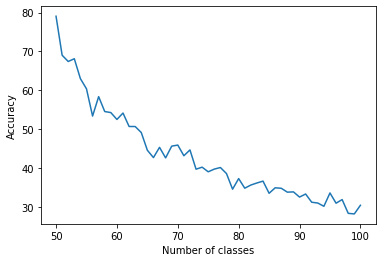

In [1]:
import matplotlib.pyplot as plt

plt.plot([50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100], [79.03999999999999, 69.01960784313725, 67.40384615384616, 68.11320754716981, 63.0, 60.38181818181818, 53.37499999999999, 58.36842105263158, 54.5344827586207, 54.271186440677965, 52.5, 54.147540983606554, 50.693548387096776, 50.682539682539684, 49.140625, 44.58461538461538, 42.696969696969695, 45.32835820895522, 42.61764705882353, 45.63768115942029, 45.91428571428571, 43.16901408450704, 44.666666666666664, 39.71232876712329, 40.229729729729726, 39.04, 39.73684210526316, 40.14285714285714, 38.58974358974359, 34.56962025316456, 37.3, 34.82716049382716, 35.63414634146341, 36.168674698795186, 36.642857142857146, 33.51764705882353, 34.93023255813954, 34.804597701149426, 33.80681818181818, 33.87640449438202, 32.544444444444444, 33.32967032967033, 31.217391304347824, 31.010752688172044, 30.170212765957448, 33.6, 30.96875, 31.896907216494846, 28.357142857142858, 28.21212121212121, 30.43])
plt.ylabel('Accuracy')
plt.xlabel('Number of classes')
plt.show()